# ADHD200 — Обучение (Multiclass) на подготовленных таймсериях - Iter 3

Этот ноутбук реализует три ступени:
1) **Базлайны без нейросетей**:
   - **Статический FC** (корреляции ROI×ROI) → Logistic Regression (+PCA по желанию);
   - **Динамический FC + HMM** (или KMeans), признаки: доли состояний, переключаемость, длительность.
   - **Переносимость**: Leave-One-Site-Out для статического FC.
2) **Нейросети**: LSTM/GRU/TCN+BiGRU+Self-Attn с ковариатами (возраст/пол), веса классов, метрики `acc/auc/f1`.
3) **Строгая валидация**: групповой сплит по участнику/сайту для предотвращения утечек.

В данном ноутбуке используется подготовленный набор данных из ноутбука [ADHD200_prep.ipynb](ADHD200_prep.ipynb). Для обучения нейросети используются файлы `.npy` с таймсериями.
Обучение ведётся только на данных подростков из соответствующего отфильтрованного манифеста `manifest.csv`.


In [1]:
# %pip install torch
# %pip install hmmlearn
# %pip install xlwt
# %pip install openpyxl
# %pip install pandas
# %pip install "numpy<2"

In [2]:
import re, os
from pathlib import Path
import yaml
import enum

import numpy as np
print(f"NumPy version: {np.__version__}")
import pandas as pd
print(f"Pandas version: {pd.__version__}")
import seaborn as sns

import xlwt

from IPython.display import display

from sklearn.model_selection import StratifiedGroupKFold, GroupShuffleSplit
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, precision_score, recall_score, confusion_matrix, roc_curve

from hmmlearn.hmm import GaussianHMM

import torch
print(f"PyTorch version: {torch.__version__}")
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence

# Plotting
import matplotlib.pyplot as plt

# Увеличим ширину печати для pandas
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Отключим предупреждения для чистоты логирования
import warnings
warnings.filterwarnings('ignore')

NumPy version: 1.26.4
Pandas version: 2.3.3
PyTorch version: 2.2.2


## Конфигурация

In [3]:
# Загрузка констант из YAML файла
with open('../../research_constants.yaml', 'r') as file:
    constants = yaml.safe_load(file)

CHILDREN_MINIMAL_AGE = constants['AGE_COHORTS']['CHILDREN_MINIMAL_AGE']
CHILDREN_MAXIMAL_AGE = constants['AGE_COHORTS']['CHILDREN_MAXIMAL_AGE']
TEEN_MINIMAL_AGE = constants['AGE_COHORTS']['TEEN_MINIMAL_AGE']
TEEN_MAXIMAL_AGE = constants['AGE_COHORTS']['TEEN_MAXIMAL_AGE']
ADULT_MINIMAL_AGE = constants['AGE_COHORTS']['ADULT_MINIMAL_AGE']
ADULT_MAXIMAL_AGE = constants['AGE_COHORTS']['ADULT_MAXIMAL_AGE']

AGE_COHORT_NAMES = constants['AGE_COHORT_NAMES']
AGE_COHORTS_KEYS = constants['AGE_COHORTS_KEYS']

DIAGNOSIS_KEYS = constants['DIAGNOSIS_KEYS']

SITE_CODES_REVERSED_MAP = constants['SITE_CODES_REVERSED_MAP']

ATHENA_SOURCE = constants['DATA_SOURCES']['ATHENA_SOURCE_ROOT']
RANDOM_SEED = constants['RANDOM_SEED']

T_FIX = constants['TIME_SERIES']['T_FIX']
WINDOW_SIZE = constants['TIME_SERIES']['WINDOW_SIZE']
WINDOW_STEP = constants['TIME_SERIES']['WINDOW_STEP']
FC_METRIC = constants['TIME_SERIES']['FC_METRIC']

print("Константы загружены:")
print(f"Дети: {CHILDREN_MINIMAL_AGE}-{CHILDREN_MAXIMAL_AGE} лет")
print(f"Подростки: {TEEN_MINIMAL_AGE}-{TEEN_MAXIMAL_AGE} лет")
print(f"Молодые взрослые: {ADULT_MINIMAL_AGE}-{ADULT_MAXIMAL_AGE} лет")
print(f"Имена когорт по возрасту: {AGE_COHORT_NAMES}")
print(f"Ключи когорт по возрасту: {AGE_COHORTS_KEYS}")
print(f"Ключи диагнозов: {DIAGNOSIS_KEYS}")
print(f"Коды сайтов (обратная карта): {SITE_CODES_REVERSED_MAP}")
print(f"Путь к Athena Source: {ATHENA_SOURCE}")
print(f"Random seed: {RANDOM_SEED}")
print(f"T_FIX: {T_FIX}")
print(f"WINDOW_SIZE: {WINDOW_SIZE}")
print(f"WINDOW_STEP: {WINDOW_STEP}")
print(f"FC_METRIC: {FC_METRIC}")

Константы загружены:
Дети: 0-11.99 лет
Подростки: 12-15.99 лет
Молодые взрослые: 16-21.99 лет
Имена когорт по возрасту: ['children', 'teen', 'adult']
Ключи когорт по возрасту: {'children': 0, 'teen': 1, 'adult': 2}
Ключи диагнозов: {0: 'Typically Developing Children', 1: 'ADHD-Combined', 2: 'ADHD-Hyperactive/Impulsive', 3: 'ADHD-Inattentive'}
Коды сайтов (обратная карта): {'Peking_1': 1, 'Peking_2': 1, 'Peking_3': 1, 'Brown': 2, 'KKI': 3, 'NeuroIMAGE': 4, 'NYU': 5, 'OHSU': 6, 'Pittsburgh': 7, 'WashU': 8}
Путь к Athena Source: /Users/alexey.stafeev/MyDocuments/Study/МФТИ/НИР/Materials/ADHD200/ADHD200_CC400_TCs_filtfix
Random seed: 42
T_FIX: 200
WINDOW_SIZE: 30
WINDOW_STEP: 5
FC_METRIC: correlation


In [4]:
class ModelType(enum.Enum):
    LSTM = 'LSTM'
    GRU = 'GRU'
    TCN = 'TCN'
    MLP = 'MLP'

class DataMode(enum.Enum):
    SEQ_NPY = 'SEQ_NPY'
    SEQ_TSV = 'SEQ_TSV'
    DFC = 'DFC'

class ImputeStrategy(enum.Enum):
    ROI_MEAN = 'roi_mean'
    GLOBAL_ZERO = 'global_zero'

class BalanceStrategy(enum.Enum):
    SAMPLER = 'sampler'
    OVERSAMPLE = 'oversample'
    LOSS_WEIGHT = 'loss_weight'
    NO_BALANCE = 'nobalance'

class EarlyStopMetric(enum.Enum):
    VAL_LOSS = 'val_loss'
    VAL_ACCURACY = 'val_accuracy'
    VAL_F1 = 'val_f1'
    VAL_AUC = 'val_auc'

class ModelTrainingMetric(enum.Enum):
    VAL_ACCURACY = 'val_accuracy'
    VAL_F1 = 'val_f1'
    VAL_AUC = 'val_auc'
    VAL_PREC = 'val_prec'

class ClassWeightMode(enum.Enum):
    INV_FREQ = 'inv_freq' # обратная частота классов
    INV_SQRT_FREQ = 'inv_sqrt_freq' # обратный квадратный корень частоты классов

class NormalizationStrategy(enum.Enum):
    NONE = 'none'
    MEAN_STD = 'mean_std'
    MEDIAN_MAD = 'median_mad'
    MEDIAN_IQR = 'median_iqr'

DATA_ROOT = './Athena_prepared_three_age_cohorts' # корневая директория с подготовленными данными (iter_3)
MANIFEST_CSV = f'{DATA_ROOT}/manifest_windows_all_cohorts.csv'

PHENO_CSV = "../../SortedRawDataBIDS/participants_all_cohorts_pheno.tsv"    # participant_id + метка (0..N_CLASSES-1) + Age + sex + site

DFC_CSV = f'{DATA_ROOT}/aggregate_manifest_all_cohorts.csv'  # только если DATA_MODE=='DFC'

EXPERIMENT_ROOT = f'./Experiments'
if not os.path.exists(EXPERIMENT_ROOT):
    os.makedirs(EXPERIMENT_ROOT)
    print(f"Создана директория для экспериментов: {EXPERIMENT_ROOT}")
else:
    print(f"Директория для экспериментов уже существует: {EXPERIMENT_ROOT}")

EXPERIMENT_NAME = '1_st_experiment'
EXPERIMENT_DIR = str(Path(EXPERIMENT_ROOT)/EXPERIMENT_NAME)
if not os.path.exists(EXPERIMENT_DIR):
    os.makedirs(EXPERIMENT_DIR)
    print(f"Создана директория для эксперимента: {EXPERIMENT_DIR}")

CHECKPOINT_DIR = str(Path(EXPERIMENT_DIR)/'checkpoints')
if not os.path.exists(CHECKPOINT_DIR):
    os.makedirs(CHECKPOINT_DIR)
    print(f"Создана директория для чекпоинтов: {CHECKPOINT_DIR}")
else:
    print(f"Директория для чекпоинтов уже существует: {CHECKPOINT_DIR}")

REUSE_MAIN_MODELS = True           # True - не удаляем уже существующие модели для основной модели, а загружаем их и используем
REUSE_BASELINE_MODELS = True       # True - не удаляем уже существующие модели для baseline моделей, а загружаем их и используем повторно
N_CLASSES = len(DIAGNOSIS_KEYS)    # число классов для классификации (0 - TD, 1 - ADHD-C, 2 - ADHD-HI, 3 - ADHD-I)
EPOCHS = 50
LR = 1e-3
WEIGHT_DECAY = 1e-4
SEED = 42
BATCH_SIZE = 16

# === Early Stopping ===
EARLY_STOP_PATIENCE = 20                      # число эпох без улучшения целевой метрики до остановки обучения
EARLY_STOP_METRIC = EarlyStopMetric.VAL_LOSS  # 'val_loss' | 'val_accuracy' | 'val_f1' | 'val_auc'
MIN_DELTA_IMPROVE = 1e-4                      # минимальное улучшение целевой метрики для сброса счётчика терпения

# === Санитизация и стабильность ===
SANITIZE_INPUTS = True
ADD_EPS_NOISE_IF_ALL_ZERO = True
MAX_GRAD_NORM = 5.0
REINIT_ON_NAN = True                          # реинициализировать модель при обнаружении NaN в градиентах
STAGNATION_RESET_EPOCHS = 3                   # число эпох без улучшения val_loss для реинициализации модели
HEAD_REINIT = True                            # реинициализировать только классификационную голову при стагнации

# === NaN / Imputation handling (salvage) ===
IMPUTE_STRATEGY = ImputeStrategy.ROI_MEAN     # 'roi_mean' | 'global_zero'
SAMPLE_MAX_NAN_FRAC = 0.98                    # итоговый порог после salvage
ROW_MIN_FINITE_FRAC = 0.3                     # строка валидна если >=30% конечных значений (иначе удаляется)
DROP_HIGH_NAN = True                          # удалять примеры только если nan_frac==1.0 (полностью испорчены)
LOG_NAN_STATS = True                          # логировать статистику по NaN до и после salvage
ROI_DROP_THRESHOLD = 0.2                      # удалить ROI (столбец), если доля конечных значений <20% в примере
INTERPOLATE_NAN = True                        # линейная интерполяция по времени до mean-импутации

# === Балансировка классов ===
ENABLE_AUTOBALANCE = True                     # включить балансировку классов
BALANCE_STRATEGY = BalanceStrategy.SAMPLER    # Типы балансировки классов: 'sampler' | 'oversample' | 'loss_weight'        
CLASS_WEIGHT_MODE = ClassWeightMode.INV_FREQ  # 'inv_freq' | 'inv_sqrt_freq'
MAX_CLASS_WEIGHT_RATIO = 10.0                 # ограничение максимального веса класса

# === Нормализация классов ===
NORMALIZATION_STRATEGY = NormalizationStrategy.NONE
NORMALIZATION_EPS = 1e-6
NORMALIZATION_CLIP = None   # например 5.0, если позже захочешь clip

LABEL_COLUMN_CANDIDATES = ['label','Label','DX','dx','Diagnosis','diagnosis']
DIAGNOSIS_MAP = {0:0, 1:1, 2:2, 3:3, 'ADHD-Combined':1, 'ADHD-Hyperactive/Impulsive':2, 'ADHD-Inattentive':3, 'TD':0, 'HC':0, 'Control':0}
DIAGNOSIS_BINARY_MAP = {0:0, 1:1, 2:1, 3:1, 'ADHD-Combined':1, 'ADHD-Hyperactive/Impulsive':1, 'ADHD-Inattentive':1, 'TD':0, 'HC':0, 'Control':0}
MULTICLASS = True

USE_COVARIATES = True
COV_CONT = ['age']
COV_CATEGORIAL = ['gender','site_original']
print(f"Использование ковариат: {USE_COVARIATES}, непрерывные (числовые): {COV_CONT}, категориальные: {COV_CATEGORIAL}")

RUN_BASELINE_A = True  # упрощённый Baseline A с PCA и логрегрессией
RUN_BASELINE_B = False # упрощённый Baseline B без PCA и с логрегрессией
FC_PCA_COMPONENTS = 200
HMM_N_STATES = 5
WIN_DYN = 30
STEP_DYN = 5
DO_LOSO = True
VAL_SIZE = 0.2                        # доля валидационного сета при GroupShuffleSplit - 20%

torch.manual_seed(SEED)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Обучение моделей будет произведено на {DEVICE}")
print(f"EarlyStopping: metric={EARLY_STOP_METRIC}, patience={EARLY_STOP_PATIENCE}")
print(f"Sanitize={SANITIZE_INPUTS}, GradClip={MAX_GRAD_NORM}, ReinitOnNaN={REINIT_ON_NAN}, StagnationReset={STAGNATION_RESET_EPOCHS}")
print(f"Salvage: Impute={IMPUTE_STRATEGY}, SampleMaxNanFrac={SAMPLE_MAX_NAN_FRAC}, RowMinFiniteFrac={ROW_MIN_FINITE_FRAC}, ROI_drop<{ROI_DROP_THRESHOLD}, Interp={INTERPOLATE_NAN}")

Директория для экспериментов уже существует: ./Experiments
Директория для чекпоинтов уже существует: Experiments/1_st_experiment/checkpoints
Использование ковариат: True, непрерывные (числовые): ['age'], категориальные: ['gender', 'site_original']
Обучение моделей будет произведено на cpu
EarlyStopping: metric=EarlyStopMetric.VAL_LOSS, patience=20
Sanitize=True, GradClip=5.0, ReinitOnNaN=True, StagnationReset=3
Salvage: Impute=ImputeStrategy.ROI_MEAN, SampleMaxNanFrac=0.98, RowMinFiniteFrac=0.3, ROI_drop<0.2, Interp=True


## 1) Загрузка манифеста и фенотипов

In [5]:
man = pd.read_csv(MANIFEST_CSV)
ph  = pd.read_csv(PHENO_CSV, delimiter='\t') # для .tsv
print(f"Pheno columns: {PHENO_CSV} : {ph.columns.tolist()}")

if 'participant_id' not in ph.columns:
    for c in ph.columns:
        if c.lower() in ('participant_id','subject','sub','id'):
            ph = ph.rename(columns={c:'participant_id'})
            break

label_col = next((c for c in LABEL_COLUMN_CANDIDATES if c in ph.columns), None)
assert label_col is not None, f'Нет метки среди: {LABEL_COLUMN_CANDIDATES}'

ph = ph[['participant_id', label_col] + [c for c in COV_CONT+COV_CATEGORIAL if c in ph.columns]].copy()
ph.rename(columns={label_col:'label'}, inplace=True)
if not MULTICLASS:
    ph['label'] = ph['label'].map(DIAGNOSIS_BINARY_MAP)
else:
    ph['label'] = ph['label'].map(DIAGNOSIS_MAP)

man.shape, ph.shape


Pheno columns: ../../SortedRawDataBIDS/participants_all_cohorts_pheno.tsv : ['participant_id', 'age', 'gender', 'diagnosis', 'site', 'orig_site', 'orig_scandir_id', 'orig_scan_id_preserved', 'age_cohort']


((1954, 15), (931, 4))

In [6]:
display(man.head())
display(man.info())

,participant_id,pid_raw,site,site_original,run_id,win_index,segment_start,segment_end,npy_path,mask_path,tsv_path,atlas,TR,nan_ratio_run,age_cohort
0,sub-1043241,1043241,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children
1,sub-1266183,1266183,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children
2,sub-1535233,1535233,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children
3,sub-1541812,1541812,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children
4,sub-1577042,1577042,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1954 entries, 0 to 1953
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   participant_id  1954 non-null   object 
 1   pid_raw         1954 non-null   int64  
 2   site            1954 non-null   object 
 3   site_original   1954 non-null   int64  
 4   run_id          1954 non-null   object 
 5   win_index       1954 non-null   int64  
 6   segment_start   1954 non-null   int64  
 7   segment_end     1954 non-null   int64  
 8   npy_path        1954 non-null   object 
 9   mask_path       1954 non-null   object 
 10  tsv_path        0 non-null      float64
 11  atlas           1954 non-null   object 
 12  TR              0 non-null      float64
 13  nan_ratio_run   1954 non-null   float64
 14  age_cohort      1954 non-null   object 
dtypes: float64(3), int64(5), object(7)
memory usage: 229.1+ KB


None

In [7]:
display(ph.head())
display(ph.info())

,participant_id,label,age,gender
0,sub-2371032,0,10.73,F
1,sub-3434578,0,8.12,F
2,sub-8628223,0,10.81,F
3,sub-2930625,0,9.97,M
4,sub-3154996,3,11.65,M


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 931 entries, 0 to 930
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   participant_id  931 non-null    object 
 1   label           931 non-null    int64  
 2   age             931 non-null    float64
 3   gender          931 non-null    object 
dtypes: float64(1), int64(1), object(2)
memory usage: 29.2+ KB


None

In [8]:
# Количество уникальных site
UNIQUE_SITES = None
if 'site_original' in man.columns:
    UNIQUE_SITES = man['site_original'].unique()
    print(f"Уникальные site: {man['site_original'].nunique()}, коды: {UNIQUE_SITES}")

Уникальные site: 7, коды: [3 5 4 6 1 7 8]


## 2) Таблица примеров под режим

Эта функция строит DataFrame с примерами для заданного режима работы модели (например, `SEQ_NPY` для таймсерий в формате `.npy`).

In [9]:
def build_table_for_mode(manifest, phenotypes, mode: DataMode) -> pd.DataFrame:
    df = manifest.copy()
    print(f"Исходная таблица манифеста: {df.shape[0]} примеров")
    if mode==DataMode.SEQ_NPY:
        df = df[df['npy_path'].notna()]
        df['data_path'] = df['npy_path']
    elif mode==DataMode.SEQ_TSV:
        if 'tsv_path' not in df.columns:
            raise ValueError("Нет 'tsv_path' в манифесте")
        df = df[df['tsv_path'].notna()]
        df['data_path'] = df['tsv_path']
    elif mode==DataMode.DFC:
        dfc = pd.read_csv(DFC_CSV)
        agg = (manifest.groupby('participant_id').agg({'site':'first','atlas':'first','TR':'median'}).reset_index())
        df = dfc.merge(agg, on='participant_id', how='left')
    else:
        raise ValueError('Unknown mode')
    print(f"Построена таблица для режима {mode}: {df.shape[0]} примеров")
    df = df.merge(phenotypes, on='participant_id', how='left')
    df = df[df['label'].notna()].reset_index(drop=True)
    return df

In [10]:
data_df = build_table_for_mode(man, ph, DataMode.SEQ_NPY)
display(data_df.head())
display(data_df.info())

Исходная таблица манифеста: 1954 примеров
Построена таблица для режима DataMode.SEQ_NPY: 1954 примеров


,participant_id,pid_raw,site,site_original,run_id,win_index,segment_start,segment_end,npy_path,mask_path,tsv_path,atlas,TR,nan_ratio_run,age_cohort,data_path,label,age,gender
0,sub-1043241,1043241,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.12,M
1,sub-1266183,1266183,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.67,F
2,sub-1535233,1535233,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.64,M
3,sub-1541812,1541812,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1.0,8.45,F
4,sub-1577042,1577042,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1.0,9.06,M


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1953 entries, 0 to 1952
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   participant_id  1953 non-null   object 
 1   pid_raw         1953 non-null   int64  
 2   site            1953 non-null   object 
 3   site_original   1953 non-null   int64  
 4   run_id          1953 non-null   object 
 5   win_index       1953 non-null   int64  
 6   segment_start   1953 non-null   int64  
 7   segment_end     1953 non-null   int64  
 8   npy_path        1953 non-null   object 
 9   mask_path       1953 non-null   object 
 10  tsv_path        0 non-null      float64
 11  atlas           1953 non-null   object 
 12  TR              0 non-null      float64
 13  nan_ratio_run   1953 non-null   float64
 14  age_cohort      1953 non-null   object 
 15  data_path       1953 non-null   object 
 16  label           1953 non-null   float64
 17  age             1953 non-null   f

None

Если DFC_CSV указан, то добавляются признаки динамического FC.

In [11]:
data_df_dfc = None
if DFC_CSV is not None:
    data_df_dfc = build_table_for_mode(man, ph, DataMode.DFC)
    print(f"Загружены признаки динамического FC из {DFC_CSV}:")
    display(data_df_dfc.head())
    display(data_df_dfc.info())
else:
    data_df_dfc = None
    print("DFC_CSV не указан, признаки динамического FC не загружены.")

Исходная таблица манифеста: 1954 примеров
Построена таблица для режима DataMode.DFC: 1954 примеров
Загружены признаки динамического FC из ./Athena_prepared_three_age_cohorts/aggregate_manifest_all_cohorts.csv:


,participant_id,pid_raw,site_x,site_original,run_id,win_index,state_label,fc_dim,atlas_x,TR_x,age_cohort,site_y,atlas_y,TR_y,label,age,gender
0,sub-1043241,1043241,KKI,3,ses1_rest1,0,0,62128,CC400,NaN,children,KKI,CC400,NaN,0.0,9.12,M
1,sub-1266183,1266183,KKI,3,ses1_rest1,0,1,62128,CC400,NaN,children,KKI,CC400,NaN,0.0,9.67,F
2,sub-1535233,1535233,KKI,3,ses1_rest1,0,0,62128,CC400,NaN,children,KKI,CC400,NaN,0.0,9.64,M
3,sub-1541812,1541812,KKI,3,ses1_rest1,0,0,62128,CC400,NaN,children,KKI,CC400,NaN,1.0,8.45,F
4,sub-1577042,1577042,KKI,3,ses1_rest1,0,1,62128,CC400,NaN,children,KKI,CC400,NaN,1.0,9.06,M


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1953 entries, 0 to 1952
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   participant_id  1953 non-null   object 
 1   pid_raw         1953 non-null   int64  
 2   site_x          1953 non-null   object 
 3   site_original   1953 non-null   int64  
 4   run_id          1953 non-null   object 
 5   win_index       1953 non-null   int64  
 6   state_label     1953 non-null   int64  
 7   fc_dim          1953 non-null   int64  
 8   atlas_x         1953 non-null   object 
 9   TR_x            0 non-null      float64
 10  age_cohort      1953 non-null   object 
 11  site_y          1953 non-null   object 
 12  atlas_y         1953 non-null   object 
 13  TR_y            0 non-null      float64
 14  label           1953 non-null   float64
 15  age             1953 non-null   float64
 16  gender          1953 non-null   object 
dtypes: float64(4), int64(5), object(8

None

In [12]:
def salvage_and_filter_pass(
    data_df: pd.DataFrame,
    data_mode: DataMode,
    roi_drop_threshold: float,
    log_nan_stats: bool = True,
    drop_high_nan: bool = True,
) -> pd.DataFrame:
    """
    Выполняет 'salvage & filtering' проход:
    - считает долю NaN до / после выбрасывания плохих ROI по каждому сэмплу,
    - записывает колонки 'nan_frac_raw' и 'roi_drop_cnt',
    - при необходимости выбрасывает полностью испорченные сэмплы (nan_frac_raw == 1.0).

    Возвращает новый DataFrame (с reset_index, если были дропы).
    """
    if data_mode not in (DataMode.SEQ_NPY, DataMode.SEQ_TSV):
        print("[Salvage] Skipped (DFC mode)")
        return data_df

    nan_fracs = []
    roi_drop_counts = []
    sample_paths = data_df["data_path"].tolist()

    for p in sample_paths:
        try:
            if data_mode == DataMode.SEQ_NPY:
                arr = np.load(p)
            else:
                comp = 'gzip' if str(p).endswith('.gz') else None
                arr = pd.read_csv(p, sep="\t", header=None, compression=comp).values

            fin = np.isfinite(arr)
            nan_frac = 1.0 - fin.mean()

            # ROI salvage: дропаем столбцы (ROI) с низкой долей финитных значений
            col_finite_ratio = fin.mean(axis=0)
            bad_cols = np.where(col_finite_ratio < roi_drop_threshold)[0]
            roi_drop_counts.append(len(bad_cols))

            if len(bad_cols) > 0 and len(bad_cols) < arr.shape[1]:
                arr = np.delete(arr, bad_cols, axis=1)

            # пересчёт nan_frac после удаления колонок
            fin2 = np.isfinite(arr)
            nan_frac = 1.0 - fin2.mean()

        except Exception:
            print(f"Ошибка при загрузке сэмпла {p}, помечаем как полностью NaN")
            nan_frac = 1.0
            roi_drop_counts.append(np.nan)

        nan_fracs.append(nan_frac)

    data_df = data_df.copy()
    data_df["nan_frac_raw"] = nan_fracs
    data_df["roi_drop_cnt"] = roi_drop_counts

    if log_nan_stats:
        print("[Salvage] Raw nan_frac describe:")
        print(data_df["nan_frac_raw"].describe())
        print("[Salvage] ROI drop count describe:")
        print(data_df["roi_drop_cnt"].describe())

    # Дропаем только полностью испорченные сэмплы
    if drop_high_nan:
        before = len(data_df)
        data_df = data_df[data_df["nan_frac_raw"] < 1.0].reset_index(drop=True)
        print(f"[Salvage] Dropped {before - len(data_df)} fully NaN samples")

    # Гистограмма
    if log_nan_stats:
        hist_vals = data_df["nan_frac_raw"].values
        bins = np.linspace(0, 1, 11)
        hist, _ = np.histogram(hist_vals, bins=bins)
        print("[Salvage] nan_frac histogram (bins 0..1 step 0.1):", hist)
        
    return data_df

def nan_filter_before_splits(
    data_df: pd.DataFrame,
    data_mode: DataMode,
    sample_max_nan_frac: float,
    log_nan_stats: bool = True,
    drop_high_nan: bool = True,
) -> pd.DataFrame:
    """
    Считает долю NaN по каждому сэмплу и фильтрует по порогу sample_max_nan_frac.
    Записывает колонку 'nan_frac' и возвращает новый DataFrame.
    """
    nan_fracs = []
    
    if data_mode not in (DataMode.SEQ_NPY, DataMode.SEQ_TSV):
        print("[NaN] Skipped filtering (DFC mode)")
        data_df["nan_frac"] = np.zeros(len(data_df))
        return data_df

    for p in data_df["data_path"]:
        try:
            if data_mode == DataMode.SEQ_NPY:
                arr = np.load(p)
            else:
                comp = 'gzip' if str(p).endswith('.gz') else None
                arr = pd.read_csv(p, sep="\t", header=None, compression=comp).values
            total = arr.size
            nan_count = np.isnan(arr).sum()
            nan_frac = nan_count / total if total > 0 else 0.0
        except Exception:
            nan_frac = 1.0

        nan_fracs.append(nan_frac)

    data_df = data_df.copy()
    data_df["nan_frac"] = nan_fracs

    if log_nan_stats:
        print("[NaN] Summary before filtering:")
        print(data_df["nan_frac"].describe())
        print(
            "[NaN] Count > SAMPLE_MAX_NAN_FRAC:",
            (data_df["nan_frac"] > sample_max_nan_frac).sum(),
        )

    if drop_high_nan:
        kept_df = data_df[data_df["nan_frac"] <= sample_max_nan_frac].reset_index(
            drop=True
        )
        dropped = len(data_df) - len(kept_df)
        print(
            f"[NaN] Dropped {dropped} / {len(data_df)} samples "
            f"(>{sample_max_nan_frac*100:.1f}% NaN)"
        )
        data_df = kept_df

    return data_df

def add_n_roi_column(data_df: pd.DataFrame, mode: DataMode) -> pd.DataFrame:
    n_roi_list = []
    for p in data_df["data_path"]:
        try:
            if mode == DataMode.SEQ_NPY:
                arr = np.load(p)
            elif mode == DataMode.SEQ_TSV:
                comp = 'gzip' if str(p).endswith('.gz') else None
                arr = pd.read_csv(p, sep="\t", header=None, compression=comp).values
            else:
                arr = None
            n_roi_list.append(arr.shape[1] if arr is not None else 0)
        except Exception:
            n_roi_list.append(0)
    df = data_df.copy()
    df["n_roi"] = n_roi_list
    return df

### Проверка доли NaN в данных (для таймсерий SEQ_NPY/SEQ_TSV)

In [13]:
print("=== Формы сырых сэмплов ДО salvage ===")
data_df = add_n_roi_column(data_df, mode=DataMode.SEQ_NPY)
print(data_df["n_roi"].value_counts().head())

target_n_roi = data_df["n_roi"].mode().iloc[0]
print("[ROI size] target_n_roi:", target_n_roi)

bad_mask = data_df["n_roi"] != target_n_roi
print("[ROI size] Плохих сэмплов (неправильный n_roi):", bad_mask.sum())
if bad_mask.sum() > 0:
    print(data_df.loc[bad_mask, ["participant_id", "data_path", "n_roi"]].head())

# Отфильтруем файлы с "битой" маской, если они есть
data_df = data_df[~bad_mask].reset_index(drop=True)
print("[ROI size] Размер после фильтрации по размеру ROI:", data_df.shape)

=== Формы сырых сэмплов ДО salvage ===


n_roi
353    1921
1        32
Name: count, dtype: int64
[ROI size] target_n_roi: 353
[ROI size] Плохих сэмплов (неправильный n_roi): 32
    participant_id                                          data_path  n_roi
91     sub-0010016  Athena_prepared_three_age_cohorts/cohort_child...      1
92     sub-0010016  Athena_prepared_three_age_cohorts/cohort_child...      1
93     sub-0010016  Athena_prepared_three_age_cohorts/cohort_child...      1
94     sub-0010016  Athena_prepared_three_age_cohorts/cohort_child...      1
103    sub-0010027  Athena_prepared_three_age_cohorts/cohort_child...      1
[ROI size] Размер после фильтрации по размеру ROI: (1921, 20)


In [14]:
# === Salvage & Filtering pass ===
print("=== Salvage & Filtering pass ===")
data_df = salvage_and_filter_pass(
    data_df,
    data_mode=DataMode.SEQ_NPY,
    roi_drop_threshold=ROI_DROP_THRESHOLD,
    log_nan_stats=LOG_NAN_STATS,
    drop_high_nan=DROP_HIGH_NAN,
)

print("Размер после salvage:", data_df.shape)
display(data_df.head())

# === Фильтрация примеров по доле NaN до сплитов ===
print("\n=== NaN filtering before splits ===")
data_df = nan_filter_before_splits(
    data_df,
    data_mode=DataMode.SEQ_NPY,
    sample_max_nan_frac=SAMPLE_MAX_NAN_FRAC,
    log_nan_stats=LOG_NAN_STATS,
    drop_high_nan=DROP_HIGH_NAN,
)

print("Размер после NaN фильтрации:", data_df.shape)
print("Top nan_frac head:")
print(data_df["nan_frac"].head())

=== Salvage & Filtering pass ===
[Salvage] Raw nan_frac describe:
count    1921.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: nan_frac_raw, dtype: float64
[Salvage] ROI drop count describe:
count    1921.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: roi_drop_cnt, dtype: float64
[Salvage] Dropped 0 fully NaN samples
[Salvage] nan_frac histogram (bins 0..1 step 0.1): [1921    0    0    0    0    0    0    0    0    0]
Размер после salvage: (1921, 22)


,participant_id,pid_raw,site,site_original,run_id,win_index,segment_start,segment_end,npy_path,mask_path,tsv_path,atlas,TR,nan_ratio_run,age_cohort,data_path,label,age,gender,n_roi,nan_frac_raw,roi_drop_cnt
0,sub-1043241,1043241,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.12,M,353,0.0,0
1,sub-1266183,1266183,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.67,F,353,0.0,0
2,sub-1535233,1535233,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.64,M,353,0.0,0
3,sub-1541812,1541812,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1.0,8.45,F,353,0.0,0
4,sub-1577042,1577042,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1.0,9.06,M,353,0.0,0



=== NaN filtering before splits ===
[NaN] Summary before filtering:
count    1921.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: nan_frac, dtype: float64
[NaN] Count > SAMPLE_MAX_NAN_FRAC: 0
[NaN] Dropped 0 / 1921 samples (>98.0% NaN)
Размер после NaN фильтрации: (1921, 23)
Top nan_frac head:
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: nan_frac, dtype: float64


In [15]:
# === Анализ форм сэмплов ===
print("\n=== Анализ форм сэмплов ===")

def get_sample_shape(path: str, mode: DataMode) -> tuple:
    if mode == DataMode.SEQ_NPY:
        arr = np.load(path)
    else:
        comp = 'gzip' if str(path).endswith('.gz') else None
        arr = pd.read_csv(path, sep='\t', header=None, compression=comp).values
    return arr.shape

shapes = []
for p in data_df['data_path']:
    arr_shape = get_sample_shape(p, DataMode.SEQ_NPY)
    shapes.append(arr_shape)

unique_shapes, counts = np.unique(np.array(shapes), axis=0, return_counts=True)
print("Уникальные формы сэмплов (T, ROI) и их количество:")
for s, c in zip(unique_shapes, counts):
    print(s, "=>", c)


=== Анализ форм сэмплов ===
Уникальные формы сэмплов (T, ROI) и их количество:
[200 353] => 1921


In [16]:
# Проверка, что лейблы не испорчены одним классом после фильтров:
print("Label distribution:", data_df['label'].value_counts(normalize=True))

Label distribution: label
0.0    0.605934
1.0    0.207704
3.0    0.169183
2.0    0.017179
Name: proportion, dtype: float64


In [17]:
print('Проверка загрузки первых 10 сэмплов (SEQ_NPY):')
test_paths = data_df['data_path'].head(10).tolist()
for p in test_paths:
    x = np.load(p)
    print(p, 'nan%', np.isnan(x).mean()*100, 'std_mean', x.std(axis=0).mean())

Проверка загрузки первых 10 сэмплов (SEQ_NPY):
Athena_prepared_three_age_cohorts/cohort_children_participants/sub-1043241/sub-1043241_ses1_rest1_w0_CC400.npy nan% 0.0 std_mean 0.8582435
Athena_prepared_three_age_cohorts/cohort_children_participants/sub-1266183/sub-1266183_ses1_rest1_w0_CC400.npy nan% 0.0 std_mean 0.7734105
Athena_prepared_three_age_cohorts/cohort_children_participants/sub-1535233/sub-1535233_ses1_rest1_w0_CC400.npy nan% 0.0 std_mean 0.8582435
Athena_prepared_three_age_cohorts/cohort_children_participants/sub-1541812/sub-1541812_ses1_rest1_w0_CC400.npy nan% 0.0 std_mean 0.7734105
Athena_prepared_three_age_cohorts/cohort_children_participants/sub-1577042/sub-1577042_ses1_rest1_w0_CC400.npy nan% 0.0 std_mean 0.7734105
Athena_prepared_three_age_cohorts/cohort_children_participants/sub-1638334/sub-1638334_ses1_rest1_w0_CC400.npy nan% 0.0 std_mean 0.7734105
Athena_prepared_three_age_cohorts/cohort_children_participants/sub-1652369/sub-1652369_ses1_rest1_w0_CC400.npy nan% 0.0

## 3) Обработка ковариат

Этот блок извлекает ковариаты (возраст, пол) для использования в модели (если нужно).

In [18]:
def load_covariates(df: pd.DataFrame, cov_cols_cont: list = [], cov_cols_cat: list = []) -> np.ndarray:
    cont_data = [c for c in cov_cols_cont if c in df.columns]
    cat_data = [c for c in cov_cols_cat if c in df.columns]
    return cont_data, cat_data

cov_cols_cont, cov_cols_cat = load_covariates(data_df, COV_CONT, COV_CATEGORIAL)
all_cov_cols = (cov_cols_cont + cov_cols_cat)

# Фиксируем категории для OneHotEncoder, чтобы размерность и порядок ковариат
# были одинаковыми между train/val/inference (особенно важно для site_original).
SITE_ORIG_CATEGORIES = None
GENDER_CATEGORIES = None
if 'site_original' in data_df.columns:
    SITE_ORIG_CATEGORIES = np.array(sorted(pd.Series(data_df['site_original']).dropna().unique().tolist()))
if 'gender' in data_df.columns:
    GENDER_CATEGORIES = np.array(sorted(pd.Series(data_df['gender']).dropna().unique().tolist()))

def _make_ohe_for_cols(cols: list[str]):
    # Наиболее частый кейс: gender + site_original. При зафиксированных категориях
    # OneHotEncoder всегда выдаёт одну и ту же ширину (2 + 7 = 9).
    if cols == ['gender'] and GENDER_CATEGORIES is not None:
        return OneHotEncoder(handle_unknown='ignore', sparse_output=False, categories=[GENDER_CATEGORIES])
    if cols == ['site_original'] and SITE_ORIG_CATEGORIES is not None:
        return OneHotEncoder(handle_unknown='ignore', sparse_output=False, categories=[SITE_ORIG_CATEGORIES])
    if cols == ['gender', 'site_original'] and (GENDER_CATEGORIES is not None and SITE_ORIG_CATEGORIES is not None):
        return OneHotEncoder(handle_unknown='ignore', sparse_output=False, categories=[GENDER_CATEGORIES, SITE_ORIG_CATEGORIES])
    return OneHotEncoder(handle_unknown='ignore', sparse_output=False)

covariates_prepared = None
covariate_prepared_gender = None
covariate_prepared_age = None
covariate_prepared_site = None
covariate_prepared_gender_site = None
if USE_COVARIATES and (cov_cols_cont or cov_cols_cat):
    # Для общего пайплайна (cont+cat) постараемся зафиксировать категории, если они известны для всех cat-колонок.
    ohe_all_cat = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
    if cov_cols_cat:
        cats = []
        ok = True
        for c in cov_cols_cat:
            if c == 'gender' and GENDER_CATEGORIES is not None:
                cats.append(GENDER_CATEGORIES)
            elif c == 'site_original' and SITE_ORIG_CATEGORIES is not None:
                cats.append(SITE_ORIG_CATEGORIES)
            else:
                ok = False
                break
        if ok:
            ohe_all_cat = OneHotEncoder(handle_unknown='ignore', sparse_output=False, categories=cats)
    covariates_prepared = ColumnTransformer([
        ('cont', StandardScaler(), cov_cols_cont),
        ('cat',  ohe_all_cat, cov_cols_cat)
    ])
    if 'gender' in cov_cols_cat:
        covariate_prepared_gender = ColumnTransformer(
            [('cat', _make_ohe_for_cols(['gender']), ['gender'])]
        )
    if 'site_original' in cov_cols_cat:
        covariate_prepared_site = ColumnTransformer(
            [('cat', _make_ohe_for_cols(['site_original']), ['site_original'])]
        )
    if 'age' in cov_cols_cont:
        covariate_prepared_age = ColumnTransformer(
            [('cont', StandardScaler(), ['age'])]
        )
    if 'gender' in cov_cols_cat and 'site_original' in cov_cols_cat:
        covariate_prepared_gender_site = ColumnTransformer([
            ('cat', _make_ohe_for_cols(['gender', 'site_original']), ['gender', 'site_original'])
        ])
# Выведем информацию о ковариатах
if USE_COVARIATES:
    print(f"Числовые ковариаты - {cov_cols_cont}, категориальные ковариаты - {cov_cols_cat}")
    print(f"Все колонки ковариат: {all_cov_cols}")
    if SITE_ORIG_CATEGORIES is not None:
        print(f"site_original категорий: {len(SITE_ORIG_CATEGORIES)} -> {SITE_ORIG_CATEGORIES.tolist()}")
else:
    print("Ковариаты не используются.")

Числовые ковариаты - ['age'], категориальные ковариаты - ['gender', 'site_original']
Все колонки ковариат: ['age', 'gender', 'site_original']
site_original категорий: 7 -> [1, 3, 4, 5, 6, 7, 8]


## 4) Датасеты и DataLoader’ы

In [19]:
# Вспомогательная функция нормализации

def normalize_timeseries_sample(
    x: np.ndarray,
    strategy: NormalizationStrategy = NORMALIZATION_STRATEGY,
    eps: float = NORMALIZATION_EPS,
    clip_value: float | None = NORMALIZATION_CLIP,
) -> np.ndarray:
    """
    Нормализация одного сэмпла x формы (T, R) по времени отдельно для каждого ROI.

    NONE:
        без нормализации

    MEAN_STD:
        (x - mean_t) / std_t

    MEDIAN_MAD:
        (x - median_t) / MAD_t
        где MAD = median(|x - median|)

    MEDIAN_IQR:
        (x - median_t) / IQR_t
        где IQR = q75 - q25
    """
    if strategy == NormalizationStrategy.NONE:
        return x

    x = x.astype(np.float32, copy=False)

    if strategy == NormalizationStrategy.MEAN_STD:
        center = np.mean(x, axis=0, keepdims=True)
        scale = np.std(x, axis=0, keepdims=True)

    elif strategy == NormalizationStrategy.MEDIAN_MAD:
        center = np.median(x, axis=0, keepdims=True)
        scale = np.median(np.abs(x - center), axis=0, keepdims=True)

    elif strategy == NormalizationStrategy.MEDIAN_IQR:
        center = np.median(x, axis=0, keepdims=True)
        q75 = np.percentile(x, 75, axis=0, keepdims=True)
        q25 = np.percentile(x, 25, axis=0, keepdims=True)
        scale = q75 - q25

    else:
        raise ValueError(f"Unsupported normalization strategy: {strategy}")

    scale = np.where(scale < eps, 1.0, scale)
    x = (x - center) / (scale + eps)

    if clip_value is not None:
        x = np.clip(x, -clip_value, clip_value)

    return x.astype(np.float32, copy=False)

In [20]:
class TimeSeriesDataset(Dataset):
    def __init__(self, df: pd.DataFrame,
                 mode: DataMode,
                 impute_strategy: ImputeStrategy = IMPUTE_STRATEGY,
                 add_eps_noise_if_all_zero: bool = ADD_EPS_NOISE_IF_ALL_ZERO,
                 cov_pre=None,
                 cov_cols:list|None=None,
                 roi_keep_idx=None,
                 normalization_strategy: NormalizationStrategy = NORMALIZATION_STRATEGY,
                 normalization_eps: float = NORMALIZATION_EPS,
                 normalization_clip: float | None = NORMALIZATION_CLIP):
        assert mode in (DataMode.SEQ_NPY, DataMode.SEQ_TSV), 'TimeSeriesDataset поддерживает только SEQ_NPY и SEQ_TSV режимы'
        self.df = df.reset_index(drop=True)
        self.mode = mode
        self.impute_strategy = impute_strategy
        self.add_eps_noise_if_all_zero = add_eps_noise_if_all_zero
        self.cov_pre = cov_pre
        self.roi_keep_idx = roi_keep_idx

        self.normalization_strategy = normalization_strategy
        self.normalization_eps = normalization_eps
        self.normalization_clip = normalization_clip

        if cov_pre is not None:
            covariates = cov_cols if cov_cols is not None else []
            cov_input = self.df[[c for c in covariates if c in self.df.columns]].copy()
            self.cov = cov_pre.transform(cov_input)
            if hasattr(self.cov, "toarray"):
                self.cov = self.cov.toarray()
            self.cov = np.asarray(self.cov, dtype=np.float32)
        else:
            self.cov = None

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        r = self.df.iloc[i]
        data_path = r['data_path']
        data_path_str = str(data_path)
        data_path_str_lower = data_path_str.lower()

        if data_path_str_lower.endswith('.npy.gz'):
            import gzip
            with gzip.open(data_path, 'rb') as f:
                x = np.load(f).astype('float32')
        elif data_path_str_lower.endswith('.npy'):
            x = np.load(data_path).astype('float32')
        else:
            comp = 'gzip' if data_path_str_lower.endswith('.gz') else None
            x = pd.read_csv(data_path, sep='\t', header=None, compression=comp).values.astype('float32')

        if self.roi_keep_idx is not None:
            x = x[:, self.roi_keep_idx]

        # --------------------------------------------------------
        # NaN / finite mask
        # --------------------------------------------------------
        finite_mask = np.isfinite(x)
        row_valid = (finite_mask.sum(axis=1) / (finite_mask.shape[1] if finite_mask.shape[1] > 0 else 1)) >= ROW_MIN_FINITE_FRAC

        # --------------------------------------------------------
        # Imputation
        # --------------------------------------------------------
        if self.impute_strategy == ImputeStrategy.ROI_MEAN:
            roi_means = np.where(
                np.isfinite(x[row_valid]).sum(axis=0) > 0,
                np.nanmean(x[row_valid], axis=0),
                0.0
            )
            nan_positions = ~finite_mask
            if x.shape[1] > 0:
                x[nan_positions] = np.take(roi_means, np.where(nan_positions)[1])
        else:
            x[~finite_mask] = 0.0

        # --------------------------------------------------------
        # Optional sample-level normalization
        # --------------------------------------------------------
        x = normalize_timeseries_sample(
            x,
            strategy=self.normalization_strategy,
            eps=self.normalization_eps,
            clip_value=self.normalization_clip,
        )

        # --------------------------------------------------------
        # Noise if all zero
        # --------------------------------------------------------
        if self.add_eps_noise_if_all_zero and not np.any(x):
            x += (np.random.randn(*x.shape).astype('float32')) * 1e-3

        # --------------------------------------------------------
        # Final sanitize
        # --------------------------------------------------------
        x = np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0)

        m = row_valid.astype('float32')

        mpath = r.get('mask_path', None)
        if isinstance(mpath, str) and len(mpath) > 0 and Path(mpath).exists():
            ext_m = np.load(mpath).astype('float32')
            if ext_m.shape[0] == m.shape[0]:
                m = m * ext_m

        if self.cov is not None:
            cov_t = torch.from_numpy(self.cov[i])
        else:
            cov_t = torch.empty(0)

        y = int(r['label'])
        pid = str(r['participant_id'])

        return torch.from_numpy(x), torch.from_numpy(m), cov_t, torch.tensor(y), pid

class DFCDataset(Dataset):
    def __init__(self, df: pd.DataFrame,
                 impute_strategy: ImputeStrategy = IMPUTE_STRATEGY,
                 add_eps_noise_if_all_zero: bool = ADD_EPS_NOISE_IF_ALL_ZERO,
                 cov_pre=None,
                 cov_cols:list|None=None):
        self.df = df.reset_index(drop=True)
        self.cov_pre = cov_pre
        self.impute_strategy = impute_strategy
        self.add_eps_noise_if_all_zero = add_eps_noise_if_all_zero
        drop_cols = {'participant_id','site','atlas','TR','label'}
        self.feat_cols = [c for c in self.df.columns if c not in drop_cols and pd.api.types.is_numeric_dtype(self.df[c])]
        if cov_pre is not None:
            covariates = cov_cols if cov_cols is not None else []
            cov_input = self.df[[c for c in covariates if c in self.df.columns]].copy()
            self.cov = cov_pre.transform(cov_input)
            # OneHotEncoder/ColumnTransformer can return scipy sparse (csr_matrix)
            if hasattr(self.cov, "toarray"):
                self.cov = self.cov.toarray()
            self.cov = np.asarray(self.cov, dtype=np.float32)
        else:
            self.cov = None
    def __len__(self): return len(self.df)
    def __getitem__(self, i):
        r = self.df.iloc[i]
        x = self.df.loc[i, self.feat_cols].values.astype('float32')
        if self.impute_strategy == ImputeStrategy.ROI_MEAN:  # treat each feature individually
            if not np.isfinite(x).all():
                bad = ~np.isfinite(x)
                x[bad] = 0.0  # cannot compute per-feature mean without temporal axis
        else:
            x[~np.isfinite(x)] = 0.0
        if self.add_eps_noise_if_all_zero and not np.any(x):
            x += (np.random.randn(*x.shape).astype('float32')) * 1e-3
        if self.cov is not None:
            cov_t = torch.from_numpy(self.cov[i])
        else:
            cov_t = torch.empty(0)
        y = int(r['label'])
        pid = str(r['participant_id'])
        return torch.from_numpy(x), torch.tensor(1.0), cov_t, torch.tensor(y), pid

# Oversampling helper (replicate minority rows)
def oversample_df(df, label_col='label'):
    counts = df[label_col].value_counts()
    max_n = counts.max()
    parts = []
    for lab, cnt in counts.items():
        subset = df[df[label_col]==lab]
        if cnt == max_n:
            parts.append(subset)
        else:
            reps = int(np.ceil(max_n / cnt))
            augmented = pd.concat([subset]*reps, ignore_index=True).iloc[:max_n]
            parts.append(augmented)
    out = pd.concat(parts, ignore_index=True).sample(frac=1.0, random_state=SEED).reset_index(drop=True)
    return out

In [21]:
from torch.utils.data import WeightedRandomSampler

# Основная функция создания даталоадеров
def make_fold_dataloaders(df, fold_idx=0,
                          mode: DataMode = DataMode.SEQ_NPY,
                          enable_autobalance=ENABLE_AUTOBALANCE,
                          balance_strategy=BALANCE_STRATEGY,
                          class_weight_mode=CLASS_WEIGHT_MODE,
                          max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                          batch_size=BATCH_SIZE,
                          impute_strategy: ImputeStrategy = IMPUTE_STRATEGY,
                          add_eps_noise_if_all_zero: bool = ADD_EPS_NOISE_IF_ALL_ZERO,
                          cov_pipeline: ColumnTransformer|None = None,
                          cov_cols: list|None = None,
                          fit_cov_pipeline: bool = True,
                          check_group_leakage: bool = True,
                          normalization_strategy: NormalizationStrategy = NORMALIZATION_STRATEGY,
                          normalization_eps: float = NORMALIZATION_EPS,
                          normalization_clip: float | None = NORMALIZATION_CLIP):
    if 'participant_id' not in df.columns:
        raise KeyError("make_fold_dataloaders: missing required column 'participant_id'")
    if 'label' not in df.columns:
        raise KeyError("make_fold_dataloaders: missing required column 'label'")

    groups = df['participant_id'].astype(str).values
    y = df['label'].values

    class_counts = pd.Series(y).value_counts()
    base_splits = 5
    min_class = class_counts.min()
    n_splits = base_splits if min_class >= base_splits else max(2, int(min_class))

    if len(np.unique(y)) > 1 and n_splits >= 2:
        splitter = StratifiedGroupKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    else:
        splitter = GroupShuffleSplit(n_splits=1, test_size=VAL_SIZE, random_state=SEED)

    folds = list(splitter.split(X=np.zeros_like(y), y=y, groups=groups))
    if fold_idx >= len(folds):
        fold_idx = 0
    tr_idx, va_idx = folds[fold_idx]

    df_train = df.iloc[tr_idx].copy()
    df_val = df.iloc[va_idx].copy()

    if check_group_leakage:
        train_pids = set(df_train['participant_id'].astype(str).tolist())
        val_pids = set(df_val['participant_id'].astype(str).tolist())
        overlap = train_pids.intersection(val_pids)
        if overlap:
            example = list(sorted(overlap))[:10]
            raise ValueError(
                "participant_id leakage between train/val splits "
                f"(n_overlap={len(overlap)}). Example ids: {example}"
            )

    if enable_autobalance and balance_strategy == BalanceStrategy.OVERSAMPLE:
        df_train = oversample_df(df_train, label_col='label')

    if cov_pipeline is not None:
        cov_fitted = Pipeline(steps=cov_pipeline.steps) if hasattr(cov_pipeline, 'steps') else cov_pipeline
        covariates = cov_cols if cov_cols is not None else []
        cov_df_train = df_train[[c for c in covariates if c in df_train.columns]]
        if len(covariates) == 0:
            cov_fitted = None
        else:
            if fit_cov_pipeline:
                cov_fitted.fit(cov_df_train)
            else:
                from sklearn.utils.validation import check_is_fitted
                try:
                    check_is_fitted(cov_fitted)
                except Exception as e:
                    raise ValueError(
                        "cov_pipeline provided with fit_cov_pipeline=False but is not fitted. "
                        "Fit it on the training set first (or set fit_cov_pipeline=True) and reuse the same object for inference."
                    ) from e
    else:
        cov_fitted = None

    if mode in (DataMode.SEQ_NPY, DataMode.SEQ_TSV):
        train_ds = TimeSeriesDataset(
            df_train,
            mode,
            impute_strategy=impute_strategy,
            add_eps_noise_if_all_zero=add_eps_noise_if_all_zero,
            cov_pre=cov_fitted,
            cov_cols=cov_cols,
            normalization_strategy=normalization_strategy,
            normalization_eps=normalization_eps,
            normalization_clip=normalization_clip,
        )
        val_ds = TimeSeriesDataset(
            df_val,
            mode,
            impute_strategy=impute_strategy,
            add_eps_noise_if_all_zero=add_eps_noise_if_all_zero,
            cov_pre=cov_fitted,
            cov_cols=cov_cols,
            normalization_strategy=normalization_strategy,
            normalization_eps=normalization_eps,
            normalization_clip=normalization_clip,
        )
    else:
        train_ds = DFCDataset(df_train, impute_strategy=impute_strategy, add_eps_noise_if_all_zero=add_eps_noise_if_all_zero, cov_pre=cov_fitted, cov_cols=cov_cols)
        val_ds = DFCDataset(df_val, impute_strategy=impute_strategy, add_eps_noise_if_all_zero=add_eps_noise_if_all_zero, cov_pre=cov_fitted, cov_cols=cov_cols)

    if enable_autobalance and balance_strategy == BalanceStrategy.SAMPLER:
        labels_train = df_train['label'].values
        counts_train = pd.Series(labels_train).value_counts()

        if class_weight_mode == ClassWeightMode.INV_SQRT_FREQ:
            raw_w = {lab: 1.0 / np.sqrt(cnt) for lab, cnt in counts_train.items()}
        else:
            raw_w = {lab: 1.0 / cnt for lab, cnt in counts_train.items()}

        w_vals = np.array(list(raw_w.values()))
        w_vals /= w_vals.min()
        ratio = w_vals.max() / w_vals.min()
        if ratio > max_class_weight_ratio:
            w_vals = w_vals / w_vals.max() * max_class_weight_ratio

        for i, (lab, _) in enumerate(raw_w.items()):
            raw_w[lab] = w_vals[i]

        sample_weights = np.array([raw_w[lab] for lab in labels_train], dtype=np.float64)
        sampler = WeightedRandomSampler(weights=sample_weights.tolist(), num_samples=len(sample_weights), replacement=True)
        train_loader = DataLoader(train_ds, batch_size=batch_size, sampler=sampler)
    else:
        train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)

    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader

## 5) Модели: LSTM / GRU / MLP / TCN+BiGRU+Self-Attention (SE, FiLM) - ROISequenceNet
- **LSTM/GRU**: компактные RNN-блоки. Ковариаты (если есть) конкатенируются к финальному скрытому состоянию.
- **MLP**: полносвязная сеть по усреднённым по времени признакам (среднее/дисперсия по ROI).
- **ROISequenceNet (TCN+BiLSTM+Self-Attention+SE+FiLM)**: темпоральные свёртки (локальные паттерны) → двунаправленный LSTM (дальние зависимости) → self-attention и SE-внимание по ROI; ковариаты подаются через FiLM.


In [22]:
def _final_timestep_from_packed(out_padded, lengths):
    # out_padded: (B, T_max, H*) после pad_packed_sequence
    # lengths: (B,) реальные длины (int64)
    idx = (lengths - 1).to(out_padded.device)                 # (B,)
    B = out_padded.size(0)
    return out_padded[torch.arange(B, device=out_padded.device), idx]  # (B, H*)

# === Простые модели LSTM / GRU / MLP ===

# Простая модель LSTM для классификации временных рядов
# Вход: (B,T,R) - батч временных рядов с R признаками
# Выход: (B,C) - логиты по классам
# Используется последний таймстеп LSTM
# Число слоёв, bidir, дропаут настраиваются через параметры. Дефолтные значение: 1 слой, unidir, dropout=0.2.
class SimpleLSTM(nn.Module):
    def __init__(self, n_rois, n_classes=2, cov_dim=0, hidden=128, num_layers=1,
                 bidir=False, dropout=0.2, use_pack=False):
        super().__init__()
        self.use_pack = use_pack
        self.lstm = nn.LSTM(
            input_size=n_rois, hidden_size=hidden, num_layers=num_layers,
            batch_first=True, bidirectional=bidir,
            dropout=dropout if num_layers > 1 else 0.0
        )
        d = hidden * (2 if bidir else 1)
        self.cov_proj = nn.Linear(cov_dim, d) if cov_dim > 0 else None
        self.head = nn.Sequential(
            nn.LayerNorm(d), nn.ReLU(), nn.Dropout(dropout), nn.Linear(d, n_classes)
        )

    def forward(self, x, mask=None, cov=None):
        # x: (B,T,R), mask: (B,T) in {0,1}
        if self.use_pack and mask is not None:
            lengths = mask.sum(dim=1).to(torch.int64).cpu()
            packed = pack_padded_sequence(x, lengths, batch_first=True, enforce_sorted=False)
            out, _ = self.lstm(packed)
            out_padded, _ = pad_packed_sequence(out, batch_first=True)  # (B,T_max,H*)
            h = _final_timestep_from_packed(out_padded, lengths)        # (B,H*)
        else:
            if mask is not None:
                x = x * mask.unsqueeze(-1)  # простой и быстрый вариант
            out, _ = self.lstm(x)           # (B,T,H*)
            h = out[:, -1]                  # берём последний таймстеп

        if cov is not None and self.cov_proj is not None:
            h = h + self.cov_proj(cov)
        return self.head(h)

# Простая модель GRU для классификации временных рядов
# Вход: (B,T,R) - батч временных рядов с R признаками
# Выход: (B,C) - логиты по классам
# Используется последний таймстеп GRU
# Число слоёв, bidir, дропаут настраиваются через параметры. Дефолтные значение: 1 слой, unidir, dropout=0.2.
class SimpleGRU(nn.Module):
    def __init__(self, n_rois, n_classes=2, cov_dim=0, hidden=128, num_layers=1,
                 bidir=False, dropout=0.2, use_pack=False):
        super().__init__()
        self.use_pack = use_pack
        self.gru = nn.GRU(
            input_size=n_rois, hidden_size=hidden, num_layers=num_layers,
            batch_first=True, bidirectional=bidir,
            dropout=dropout if num_layers > 1 else 0.0
        )
        d = hidden * (2 if bidir else 1)
        self.cov_proj = nn.Linear(cov_dim, d) if cov_dim > 0 else None
        self.head = nn.Sequential(
            nn.LayerNorm(d), nn.ReLU(), nn.Dropout(dropout), nn.Linear(d, n_classes)
        )

    def forward(self, x, mask=None, cov=None):
        # x: (B,T,R), mask: (B,T) in {0,1}
        if self.use_pack and mask is not None:
            lengths = mask.sum(dim=1).to(torch.int64).cpu()
            packed = pack_padded_sequence(x, lengths, batch_first=True, enforce_sorted=False)
            out, _ = self.gru(packed)
            out_padded, _ = pad_packed_sequence(out, batch_first=True)  # (B,T_max,H*)
            h = _final_timestep_from_packed(out_padded, lengths)        # (B,H*)
        else:
            if mask is not None:
                x = x * mask.unsqueeze(-1)
            out, _ = self.gru(x)
            h = out[:, -1]

        if cov is not None and self.cov_proj is not None:
            h = h + self.cov_proj(cov)
        return self.head(h)

# Простая MLP модель для классификации (для DFC)
# Вход: (B,F) - батч с F признаками
# Выход: (B,C) - логиты по классам
# Число слоёв, дропаут настраиваются через параметры. Дефолтные значение: 2 слоя, dropout=0.2.
class  SimpleMLP(nn.Module):  # для DFC
    def __init__(self, in_dim, n_classes=2, cov_dim=0, hidden=128, dropout=0.2):
        super().__init__()
        self.cov_proj = nn.Linear(cov_dim, hidden) if cov_dim>0 else None
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(hidden, hidden), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(hidden, n_classes)
        )
    def forward(self, x, mask=None, cov=None):
        out = self.net(x)
        if cov is not None and self.cov_proj is not None:
            out = out + self.cov_proj(cov)
        return out


# === Сложная многосоставная (целевая) модель TCN+BiGRU+Self-Attn (SE, FiLM) ===

# Вспомогательный Chomp слой для TCN (удаляет лишние таймстепы после паддинга)
class Chomp1d(nn.Module):
    def __init__(self, chomp_size): super().__init__(); self.chomp_size=chomp_size
    def forward(self, x): return x[:, :, :-self.chomp_size].contiguous()

class TemporalBlock(nn.Module):
    def __init__(self, in_ch, out_ch, kernel_size, dilation, dropout=0.1):
        super().__init__()
        pad = (kernel_size - 1) * dilation
        self.conv1 = nn.Conv1d(in_ch, out_ch, kernel_size, padding=pad, dilation=dilation)
        self.chomp1 = Chomp1d(pad)
        self.conv2 = nn.Conv1d(out_ch, out_ch, kernel_size, padding=pad, dilation=dilation)
        self.chomp2 = Chomp1d(pad)
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(dropout)
        self.down = nn.Conv1d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()
    def forward(self, x):
        out = self.chomp1(self.conv1(x)); out = self.relu(out); out = self.dropout(out)
        out = self.chomp2(self.conv2(out)); out = self.relu(out); out = self.dropout(out)
        return self.relu(out + self.down(x))

# Squeeze-and-Excitation блок для 1D тензоров
class SE1D(nn.Module):
    def __init__(self, channels, r=8):
        super().__init__()
        self.fc1 = nn.Linear(channels, max(1, channels // r))
        self.fc2 = nn.Linear(max(1, channels // r), channels)
    def forward(self, x):
        s = x.mean(dim=2); w = torch.sigmoid(self.fc2(F.relu(self.fc1(s))))
        return x * w.unsqueeze(-1)

# FiLM блок для условной модуляции признаков по ковариатам
class FiLM(nn.Module):
    def __init__(self, cov_dim, feat_ch):
        super().__init__(); self.gamma = nn.Linear(cov_dim, feat_ch); self.beta = nn.Linear(cov_dim, feat_ch)
    def forward(self, x, z):
        g = self.gamma(z).unsqueeze(-1); b = self.beta(z).unsqueeze(-1); return x * (1 + g) + b

# Многоголовое временное внимание с нормализацией и FFN для агрегации временных признаков
class MultiHeadTemporalAttention(nn.Module):
    def __init__(self, d_model, n_heads=4):
        super().__init__(); self.mha = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.ln = nn.LayerNorm(d_model); self.ff = nn.Sequential(nn.Linear(d_model,2*d_model), nn.ReLU(), nn.Linear(2*d_model,d_model))
    def forward(self, X, mask=None):
        key_padding_mask = (~mask.bool()) if mask is not None else None
        Y,_ = self.mha(X,X,X, key_padding_mask=key_padding_mask)
        X = self.ln(X+Y); Z = self.ln(X + self.ff(X))
        if mask is None: return Z.mean(dim=1)
        w = mask.float().unsqueeze(-1); return (Z*w).sum(dim=1)/(w.sum(dim=1)+1e-8)

# Основная модель ROISequenceNet: FiLM + SE + TCN + SE1D + BiLSTM + MultiHeadAttention + Head
# Вход: (B,T,R) - батч временных рядов с R признаками
# Выход: (B,C) - логиты по классам
# Используются:
# FiLM - условная модуляция по ковариатам (если cov_dim>0)
# SE - Squeeze-and-Excitation блоки
# TCN - Temporal Convolutional Network блоки для извлечения временных признаков
# SE1D - SE блоки для 1D тензоров для пространственной адаптации
# BiLSTM - двунаправленный LSTM для моделирования временных зависимостей
# MultiHeadAttention - многоголовое временное внимание для агрегации по времени
# Выход модели - логиты по классам ADHD
class ROISequenceNet(nn.Module):
    """
    Модель ROISequenceNet: FiLM + SE + TCN + SE1D + BiLSTM + MultiHeadAttention + Head
    Вход: (B,T,R) - батч временных рядов с R признаками
    Выход: (B,C) - логиты по классам
    
    Используются:
    FiLM - условная модуляция по ковариатам (если cov_dim>0)
    SE - Squeeze-and-Excitation блоки
    TCN - Temporal Convolutional Network блоки для извлечения временных признаков
    SE1D - SE блоки для 1D тензоров для пространственной адаптации
    BiLSTM - двунаправленный LSTM для моделирования временных зависимостей
    MultiHeadAttention - многоголовое временное внимание для агрегации по времени
    Выход модели - логиты по классам ADHD

    Гиперпараметры:
    n_roi: число ROI (входных признаков)
    n_classes: число классов (по умолчанию 4)
    cov_dim: размер ковариат (по умолчанию 0, без ковариат)
    tcn_dropout: дропаут в TCN блоках (по умолчанию 0.1)
    lstm_hidden: размер скрытого состояния LSTM (по умолчанию 128)
    attn_heads: число голов в MultiHeadAttention (по умолчанию 4)
    """
    def __init__(self, n_roi, n_classes=4, cov_dim=0, tcn_dropout=0.1, lstm_hidden=128, attn_heads=4):
        super().__init__()
        self.film = FiLM(cov_dim, n_roi) if cov_dim>0 else None
        self.se1 = SE1D(n_roi)
        self.tcn = nn.Sequential(
            TemporalBlock(n_roi, 128, kernel_size=5, dilation=1, dropout=tcn_dropout),
            TemporalBlock(128, 128, kernel_size=5, dilation=2, dropout=tcn_dropout),
            TemporalBlock(128, 128, kernel_size=5, dilation=4, dropout=tcn_dropout),
        )
        self.se2 = SE1D(128)
        self.bigru = nn.LSTM(input_size=128, hidden_size=lstm_hidden, batch_first=True, bidirectional=True)
        self.attn = MultiHeadTemporalAttention(d_model=2*lstm_hidden, n_heads=attn_heads)
        self.head = nn.Sequential(nn.Linear(2*lstm_hidden,128), nn.ReLU(), nn.Dropout(0.2), nn.Linear(128, n_classes))
    def forward(self, x, mask=None, cov=None, z=None):
        z = cov if z is None else z
        x = x.transpose(1,2); x = self.se1(x)
        if self.film is not None and z is not None: x = self.film(x, z)
        x = self.tcn(x); x = self.se2(x); x = x.transpose(1,2)
        y,_ = self.bigru(x); emb = self.attn(y, mask=mask); return self.head(emb)

python(42945) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


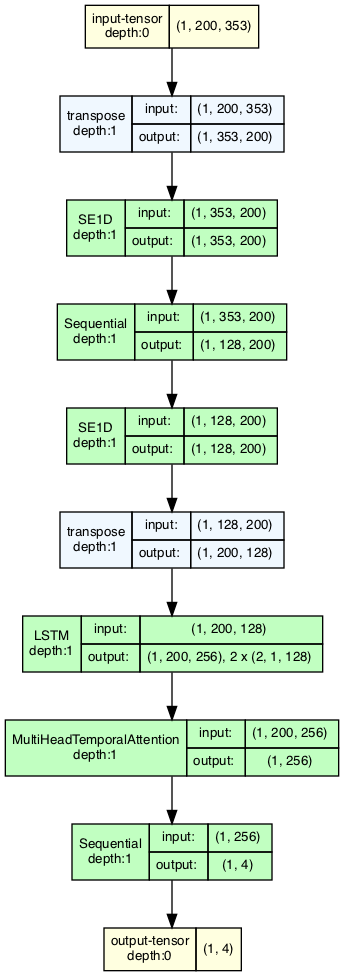

In [23]:
# Визуализация графа модели ROISequenceNet с помощью torchview

import graphviz
graphviz.set_jupyter_format('png')
from torchview import draw_graph

roisqn_model = ROISequenceNet(n_roi=353, n_classes=4, cov_dim=2)
model_graph = draw_graph(roisqn_model, input_size=(1, 200, 353), depth=1, graph_dir='TB', graph_name='ROISequenceNet', roll=True)
model_graph.visual_graph

## 6) Обучение и метрики

### Организация обучения
- Используется стандартный цикл обучения PyTorch с оптимизатором Adam и планировщиком lr.ReduceLROnPlateau.
- Метрики: accuracy, precision, AUC, F1-score (макро).
- Веса классов учитываются в функции потерь (CrossEntropyLoss).
- Последовательно обучаем модели LSTM, GRU и ROISequenceNet, сравнивая их производительность на валидационном наборе. Используем раннюю остановку для предотвращения переобучения. Так же используем разные варианты сэмплирования для балансировки классов (sampling - добавление "веса" каждому классу, oversampling - увеличение числа сэмплов для меньших классов).
- Обучаем модель SimpleMLP на усреднённых по времени признаках (mean/std) для сравнения с RNN-моделями.

In [24]:
# ======================
# FIX: normalize class_counts
# ======================
# Some training paths occasionally pass `class_counts` as an int (n_classes).
# Trainer expects a pd.Series with an index of class labels. This cell makes it robust.

from collections.abc import Mapping
from collections import Counter
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score

def _normalize_class_counts(class_counts, *, n_classes: int | None = None) -> pd.Series:
    if isinstance(class_counts, pd.Series):
        s = class_counts.copy()
    elif isinstance(class_counts, Mapping):
        s = pd.Series(dict(class_counts))
    elif isinstance(class_counts, (list, tuple, np.ndarray)):
        s = pd.Series(list(class_counts))
    elif isinstance(class_counts, (int, np.integer)):
        n = int(class_counts) if n_classes is None else int(n_classes)
        if n <= 0:
            raise ValueError(f"class_counts as int must be positive, got {class_counts}")
        print(f"[WARN] class_counts passed as int ({class_counts}); treating as n_classes={n} with uniform counts.")
        s = pd.Series(np.ones(n, dtype=np.int64), index=list(range(n)))
    elif class_counts is None:
        if n_classes is None:
            raise ValueError("class_counts is None and n_classes is None")
        n = int(n_classes)
        s = pd.Series(np.ones(n, dtype=np.int64), index=list(range(n)))
    else:
        raise TypeError(f"Unsupported class_counts type: {type(class_counts)}")

    # Normalize index to ints and sort for stable class order
    try:
        s.index = [int(i) for i in s.index.tolist()]
    except Exception:
        pass
    s = s.sort_index()
    # Ensure integer-ish values
    s = s.astype(np.int64, errors="ignore")
    return s

# Redefine Trainer (overrides previous definition)
class Trainer:
    def __init__(self, model, train_dl, val_dl, class_counts, device,
                 lr=1e-3, weight_decay=1e-4, class_weight_strength: float = 1.0,
                 sanitize_inputs: bool = SANITIZE_INPUTS):
        class_counts = _normalize_class_counts(class_counts)
        self.model = model.to(device)
        self.train_dl = train_dl
        self.val_dl = val_dl
        self.device = device
        self.sanitize_inputs = sanitize_inputs
        self.class_counts = class_counts
        self.class_labels = sorted(class_counts.index.tolist())
        self.class_count = len(self.class_labels)
        # Flexible class weights strength: 0.0 -> no weights, 1.0 -> inverse-frequency formula
        if class_weight_strength <= 0.0:
            class_weights = torch.ones(len(class_counts), dtype=torch.float32).to(device)
        else:
            base = 1.0 / (class_counts + 1e-9)
            base = base / base.sum()
            base = base * len(class_counts)
            w = (1.0 - class_weight_strength) * 1.0 + class_weight_strength * base
            class_weights = torch.tensor(w.values, dtype=torch.float32).to(device)
        self.criterion = torch.nn.CrossEntropyLoss(weight=class_weights)
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=lr, weight_decay=weight_decay)

    def _forward_model(self, X, M, C):
        if C is not None and C.nelement() > 0:
            try:
                return self.model(X, mask=M, cov=C)
            except TypeError:
                return self.model(X, mask=M, z=C)
        else:
            return self.model(X, mask=M)

    def train_epoch(self):
        self.model.train()
        total_loss = 0
        for batch in self.train_dl:
            if len(batch) == 5:
                X, M, C, y, _ = batch
            elif len(batch) == 4:
                X, M, C, y = batch
            elif len(batch) == 3:
                X, C, y = batch
                M = None
            else:
                raise ValueError(f"Unexpected batch length: {len(batch)}")
            X = X.to(self.device)
            y = y.to(self.device)
            M = M.to(self.device) if M is not None else None
            C = C.to(self.device) if (C is not None and C.nelement() > 0) else None
            outputs = self._forward_model(X, M, C)
            loss = self.criterion(outputs, y)
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()
            total_loss += loss.item() * X.size(0)
        return total_loss / len(self.train_dl.dataset)

    def evaluate(self):
        self.model.eval()
        total_loss = 0.0
        n_used = 0
        skipped_batches = 0
        all_preds, all_labels, all_probs = [], [], []
        with torch.no_grad():
            for batch in self.val_dl:
                if len(batch) == 5:
                    X, M, C, y, _ = batch
                elif len(batch) == 4:
                    X, M, C, y = batch
                elif len(batch) == 3:
                    X, C, y = batch
                    M = None
                else:
                    raise ValueError(f"Unexpected batch length: {len(batch)}")
                X = X.to(self.device).float()
                y = y.to(self.device)
                M = M.to(self.device) if M is not None else None
                C = C.to(self.device) if (C is not None and C.nelement() > 0) else None
                if getattr(self, 'sanitize_inputs', False):
                    X = torch.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
                outputs = self._forward_model(X, M, C)
                if torch.isnan(outputs).any():
                    skipped_batches += 1
                    continue
                loss = self.criterion(outputs, y)
                if torch.isnan(loss):
                    skipped_batches += 1
                    continue
                total_loss += loss.item() * X.size(0)
                n_used += X.size(0)
                probs = F.softmax(outputs, dim=1)
                preds = torch.argmax(probs, dim=1)
                all_probs.append(probs.cpu().numpy())
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(y.cpu().numpy())
        # expose diagnostics for the training loop
        self.last_eval_used = int(n_used)
        self.last_eval_skipped = int(skipped_batches)
        try:
            self.last_eval_label_counts = dict(Counter(all_labels))
            self.last_eval_pred_counts = dict(Counter(all_preds))
        except Exception:
            self.last_eval_label_counts = None
            self.last_eval_pred_counts = None
        if n_used == 0:
            return float('nan'), float('nan'), float('nan'), float('nan'), float('nan')
        all_probs = np.vstack(all_probs) if all_probs else np.zeros((0, self.class_count))
        # __BINARY_EVAL_FALLBACK_THRESHOLD_V1__
        # Binary eval: if argmax collapses to one class, pick an adaptive threshold on p1 to maximize F1
        try:
            if self.class_count == 2 and all_probs.shape[0] > 0:
                # all_preds currently comes from argmax(probs)
                if len(set(all_preds)) <= 1:
                    p1 = all_probs[:, 1]
                    thr_grid = np.unique(np.quantile(p1, np.linspace(0.0, 1.0, 41)))
                    eps = 1e-12
                    thr_grid = np.unique(np.concatenate(([float(p1.min()) - eps], thr_grid, [float(p1.max()) + eps])))
                    best_thr = 0.5
                    best_f1 = -1.0
                    for thr in thr_grid:
                        pred_t = (p1 >= thr).astype(int)
                        f1_t = float(f1_score(all_labels, pred_t, zero_division=0))
                        if f1_t > best_f1:
                            best_f1 = f1_t
                            best_thr = float(thr)
                    all_preds = (p1 >= best_thr).astype(int).tolist()
        except Exception:
            pass
        accuracy = accuracy_score(all_labels, all_preds) if all_labels else float('nan')
        precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0) if all_labels else float('nan')
        try:
            auc = float('nan')
            if self.class_count > 2:
                auc = roc_auc_score(all_labels, all_probs, average='weighted', multi_class='ovr', labels=self.class_labels) if all_labels else float('nan')
            else:
                auc = roc_auc_score(all_labels, all_probs[:, 1], average='weighted') if all_labels else float('nan')
        except ValueError:
            auc = float('nan')
        f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0) if all_labels else float('nan')
        # --- binary threshold diagnostics ---
        self.last_eval_p1_min = None
        self.last_eval_p1_mean = None
        self.last_eval_p1_max = None
        self.last_eval_best_thr_f1 = None
        self.last_eval_f1_best_thr = None
        self.last_eval_f1_thr05 = None
        self.last_eval_acc_thr05 = None
        self.last_eval_prec_thr05 = None
        self.last_eval_rec_thr05 = None
        self.last_eval_acc_best_thr = None
        self.last_eval_prec_best_thr = None
        self.last_eval_rec_best_thr = None
        self.last_eval_pred_counts_best_thr = None
        try:
            if self.class_count == 2 and all_probs.shape[0] > 0:
                p1 = all_probs[:, 1]
                self.last_eval_p1_min = float(p1.min())
                self.last_eval_p1_mean = float(p1.mean())
                self.last_eval_p1_max = float(p1.max())
                # Metrics at default 0.5 threshold
                pred05 = (p1 >= 0.5).astype(int)
                self.last_eval_acc_thr05 = float(accuracy_score(all_labels, pred05))
                self.last_eval_prec_thr05 = float(precision_score(all_labels, pred05, zero_division=0))
                self.last_eval_rec_thr05 = float(recall_score(all_labels, pred05, zero_division=0))
                self.last_eval_f1_thr05 = float(f1_score(all_labels, pred05, zero_division=0))
                # Best threshold (adaptive grid from p1 quantiles) maximizing F1
                best_thr = 0.5
                best_f1 = -1.0
                thr_grid = np.unique(np.quantile(p1, np.linspace(0.0, 1.0, 41)))
                eps = 1e-12
                thr_grid = np.unique(np.concatenate(([float(p1.min()) - eps], thr_grid, [float(p1.max()) + eps])))
                for thr in thr_grid:
                    pred_t = (p1 >= thr).astype(int)
                    f1_t = float(f1_score(all_labels, pred_t, zero_division=0))
                    if f1_t > best_f1:
                        best_f1 = f1_t
                        best_thr = float(thr)
                self.last_eval_best_thr_f1 = float(best_thr)
                self.last_eval_f1_best_thr = float(best_f1)
                pred_best = (p1 >= best_thr).astype(int)
                self.last_eval_acc_best_thr = float(accuracy_score(all_labels, pred_best))
                self.last_eval_prec_best_thr = float(precision_score(all_labels, pred_best, zero_division=0))
                self.last_eval_rec_best_thr = float(recall_score(all_labels, pred_best, zero_division=0))
                self.last_eval_pred_counts_best_thr = dict(Counter(pred_best.tolist()))
        except Exception:
            pass
        return total_loss / n_used, accuracy, precision, auc, f1

In [25]:
def train_one_epoch(model, opt, data_loader, sanitize_inputs=SANITIZE_INPUTS, max_grad_norm=MAX_GRAD_NORM, device='cuda'):
    model.train(); losses=[]; ce=nn.CrossEntropyLoss()
    for xb, mb, cb, yb, _ in data_loader:
        xb=xb.to(device).float(); yb=yb.to(device).long(); cb=cb.to(device).float() if cb is not None else None
        if sanitize_inputs:
            xb = torch.nan_to_num(xb, nan=0.0, posinf=0.0, neginf=0.0)
        logits = model(xb, mask=mb, cov=cb)
        if torch.isnan(logits).any():
            print('[WARN] NaN logits detected, skipping batch')
            continue
        loss = ce(logits, yb)
        if torch.isnan(loss):
            print('[WARN] NaN loss detected, skipping batch')
            continue
        opt.zero_grad(); loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
        opt.step()
        losses.append(loss.item())
    return float(np.mean(losses)) if losses else float('nan')

@torch.no_grad()
def eval_metrics(model, data_loader, sanitize_inputs=SANITIZE_INPUTS, device='cuda'):
    model.eval(); ys=[]; yh=[]; yp=[]
    for xb, mb, cb, yb, _ in data_loader:
        xb=xb.to(device).float(); yb=yb.to(device).long(); cb=cb.to(device).float() if cb is not None else None
        if sanitize_inputs:
            xb = torch.nan_to_num(xb, nan=0.0, posinf=0.0, neginf=0.0)
        logits = model(xb, mask=mb, cov=cb)
        if torch.isnan(logits).any():
            continue
        probs = torch.softmax(logits, dim=1).cpu().numpy()
        pred  = logits.argmax(dim=1).cpu().numpy().tolist()
        ys += yb.cpu().numpy().tolist(); yh += pred; yp += probs
    if not ys:
        return float('nan'), float('nan'), float('nan')
    acc = accuracy_score(ys, yh)
    try:
        if probs.shape[1] > 2:
            auc = roc_auc_score(ys, yp, multi_class='ovr')
        else:
            auc = roc_auc_score(ys, np.vstack(yp)[:,1])
    except Exception:
        auc = float('nan')
    f1  = f1_score(ys, yh, average='weighted')
    return acc, auc, f1

# Weight init helper
def init_weights_if_requested(model):
    for m in model.modules():
        if isinstance(m, nn.Linear):
            nn.init.xavier_uniform_(m.weight)
            if m.bias is not None:
                nn.init.uniform_(m.bias, -0.05, 0.05)
        elif isinstance(m, (nn.LSTM, nn.GRU)):
            for name, param in m.named_parameters():
                if 'weight' in name and param.ndimension() >= 2:
                    # use .data to avoid in-place ops on leaf views
                    nn.init.orthogonal_(param.data)
                elif 'bias' in name:
                    # safe zero init
                    param.data.zero_()
                    # forget gate bias boost (only LSTM: bias_hh and bias_ih concatenated gates)
                    if isinstance(m, nn.LSTM):
                        hidden_size = m.hidden_size
                        # bias structure: [i, f, g, o]; set forget gate (f) to 1
                        param.data[hidden_size:2*hidden_size].fill_(1.0)

# Head reinit helper
def reinit_head(model):
    for name, module in model.named_modules():
        if name.endswith('head') and isinstance(module, nn.Sequential):
            for sub in module:
                if isinstance(sub, nn.Linear):
                    nn.init.xavier_uniform_(sub.weight)
                    if sub.bias is not None:
                        nn.init.uniform_(sub.bias, -0.05, 0.05)
            print('[INFO] Reinitialized classification head for stagnation recovery.')
            break

# Функция для обучения модели с поддержкой: history, early stopping, debug, санитизация, клиппинг, стагнация.

def train_model(model, train_dl, val_dl, class_counts, device, epochs=10, checkpoint_dir=None, lr=1e-3, weight_decay=1e-4, debug=False,
                early_metric=EARLY_STOP_METRIC,
                patience=EARLY_STOP_PATIENCE,
                min_delta=MIN_DELTA_IMPROVE,
                sanitize_inputs=SANITIZE_INPUTS,
                max_grad_norm=MAX_GRAD_NORM,
                head_reinit=HEAD_REINIT,
                stagnation_reset_epochs=STAGNATION_RESET_EPOCHS,
                reinit_on_nan=REINIT_ON_NAN,
                class_weight_strength: float = 1.0):
    if checkpoint_dir and not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir, exist_ok=True)
    trainer = Trainer(model, train_dl, val_dl, class_counts, device, lr, weight_decay, class_weight_strength=class_weight_strength, sanitize_inputs=sanitize_inputs)
    best_acc = 0.0
    best_f1 = 0.0
    best_auc = 0.0
    history = []
    if early_metric not in (EarlyStopMetric.VAL_LOSS, EarlyStopMetric.VAL_ACCURACY, EarlyStopMetric.VAL_F1, EarlyStopMetric.VAL_AUC):
        early_metric = EarlyStopMetric.VAL_LOSS
    early_best = None
    early_counter = 0

    init_weights_if_requested(model)
    stagnation_epochs = 0

    def param_vector(m):
        return torch.cat([p.detach().flatten() for p in m.parameters() if p.requires_grad])
    prev_params = param_vector(model)

    for epoch in range(epochs):
        model.train(); total_loss=0.0; train_used=0; batch_losses=[]; grad_norms=[]; skipped_batches=0
        for batch in train_dl:
            if len(batch)==5: X,M,C,y,_ = batch
            elif len(batch)==4: X,M,C,y = batch
            elif len(batch)==3: X,C,y = batch; M=None
            else: raise ValueError(f"Unexpected batch length: {len(batch)}")
            X = X.to(device)
            y = y.to(device)
            M = M.to(device) if M is not None else None
            C = C.to(device) if (C is not None and C.nelement()>0) else None
            if sanitize_inputs:
                X = torch.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
            outputs = trainer._forward_model(X, M, C)
            if torch.isnan(outputs).any():
                skipped_batches += 1
                continue
            loss = trainer.criterion(outputs, y)
            if torch.isnan(loss):
                skipped_batches += 1
                continue
            trainer.optimizer.zero_grad(); loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            gnorm = 0.0
            for p in model.parameters():
                if p.grad is not None:
                    gnorm += p.grad.detach().data.norm(2).item()
            trainer.optimizer.step()
            total_loss += loss.item()*X.size(0)
            train_used += X.size(0)
            batch_losses.append(loss.item())
            grad_norms.append(gnorm)
        train_loss = total_loss / train_used if train_used > 0 else float('nan')
        val_loss, val_acc, val_prec, val_auc, val_f1 = trainer.evaluate()
        cur_params = param_vector(model)
        delta = (cur_params - prev_params).abs().mean().item()
        prev_params = cur_params
        if torch.isnan(cur_params).any() and reinit_on_nan:
            print('[WARN] NaN detected in parameters -> reinitializing linear + recurrent layers')
            init_weights_if_requested(model)

        print(f"Эпоха {epoch+1}/{epochs} | TrainLoss {train_loss:.3e} | ValLoss {val_loss:.3e} | Acc {val_acc:.4f} | Prec {val_prec:.4f} | AUC {val_auc:.4f} | F1 {val_f1:.4f} | Δparam {delta:.6e} | skipped {skipped_batches} | train_used {train_used} | val_used {getattr(trainer,'last_eval_used',-1)} | val_skipped {getattr(trainer,'last_eval_skipped',-1)} | y_val {getattr(trainer,'last_eval_label_counts',None)} | yhat_val {getattr(trainer,'last_eval_pred_counts',None)} | acc_bestthr {getattr(trainer,'last_eval_acc_best_thr',None)} | f1_bestthr {getattr(trainer,'last_eval_f1_best_thr',None)} | thr_best {getattr(trainer,'last_eval_best_thr_f1',None)} | yhat_best {getattr(trainer,'last_eval_pred_counts_best_thr',None)} | p1_mean {getattr(trainer,'last_eval_p1_mean',None)} | p1_min {getattr(trainer,'last_eval_p1_min',None)} | p1_max {getattr(trainer,'last_eval_p1_max',None)} | thr05_f1 {getattr(trainer,'last_eval_f1_thr05',None)} | best_thr_f1 {getattr(trainer,'last_eval_best_thr_f1',None)} | best_thr_f1_val {getattr(trainer,'last_eval_f1_best_thr',None)}")
        if debug and batch_losses:
            print(f"  BatchLoss[min/median/max]: {np.min(batch_losses):.4f}/{np.median(batch_losses):.4f}/{np.max(batch_losses):.4f}; GradNorm[mean]: {np.mean(grad_norms):.4f}")

        # checkpointing logic (check val_acc > best_acc first to avoid expensive NaN checks when not improving)
        # also require all metrics to improve to consider it a new best (strict improvement)
        if val_acc > best_acc and not torch.isnan(torch.tensor(val_acc)) and \
                val_f1 > best_f1 and not torch.isnan(torch.tensor(val_f1)) and \
                val_auc > best_auc and not torch.isnan(torch.tensor(val_auc)):
            best_acc = val_acc
            best_f1 = val_f1
            best_auc = val_auc
            if checkpoint_dir:
                torch.save(model.state_dict(), os.path.join(checkpoint_dir, 'best_model.pth'))
                if debug: print('  ↳ saved best checkpoint based on val_acc, val_f1, val_auc improvement')
                

        # stagnation logic
        if val_acc == 0.0:
            stagnation_epochs += 1
            if head_reinit and stagnation_epochs >= stagnation_reset_epochs:
                print(f"[STAGNATION] val_acc remained 0 for {stagnation_epochs} epochs -> reinit head")
                reinit_head(model)
                stagnation_epochs = 0
        else:
            stagnation_epochs = 0

        history.append({
            'epoch': epoch+1,
            'train_loss': train_loss,
            'val_loss': val_loss,
            'val_acc': val_acc,
            'val_prec': val_prec,
            'val_auc': val_auc,
            'val_f1': val_f1,
            'param_delta_mean_abs': delta,
            'skipped_batches': skipped_batches,
            'grad_norm_mean': float(np.mean(grad_norms)) if grad_norms else float('nan'),
            'stagnation_epochs': stagnation_epochs
        })

        metric_value = {EarlyStopMetric.VAL_LOSS: val_loss, EarlyStopMetric.VAL_ACCURACY: val_acc, EarlyStopMetric.VAL_F1: val_f1, EarlyStopMetric.VAL_AUC: val_auc}[early_metric]
        improve = False
        if early_best is None:
            early_best = metric_value
            improve = True
        else:
            if early_metric == EarlyStopMetric.VAL_LOSS:
                if early_best - metric_value > min_delta:
                    improve = True
            else:
                if metric_value - early_best > min_delta:
                    improve = True
        if improve:
            early_best = metric_value
            early_counter = 0
        else:
            early_counter += 1
            if early_counter >= patience:
                print(f"[EARLY STOP] metric={early_metric.value} no improve {patience} epochs (best={early_best:.4f}).")
                break

    print("Лучший валид. Accuracy:", best_acc)
    return history

## 7) Создание тренировочной и валидационной выборок

Класс DataLoader создаёт батчи для обучения и валидации.

In [26]:
class ExperimentDataLoader():
    def __init__(self, df: pd.DataFrame,
                 fold_idx: int = 0,
                 mode: DataMode = DataMode.SEQ_NPY,
                 enable_autobalance: bool = True,
                 balance_strategy: BalanceStrategy = BalanceStrategy.SAMPLER,
                 class_weight_mode: ClassWeightMode = CLASS_WEIGHT_MODE,
                 max_class_weight_ratio: float = MAX_CLASS_WEIGHT_RATIO,
                 batch_size: int = BATCH_SIZE,
                 impute_strategy: ImputeStrategy = IMPUTE_STRATEGY,
                 add_eps_noise_if_all_zero: bool = ADD_EPS_NOISE_IF_ALL_ZERO,
                 cov_pipeline=None,
                 cov_cols:list|None = None,
                 fit_cov_pipeline: bool = True,
                 normalization_strategy: NormalizationStrategy = NORMALIZATION_STRATEGY,
                 normalization_eps: float = NORMALIZATION_EPS,
                 normalization_clip: float | None = NORMALIZATION_CLIP):
        self.fold_idx = fold_idx
        self.mode = mode
        self.enable_autobalance = enable_autobalance
        self.balance_strategy = balance_strategy
        self.class_weight_mode = class_weight_mode
        self.max_class_weight_ratio = max_class_weight_ratio
        self.batch_size = batch_size
        self.impute_strategy = impute_strategy
        self.add_eps_noise_if_all_zero = add_eps_noise_if_all_zero
        self.cov_pipeline = cov_pipeline
        self.cov_cols = cov_cols
        self.fit_cov_pipeline = fit_cov_pipeline
        self._use_covariates = self.cov_cols is not None and len(self.cov_cols) > 0

        self.normalization_strategy = normalization_strategy
        self.normalization_eps = normalization_eps
        self.normalization_clip = normalization_clip

        self.df = df

        tr_dl, va_dl = make_fold_dataloaders(
            df,
            fold_idx=fold_idx,
            mode=mode,
            enable_autobalance=enable_autobalance,
            balance_strategy=balance_strategy,
            class_weight_mode=class_weight_mode,
            max_class_weight_ratio=max_class_weight_ratio,
            batch_size=batch_size,
            impute_strategy=impute_strategy,
            add_eps_noise_if_all_zero=add_eps_noise_if_all_zero,
            cov_pipeline=cov_pipeline,
            cov_cols=cov_cols,
            fit_cov_pipeline=fit_cov_pipeline,
            normalization_strategy=normalization_strategy,
            normalization_eps=normalization_eps,
            normalization_clip=normalization_clip,
        )
        self.train_loader = tr_dl
        self.val_loader = va_dl

        self.inference_loader = DataLoader(
            tr_dl.dataset + va_dl.dataset,
            batch_size=batch_size,
            shuffle=False
        )

        xb_s, mb_s, cb_s, yb_s, pid_s = next(iter(self.train_loader))
        print(
            "Пример батча: xb:", xb_s.shape,
            "mb:", mb_s.shape,
            "cb:", cb_s.shape if cb_s is not None else None,
            "yb:", yb_s.shape,
            "pid:", len(pid_s)
        )

        self.cov_dim_s = (cb_s.shape[-1] if (cb_s is not None and cb_s.numel() > 0) else 0)

        self.cls_counts_s = pd.Series(torch.unique(yb_s))
        self.cls_count = len(self.cls_counts_s)

        if DataMode.DFC:
            self.in_dim_s = xb_s.shape[-1]
            self.ROI = self.in_dim_s
        else:
            self.ROI = xb_s.shape[-1]
            self.in_dim_s = self.ROI

        print(
            f"Входные данные: режим {self.data_mode_name()}, "
            f"число ROI {self.ROI}, "
            f"стратегия балансировки классов: {self.balance_strategy_name()}, "
            f"размер ковариат {self.cov_dim_s}, "
            f"число классов {self.cls_count}, "
            f"нормализация {self.normalization_strategy_name()}"
        )

        print(
            f"Train классы для Даталоадера {self.data_mode_name()} + "
            f"{self.balance_strategy_name()}:",
            np.unique(yb_s.numpy(), return_counts=True)
        )

    @classmethod
    def from_params(cls, df: pd.DataFrame,
                    fold_idx: int = 0,
                    mode: DataMode = DataMode.SEQ_NPY,
                    enable_autobalance: bool = True,
                    balance_strategy: BalanceStrategy = BalanceStrategy.SAMPLER,
                    class_weight_mode: ClassWeightMode = CLASS_WEIGHT_MODE,
                    max_class_weight_ratio: float = MAX_CLASS_WEIGHT_RATIO,
                    batch_size: int = BATCH_SIZE,
                    impute_strategy: ImputeStrategy = IMPUTE_STRATEGY,
                    add_eps_noise_if_all_zero: bool = ADD_EPS_NOISE_IF_ALL_ZERO,
                    cov_pipeline=None,
                    cov_cols:list|None = None,
                    fit_cov_pipeline: bool = True,
                    normalization_strategy: NormalizationStrategy = NORMALIZATION_STRATEGY,
                    normalization_eps: float = NORMALIZATION_EPS,
                    normalization_clip: float | None = NORMALIZATION_CLIP):
        return cls(
            df=df,
            fold_idx=fold_idx,
            mode=mode,
            enable_autobalance=enable_autobalance,
            balance_strategy=balance_strategy,
            class_weight_mode=class_weight_mode,
            max_class_weight_ratio=max_class_weight_ratio,
            batch_size=batch_size,
            impute_strategy=impute_strategy,
            add_eps_noise_if_all_zero=add_eps_noise_if_all_zero,
            cov_pipeline=cov_pipeline,
            cov_cols=cov_cols,
            fit_cov_pipeline=fit_cov_pipeline,
            normalization_strategy=normalization_strategy,
            normalization_eps=normalization_eps,
            normalization_clip=normalization_clip,
        )

    def data_mode_name(self):
        return self.mode.value

    def balance_strategy_name(self):
        return self.balance_strategy.value

    def normalization_strategy_name(self):
        return self.normalization_strategy.value

    def use_covariates(self):
        return self._use_covariates

Даталоадер DataMode.SEQ_NPY с балансировкой классов (sampling)

In [27]:
# Создаём даталоадер для mode DataMode.SEQ_NPY со стратегией балансировки sampler без ковариат
print("Даталоадер: режим", DataMode.SEQ_NPY.name, "балансировка:", BalanceStrategy.SAMPLER.name, "без ковариат")
sampler_dl = ExperimentDataLoader(data_df,
                                  fold_idx=0,
                                  mode=DataMode.SEQ_NPY,
                                  enable_autobalance=True,
                                  balance_strategy=BalanceStrategy.SAMPLER,
                                  class_weight_mode=CLASS_WEIGHT_MODE,
                                  max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                                  batch_size=BATCH_SIZE,
                                  impute_strategy=IMPUTE_STRATEGY,
                                  add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                                  cov_pipeline=None # no covariate processing
                                 )
train_dl_sampler = sampler_dl.train_loader
val_dl_sampler = sampler_dl.val_loader

Даталоадер: режим SEQ_NPY балансировка: SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2, 3]), array([6, 1, 5, 4]))


In [28]:
# Создаём даталоадер для mode DataMode.SEQ_NPY со стратегией балансировки sampler с ковариатами
print("Даталоадер: режим", DataMode.SEQ_NPY.name, "балансировка:", BalanceStrategy.SAMPLER, "с ковариатами")
sampler_cov_dl = ExperimentDataLoader(data_df,
                                      fold_idx=0,
                                      mode=DataMode.SEQ_NPY,
                                      enable_autobalance=True,
                                      balance_strategy=BalanceStrategy.SAMPLER,
                                      class_weight_mode=CLASS_WEIGHT_MODE,
                                      max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                                      batch_size=BATCH_SIZE,
                                      impute_strategy=IMPUTE_STRATEGY,
                                      add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                                      cov_pipeline=covariates_prepared,
                                      cov_cols=all_cov_cols
                                     )
train_cov_dl_sampler = sampler_cov_dl.train_loader
val_cov_dl_sampler = sampler_cov_dl.val_loader

Даталоадер: режим SEQ_NPY балансировка: BalanceStrategy.SAMPLER с ковариатами
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 10]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 10, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2, 3]), array([6, 3, 6, 1]))


Даталоадер DataMode.SEQ_NPY с балансировкой классов (oversampling)

In [29]:
# Создаём даталоадер для mode DataMode.SEQ_NPY со стратегией балансировки oversample без ковариат
print("Даталоадер: режим", DataMode.SEQ_NPY.name, "балансировка:", BalanceStrategy.OVERSAMPLE.name, "без ковариат")
oversample_dl = ExperimentDataLoader(data_df,
                                      fold_idx=0,
                                      mode=DataMode.SEQ_NPY,
                                      enable_autobalance=True,
                                      balance_strategy=BalanceStrategy.OVERSAMPLE,
                                      class_weight_mode=CLASS_WEIGHT_MODE,
                                      max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                                      batch_size=BATCH_SIZE,
                                      impute_strategy=IMPUTE_STRATEGY,
                                      add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                                      cov_pipeline=None # no covariate processing
                                     )
train_dl_oversample = oversample_dl.train_loader
val_dl_oversample = oversample_dl.val_loader

Даталоадер: режим SEQ_NPY балансировка: OVERSAMPLE без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: oversample, размер ковариат 0, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + oversample: (array([0, 1, 2, 3]), array([7, 3, 3, 3]))


In [30]:
# Создаём даталоадер для mode DataMode.SEQ_NPY со стратегией балансировки oversample с ковариатами
print("Даталоадер: режим", DataMode.SEQ_NPY.name, "балансировка:", BalanceStrategy.OVERSAMPLE.name, "с ковариатами")
oversample_cov_dl = ExperimentDataLoader(data_df,
                                      fold_idx=0,
                                      mode=DataMode.SEQ_NPY,
                                      enable_autobalance=True,
                                      balance_strategy=BalanceStrategy.OVERSAMPLE,
                                      class_weight_mode=CLASS_WEIGHT_MODE,
                                      max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                                      batch_size=BATCH_SIZE,
                                      impute_strategy=IMPUTE_STRATEGY,
                                      add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                                      cov_pipeline=covariates_prepared,
                                      cov_cols=all_cov_cols
                                     )
train_cov_dl_oversample = oversample_cov_dl.train_loader
val_cov_dl_oversample = oversample_cov_dl.val_loader

Даталоадер: режим SEQ_NPY балансировка: OVERSAMPLE с ковариатами
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 10]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: oversample, размер ковариат 10, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + oversample: (array([0, 1, 2, 3]), array([4, 5, 2, 5]))


Даталоадер DataMode.SEQ_NPY без балансировки классов

In [31]:
# Создаём даталоадер для mode DataMode.SEQ_NPY без балансировки без ковариат
print("Даталоадер: режим", DataMode.SEQ_NPY.name, "балансировка:", None, "без ковариат")
no_balance_dl = ExperimentDataLoader(data_df,
                                      fold_idx=0,
                                      mode=DataMode.SEQ_NPY,
                                      enable_autobalance=False,
                                      balance_strategy=BalanceStrategy.NO_BALANCE,
                                      class_weight_mode=CLASS_WEIGHT_MODE,
                                      max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                                      batch_size=BATCH_SIZE,
                                      impute_strategy=IMPUTE_STRATEGY,
                                      add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                                      cov_pipeline=None # no covariate processing
                                     )
train_dl_no_balance = no_balance_dl.train_loader
val_dl_no_balance = no_balance_dl.val_loader

Даталоадер: режим SEQ_NPY балансировка: None без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: nobalance, размер ковариат 0, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + nobalance: (array([0, 1, 3]), array([9, 4, 3]))


In [32]:
# Создаём даталоадер для mode DataMode.SEQ_NPY без балансировки с ковариатами
print("Даталоадер: режим", DataMode.SEQ_NPY.name, "балансировка:", None, "с ковариатами")
no_balance_cov_dl = ExperimentDataLoader(data_df,
                                      fold_idx=0,
                                      mode=DataMode.SEQ_NPY,
                                      enable_autobalance=False,
                                      balance_strategy=BalanceStrategy.SAMPLER,
                                      class_weight_mode=CLASS_WEIGHT_MODE,
                                      max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                                      batch_size=BATCH_SIZE,
                                      impute_strategy=IMPUTE_STRATEGY,
                                      add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                                      cov_pipeline=covariates_prepared,
                                      cov_cols=all_cov_cols
                                     )
train_cov_dl_no_balance = no_balance_cov_dl.train_loader
val_cov_dl_no_balance = no_balance_cov_dl.val_loader

Даталоадер: режим SEQ_NPY балансировка: None с ковариатами
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 10]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 10, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 3]), array([8, 3, 5]))


Даталоадер для DFC признаков (LogReg + PCA) с балансировкой классов (sampling)

In [33]:
if DFC_CSV is not None:
    # Создаём даталоадер для mode DataMode.DFC с балансировкой sampler без ковариат
    print("Даталоадер: режим", DataMode.DFC, "балансировка:", BalanceStrategy.SAMPLER)
    dfc_sampler_dl = ExperimentDataLoader(data_df,
                                          fold_idx=0,
                                          mode=DataMode.DFC,
                                          enable_autobalance=True,
                                          balance_strategy=BalanceStrategy.SAMPLER,
                                          class_weight_mode=CLASS_WEIGHT_MODE,
                                          max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                                          batch_size=BATCH_SIZE,
                                          impute_strategy=IMPUTE_STRATEGY,
                                          add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                                          cov_pipeline=None # no covariate processing
                                         )
    train_dl_dfc_s = dfc_sampler_dl.train_loader
    val_dl_dfc_s = dfc_sampler_dl.val_loader
else:
    train_dl_dfc_s, val_dl_dfc_s = None, None
    print("DFC_CSV не задан, пропускаем даталоадер для DataMode.DFC")

Даталоадер: режим DataMode.DFC балансировка: BalanceStrategy.SAMPLER
Пример батча: xb: torch.Size([16, 12]) mb: torch.Size([16]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим DFC, число ROI 12, стратегия балансировки классов: sampler, размер ковариат 0, число классов 4, нормализация none
Train классы для Даталоадера DFC + sampler: (array([0, 1, 2, 3]), array([4, 2, 3, 7]))


In [34]:
# Извлечём количество классов каждого типа из главного датафрейма
class_counts_main = data_df['label'].value_counts()
print('[DIAG] class counts (full df):', class_counts_main.to_dict())
print('[DIAG] unique labels:', sorted(data_df['label'].unique().tolist()))

[DIAG] class counts (full df): {0.0: 1164, 1.0: 399, 3.0: 325, 2.0: 33}
[DIAG] unique labels: [0.0, 1.0, 2.0, 3.0]


In [35]:
# === Диагностика батчей: распределение меток и предсказаний до и после одной итерации ===
print('\n[DIAG] Начало диагностики батча')
first_batch = next(iter(train_dl_sampler))
if len(first_batch)==5:
    Xd, Md, Cd, yd, _ = first_batch
elif len(first_batch)==4:
    Xd, Md, Cd, yd = first_batch
else:
    Xd, Cd, yd = first_batch; Md=None
print('  Train batch shape:', Xd.shape, 'labels shape:', yd.shape)
print('  Unique labels in batch:', np.unique(yd.numpy(), return_counts=True))
print('  Any NaN in Xd:', np.isnan(Xd.numpy()).any())
print('  Any Inf in Xd:', np.isinf(Xd.numpy()).any())

# Создаём временную модель для теста (LSTM)
_diag_model = SimpleLSTM(n_rois=Xd.shape[-1], n_classes=N_CLASSES, cov_dim=(Cd.shape[-1] if Cd is not None and Cd.numel()>0 else 0), hidden=32)
init_weights_if_requested(_diag_model)
_diag_model.eval()
with torch.no_grad():
    logits0 = _diag_model(Xd.float(), mask=Md, cov=(Cd if Cd is not None and Cd.numel()>0 else None))
    probs0 = torch.softmax(logits0, dim=1)
    preds0 = probs0.argmax(1)
print('  Preds before training step:', np.unique(preds0.numpy(), return_counts=True))

# Один шаг обучения для проверки обновления
opt_tmp = torch.optim.Adam(_diag_model.parameters(), lr=1e-3)
_diag_model.train()
logits1 = _diag_model(Xd.float(), mask=Md, cov=(Cd if Cd is not None and Cd.numel()>0 else None))
loss1 = nn.CrossEntropyLoss()(logits1, yd)
loss1.backward(); torch.nn.utils.clip_grad_norm_(_diag_model.parameters(), MAX_GRAD_NORM); opt_tmp.step()

_diag_model.eval()
with torch.no_grad():
    logits2 = _diag_model(Xd.float(), mask=Md, cov=(Cd if Cd is not None and Cd.numel()>0 else None))
    preds2 = logits2.argmax(1)
print('  Preds after one step:', np.unique(preds2.numpy(), return_counts=True))
print('[DIAG] Завершено. Если параметр Preds не меняются и всегда один класс, возможно входы вырожденные или head не обновляется.')


[DIAG] Начало диагностики батча
  Train batch shape: torch.Size([16, 200, 353]) labels shape: torch.Size([16])
  Unique labels in batch: (array([0, 2, 3]), array([4, 7, 5]))
  Any NaN in Xd: False
  Any Inf in Xd: False
  Preds before training step: (array([1, 2, 3]), array([ 2,  4, 10]))
  Preds after one step: (array([0, 1, 2, 3]), array([1, 4, 5, 6]))
[DIAG] Завершено. Если параметр Preds не меняются и всегда один класс, возможно входы вырожденные или head не обновляется.


In [36]:
# Создадим класс SingleExperiment для управления тренировкой одной модели
class SingleExperiment:
    def __init__(self, model: nn.Module,
                 experiment_data_loader: ExperimentDataLoader,
                 reuse_baseline_models: bool = REUSE_BASELINE_MODELS,
                 class_counts_main: pd.Series = class_counts_main,
                 checkpoint_dir: str = CHECKPOINT_DIR,
                 experiment_tag: str | None = None,
                 device = DEVICE,
                 epochs = EPOCHS,
                 lr=LR,
                 weight_decay=WEIGHT_DECAY,
                 debug: bool = True,
                 early_metric: EarlyStopMetric = EARLY_STOP_METRIC,
                 patience: int = EARLY_STOP_PATIENCE,
                 min_delta: float = MIN_DELTA_IMPROVE,
                 class_weight_strength: float = 1.0):
        self.model = model
        self.experiment_data_loader = experiment_data_loader
        self.reuse_baseline_models = reuse_baseline_models
        self.device = device
        self.class_counts_main = class_counts_main
        self.checkpoint_dir = checkpoint_dir
        self.experiment_tag = experiment_tag
        self.epochs = epochs
        self.lr = lr
        self.weight_decay = weight_decay
        self.debug = debug
        self.early_metric = early_metric
        self.patience = patience
        self.min_delta = min_delta
        self.class_weight_strength = class_weight_strength

        self.checkpoint_dir_path = f"{self.checkpoint_dir}/{model.__class__.__name__}_{experiment_data_loader.balance_strategy_name()}"
        # Если используются ковариаты, добавляем суффикс
        if experiment_data_loader.cov_dim_s > 0:
            self.checkpoint_dir_path += "_covariates"
        # Если есть дополнительный тэг, то используем его как суффикс
        if self.experiment_tag is not None:
            self.checkpoint_dir_path += f"_{self.experiment_tag}"
        os.makedirs(self.checkpoint_dir_path, exist_ok=True)

    def _state_dict_shape_mismatches(self, state_dict: dict) -> list[tuple[str, tuple, tuple]]:
        model_sd = self.model.state_dict()
        mismatches: list[tuple[str, tuple, tuple]] = []
        for k, v in state_dict.items():
            if k in model_sd and hasattr(v, 'shape') and tuple(v.shape) != tuple(model_sd[k].shape):
                mismatches.append((k, tuple(v.shape), tuple(model_sd[k].shape)))
        return mismatches

    def _cov_dim_from_state(self, state_dict: dict) -> int | None:
        try:
            w = state_dict.get('film.gamma.weight')
            return int(w.shape[1]) if w is not None else None
        except Exception:
            return None

    def _cov_dim_from_model(self) -> int | None:
        try:
            film = getattr(self.model, 'film', None)
            if film is None:
                return None
            return int(film.gamma.weight.shape[1])
        except Exception:
            return None

    def _backup_incompatible_checkpoint(self, ckpt_path: str, state_dict: dict) -> None:
        # Non-destructive: keep the old file for reference.
        old_cov = self._cov_dim_from_state(state_dict)
        new_cov = self._cov_dim_from_model()
        suffix = ".incompatible"
        if old_cov is not None and new_cov is not None:
            suffix = f".incompatible_covdim{old_cov}to{new_cov}"
        backup_path = ckpt_path + suffix
        try:
            os.replace(ckpt_path, backup_path)
            print(f"[WARN] Несовместимый best_model.pth перемещён в: {backup_path}")
        except Exception as e:
            print(f"[WARN] Не удалось переместить несовместимый чекпойнт ({e}); удаляю: {ckpt_path}")
            try:
                os.remove(ckpt_path)
            except Exception:
                pass

    def train(self):
        print(
            f"\n=== {self.model._get_name()}: балансировка {self.experiment_data_loader.balance_strategy_name()}, "
            f"использование ковариат - {self.experiment_data_loader.cov_cols} ==="
        )

        ckpt_path = os.path.join(self.checkpoint_dir_path, 'best_model.pth')

        # Если переиспользуем модель, то сначала проверим совместимость чекпойнта с текущей архитектурой.
        if self.reuse_baseline_models and os.path.exists(ckpt_path):
            try:
                import torch

                sd = torch.load(ckpt_path, map_location='cpu')
                mismatches = self._state_dict_shape_mismatches(sd)
                if mismatches:
                    print(
                        f"[WARN] Найден несовместимый best_model.pth (mismatched_tensors={len(mismatches)}; "
                        f"пример={mismatches[0]}). Чекпойнт будет заменён переобучением."
                    )
                    self._backup_incompatible_checkpoint(ckpt_path, sd)
            except Exception as e:
                print(f"[WARN] Не удалось проверить совместимость чекпойнта {ckpt_path}: {e}. Будет выполнено переобучение.")
                try:
                    os.remove(ckpt_path)
                except Exception:
                    pass

        if (not self.reuse_baseline_models) or (not os.path.exists(ckpt_path)):
            # Удалим существующий чекпоинт, если есть
            if os.path.exists(ckpt_path):
                os.remove(ckpt_path)
            
            print(f"Обучение модели {self.model._get_name()} с балансировкой {self.experiment_data_loader.balance_strategy_name()} и использованием ковариат: {self.experiment_data_loader.cov_cols}")
            history = train_model(
                self.model,
                self.experiment_data_loader.train_loader,
                self.experiment_data_loader.val_loader,
                self.class_counts_main,
                self.device,
                epochs=self.epochs,
                checkpoint_dir=self.checkpoint_dir_path,
                lr=self.lr,
                weight_decay=self.weight_decay,
                debug=self.debug,
                early_metric=self.early_metric,
                patience=self.patience,
                min_delta=self.min_delta,
            )
            self.hist_df = pd.DataFrame(history)
            self.hist_df.to_csv(os.path.join(self.checkpoint_dir_path, 'history.csv'), index=False)
            print(f"[HISTORY - {self.model._get_name()}] Последние строки:")
            display(self.hist_df.tail())
        else:
            history_path = os.path.join(self.checkpoint_dir_path, 'history.csv')
            if os.path.exists(history_path):
                self.hist_df = pd.read_csv(history_path)
                print(f"Загружен существующий чекпоинт {self.model._get_name()}. Путь к чекпоинту: {self.checkpoint_dir_path}")
                print(f"[HISTORY - {self.model._get_name()}] Последние строки:")
                display(self.hist_df.tail())

    def evaluate(self):
        # Оценка итоговой и лучшей модели
        ckpt_path = os.path.join(self.checkpoint_dir_path, 'best_model.pth')
        if os.path.exists(ckpt_path):
            import torch

            sd = torch.load(ckpt_path, map_location=self.device)
            mismatches = self._state_dict_shape_mismatches(sd)
            if mismatches:
                old_cov = self._cov_dim_from_state(sd)
                new_cov = self._cov_dim_from_model()
                raise RuntimeError(
                    "Несовместимый best_model.pth для текущей архитектуры (state_dict shape mismatch). "
                    f"пример={mismatches[0]}; old_cov_dim={old_cov}; new_cov_dim={new_cov}. "
                    "Обычно это случается, когда меняется one-hot кодирование ковариат (cov_dim). Нужно переобучить модель в новой директории чекпойнтов."
                )
            self.model.load_state_dict(sd)

        val_loss, val_acc, val_prec, val_auc, val_f1 = Trainer(
            self.model,
            self.experiment_data_loader.train_loader,
            self.experiment_data_loader.val_loader,
            self.class_counts_main,
            self.device,
        ).evaluate()
        print(
            f"[BEST@{self.experiment_data_loader.balance_strategy_name()}] {self.model._get_name()} - "
            f"Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f} | Val AUC: {val_auc:.4f}"
        )
        return (val_loss, val_acc, val_prec, val_auc, val_f1)


### Обучение Simple LSTM

Обучение модели Simple LSTM на подготовленных данных с использованием DataMode.SEQ_NPY даталоадера с балансировкой классов (sampler).

In [37]:
model_lstm_sampler = SimpleLSTM(n_rois=sampler_dl.ROI, n_classes=N_CLASSES, cov_dim=sampler_dl.cov_dim_s, hidden=64, num_layers=1).to(DEVICE)

experiment_lstm_sampler = SingleExperiment(model=model_lstm_sampler,
                                          experiment_data_loader=sampler_dl,
                                          reuse_baseline_models=REUSE_BASELINE_MODELS,
                                          class_counts_main=class_counts_main,
                                          checkpoint_dir=CHECKPOINT_DIR,
                                          device=DEVICE,
                                          epochs=EPOCHS,
                                          lr=LR,
                                          weight_decay=WEIGHT_DECAY,
                                          debug=True,
                                          early_metric=EARLY_STOP_METRIC,
                                          patience=EARLY_STOP_PATIENCE,
                                          min_delta=MIN_DELTA_IMPROVE,
                                          class_weight_strength=1.0)
experiment_lstm_sampler.train()
experiment_lstm_sampler.evaluate()


=== SimpleLSTM: балансировка sampler, использование ковариат - None ===
Загружен существующий чекпоинт SimpleLSTM. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/SimpleLSTM_sampler
[HISTORY - SimpleLSTM] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
18,19,0.160983,1.790010,0.335859,0.471522,0.535621,0.370442,0.004647,0,2.451719,0
19,20,0.183863,1.864797,0.348485,0.455375,0.499590,0.373873,0.005502,0,3.139472,0
20,21,0.122250,1.848551,0.383838,0.498159,0.515809,0.417493,0.004680,0,2.147410,0
21,22,0.140673,2.251089,0.353535,0.453176,0.513300,0.390047,0.006681,0,2.765344,0
22,23,0.101252,2.475144,0.396465,0.468870,0.548590,0.425054,0.006379,0,2.443978,0


[BEST@sampler] SimpleLSTM - Val Acc: 0.3965 | Val F1: 0.4251 | Val AUC: 0.5486


(2.044536585759635,
 0.39646464646464646,
 0.46886971559632173,
 0.5485902586364049,
 0.4250535498006597)

Обучение модели SimpleLSTM на подготовленных данных с использованием DataMode.SEQ_NPY даталоадера с балансировкой классов (oversample).

In [38]:
model_lstm_over = SimpleLSTM(n_rois=oversample_dl.ROI, n_classes=N_CLASSES, cov_dim=oversample_dl.cov_dim_s, hidden=64, num_layers=1).to(DEVICE)

experiment_lstm_over = SingleExperiment(model=model_lstm_over,
                                       experiment_data_loader=oversample_dl,
                                       reuse_baseline_models=REUSE_BASELINE_MODELS,
                                       class_counts_main=class_counts_main,
                                       checkpoint_dir=CHECKPOINT_DIR,
                                       device=DEVICE,
                                       epochs=EPOCHS,
                                       lr=LR,
                                       weight_decay=WEIGHT_DECAY,
                                       debug=True,
                                       early_metric=EARLY_STOP_METRIC,
                                       patience=EARLY_STOP_PATIENCE,
                                       min_delta=MIN_DELTA_IMPROVE,
                                       class_weight_strength=1.0)
experiment_lstm_over.train()
experiment_lstm_over.evaluate()


=== SimpleLSTM: балансировка oversample, использование ковариат - None ===
Загружен существующий чекпоинт SimpleLSTM. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/SimpleLSTM_oversample
[HISTORY - SimpleLSTM] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
16,17,0.052643,2.941383,0.459596,0.470419,0.538275,0.464268,0.010938,0,1.791957,0
17,18,0.044676,3.307125,0.462121,0.483850,0.554659,0.470769,0.009742,0,1.545280,0
18,19,0.047697,3.578370,0.469697,0.446984,0.484456,0.457253,0.011236,0,1.867934,0
19,20,0.022879,3.822931,0.474747,0.454443,0.507864,0.463699,0.007114,0,0.967508,0
20,21,0.040658,4.234560,0.419192,0.439587,0.509950,0.427082,0.010951,0,1.767795,0


[BEST@oversample] SimpleLSTM - Val Acc: 0.4798 | Val F1: 0.4703 | Val AUC: 0.5168


(2.718281481001112,
 0.4797979797979798,
 0.4620231518190602,
 0.5167889676015105,
 0.4702952203776907)

### Обучение Simple GRU

Обучение модели SimpleGRU на подготовленных данных с использованием DataMode.SEQ_NPY даталоадера с балансировкой классов (sampler).

In [39]:
model_gru_sampler = SimpleGRU(n_rois=sampler_dl.ROI, hidden=64, num_layers=1, n_classes=N_CLASSES, cov_dim=sampler_dl.cov_dim_s).to(DEVICE)

experiment_gru_sampler = SingleExperiment(model=model_gru_sampler,
                                         experiment_data_loader=sampler_dl,
                                         reuse_baseline_models=REUSE_BASELINE_MODELS,
                                         class_counts_main=class_counts_main,
                                         checkpoint_dir=CHECKPOINT_DIR,
                                         device=DEVICE,
                                         epochs=EPOCHS,
                                         lr=LR,
                                         weight_decay=WEIGHT_DECAY,
                                         debug=True,
                                         early_metric=EARLY_STOP_METRIC,
                                         patience=EARLY_STOP_PATIENCE,
                                         min_delta=MIN_DELTA_IMPROVE,
                                         class_weight_strength=1.0)
experiment_gru_sampler.train()
experiment_gru_sampler.evaluate()


=== SimpleGRU: балансировка sampler, использование ковариат - None ===
Загружен существующий чекпоинт SimpleGRU. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/SimpleGRU_sampler
[HISTORY - SimpleGRU] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
19,20,0.202361,1.672472,0.229798,0.392538,0.445617,0.238144,0.008684,0,3.222687,0
20,21,0.137835,1.828520,0.257576,0.431736,0.461783,0.280470,0.007707,0,2.643161,0
21,22,0.157748,1.510799,0.244949,0.391299,0.451137,0.248058,0.009192,0,2.767851,0
22,23,0.128753,1.798990,0.252525,0.395628,0.451020,0.268350,0.007634,0,2.318186,0
23,24,0.122572,1.853769,0.297980,0.413018,0.480545,0.320200,0.007176,0,2.171591,0


[BEST@sampler] SimpleGRU - Val Acc: 0.2980 | Val F1: 0.3202 | Val AUC: 0.4805


(2.0911475094881924,
 0.29797979797979796,
 0.41301787187548766,
 0.4805454899134635,
 0.3201999363149661)

### Обучение модели ROISequenceNet

Обучение модели ROISequenceNet на подготовленных данных с использованием DataMode.SEQ_NPY даталоадера со взвешенной балансировкой классов (sampler).

In [40]:
model_roi_seq_net_sampler = ROISequenceNet(n_roi=sampler_dl.ROI, n_classes=N_CLASSES, cov_dim=sampler_dl.cov_dim_s).to(DEVICE)

experiment_roi_seq_net_sampler = SingleExperiment(model=model_roi_seq_net_sampler,
                                                experiment_data_loader=sampler_dl,
                                                reuse_baseline_models=REUSE_BASELINE_MODELS,
                                                class_counts_main=class_counts_main,
                                                checkpoint_dir=CHECKPOINT_DIR,
                                                device=DEVICE,
                                                epochs=EPOCHS,
                                                lr=LR,
                                                weight_decay=WEIGHT_DECAY,
                                                debug=True,
                                                early_metric=EARLY_STOP_METRIC,
                                                patience=EARLY_STOP_PATIENCE,
                                                min_delta=MIN_DELTA_IMPROVE,
                                                class_weight_strength=1.0)
experiment_roi_seq_net_sampler.train()
experiment_roi_seq_net_sampler.evaluate()


=== ROISequenceNet: балансировка sampler, использование ковариат - None ===
Загружен существующий чекпоинт ROISequenceNet. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/ROISequenceNet_sampler
[HISTORY - ROISequenceNet] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
25,26,0.277980,3.274131,0.255051,0.513884,0.508158,0.215107,0.002157,0,3.659923,0
26,27,0.291554,2.221294,0.282828,0.448685,0.501308,0.289700,0.002389,0,4.116873,0
27,28,0.296984,2.606362,0.525253,0.392654,0.494226,0.447165,0.002516,0,3.905094,0
28,29,0.276320,2.808362,0.323232,0.479320,0.530320,0.320709,0.002613,0,3.911594,0
29,30,0.284192,2.887443,0.560606,0.391430,0.514948,0.453184,0.002299,0,3.632803,0


[BEST@sampler] ROISequenceNet - Val Acc: 0.5606 | Val F1: 0.4532 | Val AUC: 0.5149


(2.1077159173560864,
 0.5606060606060606,
 0.3914295307647107,
 0.5149482005212224,
 0.45318359177054823)

Обучение модели ROISequenceNet на подготовленных данных с использованием DataMode.SEQ_NPY даталоадера с балансировкой классов (oversample).

In [41]:
# Альтернативный прогон ROISequenceNet с oversample стратегией

model_roi_seq_net_over = ROISequenceNet(n_roi=oversample_dl.ROI, n_classes=N_CLASSES, cov_dim=oversample_dl.cov_dim_s).to(DEVICE)

experiment_roi_seq_net_over = SingleExperiment(model=model_roi_seq_net_over,
                                             experiment_data_loader=oversample_dl,
                                             reuse_baseline_models=REUSE_BASELINE_MODELS,
                                             class_counts_main=class_counts_main,
                                             checkpoint_dir=CHECKPOINT_DIR,
                                             device=DEVICE,
                                             epochs=EPOCHS,
                                             lr=LR,
                                             weight_decay=WEIGHT_DECAY,
                                             debug=True,
                                             early_metric=EARLY_STOP_METRIC,
                                             patience=EARLY_STOP_PATIENCE,
                                             min_delta=MIN_DELTA_IMPROVE,
                                             class_weight_strength=1.0)
experiment_roi_seq_net_over.train()
experiment_roi_seq_net_over.evaluate()


=== ROISequenceNet: балансировка oversample, использование ковариат - None ===
Загружен существующий чекпоинт ROISequenceNet. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/ROISequenceNet_oversample
[HISTORY - ROISequenceNet] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
16,17,0.028713,6.896026,0.454545,0.544143,0.599989,0.439653,0.002937,0,2.386680,0
17,18,0.048135,5.692897,0.547980,0.475987,0.567744,0.495835,0.003077,0,2.345216,0
18,19,0.064392,4.432450,0.462121,0.422362,0.513857,0.439401,0.003914,0,2.938160,0
19,20,0.028912,3.946718,0.494949,0.469331,0.501693,0.480826,0.002869,0,2.213780,0
20,21,0.074598,5.647062,0.578283,0.518539,0.568907,0.515788,0.004222,0,2.550923,0


[BEST@oversample] ROISequenceNet - Val Acc: 0.5783 | Val F1: 0.5158 | Val AUC: 0.5689


(3.928076208841921,
 0.5782828282828283,
 0.5185389228578029,
 0.5689065631724411,
 0.5157883389592837)

Обучение модели ROISequenceNet на подготовленных данных с использованием DataMode.SEQ_NPY даталоадера без балансировки классов.

In [42]:
# Альтернативный прогон ROISequenceNet без балансировки классов

model_roi_seq_net_nb = ROISequenceNet(n_roi=no_balance_dl.ROI, n_classes=N_CLASSES, cov_dim=no_balance_dl.cov_dim_s).to(DEVICE)

experiment_roi_seq_net_nb = SingleExperiment(model=model_roi_seq_net_nb,
                                            experiment_data_loader=no_balance_dl,
                                            reuse_baseline_models=REUSE_BASELINE_MODELS,
                                            class_counts_main=class_counts_main,
                                            checkpoint_dir=CHECKPOINT_DIR,
                                            device=DEVICE,
                                            epochs=EPOCHS,
                                            lr=LR,
                                            weight_decay=WEIGHT_DECAY,
                                            debug=True,
                                            early_metric=EARLY_STOP_METRIC,
                                            patience=EARLY_STOP_PATIENCE,
                                            min_delta=MIN_DELTA_IMPROVE,
                                            class_weight_strength=1.0)
experiment_roi_seq_net_nb.train()
experiment_roi_seq_net_nb.evaluate()


=== ROISequenceNet: балансировка nobalance, использование ковариат - None ===
Загружен существующий чекпоинт ROISequenceNet. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/ROISequenceNet_nobalance
[HISTORY - ROISequenceNet] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
25,26,0.203749,3.551229,0.507576,0.476744,0.558176,0.489978,0.002308,0,3.690842,0
26,27,0.239624,3.971018,0.558081,0.449616,0.550379,0.465787,0.002563,0,4.185007,0
27,28,0.154041,4.744026,0.510101,0.499371,0.567789,0.486905,0.002415,0,3.598633,0
28,29,0.128295,5.038460,0.517677,0.490444,0.581198,0.469351,0.002209,0,3.878655,0
29,30,0.192199,3.892793,0.563131,0.500190,0.562282,0.507519,0.003299,0,6.068944,0


[BEST@nobalance] ROISequenceNet - Val Acc: 0.5909 | Val F1: 0.4647 | Val AUC: 0.5074


(2.1208342084980973,
 0.5909090909090909,
 0.4245340544553143,
 0.5073702860827427,
 0.46467258059702127)

In [43]:
# Прогон модели ROISequenceNet с балансировкой sampler и ковариатами
model_roi_seq_net_cov_sampler = ROISequenceNet(n_roi=sampler_cov_dl.ROI, n_classes=N_CLASSES, cov_dim=sampler_cov_dl.cov_dim_s).to(DEVICE)

experiment_roi_seq_net_cov_sampler = SingleExperiment(model=model_roi_seq_net_cov_sampler,
                                                    experiment_data_loader=sampler_cov_dl,
                                                    reuse_baseline_models=REUSE_BASELINE_MODELS,
                                                    class_counts_main=class_counts_main,
                                                    checkpoint_dir=CHECKPOINT_DIR,
                                                    device=DEVICE,
                                                    epochs=EPOCHS,
                                                    lr=LR,
                                                    weight_decay=WEIGHT_DECAY,
                                                    debug=True,
                                                    early_metric=EARLY_STOP_METRIC,
                                                    patience=EARLY_STOP_PATIENCE,
                                                    min_delta=MIN_DELTA_IMPROVE,
                                                    class_weight_strength=1.0)
experiment_roi_seq_net_cov_sampler.train()
experiment_roi_seq_net_cov_sampler.evaluate()


=== ROISequenceNet: балансировка sampler, использование ковариат - ['age', 'gender', 'site_original'] ===
Загружен существующий чекпоинт ROISequenceNet. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/ROISequenceNet_sampler_covariates
[HISTORY - ROISequenceNet] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
22,23,0.058949,6.241541,0.287879,0.493514,0.573334,0.260089,0.002675,0,2.898988,0
23,24,0.091193,2.019785,0.290404,0.377016,0.476922,0.306739,0.003157,0,3.969654,0
24,25,0.060158,4.129027,0.487374,0.488295,0.574174,0.486304,0.002829,0,2.554425,0
25,26,0.060087,2.707468,0.457071,0.499148,0.600906,0.468396,0.002514,0,3.068534,0
26,27,0.078008,2.323670,0.462121,0.500168,0.580869,0.471454,0.002671,0,3.264589,0


[BEST@sampler] ROISequenceNet - Val Acc: 0.2551 | Val F1: 0.1441 | Val AUC: 0.5645


(1.6310742491423482,
 0.255050505050505,
 0.10529059852527083,
 0.564527474576954,
 0.14407287599478819)

In [44]:
# Прогон модели ROISequenceNet с балансировкой oversampler и ковариатами
model_roi_seq_net_cov_over = ROISequenceNet(n_roi=oversample_cov_dl.ROI, n_classes=N_CLASSES, cov_dim=oversample_cov_dl.cov_dim_s).to(DEVICE)

experiment_roi_seq_net_cov_over = SingleExperiment(model=model_roi_seq_net_cov_over,
                                                 experiment_data_loader=oversample_cov_dl,
                                                 reuse_baseline_models=REUSE_BASELINE_MODELS,
                                                 class_counts_main=class_counts_main,
                                                 checkpoint_dir=CHECKPOINT_DIR,
                                                 device=DEVICE,
                                                 epochs=EPOCHS,
                                                 lr=LR,
                                                 weight_decay=WEIGHT_DECAY,
                                                 debug=True,
                                                 early_metric=EARLY_STOP_METRIC,
                                                 patience=EARLY_STOP_PATIENCE,
                                                 min_delta=MIN_DELTA_IMPROVE,
                                                 class_weight_strength=1.0)

experiment_roi_seq_net_cov_over.train()
experiment_roi_seq_net_cov_over.evaluate()


=== ROISequenceNet: балансировка oversample, использование ковариат - ['age', 'gender', 'site_original'] ===
Загружен существующий чекпоинт ROISequenceNet. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/ROISequenceNet_oversample_covariates
[HISTORY - ROISequenceNet] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
17,18,0.135843,1.817884,0.260101,0.100283,0.623900,0.144652,0.004025,0,1.707066,0
18,19,0.153314,1.968011,0.242424,0.103910,0.596737,0.136544,0.003966,0,1.959724,0
19,20,0.124809,2.015575,0.265152,0.108049,0.623061,0.149323,0.003449,0,1.576622,0
20,21,0.129263,2.128903,0.239899,0.098027,0.615811,0.135835,0.003562,0,1.456468,0
21,22,0.103765,2.134592,0.262626,0.361993,0.583413,0.173570,0.002628,0,1.313947,0


[BEST@oversample] ROISequenceNet - Val Acc: 0.2652 | Val F1: 0.1493 | Val AUC: 0.6231


(2.015575419170688,
 0.26515151515151514,
 0.10804910236796553,
 0.6230613372387616,
 0.14932326711972885)

### Обучение Simple MLP (по усреднённым признакам)

In [45]:
if DFC_CSV is not None and data_df_dfc is not None:
    # Use DFC dataloader, not sequence dataloader
    mlp_model = SimpleMLP(in_dim=dfc_sampler_dl.in_dim_s, n_classes=N_CLASSES, cov_dim=dfc_sampler_dl.cov_dim_s).to(DEVICE)

    experiment_mlp_sampler = SingleExperiment(model=mlp_model,
                                              experiment_data_loader=dfc_sampler_dl,
                                              reuse_baseline_models=REUSE_BASELINE_MODELS,
                                              class_counts_main=class_counts_main,
                                              checkpoint_dir=CHECKPOINT_DIR,
                                              device=DEVICE,
                                              epochs=EPOCHS,
                                              lr=LR,
                                              weight_decay=WEIGHT_DECAY,
                                              debug=True,
                                              early_metric=EARLY_STOP_METRIC,
                                              patience=EARLY_STOP_PATIENCE,
                                              min_delta=MIN_DELTA_IMPROVE,
                                              class_weight_strength=1.0)
    experiment_mlp_sampler.train()
    experiment_mlp_sampler.evaluate()
else:
    print("DFC_CSV не задан или данные DFC отсутствуют - невозможно обучить модель MLP.")


=== SimpleMLP: балансировка sampler, использование ковариат - None ===
Загружен существующий чекпоинт SimpleMLP. Путь к чекпоинту: Experiments/1_st_experiment/checkpoints/SimpleMLP_sampler
[HISTORY - SimpleMLP] Последние строки:


,epoch,train_loss,val_loss,val_acc,val_prec,val_auc,val_f1,param_delta_mean_abs,skipped_batches,grad_norm_mean,stagnation_epochs
25,26,0.779524,1.164810,0.194444,0.037809,0.5,0.063307,0.000238,0,0.197554,0
26,27,1.196283,1.170513,0.194444,0.037809,0.5,0.063307,0.000573,0,0.403491,0
27,28,0.670389,1.177043,0.194444,0.037809,0.5,0.063307,0.000443,0,0.187912,0
28,29,0.750524,1.182675,0.194444,0.037809,0.5,0.063307,0.000424,0,0.294454,0
29,30,2.304160,1.189124,0.194444,0.037809,0.5,0.063307,0.000269,0,0.206336,0


[BEST@sampler] SimpleMLP - Val Acc: 0.1944 | Val F1: 0.0633 | Val AUC: 0.4990


Сведём все результаты экспериментов в единый список для дальнейшей обработки

In [46]:
# Сведём все результаты экспериментов в единый словарь для дальнейшей обработки
experiment_1_dict = {'LSTM Models': [experiment_lstm_sampler, experiment_lstm_over],
                     'GRU Models': [experiment_gru_sampler],
                     'ROISequenceNet Models (no covariats)': [experiment_roi_seq_net_sampler, experiment_roi_seq_net_over, experiment_roi_seq_net_nb],
                     'ROISequenceNet Models (with covariats)': [experiment_roi_seq_net_cov_sampler, experiment_roi_seq_net_cov_over],
                     'MLP Models': [experiment_mlp_sampler]
                    }

# Проверим, чтобы все эксперименты были в наличии
print("Experiment 1 sub-experiments:")
for exp_category in experiment_1_dict.keys():
    print(f"{exp_category}:")
    for exp in experiment_1_dict[exp_category]:
        print(f"    {exp.model._get_name()} | {exp.experiment_data_loader.balance_strategy_name()} | {"" if exp.experiment_data_loader.cov_cols is not None and len(exp.experiment_data_loader.cov_cols) > 0 else "not"} using covariats")

Experiment 1 sub-experiments:
LSTM Models:
    SimpleLSTM | sampler | not using covariats
    SimpleLSTM | oversample | not using covariats
GRU Models:
    SimpleGRU | sampler | not using covariats
ROISequenceNet Models (no covariats):
    ROISequenceNet | sampler | not using covariats
    ROISequenceNet | oversample | not using covariats
    ROISequenceNet | nobalance | not using covariats
ROISequenceNet Models (with covariats):
    ROISequenceNet | sampler |  using covariats
    ROISequenceNet | oversample |  using covariats
MLP Models:
    SimpleMLP | sampler | not using covariats


## 8) Оценка всех нейросетевых моделей на валидационном наборе

Здесь мы оцениваем все обученные модели на валидационном наборе и выводим их метрики.
Модели:
- Simple LSTM
- Simple GRU
- Simple MLP
- ROISequenceNet

In [47]:
# Инфраструктура для запуска и агрегирования экспериментов + ROC-построение
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score, f1_score
import os

# Создадим класс ExperimentHandling для управления экспериментом с несколькими моделями и даталоадерами.
# Класс принимает словарь со списками экспериментов и выполняет их по очереди.
# Каждый эксперимент - это экземпляр SingleExperiment.
# Вторая часть класса - метод get_results_summary, который собирает и возвращает сводную таблицу метрик всех экспериментов, строит и сохраняет графики.
class ExperimentHandling:
    def __init__(self, experiment_dict: dict,
                 experiment_name: str = "Experiment",
                 experiment_dir: str = "./experiments"):
        self.experiment_dict = experiment_dict
        self.experiment_name = experiment_name
        self.experiment_dir = experiment_dir
    
    def run_all(self):
        for category, experiments in self.experiment_dict.items():
            print(f'\n=== Запуск категории экспериментов: {category} ===')
            for exp in experiments:
                exp.train()
                exp.evaluate()
    
    def _load_best_if_available(self, exp):
        checkpoint_path = os.path.join(exp.checkpoint_dir_path, 'best_model.pth')
        if os.path.exists(checkpoint_path):
            exp.model.load_state_dict(torch.load(checkpoint_path, map_location=exp.device))
            return True
        return False
    
    @torch.no_grad()
    def _collect_probs_and_labels(self, exp):
        # Прогоняет валидационный лоадер, возвращает (probs, labels)
        model = exp.model.to(exp.device)
        model.eval()
        all_probs, all_labels = [], []
        for batch in exp.experiment_data_loader.val_loader:
            if len(batch) == 5:
                X, M, C, y, _ = batch
            elif len(batch) == 4:
                X, M, C, y = batch
            elif len(batch) == 3:
                X, C, y = batch
                M = None
            else:
                raise ValueError(f"Unexpected batch length: {len(batch)}")
            X = X.to(exp.device)
            y = y.to(exp.device)
            M = M.to(exp.device) if M is not None else None
            C = C.to(exp.device) if (C is not None and C.nelement() > 0) else None
            if M is None and C is None:
                out = model(X)
            else:
                try:
                    out = model(X, mask=M, cov=C)
                except TypeError:
                    out = model(X, mask=M, z=C)
            probs = F.softmax(out, dim=1).cpu().numpy()
            all_probs.append(probs)
            all_labels.extend(y.cpu().numpy())
        if not all_probs:
            return np.zeros((0, exp.model.head[-1].out_features)), np.zeros((0,), dtype=int)
        return np.vstack(all_probs), np.array(all_labels)
    
    def get_results_summary(self):
        summary_rows = []
        for category, experiments in self.experiment_dict.items():
            for exp in experiments:
                self._load_best_if_available(exp)
                val_loss, val_acc, val_prec, val_auc, val_f1 = Trainer(exp.model,
                                                                       exp.experiment_data_loader.train_loader,
                                                                       exp.experiment_data_loader.val_loader,
                                                                       exp.class_counts_main,
                                                                       exp.device).evaluate()
                summary_rows.append({'category': category,
                                     'model': exp.model._get_name(),
                                     'balance_strategy': exp.experiment_data_loader.balance_strategy_name(),
                                     'use_covariates': exp.experiment_data_loader.use_covariates(),
                                     'val_loss': val_loss,
                                     'val_acc': val_acc,
                                     'val_auc': val_auc,
                                     'val_prec': val_prec,
                                     'val_f1': val_f1})
        summary_df = pd.DataFrame(summary_rows)
        summary_path = os.path.join(self.experiment_dir, f'{self.experiment_name}_summary.csv')
        os.makedirs(self.experiment_dir, exist_ok=True)
        summary_df.to_csv(summary_path, index=False)
        print(f'\n[SUMMARY] Сводная таблица сохранена по пути: {summary_path}')
        return summary_df
    
    def plot_metrics(self):
        for category, experiments in self.experiment_dict.items():
            for exp in experiments:
                if hasattr(exp, 'hist_df') and exp.hist_df is not None and not exp.hist_df.empty:
                    plt.figure(figsize=(12, 8))
                    plt.plot(exp.hist_df['epoch'], exp.hist_df['val_acc'], label='Val Acc')
                    plt.plot(exp.hist_df['epoch'], exp.hist_df['val_f1'], label='Val F1')
                    plt.plot(exp.hist_df['epoch'], exp.hist_df['val_auc'], label='Val AUC')
                    plt.title(f"{exp.model._get_name()} - {exp.experiment_data_loader.balance_strategy_name()} {'with covariates' if exp.experiment_data_loader.use_covariates() else 'no covariates'}")
                    plt.xlabel('Epoch')
                    plt.ylabel('Metric Value')
                    plt.legend()
                    plt.grid()
                    plot_path = os.path.join(exp.checkpoint_dir_path, f'{exp.model._get_name()}_metrics.png')
                    plt.savefig(plot_path)
                    plt.close()
                    print(f'[PLOT] График метрик сохранён по пути: {plot_path}')
    
    def metrics_summary_table(self):
        summary_df = self.get_results_summary()
        print("\n[METRICS SUMMARY]")
        display(summary_df)

    def plot_roc_curves(self, print_results: bool = True):
        plot_categories = {}
        summary_rows = []
        for category, experiments in self.experiment_dict.items():
            cat_items = []
            for exp in experiments:
                loaded = self._load_best_if_available(exp)
                if not loaded:
                    print(f"[ROC] Пропуск {exp.model._get_name()} — нет best_model.pth")
                    continue
                probs, labels = self._collect_probs_and_labels(exp)
                if probs.size == 0:
                    print(f"[ROC] Пропуск {exp.model._get_name()} — нет данных для ROC")
                    continue
                classes_sorted = sorted(exp.class_counts_main.index.tolist())
                y_bin = label_binarize(labels, classes=classes_sorted)
                cat_items.append((exp, classes_sorted, y_bin, probs))
                # сводные метрики
                preds = probs.argmax(1)
                acc = accuracy_score(labels, preds)
                try:
                    auc = roc_auc_score(labels, probs, multi_class='ovr')
                except Exception:
                    auc = float('nan')
                f1 = f1_score(labels, preds, average='weighted')
                summary_rows.append({'category': category,
                                     'model': exp.model._get_name(),
                                     'balance_strategy': exp.experiment_data_loader.balance_strategy_name(),
                                     'use_covariates': exp.experiment_data_loader.use_covariates(),
                                     'val_acc': acc,
                                     'val_auc': auc,
                                     'val_f1': f1})
                # индивидуальный файл ROC для модели
                fig_ind, ax_ind = plt.subplots(figsize=(6, 5))
                for i, cls in enumerate(classes_sorted):
                    fpr, tpr, _ = roc_curve(y_bin[:, i], probs[:, i])
                    auc_score = roc_auc_score(y_bin[:, i], probs[:, i])
                    ax_ind.plot(fpr, tpr, label=f'Class {cls} (AUC = {auc_score:.2f})')
                ax_ind.plot([0, 1], [0, 1], 'k--')
                title = f"{exp.model._get_name()} | {exp.experiment_data_loader.balance_strategy_name()} | {'cov' if exp.experiment_data_loader.use_covariates() else 'no cov'}"
                ax_ind.set_title(f'ROC Curve - {title}')
                ax_ind.set_xlabel('False Positive Rate')
                ax_ind.set_ylabel('True Positive Rate')
                ax_ind.legend(loc='lower right')
                plt.tight_layout()
                save_path = os.path.join(exp.checkpoint_dir_path, f'{exp.model._get_name()}_roc_curve.png')
                plt.savefig(save_path)
                plt.close(fig_ind)
                print(f'[ROC PLOT] {title} -> {save_path}')
            plot_categories[category] = cat_items
        # Грид ROC по категориям
        for category, items in plot_categories.items():
            if not items:
                continue
            fig, axes = plt.subplots(1, len(items), figsize=(6*len(items), 5))
            if len(items) == 1:
                axes = [axes]
            for ax, (exp, classes_sorted, y_bin, probs) in zip(axes, items):
                for i, cls in enumerate(classes_sorted):
                    fpr, tpr, _ = roc_curve(y_bin[:, i], probs[:, i])
                    auc_score = roc_auc_score(y_bin[:, i], probs[:, i])
                    ax.plot(fpr, tpr, label=f'Class {cls} (AUC = {auc_score:.2f})')
                ax.plot([0, 1], [0, 1], 'k--')
                title = f"{exp.model._get_name()} | {exp.experiment_data_loader.balance_strategy_name()} | {'cov' if exp.experiment_data_loader.use_covariates() else 'no cov'}"
                ax.set_title(f'ROC Curve - {title}')
                ax.set_xlabel('False Positive Rate')
                ax.set_ylabel('True Positive Rate')
                ax.legend(loc='lower right')
            plt.tight_layout()
            cat_path = os.path.join(self.experiment_dir, f'{self.experiment_name}_{category}_roc_grid.png')
            os.makedirs(self.experiment_dir, exist_ok=True)
            plt.savefig(cat_path)
            plt.close(fig)
            print(f'[ROC GRID] {category} -> {cat_path}')
            if print_results:
                print(f'\n[ROC GRID] Категория: {category}')
                display(fig)
        # Сводная таблица по ROC
        if summary_rows:
            summary_df = pd.DataFrame(summary_rows)
            os.makedirs(self.experiment_dir, exist_ok=True)
            summary_path = os.path.join(self.experiment_dir, f'{self.experiment_name}_roc_summary.csv')
            summary_df.to_csv(summary_path, index=False)
            print(f"[ROC SUMMARY] Сохранено: {summary_path}")
            if print_results:
                print(summary_df)
        else:
            print('[ROC SUMMARY] Пусто: ни одной модели не построено')

[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/SimpleLSTM_sampler/SimpleLSTM_metrics.png
[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/SimpleLSTM_oversample/SimpleLSTM_metrics.png
[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/SimpleGRU_sampler/SimpleGRU_metrics.png
[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/ROISequenceNet_sampler/ROISequenceNet_metrics.png
[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/ROISequenceNet_oversample/ROISequenceNet_metrics.png
[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/ROISequenceNet_nobalance/ROISequenceNet_metrics.png
[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/ROISequenceNet_sampler_covariates/ROISequenceNet_metrics.png
[PLOT] График метрик сохранён по пути: Experiments/1_st_experiment/checkpoints/ROISequenceNet_oversample

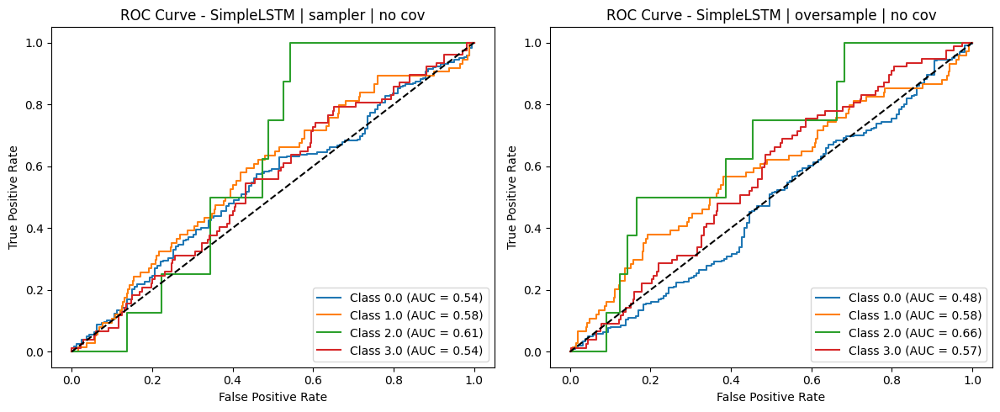

[ROC GRID] GRU Models -> Experiments/1_st_experiment/Experiment_1_GRU Models_roc_grid.png

[ROC GRID] Категория: GRU Models


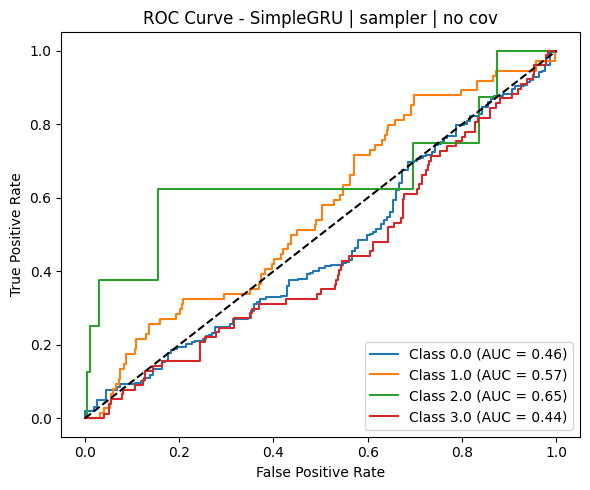

[ROC GRID] ROISequenceNet Models (no covariats) -> Experiments/1_st_experiment/Experiment_1_ROISequenceNet Models (no covariats)_roc_grid.png

[ROC GRID] Категория: ROISequenceNet Models (no covariats)


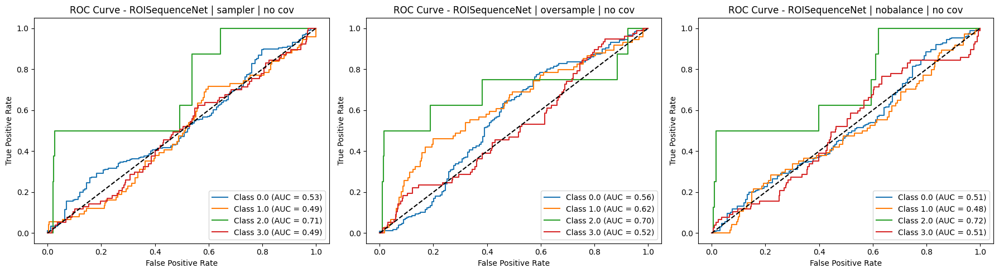

[ROC GRID] ROISequenceNet Models (with covariats) -> Experiments/1_st_experiment/Experiment_1_ROISequenceNet Models (with covariats)_roc_grid.png

[ROC GRID] Категория: ROISequenceNet Models (with covariats)


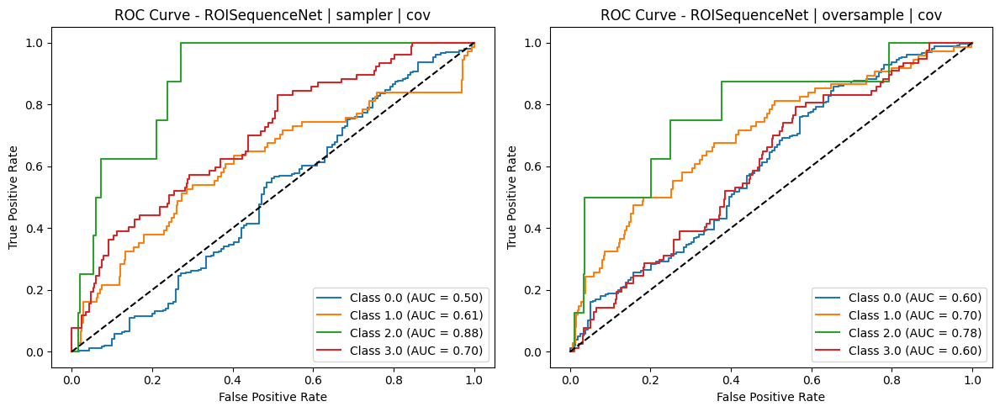

[ROC GRID] MLP Models -> Experiments/1_st_experiment/Experiment_1_MLP Models_roc_grid.png

[ROC GRID] Категория: MLP Models


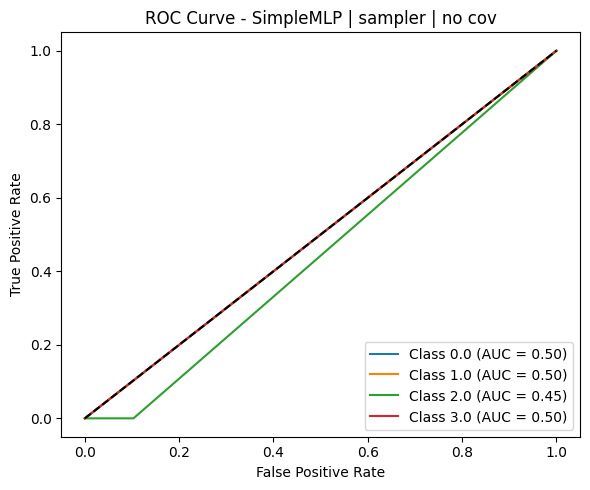

[ROC SUMMARY] Сохранено: Experiments/1_st_experiment/Experiment_1_roc_summary.csv
                                 category           model balance_strategy  use_covariates   val_acc   val_auc    val_f1
0                             LSTM Models      SimpleLSTM          sampler           False  0.396465  0.568209  0.425054
1                             LSTM Models      SimpleLSTM       oversample           False  0.479798  0.570913  0.470295
2                              GRU Models       SimpleGRU          sampler           False  0.297980  0.529844  0.320200
3    ROISequenceNet Models (no covariats)  ROISequenceNet          sampler           False  0.560606  0.553494  0.453184
4    ROISequenceNet Models (no covariats)  ROISequenceNet       oversample           False  0.578283  0.600848  0.515788
5    ROISequenceNet Models (no covariats)  ROISequenceNet        nobalance           False  0.590909  0.553658  0.464673
6  ROISequenceNet Models (with covariats)  ROISequenceNet          samp

,category,model,balance_strategy,use_covariates,val_loss,val_acc,val_auc,val_prec,val_f1
0,LSTM Models,SimpleLSTM,sampler,False,2.044537,0.396465,0.548590,0.468870,0.425054
1,LSTM Models,SimpleLSTM,oversample,False,2.718281,0.479798,0.516789,0.462023,0.470295
2,GRU Models,SimpleGRU,sampler,False,2.091148,0.297980,0.480545,0.413018,0.320200
3,ROISequenceNet Models (no covariats),ROISequenceNet,sampler,False,2.107716,0.560606,0.514948,0.391430,0.453184
4,ROISequenceNet Models (no covariats),ROISequenceNet,oversample,False,3.928076,0.578283,0.568907,0.518539,0.515788
5,ROISequenceNet Models (no covariats),ROISequenceNet,nobalance,False,2.120834,0.590909,0.507370,0.424534,0.464673
6,ROISequenceNet Models (with covariats),ROISequenceNet,sampler,True,1.631074,0.255051,0.564527,0.105291,0.144073
7,ROISequenceNet Models (with covariats),ROISequenceNet,oversample,True,2.015575,0.265152,0.623061,0.108049,0.149323
8,MLP Models,SimpleMLP,sampler,False,77488.338024,0.194444,0.498959,0.037809,0.063307


In [48]:
# === ROC Curves и сводные метрики (устойчиво к отсутствию oversample / других моделей) ===
experiment_handler_1 = ExperimentHandling(experiment_dict=experiment_1_dict,
                                           experiment_name="Experiment_1",
                                           experiment_dir=EXPERIMENT_DIR)
experiment_handler_1.plot_metrics()
experiment_handler_1.plot_roc_curves()

experiment_1_sequence_summary_df = experiment_handler_1.get_results_summary()
print("\n[Experiment 1 - Sequence Models Summary]")
display(experiment_1_sequence_summary_df)

## 9) Baseline A — Статический функциональный коннектом (FC) + логистическая регрессия
Идея: из каждого временного ряда NPY `(T,R)` рассчитывается корреляционная матрица `R×R` (Пирсон), применяется Z **Фишера** и векторизуется верхний треугольник. Т.о. получается признак фиксированной длины. 

Затем обучаем **LogisticRegression (multinomial)**, опционально предваряя **PCA** до `FC_PCA_COMPONENTS`.

Разбиение — то же групповое (без утечек).

In [49]:
if RUN_BASELINE_A:
    from sklearn.model_selection import GroupShuffleSplit

    # Если train_df / val_df не определены ранее, создадим групповый split по participant_id (без утечки)
    if ('train_df' not in globals()) or ('val_df' not in globals()):
        gss = GroupShuffleSplit(n_splits=1, test_size=VAL_SIZE, random_state=constants.get('RANDOM_SEED', 42))
        groups = data_df['participant_id'].astype(str).values
        train_idx, val_idx = next(gss.split(data_df, y=data_df['label'].values, groups=groups))
        train_df = data_df.iloc[train_idx].reset_index(drop=True)
        val_df = data_df.iloc[val_idx].reset_index(drop=True)

        # Защита от утечки: один participant_id не должен попасть в оба сплита
        train_pids = set(train_df['participant_id'].astype(str).tolist())
        val_pids = set(val_df['participant_id'].astype(str).tolist())
        overlap = train_pids.intersection(val_pids)
        if overlap:
            example = list(sorted(overlap))[:10]
            raise ValueError(
                "[Baseline A] participant_id leakage between train/val splits "
                f"(n_overlap={len(overlap)}). Example ids: {example}"
            )

        print(f"[Baseline A] train_df/val_df не найдены -> split из data_df: train={len(train_df)}, val={len(val_df)}")

    def _resolve_npy_path(path: str) -> str:
        # data_df['npy_path'] часто относительный путь; попробуем подставить корень, если файла нет
        if os.path.exists(path):
            return path
        root = constants.get('DATA_SOURCES', {}).get('ATHENA_SOURCE_ROOT', None)
        if root is not None:
            cand = os.path.join(root, path)
            if os.path.exists(cand):
                return cand
        return path  # пусть упадёт с понятным FileNotFoundError

    def fisher_z(r):
        r = np.clip(r, -0.999999, 0.999999)
        return 0.5 * np.log((1 + r) / (1 - r))

    def vec_uppertri(M):
        iu = np.triu_indices_from(M, k=1)
        return M[iu]

    def fc_vector_from_npy(path):
        path = _resolve_npy_path(path)
        X = np.load(path)  # (T,R)
        C = np.corrcoef(X, rowvar=False)
        # Replace NaNs arising from zero-variance ROI time series
        C = np.nan_to_num(C, nan=0.0, posinf=0.0, neginf=0.0)
        np.fill_diagonal(C, 1.0)
        Cz = fisher_z(C)
        return vec_uppertri(Cz)

    def build_fc_matrix(df):
        feats = [fc_vector_from_npy(p) for p in df['npy_path']]
        X = np.vstack(feats)
        # Safety: ensure no NaNs remain
        X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
        y = df['label'].values.astype(int)
        return X, y

    Xtr, ytr = build_fc_matrix(train_df)
    Xva, yva = build_fc_matrix(val_df)
    scaler = StandardScaler(with_mean=True, with_std=True)
    Xtr_s = scaler.fit_transform(Xtr)
    Xva_s = scaler.transform(Xva)
    # Extra safety before PCA
    if np.isnan(Xtr_s).any() or np.isnan(Xva_s).any():
        Xtr_s = np.nan_to_num(Xtr_s, nan=0.0, posinf=0.0, neginf=0.0)
        Xva_s = np.nan_to_num(Xva_s, nan=0.0, posinf=0.0, neginf=0.0)

    if FC_PCA_COMPONENTS and FC_PCA_COMPONENTS > 0:
        # PCA ограничение: n_components <= min(n_samples, n_features)
        allowable = min(Xtr_s.shape[0], Xtr_s.shape[1])
        n_comp = min(FC_PCA_COMPONENTS, allowable)
        if n_comp < 1:
            print("Пропуск PCA: недостаточно допустимых компонент.")
        else:
            if n_comp != FC_PCA_COMPONENTS:
                print(f"Понижено число компонент PCA с {FC_PCA_COMPONENTS} до {n_comp} (min(n_samples={Xtr_s.shape[0]}, n_features={Xtr_s.shape[1]})).")
            pca = PCA(n_components=n_comp)
            Xtr_s = pca.fit_transform(Xtr_s)
            Xva_s = pca.transform(Xva_s)

    clf = LogisticRegression(max_iter=500, multi_class='multinomial', solver='lbfgs')
    clf.fit(Xtr_s, ytr)
    pr_tr = clf.predict_proba(Xtr_s)
    pr_va = clf.predict_proba(Xva_s)
    yh_va = pr_va.argmax(1)
    acc = accuracy_score(yva, yh_va)
    f1 = f1_score(yva, yh_va, average='macro')
    try:
        auc = roc_auc_score(yva, pr_va, multi_class='ovr', average='macro')
    except Exception:
        auc = float('nan')

    # Создадим df для метрик
    # category,model,balance_strategy,use_covariates,val_loss,val_acc,val_auc,val_prec,val_f1
    baseline_metrics_df = pd.DataFrame({'category': ['baseline'],
                                        'model': ['FC-LogReg'],
                                        'balance_strategy': ['None'],
                                        'use_covariates': [False],
                                        'val_loss': [None],
                                        'val_acc': [acc],
                                        'val_auc': [auc],
                                        'val_f1': [f1]})
    print(f"[FC-LogReg] val_acc={acc:.3f} | val_auc={auc:.3f} | val_f1={f1:.3f}")
else:
    print("RUN_BASELINE_A не установлен, пропуск базовой модели FC-LogReg.")


[Baseline A] train_df/val_df не найдены -> split из data_df: train=1540, val=381
[FC-LogReg] val_acc=0.588 | val_auc=0.705 | val_f1=0.271


In [50]:
# Сведём все результаты экспериментов в единый словарь для дальнейшей обработки
experiment_1_sequence_and_baseline_summary_df = pd.concat([experiment_1_sequence_summary_df, baseline_metrics_df], axis=0)
print("\n[Experiment 1 - Sequence Models + Baseline Summary]")
display(experiment_1_sequence_and_baseline_summary_df)

# Сохраним сводную таблицу по sequence моделям + baseline в файл
summary_path = os.path.join(EXPERIMENT_DIR, 'experiment_1_sequence_and_baseline_summary.csv')
experiment_1_sequence_and_baseline_summary_df.to_csv(summary_path, index=False)
print(f"[Experiment 1] Сводная таблица по sequence моделям + baseline сохранена по пути: {summary_path}")

print("\n=== Experiment 1 completed ===")
print(f"{experiment_1_sequence_and_baseline_summary_df[['model', 'balance_strategy', 'val_acc', 'val_auc', 'val_f1']].to_string(index=False)}")


[Experiment 1 - Sequence Models + Baseline Summary]


,category,model,balance_strategy,use_covariates,val_loss,val_acc,val_auc,val_prec,val_f1
0,LSTM Models,SimpleLSTM,sampler,False,2.044537,0.396465,0.548590,0.468870,0.425054
1,LSTM Models,SimpleLSTM,oversample,False,2.718281,0.479798,0.516789,0.462023,0.470295
2,GRU Models,SimpleGRU,sampler,False,2.091148,0.297980,0.480545,0.413018,0.320200
3,ROISequenceNet Models (no covariats),ROISequenceNet,sampler,False,2.107716,0.560606,0.514948,0.391430,0.453184
4,ROISequenceNet Models (no covariats),ROISequenceNet,oversample,False,3.928076,0.578283,0.568907,0.518539,0.515788
5,ROISequenceNet Models (no covariats),ROISequenceNet,nobalance,False,2.120834,0.590909,0.507370,0.424534,0.464673
6,ROISequenceNet Models (with covariats),ROISequenceNet,sampler,True,1.631074,0.255051,0.564527,0.105291,0.144073
7,ROISequenceNet Models (with covariats),ROISequenceNet,oversample,True,2.015575,0.265152,0.623061,0.108049,0.149323
8,MLP Models,SimpleMLP,sampler,False,77488.338024,0.194444,0.498959,0.037809,0.063307
0,baseline,FC-LogReg,None,False,NaN,0.587927,0.705008,NaN,0.271238


[Experiment 1] Сводная таблица по sequence моделям + baseline сохранена по пути: Experiments/1_st_experiment/experiment_1_sequence_and_baseline_summary.csv

=== Experiment 1 completed ===
         model balance_strategy  val_acc  val_auc   val_f1
    SimpleLSTM          sampler 0.396465 0.548590 0.425054
    SimpleLSTM       oversample 0.479798 0.516789 0.470295
     SimpleGRU          sampler 0.297980 0.480545 0.320200
ROISequenceNet          sampler 0.560606 0.514948 0.453184
ROISequenceNet       oversample 0.578283 0.568907 0.515788
ROISequenceNet        nobalance 0.590909 0.507370 0.464673
ROISequenceNet          sampler 0.255051 0.564527 0.144073
ROISequenceNet       oversample 0.265152 0.623061 0.149323
     SimpleMLP          sampler 0.194444 0.498959 0.063307
     FC-LogReg             None 0.587927 0.705008 0.271238


## 10) Baseline B — Динамический FC + HMM-фичи (или KMeans fallback)
Идея: скользящим окном (`WIN_DYN`, шаг `STEP_DYN`) считаем FC по каждому окну → получаем последовательность векторов ("кадров") на субъекта. 
На **train** обучаем `GaussianHMM(n_states=HMM_N_STATES)` по этим кадрам. Для каждого субъекта считаем признаки:
- доля времени в каждом состоянии,
- частота переключений,
- средняя длительность посещений.
Если `hmmlearn` недоступен, используем **KMeans** как приближение скрытых состояний.
Классификатор: `LogisticRegression` на агрегированных признаках.

In [51]:
def sliding_windows(X, win=30, step=5):
    t, r = X.shape
    for s in range(0, max(1, t - win + 1), step):
        e = min(t, s + win)
        if e - s >= max(5, win//2):
            yield X[s:e]

def fc_frames_from_npy(path, win=30, step=5):
    X = np.load(path)
    frames = []
    for seg in sliding_windows(X, win, step):
        C = np.corrcoef(seg, rowvar=False)
        r = 0.5*np.log((1+np.clip(C, -0.999999, 0.999999))/(1-np.clip(C, -0.999999, 0.999999)))
        iu = np.triu_indices_from(r, k=1)
        frames.append(r[iu])
    if not frames:
        C = np.corrcoef(X, rowvar=False); iu = np.triu_indices_from(C, 1)
        r = 0.5*np.log((1+np.clip(C, -0.999999, 0.999999))/(1-np.clip(C, -0.999999, 0.999999)))
        frames = [r[iu]]
    # print("DynFC train frame shapes:")
    # print([f.shape for f in frames[:10]])
    return np.vstack(frames)

def summarize_states(states, n_states):
    T = len(states)
    if T == 0:
        return np.zeros(n_states + 2)
    frac = np.bincount(states, minlength=n_states) / max(1, T)
    switches = (states[1:] != states[:-1]).mean() if T>1 else 0.0
    lengths = []
    cur = 1
    for i in range(1, T):
        if states[i]==states[i-1]: cur += 1
        else: lengths.append(cur); cur = 1
    lengths.append(cur)
    dwell = float(np.mean(lengths))
    return np.concatenate([frac, [switches, dwell]])

def pad_or_truncate_frames_list(fr_list, target_dim):
    fixed = []
    for fr in fr_list:
        cur_dim = fr.shape[1]
        if cur_dim < target_dim:
            pad = np.zeros((fr.shape[0], target_dim - cur_dim), dtype=fr.dtype)
            fr = np.hstack([fr, pad])
        elif cur_dim > target_dim:
            fr = fr[:, :target_dim]
        fixed.append(fr)
    return fixed

In [52]:
if RUN_BASELINE_B:    
    # Получаем кадры динамического FC
    tr_frames = [fc_frames_from_npy(p, WIN_DYN, STEP_DYN) for p in train_df['npy_path']]
    va_frames = [fc_frames_from_npy(p, WIN_DYN, STEP_DYN) for p in val_df['npy_path']]

    # Санитизация (NaN / inf -> 0)
    def sanitize_frames(fr_list):
        return [np.nan_to_num(f, nan=0.0, posinf=0.0, neginf=0.0) for f in fr_list]

    tr_frames = sanitize_frames(tr_frames)
    va_frames = sanitize_frames(va_frames)

    # Выравнивание размерности кадров перед vstack
    max_dim = max(fr.shape[1] for fr in tr_frames + va_frames)

    tr_frames = pad_or_truncate_frames_list(tr_frames, max_dim)
    va_frames = pad_or_truncate_frames_list(va_frames, max_dim)

    # Объединяем обучающие кадры
    Xtrain_seq = np.vstack(tr_frames)
    Xtrain_seq = np.nan_to_num(Xtrain_seq, nan=0.0, posinf=0.0, neginf=0.0)

    # Удаляем/обрабатываем почти константные признаки (иначе ковариации будут нулевые, что сломает HMM)
    var = Xtrain_seq.var(axis=0)
    dyn_keep_cols = var > 1e-12
    if dyn_keep_cols.sum() < Xtrain_seq.shape[1]:
        removed = (~dyn_keep_cols).sum()
        print(f"[DynFC] Removed {removed} near-constant features before HMM/KMeans.")
        Xtrain_seq = Xtrain_seq[:, dyn_keep_cols]
    else:
        dyn_keep_cols = None  # ничего не удаляем

    # Распечатка формы после очистки
    print(f"[DynFC] Training sequence shape after cleaning: {Xtrain_seq.shape}")

In [53]:
if RUN_BASELINE_B:
    # HAS_HMM флаг (модуль уже импортирован выше, просто оставим структуру)
    HAS_HMM = True  # По-умолчанию используем Hidden Markov Model

    def _apply_keep(frames):
        """
        Санитизация + приведение числа признаков к размеру dyn_keep_cols.
        Исправление IndexError при несовпадении длины boolean mask и числа колонок:
        - Если во входном кадре меньше признаков (из-за различного числа ROI после salvage),
            дополняем нулями.
        - Если больше — обрезаем.
        После выравнивания применяем dyn_keep_cols.
        """
        frames = np.nan_to_num(frames, nan=0.0, posinf=0.0, neginf=0.0)
        if dyn_keep_cols is not None:
            target_len = dyn_keep_cols.shape[0]
            cur_len = frames.shape[1]
            if cur_len != target_len:
                if cur_len < target_len:
                    # pad zeros to the right
                    pad = np.zeros((frames.shape[0], target_len - cur_len), dtype=frames.dtype)
                    frames = np.hstack([frames, pad])
                else:
                    # truncate extra columns
                    frames = frames[:, :target_len]
            # now safe to index
            frames = frames[:, dyn_keep_cols]
        return frames

    # Лёгкая стабилизация: добавим eps к абсолютно нулевым столбцам (если остались)
    zero_var_cols = (Xtrain_seq.var(axis=0) <= 1e-12)
    if zero_var_cols.any():
        Xtrain_seq[:, zero_var_cols] += np.random.randn(Xtrain_seq.shape[0], zero_var_cols.sum()) * 1e-6
        print(f"[DynFC] Injected epsilon noise into {zero_var_cols.sum()} zero-variance columns.")

    n_states = int(HMM_N_STATES)

    if HAS_HMM:
        model_states = GaussianHMM(n_components=n_states, covariance_type='diag', n_iter=200, random_state=0)
        try:
            model_states.fit(Xtrain_seq)
        except ValueError as e:
            print(f"[DynFC-HMM] HMM fit failed ({e}) -> fallback to KMeans.")
            HAS_HMM = False

    if HAS_HMM:
        def assign_states(frames):
            frames = _apply_keep(frames)
            return model_states.predict(frames)
    else:
        # Fallback: KMeans
        kmeans = KMeans(n_clusters=n_states, random_state=0)
        kmeans.fit(Xtrain_seq)

        def assign_states(frames):
            frames = _apply_keep(frames)
            return kmeans.predict(frames)
else:
    print("\n[INFO] Пропуск Baseline B: динамическое FC + HMM/KMeans.")


[INFO] Пропуск Baseline B: динамическое FC + HMM/KMeans.


In [54]:
if RUN_BASELINE_B:
    def build_dyn_feats(frames_list):
        feats = []
        for fr in frames_list:
            fr_san = _apply_keep(fr)
            st = assign_states(fr_san)
            feats.append(summarize_states(st, n_states))
        return np.vstack(feats)

    # Строим агрегированные признаки состояний
    Xtr = build_dyn_feats(tr_frames)
    ytr = train_df['label'].values.astype(int)
    Xva = build_dyn_feats(va_frames)
    yva = val_df['label'].values.astype(int)

    # Финальная модель
    clf = LogisticRegression(max_iter=500, multi_class='multinomial', solver='lbfgs')
    clf.fit(Xtr, ytr)

    pr_va = clf.predict_proba(Xva)
    yh_va = pr_va.argmax(1)
    acc = accuracy_score(yva, yh_va)
    f1 = f1_score(yva, yh_va, average='macro')
    try:
        auc = roc_auc_score(yva, pr_va, multi_class='ovr', average='macro')
    except Exception:
        auc = float('nan')
    print(f"[DynFC-HMM] val_acc={acc:.3f} | val_auc={auc:.3f} | val_f1={f1:.3f} | HAS_HMM={HAS_HMM}")
else:
    print("\n[INFO] Пропуск Baseline B: динамическое FC + HMM/KMeans.")



[INFO] Пропуск Baseline B: динамическое FC + HMM/KMeans.


## 11) Оценка переносимости: Leave-One-Site-Out (LOSO) для FC-baseline
Для каждого сайта извлекаем его как **валидационную** выборку, обучаемся на остальных и считаем метрики. Это имитирует перенос на новый центр/сканер.

In [55]:
def fisher_z(r):
    r = np.clip(r, -0.999999, 0.999999)
    return 0.5*np.log((1+r)/(1-r))

def vec_uppertri(M):
    iu = np.triu_indices_from(M, k=1)
    return M[iu]

def fc_vector_from_npy(path):
    X = np.load(path)
    C = np.corrcoef(X, rowvar=False)
    Cz = fisher_z(C)
    return vec_uppertri(Cz)

def build_fc_matrix(df):
    feats = [fc_vector_from_npy(p) for p in df['npy_path']]
    X = np.vstack(feats)
    y = df['label'].values.astype(int)
    return X, y

In [56]:
if DO_LOSO:
    # Сперва попытаемся загрузить данные из файла
    loso_path = os.path.join(EXPERIMENT_DIR, 'experiment_1_loso_summary.csv')
    df_res = None
    if os.path.exists(loso_path):
        try:
            df_res = pd.read_csv(loso_path)
            print(f"[LOSO] Загружены результаты LOSO из файла: {loso_path}")
            display(df_res)
        except Exception as e:
            print(f"[LOSO] Ошибка при загрузке LOSO из файла ({e}) — будет выполнен полный LOSO.")
    else:
        # Получим отображение participant_id → site_original
        pid_to_site = data_df.set_index('participant_id')['site_original'].to_dict()
        sites = sorted({pid_to_site[pid] for pid in data_df['participant_id']})
        print(f"\n[INFO] Запуск LOSO оценивания по сайтам: {sites}")
        res = []
        for site in sites:
            tr_idx = data_df['participant_id'].map(pid_to_site) != site
            va_idx = ~tr_idx
            tr_df = data_df[tr_idx].reset_index(drop=True)
            va_df = data_df[va_idx].reset_index(drop=True)
            if len(va_df) < 5 or len(tr_df) < 10:
                print(f"[LOSO:{site}] слишком мало данных — пропуск")
                continue
            # Формирование признаков (могут содержать NaN из-за нулевой дисперсии ROI)
            Xtr, ytr = build_fc_matrix(tr_df)
            Xva, yva = build_fc_matrix(va_df)
            # Заменяем NaN / inf значениями 0 перед любыми трансформациями
            Xtr = np.nan_to_num(Xtr, nan=0.0, posinf=0.0, neginf=0.0)
            Xva = np.nan_to_num(Xva, nan=0.0, posinf=0.0, neginf=0.0)
            # Масштабирование
            scaler = StandardScaler()
            Xtr_s = scaler.fit_transform(Xtr)
            Xva_s = scaler.transform(Xva)
            # Повторная санитаризация (иногда стандартизация может породить inf при нулевом std)
            Xtr_s = np.nan_to_num(Xtr_s, nan=0.0, posinf=0.0, neginf=0.0)
            Xva_s = np.nan_to_num(Xva_s, nan=0.0, posinf=0.0, neginf=0.0)
            # PCA (с проверкой допустимого числа компонент и отсутствия NaN)
            if FC_PCA_COMPONENTS and FC_PCA_COMPONENTS > 0:
                allowable = min(Xtr_s.shape[0], Xtr_s.shape[1])
                n_comp = min(FC_PCA_COMPONENTS, allowable)
                if n_comp < 1:
                    print(f"[LOSO:{site}] Пропуск PCA (недостаточно компонент).")
                else:
                    if n_comp != FC_PCA_COMPONENTS:
                        print(f"[LOSO:{site}] PCA компонентов снижено до {n_comp} (allowable={allowable}).")
                    # Санитизация перед PCA fit
                    Xtr_s = np.nan_to_num(Xtr_s, nan=0.0, posinf=0.0, neginf=0.0)
                    Xva_s = np.nan_to_num(Xva_s, nan=0.0, posinf=0.0, neginf=0.0)
                    try:
                        pca = PCA(n_components=n_comp)
                        Xtr_s = pca.fit_transform(Xtr_s)
                        Xva_s = pca.transform(Xva_s)
                        # Финальная санитаризация
                        Xtr_s = np.nan_to_num(Xtr_s, nan=0.0, posinf=0.0, neginf=0.0)
                        Xva_s = np.nan_to_num(Xva_s, nan=0.0, posinf=0.0, neginf=0.0)
                    except ValueError as e:
                        print(f"[LOSO:{site}] Пропуск PCA из-за ошибки: {e}")
            # Обучение логистической регрессии
            clf = LogisticRegression(max_iter=500, multi_class='multinomial', solver='lbfgs')
            clf.fit(Xtr_s, ytr)
            pr = clf.predict_proba(Xva_s); yh = pr.argmax(1)
            acc = accuracy_score(yva, yh)
            f1  = f1_score(yva, yh, average='macro')
            try:
                auc = roc_auc_score(yva, pr, multi_class='ovr', average='macro')
            except Exception:
                auc = float('nan')
            res.append({"site": site, "N_val": len(va_df), "acc":acc, "auc":auc, "f1":f1})
            print(f"[LOSO:{site}] N={len(va_df)} | acc={acc:.3f} | auc={auc:.3f} | f1={f1:.3f}")
        
        if res:
            df_res = pd.DataFrame(res)
            display(df_res)
            # Сохраним df_res в файл
            df_res.to_csv(loso_path, index=False)
            print(f"[LOSO] Сводная таблица LOSO сохранена по пути: {loso_path}")
            print("Средние по сайтам:", df_res[['acc','auc','f1']].mean().to_dict())
else:
    print("\n[INFO] Пропуск LOSO оценивания.")


[LOSO] Загружены результаты LOSO из файла: Experiments/1_st_experiment/experiment_1_loso_summary.csv


,site,N_val,acc,auc,f1
0,1,776,0.610825,NaN,0.320987
1,3,83,0.578313,0.374831,0.198300
2,4,192,0.500000,0.696927,0.190602
3,5,394,0.446701,0.603311,0.242843
4,6,237,0.506329,0.540118,0.252155
5,7,89,0.764045,NaN,0.288747
6,8,150,0.853333,NaN,0.306954


In [57]:
# Разделение данных на различные возрастные когорты (по признаку age_cohort)
data_df_children = data_df[data_df['age_cohort'] == 'children'].reset_index(drop=True)
print(f"Количество записей в когорте 'children': {len(data_df_children)}")
display(data_df_children.head())

data_df_teen = data_df[data_df['age_cohort'] == 'teen'].reset_index(drop=True)
print(f"\nКоличество записей в когорте 'teen': {len(data_df_teen)}")
display(data_df_teen.head())

data_df_adult = data_df[data_df['age_cohort'] == 'adult'].reset_index(drop=True)
print(f"\nКоличество записей в когорте 'adult': {len(data_df_adult)}")
display(data_df_adult.head())

# Дополнительные датасеты со смежными когортами
data_df_children_teen = data_df[data_df['age_cohort'].isin(['children', 'teen'])].reset_index(drop=True)
print(f"\nКоличество записей в когорте 'children + teen': {len(data_df_children_teen)}")
data_df_teen_adult = data_df[data_df['age_cohort'].isin(['teen', 'adult'])].reset_index(drop=True)
print(f"\nКоличество записей в когорте 'teen + adult': {len(data_df_teen_adult)}")

Количество записей в когорте 'children': 1027


,participant_id,pid_raw,site,site_original,run_id,win_index,segment_start,segment_end,npy_path,mask_path,tsv_path,atlas,TR,nan_ratio_run,age_cohort,data_path,label,age,gender,n_roi,nan_frac_raw,roi_drop_cnt,nan_frac
0,sub-1043241,1043241,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.12,M,353,0.0,0,0.0
1,sub-1266183,1266183,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.67,F,353,0.0,0,0.0
2,sub-1535233,1535233,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0.0,9.64,M,353,0.0,0,0.0
3,sub-1541812,1541812,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1.0,8.45,F,353,0.0,0,0.0
4,sub-1577042,1577042,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1.0,9.06,M,353,0.0,0,0.0



Количество записей в когорте 'teen': 668


,participant_id,pid_raw,site,site_original,run_id,win_index,segment_start,segment_end,npy_path,mask_path,tsv_path,atlas,TR,nan_ratio_run,age_cohort,data_path,label,age,gender,n_roi,nan_frac_raw,roi_drop_cnt,nan_frac
0,sub-1018959,1018959,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_teen_...,Athena_prepared_three_age_cohorts/cohort_teen_...,NaN,CC400,NaN,0.0,teen,Athena_prepared_three_age_cohorts/cohort_teen_...,0.0,12.36,F,353,0.0,0,0.0
1,sub-1019436,1019436,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_teen_...,Athena_prepared_three_age_cohorts/cohort_teen_...,NaN,CC400,NaN,0.0,teen,Athena_prepared_three_age_cohorts/cohort_teen_...,3.0,12.98,M,353,0.0,0,0.0
2,sub-1594156,1594156,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_teen_...,Athena_prepared_three_age_cohorts/cohort_teen_...,NaN,CC400,NaN,0.0,teen,Athena_prepared_three_age_cohorts/cohort_teen_...,0.0,12.87,M,353,0.0,0,0.0
3,sub-1623716,1623716,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_teen_...,Athena_prepared_three_age_cohorts/cohort_teen_...,NaN,CC400,NaN,0.0,teen,Athena_prepared_three_age_cohorts/cohort_teen_...,1.0,12.65,F,353,0.0,0,0.0
4,sub-2026113,2026113,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_teen_...,Athena_prepared_three_age_cohorts/cohort_teen_...,NaN,CC400,NaN,0.0,teen,Athena_prepared_three_age_cohorts/cohort_teen_...,1.0,12.99,F,353,0.0,0,0.0



Количество записей в когорте 'adult': 226


,participant_id,pid_raw,site,site_original,run_id,win_index,segment_start,segment_end,npy_path,mask_path,tsv_path,atlas,TR,nan_ratio_run,age_cohort,data_path,label,age,gender,n_roi,nan_frac_raw,roi_drop_cnt,nan_frac
0,sub-0010050,10050,NYU,5,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_adult...,Athena_prepared_three_age_cohorts/cohort_adult...,NaN,CC400,NaN,0.0,adult,Athena_prepared_three_age_cohorts/cohort_adult...,1.0,17.43,M,353,0.0,0,0.0
1,sub-0010050,10050,NYU,5,ses1_rest2,0,0,200,Athena_prepared_three_age_cohorts/cohort_adult...,Athena_prepared_three_age_cohorts/cohort_adult...,NaN,CC400,NaN,0.0,adult,Athena_prepared_three_age_cohorts/cohort_adult...,1.0,17.43,M,353,0.0,0,0.0
2,sub-0010052,10052,NYU,5,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_adult...,Athena_prepared_three_age_cohorts/cohort_adult...,NaN,CC400,NaN,0.0,adult,Athena_prepared_three_age_cohorts/cohort_adult...,0.0,16.31,M,353,0.0,0,0.0
3,sub-0010052,10052,NYU,5,ses1_rest2,0,0,200,Athena_prepared_three_age_cohorts/cohort_adult...,Athena_prepared_three_age_cohorts/cohort_adult...,NaN,CC400,NaN,0.0,adult,Athena_prepared_three_age_cohorts/cohort_adult...,0.0,16.31,M,353,0.0,0,0.0
4,sub-0010054,10054,NYU,5,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_adult...,Athena_prepared_three_age_cohorts/cohort_adult...,NaN,CC400,NaN,0.0,adult,Athena_prepared_three_age_cohorts/cohort_adult...,0.0,17.83,M,353,0.0,0,0.0



Количество записей в когорте 'children + teen': 1695

Количество записей в когорте 'teen + adult': 894


Создадим расширение SingleExperimentWithTests для класса SingleExperiment для оценки переносимости моделей между возрастными группами и вывода результатов.
Расширим конструктор для принятия дополнительных загрузчиков тестовых данных (test_loaders), которые будут использоваться для оценки моделей на различных возрастных группах после обучения.
Добавим метод run_tests() для выполнения оценки на всех предоставленных тестовых загрузчиках после завершения обучения модели.
Добавим метод plottests() для визуализации результатов тестирования на различных возрастных группах.

In [58]:
class SingleExperimentWithTests(SingleExperiment):
    def __init__(self, *args, test_loaders: dict[str, DataLoader] | None = None, **kwargs):
        super().__init__(*args, **kwargs)
        self.test_loaders = test_loaders or {}

    @torch.no_grad()
    def _infer_loader(self, loader):
        self.model.eval()
        probs_all, labels_all, pids_all = [], [], []
        for batch in loader:
            if len(batch) == 5:
                X, M, C, y, pid = batch
            elif len(batch) == 4:
                X, M, C, y = batch; pid = None
            elif len(batch) == 3:
                X, C, y = batch; M = None; pid = None
            else:
                raise ValueError(f"Unexpected batch len {len(batch)}")
            X = X.to(self.device); y = y.to(self.device)
            M = M.to(self.device) if M is not None else None
            C = C.to(self.device) if (C is not None and C.nelement() > 0) else None
            out = self.model(X) if (M is None and C is None) else self._call_with_cov(X, M, C)
            probs = F.softmax(out, dim=1).cpu().numpy()
            probs_all.append(probs); labels_all.extend(y.cpu().numpy())
            if pid is not None: pids_all.extend(pid)
        return (np.vstack(probs_all), np.array(labels_all), pids_all if pids_all else None)

    def _call_with_cov(self, X, M, C):
        try:
            return self.model(X, mask=M, cov=C)
        except TypeError:
            return self.model(X, mask=M, z=C)

    def run_tests(self, save_dir=None, should_save=True, loaders=None) -> dict[str, dict[str, float]]:
        save_dir = save_dir or self.checkpoint_dir_path
        os.makedirs(save_dir, exist_ok=True)
        if os.path.exists(os.path.join(self.checkpoint_dir_path, "best_model.pth")):
            self.model.load_state_dict(torch.load(os.path.join(self.checkpoint_dir_path, "best_model.pth"), map_location=self.device))
        summaries = {}
        # If no loaders provided, use self.test_loaders
        loaders = loaders or self.test_loaders
        for name, loader in loaders.items():
            probs, labels, pids = self._infer_loader(loader)
            preds = probs.argmax(1)
            acc = accuracy_score(labels, preds)
            try:
                auc = roc_auc_score(labels, probs, multi_class="ovr")
            except Exception:
                auc = float('nan')
            f1 = f1_score(labels, preds, average="weighted")
            df = pd.DataFrame(probs, columns=[f"prob_{c}" for c in sorted(self.class_counts_main.index)])
            df["y_true"] = labels; df["y_pred"] = preds
            if pids: df["pid"] = pids
            if should_save:
                csv_path = os.path.join(save_dir, f"{self.model._get_name()}_{name}_test_predictions.csv")
                df.to_csv(csv_path, index=False)
                print(f"[TEST PREDICTIONS] Saved to {csv_path}")
            summaries[name] = {"acc": acc, "auc": auc, "f1": f1}
            
            print(f"[INFERENCE@{name}] {self.model._get_name()} - Test Acc: {acc:.4f} | Test F1: {f1:.4f} | Test AUC: {auc:.4f}")
        return summaries

    def plot_test_roc(self, save_dir=None, should_save=True, show_graph=True, loaders=None):
        save_dir = save_dir or self.checkpoint_dir_path
        classes_sorted = sorted(self.class_counts_main.index.tolist())
        # If no loaders provided, use self.test_loaders
        loaders = loaders or self.test_loaders
        for name, loader in loaders.items():
            probs, labels, _ = self._infer_loader(loader)
            if probs.size == 0: 
                print(f"[ROC] skip {name} (no data)")
                continue
            y_bin = label_binarize(labels, classes=classes_sorted)
            fig, ax = plt.subplots(figsize=(6,5))
            for i, cls in enumerate(classes_sorted):
                fpr, tpr, _ = roc_curve(y_bin[:, i], probs[:, i])
                auc_score = roc_auc_score(y_bin[:, i], probs[:, i])
                ax.plot(fpr, tpr, label=f"Class {cls} (AUC={auc_score:.2f})")
            ax.plot([0,1],[0,1],'k--')
            ax.set_title(f"{self.model._get_name()} | {name}")
            ax.set_xlabel("False Positive Rate"); ax.set_ylabel("True Positive Rate"); ax.legend(loc="lower right")
            plt.tight_layout()
            if should_save:
                os.makedirs(save_dir, exist_ok=True)
                save_path = os.path.join(save_dir, f"{self.model._get_name()}_{name}_roc_curve.png")
                plt.savefig(save_path)
                print(f"[ROC] Saved to {save_path}")
            if show_graph:
                display(fig)
            plt.close(fig)

## 2.3 Итоговые выводы по Эксперименту №2: межкогортный перенос и выбор балансировки

В рамках Эксперимента №2 была оценена переносимость моделей между возрастными когортами (children / teen / adult) в задаче **мультиклассовой** классификации, а также были сравнены два подхода к балансировке классов (`oversample` и `sampler`) с целью зафиксировать **один** режим для последующей оптимизации архитектуры.

### 1) Наблюдается ли симметричный перенос признаков между возрастными когортами?
Полученные результаты показывают, что перенос **в целом реализуем**, однако он носит выраженно **асимметричный** характер: качество существенно зависит от направления доменного сдвига (train→test). В частности, для пары Teens ↔ Adults метрики для направлений Teen → Adult и Adult → Teen заметно различаются. Это, однако, скорее всего связано с размерами выборок и балансировкой классов в каждой когорте, чем с фундаментальными возрастными изменениями в паттернах СДВГ. Так, размеры когорты Teen существенно больше, чем Adult, что может способствовать лучшему обучению модели на Teen и, соответственно, лучшему переносу на Adult.

### 2) Анализ ключевого сценария: перенос Teen → Adult и влияние балансировки классов.
Ниже приведены результаты для двух моделей и двух режимов балансировки (AUC/Acc/F1):

**SimpleLSTM**
- `oversample` (Teen→Adult): AUC 0.5817, Acc 0.2515, F1 0.2012
- `sampler` (Teen→Adult): AUC 0.6027, Acc 0.3850, F1 0.4081

**ROISequenceNet**
- `oversample` (Teen→Adult): AUC 0.5618, Acc 0.2781, F1 0.1516
- `sampler` (Teen→Adult): AUC 0.5620, Acc 0.4292, F1 0.4174

Интерпретация: в сценарии Teen→Adult режим `sampler` является **определяющим** для достижения приемлемых значений Acc/F1 как для baseline-модели, так и для ROISequenceNet. При `oversample` в этом направлении наблюдается существенная деградация (в первую очередь по F1).

### 3) Имеет ли ROISequenceNet преимущество относительно baseline SimpleLSTM?
Преимущество ROISequenceNet **не является универсальным** и зависит от тест-домена и используемой метрики.

- Для **Teen → Adult при стратегии балансировки `sampler`** ROISequenceNet демонстрирует более высокие Acc/F1 по сравнению с SimpleLSTM (Acc 0.4292 vs 0.3850; F1 0.4174 vs 0.4081), при этом по AUC преимущество остаётся за SimpleLSTM (0.6027 vs 0.5620).
- Для переносов на **Adult** (например, Children → Adult) ROISequenceNet при балансировке `sampler` показывает существенно более высокие Acc/F1 по сравнению с SimpleLSTM, что указывает на потенциал архитектуры для данного тест-домена.
- Для переносов на **Children** baseline SimpleLSTM при балансировке `sampler` остаётся конкурентоспособным и в ряде сценариев превосходит ROISequenceNet по Acc.

Таким образом, ROISequenceNet целесообразно рассматривать как основную архитектуру для дальнейшего улучшения, однако сравнение следует проводить по выбранной целевой метрике и с учётом конкретного направления переноса.

### 4) Выбор единого балансировщика для дальнейшей работы
Поскольку целевая постановка — **мультиклассовая классификация**, при принятии решения приоритетными являются **Acc и (weighted) F1** как метрики качества классификации (**AUC** рассматривается как дополнительная характеристика качества ранжирования вероятностей).

С учётом результатов Эксперимента №2:
- `sampler` демонстрирует более стабильное и воспроизводимое улучшение **Acc/F1** в межкогортных переносах, включая ключевой сценарий Teen → Adult.
- `oversample` в отдельных случаях повышает AUC, однако может сопровождаться выраженным ухудшением Acc/F1, что нежелательно для мультиклассовой классификации.

**Итоговое решение:** в дальнейших экспериментах балансировка фиксируется как **`sampler`**. Это позволяет оптимизировать модель (в т.ч. ROISequenceNet) под качество мультиклассовой классификации (Acc/F1) и снизить вариативность результатов при межкогортном переносе.

### 5) Преимущество обучения на смешанных когортах при валидации на «чистых» когортах (фокус: тестирование на Adults).
Вопрос о целесообразности использования «смежной» смешанной когорты для улучшения качества на целевой тест-когорте был рассмотрен в постановке «мостов». Для тестирования на взрослых в Эксперименте №2 использовалась смешанная обучающая когорта **Children+Teen → Adult** (в то время как смешанная когорта **Teen+Adult** в реализованном протоколе применялась для тестирования на children, а не на adults).

- Для **SimpleLSTM при `sampler`** результаты **Children+Teen→Adult** совпали с **Teen→Adult** (AUC 0.6027, Acc 0.3850, F1 0.4081), что указывает на отсутствие наблюдаемого выигрыша от добавления данных детской когорты при переносе на adults в этом режиме балансировки.
- Для **SimpleLSTM при `oversample`** добавление children к teen сопровождалось ухудшением качества на adults: **Teen→Adult** (AUC 0.5817, Acc 0.2515, F1 0.2012) vs **Children+Teen→Adult** (AUC 0.4336, Acc 0.2434, F1 0.1976).
- Для **ROISequenceNet** сравнение **Teen→Adult** и **Children+Teen→Adult** не выявило улучшения качества на adults (в обоих режимах балансировки зафиксированы одинаковые значения для данного теста: при `sampler` AUC 0.5620, Acc 0.4292, F1 0.4174; при `oversample` AUC 0.5618, Acc 0.2781, F1 0.1516).

Следовательно, в пределах выполненных прогонов **для целевого теста Adults не было выявлено преимущества от использования смешанной обучающей когорты Children+Teen** по сравнению с обучением на «чистой» teen (а при `oversample` для SimpleLSTM наблюдалась явная деградация). Для строгого ответа на вопрос «помогает ли именно Teen+Adult при тестировании на adults» требуется отдельная постановка с **полным исключением adults из обучения** (иначе оценка перестаёт быть междоменной и становится частично in-domain).

### 6) Сравнение Эксперимента №1 (3 смешанные когорты) и Эксперимента №2 (раздельные когорты + смежные смешанные когорты)
Эксперимент №1 и Эксперимент №2 различаются не только источником данных, но и **целью оценки**:
- В **Эксперименте №1** оценивалось качество на смеси трёх когорт (in-domain разбиение train/val). В сводке валидации (val) для лучших конфигураций наблюдались значения порядка:
    - SimpleLSTM `oversample` — val Acc 0.4798 / val F1 0.4703 / val AUC 0.5709;
    - ROISequenceNet `oversample` (без ковариат) — val Acc 0.5783 / val F1 0.5158 / val AUC 0.6008.
- В **Эксперименте №2** оценивался именно **межкогортный перенос** (out-of-domain). Так, в ключевом сценарии **Teen→Adult** при `sampler` были получены значения:
    - SimpleLSTM — Acc 0.3850 / F1 0.4081 / AUC 0.6027;
    - ROISequenceNet — Acc 0.4292 / F1 0.4174 / AUC 0.5620.

Вследствие различия протоколов прямое утверждение «результат улучшился/ухудшился» при переходе от Эксперимента №1 к Эксперименту №2 является некорректным без приведения экспериментов к единой схеме тестирования. Для этого должна быть произведена оценка моделей Эксперимента №1 на отдельных возрастных когортах как внешних тест-доменах. Однако для этого потребуется отдельный внешний датасет для инференса, что выходит за рамки данного исследования.

Вместе с тем, Эксперимент №2 является более информативным для задачи переносимости и демонстрирует принципиально важный эффект: конфигурации, выглядящие успешными в in-domain постановке (Эксперимент №1, где `oversample` часто повышал val-метрики), **не гарантируют** улучшения при межкогортном переносе, где для Acc/F1 более надёжным оказался `sampler`.


# Эксперимент 3. Подбор гиперпараметров для целевой нейронной сети ROISequenceNET при обучении на Teens+Adults с инференсом на Adults и при обучении на когорте Teens с чистым инференсом на Adults.

### Ход эксперимента:

1. Формирование целевой задачи классификации и критериев успеха.
    В рамках данного эксперимента используется мультиклассовая классификация с четырьмя классами: типичное развитие, СДВГ комбинированного типа, СДВГ гиперактивно-импульсивного типа и СДВГ невнимательного типа. Основной целевой метрикой предполагается использовать macro ROC-AUC в схеме one-vs-rest. В качестве целевых значений предполагается достичь macro ROC-AUC не ниже 0.80–0.85 на внешнем инференсе взрослой когорты. Дополнительно предполагается оценивать Accuracy и macro F1-score, при этом ориентировочно желательными считаются значения Accuracy не ниже 0.75–0.80 и macro F1-score не ниже 0.60–0.70 при сохранении высокой AUC.

2. Определение источниковой и целевой возрастных когорт.
    В качестве источниковых данных используются данные подростковой когорты (а также, при необходимости, объединённой детско-подростковой когорты). В качестве целевой выборки используется вся доступная взрослая когорта (возраст 16 лет и старше), которая полностью резервируется для инференса и не используется при обучении или подборе гиперпараметров.

3. Разделение источниковых данных на обучающую и валидационную выборки.
    Источниковая когорта разделяется на обучающую и валидационную подвыборки в пропорции 80 процентов и 20 процентов соответственно. Разделение выполняется по идентификаторам испытуемых с целью исключения утечки данных между выборками. На данном этапе предполагается контролировать распределение классов и минимизировать перекосы между обучающей и валидационной подвыборками.

4. Фиксация протокола внешнего тестирования.
    Взрослая когорта полностью используется в качестве внешней тестовой выборки. Данные этой когорты применяются исключительно для инференса обученных моделей и оценки их обобщающей способности при переносе между возрастными группами. Основные метрики внешнего тестирования включают macro ROC-AUC (one-vs-rest), Accuracy, macro F1-score и balanced accuracy. Целевыми считаются значения: macro ROC-AUC не ниже 0.80–0.85, balanced accuracy не ниже 0.70–0.75, macro F1-score не ниже 0.60–0.70.

5. Подготовка входных данных для моделей.
    Для всех испытуемых используются предварительно подготовленные временные ряды BOLD-сигнала в ROI-представлении. Данные приводятся к фиксированной длине, нормализуются на уровне каждого субъекта и, при наличии, сопровождаются масками валидных временных точек. Ковариаты (возраст и пол) в данном эксперименте не используются. Для контроля качества предполагается дополнительно фиксировать долю валидных временных точек и исключать записи, не удовлетворяющие минимальным требованиям качества.

6. Определение архитектуры и параметров модели.
    В качестве основной модели используется архитектура ROISequenceNet. Предполагается варьировать параметры модели, включая размер скрытых представлений, коэффициенты регуляризации, уровни dropout, скорость обучения и способ агрегации временных признаков. Подбор параметров осуществляется в ограниченном пространстве конфигураций, ориентированном на повышение обобщающей способности на внешней выборке.

7. Обучение моделей на источниковой когорте с учётом дисбаланса классов.
    Обучение моделей выполняется на обучающей части источниковых данных с использованием выбранной функции потерь для мультиклассовой классификации. Балансировка классов предполагается выполнять либо с помощью весов классов в функции потерь, либо с использованием сбалансированного сэмплирования в обучающей выборке. В процессе обучения предполагается мониторировать не только loss, но и macro ROC-AUC на валидационной выборке, поскольку именно эта метрика является основной для дальнейшего выбора модели.

8. Оценка качества моделей на валидационной выборке и ранняя остановка.
    На каждом этапе обучения производится оценка качества моделей на валидационной выборке. В качестве основного критерия отбора используется macro ROC-AUC (one-vs-rest). Для предотвращения переобучения применяется ранняя остановка при отсутствии улучшения macro ROC-AUC. Дополнительно контролируются macro F1-score и balanced accuracy, чтобы исключить ситуации, когда улучшение AUC достигается ценой деградации качества классификации редких классов.

9. Выбор оптимальной конфигурации модели.
    По результатам валидации выбирается оптимальная конфигурация модели и соответствующий чекпойнт. Выбор производится без использования данных взрослой когорты. Предполагается сохранить не менее трёх лучших конфигураций по macro ROC-AUC для последующего сравнения на внешнем тестировании.

10. Инференс на взрослой когорте.
    Для выбранной конфигурации модели выполняется инференс на всей взрослой когорте. Получаются вероятностные предсказания для каждого класса, а также итоговые предсказанные метки. На данном этапе предполагается вычислить macro ROC-AUC (one-vs-rest), weighted ROC-AUC, Accuracy, macro F1-score, balanced accuracy, а также метрики по каждому классу отдельно.

11. Оценка качества переноса между возрастными группами.
    На данных взрослой когорты оценивается степень переносимости признаков, обученных на подростковой (или объединённой) выборке. Основным критерием успеха считается достижение macro ROC-AUC не ниже 0.80–0.85. Дополнительно анализируются macro F1-score и balanced accuracy как показатели устойчивости к дисбалансу классов. В случае достижения заданных порогов предполагается перейти к интерпретации результатов и анализу вклада ROI в предсказания.

12. Сравнение различных обучающих сценариев.
    Результаты, полученные при обучении на различных источниковых наборах данных (чисто подростковая когорта и смешанные возрастные когорты), сравниваются между собой по метрикам внешнего тестирования. Основное сравнение предполагается выполнять по macro ROC-AUC, а также по macro F1-score и balanced accuracy. Улучшение метрик при обучении на смешанных возрастных данных интерпретируется как повышение устойчивости модели к возрастному сдвигу.

13. Фиксация и сохранение результатов эксперимента.
    Все результаты эксперимента, включая параметры моделей, значения метрик, предсказания на уровне отдельных испытуемых и использованные разбиения данных, сохраняются для последующего анализа и воспроизводимости. Для каждого запуска предполагается сохранять таблицу предсказаний и сводную таблицу метрик.

14. Формирование выводов и дальнейшие действия.
    На основе полученных результатов формулируются выводы о возможности переноса признаков функционального коннектома, ассоциированных с СДВГ, между возрастными группами. Если macro ROC-AUC на взрослой когорте оказывается ниже 0.80, предполагается перейти к более простой постановке задачи (бинарная классификация) и повторить оптимизацию. При достижении целевых значений предполагается перейти к интерпретации модели и оценке вклада ROI и функциональных сетей для различных подтипов СДВГ.

### 3.1 Общие данные и инструменты

In [59]:
# ============================================================
# 3.1. Подбор гиперпараметров для ROISequenceNet (grid-lite)
# Цель: максимизировать val AUC (для мультикласса) и сохранить
#       наилучшую промежуточную модель/конфигурацию.
#
# ОЖИДАНИЯ по окружению:
# - Архитектура ROISequenceNet определена выше
# - ExperimentDataLoader / Trainer / train_model / SingleExperiment существуют
# - class_counts_main, CHECKPOINT_DIR, DEVICE и т.п. объявлены
# - подготовлены df_train / df_val (или уже создан experiment_data_loader)
# ============================================================

import os
import json
import shutil
import time
import itertools
import hashlib
from typing import Dict, Any, Iterable, Optional

import numpy as np
import pandas as pd

In [60]:
# ---------------------------
# 3.1.1. Пространство поиска
# ---------------------------
# Подбираем через grid-lite, чтобы не утонуть в комбинациях.
# Приоритет: обобщаемость (перенос), а не максимальный capacity.

COV_DIM = 0  # ковариаты в Experiment 3 не используем
COV_DIM_AGE = 1 # 1 колонка - непрерывная величина
COV_DIM_GENDER = 2 # Размерность - 2 колонки после OneHotEncoding
MAX_TRIALS_FIXED_TEEN = 1 # для Teen Only достаточно 1 trial, т.к. мы не подмешиваем данные и не используем ковариаты; это позволит сэкономить время и ресурсы

HP_GRID_ROISEQ = {
    # оптимизация/регуляризация
    "lr": [3e-4, 1e-3],
    "weight_decay": [1e-4, 1e-3],

    # ROISequenceNet.__init__(..., tcn_dropout, lstm_hidden, attn_heads)
    "tcn_dropout": [0.1, 0.2],
    "lstm_hidden": [64, 128],
    "attn_heads": [2, 4],

    # учёт дисбаланса классов на уровне loss (если реализовано в SingleExperiment)
    "class_weight_strength": [0.5, 1.0, 2.0],
}

# Ограничение на число комбинаций (на случай, если сетка разрастётся)
MAX_TRIALS = 60

# Критерий отбора лучших конфигов
PRIMARY_METRIC_NAME = EarlyStopMetric.VAL_LOSS

EXPERIMENT_NAME_3 = '3_rd_experiment'
EXPERIMENT_DIR_3 = str(Path(EXPERIMENT_ROOT)/EXPERIMENT_NAME_3)
if not os.path.exists(EXPERIMENT_DIR_3):
    os.makedirs(EXPERIMENT_DIR_3)
    print(f"Создана директория для эксперимента 3: {EXPERIMENT_DIR_3}")
CHECKPOINT_DIR_3 = str(Path(EXPERIMENT_DIR_3)/'checkpoints')
if not os.path.exists(CHECKPOINT_DIR_3):
    os.makedirs(CHECKPOINT_DIR_3)
    print(f"Создана директория для чекпоинтов 3: {CHECKPOINT_DIR_3}")
else:
    print(f"Директория для чекпоинтов 3 уже существует: {CHECKPOINT_DIR_3}")


Директория для чекпоинтов 3 уже существует: Experiments/3_rd_experiment/checkpoints


In [61]:
# ---------------------------
# 3.1.2. Утилиты
# ---------------------------
# NB: Этот блок должен соответствовать сигнатуре ROISequenceNet:
#     ROISequenceNet(n_roi, n_classes=4, cov_dim=0, tcn_dropout=0.1, lstm_hidden=128, attn_heads=4)

def _iter_grid(grid: Dict[str, list]) -> Iterable[Dict[str, Any]]:
    """Декартово произведение параметров в grid."""
    keys = list(grid.keys())
    values = [grid[k] for k in keys]
    for combo in itertools.product(*values):
        yield dict(zip(keys, combo))


def _hp_hash(d: dict, n: int = 10) -> str:
    """Короткий стабильный id для гиперпараметров (для trial_id)."""
    s = json.dumps(d, sort_keys=True, ensure_ascii=False)
    return hashlib.md5(s.encode("utf-8")).hexdigest()[:n]


def _safe_make_roiseq(n_rois: int, n_classes: int, cov_dim: int, hyper_params: Dict[str, Any]):
    """Создаёт ROISequenceNet строго по актуальной сигнатуре.

    Поддерживаемые ключи hyper_params:
    - tcn_dropout (алиас: dropout для обратной совместимости)
    - lstm_hidden (алиас: hidden)
    - attn_heads
    """
    base_kwargs = {
        "n_roi": n_rois,
        "n_classes": n_classes,
        "cov_dim": cov_dim,
    }

    candidate_kwargs: Dict[str, Any] = {}
    if "tcn_dropout" in hyper_params:
        candidate_kwargs["tcn_dropout"] = hyper_params["tcn_dropout"]
    elif "dropout" in hyper_params:
        candidate_kwargs["tcn_dropout"] = hyper_params["dropout"]

    if "lstm_hidden" in hyper_params:
        candidate_kwargs["lstm_hidden"] = hyper_params["lstm_hidden"]
    elif "hidden" in hyper_params:
        candidate_kwargs["lstm_hidden"] = hyper_params["hidden"]

    if "attn_heads" in hyper_params:
        candidate_kwargs["attn_heads"] = hyper_params["attn_heads"]

    # Guard на совместимость параметров MultiHeadAttention
    lstm_hidden = int(candidate_kwargs.get("lstm_hidden", 128))
    attn_heads = int(candidate_kwargs.get("attn_heads", 4))
    if lstm_hidden % attn_heads != 0:
        raise ValueError(f"Invalid combo: lstm_hidden={lstm_hidden} not divisible by attn_heads={attn_heads}")

    return ROISequenceNet(**base_kwargs, **candidate_kwargs)


def _copy_best_checkpoint(from_dir: str, to_dir: str, prefix: str) -> Optional[str]:
    """Копирует лучший чекпойнт из папки эксперимента в to_dir.

    Пытаемся найти типичные имена, иначе берём самый свежий *.pth.
    Возвращает путь к скопированному файлу или None, если не найдено.
    """
    os.makedirs(to_dir, exist_ok=True)

    candidates = [
        os.path.join(from_dir, "best_model.pth"),
        os.path.join(from_dir, "best_checkpoint.pth"),
        os.path.join(from_dir, "model_best.pth"),
    ]
    src = next((p for p in candidates if os.path.isfile(p)), None)

    if src is None:
        pths = [os.path.join(from_dir, fn) for fn in os.listdir(from_dir) if fn.endswith(".pth")]
        if not pths:
            return None
        src = max(pths, key=lambda p: os.path.getmtime(p))

    dst = os.path.join(to_dir, f"{prefix}_{os.path.basename(src)}")
    shutil.copy2(src, dst)
    return dst

In [62]:
# ---------------------------
# 3.1.2.1. Smoke-check: сборка модели и один forward (без обучения)
# ---------------------------
import inspect
import torch
print("ROISequenceNet.__init__:", inspect.signature(ROISequenceNet.__init__))
print("HP_GRID_ROISEQ keys:", sorted(list(HP_GRID_ROISEQ.keys())))

# Проверяем, что все combos (lstm_hidden, attn_heads) валидны
for h in HP_GRID_ROISEQ.get("lstm_hidden", [128]):
    for a in HP_GRID_ROISEQ.get("attn_heads", [4]):
        if int(h) % int(a) != 0:
            raise AssertionError(f"Bad combo in HP_GRID_ROISEQ: lstm_hidden={h}, attn_heads={a}")
print("HP_GRID_ROISEQ head divisibility: OK")

n_rois_smoke = int(globals().get("target_n_roi", 400))
n_classes_smoke = int(globals().get("N_CLASSES", 4))
cov_dim_smoke = 0
hp_smoke = {
    "lr": 1e-3,
    "weight_decay": 1e-4,
    "tcn_dropout": 0.1,
    "lstm_hidden": 64,
    "attn_heads": 4,
    "class_weight_strength": 1.0,
}
model = _safe_make_roiseq(n_rois=n_rois_smoke, n_classes=n_classes_smoke, cov_dim=cov_dim_smoke, hyper_params=hp_smoke)
model = model.to(DEVICE)
x = torch.randn(2, 20, n_rois_smoke, device=DEVICE)
with torch.no_grad():
    y = model(x)
print("Smoke forward OK. Output shape:", tuple(y.shape))

ROISequenceNet.__init__: (self, n_roi, n_classes=4, cov_dim=0, tcn_dropout=0.1, lstm_hidden=128, attn_heads=4)
HP_GRID_ROISEQ keys: ['attn_heads', 'class_weight_strength', 'lr', 'lstm_hidden', 'tcn_dropout', 'weight_decay']
HP_GRID_ROISEQ head divisibility: OK
Smoke forward OK. Output shape: (2, 4)


In [63]:
# ---------------------------
# 3.1.3. Главная функция поиска
# ---------------------------
def run_roiseq_hparam_search(
    experiment_data_loader: "ExperimentDataLoader",
    n_rois: int,
    n_classes: int = N_CLASSES,
    class_counts_custom: pd.Series = class_counts_main,
    cov_dim: int = 0,
    reuse_baseline_models: bool = False,
    seeds: list[int] = [42, 43, 44],
    epochs: int = EPOCHS,
    patience: int = EARLY_STOP_PATIENCE,
    min_delta: float = MIN_DELTA_IMPROVE,
    early_metric: "EarlyStopMetric" = EARLY_STOP_METRIC,
    config_update_metric: ModelTrainingMetric = ModelTrainingMetric.VAL_AUC,  # метрика для сохранения лучшего конфига
    checkpoint_root: str = CHECKPOINT_DIR_3,
    best_checkpoint_dir: str = CHECKPOINT_DIR_3,
    max_trials: int = MAX_TRIALS,
    hp_grid: dict = HP_GRID_ROISEQ,
    # --- new: режим «подбор на одном seed → обучение на остальных seed» ---
    search_seed: Optional[int] = None,
    final_train_seeds: Optional[list[int]] = None,
    do_final_train: bool = False,
    skip_final_if_exists: bool = True,
):
    """
    Запускаем подбор гиперпараметров ROISequenceNet.

    Базовый режим (как раньше):
    - обучаем каждую конфигурацию (trial) на всех `seeds`
    - выбираем лучший по среднему `val_auc` по `seeds`

    Новый режим (чтобы ускорить и фиксировать пространство имён):
    - если задан `search_seed`, то подбор гиперпараметров делается только на одном seed
      (`search_seeds = [search_seed]`), чтобы быстро отсеять плохие конфиги и зафиксировать trial_id для лучшего конфига.
    - если `do_final_train=True`, то после выбора лучшего trial обучаем этот лучший конфиг
      на `final_train_seeds` (по умолчанию: все `seeds`, кроме `search_seed`) и сохраняем
      чекпойнты в `best_checkpoint_dir` с тем же `trial_id` (имена совпадают).
    - если задан `skip_final_if_exists`, то пропускаем финальное обучение для лучшего конфига, если в `best_checkpoint_dir` уже есть чекпойнт с таким `trial_id`.

    Сохраняем:
    - таблицу результатов trials_results.csv
    - конфиг глобально лучшего в best_config.json
    - (опционально) final_train_results.csv для финального обучения на оставшихся seed
    """

    def _seed_everything(seed: int):
        try:
            import torch
            torch.manual_seed(seed)
            if torch.cuda.is_available():
                torch.cuda.manual_seed_all(seed)
            np.random.seed(seed)
        except Exception:
            pass

    # Определяем, на каких seed делаем подбор (search) и на каких — финальное обучение
    search_seeds = list(seeds)
    if search_seed is not None:
        search_seed = int(search_seed)
        search_seeds = [search_seed]

        if final_train_seeds is None:
            final_train_seeds = [int(s) for s in seeds if int(s) != search_seed]
        else:
            final_train_seeds = [int(s) for s in final_train_seeds if int(s) != search_seed]

    # Сетка комбинаций
    all_trials = list(_iter_grid(hp_grid))
    if len(all_trials) > max_trials:
        all_trials = all_trials[:max_trials]

    results = []
    global_best = {
        "score": -np.inf,
        "trial_id": None,
        "config": None,
        "checkpoint_path": None,
        "search_seed": search_seed,
        "search_seeds": list(search_seeds),
        "final_train": None,
    }

    # Загружаем лучшие гиперпараметры в global_best, если в директории есть файл best_config.json
    best_cfg_path = os.path.join(checkpoint_root, "best_config.json")
    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            best_cfg = json.load(f)
            best_trial_id = best_cfg.get("trial_id")
            config_update_etric_val = best_cfg.get(f"mean_{config_update_metric.value}", -1)
            global_best["score"] = config_update_etric_val if config_update_etric_val != -1 else best_cfg.get("mean_val_auc", -np.inf)
            global_best["trial_id"] = best_trial_id
            global_best["config"] = best_cfg.get("hp", {})
            best_checkpoint_path = best_trial_id + f"_{search_seed}_best_model.pth" if search_seed is not None else best_trial_id + "_best_model.pth"
            global_best["checkpoint_path"] = os.path.join(checkpoint_root, best_checkpoint_path)
            print(f"Загружены лучшие гиперпараметры для {best_trial_id} из {best_cfg_path}")

    # Загружаем в results trials_results.csv, если такой файл существует
    results_path = os.path.join(checkpoint_root, "trials_results.csv")
    if os.path.isfile(results_path):
        results = pd.read_csv(results_path).to_dict(orient="records")

    print(f"Всего конфигураций (trials): {len(all_trials)}")
    print(f"Seeds (search): {search_seeds}")
    if do_final_train and search_seed is not None:
        print(f"Seeds (final train): {final_train_seeds}")
    print(f"Балансировка: {experiment_data_loader.balance_strategy_name()}, ковариаты: {experiment_data_loader.cov_cols}")

    for t_idx, hyper_params in enumerate(all_trials, start=1):
        trial_id = f"roiseq_{_hp_hash(hyper_params)}"

        # Проверяем, что такой файл с таким trial_id уже есть в директории и пропускаем итерацию, если он уже имеется.
        existing_ckpt = next((fn for fn in os.listdir(checkpoint_root) if fn.startswith(trial_id) and fn.endswith(".pth")), None)
        if existing_ckpt is not None:
            print(f"\n[SKIP] Trial {t_idx} - {trial_id} уже существует (найден чекпойнт: {existing_ckpt}). Пропускаем.")
            continue

        print(f"\n--- Trial {t_idx}/{len(all_trials)} | {trial_id} | hyper_params={hyper_params}")

        seed_metrics = []
        seed_ckpts = []
        t0 = time.time()

        for seed in search_seeds:
            seed = int(seed)
            _seed_everything(seed)

            # Создаём модель
            model = _safe_make_roiseq(n_rois=n_rois, n_classes=len(class_counts_custom) if class_counts_custom is not None else n_classes, cov_dim=cov_dim, hyper_params=hyper_params)

            # Формируем уникальный тэг: trial + seed
            exp_tag = f"{trial_id}_seed{seed}"

            # Обучаем через SingleExperiment (сохраняем best_model.pth в checkpoint_dir_path)
            exp = SingleExperiment(
                model=model,
                experiment_data_loader=experiment_data_loader,
                reuse_baseline_models=reuse_baseline_models,
                class_counts_main=class_counts_main if class_counts_custom is None else class_counts_custom,
                checkpoint_dir=checkpoint_root,
                experiment_tag=exp_tag,
                device=DEVICE,
                epochs=epochs,
                lr=hyper_params["lr"],
                weight_decay=hyper_params["weight_decay"],
                debug=False,
                early_metric=early_metric,
                patience=patience,
                min_delta=min_delta,
                class_weight_strength=hyper_params.get("class_weight_strength", 1.0),
            )

            exp.train()
            val_loss, val_acc, val_prec, val_auc, val_f1 = exp.evaluate()

            seed_metrics.append({
                "seed": seed,
                "val_loss": float(val_loss),
                "val_accuracy": float(val_acc),
                "val_prec": float(val_prec),
                "val_auc": float(val_auc),
                "val_f1": float(val_f1),
                "checkpoint_dir": exp.checkpoint_dir_path,
            })

            # Копируем локальный лучший чекпойнт trial/seed в best_checkpoint_dir
            ckpt_path = _copy_best_checkpoint(exp.checkpoint_dir_path, best_checkpoint_dir, prefix=f"{exp_tag}")
            seed_ckpts.append(ckpt_path)

        config_update_metric_name = f"mean_{config_update_metric.value}"

        # Агрегируем по seed (search)
        dfm = pd.DataFrame(seed_metrics)
        mean_auc = dfm["val_auc"].mean()
        std_auc = dfm["val_auc"].std(ddof=0) if len(dfm) > 1 else 0.0
        mean_f1 = dfm["val_f1"].mean()
        std_f1 = dfm["val_f1"].std(ddof=0) if len(dfm) > 1 else 0.0
        mean_acc = dfm["val_accuracy"].mean()
        std_acc = dfm["val_accuracy"].std(ddof=0) if len(dfm) > 1 else 0.0
        mean_prec = dfm["val_prec"].mean()
        std_prec = dfm["val_prec"].std(ddof=0) if len(dfm) > 1 else 0.0
        std_update_metric = dfm[config_update_metric.value].std(ddof=0) if len(dfm) > 1 else 0.0

        row = {
            "trial_id": trial_id,
            "mean_val_auc": float(mean_auc),
            "std_val_auc": float(std_auc),
            "mean_val_f1": float(mean_f1),
            "mean_val_accuracy": float(mean_acc),
            "mean_val_prec": float(mean_prec),
            "seeds": ",".join(map(str, search_seeds)),
            "elapsed_sec": float(time.time() - t0),
            **{f"hp_{k}": v for k, v in hyper_params.items()},
        }
        results.append(row)

        print(f"[TRIAL DONE] mean_val_auc={mean_auc:.4f} ± {std_auc:.4f} | mean_val_f1={mean_f1:.4f} ± {std_f1:.4f} | mean_val_accuracy={mean_acc:.4f} ± {std_acc:.4f} | mean_val_prec={mean_prec:.4f} ± {std_prec:.4f}")

        # Глобально лучший (по search) выбираем метрику по config_update_metric
        config_update_metric_value = row[config_update_metric_name]

        if config_update_metric_value > global_best["score"]:
            global_best["score"] = float(config_update_metric_value)
            global_best["std"] = float(std_update_metric)
            global_best["trial_id"] = trial_id
            global_best["config"] = hyper_params

            # Сохраняем конфиг
            best_cfg_path = os.path.join(best_checkpoint_dir, "best_config.json")
            with open(best_cfg_path, "w", encoding="utf-8") as f:
                json.dump({
                    "trial_id": trial_id,
                    f"mean_{config_update_metric.value}": float(config_update_metric_value),
                    f"std_{config_update_metric.value}": float(std_update_metric),
                    "hp": hyper_params,
                    "seeds": list(search_seeds),
                    "search_seed": search_seed,
                    "final_train_seeds": final_train_seeds,
                    "note": f"Лучший trial по mean_{config_update_metric.value} на seed(ах) поиска (валидация источниковой когорты).",
                }, f, ensure_ascii=False, indent=2)

            print(f"[NEW GLOBAL BEST] {trial_id} | mean_{config_update_metric.value}={config_update_metric_value:.4f}. Конфиг сохранён: {best_cfg_path}")

    # Итоговая таблица (search)
    res_df = pd.DataFrame(results).sort_values(f"mean_{config_update_metric.value}", ascending=False).reset_index(drop=True)
    out_csv = os.path.join(best_checkpoint_dir, "trials_results.csv")
    res_df.to_csv(out_csv, index=False)
    print(f"\nСохранены результаты grid-search: {out_csv}")
    print(f"\nTOP-10 конфигов по mean_{config_update_metric.value}:")
    display(res_df.head(10))

    print("\nГлобально лучший конфиг:")
    print(global_best)

    # Финальное обучение лучшего trial на остальных seed (если включено)
    if do_final_train and (search_seed is not None) and (final_train_seeds is not None) and len(final_train_seeds) > 0:
        if global_best.get("config") is None or global_best.get("trial_id") is None:
            print("[FINAL TRAIN] Skip: global_best is empty")
        else:
            best_trial_id = str(global_best["trial_id"])
            best_hp = dict(global_best["config"])
            print(f"\n[FINAL TRAIN] Best trial: {best_trial_id} | hp={best_hp}")

            final_rows = []
            for seed in final_train_seeds:
                seed = int(seed)
                exp_tag = f"{best_trial_id}_seed{seed}"
                expected_ckpt = os.path.join(best_checkpoint_dir, f"{exp_tag}_best_model.pth")

                if skip_final_if_exists and os.path.isfile(expected_ckpt):
                    print(f"[FINAL TRAIN] Skip seed={seed}: exists {expected_ckpt}")
                    final_rows.append({
                        "seed": seed,
                        "status": "skipped_exists",
                        "checkpoint": expected_ckpt,
                    })
                    continue

                _seed_everything(seed)
                model = _safe_make_roiseq(n_rois=n_rois, n_classes=n_classes, cov_dim=cov_dim, hyper_params=best_hp)
                exp = SingleExperiment(
                    model=model,
                    experiment_data_loader=experiment_data_loader,
                    reuse_baseline_models=reuse_baseline_models,
                    class_counts_main=n_classes,
                    checkpoint_dir=checkpoint_root,
                    experiment_tag=exp_tag,
                    device=DEVICE,
                    epochs=epochs,
                    lr=best_hp["lr"],
                    weight_decay=best_hp["weight_decay"],
                    debug=False,
                    early_metric=early_metric,
                    patience=patience,
                    min_delta=min_delta,
                    class_weight_strength=best_hp.get("class_weight_strength", 1.0),
                )

                exp.train()
                val_loss, val_acc, val_prec, val_auc, val_f1 = exp.evaluate()
                ckpt_path = _copy_best_checkpoint(exp.checkpoint_dir_path, best_checkpoint_dir, prefix=f"{exp_tag}")

                final_rows.append({
                    "seed": seed,
                    "status": "trained",
                    "val_loss": float(val_loss),
                    "val_acc": float(val_acc),
                    "val_prec": float(val_prec),
                    "val_auc": float(val_auc),
                    "val_f1": float(val_f1),
                    "checkpoint": ckpt_path,
                })

            final_csv = os.path.join(best_checkpoint_dir, "final_train_results.csv")
            # __FINAL_TRAIN_RESULTS_SCHEMA_V1__
            FINAL_COLS = ["seed", "status", "checkpoint", "val_loss", "val_acc", "val_prec", "val_auc", "val_f1"]
            final_df_new = pd.DataFrame(final_rows)
            for _c in FINAL_COLS:
                if _c not in final_df_new.columns:
                    final_df_new[_c] = pd.NA
            final_df_new = final_df_new[FINAL_COLS]
            if os.path.isfile(final_csv):
                try:
                    final_df_old = pd.read_csv(final_csv)
                    for _c in FINAL_COLS:
                        if _c not in final_df_old.columns:
                            final_df_old[_c] = pd.NA
                    final_df_old = final_df_old[FINAL_COLS]
                    # Normalize seed column to int for stable merge
                    if "seed" in final_df_old.columns:
                        final_df_old["seed"] = final_df_old["seed"].astype(int)
                    if "seed" in final_df_new.columns:
                        final_df_new["seed"] = final_df_new["seed"].astype(int)
                    final_df_old = final_df_old.set_index("seed") if "seed" in final_df_old.columns else final_df_old
                    final_df_new = final_df_new.set_index("seed") if "seed" in final_df_new.columns else final_df_new
                    final_df_merged = final_df_old.copy()
                    for seed, row in final_df_new.iterrows():
                        if seed not in final_df_merged.index:
                            final_df_merged.loc[seed] = row
                            continue
                        new_status = str(row.get("status", ""))
                        old_status = str(final_df_merged.loc[seed].get("status", "")) if hasattr(final_df_merged.loc[seed], "get") else str(final_df_merged.loc[seed]["status"])
                        # If we actually trained this seed now, overwrite the row
                        if new_status == "trained":
                            final_df_merged.loc[seed] = row
                            continue
                        # Otherwise: update only non-null fields; do not downgrade trained -> skipped*
                        for col, val in row.items():
                            if col == "status" and old_status == "trained" and new_status.startswith("skipped"):
                                continue
                            if pd.notna(val) and val != "":
                                final_df_merged.loc[seed, col] = val
                    final_df = final_df_merged.reset_index() if "seed" not in final_df_merged.columns else final_df_merged.reset_index(drop=True)
                except Exception as e:
                    print(f"[FINAL TRAIN] Warning: failed to merge existing final_train_results.csv: {e}")
                    final_df = final_df_new
            else:
                final_df = final_df_new
            final_df = final_df.sort_values("seed").reset_index(drop=True)
            final_df.to_csv(final_csv, index=False)
            global_best["final_train"] = {
                "seeds": list(final_train_seeds),
                "results_csv": final_csv,
            }

            # Обновляем best_config.json так, чтобы он отражал и финальное обучение
            best_cfg_path = os.path.join(best_checkpoint_dir, "best_config.json")
            try:
                cfg_payload = {
                    "trial_id": global_best["trial_id"],
                    f"mean_{config_update_metric.value}": float(global_best["score"]),
                    f"std_{config_update_metric.value}": float(global_best.get("std", 0.0)),
                    "std_val_auc": float(global_best.get("std_val_auc", 0.0)),
                    "hp": global_best["config"],
                    "seeds": list(search_seeds),
                    "search_seed": search_seed,
                    "final_train_seeds": list(final_train_seeds),
                    "final_train_results_csv": final_csv,
                    "note": "HP подобраны на seed(ах) поиска; затем лучший trial обучен на остальных seed (см. final_train_results.csv).",
                }
                with open(best_cfg_path, "w", encoding="utf-8") as f:
                    json.dump(cfg_payload, f, ensure_ascii=False, indent=2)
            except Exception as e:
                print(f"[FINAL TRAIN] Warning: failed to update best_config.json: {e}")

            print(f"[FINAL TRAIN] Saved: {final_csv}")

    return res_df, global_best

### 3.2 Создание датасетов для подбора гиперпараметров на ROISequenceNet

In [64]:
# Создадим разбиение когорты Adult (группируем по participant_id и стратифицируем по label):
# - Adult(0.2) inference: отложенный набор для оценки переносимости (не участвует в обучении)
# - Adult_rest: оставшиеся данные Adult (0.8)
# - Adult_train_0_2: отдельная подвыборка Adult(0.2) для подмешивания в Mixed Teen+Adult

from sklearn.model_selection import StratifiedGroupKFold
import numpy as np

adult_df = data_df_adult.reset_index(drop=True).copy()
groups = adult_df['participant_id'].astype(str).values
y = adult_df['label'].values

sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED)
folds = list(sgkf.split(X=np.zeros(len(adult_df)), y=y, groups=groups))
if len(folds) < 2:
    raise ValueError('Need at least 2 folds for disjoint Adult splits')

inf_fold_idx = 0
train_0_2_fold_idx = 1
_, inf_idx = folds[inf_fold_idx]
_, train_0_2_idx = folds[train_0_2_fold_idx]

data_df_adult_inference = adult_df.iloc[inf_idx].reset_index(drop=True)
data_df_adult_train_0_2 = adult_df.iloc[train_0_2_idx].reset_index(drop=True)
data_df_adult_rest = adult_df.drop(index=inf_idx).reset_index(drop=True)
data_df_adult_rest_inference = adult_df.drop(index=train_0_2_idx).reset_index(drop=True)

# Sanity: no participant_id overlap between inference and train_0_2
p_inf = set(data_df_adult_inference['participant_id'].astype(str))
p_train = set(data_df_adult_train_0_2['participant_id'].astype(str))
overlap = p_inf.intersection(p_train)
assert not overlap, f'Adult participant_id overlap inference vs train_0_2: {sorted(list(overlap))[:10]}'

print(f"Children samples: {len(data_df_children)} | unique pids: {len(set(data_df_children['participant_id'].astype(str)))}")
print(f"Teen Only samples: {len(data_df_teen)} | unique pids: {len(set(data_df_teen['participant_id'].astype(str)))}")
print(f"Adult samples: {len(adult_df)} | unique pids: {len(set(adult_df['participant_id'].astype(str)))}")
print(f'Adult(0.2) inference samples: {len(data_df_adult_inference)} | unique pids: {len(p_inf)}')
print(f'Adult_train_0_2 samples: {len(data_df_adult_train_0_2)} | unique pids: {len(p_train)}')
print(f'Adult_rest samples: {len(data_df_adult_rest)}')
print(f'Adult_rest inference samples: {len(data_df_adult_rest_inference)}')

data_df_mixed_teen_adult = pd.concat([data_df_teen, data_df_adult_train_0_2], ignore_index=True)
print(f'Mixed Teen+Adult_train_0_2 samples: {len(data_df_mixed_teen_adult)}')

data_df_mixed_children_teen_adult_0_8 = pd.concat([data_df_children, data_df_teen, data_df_adult_rest], ignore_index=True)
print(f'Mixed Children+Teen+Adult_rest samples: {len(data_df_mixed_children_teen_adult_0_8)}') 

data_df_mixed_teen_adult_0_8 = pd.concat([data_df_teen, data_df_adult_rest], ignore_index=True)
print(f'Mixed Teen+Adult_rest samples: {len(data_df_mixed_teen_adult_0_8)}')


Children samples: 1027 | unique pids: 430
Teen Only samples: 668 | unique pids: 239
Adult samples: 226 | unique pids: 97
Adult(0.2) inference samples: 45 | unique pids: 19
Adult_train_0_2 samples: 48 | unique pids: 20
Adult_rest samples: 181
Adult_rest inference samples: 178
Mixed Teen+Adult_train_0_2 samples: 716
Mixed Children+Teen+Adult_rest samples: 1876
Mixed Teen+Adult_rest samples: 849


In [65]:
print(f"\nСоздаём даталоадер для когорты teen, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_teen_sampler = \
    ExperimentDataLoader(data_df_teen, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты adult_rest, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_adult_rest_sampler = \
    ExperimentDataLoader(data_df_adult_rest, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты adult, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_adult_sampler = \
    ExperimentDataLoader(data_df_adult, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты teen + adult, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_mixed_sampler = \
    ExperimentDataLoader(data_df_mixed_teen_adult, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)
                        
print(f"\nСоздаём даталоадер для смешанной когорты children + teen + adult_rest, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_mixed_children_teen_adult_0_8_sampler = \
    ExperimentDataLoader(data_df_mixed_children_teen_adult_0_8, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для смешанной когорты teen + adult_rest, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_mixed_teen_adult_0_8_sampler = \
    ExperimentDataLoader(data_df_mixed_teen_adult_0_8, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print("\n<====== Инференсные даталоадеры ======>")

print(f"\nСоздаём даталоадер для отложенного набора Adult(0.2) inference, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_adult_0_2_sampler_inference = \
    ExperimentDataLoader(data_df_adult_inference, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты adult_rest inference, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_3_data_loader_for_search_adult_rest_inference = \
    ExperimentDataLoader(data_df_adult_rest_inference, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)


Создаём даталоадер для когорты teen, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 3]), array([6, 6, 4]))

Создаём даталоадер для когорты adult_rest, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2, 3]), array([5, 3, 3, 5]))

Создаём даталоадер для когорты adul

In [66]:
print(f"\nСоздаём даталоадер для когорты teen, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_3_data_loader_for_search_teen_cov_gender_sampler = \
    ExperimentDataLoader(data_df_teen, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты adult_rest, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_3_data_loader_for_search_adult_rest_cov_gender_sampler = \
    ExperimentDataLoader(data_df_adult_rest, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты Teen + Adult(0.2), mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_3_data_loader_for_search_mixed_cov_gender_sampler = \
    ExperimentDataLoader(data_df_mixed_teen_adult, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты Teen + Adult(0.8), mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_3_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_sampler = \
    ExperimentDataLoader(data_df_mixed_teen_adult_0_8, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для смешанной когорты children + teen + adult_rest cov gender, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_3_data_loader_for_search_mixed_children_teen_adult_0_8_sampler = \
    ExperimentDataLoader(data_df_mixed_children_teen_adult_0_8, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для отложенного набора Adult(0.2) inference, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_3_data_loader_for_search_adult_0_2_cov_gender_sampler_inference = \
    ExperimentDataLoader(data_df_adult_inference, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=False)


Создаём даталоадер для когорты teen, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой 'gender'
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 3]), array([5, 7, 4]))

Создаём даталоадер для когорты adult_rest, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой 'gender'
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2, 3]), array([7, 2, 5, 2]))

Создаём даталоаде

In [67]:
import numpy as np
import torch

def _iter_loader(maybe_loader):
    """ExperimentDataLoader сам по себе может быть неитерируемым; достаём реальный DataLoader."""
    if maybe_loader is None:
        raise ValueError("Loader is None")
    if hasattr(maybe_loader, "inference_loader"):
        return maybe_loader.inference_loader
    if hasattr(maybe_loader, "loader"):
        return maybe_loader.loader
    return maybe_loader

def _to_class_idx(y):
    if isinstance(y, torch.Tensor):
        y = y.detach().cpu()
        if y.ndim == 2:
            return y.argmax(dim=1).numpy()
        return y.view(-1).numpy()
    y = np.asarray(y)
    if y.ndim == 2:
        return y.argmax(axis=1)
    return y.reshape(-1)

def _extract_y_from_batch(batch):
    """Batch может быть (X, y) или (X, C, y) или (X, M, C, y) или (X, M, C, y, pid)."""
    if not isinstance(batch, (tuple, list)):
        raise TypeError(f"Unexpected batch type: {type(batch)}")
    if len(batch) == 5:
        return batch[3]
    if len(batch) == 4:
        return batch[3]
    if len(batch) == 3:
        return batch[2]
    if len(batch) == 2:
        return batch[1]
    # fallback: считаем, что y последний элемент
    return batch[-1]

# Универсальная функция для определения распределения классов в любом DataLoader, поддерживающая разные форматы batch и таргетов
def analyze_loader_class_distribution(loader, n_classes: int):
    labels = []
    loader = _iter_loader(loader)
    for batch in loader:
        y = _extract_y_from_batch(batch)
        labels.append(_to_class_idx(y))
    labels = np.concatenate(labels)
    unique_classes, counts = np.unique(labels, return_counts=True)
    print(f"Loader class distribution:")
    print(f"- unique classes: {unique_classes.tolist()}")
    print(f"- counts: {counts.tolist()}")
    print(f"- bincount (len={n_classes}): {np.bincount(labels.astype(int), minlength=n_classes).tolist()}")

In [68]:
# Проверяем распределение классов в отложенном наборе Adult(0.2) inference
print("DF `data_df_adult_inference['label']` value_counts():")
display(data_df_adult_inference["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_3_data_loader_for_search_adult_0_2_sampler_inference, n_classes=int(N_CLASSES))

# Проанализируем, респонденты каких возрастов попали в инференнсную выборку. Разделим на возрастные когорты 16-17.99, 18-19.99, 20-21.99 лет
data_df_adult_inference_copy = data_df_adult_inference.copy()
data_df_adult_inference_copy['age'] = data_df_adult_inference_copy['age'].astype(float)
bins = [16, 18, 20, 22]
labels = ['16-17.99', '18-19.99', '20-21.99']
data_df_adult_inference_copy['age_group'] = pd.cut(data_df_adult_inference_copy['age'], bins=bins, labels=labels, right=False)
age_group_counts = data_df_adult_inference_copy['age_group'].value_counts().sort_index()
print("\nAge group distribution in Adult(0.2) inference set:")
display(age_group_counts)

DF `data_df_adult_inference['label']` value_counts():


label
0.0    27
2.0     8
1.0     6
3.0     4
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2, 3]
- counts: [27, 6, 8, 4]
- bincount (len=4): [27, 6, 8, 4]

Age group distribution in Adult(0.2) inference set:


age_group
16-17.99    26
18-19.99    10
20-21.99     9
Name: count, dtype: int64

In [69]:
# Проверяем распределение классов в наборе Adult(0.8) rest
print("DF `data_df_adult_rest_inference['label']` value_counts():")
display(data_df_adult_rest_inference["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_3_data_loader_for_search_adult_rest_inference, n_classes=int(N_CLASSES))

# Проанализируем, респонденты каких возрастов попали в выборку data_df_adult_rest_inference. Разделим на возрастные когорты 16-17.99, 18-19.99, 20-21.99 лет
data_df_adult_rest_inference_copy = data_df_adult_rest_inference.copy()
data_df_adult_rest_inference_copy['age'] = data_df_adult_rest_inference_copy['age'].astype(float)
bins = [16, 18, 20, 22]
labels = ['16-17.99', '18-19.99', '20-21.99']
data_df_adult_rest_inference_copy['age_group'] = pd.cut(data_df_adult_rest_inference_copy['age'], bins=bins, labels=labels, right=False)
age_group_counts = data_df_adult_rest_inference_copy['age_group'].value_counts().sort_index()
print("\nAge group distribution in Adult(0.8) rest_inference set:")
display(age_group_counts)

DF `data_df_adult_rest_inference['label']` value_counts():


label
0.0    106
1.0     50
3.0     14
2.0      8
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2, 3]
- counts: [106, 50, 8, 14]
- bincount (len=4): [106, 50, 8, 14]

Age group distribution in Adult(0.8) rest_inference set:


age_group
16-17.99    94
18-19.99    52
20-21.99    32
Name: count, dtype: int64

In [70]:
# Проанализируем распределение классов в тренировочном датасете Teens Only
print("DF `data_df_teen['label']` value_counts():")
display(data_df_teen["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_3_data_loader_for_search_teen_sampler, n_classes=int(N_CLASSES))

DF `data_df_teen['label']` value_counts():


label
0.0    397
3.0    155
1.0    108
2.0      8
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2, 3]
- counts: [397, 108, 8, 155]
- bincount (len=4): [397, 108, 8, 155]


In [71]:
# Проанализируем распределение классов в Mixed-датасете Teen + Adult (0.2)
print("DF `data_df_mixed_teen_adult['label']` value_counts():")
display(data_df_mixed_teen_adult["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_3_data_loader_for_search_mixed_sampler, n_classes=int(N_CLASSES))

DF `data_df_mixed_teen_adult['label']` value_counts():


label
0.0    429
3.0    163
1.0    112
2.0     12
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2, 3]
- counts: [429, 112, 12, 163]
- bincount (len=4): [429, 112, 12, 163]


In [72]:
# Проанализируем распределение классов в исправленном Mixed-датасете Teen + Adult (0.8)
print("DF `data_df_mixed_teen_adult_0_8['label']` value_counts():")
display(data_df_mixed_teen_adult_0_8["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_3_data_loader_for_search_mixed_teen_adult_0_8_sampler, n_classes=int(N_CLASSES))

DF `data_df_mixed_teen_adult_0_8['label']` value_counts():


label
0.0    508
3.0    173
1.0    156
2.0     12
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2, 3]
- counts: [508, 156, 12, 173]
- bincount (len=4): [508, 156, 12, 173]


#### 3.2.1 Проверка утечек между сплитами

In [73]:
# Проверка утечек данных между сплитами

def _as_1d_list(x):
    """Convert tensor/array/scalar to a python list of scalars."""
    import numpy as _np
    import torch as _torch

    if x is None:
        return []
    if isinstance(x, _torch.Tensor):
        return x.detach().cpu().numpy().reshape(-1).tolist()
    if isinstance(x, _np.ndarray):
        return x.reshape(-1).tolist()
    if isinstance(x, (list, tuple)):
        out = []
        for v in x:
            out.extend(_as_1d_list(v))
        return out
    return [x]


def collect_participant_ids_from_loader(loader, *, max_batches: int | None = None):
    """Collect participant_id values from a DataLoader that yields pid as 5th element.

    Returns (pid_set, pid_present_flag). pid_set contains stringified ids.
    """
    pids: set[str] = set()
    pid_present = False

    for i, batch in enumerate(loader):
        if max_batches is not None and i >= int(max_batches):
            break
        if isinstance(batch, (tuple, list)) and len(batch) >= 5:
            pid_present = True
            pid = batch[4]
            for v in _as_1d_list(pid):
                if v is None:
                    continue
                pids.add(str(v))

    return pids, pid_present


def summarize_loader_pids(name: str, loader, *, max_batches: int | None = None):
    try:
        n_samples = len(getattr(loader, "dataset", []))
    except Exception:
        n_samples = None

    pids, pid_present = collect_participant_ids_from_loader(loader, max_batches=max_batches)
    pid_note = "" if pid_present else " (pid отсутствует в batch)"
    print(f"[PIDS] {name}: samples={n_samples}, unique_participant_id={len(pids)}{pid_note}")
    return pids


def assert_no_pid_overlap(name_a: str, pids_a: set[str], name_b: str, pids_b: set[str], *, show_examples: int = 10):
    inter = set(pids_a) & set(pids_b)
    print(f"[LEAKAGE CHECK] |{name_a}| ∩ |{name_b}| = {len(inter)}")
    if len(inter) > 0:
        examples = sorted(inter)[: int(show_examples)]
        raise AssertionError(
            f"participant_id leakage detected between {name_a} and {name_b}. Examples: {examples}"
        )
    return True


def run_pid_leakage_sanity_checks(*, adult_inference_loader, teen_loader=None, mixed_loader=None, mixed_teen_adults_rest_loader=None):
    """Fail-fast if any participant_id overlaps between training/val and adult inference.

    Note: this checks loaders in the current notebook session.
    """

    pids_adult_inf = summarize_loader_pids("adult_inference", adult_inference_loader)

    if teen_loader is not None:
        pids_teen_train = summarize_loader_pids("teen_train", teen_loader.train_loader)
        assert_no_pid_overlap("teen_train", pids_teen_train, "adult_inference", pids_adult_inf)

        teen_val = getattr(teen_loader, "val_loader", None)
        if teen_val is not None:
            pids_teen_val = summarize_loader_pids("teen_val", teen_val)
            assert_no_pid_overlap("teen_val", pids_teen_val, "adult_inference", pids_adult_inf)

    if mixed_loader is not None:
        pids_mixed_train = summarize_loader_pids("mixed_train", mixed_loader.train_loader)
        assert_no_pid_overlap("mixed_train", pids_mixed_train, "adult_inference", pids_adult_inf)

        mixed_val = getattr(mixed_loader, "val_loader", None)
        if mixed_val is not None:
            pids_mixed_val = summarize_loader_pids("mixed_val", mixed_val)
            assert_no_pid_overlap("mixed_val", pids_mixed_val, "adult_inference", pids_adult_inf)
            assert_no_pid_overlap("mixed_train", pids_mixed_train, "mixed_val", pids_mixed_val)

    if mixed_teen_adults_rest_loader is not None:
        pids_mixed_rest_train = summarize_loader_pids("mixed_rest_train", mixed_teen_adults_rest_loader.train_loader)
        assert_no_pid_overlap("mixed_rest_train", pids_mixed_rest_train, "adult_inference", pids_adult_inf)

        mixed_rest_val = getattr(mixed_teen_adults_rest_loader, "val_loader", None)
        if mixed_rest_val is not None:
            pids_mixed_rest_val = summarize_loader_pids("mixed_rest_val", mixed_rest_val)
            assert_no_pid_overlap("mixed_rest_val", pids_mixed_rest_val, "adult_inference", pids_adult_inf)
            assert_no_pid_overlap("mixed_rest_train", pids_mixed_rest_train, "mixed_rest_val", pids_mixed_rest_val)

    print("[LEAKAGE CHECK] OK: no participant_id overlap found.")

In [74]:
# Проверим пересечение participant_id между датасетами, чтобы убедиться в отсутствии утечек.
ids_teen = set(data_df_teen['participant_id'].astype(str).unique())
ids_adult_train_0_2 = set(data_df_adult_train_0_2['participant_id'].astype(str).unique())
ids_adult_inference = set(data_df_adult_inference['participant_id'].astype(str).unique())
ids_adult_rest = set(data_df_adult_rest['participant_id'].astype(str).unique())
ids_mixed = set(data_df_mixed_teen_adult['participant_id'].astype(str).unique())
ids_mixed_teen_adults_0_8 = set(data_df_mixed_teen_adult_0_8['participant_id'].astype(str).unique())

print(f'\nУникальных participant_id в teen: {len(ids_teen)}')
print(f'Уникальных participant_id в adult_train_0_2: {len(ids_adult_train_0_2)}')
print(f'Уникальных participant_id в adult_inference: {len(ids_adult_inference)}')
print(f'Уникальных participant_id в adult_rest: {len(ids_adult_rest)}')
print(f'Уникальных participant_id в mixed: {len(ids_mixed)}')

print(f'Пересечение teen & adult_train_0_2: {len(ids_teen.intersection(ids_adult_train_0_2))} (ожидаем 0)')
print(f'Пересечение teen & mixed: {len(ids_teen.intersection(ids_mixed))} (ожидаем {len(ids_teen)})')
print(f'Пересечение adult_inference & mixed: {len(ids_adult_inference.intersection(ids_mixed))} (ожидаем 0)')
print(f'Пересечение adult_inference & adult_train_0_2: {len(ids_adult_inference.intersection(ids_adult_train_0_2))} (ожидаем 0)')
print(f'Пересечение teen + rest_adults & adult_inference: {len(ids_mixed_teen_adults_0_8.intersection(ids_adult_inference))} (ожидаем 0)')
print(f'Пересечение mixed & adult_rest: {len(ids_mixed.intersection(ids_adult_rest))} (ожидаем 0)')



Уникальных participant_id в teen: 239
Уникальных participant_id в adult_train_0_2: 20
Уникальных participant_id в adult_inference: 19
Уникальных participant_id в adult_rest: 78
Уникальных participant_id в mixed: 259
Пересечение teen & adult_train_0_2: 0 (ожидаем 0)
Пересечение teen & mixed: 239 (ожидаем 239)
Пересечение adult_inference & mixed: 0 (ожидаем 0)
Пересечение adult_inference & adult_train_0_2: 0 (ожидаем 0)
Пересечение teen + rest_adults & adult_inference: 0 (ожидаем 0)
Пересечение mixed & adult_rest: 20 (ожидаем 0)


In [75]:
# Sanity: participant_id leakage checks (train/val vs adult inference)
run_pid_leakage_sanity_checks(
    adult_inference_loader=experiment_3_data_loader_for_search_adult_0_2_sampler_inference.inference_loader,
    teen_loader=experiment_3_data_loader_for_search_teen_sampler,
    mixed_loader=experiment_3_data_loader_for_search_mixed_sampler,
    mixed_teen_adults_rest_loader=experiment_3_data_loader_for_search_mixed_teen_adult_0_8_sampler,
)

[PIDS] adult_inference: samples=45, unique_participant_id=19
[PIDS] teen_train: samples=537, unique_participant_id=151
[LEAKAGE CHECK] |teen_train| ∩ |adult_inference| = 0
[PIDS] teen_val: samples=131, unique_participant_id=48
[LEAKAGE CHECK] |teen_val| ∩ |adult_inference| = 0
[PIDS] mixed_train: samples=570, unique_participant_id=148
[LEAKAGE CHECK] |mixed_train| ∩ |adult_inference| = 0
[PIDS] mixed_val: samples=146, unique_participant_id=53
[LEAKAGE CHECK] |mixed_val| ∩ |adult_inference| = 0
[LEAKAGE CHECK] |mixed_train| ∩ |mixed_val| = 0
[PIDS] mixed_rest_train: samples=681, unique_participant_id=182
[LEAKAGE CHECK] |mixed_rest_train| ∩ |adult_inference| = 0
[PIDS] mixed_rest_val: samples=168, unique_participant_id=64
[LEAKAGE CHECK] |mixed_rest_val| ∩ |adult_inference| = 0
[LEAKAGE CHECK] |mixed_rest_train| ∩ |mixed_rest_val| = 0
[LEAKAGE CHECK] OK: no participant_id overlap found.


### 3.3 Поиск лучших гиперпараметров для различных датасетов на ROISequenceNet

#### 3.3.1. Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen -> Val Teen

In [76]:
# ============================================================
# 3.3.1. Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen -> Val Teen
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта только с Teen)
BEST_DIR_TEEN_3 = os.path.join(CHECKPOINT_DIR_3, "teen_search_best")
os.makedirs(BEST_DIR_TEEN_3, exist_ok=True)

# experiment_data_loader должен уже быть создан выше (train/val на источнике)
# Например: experiment_data_loader = ExperimentDataLoader(df_train, df_val, ...)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для датасета teen не существует: {BEST_DIR_TEEN_3}")

# Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для датасета teen
res_csv_path = os.path.join(BEST_DIR_TEEN_3, "trials_results.csv")
best_cfg_path = os.path.join(BEST_DIR_TEEN_3, "best_config.json")

if os.path.isfile(res_csv_path):
    res_df_teen = pd.read_csv(res_csv_path)
    print(f"Загружены результаты подбора гиперпараметров для датасета teen из: {res_csv_path}")
    print(f"Лучший mean_val_auc в датасете teen: {res_df_teen['mean_val_auc'].max():.4f}")
    print(f"Лучший mean_val_f1 в датасете teen: {res_df_teen['mean_val_f1'].max():.4f}")
    print(f"Лучший mean_val_acc в датасете teen: {res_df_teen['mean_val_acc'].max():.4f}")
else:
    print(f"Результаты подбора гиперпараметров для датасета teen не найдены по пути: {res_csv_path}")
    res_df_teen = None

if os.path.isfile(best_cfg_path):
    with open(best_cfg_path, "r", encoding="utf-8") as f:
        global_best_teen = json.load(f)
    print(f"Загружен глобально лучший конфиг для датасета teen из: {best_cfg_path}")
    print(f"Лучший mean_val_auc в датасете teen: {global_best_teen.get('mean_val_auc', 'N/A'):.4f}")
    print(f"Стандартное отклонение val_auc по seed для лучшего конфига в датасете teen: {global_best_teen.get('std_val_auc', 'N/A'):.4f}")
    print(f"Параметры модели для лучшего конфига в датасете teen: {global_best_teen.get('hp', {})}")
else:
    print(f"Глобально лучший конфиг для датасета teen не найден по пути: {best_cfg_path}")
    global_best_teen = None

Загружены результаты подбора гиперпараметров для датасета teen из: Experiments/3_rd_experiment/checkpoints/teen_search_best/trials_results.csv
Лучший mean_val_auc в датасете teen: 0.7158
Лучший mean_val_f1 в датасете teen: 0.6225
Лучший mean_val_acc в датасете teen: 0.6641
Загружен глобально лучший конфиг для датасета teen из: Experiments/3_rd_experiment/checkpoints/teen_search_best/best_config.json
Лучший mean_val_auc в датасете teen: 0.7158
Стандартное отклонение val_auc по seed для лучшего конфига в датасете teen: 0.0157
Параметры модели для лучшего конфига в датасете teen: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.1.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen -> Val Teen на исправленном датасете

In [77]:
# ============================================================
# 3.3.1.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen -> Val Teen на исправленном датасете
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта только с Teen)
BEST_DIR_TEEN_FIXED_DATA_3 = os.path.join(CHECKPOINT_DIR_3, "teen_search_best_fixed_data")
os.makedirs(BEST_DIR_TEEN_FIXED_DATA_3, exist_ok=True)

# experiment_data_loader должен уже быть создан выше (train/val на источнике)
# Например: experiment_data_loader = ExperimentDataLoader(df_train, df_val, ...)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_FIXED_DATA_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для датасета teen не существует: {BEST_DIR_TEEN_FIXED_DATA_3}")

# Загружаем лучшие гиперпараметры из 3.3.1
best_cfg_path_teen = os.path.join(BEST_DIR_TEEN_3, "best_config.json")
if os.path.isfile(best_cfg_path_teen):
    with open(best_cfg_path_teen, "r", encoding="utf-8") as f:
        best_cfg_teen = json.load(f)
else:
    print(f"Глобально лучший конфиг из 3.3.1 для датасета teen не найден по пути: {best_cfg_path_teen}")
    best_cfg_teen = None

# Если лучший конфиг найден, то ограничиваем сетку только им (для проверки на исправленном датасете)
if best_cfg_teen is not None:
    best_hp_teen = best_cfg_teen.get("hp", {})
    hp_grid_fixed_teen = {k: [best_hp_teen.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
    print(f"Ограничиваем сетку для teen только лучшим конфигом из 3.1.4: {hp_grid_fixed_teen}")
else:
    hp_grid_fixed_teen = HP_GRID_ROISEQ
    print(f"Лучший конфиг для teen из 3.1.4 не найден, используем полную сетку: {hp_grid_fixed_teen}")  

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_TEEN_FIXED_DATA_3):
    # Запускаем подбор гиперпараметров для ROISequenceNet на эксперименте Train Teen -> Val Teen.
    res_df_teen_fixed_data, global_best_teen_fixed_data = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_teen_sampler,
        n_rois=experiment_3_data_loader_for_search_teen_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45], # добавляем seed для более стабильной оценки
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_FIXED_DATA_3,
        best_checkpoint_dir=BEST_DIR_TEEN_FIXED_DATA_3,
        max_trials=MAX_TRIALS_FIXED_TEEN,
        hp_grid=hp_grid_fixed_teen
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для датасета teen
    res_csv_path = os.path.join(BEST_DIR_TEEN_FIXED_DATA_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_FIXED_DATA_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_fixed_data = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для датасета teen из: {res_csv_path}")
        print(f"Лучший mean_val_auc в датасете teen: {res_df_teen_fixed_data['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в датасете teen: {res_df_teen_fixed_data['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в датасете teen: {res_df_teen_fixed_data['mean_val_acc'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для датасета teen не найдены по пути: {res_csv_path}")
        res_df_teen_fixed_data = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_fixed_data = json.load(f)
        print(f"Загружен глобально лучший конфиг для датасета teen из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в датасете teen: {global_best_teen_fixed_data.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в датасете teen: {global_best_teen_fixed_data.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в датасете teen: {global_best_teen_fixed_data.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для датасета teen не найден по пути: {best_cfg_path}")
        global_best_teen_fixed_data = None

Ограничиваем сетку для teen только лучшим конфигом из 3.1.4: {'lr': [0.0003], 'weight_decay': [0.0001], 'tcn_dropout': [0.1], 'lstm_hidden': [64], 'attn_heads': [2], 'class_weight_strength': [0.5]}
Загружены результаты подбора гиперпараметров для датасета teen из: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/trials_results.csv
Лучший mean_val_auc в датасете teen: 0.6986
Лучший mean_val_f1 в датасете teen: 0.5988
Лучший mean_val_acc в датасете teen: 0.6546
Загружен глобально лучший конфиг для датасета teen из: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/best_config.json
Лучший mean_val_auc в датасете teen: 0.6986
Стандартное отклонение val_auc по seed для лучшего конфига в датасете teen: 0.0327
Параметры модели для лучшего конфига в датасете teen: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.1.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen -> Val Teen на исправленном датасете с ковариатой по gender

In [78]:
# ============================================================
# 3.3.1.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen -> Val Teen на исправленном датасете с ковариатой по gender
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта только с Teen)
BEST_DIR_TEEN_COV_GENDER_3 = os.path.join(CHECKPOINT_DIR_3, "teen_cov_gender_search_best_fixed_data")
os.makedirs(BEST_DIR_TEEN_COV_GENDER_3, exist_ok=True)

# experiment_data_loader должен уже быть создан выше (train/val на источнике)
# Например: experiment_data_loader = ExperimentDataLoader(df_train, df_val, ...)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_COV_GENDER_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для датасета teen не существует: {BEST_DIR_TEEN_COV_GENDER_3}")

# Загружаем лучшие гиперпараметры из 3.3.1
best_cfg_path_teen_cov_gender = os.path.join(BEST_DIR_TEEN_3, "best_config.json")
if os.path.isfile(best_cfg_path_teen_cov_gender):
    with open(best_cfg_path_teen_cov_gender, "r", encoding="utf-8") as f:
        best_cfg_teen_cov_gender = json.load(f)
else:
    print(f"Глобально лучший конфиг из 3.3.1 для датасета teen не найден по пути: {best_cfg_path_teen_cov_gender}")
    best_cfg_teen_cov_gender = None

# Если лучший конфиг найден, то ограничиваем сетку только им (для проверки на исправленном датасете)
if best_cfg_teen_cov_gender is not None:
    best_hp_teen_cov_gender = best_cfg_teen_cov_gender.get("hp", {})
    hp_grid_fixed_teen_cov_gender = {k: [best_hp_teen_cov_gender.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
    print(f"Ограничиваем сетку для teen только лучшим конфигом из 3.1.4: {hp_grid_fixed_teen_cov_gender}")
else:
    hp_grid_fixed_teen_cov_gender = HP_GRID_ROISEQ
    print(f"Лучший конфиг для teen из 3.1.4 не найден, используем полную сетку: {hp_grid_fixed_teen_cov_gender}")  

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_TEEN_COV_GENDER_3):
    # Запускаем подбор гиперпараметров для ROISequenceNet на эксперименте Train Teen -> Val Teen.
    res_df_teen_cov_gender, global_best_teen_cov_gender = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_teen_cov_gender_sampler,
        n_rois=experiment_3_data_loader_for_search_teen_cov_gender_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=experiment_3_data_loader_for_search_teen_cov_gender_sampler.cov_dim_s,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45], # добавляем seed для более стабильной оценки
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_COV_GENDER_3,
        best_checkpoint_dir=BEST_DIR_TEEN_COV_GENDER_3,
        max_trials=MAX_TRIALS_FIXED_TEEN,
        hp_grid=hp_grid_fixed_teen_cov_gender
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для датасета teen
    res_csv_path = os.path.join(BEST_DIR_TEEN_COV_GENDER_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_COV_GENDER_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_cov_gender = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для датасета teen из: {res_csv_path}")
        print(f"Лучший mean_val_auc в датасете teen: {res_df_teen_cov_gender['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в датасете teen: {res_df_teen_cov_gender['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в датасете teen: {res_df_teen_cov_gender['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для датасета teen не найдены по пути: {res_csv_path}")
        res_df_teen_cov_gender = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_cov_gender = json.load(f)
        print(f"Загружен глобально лучший конфиг для датасета teen из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в датасете teen: {global_best_teen_cov_gender.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в датасете teen: {global_best_teen_cov_gender.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в датасете teen: {global_best_teen_cov_gender.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для датасета teen не найден по пути: {best_cfg_path}")
        global_best_teen_cov_gender = None

Ограничиваем сетку для teen только лучшим конфигом из 3.1.4: {'lr': [0.0003], 'weight_decay': [0.0001], 'tcn_dropout': [0.1], 'lstm_hidden': [64], 'attn_heads': [2], 'class_weight_strength': [0.5]}
Загружены результаты подбора гиперпараметров для датасета teen из: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_data/trials_results.csv
Лучший mean_val_auc в датасете teen: 0.6347
Лучший mean_val_f1 в датасете teen: 0.5265
Лучший mean_val_accuracy в датасете teen: 0.6145
Загружен глобально лучший конфиг для датасета teen из: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_data/best_config.json
Лучший mean_val_auc в датасете teen: 0.6347
Стандартное отклонение val_auc по seed для лучшего конфига в датасете teen: 0.0307
Параметры модели для лучшего конфига в датасете teen: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.2. Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.2) -> Val Teen + Adult (0.2)

In [79]:
# ============================================================
# 3.3.2. Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.2) -> Val Teen + Adult (0.2)
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen + Adult (0.2))
BEST_DIR_MIXED_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_search_best")
os.makedirs(BEST_DIR_MIXED_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета (teen + adults) не существует: {BEST_DIR_MIXED_3}")

# Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
res_csv_path = os.path.join(BEST_DIR_MIXED_3, "trials_results.csv")
best_cfg_path = os.path.join(BEST_DIR_MIXED_3, "best_config.json")

if os.path.isfile(res_csv_path):
    res_df_mixed = pd.read_csv(res_csv_path)
    print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
    print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed['mean_val_auc'].max():.4f}")
    print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed['mean_val_f1'].max():.4f}")
    print(f"Лучший mean_val_acc в смешанном датасете: {res_df_mixed['mean_val_acc'].max():.4f}")
else:
    print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
    res_df_mixed = None

if os.path.isfile(best_cfg_path):
    with open(best_cfg_path, "r", encoding="utf-8") as f:
        global_best_mixed = json.load(f)
    print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
    print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed.get('mean_val_auc', 'N/A'):.4f}")
    print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed.get('std_val_auc', 'N/A'):.4f}")
    print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed.get('hp', {})}")
else:
    print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
    global_best_mixed = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_search_best/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.6430
Лучший mean_val_f1 в смешанном датасете: 0.6380
Лучший mean_val_acc в смешанном датасете: 0.7089
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_search_best/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.6430
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0104
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.001, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.2.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.2) -> Val Teen + Adult (0.2) на исправленном датасете

In [80]:
# ============================================================
# 3.3.2.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.2) -> Val Teen + Adult (0.2) на исправленном датасете
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen + Adult (0.2))
BEST_DIR_MIXED_FIXED_DATA_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_search_best_fixed_data")
os.makedirs(BEST_DIR_MIXED_FIXED_DATA_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_FIXED_DATA_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета (teen + adults) не существует: {BEST_DIR_MIXED_FIXED_DATA_3}")

# Загружаем лучшие гиперпараметры из 3.3.2
best_cfg_path_mixed = os.path.join(BEST_DIR_MIXED_3, "best_config.json")
hp_grid_fixed_mixed = None
if os.path.isfile(best_cfg_path_mixed):
    with open(best_cfg_path_mixed, "r", encoding="utf-8") as f:
        best_cfg_mixed = json.load(f)
        hp_grid_fixed_mixed = {k: [best_cfg_mixed.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
else:
    print(f"Глобально лучший конфиг из 3.3.2 для смешанного датасета не найден по пути: {best_cfg_path_mixed}")
    best_cfg_mixed = None

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_MIXED_FIXED_DATA_3):
    res_df_mixed_fixed_data, global_best_mixed_fixed_data = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_mixed_sampler,
        n_rois=experiment_3_data_loader_for_search_mixed_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45], # добавляем seed для более стабильной оценки
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_MIXED_FIXED_DATA_3,
        best_checkpoint_dir=BEST_DIR_MIXED_FIXED_DATA_3,
        max_trials=MAX_TRIALS_FIXED_TEEN, # для проверки на исправленном датасете используем ограниченное число trial-ов
        hp_grid=hp_grid_fixed_mixed # для проверки на исправленном датасете используем сетку, ограниченную лучшим конфигом из 3.1.5
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_MIXED_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_MIXED_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_mixed_fixed_data = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed_fixed_data['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed_fixed_data['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в смешанном датасете: {res_df_mixed_fixed_data['mean_val_acc'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
        res_df_mixed_fixed_data = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_mixed_fixed_data = json.load(f)
        print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed_fixed_data.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed_fixed_data.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed_fixed_data.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
        global_best_mixed_fixed_data = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_search_best/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.6430
Лучший mean_val_f1 в смешанном датасете: 0.6380
Лучший mean_val_acc в смешанном датасете: 0.7089
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_search_best/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.6430
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0104
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.001, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.2.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.2) -> Val Teen + Adult (0.2) на исправленном датасете с ковариатой по gender

In [81]:
# ============================================================
# 3.3.2.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.2) -> Val Teen + Adult (0.2) на исправленном датасете с ковариатой по gender
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen + Adult (0.2))
BEST_DIR_MIXED_COV_GENDER_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_cov_gender_search_best_fixed_data")
os.makedirs(BEST_DIR_MIXED_COV_GENDER_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_COV_GENDER_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета (teen + adults) не существует: {BEST_DIR_MIXED_COV_GENDER_3}")

# Загружаем лучшие гиперпараметры из 3.3.2
best_cfg_path_mixed_cov_gender = os.path.join(BEST_DIR_MIXED_FIXED_DATA_3, "best_config.json")
hp_grid_cov_gender = None
if os.path.isfile(best_cfg_path_mixed_cov_gender):
    with open(best_cfg_path_mixed_cov_gender, "r", encoding="utf-8") as f:
        best_cfg_mixed_cov_gender = json.load(f)
        hp_grid_cov_gender = {k: [best_cfg_mixed_cov_gender.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
else:
    print(f"Глобально лучший конфиг из 3.3.2 для смешанного датасета не найден по пути: {best_cfg_path_mixed_cov_gender}")
    best_cfg_mixed_cov_gender = None

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_MIXED_COV_GENDER_3):
    res_df_mixed_cov_gender, global_best_mixed_cov_gender = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_mixed_cov_gender_sampler,
        n_rois=experiment_3_data_loader_for_search_mixed_cov_gender_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45], # добавляем seed для более стабильной оценки
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        config_update_metric = ModelTrainingMetric.VAL_AUC,  # метрика для сохранения лучшего конфига
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_MIXED_COV_GENDER_3,
        best_checkpoint_dir=BEST_DIR_MIXED_COV_GENDER_3,
        max_trials=MAX_TRIALS_FIXED_TEEN, # для проверки на исправленном датасете используем ограниченное число trial-ов
        hp_grid=hp_grid_cov_gender # для проверки на исправленном датасете используем сетку, ограниченную лучшим конфигом из 3.1.5
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_MIXED_COV_GENDER_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_MIXED_COV_GENDER_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_mixed_cov_gender = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed_cov_gender['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed_cov_gender['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в смешанном датасете: {res_df_mixed_cov_gender['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
        res_df_mixed_cov_gender = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_mixed_cov_gender = json.load(f)
        print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed_cov_gender.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed_cov_gender.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed_cov_gender.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
        global_best_mixed_cov_gender = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_search_best_fixed_data/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.6174
Лучший mean_val_f1 в смешанном датасете: 0.4484
Лучший mean_val_accuracy в смешанном датасете: 0.5685
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_search_best_fixed_data/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.6174
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0416
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.3 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Children + Teen + Adult (0.8) -> Val Children + Teen + Adult (0.2) на исправленном датасете

In [82]:
# ============================================================
# 3.3.3 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Children + Teen + Adult (0.8) -> Val Children + Teen + Adult (0.2) на исправленном датасете
# ============================================================

# Папка, откуда мы возьмём лучший чекпойнт по всей сетке (для варианта с Children + Teen + Adult (0.8))
BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_children_teen_adult_search_best")
os.makedirs(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_3, exist_ok=True)

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Children + Teen + Adult (0.8))
BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_children_teen_adult_search_best_fixed_data")
os.makedirs(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета (Children + Teen + Adult) не существует: {BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3}")

# Загружаем лучшие гиперпараметры из чекпоинта
best_cfg_path_mixed_children_teen_adult = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_3, "best_config.json")
hp_grid_fixed_mixed_children_teen_adult = None
if os.path.isfile(best_cfg_path_mixed_children_teen_adult):
    with open(best_cfg_path_mixed_children_teen_adult, "r", encoding="utf-8") as f:
        best_cfg_mixed_children_teen_adult = json.load(f)
        hp_grid_fixed_mixed_children_teen_adult = {k: [best_cfg_mixed_children_teen_adult.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
else:
    print(f"Глобально лучший конфиг из Children + Teen + Adult (0.8) для смешанного датасета не найден по пути: {best_cfg_path_mixed_children_teen_adult}")
    best_cfg_mixed_children_teen_adult = None

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3):
    res_df_mixed_children_teen_adult_fixed_data, global_best_mixed_children_teen_adult_fixed_data = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_mixed_children_teen_adult_0_8_sampler,
        n_rois=experiment_3_data_loader_for_search_mixed_children_teen_adult_0_8_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45], # добавляем seed для более стабильной оценки
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3,
        best_checkpoint_dir=BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3,
        max_trials=MAX_TRIALS_FIXED_TEEN, # для проверки на исправленном датасете используем ограниченное число trial-ов
        hp_grid=hp_grid_fixed_mixed_children_teen_adult # для проверки на исправленном датасете используем сетку, ограниченную лучшим конфигом из 3.3.3
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_mixed_children_teen_adult_fixed_data = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed_children_teen_adult_fixed_data['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed_children_teen_adult_fixed_data['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в смешанном датасете: {res_df_mixed_children_teen_adult_fixed_data['mean_val_acc'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
        res_df_mixed_children_teen_adult_fixed_data = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_mixed_children_teen_adult_fixed_data = json.load(f)
        print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed_children_teen_adult_fixed_data.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed_children_teen_adult_fixed_data.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed_children_teen_adult_fixed_data.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
        global_best_mixed_children_teen_adult_fixed_data = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_best_fixed_data/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.5561
Лучший mean_val_f1 в смешанном датасете: 0.4252
Лучший mean_val_acc в смешанном датасете: 0.5086
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_best_fixed_data/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.5561
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0162
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.3.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Children + Teen + Adult (0.8) -> Val Children + Teen + Adult (0.2) с ковариатой gender

In [83]:
# ============================================================
# 3.3.3.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Children + Teen + Adult (0.8) -> Val Children + Teen + Adult (0.2) с ковариатой gender
# ============================================================

# Папка, откуда мы возьмём лучший чекпойнт по всей сетке (для варианта с Children + Teen + Adult (0.8))
BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_children_teen_adult_search_best_fixed_data")
os.makedirs(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_3, exist_ok=True)

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Children + Teen + Adult (0.8))
BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_children_teen_adult_cov_gender_search_best")
os.makedirs(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета Children + Teen + Adult (0.8) cov gender не существует: {BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3}")

# Загружаем лучшие гиперпараметры из чекпоинта
best_cfg_path_mixed_children_teen_adult_cov_gender = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_3, "best_config.json")
hp_grid_fixed_mixed_children_teen_adult_cov_gender = None
if os.path.isfile(best_cfg_path_mixed_children_teen_adult_cov_gender):
    with open(best_cfg_path_mixed_children_teen_adult_cov_gender, "r", encoding="utf-8") as f:
        best_cfg_mixed_children_teen_adult_cov_gender = json.load(f)
        hp_grid_fixed_mixed_children_teen_adult_cov_gender = {k: [best_cfg_mixed_children_teen_adult_cov_gender.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
else:
    print(f"Глобально лучший конфиг из Children + Teen + Adult (0.8) cov gender для смешанного датасета не найден по пути: {best_cfg_path_mixed_children_teen_adult_cov_gender}")
    best_cfg_mixed_children_teen_adult_cov_gender = None

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3):
    res_df_mixed_children_teen_adult_cov_gender, global_best_mixed_children_teen_adult_cov_gender = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_mixed_children_teen_adult_0_8_sampler,
        n_rois=experiment_3_data_loader_for_search_mixed_children_teen_adult_0_8_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=experiment_3_data_loader_for_search_mixed_children_teen_adult_0_8_sampler.cov_dim_s,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45], # добавляем seed для более стабильной оценки
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3,
        best_checkpoint_dir=BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3,
        max_trials=MAX_TRIALS_FIXED_TEEN, # для проверки на исправленном датасете используем ограниченное число trial-ов
        hp_grid=hp_grid_fixed_mixed_children_teen_adult_cov_gender # для проверки на исправленном датасете используем сетку, ограниченную лучшим конфигом из 3.3.3
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_mixed_children_teen_adult_cov_gender = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed_children_teen_adult_cov_gender['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed_children_teen_adult_cov_gender['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в смешанном датасете: {res_df_mixed_children_teen_adult_cov_gender['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
        res_df_mixed_children_teen_adult_cov_gender = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_mixed_children_teen_adult_cov_gender = json.load(f)
        print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed_children_teen_adult_cov_gender.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed_children_teen_adult_cov_gender.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed_children_teen_adult_cov_gender.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
        global_best_mixed_children_teen_adult_cov_gender = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_cov_gender_search_best/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.6304
Лучший mean_val_f1 в смешанном датасете: 0.4890
Лучший mean_val_accuracy в смешанном датасете: 0.5416
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_cov_gender_search_best/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.6304
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0318
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.4 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.8) -> Val Teen + Adult (0.8)

In [84]:
# ============================================================
# 3.3.4 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.8) -> Val Teen + Adult (0.8)
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen + Adult (0.8))
BEST_DIR_MIXED_TEEN_ADULT_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_teen_adult_search_best")
os.makedirs(BEST_DIR_MIXED_TEEN_ADULT_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_TEEN_ADULT_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета (Teen + Adult) не существует: {BEST_DIR_MIXED_TEEN_ADULT_3}")

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_MIXED_TEEN_ADULT_3):
    res_df_mixed_teen_adult_0_8, global_best_mixed_teen_adult_0_8 = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_mixed_teen_adult_0_8_sampler,
        n_rois=experiment_3_data_loader_for_search_mixed_teen_adult_0_8_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=[42, 43, 44, 45],
        search_seed=42,
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_MIXED_TEEN_ADULT_3,
        best_checkpoint_dir=BEST_DIR_MIXED_TEEN_ADULT_3,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_mixed_teen_adult_0_8 = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed_teen_adult_0_8['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed_teen_adult_0_8['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в смешанном датасете: {res_df_mixed_teen_adult_0_8['mean_val_acc'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
        res_df_mixed_teen_adult_0_8 = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_mixed_teen_adult_0_8 = json.load(f)
        print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed_teen_adult_0_8.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed_teen_adult_0_8.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed_teen_adult_0_8.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
        global_best_mixed_teen_adult_0_8 = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.6459
Лучший mean_val_f1 в смешанном датасете: 0.5573
Лучший mean_val_acc в смешанном датасете: 0.6310
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.6459
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0000
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}


#### 3.3.4.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.8) -> Val Teen + Adult (0.8) для обучения на нескольких seed

In [85]:
# ============================================================
# 3.3.4.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.8) -> Val Teen + Adult (0.8) для обучения на нескольких seed
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen + Adult (0.8))
BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_teen_adult_search_best_fixed_data")
os.makedirs(BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета (Teen + Adult) не существует: {BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3}")

# Загружаем лучшие гиперпараметры из чекпоинта
best_cfg_path_mixed_teen_adult = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_3, "best_config.json")
hp_grid_fixed_mixed_teen_adult = None
if os.path.isfile(best_cfg_path_mixed_teen_adult):
    with open(best_cfg_path_mixed_teen_adult, "r", encoding="utf-8") as f:
        best_cfg_mixed_teen_adult = json.load(f)
        hp_grid_fixed_mixed_teen_adult = {k: [best_cfg_mixed_teen_adult.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
else:
    print(f"Глобально лучший конфиг из Teen + Adult (0.8) для смешанного датасета не найден по пути: {best_cfg_path_mixed_teen_adult}")
    best_cfg_mixed_teen_adult = None

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3):
    res_df_mixed_teen_adult_0_8_fixed_data, global_best_mixed_teen_adult_0_8_fixed_data = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_mixed_teen_adult_0_8_sampler,
        n_rois=experiment_3_data_loader_for_search_mixed_teen_adult_0_8_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45],
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3,
        best_checkpoint_dir=BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3,
        max_trials=MAX_TRIALS_FIXED_TEEN,
        hp_grid=hp_grid_fixed_mixed_teen_adult
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_mixed_teen_adult_0_8_fixed_data = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed_teen_adult_0_8_fixed_data['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed_teen_adult_0_8_fixed_data['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в смешанном датасете: {res_df_mixed_teen_adult_0_8_fixed_data['mean_val_acc'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
        res_df_mixed_teen_adult_0_8_fixed_data = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_mixed_teen_adult_0_8_fixed_data = json.load(f)
        print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed_teen_adult_0_8_fixed_data.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed_teen_adult_0_8_fixed_data.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed_teen_adult_0_8_fixed_data.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
        global_best_mixed_teen_adult_0_8_fixed_data = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.5506
Лучший mean_val_f1 в смешанном датасете: 0.5002
Лучший mean_val_acc в смешанном датасете: 0.6042
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.5506
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0180
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.4.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.8) -> Val Teen + Adult (0.8) для обучения на нескольких seed с ковариатой по полу (gender)

In [86]:
# ============================================================
# 3.3.4.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen + Adult (0.8) -> Val Teen + Adult (0.8) для обучения на нескольких seed с ковариатой по полу (gender)
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen + Adult (0.8))
BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3 = os.path.join(CHECKPOINT_DIR_3, "mixed_cov_gender_teen_adult_search_best_fixed_data")
os.makedirs(BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для смешанного датасета (Teen + Adult) не существует: {BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3}")

# Загружаем лучшие гиперпараметры из чекпоинта
best_cfg_path_mixed_teen_adult_0_8_cov_gender = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3, "best_config.json")
hp_grid_fixed_mixed_teen_adult_0_8_cov_gender = None
if os.path.isfile(best_cfg_path_mixed_teen_adult_0_8_cov_gender):
    with open(best_cfg_path_mixed_teen_adult_0_8_cov_gender, "r", encoding="utf-8") as f:
        best_cfg_mixed_teen_adult_0_8_cov_gender = json.load(f)
        hp_grid_fixed_mixed_teen_adult_0_8_cov_gender = {k: [best_cfg_mixed_teen_adult_0_8_cov_gender.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
else:
    print(f"Глобально лучший конфиг из Teen + Adult (0.8) для смешанного датасета не найден по пути: {best_cfg_path_mixed_teen_adult_0_8_cov_gender}")
    best_cfg_mixed_teen_adult_0_8_cov_gender = None

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3):
    res_df_mixed_teen_adult_0_8_cov_gender, global_best_mixed_teen_adult_0_8_cov_gender = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_sampler,
        n_rois=experiment_3_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45],
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3,
        best_checkpoint_dir=BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3,
        max_trials=MAX_TRIALS_FIXED_TEEN,
        hp_grid=hp_grid_fixed_mixed_teen_adult_0_8_cov_gender
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_mixed_teen_adult_0_8_cov_gender = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для смешанного датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {res_df_mixed_teen_adult_0_8_cov_gender['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в смешанном датасете: {res_df_mixed_teen_adult_0_8_cov_gender['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в смешанном датасете: {res_df_mixed_teen_adult_0_8_cov_gender['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для смешанного датасета не найдены по пути: {res_csv_path}")
        res_df_mixed_teen_adult_0_8_cov_gender = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_mixed_teen_adult_0_8_cov_gender = json.load(f)
        print(f"Загружен глобально лучший конфиг для смешанного датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в смешанном датасете: {global_best_mixed_teen_adult_0_8_cov_gender.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: {global_best_mixed_teen_adult_0_8_cov_gender.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в смешанном датасете: {global_best_mixed_teen_adult_0_8_cov_gender.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для смешанного датасета не найден по пути: {best_cfg_path}")
        global_best_mixed_teen_adult_0_8_cov_gender = None

Загружены результаты подбора гиперпараметров для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_teen_adult_search_best_fixed_data/trials_results.csv
Лучший mean_val_auc в смешанном датасете: 0.6682
Лучший mean_val_f1 в смешанном датасете: 0.5390
Лучший mean_val_accuracy в смешанном датасете: 0.6071
Загружен глобально лучший конфиг для смешанного датасета из: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_teen_adult_search_best_fixed_data/best_config.json
Лучший mean_val_auc в смешанном датасете: 0.6682
Стандартное отклонение val_auc по seed для лучшего конфига в смешанном датасете: 0.0103
Параметры модели для лучшего конфига в смешанном датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.5 Запуск grid-lite поиска для ROISequenceNet на эксперименте Adult Rest -> Val Teen + Adult (0.2)

In [87]:
# ============================================================
# 3.3.5 Запуск grid-lite поиска для ROISequenceNet на эксперименте Adult Rest -> Val Teen + Adult (0.2)
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Adult Rest)
BEST_DIR_ADULT_REST_3 = os.path.join(CHECKPOINT_DIR_3, "adult_rest_search_best")
os.makedirs(BEST_DIR_ADULT_REST_3, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_ADULT_REST_3):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для датасета adults rest не существует: {BEST_DIR_ADULT_REST_3}")

# Загружаем лучшие гиперпараметры из 3.3.2 для BEST_DIR_MIXED_FIXED_DATA_3
best_cfg_path_adult_rest = os.path.join(BEST_DIR_MIXED_FIXED_DATA_3, "best_config.json")
hp_grid_adult_rest = None
if os.path.isfile(best_cfg_path_adult_rest):
    with open(best_cfg_path_adult_rest, "r", encoding="utf-8") as f:
        best_cfg_adult_rest = json.load(f)
        hp_grid_adult_rest = {k: [best_cfg_adult_rest.get(k, v[0])] for k, v in HP_GRID_ROISEQ.items()}
else:
    print(f"Глобально лучший конфиг из 3.3.2 для смешанного датасета не найден по пути: {best_cfg_path_adult_rest}")
    best_cfg_adult_rest = None

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_ADULT_REST_3):
    res_df_adult_rest, global_best_adult_rest = run_roiseq_hparam_search(
        experiment_data_loader=experiment_3_data_loader_for_search_adult_rest_sampler,
        n_rois=experiment_3_data_loader_for_search_adult_rest_sampler.ROI,
        n_classes=N_CLASSES,
        cov_dim=experiment_3_data_loader_for_search_adult_rest_sampler.cov_dim_s,
        reuse_baseline_models=False,
        seeds=[42, 43, 44, 45], # добавляем seed для более стабильной оценки
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_ADULT_REST_3,
        best_checkpoint_dir=BEST_DIR_ADULT_REST_3,
        max_trials=MAX_TRIALS_FIXED_TEEN, # для проверки на исправленном датасете используем ограниченное число trial-ов
        hp_grid=hp_grid_adult_rest # для проверки на исправленном датасете используем сетку, ограниченную лучшим конфигом из 3.1.5
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для смешанного датасета
    res_csv_path = os.path.join(BEST_DIR_ADULT_REST_3, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_ADULT_REST_3, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_adult_rest = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для датасета adults rest из: {res_csv_path}")
        print(f"Лучший mean_val_auc в датасете adults rest: {res_df_adult_rest['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в датасете adults rest: {res_df_adult_rest['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в датасете adults rest: {res_df_adult_rest['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для датасета adults rest не найдены по пути: {res_csv_path}")
        res_df_adult_rest = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_adult_rest = json.load(f)
        print(f"Загружен глобально лучший конфиг для датасета adults rest из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в датасете adults rest: {global_best_adult_rest.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в датасете adults rest: {global_best_adult_rest.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в датасете adults rest: {global_best_adult_rest.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для датасета adults rest не найден по пути: {best_cfg_path}")
        global_best_adult_rest = None

Загружены результаты подбора гиперпараметров для датасета adults rest из: Experiments/3_rd_experiment/checkpoints/adult_rest_search_best/trials_results.csv
Лучший mean_val_auc в датасете adults rest: 0.7031
Лучший mean_val_f1 в датасете adults rest: 0.6879
Лучший mean_val_accuracy в датасете adults rest: 0.7102
Загружен глобально лучший конфиг для датасета adults rest из: Experiments/3_rd_experiment/checkpoints/adult_rest_search_best/best_config.json
Лучший mean_val_auc в датасете adults rest: 0.7031
Стандартное отклонение val_auc по seed для лучшего конфига в датасете adults rest: 0.0844
Параметры модели для лучшего конфига в датасете adults rest: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 64, 'attn_heads': 2, 'class_weight_strength': 0.5}


#### 3.3.6 Итоговая статистика подбора параметров для всех моделей (результаты на валидационной выборке)

In [88]:
# Проанализируем все результаты подбора гиперпараметров для всех экспериментов на исправленном датасете и сравним их между собой,
# а также с результатами на исходном датасете (без исправления) для понимания влияния исправления датасета на качество моделей и стабильность обучения.
# Также сравним результаты между экспериментами с разными наборами данных (Teen + Adult vs Children + Teen + Adult)
# и с разными конфигурациями модели (с ковариатой по полу vs без ковариаты).
variants_results = {
    "Teen-Only": {
        "results_df": res_df_teen,
        "global_best": global_best_teen
    },
    "Teen+Adult(0.2)": {
        "results_df": res_df_mixed_fixed_data,
        "global_best": global_best_mixed_fixed_data
    },
    "Teen+Adult(0.2) cov gender": {
        "results_df": res_df_mixed_cov_gender,
        "global_best": global_best_mixed_cov_gender
    },
    "Children+Teen+Adult(0.8)": {
        "results_df": res_df_mixed_children_teen_adult_fixed_data,
        "global_best": global_best_mixed_children_teen_adult_fixed_data
    },
    "Children+Teen+Adult(0.8) cov gender": {
        "results_df": res_df_mixed_children_teen_adult_cov_gender,
        "global_best": global_best_mixed_children_teen_adult_cov_gender
    },
    "Teen+Adult(0.8)": {
        "results_df": res_df_mixed_teen_adult_0_8,
        "global_best": global_best_mixed_teen_adult_0_8
    },
    "Teen+Adult(0.8) cov gender": {
        "results_df": res_df_mixed_teen_adult_0_8_cov_gender,
        "global_best": global_best_mixed_teen_adult_0_8_cov_gender
    },
    "Adult Rest": {
        "results_df": res_df_adult_rest,
        "global_best": global_best_adult_rest
    }
}
# Функция для извлечения лучшего результата по метрике из датафрейма результатов
def extract_best_result(results_df, metric="mean_val_auc"):
    if results_df is not None and metric in results_df.columns:
        best_row = results_df.loc[results_df[metric].idxmax()]
        return {
            "mean_val_auc": best_row.get("mean_val_auc", None),
            "mean_val_f1": best_row.get("mean_val_f1", None),
            "mean_val_accuracy": best_row.get("mean_val_accuracy", best_row.get("mean_val_acc", None)),
        }
    else:
        return None
# Собираем лучшие результаты по метрике для всех вариантов
summary_results = {}
for variant_name, variant_data in variants_results.items():
    best_result = extract_best_result(variant_data["results_df"], metric="mean_val_auc")
    best_result["experiment"] = variant_name
    if best_result is not None:
        summary_results[variant_name] = best_result
# Выводим сводную таблицу лучших результатов для всех вариантов
experiment_3_val_summary_df = pd.DataFrame.from_dict(summary_results, orient="index")
print("\nСводная таблица лучших результатов по метрике mean_val_auc для всех вариантов эксперимента на исправленном датасете:")
print(experiment_3_val_summary_df[["experiment", "mean_val_auc", "mean_val_f1", "mean_val_accuracy"]].to_string(index=False))

# Сохраняем таблицу в директорию checkpoints в формате .xlsx
experiment_3_val_summary_table_path_xlsx = os.path.join(CHECKPOINT_DIR_3, "summary_results.xlsx")
experiment_3_val_summary_df.to_excel(experiment_3_val_summary_table_path_xlsx, index=False)
print(f"\n[SUMMARY]Сводная таблица лучших результатов на валидации сохранена по пути: {experiment_3_val_summary_table_path_xlsx}")

# Так же сохраним таблицу в формате .csv вместе с именами экспериментов (добавим название первому столбцу experiments, если оно отсутствует)

experiment_3_val_summary_table_path_csv = os.path.join(CHECKPOINT_DIR_3, "summary_results.csv")
experiment_3_val_summary_df.to_csv(experiment_3_val_summary_table_path_csv, index=False)
print(f'\n[SUMMARY] Сводная таблица сохранена по пути: {experiment_3_val_summary_table_path_csv}')


Сводная таблица лучших результатов по метрике mean_val_auc для всех вариантов эксперимента на исправленном датасете:
                         experiment  mean_val_auc  mean_val_f1  mean_val_accuracy
                          Teen-Only      0.715772     0.622522           0.664122
                    Teen+Adult(0.2)      0.642995     0.620313           0.664319
         Teen+Adult(0.2) cov gender      0.617375     0.448413           0.568493
           Children+Teen+Adult(0.8)      0.556057     0.425174           0.508575
Children+Teen+Adult(0.8) cov gender      0.630444     0.488972           0.541557
                    Teen+Adult(0.8)      0.645926     0.557327           0.630952
         Teen+Adult(0.8) cov gender      0.668239     0.538986           0.607143
                         Adult Rest      0.703111     0.687870           0.710227

[SUMMARY]Сводная таблица лучших результатов на валидации сохранена по пути: Experiments/3_rd_experiment/checkpoints/summary_results.xlsx

[SUMM

### 3.4 Тестируем лучшие модели на отложенном наборе Adult(0.2) inference и сохраняем результаты в TEST_RESULTS_DIR_3

In [89]:
# ============================================================
# 3.4.1. Сравнение лучших конфигураций и чекпойнтов на Adult(0.2) inference
# ============================================================

# Папка, куда сложим результаты тестирования лучших моделей на Adult(0.2) inference
TEST_RESULTS_DIR_3 = os.path.join(EXPERIMENT_DIR_3, "test_results")
os.makedirs(TEST_RESULTS_DIR_3, exist_ok=True)

def test_best_models_on_adult_test(
    best_cfg: dict,
    best_ckpt: str,
    model_name: str,
    test_loader: "DataLoader",
    inference_model_name: str = "Adult inference",
    device: str = DEVICE,
    n_classes: int = N_CLASSES,
    cov_dim: int = 0,
    results_dir: str = TEST_RESULTS_DIR_3,
    *,
    # AUC dynamics (AUC as a scalar over time)
    plot_auc_dynamics: bool = False,
    auc_update_every: int = 10,
    auc_min_prefix: int = 20,
    save_auc_dynamics: bool = True,
    # ROC curves (FPR/TPR)
    plot_roc_curve: bool = True,
    save_roc_curve: bool = True,
    show_roc_curve: bool = True,
    plot_roc_dynamics: bool = False,
    roc_update_every: int = 10,
    roc_min_prefix: int = 20,
    # Per-subject predictions export
    save_subject_results: bool = False,
    subject_results_path: str | None = None,
):
    """
    Загружает лучшую модель (по конфигу и чекпойнту) и тестирует её на отложенном наборе Adult(0.2) inference.

    Сохраняет метрики в results_dir в виде JSON файла.

    Дополнительно:
    - `plot_roc_curve=True`: строит ROC-кривые (FPR/TPR) one-vs-rest для каждого класса
      (как в SingleExperimentWithTests) + сохраняет PNG рядом с JSON.
    - `plot_roc_dynamics=True`: обновляет ROC-кривые во время прохода по батчам.
    - `plot_auc_dynamics=True`: строит динамику per-class ROC-AUC (число AUC) по мере накопления батчей.
    """

    import os
    import json
    import inspect
    import numpy as np
    import torch
    from sklearn.metrics import roc_auc_score, f1_score, accuracy_score, roc_curve, balanced_accuracy_score
    from sklearn.preprocessing import label_binarize

    os.makedirs(results_dir, exist_ok=True)

    def _to_class_idx(y) -> np.ndarray:
        """Приводит y_true к 1D массиву индексов классов.

        Поддерживает:
        - torch.Tensor формы (N,) или (N, C) (one-hot/soft labels)
        - numpy / list формы (N,) или (N, C)
        """
        if isinstance(y, torch.Tensor):
            y = y.detach().cpu()
            if y.ndim == 2:
                return y.argmax(dim=1).numpy()
            return y.view(-1).numpy()
        y = np.asarray(y)
        if y.ndim == 2:
            return y.argmax(axis=1)
        return y.reshape(-1)

    def _to_scores(p) -> np.ndarray:
        """Приводит scores/logits/proba к numpy."""
        if isinstance(p, torch.Tensor):
            return p.detach().cpu().numpy()
        return np.asarray(p)

    def _ensure_scores_2d(scores, n_classes: int) -> np.ndarray:
        """Пытается привести выход модели к форме (N, C)."""
        scores = np.asarray(scores)
        if scores.ndim == 2:
            return scores
        if scores.ndim == 1:
            # Похоже на уже-готовые предсказанные классы, AUC по таким не считаем
            return scores.reshape(-1, 1)
        # Частый случай: (N, C, 1) или (N, 1, C)
        if scores.ndim == 3:
            if scores.shape[2] == 1:
                scores = scores[:, :, 0]
            elif scores.shape[1] == 1:
                scores = scores[:, 0, :]
            if scores.ndim == 2:
                return scores
        # Общий случай: находим ось, где размер == n_classes, и усредняем остальные
        axis_c = None
        for i, d in enumerate(scores.shape):
            if int(d) == int(n_classes):
                axis_c = i
                break
        if axis_c is None:
            return scores.reshape(scores.shape[0], -1)
        scores = np.moveaxis(scores, axis_c, 1)
        scores = scores.reshape(scores.shape[0], int(n_classes), -1)
        return scores.mean(axis=2)

    def _as_proba(scores_2d: np.ndarray, *, atol: float = 1e-3) -> np.ndarray:
        """Гарантирует вероятности по классам: строки суммируются в 1.

        Если уже похоже на proba (в [0,1] и суммы ~1) — возвращает как есть.
        Иначе применяет stable softmax (предполагаем logits).
        """
        scores_2d = np.asarray(scores_2d, dtype=np.float64)
        if not np.all(np.isfinite(scores_2d)):
            raise ValueError("Non-finite values in scores")
        if scores_2d.ndim != 2:
            raise ValueError("scores must be 2D (N, C)")

        row_sums = scores_2d.sum(axis=1)
        looks_like_proba = (
            np.all(scores_2d >= -atol)
            and np.all(scores_2d <= 1.0 + atol)
            and np.allclose(row_sums, 1.0, atol=atol)
        )
        if looks_like_proba:
            denom = row_sums.reshape(-1, 1)
            denom[denom == 0] = 1.0
            return scores_2d / denom

        # Stable softmax
        z = scores_2d - scores_2d.max(axis=1, keepdims=True)
        expz = np.exp(z)
        denom = expz.sum(axis=1, keepdims=True)
        denom[denom == 0] = 1.0
        return expz / denom

    def _json_number(x):
        try:
            x = float(x)
        except Exception:
            return None
        return x if np.isfinite(x) else None

    def _unpack_batch(batch):
        """
        Унифицируем разные варианты batch, используемые в ноутбуке:
        - (X, y)
        - (X, C, y)
        - (X, M, C, y)
        - (X, M, C, y, pid)
        """
        if not isinstance(batch, (tuple, list)):
            raise TypeError(f"Unexpected batch type: {type(batch)}")
        cov = None
        pid = None
        if len(batch) == 5:
            x, _m, cov, y, pid = batch
        elif len(batch) == 4:
            x, _m, cov, y = batch
        elif len(batch) == 3:
            x, cov, y = batch
        elif len(batch) == 2:
            x, y = batch
        else:
            x = batch[0]
            y = batch[-1]
            cov = batch[1] if len(batch) > 2 else None
        return x, cov, y, pid

    def _compute_auc_multiclass_ovr(y_true_idx: np.ndarray, scores_2d: np.ndarray) -> float:
        """Multiclass ROC-AUC (OVR). Returns nan if invalid."""
        try:
            if scores_2d.ndim != 2 or scores_2d.shape[1] != int(n_classes):
                return float("nan")
            proba = _as_proba(scores_2d)

            present = np.unique(y_true_idx)
            if present.size < 2:
                print(f"[WARN] AUC skipped: only {present.size} class present in y_true")
                return float("nan")
            present = present.astype(int)
            return float(roc_auc_score(y_true_idx, proba[:, present], multi_class="ovr", labels=present.tolist()))
        except Exception as e:
            print(f"[WARN] AUC skipped: {e}")
            return float("nan")

    def _compute_auc_per_class_ovr(y_true_idx: np.ndarray, scores_2d: np.ndarray) -> dict:
        """Per-class ROC-AUC (OVR). For a class with no pos/neg in prefix returns nan."""
        out = {}
        if scores_2d.ndim != 2 or scores_2d.shape[1] != int(n_classes):
            return {str(c): float("nan") for c in range(int(n_classes))}
        proba = _as_proba(scores_2d)
        y_true_idx = y_true_idx.astype(int)
        for c in range(int(n_classes)):
            y_bin = (y_true_idx == c).astype(int)
            if y_bin.min() == y_bin.max():
                out[str(c)] = float("nan")
                continue
            out[str(c)] = float(roc_auc_score(y_bin, proba[:, c]))
        return out

    def _plot_roc_ovr(
        y_true_idx: np.ndarray,
        scores_2d: np.ndarray,
        *,
        title: str,
        save_path: str | None,
        show: bool,
        n_classes_local: int,
    ) -> str | None:
        if scores_2d.ndim != 2 or scores_2d.shape[1] != int(n_classes_local):
            return None
        proba = _as_proba(scores_2d)
        classes_sorted = list(range(int(n_classes_local)))
        y_bin = label_binarize(y_true_idx.astype(int), classes=classes_sorted)

        try:
            import matplotlib.pyplot as plt
            from IPython.display import display

            fig, ax = plt.subplots(figsize=(8, 6))
            plotted_any = False
            for i, cls in enumerate(classes_sorted):
                if y_bin[:, i].min() == y_bin[:, i].max():
                    continue
                fpr, tpr, _ = roc_curve(y_bin[:, i], proba[:, i])
                auc_score = roc_auc_score(y_bin[:, i], proba[:, i])
                ax.plot(fpr, tpr, label=f"Class {cls} (AUC={auc_score:.2f})")
                plotted_any = True

            ax.plot([0, 1], [0, 1], "k--")
            ax.set_title(f"ROC Curve - {title}")
            ax.set_xlabel("False Positive Rate")
            ax.set_ylabel("True Positive Rate")
            ax.grid(True, alpha=0.3)
            if plotted_any:
                ax.legend(loc="lower right")
            plt.tight_layout()

            if save_path:
                os.makedirs(os.path.dirname(save_path), exist_ok=True)
                plt.savefig(save_path, dpi=200)

            if show:
                display(fig)

            plt.close(fig)
            return save_path
        except Exception as e:
            print(f"[WARN] ROC plot failed: {e}")
            return None

    # Функция для загрузки модели и тестирования
    def load_and_test_model(cfg: dict, ckpt_path: str, model_name: str):
        print(f"\n[TESTING] {model_name} | Config keys: {list(cfg.keys())} | Checkpoint: {ckpt_path}")

        # Берём hp из конфига (в best_config.json оно обычно лежит в cfg['hp'])
        model_hp = cfg.get("hp", cfg.get("hyper_params", {})) or {}

        # Создаём модель по конфигу (делаем вызов совместимым с разными версиями _safe_make_roiseq)
        make_sig = inspect.signature(_safe_make_roiseq)
        make_kwargs = dict(
            n_rois=experiment_3_data_loader_for_search_teen_sampler.ROI,  # предполагаем, что ROI одинаковые для обоих даталоадеров
            n_classes=n_classes,
            cov_dim=cov_dim,
        )
        if "hp" in make_sig.parameters:
            make_kwargs["hp"] = model_hp
        elif "hyper_params" in make_sig.parameters:
            make_kwargs["hyper_params"] = model_hp
        elif "candidate" in make_sig.parameters:
            make_kwargs["candidate"] = model_hp
        else:
            pass

        try:
            model = _safe_make_roiseq(**make_kwargs)
        except TypeError:
            model = _safe_make_roiseq(make_kwargs["n_rois"], make_kwargs["n_classes"], make_kwargs["cov_dim"], model_hp)
        model = model.to(device)

        # Загружаем веса из чекпойнта
        if os.path.isfile(ckpt_path):
            state_dict = torch.load(ckpt_path, map_location=device)
            if isinstance(state_dict, dict) and "model_state_dict" in state_dict:
                model.load_state_dict(state_dict["model_state_dict"])
            else:
                model.load_state_dict(state_dict)
            print(f"Загружены веса модели из чекпойнта: {ckpt_path}")
        else:
            raise FileNotFoundError(f"Чекпойнт не найден для модели {model_name}: {ckpt_path}")

        # Настройка динамических графиков
        auc_dyn = None
        total_n = None
        if plot_auc_dynamics or plot_roc_dynamics:
            try:
                total_n = len(getattr(test_loader, "dataset", []))
            except Exception:
                total_n = None

        if plot_auc_dynamics:
            auc_dyn = {
                "steps": [],
                "per_class_auc": {str(c): [] for c in range(int(n_classes))},
                "macro_auc": [],
            }

        def _maybe_update_auc_plot(*, seen_n: int, all_preds_list, all_labels_list):
            if not plot_auc_dynamics:
                return
            if seen_n < int(auc_min_prefix):
                return

            prefix_preds = torch.cat(all_preds_list).detach().cpu()
            prefix_labels = torch.cat(all_labels_list).detach().cpu()
            prefix_y = _to_class_idx(prefix_labels)
            prefix_scores = _to_scores(prefix_preds)
            prefix_scores_2d = _ensure_scores_2d(prefix_scores, int(n_classes))
            if prefix_scores_2d.ndim != 2 or prefix_scores_2d.shape[1] != int(n_classes):
                return

            per_class = _compute_auc_per_class_ovr(prefix_y, prefix_scores_2d)
            per_class_vals = np.array(list(per_class.values()), dtype=np.float64)
            macro = float(np.nanmean(per_class_vals)) if np.any(np.isfinite(per_class_vals)) else float("nan")

            auc_dyn["steps"].append(int(seen_n))
            for c_str, v in per_class.items():
                auc_dyn["per_class_auc"][c_str].append(_json_number(v))
            auc_dyn["macro_auc"].append(_json_number(macro))

            try:
                import matplotlib.pyplot as plt
                from IPython.display import clear_output, display

                clear_output(wait=True)
                fig, ax = plt.subplots(figsize=(8, 6))
                xs = auc_dyn["steps"]
                for c_str, ys in auc_dyn["per_class_auc"].items():
                    ax.plot(xs, ys, marker="o", linewidth=1.5, label=f"class {c_str}")
                ax.plot(xs, auc_dyn["macro_auc"], marker="o", linewidth=2.0, color="black", label="macro")

                ax.set_ylim(0.0, 1.0)
                ax.set_xlabel("Seen samples")
                ax.set_ylabel("ROC-AUC (OVR)")
                title = f"AUC dynamics | {model_name} | seen={seen_n}" + (f"/{total_n}" if total_n is not None else "")
                ax.set_title(title)
                ax.grid(True, alpha=0.3)
                ax.legend(loc="lower right")
                display(fig)
                plt.close(fig)
            except Exception as e:
                print(f"[WARN] Could not update AUC dynamics plot: {e}")

        def _maybe_update_roc_plot(*, seen_n: int, all_preds_list, all_labels_list):
            if not plot_roc_dynamics:
                return
            if seen_n < int(roc_min_prefix):
                return

            prefix_preds = torch.cat(all_preds_list).detach().cpu()
            prefix_labels = torch.cat(all_labels_list).detach().cpu()
            prefix_y = _to_class_idx(prefix_labels)
            prefix_scores = _to_scores(prefix_preds)
            prefix_scores_2d = _ensure_scores_2d(prefix_scores, int(n_classes))
            if prefix_scores_2d.ndim != 2 or prefix_scores_2d.shape[1] != int(n_classes):
                return

            try:
                from IPython.display import clear_output

                clear_output(wait=True)
            except Exception:
                pass

            title = f"{model_name} | seen={seen_n}" + (f"/{total_n}" if total_n is not None else "")
            _plot_roc_ovr(
                prefix_y,
                prefix_scores_2d,
                title=title,
                save_path=None,
                show=True,
                n_classes_local=int(n_classes),
            )

        # Тестируем модель на отложенном наборе test_loader (например - Adult infrence)
        model.eval()
        all_preds = []
        all_labels = []
        all_pids = []
        seen = 0
        with torch.no_grad():
            for i, batch in enumerate(test_loader, start=1):
                x, cov, y, pid = _unpack_batch(batch)
                x = x.to(device)
                y = y.to(device)
                # participant_id from dataset (if available)
                if pid is None:
                    all_pids.extend([None] * int(y.shape[0]))
                elif isinstance(pid, (list, tuple)):
                    all_pids.extend([str(p) for p in pid])
                else:
                    all_pids.append(str(pid))

                if cov_dim and cov is not None:
                    cov = cov.to(device)
                    try:
                        outputs = model(x, cov=cov)
                    except TypeError:
                        outputs = model(x, z=cov)
                else:
                    outputs = model(x)

                all_preds.append(outputs.detach().cpu())
                all_labels.append(y.detach().cpu())
                seen += int(y.shape[0])

                if plot_auc_dynamics and (i % int(auc_update_every) == 0):
                    _maybe_update_auc_plot(seen_n=seen, all_preds_list=all_preds, all_labels_list=all_labels)
                if plot_roc_dynamics and (i % int(roc_update_every) == 0):
                    _maybe_update_roc_plot(seen_n=seen, all_preds_list=all_preds, all_labels_list=all_labels)

        # Финальные апдейты
        if plot_auc_dynamics:
            _maybe_update_auc_plot(seen_n=seen, all_preds_list=all_preds, all_labels_list=all_labels)
        if plot_roc_dynamics:
            _maybe_update_roc_plot(seen_n=seen, all_preds_list=all_preds, all_labels_list=all_labels)

        all_preds = torch.cat(all_preds)
        all_labels = torch.cat(all_labels)
        return all_preds, all_labels, all_pids, auc_dyn

    # Тестируем модель
    preds, labels, pids, auc_dyn = load_and_test_model(best_cfg, best_ckpt, model_name=model_name)

    # Приводим таргеты к 1D меткам классов для classification-метрик
    result_y = _to_class_idx(labels)
    raw_scores = _to_scores(preds)
    scores_2d = _ensure_scores_2d(raw_scores, int(n_classes))

    pred = scores_2d.argmax(axis=1) if scores_2d.ndim == 2 and scores_2d.shape[1] == int(n_classes) else scores_2d.reshape(-1)
    labels_all = list(range(int(n_classes)))

    auc = _compute_auc_multiclass_ovr(result_y, scores_2d)
    auc_per_class = _compute_auc_per_class_ovr(result_y, scores_2d)

    f1 = float(f1_score(result_y, pred, average="weighted", labels=labels_all, zero_division=0))
    acc = float(accuracy_score(result_y, pred))
    bal_acc = float(balanced_accuracy_score(result_y, pred))

    # ROC plot (final)
    model_name_fs = model_name.replace(" ", "_").replace("/", "_").replace("+", "_").replace("-", "_").lower()

    # Optional: save per-subject predictions for all samples in test_loader
    saved_subject_path = None
    if save_subject_results:
        try:
            import pandas as pd

            if scores_2d.ndim == 2 and scores_2d.shape[1] == int(n_classes):
                proba = _as_proba(scores_2d)
            else:
                proba = None

            ds = getattr(test_loader, "dataset", None)
            df_meta = getattr(ds, "df", None)
            pid_to_age = {}
            if df_meta is not None and hasattr(df_meta, "columns") and ("participant_id" in df_meta.columns) and ("age" in df_meta.columns):
                tmp = df_meta[["participant_id", "age"]].dropna(subset=["participant_id"]).copy()
                tmp["participant_id"] = tmp["participant_id"].astype(str)
                pid_to_age = tmp.drop_duplicates("participant_id").set_index("participant_id")["age"].to_dict()

            if pids is None or len(pids) == 0:
                pids_local = [None] * int(result_y.shape[0])
            else:
                pids_local = list(pids)
                if len(pids_local) != int(result_y.shape[0]):
                    print(f"[WARN] pids length mismatch: {len(pids_local)} vs {int(result_y.shape[0])}; filling with None")
                    pids_local = [None] * int(result_y.shape[0])

            ages = [pid_to_age.get(str(pid)) if pid is not None else None for pid in pids_local]

            if proba is None:
                print("[WARN] subject_results not saved: cannot build class probabilities from scores_2d")
            else:
                out = {
                    "participant_id": [str(pid) if pid is not None else None for pid in pids_local],
                    "y_true": [int(v) for v in result_y.astype(int).tolist()],
                    "y_pred": [int(v) for v in np.asarray(pred).astype(int).tolist()],
                }
                for c in range(int(n_classes)):
                    out[f"prob_{c}"] = proba[:, c].astype(float).tolist()
                out["age"] = [float(a) if a is not None and np.isfinite(a) else None for a in ages]
                df_out = pd.DataFrame(out)
                prob_cols = [f"prob_{c}" for c in range(int(n_classes))]
                df_out = df_out[["participant_id", "y_true", "y_pred", *prob_cols, "age"]]

                saved_subject_path = subject_results_path or os.path.join(results_dir, f"{model_name_fs}_subject_predictions.csv")
                df_out.to_csv(saved_subject_path, index=False)
                print(f"[SUBJECT RESULTS] Saved: {saved_subject_path}")
        except Exception as e:
            print(f"[WARN] Failed to save subject_results: {e}")
    roc_path = os.path.join(results_dir, f"{model_name_fs}_roc_curve.png")
    saved_roc_path = None
    if plot_roc_curve:
        saved_roc_path = _plot_roc_ovr(
            result_y,
            scores_2d,
            title=f"{model_name} | {inference_model_name}",
            save_path=roc_path if save_roc_curve else None,
            show=bool(show_roc_curve),
            n_classes_local=int(n_classes),
        )

    results = {
        "model": model_name,
        "auc": _json_number(auc),
        "auc_per_class": {k: _json_number(v) for k, v in auc_per_class.items()},
        "f1": _json_number(f1),
        "accuracy": _json_number(acc),
        "balanced_accuracy": _json_number(bal_acc),
        "config": best_cfg,
        "checkpoint": best_ckpt,
        "scores_shape": list(scores_2d.shape),
        "y_true_counts": [int(v) for v in np.bincount(result_y.astype(int), minlength=int(n_classes))],
        "roc_curve_png": saved_roc_path,
        "subject_predictions_csv": saved_subject_path,
    }

    if save_auc_dynamics and (auc_dyn is not None):
        results["auc_dynamics"] = auc_dyn

    results_path = os.path.join(results_dir, f"{model_name_fs}_test_results.json")
    with open(results_path, "w", encoding="utf-8") as f:
        json.dump(results, f, ensure_ascii=False, indent=2)
    print(f"\nРезультаты тестирования сохранены:\n- {results_path}")
    if saved_roc_path:
        print(f"[ROC] Saved: {saved_roc_path}")

    return results

In [90]:
def test_best_model_all_seeds(best_config,
                              best_checkpoint_dir,
                              model_name,
                              test_loader,
                              device,
                              n_classes,
                              cov_dim,
                              results_dir,
                              seeds: list[int] = [42, 43, 44],
                              save_subject_results: bool = False,
                              subject_results_path: str | None = None,):
    accumulate_results = {}
    trial_id = best_config.get("trial_id", "unknown_trial")
    
    if not seeds:
        print("No seeds provided for testing.")
        return accumulate_results

    # Создадим директорию для сохранения результатов для каждого субъекта на инференсе (subject_results_path), если он не указан и save_subject_results включен
    if subject_results_path is None and save_subject_results:
        subject_results_path = os.path.join(results_dir, f"{model_name.replace(' ', '_').lower()}_subject_predictions_all_seeds")
        os.makedirs(subject_results_path, exist_ok=True)
        print(f"Subject results path not provided. Using: {subject_results_path}")

    for seed in seeds:
        best_ckpt_path = os.path.join(best_checkpoint_dir, f"{trial_id}_seed{seed}_best_model.pth")
        if not os.path.isfile(best_ckpt_path):
            print(f"[WARN] Checkpoint not found for seed {seed} at expected path: {best_ckpt_path}. Skipping this seed.")
            continue

        subject_results_path_seed = None
        if subject_results_path is not None and save_subject_results:
            subject_results_path_seed = os.path.join(subject_results_path, f"{trial_id}_seed{seed}_subject_predictions.csv")
            os.makedirs(os.path.dirname(subject_results_path_seed), exist_ok=True)

        result = test_best_models_on_adult_test(
            best_cfg=best_config,
            best_ckpt=best_ckpt_path,
            model_name=f"{model_name} seed {seed}",
            test_loader=test_loader,
            device=device,
            n_classes=n_classes,
            cov_dim=cov_dim,
            results_dir=results_dir,
            plot_auc_dynamics=False,
            plot_roc_curve=True,
            save_roc_curve=True,
            show_roc_curve=True,
            plot_roc_dynamics=False,
            save_subject_results=save_subject_results,
            subject_results_path=subject_results_path_seed,
        )
        accumulate_results[f"seed_{seed}"] = result

        current_model_name_fs = f"{model_name} seed {seed}".replace(" ", "_").replace("/", "_").replace("+", "_").replace("-", "_").lower()

        # Удаляем старый test_results.json
        try:
            seed_related_best_results_path = os.path.join(results_dir, f"{current_model_name_fs}_test_results.json")
            print(f"[INFO] Attempting to remove old test results at: {seed_related_best_results_path}")
            os.remove(seed_related_best_results_path)
        except Exception:
            print(f"[WARN] Cannot remove old test results at: {seed_related_best_results_path}")
            pass

        # Создаём директорию для сохранения roc_curve.png для теста
        roc_curves_dir_path = os.path.join(results_dir, f"{f"{model_name}".replace(" ", "_").replace("/", "_").replace("+", "_").replace("-", "_").lower()}_roc_curves")
        os.makedirs(roc_curves_dir_path, exist_ok=True)

        # Путь к .png для текущего seed
        seed_related_roc_curve_path = os.path.join(results_dir, f"{current_model_name_fs}_roc_curve.png")
        # Если .png для текущего seed существует, перемещаем его в директорию roc_curves_dir_path
        if os.path.isfile(seed_related_roc_curve_path):
            new_roc_curve_path = os.path.join(roc_curves_dir_path, f"{current_model_name_fs}_roc_curve.png")
            try:
                os.rename(seed_related_roc_curve_path, new_roc_curve_path)
                print(f"[INFO] Moved ROC curve from {seed_related_roc_curve_path} to {new_roc_curve_path}")
            except Exception as e:
                print(f"[WARN] Failed to move ROC curve from {seed_related_roc_curve_path} to {new_roc_curve_path}: {e}")
        else:
            print(f"[WARN] Expected ROC curve not found at: {seed_related_roc_curve_path}")

    def _clean_numeric_list(values):
        cleaned = []
        for v in values:
            if v is None:
                continue
            try:
                fv = float(v)
            except (TypeError, ValueError):
                continue
            if np.isfinite(fv):
                cleaned.append(fv)
        return cleaned

    def _safe_mean(vals):
        return float(np.mean(vals)) if vals else None

    def _safe_std(vals):
        if not vals:
            return None
        return float(np.std(vals)) if len(vals) > 1 else 0.0

    acc = _clean_numeric_list([res.get("accuracy") for res in accumulate_results.values()])
    acc_mean = _safe_mean(acc)
    acc_std = _safe_std(acc)
    acc_divergence = (float(acc_std) / float(acc_mean)) if (acc_mean is not None and acc_mean > 0 and acc_std is not None) else None  # относительная нестабильность Accuracy по seed

    balanced_acc = _clean_numeric_list([res.get("balanced_accuracy") for res in accumulate_results.values()])
    balanced_acc_mean = _safe_mean(balanced_acc)
    balanced_acc_std = _safe_std(balanced_acc)
    balanced_acc_divergence = (float(balanced_acc_std) / float(balanced_acc_mean)) if (balanced_acc_mean is not None and balanced_acc_mean > 0 and balanced_acc_std is not None) else None  # относительная нестабильность Balanced Accuracy по seed

    f1 = _clean_numeric_list([res.get("f1") for res in accumulate_results.values()])
    f1_mean = _safe_mean(f1)
    f1_std = _safe_std(f1)
    f1_divergence = (float(f1_std) / float(f1_mean)) if (f1_mean is not None and f1_mean > 0 and f1_std is not None) else None  # относительная нестабильность F1 по seed

    roc_auc = _clean_numeric_list([res.get("auc") for res in accumulate_results.values()])
    roc_auc_mean = _safe_mean(roc_auc)
    roc_auc_std = _safe_std(roc_auc)
    roc_auc_divergence = (float(roc_auc_std) / float(roc_auc_mean)) if (roc_auc_mean is not None and roc_auc_mean > 0 and roc_auc_std is not None) else None  # относительная нестабильность AUC по seed

    per_class_roc_auc = {}
    for c in range(int(n_classes)):
        vals = []
        for res in accumulate_results.values():
            auc_per_class = res.get("auc_per_class")
            if not isinstance(auc_per_class, dict):
                continue
            vals.append(auc_per_class.get(str(c), auc_per_class.get(c)))
        per_class_roc_auc[str(c)] = _clean_numeric_list(vals)

    per_class_roc_auc_std = {c: _safe_std(vals) for c, vals in per_class_roc_auc.items()}
    per_class_roc_auc_mean = {c: _safe_mean(vals) for c, vals in per_class_roc_auc.items()}
    per_class_roc_auc_divergence = {
        c: (float(per_class_roc_auc_std[c]) / float(per_class_roc_auc_mean[c]))
        if (per_class_roc_auc_mean[c] is not None and per_class_roc_auc_mean[c] > 0 and per_class_roc_auc_std[c] is not None)
        else None
        for c in per_class_roc_auc.keys()
    }

    print(f"\n{model_name} | F1 across seeds: {f1}")
    if f1_mean is not None:
        print(f"{model_name} | F1 mean across seeds: {f1_mean:.4f}")
    print(f"{model_name} | F1 std across seeds: {f1_std}")
    print(f"{model_name} | F1 divergence across seeds: {f1_divergence}")
    print(f"{model_name} | ROC-AUC across seeds: {roc_auc}")
    if roc_auc_mean is not None:
        print(f"{model_name} | ROC-AUC mean across seeds: {roc_auc_mean:.4f}")
    print(f"{model_name} | ROC-AUC std across seeds: {roc_auc_std}")
    print(f"{model_name} | ROC-AUC divergence across seeds: {roc_auc_divergence}")
    print(f"{model_name} | Per-class ROC-AUC across seeds: {per_class_roc_auc}")
    print(f"{model_name} | Per-class ROC-AUC std across seeds: {per_class_roc_auc_std}")
    print(f"{model_name} | Per-class ROC-AUC divergence across seeds: {per_class_roc_auc_divergence}")

    # Добавим aggregated_metrics в accumulate_results
    accumulate_results["aggregated_metrics"] = {
        "accuracy_mean": acc_mean,
        "accuracy_std": acc_std,
        "balanced_accuracy_mean": balanced_acc_mean,
        "balanced_accuracy_std": balanced_acc_std,
        "f1_macro_mean": f1_mean,
        "f1_macro_std": f1_std,
        "auc_mean": roc_auc_mean,
        "auc_std": roc_auc_std
    }

    model_name_fs = model_name.replace(" ", "_").replace("/", "_").replace("+", "_").replace("-", "_").lower()
    results_path = os.path.join(results_dir, f"{model_name_fs}_test_results.json")
    with open(results_path, "w", encoding="utf-8") as f:
        json.dump(accumulate_results, f, ensure_ascii=False, indent=2)

    return accumulate_results

#### 3.4.1.1 Тестируем модель, обученную только на Teen (без смешивания с Adult), на отложенном наборе Adult(0.2) inference


[TESTING] Teen-Only Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/teen_only_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


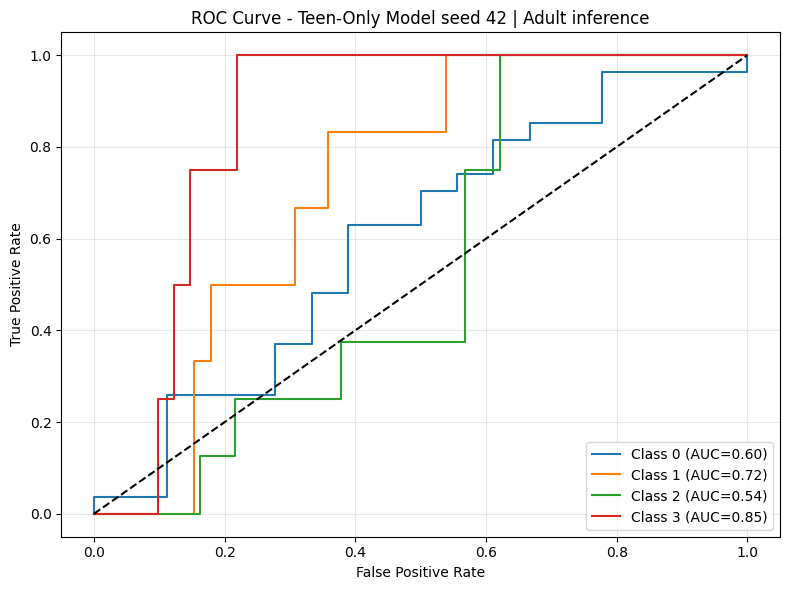


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_model_roc_curves/teen_only_model_seed_42_roc_curve.png

[TESTING] Teen-Only Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/tes

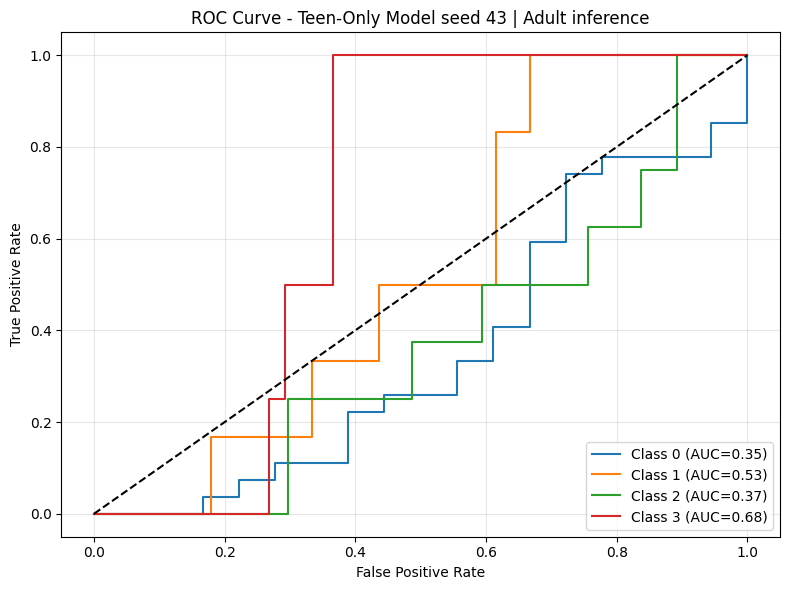


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_model_roc_curves/teen_only_model_seed_43_roc_curve.png

[TESTING] Teen-Only Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/tes

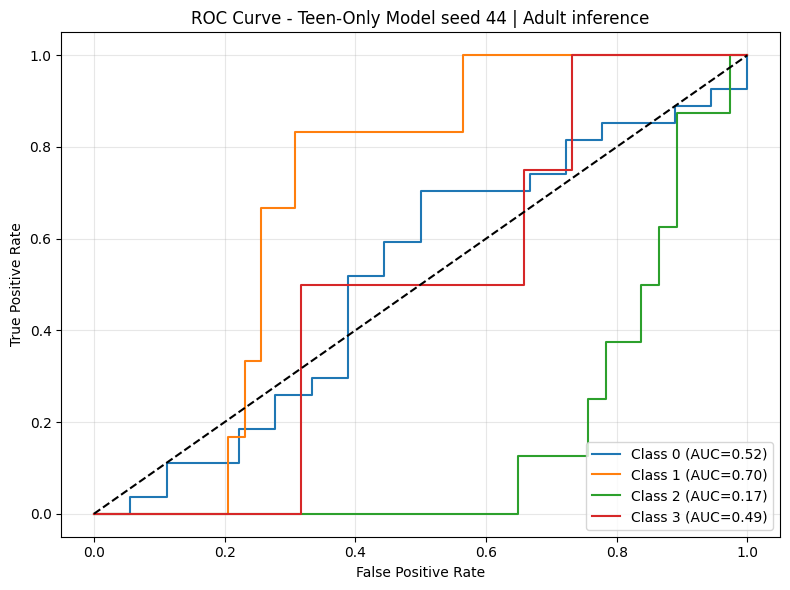


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_model_roc_curves/teen_only_model_seed_44_roc_curve.png

[TESTING] Teen-Only Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/tes

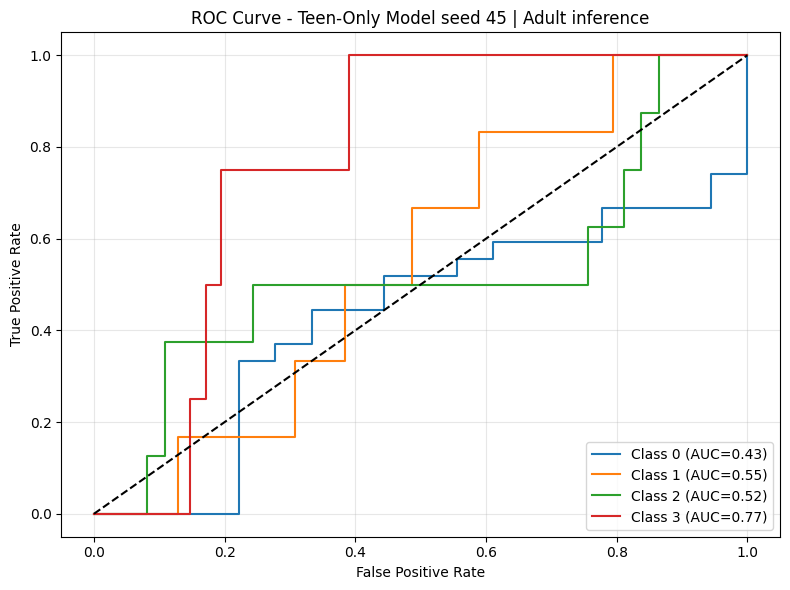


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_model_roc_curves/teen_only_model_seed_45_roc_curve.png

Teen-Only Model | F1 across seeds: [0.4352820512820513, 0.41122040072859745, 0.4296296296296296, 0.42857142857142855]
Teen-Only Model | F1 mean across seeds: 0.4262
Teen-Only Model | F1 std across seeds: 0.009003551453699018
Teen-Only Model | F1 divergence across seeds: 0.021126375113947802
Teen-Only Model | ROC-AUC across seeds: [0.676883712198753, 0.48064134725720087, 0.468965864968575, 0.5693261207319473]
Teen-Only Model | ROC-AUC 

In [91]:
# ============================================================
# 3.4.1.1 Тестируем модель, обученную только на Teen (без смешивания с Adult), на отложенном наборе Adult(0.2) inference
# ============================================================
model_name_teen_fixed_data = "Teen-Only Model"
best_cfg_teen_fixed_data_path = os.path.join(BEST_DIR_TEEN_FIXED_DATA_3, "best_config.json")

with open(best_cfg_teen_fixed_data_path, "r", encoding="utf-8") as f:
    best_cfg_teen_fixed_data = json.load(f)

trial_id_teen_fixed_data = best_cfg_teen_fixed_data.get("trial_id")
if not trial_id_teen_fixed_data:
    raise KeyError("best_config.json for teen model has no 'trial_id'")

# Протестируем лучшую модель Teen по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_teen_only_test = test_best_model_all_seeds(
    best_config=best_cfg_teen_fixed_data,
    best_checkpoint_dir=BEST_DIR_TEEN_FIXED_DATA_3,
    model_name=model_name_teen_fixed_data,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "teen_only_subject_predictions_all_seeds"),
)

#### 3.4.1.2 Тестируем модель, обученную только на Teen (без смешивания с Adult), на отложенном наборе Adult(0.2) inference с ковариатой gender


[TESTING] Teen-Only cov gender Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


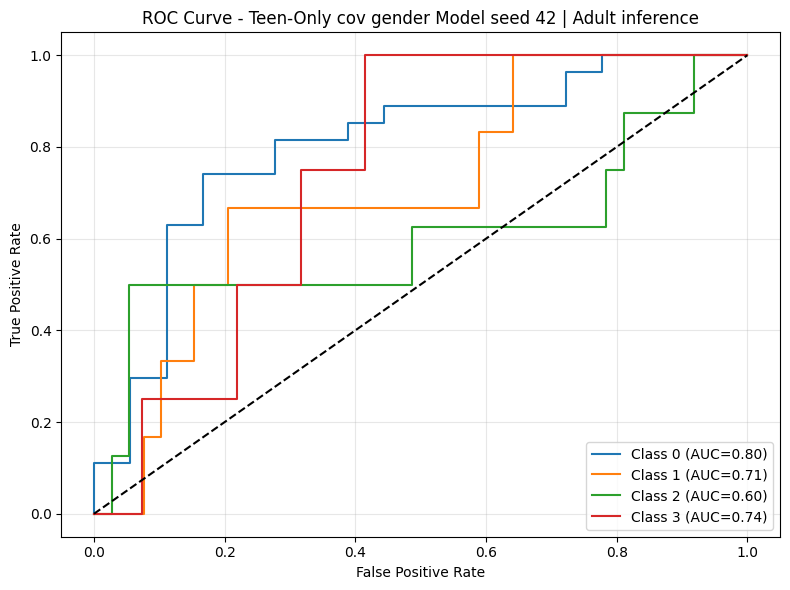


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_roc_curves/teen_only_cov_gender_model_seed_42_roc_curve.png

[TESTING] Teen-Only cov gender Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_da

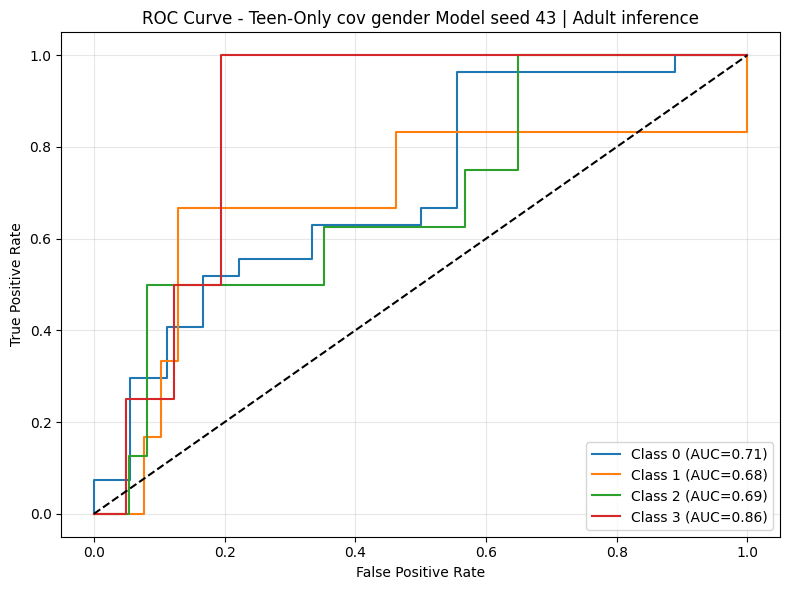


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_roc_curves/teen_only_cov_gender_model_seed_43_roc_curve.png

[TESTING] Teen-Only cov gender Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_da

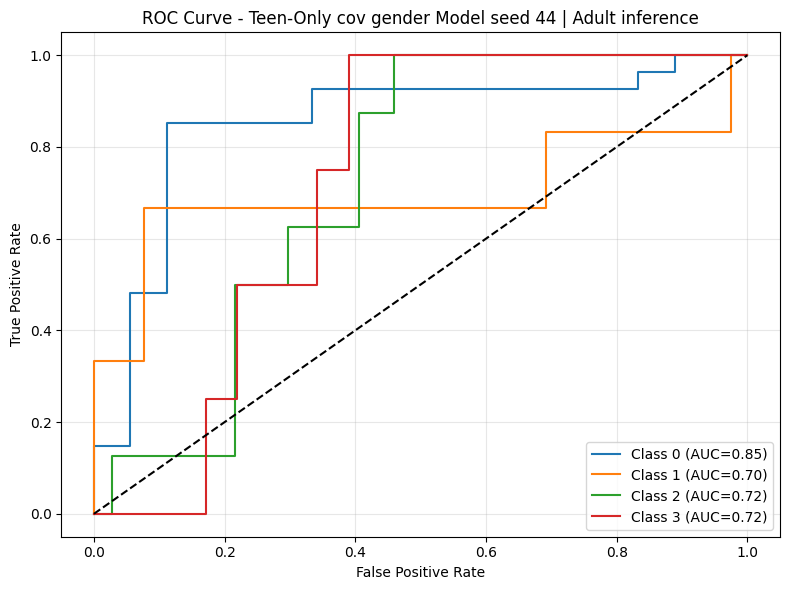


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_roc_curves/teen_only_cov_gender_model_seed_44_roc_curve.png

[TESTING] Teen-Only cov gender Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/teen_cov_gender_search_best_fixed_da

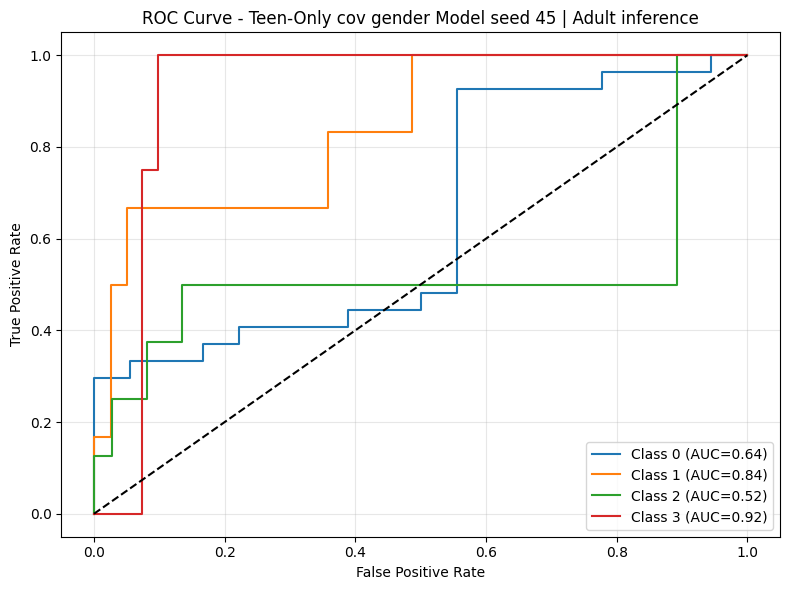


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_only_cov_gender_model_roc_curves/teen_only_cov_gender_model_seed_45_roc_curve.png

Teen-Only cov gender Model | F1 across seeds: [0.47424242424242424, 0.489914066033469, 0.5295238095238095, 0.5114331723027375]
Teen-Only cov gender Model | F1 mean across seeds: 0.5013
Teen-Only cov gender Model | F1 std across seeds: 0.020982222423703952
Teen-Only cov gender Model | F1 divergence across seeds: 0.0418574264561761
Teen-Only cov gender Model | ROC-AUC acr

In [92]:
# ============================================================
# 3.4.1.2 Тестируем модель, обученную только на Teen (без смешивания с Adult), на отложенном наборе Adult(0.2) inference с ковариатой gender
# ============================================================
model_name_teen_cov_gender_data = "Teen-Only cov gender Model"
best_cfg_teen_cov_gender_data_path = os.path.join(BEST_DIR_TEEN_COV_GENDER_3, "best_config.json")

with open(best_cfg_teen_cov_gender_data_path, "r", encoding="utf-8") as f:
    best_cfg_teen_cov_gender_data = json.load(f)

trial_id_teen_cov_gender_data = best_cfg_teen_cov_gender_data.get("trial_id")
if not trial_id_teen_cov_gender_data:
    raise KeyError("best_config.json for teen cov gender model has no 'trial_id'")

# Протестируем лучшую модель Teen по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_teen_cov_gender_test = test_best_model_all_seeds(
    best_config=best_cfg_teen_fixed_data,
    best_checkpoint_dir=BEST_DIR_TEEN_COV_GENDER_3,
    model_name=model_name_teen_cov_gender_data,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_cov_gender_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=experiment_3_data_loader_for_search_adult_0_2_cov_gender_sampler_inference.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "teen_only_cov_gender_subject_predictions_all_seeds"),
)

#### 3.4.3 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.2), на отложенном наборе Adult(0.2) inference


[TESTING] Teen+Adult(0.2) Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/teen_adult_0_2_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


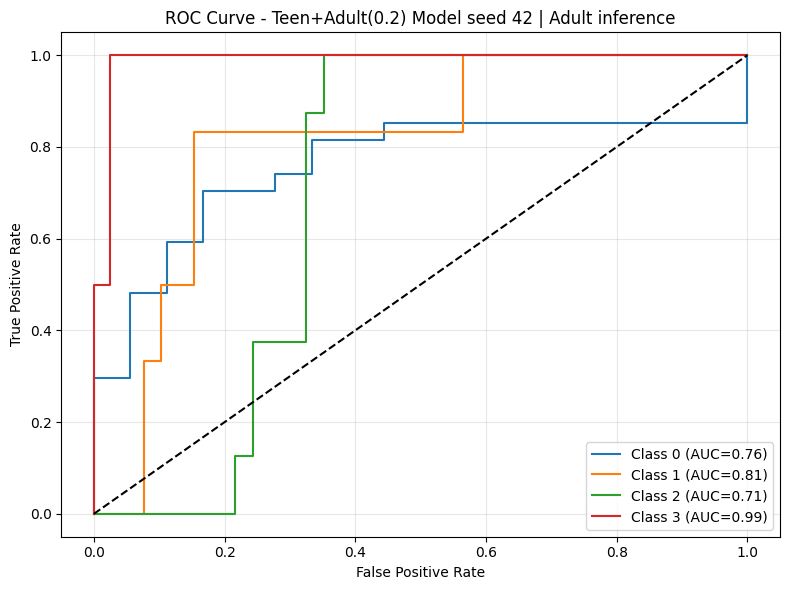


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_roc_curves/teen_adult(0.2)_model_seed_42_roc_curve.png

[TESTING] Teen+Adult(0.2) Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
[SUBJECT RES

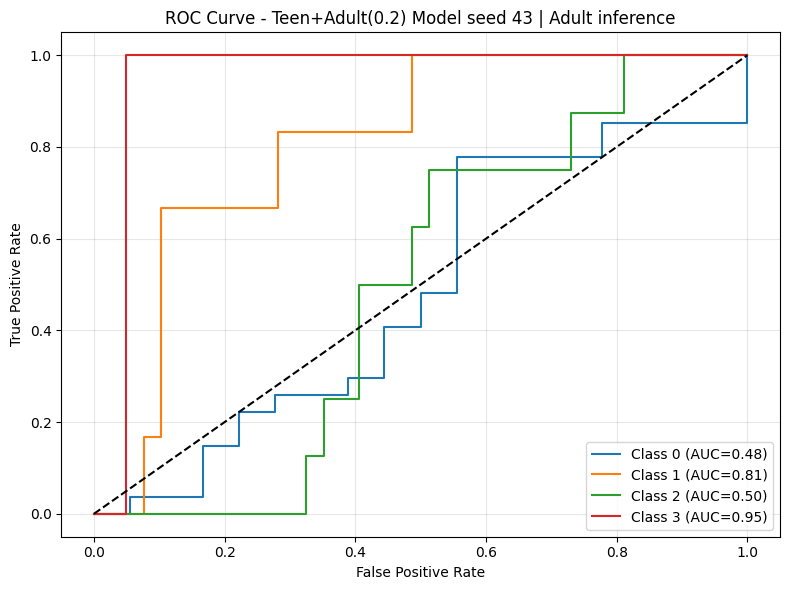


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_roc_curves/teen_adult(0.2)_model_seed_43_roc_curve.png

[TESTING] Teen+Adult(0.2) Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
[SUBJECT RES

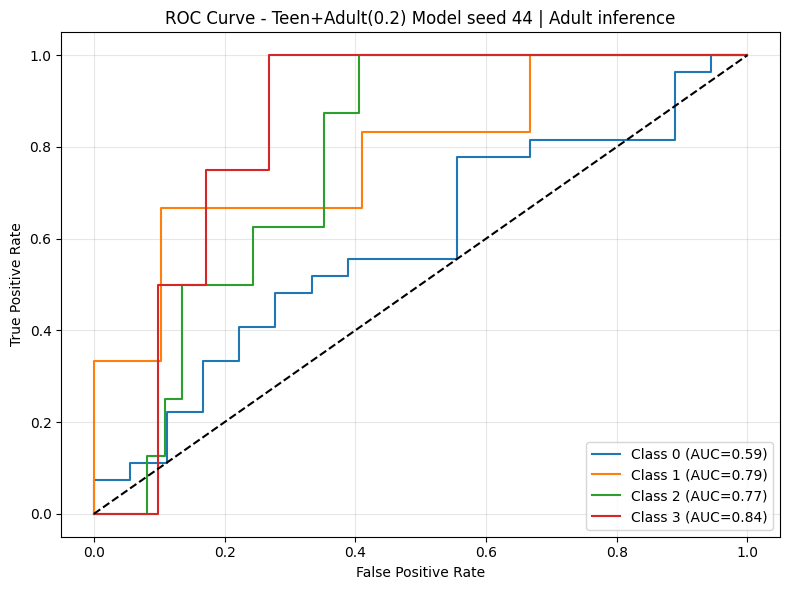


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_roc_curves/teen_adult(0.2)_model_seed_44_roc_curve.png

[TESTING] Teen+Adult(0.2) Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
[SUBJECT RES

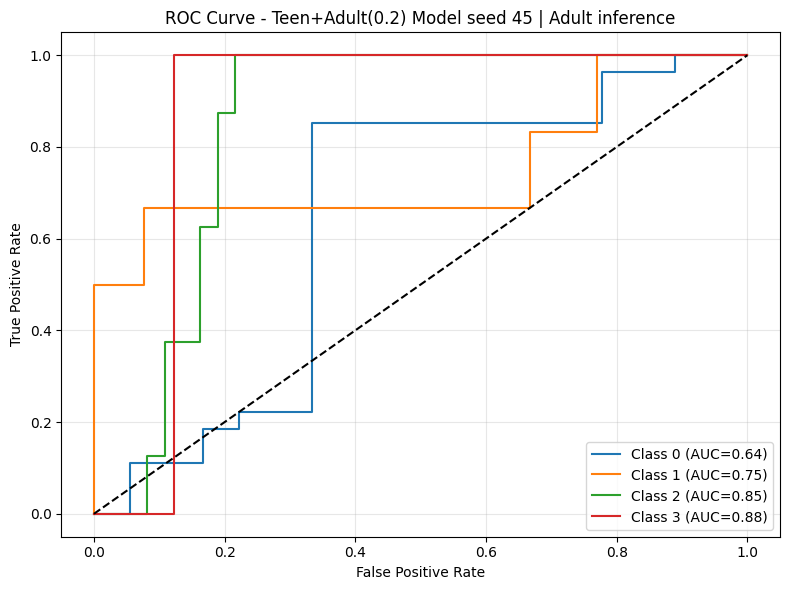


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_roc_curves/teen_adult(0.2)_model_seed_45_roc_curve.png

Teen+Adult(0.2) Model | F1 across seeds: [0.46262626262626266, 0.5618895724158881, 0.4969175627240144, 0.5118279569892473]
Teen+Adult(0.2) Model | F1 mean across seeds: 0.5083
Teen+Adult(0.2) Model | F1 std across seeds: 0.0357069250116874
Teen+Adult(0.2) Model | F1 divergence across seeds: 0.07024561781627468
Teen+Adult(0.2) Model | ROC-AUC across seeds: [0.8162777575887332, 0.6842537307476332, 0.7

In [93]:
# ============================================================
# 3.4.3 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.2), на отложенном наборе Adult(0.2) inference
# ============================================================
model_name_mixed_fixed_data = "Teen+Adult(0.2) Model"
best_cfg_mixed_fixed_data_path = os.path.join(BEST_DIR_MIXED_FIXED_DATA_3, "best_config.json")

with open(best_cfg_mixed_fixed_data_path, "r", encoding="utf-8") as f:
    best_cfg_mixed_fixed_data = json.load(f)
trial_id_mixed_fixed_data = best_cfg_mixed_fixed_data.get("trial_id")
if not trial_id_mixed_fixed_data:
    raise KeyError("best_config.json for mixed model has no 'trial_id'")

result_mixed_fixed_data = test_best_model_all_seeds(
    best_config=best_cfg_mixed_fixed_data,
    best_checkpoint_dir=BEST_DIR_MIXED_FIXED_DATA_3,
    model_name=model_name_mixed_fixed_data,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "teen_adult_0_2_subject_predictions_all_seeds"),
)

#### 3.4.3.1 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.2), на отложенном наборе Adult(0.2) inference с ковариатой по полу (gender)


[TESTING] Teen+Adult(0.2) Model covariate gender seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/teen_adult_0_2_cov_gender_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


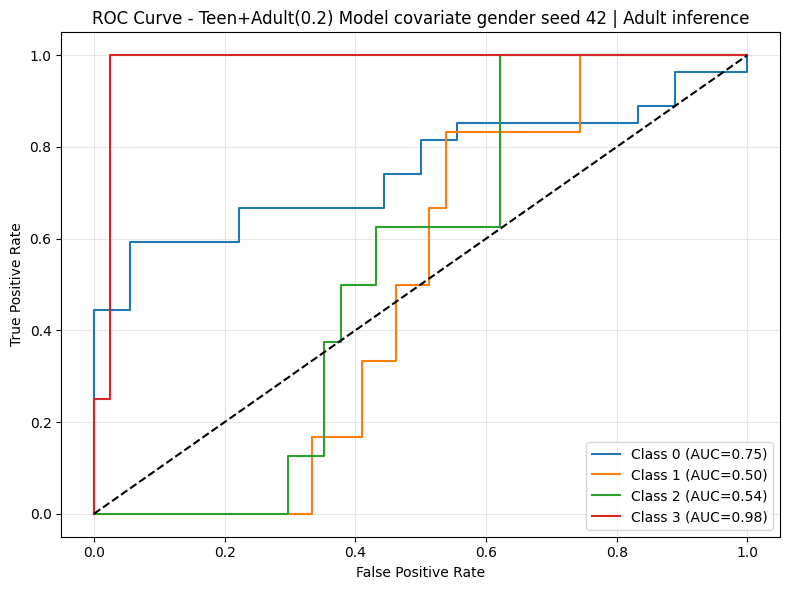


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_roc_curves/teen_adult(0.2)_model_covariate_gender_seed_42_roc_curve.png

[TESTING] Teen+Adult(0.2) Model covariate gender seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed43_best_m

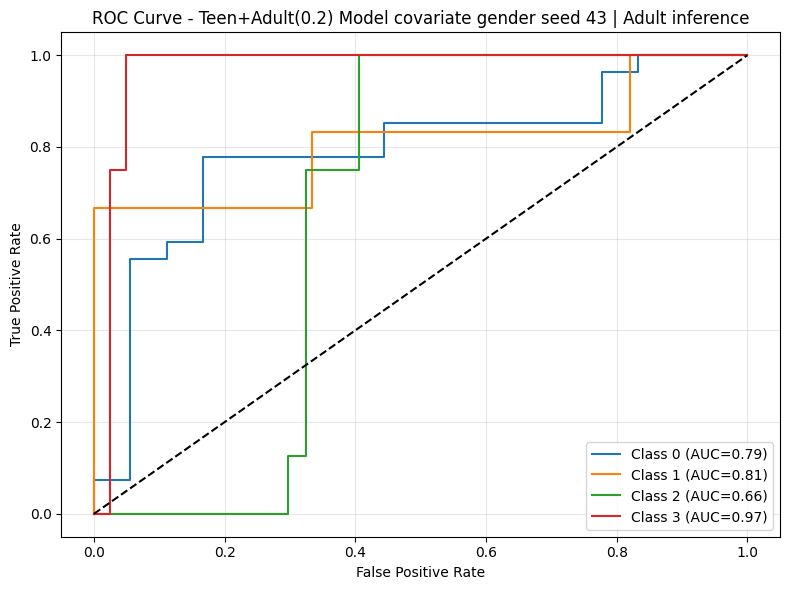


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_roc_curves/teen_adult(0.2)_model_covariate_gender_seed_43_roc_curve.png

[TESTING] Teen+Adult(0.2) Model covariate gender seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed44_best_m

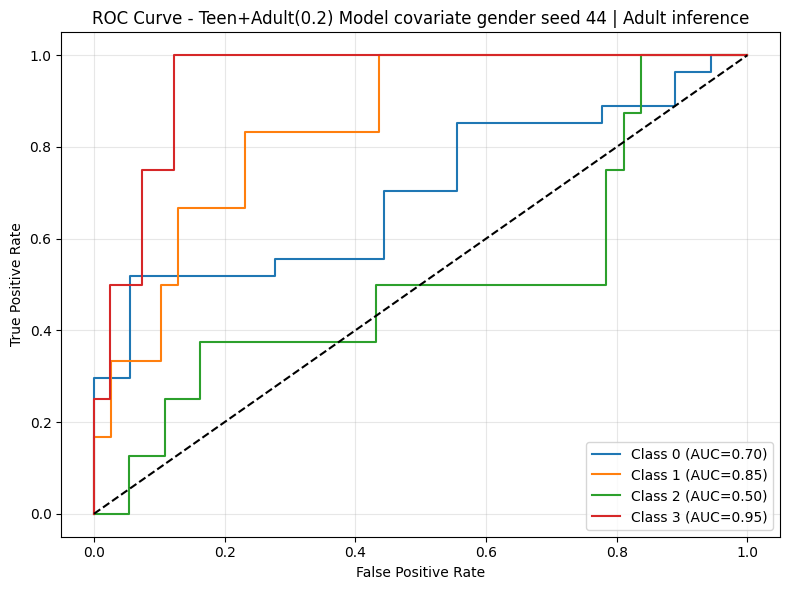


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_roc_curves/teen_adult(0.2)_model_covariate_gender_seed_44_roc_curve.png

[TESTING] Teen+Adult(0.2) Model covariate gender seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_search_best_fixed_data/roiseq_91e55f989e_seed45_best_m

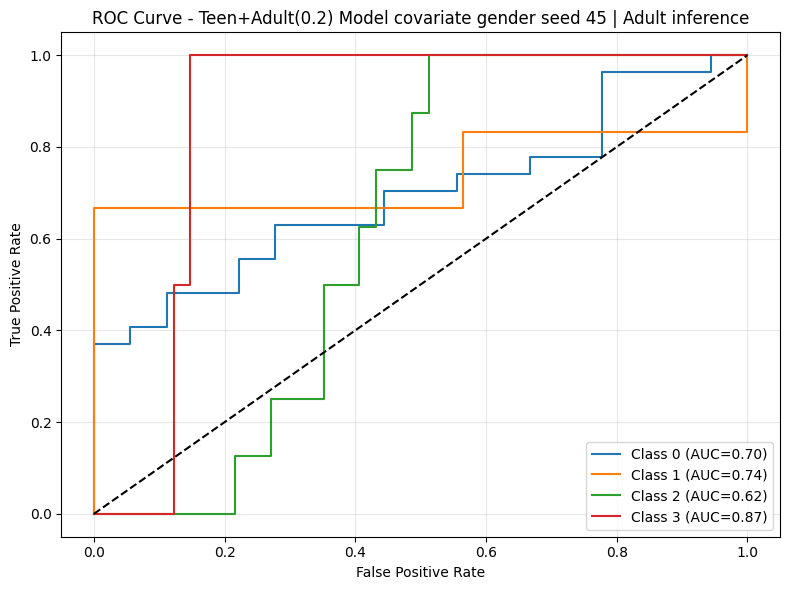


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_model_covariate_gender_roc_curves/teen_adult(0.2)_model_covariate_gender_seed_45_roc_curve.png

Teen+Adult(0.2) Model covariate gender | F1 across seeds: [0.45, 0.5133012820512821, 0.4959549411162314, 0.518840579710145]
Teen+Adult(0.2) Model covariate gender | F1 mean across seeds: 0.4945
Teen+Adult(0.2) Model covariate gender | F1 std across seeds: 0.02705696092667376
Teen+Adult(0.2) Model co

In [94]:
# ============================================================
# 3.4.3.1 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.2), на отложенном наборе Adult(0.2) inference с ковариатой по полу (gender)
# ============================================================
model_name_mixed_cov_gender = "Teen+Adult(0.2) Model covariate gender"
best_cfg_mixed_cov_gender_path = os.path.join(BEST_DIR_MIXED_COV_GENDER_3, "best_config.json")

with open(best_cfg_mixed_cov_gender_path, "r", encoding="utf-8") as f:
    best_cfg_mixed_cov_gender = json.load(f)
trial_id_mixed_cov_gender = best_cfg_mixed_cov_gender.get("trial_id")
if not trial_id_mixed_cov_gender:
    raise KeyError("best_config.json for mixed model has no 'trial_id'")

result_mixed_cov_gender = test_best_model_all_seeds(
    best_config=best_cfg_mixed_cov_gender,
    best_checkpoint_dir=BEST_DIR_MIXED_COV_GENDER_3,
    model_name=model_name_mixed_cov_gender,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_cov_gender_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "teen_adult_0_2_cov_gender_subject_predictions_all_seeds"),
)

#### 3.4.4 Тестирование модели, обученной на смешанном датасете Children + Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с исправленным датасетом


[TESTING] Children+Teen+Adult Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_0_8_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


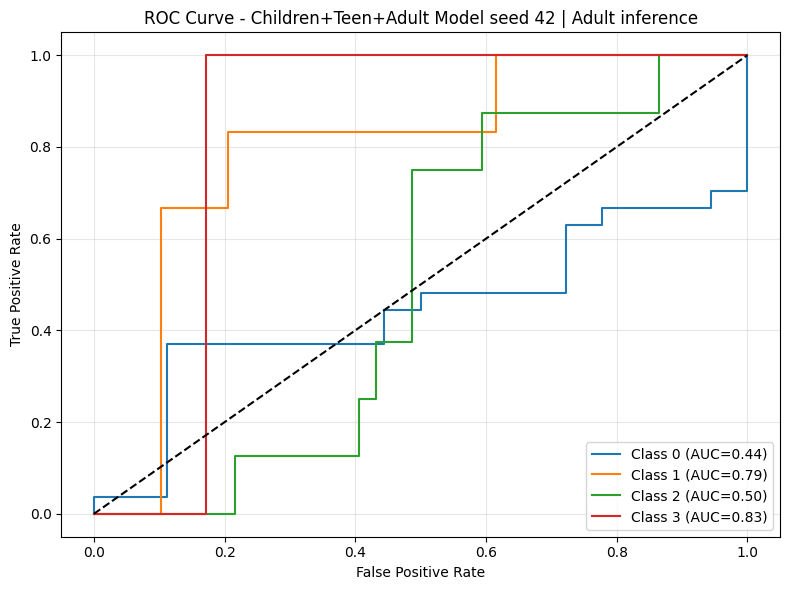


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_model_roc_curves/children_teen_adult_model_seed_42_roc_curve.png

[TESTING] Children+Teen+Adult Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_

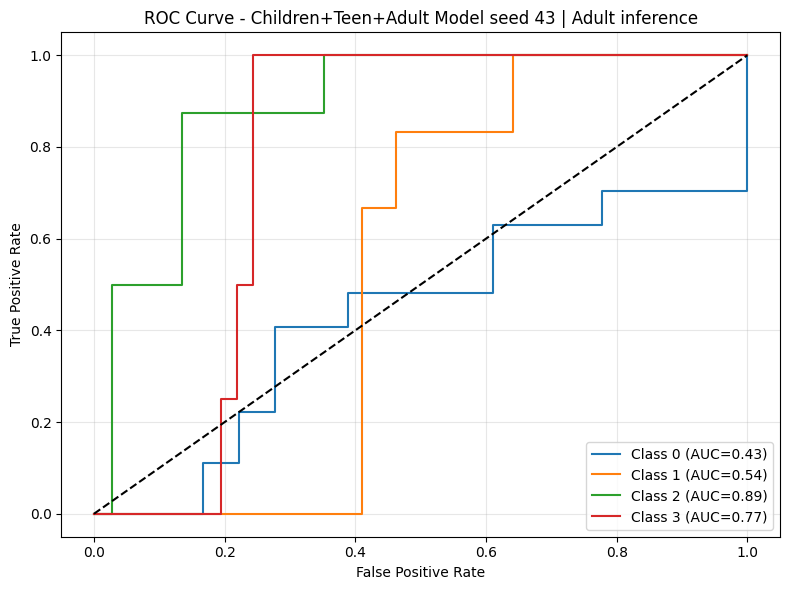


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_model_roc_curves/children_teen_adult_model_seed_43_roc_curve.png

[TESTING] Children+Teen+Adult Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_

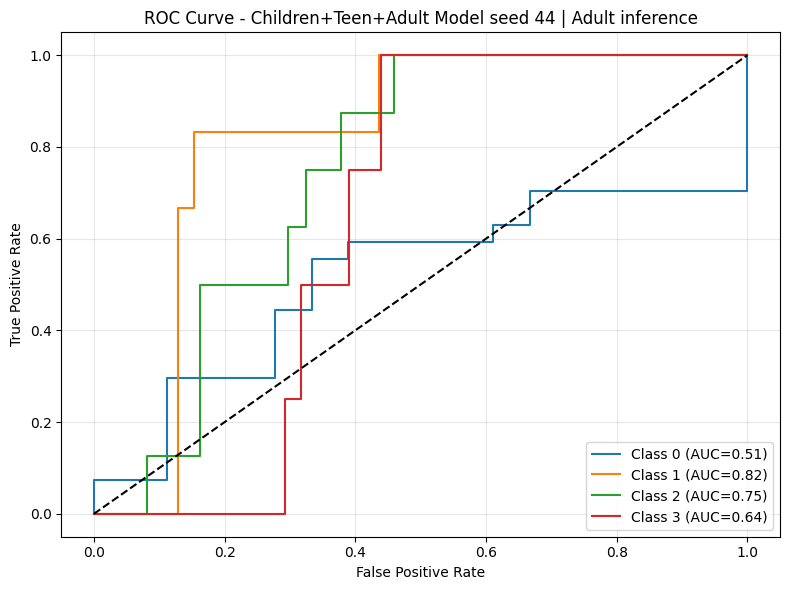


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_model_roc_curves/children_teen_adult_model_seed_44_roc_curve.png

[TESTING] Children+Teen+Adult Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_search_

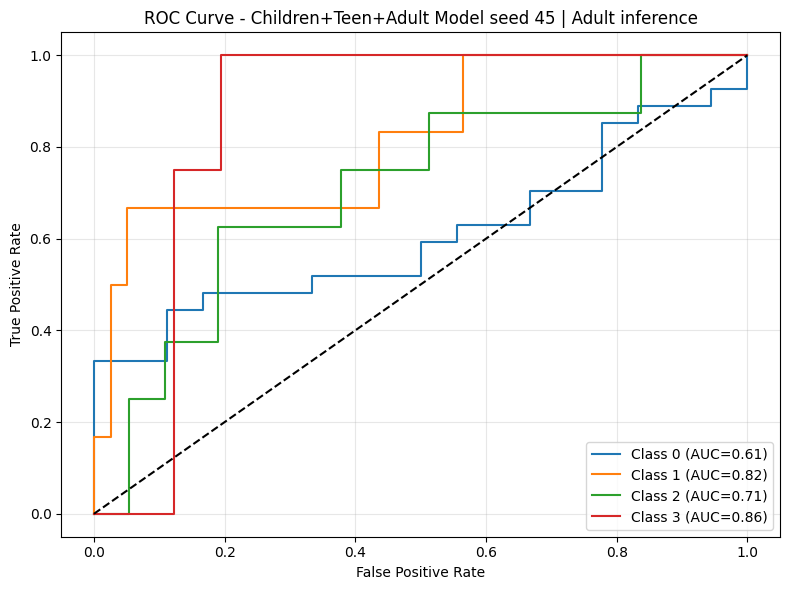


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_model_roc_curves/children_teen_adult_model_seed_45_roc_curve.png

Children+Teen+Adult Model | F1 across seeds: [0.36923076923076925, 0.3661016949152543, 0.47153482082488174, 0.4696330991412958]
Children+Teen+Adult Model | F1 mean across seeds: 0.4191
Children+Teen+Adult Model | F1 std across seeds: 0.051475145808170274
Children+Teen+Adult Model | F1 divergence across seeds: 0.12281570895178574
Children+Teen+Adult Model | ROC-AUC across seed

In [95]:
# ============================================================
# 3.4.4 Тестирование модели, обученной на смешанном датасете Children + Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с исправленным датасетом
# ============================================================
model_name_mixed_children_teen_adult_fixed_data = "Children+Teen+Adult Model"
best_cfg_mixed_children_teen_adult_fixed_data_path = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3, "best_config.json")

with open(best_cfg_mixed_children_teen_adult_fixed_data_path, "r", encoding="utf-8") as f:
    best_cfg_mixed_children_teen_adult_fixed_data = json.load(f)
trial_id_mixed_children_teen_adult_fixed_data = best_cfg_mixed_children_teen_adult_fixed_data.get("trial_id")
if not trial_id_mixed_children_teen_adult_fixed_data:
    raise KeyError("best_config.json for mixed model has no 'trial_id'")

result_mixed_children_teen_adult_fixed_data = test_best_model_all_seeds(
    best_config=best_cfg_mixed_children_teen_adult_fixed_data,
    best_checkpoint_dir=BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_FIXED_DATA_3,
    model_name=model_name_mixed_children_teen_adult_fixed_data,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "children_teen_adult_0_8_subject_predictions_all_seeds"),
)

#### 3.4.4.1 Тестирование модели, обученной на смешанном датасете Children + Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с ковариатой gender


[TESTING] Children+Teen+Adult cov gender Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_cov_gender_search_best/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_cov_gender_search_best/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_0_8_subject_predictions_all_seeds_cov_gender/roiseq_91e55f989e_seed42_subject_predictions.csv


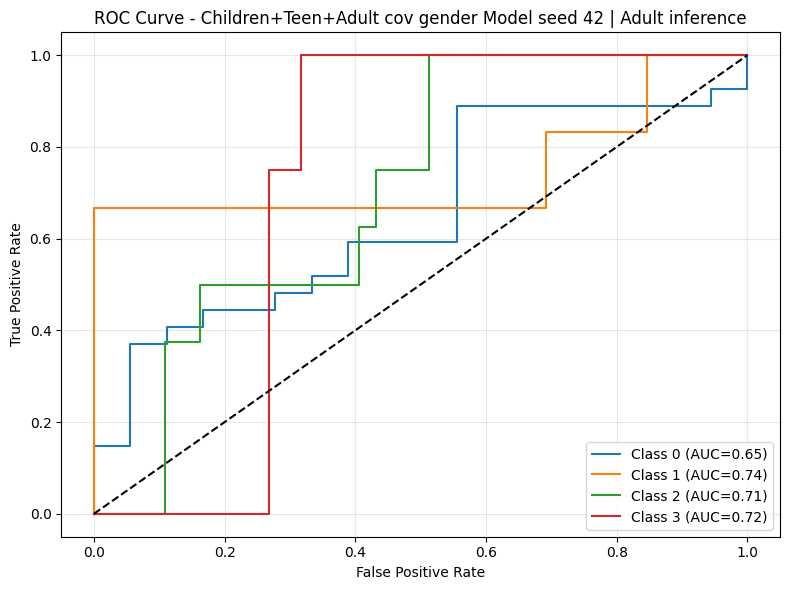


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_roc_curves/children_teen_adult_cov_gender_model_seed_42_roc_curve.png

[TESTING] Children+Teen+Adult cov gender Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_cov_gender_search_best/roiseq_91e55f989e_seed43_best_model.

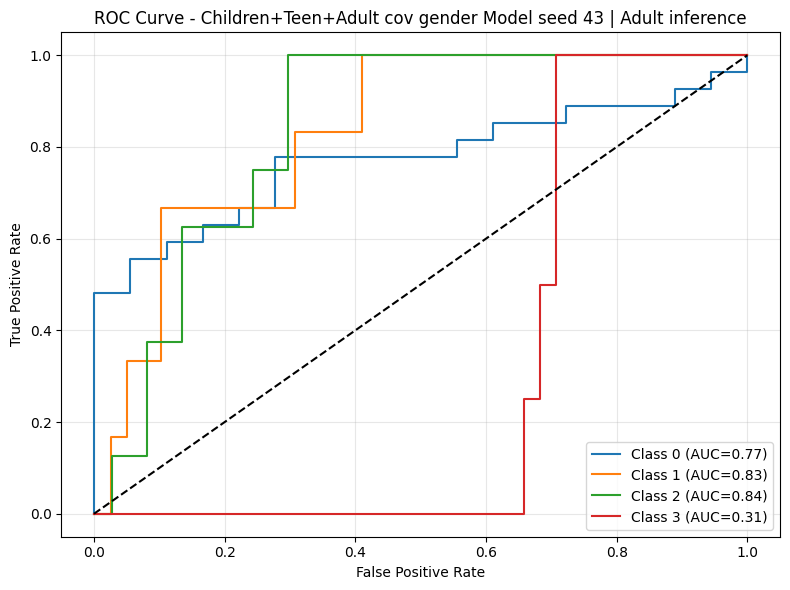


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_roc_curves/children_teen_adult_cov_gender_model_seed_43_roc_curve.png

[TESTING] Children+Teen+Adult cov gender Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_cov_gender_search_best/roiseq_91e55f989e_seed44_best_model.

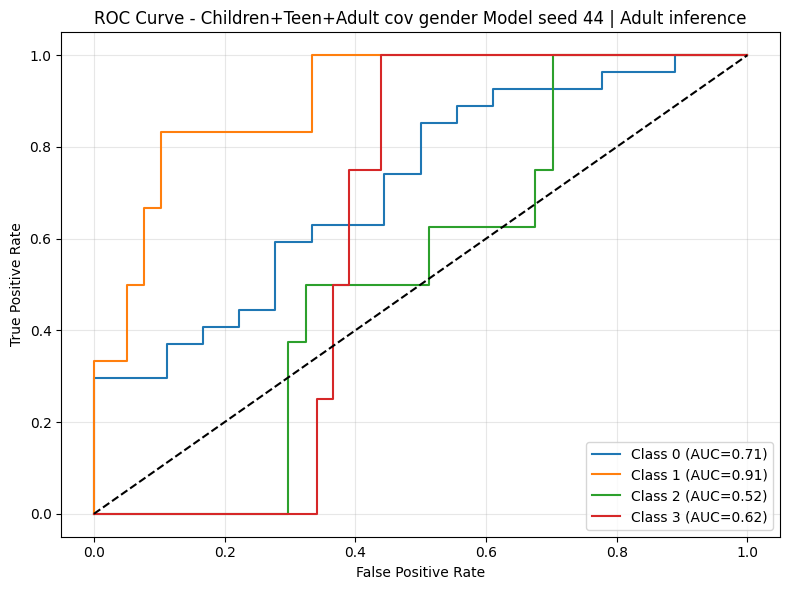


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_roc_curves/children_teen_adult_cov_gender_model_seed_44_roc_curve.png

[TESTING] Children+Teen+Adult cov gender Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_children_teen_adult_cov_gender_search_best/roiseq_91e55f989e_seed45_best_model.

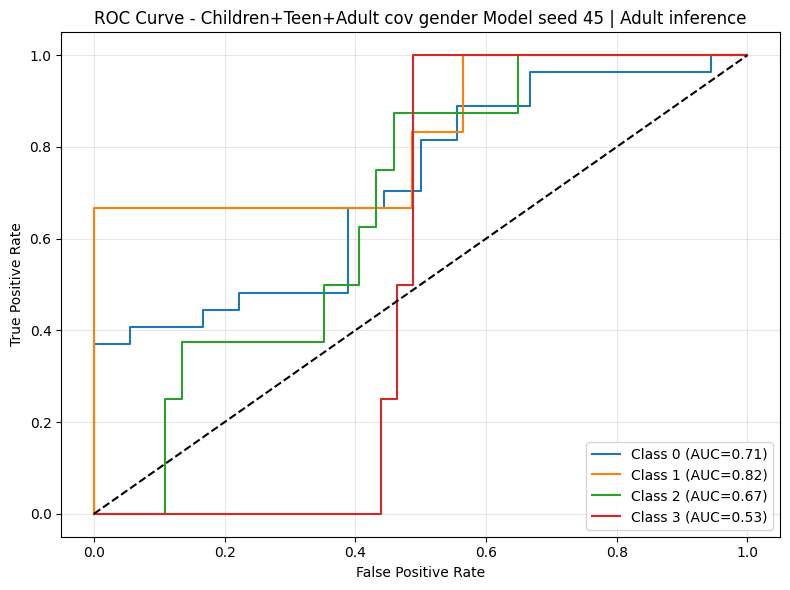


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/children_teen_adult_cov_gender_model_roc_curves/children_teen_adult_cov_gender_model_seed_45_roc_curve.png

Children+Teen+Adult cov gender Model | F1 across seeds: [0.5011494252873564, 0.4906231094978827, 0.5218390804597701, 0.4583408206049715]
Children+Teen+Adult cov gender Model | F1 mean across seeds: 0.4930
Children+Teen+Adult cov gender Model | F1 std across seeds: 0.022940212801367117
Children+Teen+Adult cov ge

In [96]:
# ============================================================
# 3.4.4.1 Тестирование модели, обученной на смешанном датасете Children + Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с ковариатой gender
# ============================================================
model_name_mixed_children_teen_adult_cov_gender = "Children+Teen+Adult cov gender Model"
best_cfg_mixed_children_teen_adult_cov_gender_path = os.path.join(BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3, "best_config.json")

with open(best_cfg_mixed_children_teen_adult_cov_gender_path, "r", encoding="utf-8") as f:
    best_cfg_mixed_children_teen_adult_cov_gender = json.load(f)
trial_id_mixed_children_teen_adult_cov_gender = best_cfg_mixed_children_teen_adult_cov_gender.get("trial_id")
if not trial_id_mixed_children_teen_adult_cov_gender:
    raise KeyError("best_config.json for mixed model has no 'trial_id'")

result_mixed_children_teen_adult_cov_gender = test_best_model_all_seeds(
    best_config=best_cfg_mixed_children_teen_adult_cov_gender,
    best_checkpoint_dir=BEST_DIR_MIXED_CHILDREN_TEEN_ADULT_COV_GENDER_3,
    model_name=model_name_mixed_children_teen_adult_cov_gender,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_cov_gender_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=experiment_3_data_loader_for_search_adult_0_2_cov_gender_sampler_inference.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "children_teen_adult_0_8_subject_predictions_all_seeds_cov_gender"),
)

#### 3.4.5 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с исправленным датасетом


[TESTING] Teen+Adult(0.8) Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/teen_adult_0_8_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


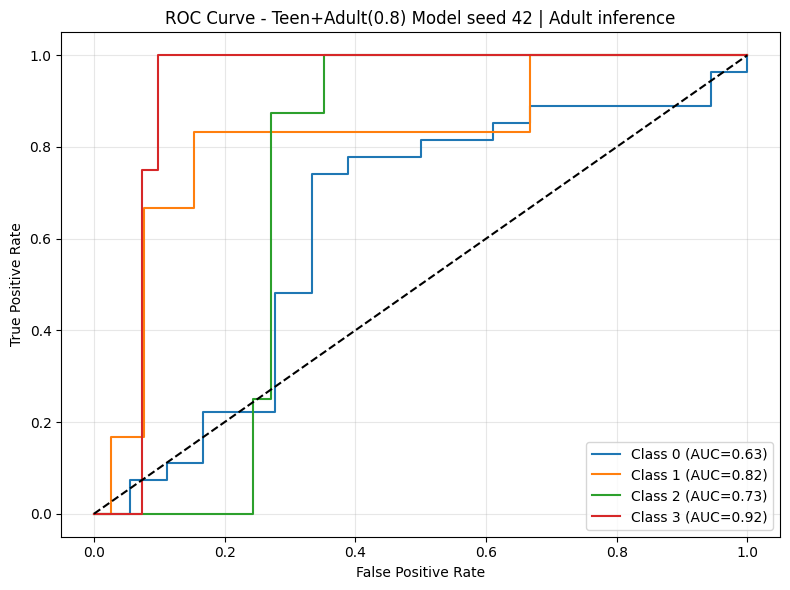


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_roc_curves/teen_adult(0.8)_model_seed_42_roc_curve.png

[TESTING] Teen+Adult(0.8) Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed43_best_

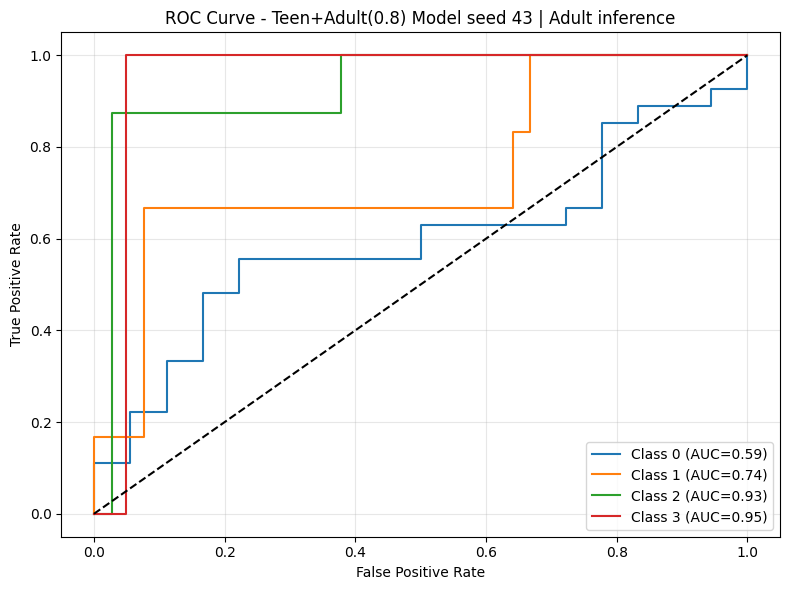


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_roc_curves/teen_adult(0.8)_model_seed_43_roc_curve.png

[TESTING] Teen+Adult(0.8) Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed44_best_

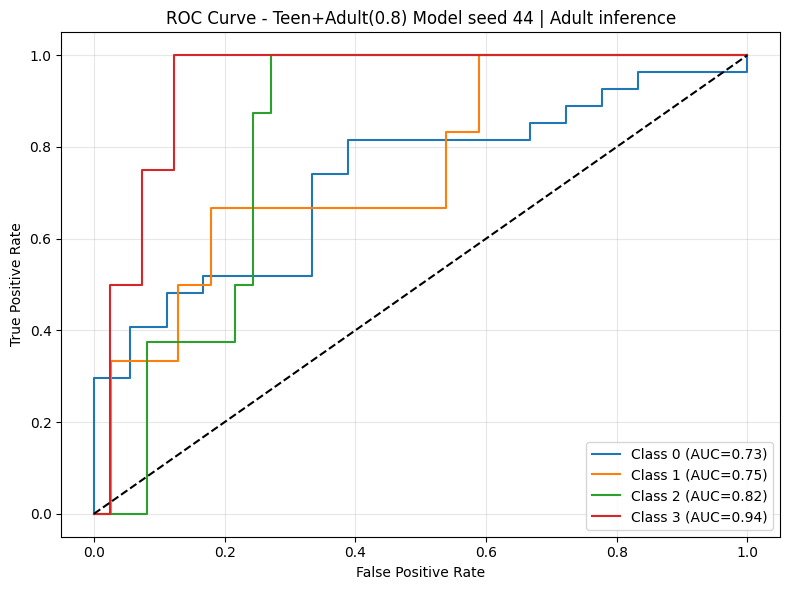


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_roc_curves/teen_adult(0.8)_model_seed_44_roc_curve.png

[TESTING] Teen+Adult(0.8) Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed45_best_

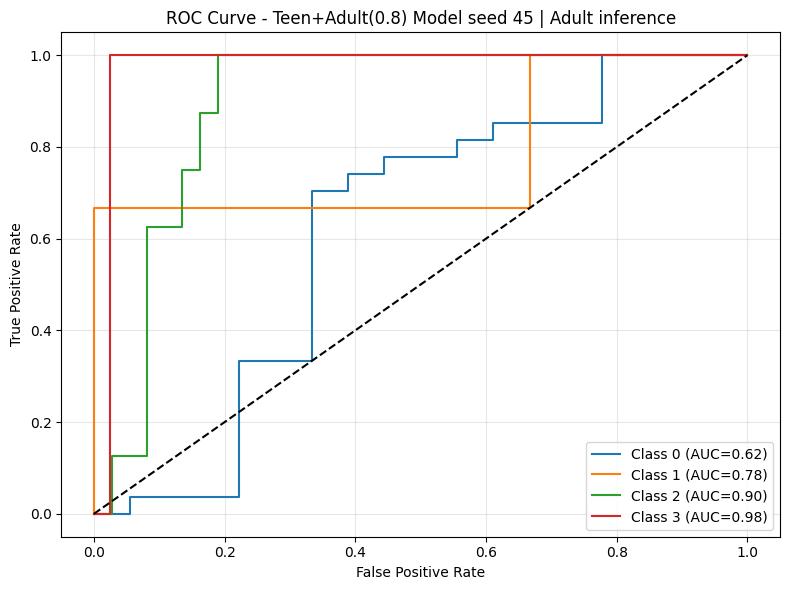


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_roc_curves/teen_adult(0.8)_model_seed_45_roc_curve.png

Teen+Adult(0.8) Model | F1 across seeds: [0.5253478523895947, 0.43128247197156133, 0.5164912280701754, 0.4827404479578392]
Teen+Adult(0.8) Model | F1 mean across seeds: 0.4890
Teen+Adult(0.8) Model | F1 std across seeds: 0.03690333408599805
Teen+Adult(0.8) Model | F1 divergence across seeds: 0.07547226558653965
Teen+Adult(0.8) Model | ROC-AUC across seeds: [0.7737919739105377, 0.804113975607878, 0.8

In [97]:
# ============================================================
# 3.4.5 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с исправленным датасетом
# ============================================================
model_name_mixed_teen_adult_0_8_fixed_data = "Teen+Adult(0.8) Model"
best_cfg_mixed_teen_adult_0_8_fixed_data_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3, "best_config.json")

with open(best_cfg_mixed_teen_adult_0_8_fixed_data_path, "r", encoding="utf-8") as f:
    best_cfg_mixed_teen_adult_0_8_fixed_data = json.load(f)
trial_id_mixed_teen_adult_0_8_fixed_data = best_cfg_mixed_teen_adult_0_8_fixed_data.get("trial_id")
if not trial_id_mixed_teen_adult_0_8_fixed_data:
    raise KeyError("best_config.json for mixed model has no 'trial_id'")

result_mixed_teen_adult_0_8_fixed_data = test_best_model_all_seeds(
    best_config=best_cfg_mixed_teen_adult_0_8_fixed_data,
    best_checkpoint_dir=BEST_DIR_MIXED_TEEN_ADULT_FIXED_DATA_3,
    model_name=model_name_mixed_teen_adult_0_8_fixed_data,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "teen_adult_0_8_subject_predictions_all_seeds"),
)

#### 3.4.5.1 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с исправленным датасетом и ковариатой по полу (gender)


[TESTING] Teen+Adult(0.8) Model covariate gender seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_teen_adult_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/teen_adult_0_8_cov_gender_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


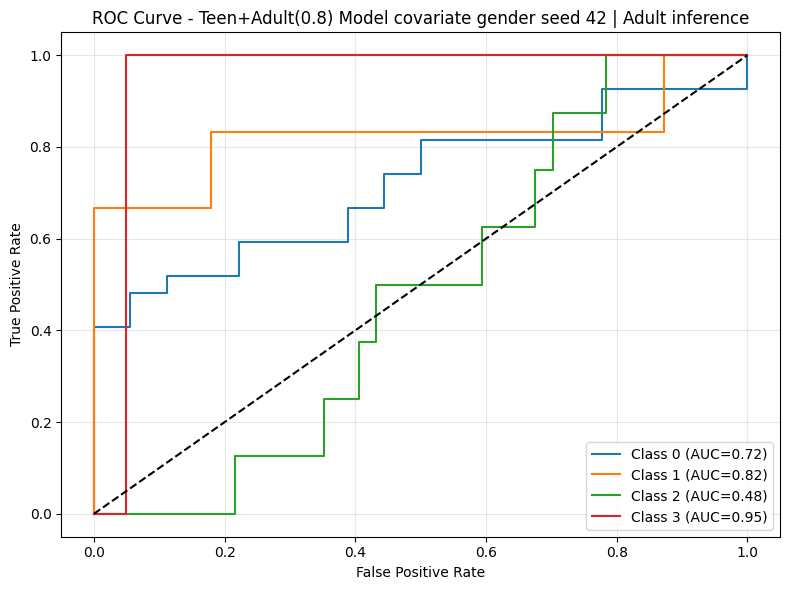


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_roc_curves/teen_adult(0.8)_model_covariate_gender_seed_42_roc_curve.png

[TESTING] Teen+Adult(0.8) Model covariate gender seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_teen_adult_search_best_fixed_data/roiseq_91e55f989e_se

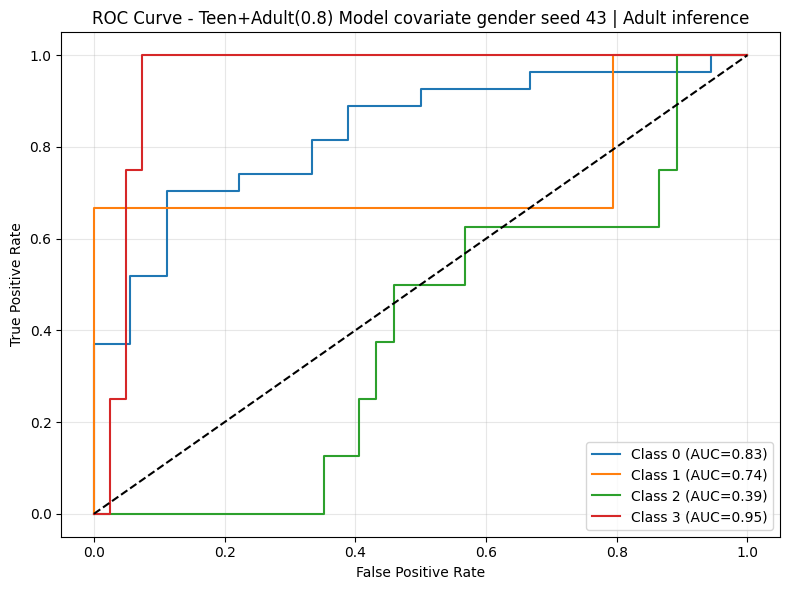


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_roc_curves/teen_adult(0.8)_model_covariate_gender_seed_43_roc_curve.png

[TESTING] Teen+Adult(0.8) Model covariate gender seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_teen_adult_search_best_fixed_data/roiseq_91e55f989e_se

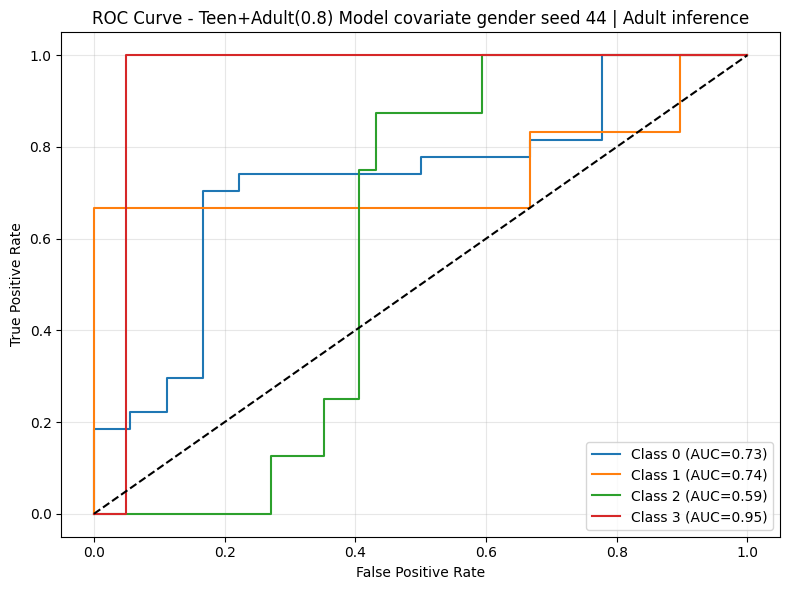


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_roc_curves/teen_adult(0.8)_model_covariate_gender_seed_44_roc_curve.png

[TESTING] Teen+Adult(0.8) Model covariate gender seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_cov_gender_teen_adult_search_best_fixed_data/roiseq_91e55f989e_se

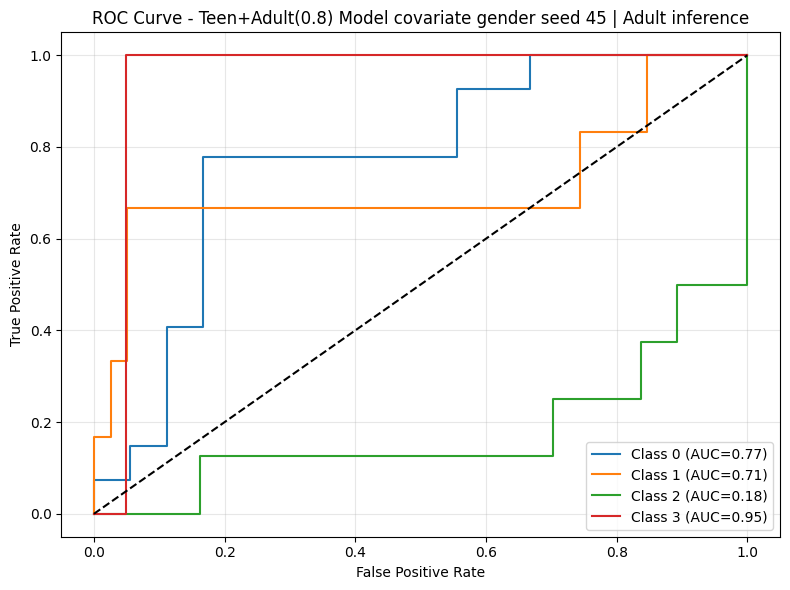


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.8)_model_covariate_gender_roc_curves/teen_adult(0.8)_model_covariate_gender_seed_45_roc_curve.png

Teen+Adult(0.8) Model covariate gender | F1 across seeds: [0.5256565656565656, 0.6065993265993266, 0.5322751322751322, 0.597037037037037]
Teen+Adult(0.8) Model covariate gender | F1 mean across seeds: 0.5654
Teen+Adult(0.8) Model covariate gender | F1 std across seeds: 0.03665748151778106
Teen+Adult

In [98]:
# ============================================================
# 3.4.5.1 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.8), на отложенном наборе Adult(0.2) inference с ковариатой по полу (gender)
# ============================================================
model_name_mixed_teen_adult_0_8_cov_gender = "Teen+Adult(0.8) Model covariate gender"
best_cfg_mixed_teen_adult_0_8_cov_gender_path = os.path.join(BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3, "best_config.json")

with open(best_cfg_mixed_teen_adult_0_8_cov_gender_path, "r", encoding="utf-8") as f:
    best_cfg_mixed_teen_adult_0_8_cov_gender = json.load(f)
trial_id_mixed_teen_adult_0_8_cov_gender = best_cfg_mixed_teen_adult_0_8_cov_gender.get("trial_id")
if not trial_id_mixed_teen_adult_0_8_cov_gender:
    raise KeyError("best_config.json for mixed model has no 'trial_id'")

result_mixed_teen_adult_0_8_cov_gender = test_best_model_all_seeds(
    best_config=best_cfg_mixed_teen_adult_0_8_cov_gender,
    best_checkpoint_dir=BEST_DIR_MIXED_TEEN_ADULT_0_8_COV_GENDER_3,
    model_name=model_name_mixed_teen_adult_0_8_cov_gender,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_cov_gender_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "teen_adult_0_8_cov_gender_subject_predictions_all_seeds"),
)

#### 3.4.6 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.2), на отложенном наборе Adult(0.8)


[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/teen_adult_0_2_inf_on_adult_rest_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


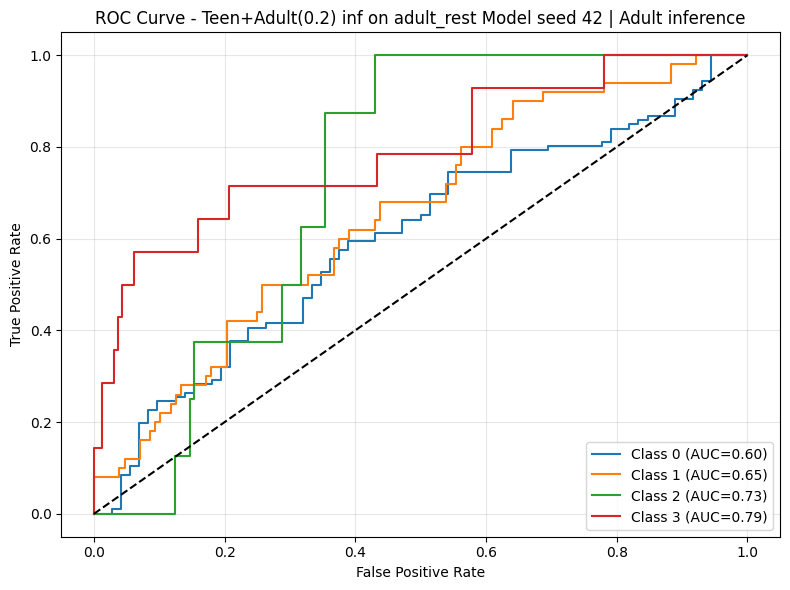


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_roc_curve.png

[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed43_best_model.pth
Загружены веса модели из чекпой

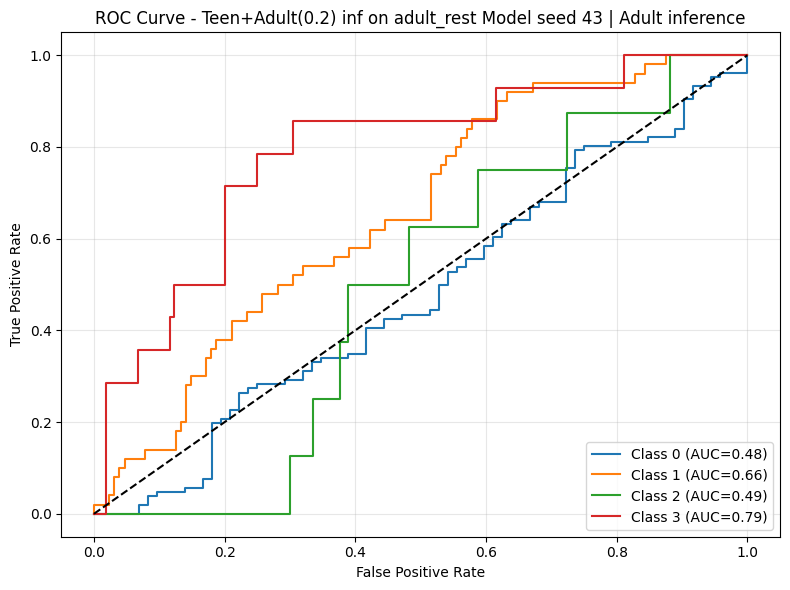


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_roc_curve.png

[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed44_best_model.pth
Загружены веса модели из чекпой

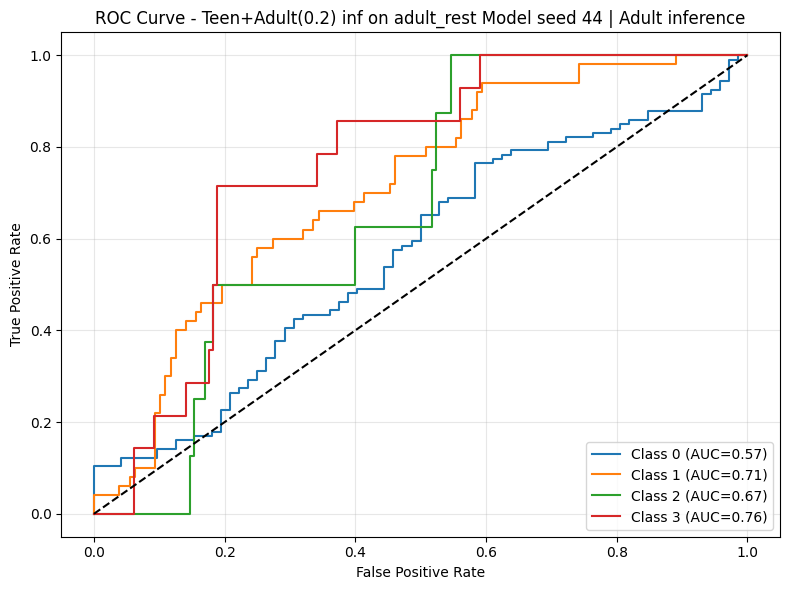


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_roc_curve.png

[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/mixed_search_best_fixed_data/roiseq_91e55f989e_seed45_best_model.pth
Загружены веса модели из чекпой

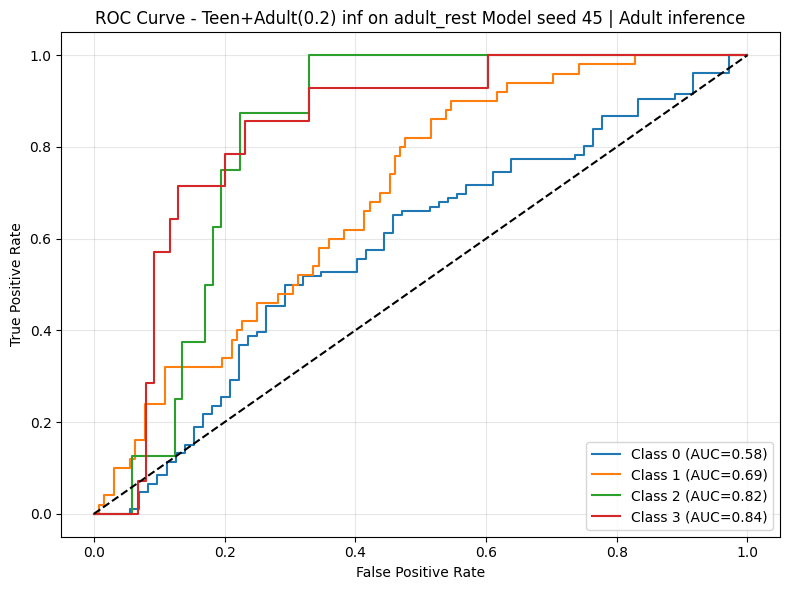


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_roc_curve.png

Teen+Adult(0.2) inf on adult_rest Model | F1 across seeds: [0.5092728283389762, 0.5285045478865704, 0.5511523458747105, 0.5055839337986653]
Teen+Adult(0.2) inf on adult_rest Model | F1 mean across seeds: 0.5236
Teen+Adult(0.2) inf on adult_rest Model | F1 std across seeds: 0.01811787524056572


In [99]:
# ============================================================
# 3.4.6 Тестирование модели, обученной на смешанном датасете Teen + Adult(0.2), на отложенном наборе Adult(0.8)
# ============================================================
model_name_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data = "Teen+Adult(0.2) inf on adult_rest Model"
best_cfg_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data_path = os.path.join(BEST_DIR_MIXED_FIXED_DATA_3, "best_config.json")

with open(best_cfg_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data_path, "r", encoding="utf-8") as f:
    best_cfg_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data = json.load(f)
trial_id_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data = best_cfg_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data.get("trial_id")
if not trial_id_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data:
    raise KeyError("best_config.json for mixed model has no 'trial_id'")

result_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data = test_best_model_all_seeds(
    best_config=best_cfg_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data,
    best_checkpoint_dir=BEST_DIR_MIXED_FIXED_DATA_3,
    model_name=model_name_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data,
    test_loader=experiment_3_data_loader_for_search_adult_rest_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "teen_adult_0_2_inf_on_adult_rest_subject_predictions_all_seeds"),
)

#### 3.4.7 Тестирование модели, обученной на датасете Adult Rest с тестированием на отложенном наборе Adult(0.2)


[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/adult_rest_search_best/roiseq_91e55f989e_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/3_rd_experiment/checkpoints/adult_rest_search_best/roiseq_91e55f989e_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/3_rd_experiment/test_results/adult_rest_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv


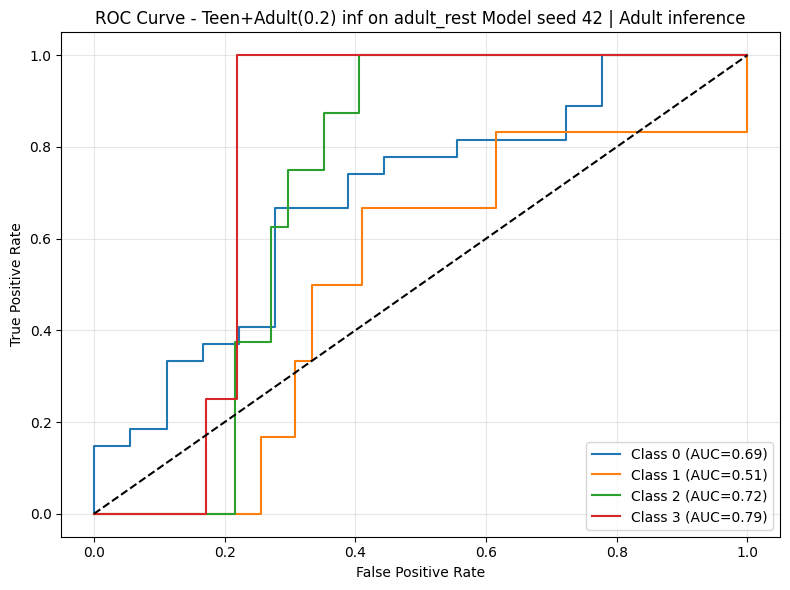


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_42_roc_curve.png

[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/adult_rest_search_best/roiseq_91e55f989e_seed43_best_model.pth
З

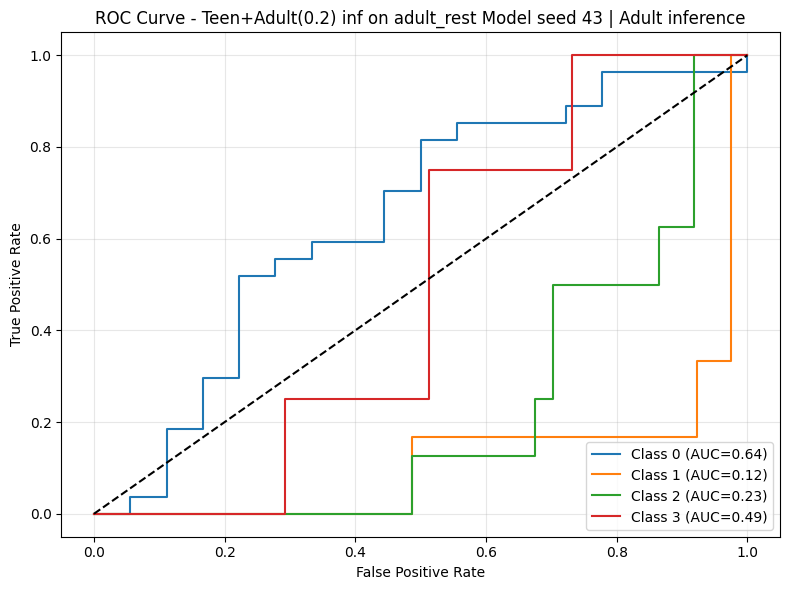


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_43_roc_curve.png

[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/adult_rest_search_best/roiseq_91e55f989e_seed44_best_model.pth
З

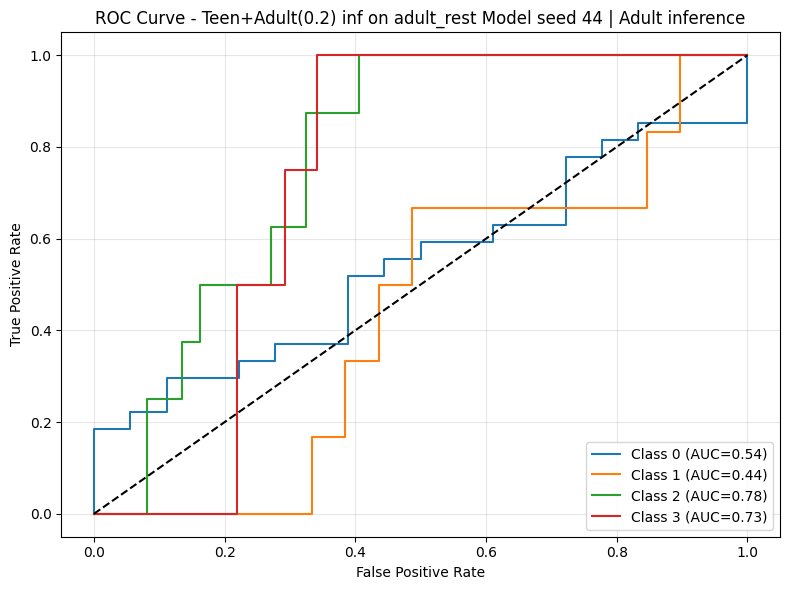


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_44_roc_curve.png

[TESTING] Teen+Adult(0.2) inf on adult_rest Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'note'] | Checkpoint: Experiments/3_rd_experiment/checkpoints/adult_rest_search_best/roiseq_91e55f989e_seed45_best_model.pth
З

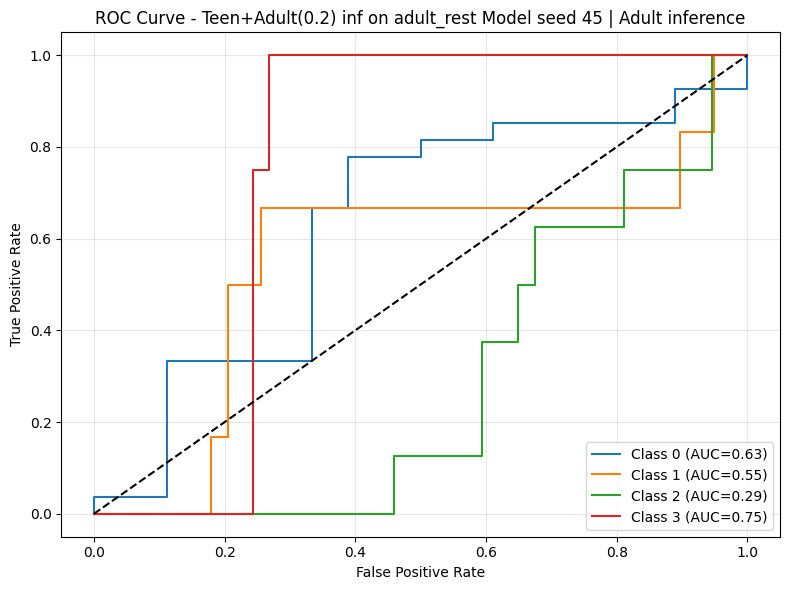


Результаты тестирования сохранены:
- Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_test_results.json
[ROC] Saved: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_roc_curve.png to Experiments/3_rd_experiment/test_results/teen_adult(0.2)_inf_on_adult_rest_model_roc_curves/teen_adult(0.2)_inf_on_adult_rest_model_seed_45_roc_curve.png

Teen+Adult(0.2) inf on adult_rest Model | F1 across seeds: [0.46567164179104475, 0.3432170542635659, 0.42857142857142855, 0.39185541066117585]
Teen+Adult(0.2) inf on adult_rest Model | F1 mean across seeds: 0.4073
Teen+Adult(0.2) inf on adult_rest Model | F1 std across seeds: 0.045290391298415

In [100]:
# ============================================================
# 3.4.7 Тестирование модели, обученной на датасете Adult Rest с тестированием на отложенном наборе Adult(0.2)
# ============================================================
model_name_adult_rest = "Adult Rest Model"
best_cfg_adult_rest_path = os.path.join(BEST_DIR_ADULT_REST_3, "best_config.json")

with open(best_cfg_adult_rest_path, "r", encoding="utf-8") as f:
    best_cfg_adult_rest = json.load(f)
trial_id_adult_rest = best_cfg_adult_rest.get("trial_id")
if not trial_id_adult_rest:
    raise KeyError("best_config.json for adult rest model has no 'trial_id'")

result_adult_rest = test_best_model_all_seeds(
    best_config=best_cfg_adult_rest,
    best_checkpoint_dir=BEST_DIR_ADULT_REST_3,
    model_name=model_name_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data,
    test_loader=experiment_3_data_loader_for_search_adult_0_2_sampler_inference.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=experiment_3_data_loader_for_search_adult_0_2_sampler_inference.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_3,
    seeds=[42, 43, 44, 45],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_3, "adult_rest_subject_predictions_all_seeds"),
)

### 3.5 Промежуточный вывод по тесту

In [101]:
# ============================================================
# 3.5.1 Сводка стабильности и качества по 4 экспериментам (seed-sensitivity)
# ============================================================
import numpy as np
import pandas as pd

def _summarize_seed_results(accumulate_results: dict) -> dict:
    # accumulate_results: {"seed_42": {"f1":..., "auc":..., ...}, ...}
    f1 = [v.get("f1") for v in accumulate_results.values() if isinstance(v, dict) and v.get("f1") is not None]
    auc = [v.get("auc") for v in accumulate_results.values() if isinstance(v, dict) and v.get("auc") is not None]

    f1 = [float(x) for x in f1]
    auc = [float(x) for x in auc]

    f1_mean = float(np.mean(f1)) if f1 else float("nan")
    f1_std = float(np.std(f1)) if len(f1) > 1 else 0.0
    f1_div = float(f1_std / f1_mean) if (np.isfinite(f1_mean) and f1_mean > 0) else float("inf")

    auc_mean = float(np.mean(auc)) if auc else float("nan")
    auc_std = float(np.std(auc)) if len(auc) > 1 else 0.0
    auc_div = float(auc_std / auc_mean) if (np.isfinite(auc_mean) and auc_mean > 0) else float("inf")

    return {
        "n_seeds": int(len(accumulate_results)),
        "auc_mean": auc_mean,
        "auc_std": auc_std,
        "auc_divergence": auc_div,
        "f1_mean": f1_mean,
        "f1_std": f1_std,
        "f1_divergence": f1_div,
        "auc_vals": auc,
        "f1_vals": f1,
    }

experiments = {
    "Teen-Only": globals().get("result_teen_only_test"),
    "Teen-Only cov gender": globals().get("result_teen_cov_gender_test"),
    "Teen+Adult(0.2)": globals().get("result_mixed_fixed_data"),
    "Teen+Adult(0.2) cov gender": globals().get("result_mixed_cov_gender"),
    "Children+Teen+Adult(0.8)": globals().get("result_mixed_children_teen_adult_fixed_data"),
    "Children+Teen+Adult(0.8) cov gender": globals().get("result_mixed_children_teen_adult_cov_gender"),
    "Teen+Adult(0.8)": globals().get("result_mixed_teen_adult_0_8_fixed_data"),
    "Teen+Adult(0.8) cov gender": globals().get("result_mixed_teen_adult_0_8_cov_gender"),
    "Teen+Adult(0.2) (Inf Adult Rest)": globals().get("result_mixed_teen_adult_0_2_inf_on_adult_rest_fixed_data"),
    "Adult Rest": globals().get("result_adult_rest"),
}

rows = []
missing = []
for name, res in experiments.items():
    if not isinstance(res, dict) or not res:
        missing.append(name)
        continue
    s = _summarize_seed_results(res)
    rows.append({
        "experiment": name,
        "n_seeds": s["n_seeds"],
        "Mean AUC": s["auc_mean"],
        "Std AUC": s["auc_std"],
        "Div AUC": s["auc_divergence"],
        "Mean F1 macro": s["f1_mean"],
        "Std F1 macro": s["f1_std"],
        "Div F1 macro": s["f1_divergence"],
    })

if missing:
    print("[WARN] Missing results for:", missing)

if not rows:
    raise RuntimeError("No experiment results found in kernel. Run cells 3.4.1–3.4.7 first.")

experiment_3_test_summary_df = pd.DataFrame(rows)
experiment_3_test_summary_df_sorted = experiment_3_test_summary_df.sort_values(["Mean F1 macro", "Mean AUC"], ascending=[False, False]).reset_index(drop=True)

# Compact text table (easy to quote)
df_print = experiment_3_test_summary_df_sorted.copy()
for c in ["Mean F1 macro", "Std F1 macro", "Div F1 macro", "Mean AUC", "Std AUC", "Div AUC"]:
    df_print[c] = df_print[c].map(lambda x: float(x) if pd.notna(x) else x)

print("\n=== Summary (mean ± std, divergence = std/mean) ===")
for _, r in df_print.iterrows():
    print(
        f"{r['experiment']:<36} | "
        f"F1 {r['Mean F1 macro']:.4f} ± {r['Std F1 macro']:.4f} (div {r['Div F1 macro']:.4f}) | "
        f"AUC {r['Mean AUC']:.4f} ± {r['Std AUC']:.4f} (div {r['Div AUC']:.4f})"
    )

best_f1 = experiment_3_test_summary_df_sorted.loc[experiment_3_test_summary_df_sorted["Mean F1 macro"].idxmax()]
best_auc = experiment_3_test_summary_df_sorted.loc[experiment_3_test_summary_df_sorted["Mean AUC"].idxmax()]
most_stable_f1 = experiment_3_test_summary_df_sorted.loc[experiment_3_test_summary_df_sorted["Div F1 macro"].idxmin()]
most_stable_auc = experiment_3_test_summary_df_sorted.loc[experiment_3_test_summary_df_sorted["Div AUC"].idxmin()]

print("\nBest mean F1:", best_f1["experiment"], f"(F1={best_f1['Mean F1 macro']:.4f} ± {best_f1['Std F1 macro']:.4f})")
print("Best mean AUC:", best_auc["experiment"], f"(AUC={best_auc['Mean AUC']:.4f} ± {best_auc['Std AUC']:.4f})")
print("Most stable F1 (min std/mean):", most_stable_f1["experiment"], f"(div={most_stable_f1['Div F1 macro']:.4f})")
print("Most stable AUC (min std/mean):", most_stable_auc["experiment"], f"(div={most_stable_auc['Div AUC']:.4f})")

# Распечатаем данные в виде датафрейма для удобства сравнения с вертикальной таблицей в публикации
print("\n=== Summary Table ===")
display(experiment_3_test_summary_df_sorted[["experiment", "Mean AUC", "Std AUC", "Div AUC", "Mean F1 macro", "Std F1 macro", "Div F1 macro"]])
print(experiment_3_test_summary_df_sorted[["experiment", "Mean AUC", "Std AUC", "Div AUC", "Mean F1 macro", "Std F1 macro", "Div F1 macro"]].to_string(index=False))

# Сохраним данные в .xls файл для удобства
experiment_3_test_summary_path_xlsx = os.path.join(TEST_RESULTS_DIR_3, "summary_results.xlsx")
experiment_3_test_summary_df_sorted.to_excel(experiment_3_test_summary_path_xlsx, index=False)
print(f"\nSummary results saved to: {experiment_3_test_summary_path_xlsx}")

# Сохраним данные в .csv файл для удобства
experiment_3_test_summary_path_csv = os.path.join(TEST_RESULTS_DIR_3, "summary_results.csv")
experiment_3_test_summary_df_sorted.to_csv(experiment_3_test_summary_path_csv, index=False)
print(f"\nSummary results saved to: {experiment_3_test_summary_path_csv}")



=== Summary (mean ± std, divergence = std/mean) ===
Teen+Adult(0.8) cov gender           | F1 0.5654 ± 0.0367 (div 0.0648) | AUC 0.7190 ± 0.0388 (div 0.0539)
Teen+Adult(0.2) (Inf Adult Rest)     | F1 0.5236 ± 0.0181 (div 0.0346) | AUC 0.6770 ± 0.0473 (div 0.0699)
Teen+Adult(0.2)                      | F1 0.5083 ± 0.0357 (div 0.0702) | AUC 0.7569 ± 0.0485 (div 0.0641)
Teen-Only cov gender                 | F1 0.5013 ± 0.0210 (div 0.0419) | AUC 0.7314 ± 0.0122 (div 0.0167)
Teen+Adult(0.2) cov gender           | F1 0.4945 ± 0.0271 (div 0.0547) | AUC 0.7446 ± 0.0407 (div 0.0546)
Children+Teen+Adult(0.8) cov gender  | F1 0.4930 ± 0.0229 (div 0.0465) | AUC 0.6921 ± 0.0079 (div 0.0115)
Teen+Adult(0.8)                      | F1 0.4890 ± 0.0369 (div 0.0755) | AUC 0.8010 ± 0.0164 (div 0.0205)
Teen-Only                            | F1 0.4262 ± 0.0090 (div 0.0211) | AUC 0.5490 ± 0.0834 (div 0.1520)
Children+Teen+Adult(0.8)             | F1 0.4191 ± 0.0515 (div 0.1228) | AUC 0.6827 ± 0.0399 (div 0

,experiment,Mean AUC,Std AUC,Div AUC,Mean F1 macro,Std F1 macro,Div F1 macro
0,Teen+Adult(0.8) cov gender,0.718971,0.038783,0.053942,0.565392,0.036657,0.064836
1,Teen+Adult(0.2) (Inf Adult Rest),0.676979,0.047312,0.069887,0.523628,0.018118,0.034601
2,Teen+Adult(0.2),0.756872,0.048481,0.064055,0.508315,0.035707,0.070246
3,Teen-Only cov gender,0.731354,0.012226,0.016717,0.501278,0.020982,0.041857
4,Teen+Adult(0.2) cov gender,0.744615,0.040663,0.054610,0.494524,0.027057,0.054713
5,Children+Teen+Adult(0.8) cov gender,0.692054,0.007926,0.011453,0.492988,0.022940,0.046533
6,Teen+Adult(0.8),0.801047,0.016390,0.020461,0.488966,0.036903,0.075472
7,Teen-Only,0.548954,0.083435,0.151989,0.426176,0.009004,0.021126
8,Children+Teen+Adult(0.8),0.682690,0.039904,0.058451,0.419125,0.051475,0.122816
9,Adult Rest,0.556079,0.116737,0.209929,0.407329,0.045290,0.111189


                         experiment  Mean AUC  Std AUC  Div AUC  Mean F1 macro  Std F1 macro  Div F1 macro
         Teen+Adult(0.8) cov gender  0.718971 0.038783 0.053942       0.565392      0.036657      0.064836
   Teen+Adult(0.2) (Inf Adult Rest)  0.676979 0.047312 0.069887       0.523628      0.018118      0.034601
                    Teen+Adult(0.2)  0.756872 0.048481 0.064055       0.508315      0.035707      0.070246
               Teen-Only cov gender  0.731354 0.012226 0.016717       0.501278      0.020982      0.041857
         Teen+Adult(0.2) cov gender  0.744615 0.040663 0.054610       0.494524      0.027057      0.054713
Children+Teen+Adult(0.8) cov gender  0.692054 0.007926 0.011453       0.492988      0.022940      0.046533
                    Teen+Adult(0.8)  0.801047 0.016390 0.020461       0.488966      0.036903      0.075472
                          Teen-Only  0.548954 0.083435 0.151989       0.426176      0.009004      0.021126
           Children+Teen+Adult(0.8)  

Тестовый датасет был полностью очищен от возможных пересечений с вхождениями в тренировочном датасете по participant_id. Нормализация датасетов не производилась. Датасеты яаляются полностью изолированными, и разделены по возрасту участников. Участники для тренировочного датасета были выбираны случайным образом с параметром random_state=42 из датасета Adults.
Данные соображения позволяют говорить о том, что загрязнения тестового датасета не произошло.

**Вывод по стабильности и максимумам:**

- Наибольшая стабильность F1: Teen-only (минимальный div между всеми seed-ами), но при этом F1 заметно ниже лидера (Teen+Adult(0.8) covariate gender) — то есть результат стабильный, но недостаточный в данной постановке эксперимента.
- Максимальный средний F1 (главная метрика): Teen+Adult(0.8) cov gender. Причём, добавление ковариаты gender улучшило показатель F1 на 15%.
- Максимальный средний AUC и одновременно самая стабильная AUC: Teen+Adult(0.8). Добавление ковариаты по gender несколько ухудшает AUC. Основной проблемой здесь является ксласс  №2 - ADHD-Hyperactive/Impulsive.
- Самая нестабильная по F1: Children+Teen+Adult(0.8) (высокий разброс между seed-ами).

**Интерпретация:**

- Добавление Adult в обучение реально помогает именно целевому тесту (Adult inference): F1 растёт по сравнению с Teen-only.

- Добавление ковариаты по полу (gender) улучшает метрику F1 и несколько ухудшает AUC для обоих рассмотренных случаев: Teen+Adult(0.2) и Teen+Adult(0.8). Ухудшение происходит главным образом за счёт наиболее малочисленного класса №2 – ADHD-Hyperactive/Impulsive.

- Увеличение доли когорты «Adult» (0.8) улучшает AUC и делает его более стабильным, но F1 чуть проседает относительно «Adult» (0.2). Возможное предположение здесь: модель неплохо ранжирует классы (AUC), но финальная классификация даёт меньший F1.

- Низкая и нестабильная AUC у Teen-only намекает на сильный domain shift (возраст/сайт/протокол/шумы) при переносе на взрослых: дело не только в границах возрастных когорт.

### 3.6 PCA по ROI относительно age_cohort и label

In [102]:
# Создадим специальный data_loader для всего датасета целиком

print(f"\nСоздаём даталоадер для полного датасета, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
all_cohort_data_loader = \
    ExperimentDataLoader(data_df, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)


Создаём даталоадер для полного датасета, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2, 3]), array([3, 4, 3, 6]))


In [103]:
from collections.abc import Mapping

# --- PCA analysis function ---
# This function performs PCA on the ROI features extracted from the data_loader and visualizes the results in a scatter plot colored by the specified feature (e.g., diagnosis, gender, age_cohort).
# It handles both 3D tensor inputs (B,T,F) with optional masking and 2D tensor inputs (B,F).
# The feature values can be obtained from the batch metadata, the target variable, or a separate PHENO_CSV file indexed by participant_id.
def pca_analysis(data_loader: ExperimentDataLoader, feature_name: str, n_components: int = 2):
    import numpy as np
    import matplotlib.pyplot as plt
    import torch
    import pandas as pd
    from sklearn.decomposition import PCA

    if n_components < 2:
        raise ValueError("n_components must be at least 2 for PCA analysis")

    if n_components > 3:
        print(
            "Warning: n_components > 3 will be computed but only the first 3 components can be visualized in a scatter plot."
        )

    if not hasattr(data_loader, "inference_loader") or data_loader.inference_loader is None:
        raise ValueError("data_loader must have a non-empty inference_loader")

    # --- helpers ---
    def _to_numpy(arr):
        if isinstance(arr, torch.Tensor):
            return arr.detach().cpu().numpy()
        return np.asarray(arr)

    def _masked_time_mean(x3d: torch.Tensor, mask2d: torch.Tensor | None):
        # x3d: (B,T,F), mask2d: (B,T) with 1 for valid, 0 for pad
        if mask2d is None:
            return x3d.mean(dim=1)
        mask = mask2d.float()
        denom = mask.sum(dim=1).clamp(min=1.0)
        return (x3d * mask.unsqueeze(-1)).sum(dim=1) / denom.unsqueeze(-1)

    def _load_pheno_indexed():
        if hasattr(pca_analysis, "_pheno_indexed"):
            return pca_analysis._pheno_indexed

        pheno_path = globals().get("PHENO_CSV", None)
        if pheno_path is None:
            raise ValueError("PHENO_CSV is not defined in the notebook kernel")

        df = pd.read_csv(str(pheno_path), sep="\t")
        if "participant_id" not in df.columns:
            raise ValueError(f"PHENO_CSV must contain 'participant_id' column. Got: {list(df.columns)}")

        df = df.drop_duplicates(subset=["participant_id"], keep="first").set_index("participant_id")
        pca_analysis._pheno_indexed = df
        return df

    def _pheno_column_for_feature(name: str) -> str:
        n = name.strip().lower()
        # common aliases in this notebook
        if n in {"label", "y", "target", "class", "diagnosis"}:
            return "diagnosis"
        if n in {"sex", "gender"}:
            return "gender"
        if n in {"cohort", "age_group", "agecohort", "age_cohort"}:
            return "age_cohort"
        return name

    # --- main loop ---
    all_rois = []
    all_feature_values_raw = []
    skipped_batches = 0
    skipped_samples_total = 0

    for batch in data_loader.inference_loader:
        meta = None
        participant_ids = None

        if isinstance(batch, dict):
            x = batch.get("x")
            cov = batch.get("cov")
            y = batch.get("y")
            meta = batch
            participant_ids = batch.get("participant_id") or batch.get("participant_ids")
        else:
            if not isinstance(batch, (tuple, list)):
                raise TypeError(f"Unexpected batch type: {type(batch)}")
            x = batch[0] if len(batch) > 0 else None
            cov = batch[1] if len(batch) > 1 else None
            y = batch[2] if len(batch) > 2 else None
            # Observed structure: [x, mask, y(empty), age_cohort_idx?, participant_ids_tuple]
            if len(batch) > 4 and isinstance(batch[4], (tuple, list)) and len(batch[4]) > 0:
                participant_ids = batch[4]
            meta = {"_raw": batch}

        if x is None:
            skipped_batches += 1
            continue

        # ROI representation: if (B,T,F) -> (B,F)
        if isinstance(x, torch.Tensor) and x.ndim == 3:
            mask2d = None
            if isinstance(cov, torch.Tensor) and cov.ndim == 2 and cov.shape[:2] == x.shape[:2]:
                mask2d = cov
            rois = _to_numpy(_masked_time_mean(x, mask2d))
        else:
            rois = _to_numpy(x)

        # ---- resolve feature values ----
        feat = None

        # 1) direct meta lookup if dict has the key
        if isinstance(meta, Mapping) and feature_name in meta and feature_name != "_raw":
            feat = meta[feature_name]

        raw = meta.get("_raw") if isinstance(meta, dict) else None

        # 2) y if it is present and matches batch
        if feat is None and feature_name.strip().lower() in {"label", "y", "target", "class", "diagnosis"}:
            if y is not None and hasattr(y, "numel") and y.numel() > 0:
                feat = y

        # 3) PHENO_CSV lookup by participant_id (for gender/diagnosis/site/age/age_cohort...)
        if feat is None and participant_ids is not None:
            ph = _load_pheno_indexed()
            col = _pheno_column_for_feature(feature_name)
            if col in ph.columns:
                s = ph.reindex(list(participant_ids))[col]
                ok = s.notna().to_numpy()
                if ok.sum() == 0:
                    skipped_samples_total += len(participant_ids)
                    skipped_batches += 1
                    continue
                if ok.sum() != len(ok):
                    skipped_samples_total += int((~ok).sum())
                rois = rois[ok]
                feat = s.to_numpy()[ok]

        # 4) legacy fallback for age_cohort index if not found elsewhere
        if feat is None and isinstance(raw, (list, tuple)):
            if feature_name.strip().lower() in {"age_cohort", "cohort", "age_group"} and len(raw) > 3:
                feat = raw[3]

        if feat is None:
            skipped_batches += 1
            continue

        feature_values_raw = _to_numpy(feat).reshape(-1)

        # PCA expects (n_samples, n_features)
        if rois.ndim == 1:
            rois = rois[None, :]
        elif rois.ndim > 2:
            rois = rois.reshape(rois.shape[0], -1)

        if rois.shape[0] != feature_values_raw.shape[0]:
            raise ValueError(
                f"Batch size mismatch: rois has {rois.shape[0]} samples but feature '{feature_name}' has {feature_values_raw.shape[0]} values."
            )

        all_rois.append(rois)
        all_feature_values_raw.append(feature_values_raw)

    if not all_rois:
        print(f"No ROI data found for PCA analysis (feature='{feature_name}').")
        return

    if skipped_batches > 0 or skipped_samples_total > 0:
        print(
            f"PCA: skipped_batches={skipped_batches}, skipped_samples={skipped_samples_total} (feature='{feature_name}')"
        )

    all_rois = np.concatenate(all_rois, axis=0)
    all_feature_values_raw = np.concatenate(all_feature_values_raw, axis=0)

    # Global category encoding (important: consistent mapping across batches)
    label_mapping = None
    all_feature_values = all_feature_values_raw
    if all_feature_values_raw.dtype.kind in ("U", "S", "O"):
        uniq, inv = np.unique(all_feature_values_raw.astype(str), return_inverse=True)
        label_mapping = {int(i): str(u) for i, u in enumerate(uniq)}
        all_feature_values = inv.astype(np.int64)

    pca = PCA(n_components=n_components)
    rois_pca = pca.fit_transform(all_rois)

    if label_mapping is not None and len(label_mapping) <= 50:
        print("PCA coloring uses encoded categories. Mapping:")
        for k in sorted(label_mapping.keys()):
            print(f"  {k}: {label_mapping[k]}")

    if n_components == 3:
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection="3d")
        scatter = ax.scatter(
            rois_pca[:, 0],
            rois_pca[:, 1],
            rois_pca[:, 2],
            c=all_feature_values,
            cmap="viridis",
            alpha=0.7,
        )
        fig.colorbar(scatter, label=feature_name)
        ax.set_title(f"PCA of ROIs colored by {feature_name}")
        ax.set_xlabel("PCA Component 1")
        ax.set_ylabel("PCA Component 2")
        ax.set_zlabel("PCA Component 3")
        plt.show()
    else:
        plt.figure(figsize=(8, 6))
        scatter = plt.scatter(
            rois_pca[:, 0],
            rois_pca[:, 1],
            c=all_feature_values,
            cmap="viridis",
            alpha=0.7,
        )
        plt.colorbar(scatter, label=feature_name)
        plt.title(f"PCA of ROIs colored by {feature_name}")
        plt.xlabel("PCA Component 1")
        plt.ylabel("PCA Component 2")
        plt.grid(True)
        plt.show()


#### 3.6.1 PCA анализ по полному датасету по ROI относительно age_cohort

PCA coloring uses encoded categories. Mapping:
  0: adult
  1: children
  2: teen


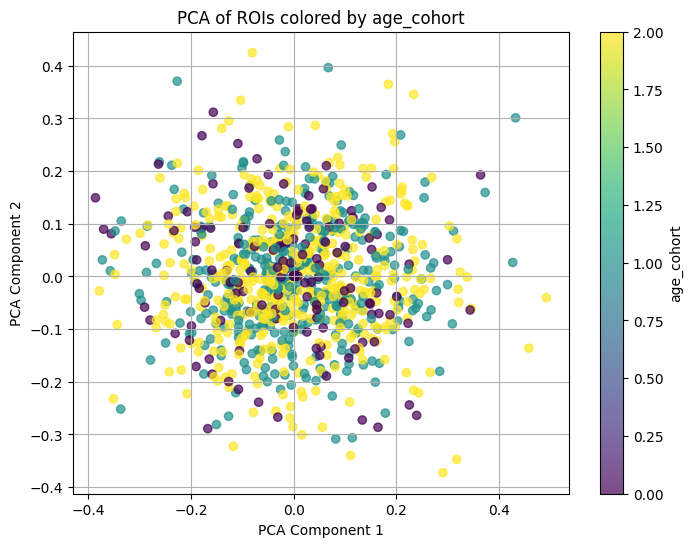

PCA coloring uses encoded categories. Mapping:
  0: adult
  1: children
  2: teen


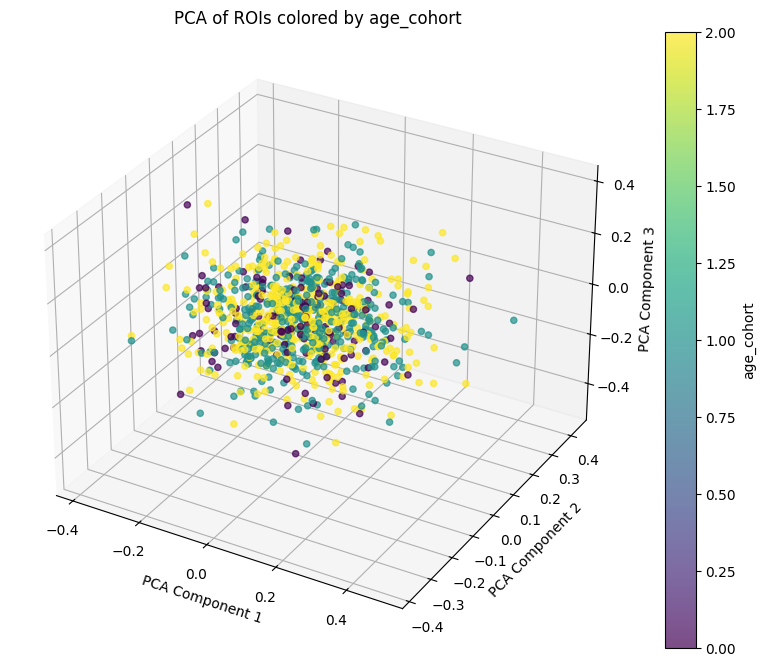

In [104]:
# Произведём PCA анализ по полному датасету по ROI относительно age_cohort
pca_analysis(all_cohort_data_loader, feature_name="age_cohort", n_components=2)
pca_analysis(all_cohort_data_loader, feature_name="age_cohort", n_components=3)

#### 3.6.2 PCA анализ по полному датасету по ROI относительно label (классы ADHD)

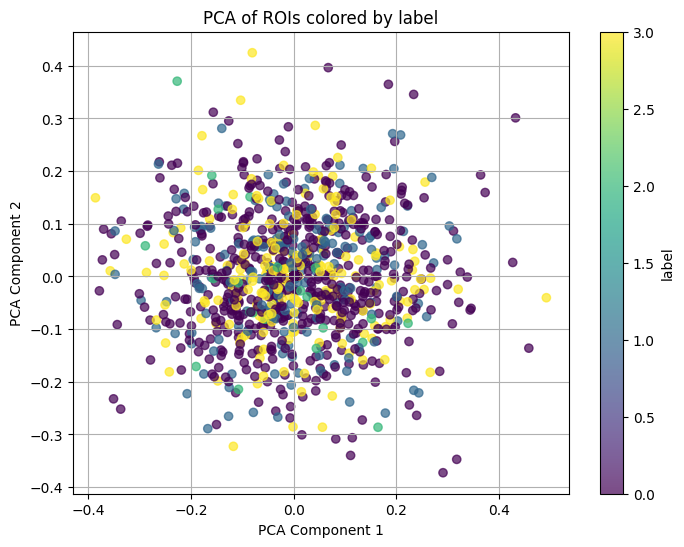

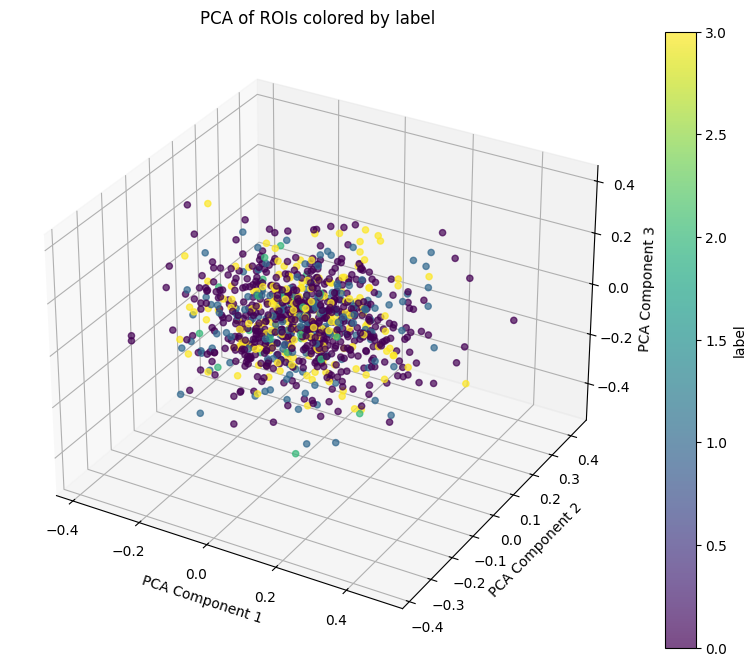

In [105]:
# Произведём PCA анализ по полному датасету по ROI относительно label (классы ADHD)
pca_analysis(all_cohort_data_loader, feature_name="label", n_components=2)
pca_analysis(all_cohort_data_loader, feature_name="label", n_components=3)

#### 3.6.4 PCA анализ по полному датасету по ROI относительно gender

PCA coloring uses encoded categories. Mapping:
  0: F
  1: M


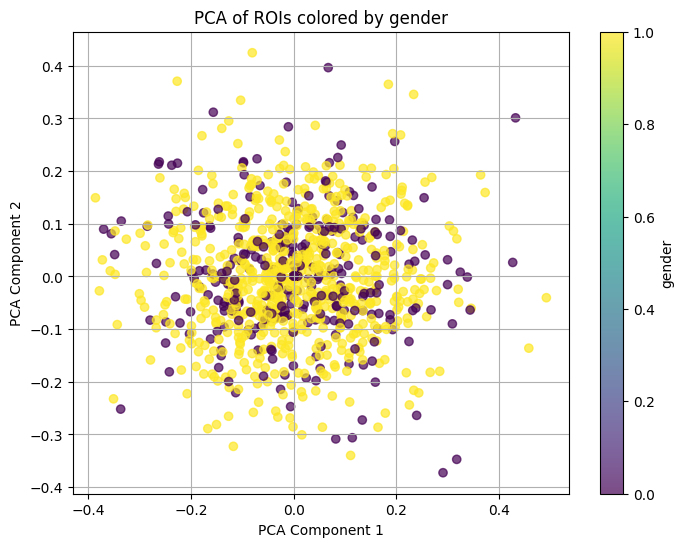

PCA coloring uses encoded categories. Mapping:
  0: F
  1: M


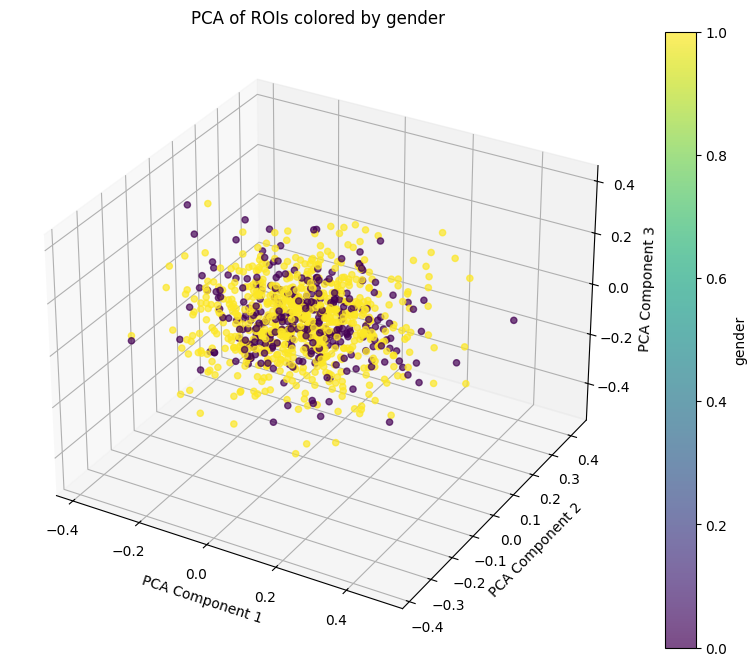

In [106]:
# Произведём PCA анализ по полному датасету по ROI относительно gender
pca_analysis(all_cohort_data_loader, feature_name="gender", n_components=2)
pca_analysis(all_cohort_data_loader, feature_name="gender", n_components=3)

#### 3.6.5 PCA анализ по полному датасету по ROI относительно site

PCA coloring uses encoded categories. Mapping:
  0: KKI
  1: NYU
  2: NeuroIMAGE
  3: OHSU
  4: Peking_1
  5: Pittsburgh
  6: WashU


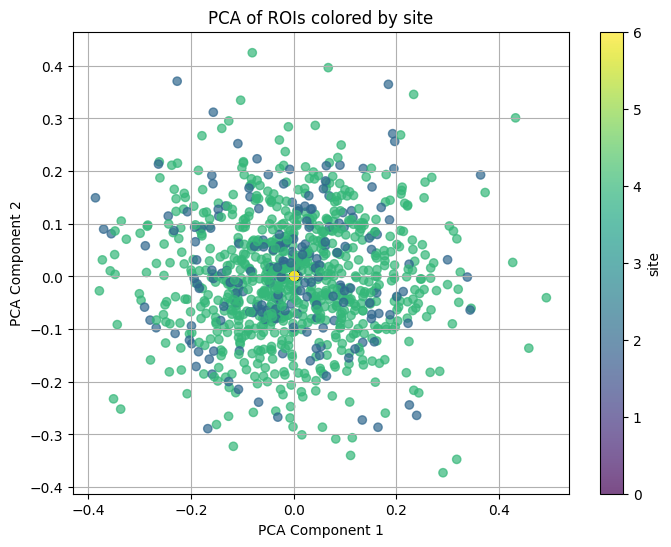

PCA coloring uses encoded categories. Mapping:
  0: KKI
  1: NYU
  2: NeuroIMAGE
  3: OHSU
  4: Peking_1
  5: Pittsburgh
  6: WashU


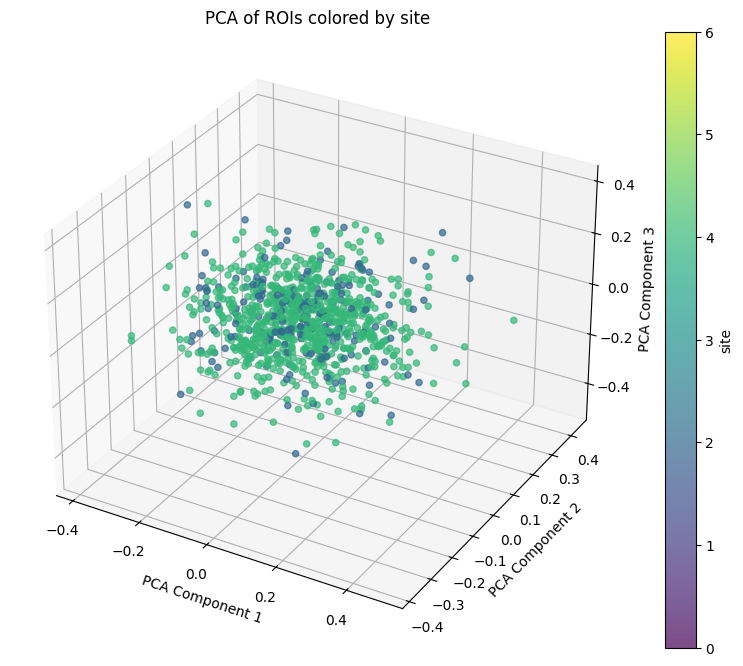

In [107]:
# Произведём PCA анализ по полному датасету по ROI относительно site
pca_analysis(all_cohort_data_loader, feature_name="site", n_components=2)
pca_analysis(all_cohort_data_loader, feature_name="site", n_components=3)

#### 3.6.6 Выводы по PCA анализу датасета



PCA анализ, основанный на ROI функционального коннектома не показывает никаких видимых кластеров для фич age_cohort, label, gender, site.
Проверка была произведена для 2-х и 3-х главных компонент.
Т.о. на уровне простого визуального анализа PCA по ROI не наблюдается ярко выраженной кластеризации по возрастным когортам, классам ADHD, полу или сайту. Это может указывать на то, что различия между этими группами в пространстве ROI не являются линейными или что вариация внутри групп сопоставима с вариацией между группами. Более сложные методы анализа или визуализации могут потребоваться для выявления более тонких паттернов в данных.

### 3.7 Проверка датасета на гомоскедастичность по классам (ADHD vs Control) относительно ROI признаков

Результаты теста Левена для признака 'label':
  Получены результаты per-ROI: n_features=353 (valid=351, NaN=2)
  Гетероскедастичные признаки (p < 0.05): 322/351 (91.7%)
  p-значение min/median/max: 2.929e-08 / 1.328e-03 / 3.164e-01
Тест Левена указывает на гетероскедастичность для 91.7% ROI признаков (p < 0.05).


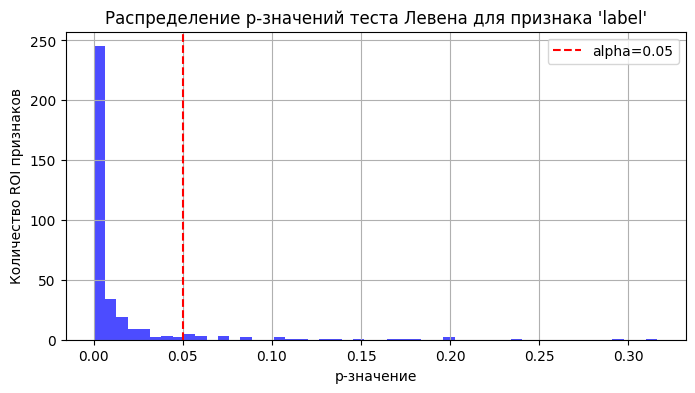

In [108]:
# Проверим датасет на гомоскедастичность по классам (ADHD vs Control) относительно ROI признаков
def check_homoscedasticity(data_loader: ExperimentDataLoader, feature_name: str, debug: bool = True):
    import numpy as np
    import torch
    import pandas as pd
    from collections.abc import Mapping
    from scipy.stats import levene

    all_rois = []
    all_feature_values_raw = []
    skipped_batches = 0
    skipped_samples_total = 0

    def _to_numpy(arr):
        if isinstance(arr, torch.Tensor):
            return arr.detach().cpu().numpy()
        return np.asarray(arr)

    def _masked_time_mean(x3d: torch.Tensor, mask2d: torch.Tensor | None):
        # x3d: (B,T,F), mask2d: (B,T) with 1 for valid, 0 for pad
        if mask2d is None:
            return x3d.mean(dim=1)
        mask = mask2d.float()
        denom = mask.sum(dim=1).clamp(min=1.0)
        return (x3d * mask.unsqueeze(-1)).sum(dim=1) / denom.unsqueeze(-1)

    def _normalize_participant_ids(pids):
        if pids is None:
            return None
        if isinstance(pids, torch.Tensor):
            pids = pids.detach().cpu().numpy().tolist()
        if isinstance(pids, (str, bytes)):
            pids = [pids]
        try:
            pids_list = list(pids)
        except TypeError:
            pids_list = [pids]

        norm = []
        for pid in pids_list:
            if isinstance(pid, bytes):
                pid = pid.decode("utf-8", errors="ignore")
            norm.append(str(pid))
        return norm

    def _find_df():
        # Try to recover a dataframe from common places in ExperimentDataLoader / dataset
        dataset = getattr(data_loader, "dataset", None)
        inf_dataset = getattr(getattr(data_loader, "inference_loader", None), "dataset", None)
        for obj in (data_loader, dataset, inf_dataset):
            if obj is None:
                continue
            for attr in ("df", "data_df", "manifest_df"):
                v = getattr(obj, attr, None)
                if isinstance(v, pd.DataFrame):
                    return v
        return None

    def _resolve_from_df(_feature_name: str, participant_ids, batch_size: int):
        # Returns (values, valid_mask) or (None, None) on failure
        df = _find_df()
        pids = _normalize_participant_ids(participant_ids)
        if df is None or not pids or len(pids) != batch_size:
            return None, None

        id_col = None
        for c in ("participant_id", "participant", "subject_id", "sub_id", "sub", "subject"):
            if c in df.columns:
                id_col = c
                break
        if id_col is None:
            return None, None

        col = None
        if _feature_name in df.columns:
            col = _feature_name
        else:
            if _feature_name.strip().lower() in {"label", "y", "target"}:
                for c in ("label", "diagnosis", "dx", "DX", "class", "target"):
                    if c in df.columns:
                        col = c
                        break
        if col is None:
            return None, None

        indexed = df[[id_col, col]].drop_duplicates(subset=[id_col]).set_index(id_col)[col]
        values = indexed.reindex(pids).to_numpy()
        valid_mask = ~pd.isna(values)
        return values, valid_mask

    def _as_1d(v):
        if v is None:
            return None
        arr = _to_numpy(v)
        arr = np.asarray(arr)
        return arr.reshape(-1)

    for batch in data_loader.inference_loader:
        meta = None
        participant_ids = None

        # batch может быть dict или tuple/list
        if isinstance(batch, dict):
            x = batch.get("x")
            cov = batch.get("cov")
            y = batch.get("y")
            meta = batch
            participant_ids = batch.get("participant_id") or batch.get("participant_ids")
            if debug:
                print(f"Processing batch with dict structure. Keys: {list(batch.keys())}")
        else:
            if not isinstance(batch, (tuple, list)):
                raise TypeError(f"Unexpected batch type: {type(batch)}")
            x = batch[0] if len(batch) > 0 else None
            cov = batch[1] if len(batch) > 1 else None
            y = batch[2] if len(batch) > 2 else None

            # Observed structure: [x, mask, y(empty), age_cohort_idx?, participant_ids_tuple]
            if len(batch) > 4 and isinstance(batch[4], (tuple, list)) and len(batch[4]) > 0:
                participant_ids = batch[4]
                if debug:
                    print(
                        f"Extracted participant_ids from batch[4] with length {len(participant_ids)}"
                    )
            meta = {"_raw": batch, "cov": cov, "participant_ids": participant_ids}
            if debug:
                print(f"Processing batch with tuple/list structure. Length: {len(batch)}")
                print(
                    f"Extracted x shape: {x.shape if x is not None else 'None'}, "
                    f"cov shape: {cov.shape if cov is not None else 'None'}, "
                    f"y shape: {y.shape if y is not None else 'None'}"
                )

        if x is None:
            skipped_batches += 1
            continue

        # ROI representation: if (B,T,F) -> (B,F)
        if isinstance(x, torch.Tensor) and x.ndim == 3:
            mask2d = None
            if isinstance(cov, torch.Tensor) and cov.ndim == 2 and cov.shape[:2] == x.shape[:2]:
                mask2d = cov
            rois = _to_numpy(_masked_time_mean(x, mask2d))
        else:
            rois = _to_numpy(x)

        if rois.ndim == 1:
            rois = rois[None, :]
        elif rois.ndim > 2:
            rois = rois.reshape(rois.shape[0], -1)

        batch_size = int(rois.shape[0])

        # ---- resolve feature values ----
        raw = meta.get("_raw") if isinstance(meta, dict) else None
        feat_arr = None

        # 1) direct meta lookup
        if isinstance(meta, Mapping) and feature_name in meta and feature_name != "_raw":
            feat_arr = _as_1d(meta[feature_name])

        # 2) y as label
        if (
            (feat_arr is None or feat_arr.size == 0 or feat_arr.size != batch_size)
            and feature_name.strip().lower() in {"label", "y", "target"}
        ):
            y_arr = _as_1d(y)
            if y_arr is not None and y_arr.size == batch_size:
                feat_arr = y_arr

        # 3) legacy age_cohort index
        if (
            (feat_arr is None or feat_arr.size == 0 or feat_arr.size != batch_size)
            and isinstance(raw, (list, tuple))
            and feature_name.strip().lower() in {"age_cohort", "cohort", "age_group"}
            and len(raw) > 3
        ):
            tmp = _as_1d(raw[3])
            if tmp is not None and tmp.size == batch_size:
                feat_arr = tmp

        # 4) dataframe fallback (important for inference_loader where y can be empty)
        if feat_arr is None or feat_arr.size == 0 or feat_arr.size != batch_size:
            recovered, mask = _resolve_from_df(feature_name, participant_ids, batch_size)
            if recovered is not None:
                recovered = np.asarray(recovered).reshape(-1)
                mask = np.asarray(mask).reshape(-1).astype(bool)
                if mask.shape[0] == batch_size:
                    missing = int((~mask).sum())
                    if missing:
                        skipped_samples_total += missing
                    rois = rois[mask]
                    recovered = recovered[mask]
                    batch_size = int(rois.shape[0])
                if batch_size > 0 and recovered.shape[0] == batch_size:
                    feat_arr = recovered

        if feat_arr is None or feat_arr.size == 0 or feat_arr.size != batch_size:
            if debug:
                print(
                    f"Batch skipped for homoscedasticity check: could not resolve '{feature_name}' (batch_size={batch_size})."
                )
            skipped_batches += 1
            continue

        all_rois.append(rois)
        all_feature_values_raw.append(feat_arr)

    if not all_rois:
        if debug:
            print(f"No ROI data found for homoscedasticity check (feature='{feature_name}').")
        return

    if skipped_batches > 0 or skipped_samples_total > 0:
        print(
            f"Homoscedasticity check: skipped_batches={skipped_batches}, skipped_samples={skipped_samples_total} (feature='{feature_name}')"
        )

    all_rois = np.concatenate(all_rois, axis=0)
    all_feature_values_raw = np.concatenate(all_feature_values_raw, axis=0)

    # Global category encoding
    label_mapping = None
    all_feature_values = all_feature_values_raw
    if all_feature_values_raw.dtype.kind in ("U", "S", "O"):
        uniq, inv = np.unique(all_feature_values_raw.astype(str), return_inverse=True)
        label_mapping = {int(i): str(u) for i, u in enumerate(uniq)}
        all_feature_values = inv.astype(np.int64)

    if label_mapping is not None and len(label_mapping) <= 50:
        print("Homoscedasticity check uses encoded categories. Mapping:")
        for k in sorted(label_mapping.keys()):
            print(f"  {k}: {label_mapping[k]}")

    # Group ROI features by class
    groups = {}
    for roi, feat_val in zip(all_rois, all_feature_values):
        groups.setdefault(feat_val, []).append(roi)

    group_arrays = [np.array(g) for g in groups.values()]
    stat, p_value = levene(*group_arrays)
    # scipy.stats.levene is vectorized: if group arrays are 2D (n_samples, n_features),
    # it returns per-feature statistic and p-value arrays.
    stat = np.asarray(stat, dtype=float)
    p_value = np.asarray(p_value, dtype=float)
    alpha = 0.05

    print(f"Результаты теста Левена для признака '{feature_name}':")
    if stat.ndim == 0 and p_value.ndim == 0:
        stat_f = float(stat)
        p_f = float(p_value)
        if debug:
            print(f"  Statistic: {stat_f:.4f}")
            print(f"  p-value: {p_f:.4e}")

        if p_f < alpha:
            print(
                f"Тест Левена указывает на гетероскедастичность (p < {alpha}) для признака '{feature_name}'"
            )
        else:
            print(
                f"Тест Левена указывает на гомоскедастичность (p >= {alpha}) для признака '{feature_name}'"
            )
    else:
        p_vec = p_value.reshape(-1)
        nan_mask = np.isnan(p_vec)
        p_valid = p_vec[~nan_mask]

        n_total = int(p_vec.size)
        n_nan = int(nan_mask.sum())
        n_valid = int(p_valid.size)

        print(
            f"  Получены результаты per-ROI: n_features={n_total} (valid={n_valid}, NaN={n_nan})"
        )

        if n_valid == 0:
            print(
                "  Все p-значения являются NaN (часто постоянные/вырожденные признаки хотя бы в одном классе)."
            )
            return

        n_sig = int((p_valid < alpha).sum())
        frac_sig = n_sig / n_valid

        print(
            f"  Гетероскедастичные признаки (p < {alpha}): {n_sig}/{n_valid} ({frac_sig:.1%})"
        )
        print(
            f"  p-значение min/median/max: {float(p_valid.min()):.3e} / {float(np.median(p_valid)):.3e} / {float(p_valid.max()):.3e}"
        )

        if n_sig > 0:
            print(
                f"Тест Левена указывает на гетероскедастичность для {frac_sig:.1%} ROI признаков (p < {alpha})."
            )
        else:
            print(
                f"Тест Левена указывает на гомоскедастичность для всех ROI признаков с допустимыми p-значениями (p >= {alpha})."
            )

        # Визуализируем распределение p-значений
        plt.figure(figsize=(8, 4))
        plt.hist(p_valid, bins=50, alpha=0.7, color="blue")
        plt.axvline(x=alpha, color="red", linestyle="--", label=f"alpha={alpha}")
        plt.title(f"Распределение p-значений теста Левена для признака '{feature_name}'")
        plt.xlabel("p-значение")
        plt.ylabel("Количество ROI признаков")
        plt.legend()
        plt.grid(True)
        plt.show()


check_homoscedasticity(all_cohort_data_loader, feature_name="label", debug=False)


**Выводы:**

Проверка гомоскедастичности ROI-признаков с помощью теста Левена была выполнена как этап предварительного анализа данных. Целью данного шага являлась оценка того, насколько корректно по отношению к исследуемым признакам выполняется предположение о равенстве дисперсий между диагностическими группами. Это важно, поскольку многие классические статистические процедуры и часть интерпретаций линейных моделей опираются на допущение о сопоставимой вариативности признаков в сравниваемых классах.

Полученный результат показал, что для подавляющего большинства ROI гипотеза о равенстве дисперсий отвергается. Это означает, что различия между группами проявляются не только в возможном смещении средних значений признаков, но и в различии их разброса. С практической точки зрения такой вывод указывает на выраженную неоднородность данных и подтверждает, что анализ должен учитывать различия в структуре распределений между классами.

В контексте данного исследования это имеет два следствия. Во-первых, при сравнении групп и интерпретации отдельных признаков предпочтение следует отдавать статистическим подходам, которые менее чувствительны к выбросам, различию дисперсий и нарушению стандартных предположений о распределении данных. Во-вторых, наличие выраженной гетероскедастичности дополнительно подтверждает, что задача классификации не сводится к поиску простого линейного разделения по средним значениям ROI, а требует моделей, способных учитывать более сложную структуру вариативности функционального сигнала.

**Краткая выжимка:**

Тест Левена был нужен для того, чтобы проверить, можно ли считать разброс ROI-признаков одинаковым в разных диагностических группах. Результат показал, что в большинстве ROI это предположение не выполняется. Это говорит о выраженной неоднородности данных и о том, что различия между группами проявляются не только в средних значениях, но и в вариативности признаков. Поэтому для дальнейшего анализа более оправдано использование статистических подходов, менее чувствительных к выбросам и неоднородности данных, и нелинейных моделей машинного обучения.

# Эксперимент 4. Смещение границ для возрастных когорт Teen и Adult

**Эксперимент 4A:**

В рамках данного эксперимента мы попробуем проверить предположение, что результаты работы модели сильно зависят от возрастной стратификации участников. Это частично подтверждается тем фактом, что модель ROISequenceNet, обученная на полном датасете (без ковариат), даёт самые низкие показатели по метрикам F1 и AUC. В то время как модели, обученные только на датасете Teen и Teen+Adult (в различных сочетаниях), демонстрируют лучшие показатели по обеим метрикам.

Мы попробуем сместить нижнюю границу когорты Teen с 12 до 14 лет, а верхнюю - с 15.99 до 17.99 лет, чтобы, предположительно, приблизить функциональные коннектомы подростков и молодых взрослых.

Когорта молодых взрослых, соответственно, сместится в границы от 18 до 21 года.

Когорта молодых взрослых будет выступать в качестве инференса. Обучение же будет вестить на подростковом датасете.

Ожидается улучшение метрик F1 и AUC по сравнению с экспериментами 3.4.2, 3.4.3 и 3.4.5, где обучение велось на подростках, подростках и 20% от числа взрослых и подростках и 80% от общего числа взрослых соответственно.

**Эксперимент 4B:**

Одним из вариантов эксперимента будет исключение класса 2 (Гиперактивный/импульсивный тип) ввиду его крайне малой представленности в подростковой и взрослой выборках.

Предположительно, это должно улучшить метрики F1 и AUC по сравнению с экспериментом 4A.

In [109]:
MIN_TEEN_AGE_REBALANCED_12 = 12.0
MIN_TEEN_AGE_REBALANCED_13 = 13.0
MIN_TEEN_AGE_REBALANCED_14 = 14.0
MAX_TEEN_AGE_REBALANCED = 17.99
MAX_TEEN_AGE_REBALANCED_19 = 18.99

MIN_ADULT_AGE_REBALANCED = 18.0
MIN_ADULT_AGE_REBALANCED_19 = 19.0
MAX_ADULT_AGE_REBALANCED = 22.0

LABEL_BINARY_CONVERTION = {0: 0, 1: 1, 2: 1, 3: 1}

N_CLASSES_EXCL_2 = 3 # Исключаем класс Impulsive/Hyperactive
N_CLASSES_BIN = 2 # Бинарная классификация
SEEDS_4 = [42, 43, 44, 45, 46, 47, 48, 49] # Расширим до 8 сидов для более стабильной оценки

In [110]:
EXPERIMENT_NAME_4 = '4_th_experiment'
EXPERIMENT_DIR_4 = str(Path(EXPERIMENT_ROOT)/EXPERIMENT_NAME_4)
if not os.path.exists(EXPERIMENT_DIR_4):
    os.makedirs(EXPERIMENT_DIR_4)
    print(f"Создана директория для эксперимента 4: {EXPERIMENT_DIR_4}")
else:
    print(f"Директория для эксперимента 4 уже существует: {EXPERIMENT_DIR_4}")

# Создадим директории checkpoints и test_results
CHECKPOINT_DIR_4 = str(Path(EXPERIMENT_DIR_4)/'checkpoints')
if not os.path.exists(CHECKPOINT_DIR_4):
    os.makedirs(CHECKPOINT_DIR_4)
    print(f"Создана директория для чекпоинтов 4: {CHECKPOINT_DIR_4}")
else:
    print(f"Директория для чекпоинтов 4 уже существует: {CHECKPOINT_DIR_4}")

TEST_RESULTS_DIR_4 = str(Path(EXPERIMENT_DIR_4)/'test_results')
if not os.path.exists(TEST_RESULTS_DIR_4):
    os.makedirs(TEST_RESULTS_DIR_4)
    print(f"Создана директория для результатов тестирования 4: {TEST_RESULTS_DIR_4}")
else:
    print(f"Директория для результатов тестирования 4 уже существует: {TEST_RESULTS_DIR_4}")

# Папка, куда сложим "глобально лучший" чекпойнт по всей сетке
# GLOBAL_BEST_DIR_4 = os.path.join(CHECKPOINT_DIR_4, "_hparam_search_best")
# os.makedirs(GLOBAL_BEST_DIR_4, exist_ok=True)

Директория для эксперимента 4 уже существует: Experiments/4_th_experiment
Директория для чекпоинтов 4 уже существует: Experiments/4_th_experiment/checkpoints
Директория для результатов тестирования 4 уже существует: Experiments/4_th_experiment/test_results


### 4.1 Создание датасетов teen_df_rebalanced и adult_df_rebalanced_inference и даталоадеров для дальнейшего использования

#### 4.1.1 Создание датасетов с минимальным возрастом подростков 14 лет

In [111]:
# Создадим новые датасеты teen_df_rebalanced и adult_rebalanced_inference
# Для перераспределения используем константы MIN_TEEN_AGE_REBALANCED, MAX_TEEN_AGE_REBALANCED, MIN_ADULT_AGE_REBALANCED, MAX_ADULT_AGE_REBALANCED
def create_rebalanced_datasets(df: pd.DataFrame, min_teen_age: float, max_teen_age: float, min_adult_age: float, max_adult_age: float) -> (pd.DataFrame, pd.DataFrame):
    teen_mask = (df["age"] >= min_teen_age) & (df["age"] <= max_teen_age)
    adult_mask = (df["age"] >= min_adult_age) & (df["age"] <= max_adult_age)

    teen_df_rebalanced = df[teen_mask].copy()
    adult_df_rebalanced = df[adult_mask].copy()

    print(f"Rebalanced Teen dataset: {len(teen_df_rebalanced)} samples (ages {min_teen_age}-{max_teen_age})")
    print(f"Rebalanced Adult dataset: {len(adult_df_rebalanced)} samples (ages {min_adult_age}-{max_adult_age})")

    return teen_df_rebalanced, adult_df_rebalanced

def create_rebalanced_dataset(df: pd.DataFrame, min_age: float, max_age: float) -> pd.DataFrame:
    mask = (df["age"] >= min_age) & (df["age"] <= max_age)
    rebalanced_df = df[mask].copy()
    print(f"Rebalanced dataset: {len(rebalanced_df)} samples (ages {min_age}-{max_age})")
    return rebalanced_df

def print_class_distribution(df: pd.DataFrame, name: str):
    class_counts = df["label"].value_counts()
    print(f"Class distribution in {name}:")
    for label, count in class_counts.items():
        print(f"  Label {label}: {count} samples")


In [112]:
# Создадим новые датасеты teen_df_rebalanced_bin и adult_rebalanced_inference_bin, приведя классы к бинарной форме (0: TD, 1: ADHD)
# На основе датасетов teen_df_rebalanced и adult_df_rebalanced_inference, используя LABEL_BINARY_CONVERTION для конвертации признака 'label'
def create_binary_label_datasets(teen_df: pd.DataFrame, adult_df: pd.DataFrame) -> (pd.DataFrame, pd.DataFrame):
    teen_df_bin = teen_df.copy()
    adult_df_bin = adult_df.copy()

    teen_df_bin["label"] = teen_df_bin["label"].map(LABEL_BINARY_CONVERTION)
    adult_df_bin["label"] = adult_df_bin["label"].map(LABEL_BINARY_CONVERTION)

    print(f"Binary Teen dataset: {len(teen_df_bin)} samples (labels converted to binary)")
    print(f"Binary Adult dataset: {len(adult_df_bin)} samples (labels converted to binary)")

    return teen_df_bin, adult_df_bin

def create_binary_label_dataset(df: pd.DataFrame) -> pd.DataFrame:
    df_bin = df.copy()
    df_bin["label"] = df_bin["label"].map(LABEL_BINARY_CONVERTION)
    print(f"Binary dataset: {len(df_bin)} samples (labels converted to binary)")
    return df_bin

In [113]:
teen_df_rebalanced, adult_df_rebalanced_inference = create_rebalanced_datasets(data_df, MIN_TEEN_AGE_REBALANCED_14, MAX_TEEN_AGE_REBALANCED, MIN_ADULT_AGE_REBALANCED, MAX_ADULT_AGE_REBALANCED)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced, "Rebalanced Teen")
print_class_distribution(adult_df_rebalanced_inference, "Rebalanced Adult Inference")

Rebalanced Teen dataset: 352 samples (ages 14.0-17.99)
Rebalanced Adult dataset: 117 samples (ages 18.0-22.0)
Class distribution in Rebalanced Teen:
  Label 0.0: 207 samples
  Label 3.0: 78 samples
  Label 1.0: 63 samples
  Label 2.0: 4 samples
Class distribution in Rebalanced Adult Inference:
  Label 0.0: 77 samples
  Label 1.0: 24 samples
  Label 2.0: 12 samples
  Label 3.0: 4 samples


In [114]:
teen_df_rebalanced_bin, adult_df_rebalanced_inference_bin = create_binary_label_datasets(teen_df_rebalanced, adult_df_rebalanced_inference)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_bin, "Rebalanced Teen Binary")
print_class_distribution(adult_df_rebalanced_inference_bin, "Rebalanced Adult Binary")

Binary Teen dataset: 352 samples (labels converted to binary)
Binary Adult dataset: 117 samples (labels converted to binary)
Class distribution in Rebalanced Teen Binary:
  Label 0: 207 samples
  Label 1: 145 samples
Class distribution in Rebalanced Adult Binary:
  Label 0: 77 samples
  Label 1: 40 samples


#### 4.1.2 Создание датасетов с минимальным возрастом подростков 13 лет

In [115]:
teen_df_rebalanced_13 = create_rebalanced_dataset(data_df, MIN_TEEN_AGE_REBALANCED_13, MAX_TEEN_AGE_REBALANCED)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_13, "Rebalanced Teen 13+")
print_class_distribution(adult_df_rebalanced_inference, "Rebalanced Adult Inference")

Rebalanced dataset: 592 samples (ages 13.0-17.99)
Class distribution in Rebalanced Teen 13+:
  Label 0.0: 337 samples
  Label 3.0: 142 samples
  Label 1.0: 105 samples
  Label 2.0: 8 samples
Class distribution in Rebalanced Adult Inference:
  Label 0.0: 77 samples
  Label 1.0: 24 samples
  Label 2.0: 12 samples
  Label 3.0: 4 samples


In [116]:
teen_df_rebalanced_13_bin = create_binary_label_dataset(teen_df_rebalanced_13)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_13_bin, "Rebalanced Teen 13+ Binary")
print_class_distribution(adult_df_rebalanced_inference_bin, "Rebalanced Adult Binary")

Binary dataset: 592 samples (labels converted to binary)
Class distribution in Rebalanced Teen 13+ Binary:
  Label 0: 337 samples
  Label 1: 255 samples
Class distribution in Rebalanced Adult Binary:
  Label 0: 77 samples
  Label 1: 40 samples


#### 4.1.3 Создание датасетов с минимальным возрастом подростков 12 лет

In [117]:
teen_df_rebalanced_12 = create_rebalanced_dataset(data_df, MIN_TEEN_AGE_REBALANCED_12, MAX_TEEN_AGE_REBALANCED)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_12, "Rebalanced Teen 12+")
print_class_distribution(adult_df_rebalanced_inference, "Rebalanced Adult Inference")

Rebalanced dataset: 777 samples (ages 12.0-17.99)
Class distribution in Rebalanced Teen 12+:
  Label 0.0: 458 samples
  Label 3.0: 173 samples
  Label 1.0: 138 samples
  Label 2.0: 8 samples
Class distribution in Rebalanced Adult Inference:
  Label 0.0: 77 samples
  Label 1.0: 24 samples
  Label 2.0: 12 samples
  Label 3.0: 4 samples


In [118]:
teen_df_rebalanced_12_bin = create_binary_label_dataset(teen_df_rebalanced_12)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_12_bin, "Rebalanced Teen 12+ Binary")
print_class_distribution(adult_df_rebalanced_inference_bin, "Rebalanced Adult Binary")

Binary dataset: 777 samples (labels converted to binary)
Class distribution in Rebalanced Teen 12+ Binary:
  Label 0: 458 samples
  Label 1: 319 samples
Class distribution in Rebalanced Adult Binary:
  Label 0: 77 samples
  Label 1: 40 samples


#### 4.1.4 Создание датасетов с максимальным возрастом подростков 18.99 лет и минимальным возрастом взрослых 19.00 лет

In [119]:
teen_df_rebalanced_adult_min_19, adult_df_rebalanced_adult_min_19_inference = create_rebalanced_datasets(data_df, MIN_TEEN_AGE_REBALANCED_14, MAX_TEEN_AGE_REBALANCED_19, MIN_ADULT_AGE_REBALANCED_19, MAX_ADULT_AGE_REBALANCED)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_adult_min_19, "Rebalanced Teen 14-19")
print_class_distribution(adult_df_rebalanced_adult_min_19_inference, "Rebalanced Adult Inference 19+")

Rebalanced Teen dataset: 399 samples (ages 14.0-18.99)
Rebalanced Adult dataset: 70 samples (ages 19.0-22.0)
Class distribution in Rebalanced Teen 14-19:
  Label 0.0: 238 samples
  Label 3.0: 82 samples
  Label 1.0: 71 samples
  Label 2.0: 8 samples
Class distribution in Rebalanced Adult Inference 19+:
  Label 0.0: 46 samples
  Label 1.0: 16 samples
  Label 2.0: 8 samples


In [120]:
teen_df_rebalanced_adult_min_19_bin = create_binary_label_dataset(teen_df_rebalanced_adult_min_19)
adult_df_rebalanced_adult_min_19_inference_bin = create_binary_label_dataset(adult_df_rebalanced_adult_min_19_inference)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_adult_min_19_bin, "Rebalanced Teen 14-19 Binary")
print_class_distribution(adult_df_rebalanced_adult_min_19_inference_bin, "Rebalanced Adult 19+ Binary")

Binary dataset: 399 samples (labels converted to binary)
Binary dataset: 70 samples (labels converted to binary)
Class distribution in Rebalanced Teen 14-19 Binary:
  Label 0: 238 samples
  Label 1: 161 samples
Class distribution in Rebalanced Adult 19+ Binary:
  Label 0: 46 samples
  Label 1: 24 samples


#### 4.1.5 Создание датасетов с минимальным возрастом подростков 14 лет с исключением класса No. 2

In [121]:
# Создадим аналогичные датасеты с исключённым label=2
def create_rebalanced_datasets_exclude_label_2(df: pd.DataFrame, min_teen_age: float, max_teen_age: float, min_adult_age: float, max_adult_age: float) -> (pd.DataFrame, pd.DataFrame):
    df_excl_2 = df[df["label"] != 2].copy()
    teen_mask = (df_excl_2["age"] >= min_teen_age) & (df_excl_2["age"] <= max_teen_age)
    adult_mask = (df_excl_2["age"] >= min_adult_age) & (df_excl_2["age"] <= max_adult_age)

    teen_df_rebalanced_excl_2 = df_excl_2[teen_mask].copy()
    adult_df_rebalanced_inference_excl_2 = df_excl_2[adult_mask].copy()

    print(f"Rebalanced Teen dataset excl. label=2: {len(teen_df_rebalanced_excl_2)} samples (ages {min_teen_age}-{max_teen_age})")
    print(f"Rebalanced Adult dataset excl. label=2: {len(adult_df_rebalanced_inference_excl_2)} samples (ages {min_adult_age}-{max_adult_age})")

    return teen_df_rebalanced_excl_2, adult_df_rebalanced_inference_excl_2

def create_rebalanced_dataset_exclude_label_2(df: pd.DataFrame, min_age: float, max_age: float) -> pd.DataFrame:
    df_excl_2 = df[df["label"] != 2].copy()
    mask = (df_excl_2["age"] >= min_age) & (df_excl_2["age"] <= max_age)
    rebalanced_df_excl_2 = df_excl_2[mask].copy()
    print(f"Rebalanced dataset excl. label=2: {len(rebalanced_df_excl_2)} samples (ages {min_age}-{max_age})")
    return rebalanced_df_excl_2

In [122]:
teen_df_rebalanced_excl_2, adult_df_rebalanced_inference_excl_2 = create_rebalanced_datasets_exclude_label_2(data_df, MIN_TEEN_AGE_REBALANCED_14, MAX_TEEN_AGE_REBALANCED, MIN_ADULT_AGE_REBALANCED, MAX_ADULT_AGE_REBALANCED)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_excl_2, "Rebalanced Teen excl. label=2")
print_class_distribution(adult_df_rebalanced_inference_excl_2, "Rebalanced Adult excl. label=2")

Rebalanced Teen dataset excl. label=2: 348 samples (ages 14.0-17.99)
Rebalanced Adult dataset excl. label=2: 105 samples (ages 18.0-22.0)
Class distribution in Rebalanced Teen excl. label=2:
  Label 0.0: 207 samples
  Label 3.0: 78 samples
  Label 1.0: 63 samples
Class distribution in Rebalanced Adult excl. label=2:
  Label 0.0: 77 samples
  Label 1.0: 24 samples
  Label 3.0: 4 samples


In [123]:
# Создадим датасеты teen_df_rebalanced_excl_2_bin, adult_df_rebalanced_inference_excl_2_bin для бинарной классификации с исключённым классом 2
teen_df_rebalanced_excl_2_bin, adult_df_rebalanced_inference_excl_2_bin = create_binary_label_datasets(teen_df_rebalanced_excl_2, adult_df_rebalanced_inference_excl_2)

# Убедимся, что классы в новых датасетах сбалансированы
print_class_distribution(teen_df_rebalanced_excl_2_bin, "Rebalanced Teen excl. label=2 Binary")
print_class_distribution(adult_df_rebalanced_inference_excl_2_bin, "Rebalanced Adult excl. label=2 Binary")

Binary Teen dataset: 348 samples (labels converted to binary)
Binary Adult dataset: 105 samples (labels converted to binary)
Class distribution in Rebalanced Teen excl. label=2 Binary:
  Label 0: 207 samples
  Label 1: 141 samples
Class distribution in Rebalanced Adult excl. label=2 Binary:
  Label 0: 77 samples
  Label 1: 28 samples


In [124]:
# Исследуем датасеты на предмет class imbalance и распределения по возрасту
def analyze_dataset(df: pd.DataFrame, name: str):
    print(f"\n=== Analysis of {name} dataset ===")
    print(f"Total samples: {len(df)}")
    if "age" in df.columns:
        print(f"Age range: {df['age'].min()} - {df['age'].max()}")
        print(f"Age distribution:\n{df['age'].describe()}")
    if "diagnosis" in df.columns:
        print(f"Class distribution:\n{df['diagnosis'].value_counts()}")

analyze_dataset(teen_df_rebalanced, "Rebalanced Teen")
analyze_dataset(adult_df_rebalanced_inference, "Rebalanced Adult Inference")


=== Analysis of Rebalanced Teen dataset ===
Total samples: 352
Age range: 14.0 - 17.96
Age distribution:
count    352.000000
mean      15.471250
std        1.235307
min       14.000000
25%       14.420000
50%       15.000000
75%       16.365000
max       17.960000
Name: age, dtype: float64

=== Analysis of Rebalanced Adult Inference dataset ===
Total samples: 117
Age range: 18.01 - 21.83
Age distribution:
count    117.000000
mean      19.513590
std        1.126933
min       18.010000
25%       18.590000
50%       19.270000
75%       20.150000
max       21.830000
Name: age, dtype: float64


In [125]:
analyze_dataset(teen_df_rebalanced_excl_2, "Rebalanced Teen excl. label=2")
analyze_dataset(adult_df_rebalanced_inference_excl_2, "Rebalanced Adult Inference excl. label=2")


=== Analysis of Rebalanced Teen excl. label=2 dataset ===
Total samples: 348
Age range: 14.0 - 17.96
Age distribution:
count    348.000000
mean      15.487126
std        1.233422
min       14.000000
25%       14.430000
50%       15.040000
75%       16.500000
max       17.960000
Name: age, dtype: float64

=== Analysis of Rebalanced Adult Inference excl. label=2 dataset ===
Total samples: 105
Age range: 18.01 - 21.83
Age distribution:
count    105.000000
mean      19.482381
std        1.142232
min       18.010000
25%       18.520000
50%       19.270000
75%       20.150000
max       21.830000
Name: age, dtype: float64


#### 4.1.6 Создание даталоадеров для 4-х классов без нормализации

In [126]:
# Создадим специальный data_loader для новых перебалансированных датасетов
print(f"\nСоздаём даталоадер для датасета teen_df_rebalanced, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_4_teen_rebalanced_data_loader = \
    ExperimentDataLoader(teen_df_rebalanced, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для датасета adult_df_rebalanced_inference, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_4_adult_rebalanced_inference_data_loader = \
    ExperimentDataLoader(adult_df_rebalanced_inference, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)


Создаём даталоадер для датасета teen_df_rebalanced, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2, 3]), array([4, 3, 4, 5]))

Создаём даталоадер для датасета adult_df_rebalanced_inference, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2]), array([5, 6, 5]))


In [127]:
# Создадим специальный data_loader для новых перебалансированных датасетов с бинарной классификацией
print(f"\nСоздаём даталоадер для датасета teen_df_rebalanced_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_4_teen_rebalanced_data_loader_bin = \
    ExperimentDataLoader(teen_df_rebalanced_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None,
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для датасета adult_df_rebalanced_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_4_adult_rebalanced_inference_data_loader_bin = \
    ExperimentDataLoader(adult_df_rebalanced_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None,
                         fit_cov_pipeline=False)


Создаём даталоадер для датасета teen_df_rebalanced_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([9, 7]))

Создаём даталоадер для датасета adult_df_rebalanced_inference_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([10,  6]))


In [128]:
# Создадим специальный data_loader для новых перебалансированных датасетов с ковариатой gender
print(f"\nСоздаём даталоадер для датасета teen_df_rebalanced, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_cov_gender_data_loader = \
    ExperimentDataLoader(teen_df_rebalanced, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])

print(f"\nСоздаём даталоадер для датасета adult_df_rebalanced_inference, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_inference_cov_gender_data_loader = \
    ExperimentDataLoader(adult_df_rebalanced_inference, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])


Создаём даталоадер для датасета teen_df_rebalanced, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 4, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2, 3]), array([2, 6, 4, 4]))

Создаём даталоадер для датасета adult_df_rebalanced_inference, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2]), array

In [129]:
# Создадим новый data_loader для teen_df_rebalanced_bin и adult_df_rebalanced_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатой gender
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_cov_gender_data_loader_bin = \
    ExperimentDataLoader(teen_df_rebalanced_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])

print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_inference_cov_gender_data_loader_bin = \
    ExperimentDataLoader(adult_df_rebalanced_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=False,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])



Создаём даталоадер для бинарного датасета teen_df_rebalanced_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([10,  6]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_inference_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array

In [130]:
# Создадим новый data_loader для teen_df_rebalanced_bin и adult_df_rebalanced_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатой gender

# Датасет teen_df_rebalanced_13_bin с ограничением по возрасту от 13 до 17.99 лет для подростков
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_13_bin по возрасту от 13 до 17.99 лет для подростков, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_cov_gender_data_loader_min_13_bin = \
    ExperimentDataLoader(teen_df_rebalanced_13_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])

# Датасет teen_df_rebalanced_12_bin с ограничением по возрасту от 12 до 17.99 лет для подростков
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_12_bin по возрасту от 12 до 17.99 лет для подростков, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_cov_gender_data_loader_min_12_bin = \
    ExperimentDataLoader(teen_df_rebalanced_12_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])


Создаём даталоадер для бинарного датасета teen_df_rebalanced_13_bin по возрасту от 13 до 17.99 лет для подростков, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([8, 8]))

Создаём даталоадер для бинарного датасета teen_df_rebalanced_12_bin по возрасту от 12 до 17.99 лет для подростков, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, числ

In [131]:
# Создадим новый data_loader для teen_df_rebalanced_adult_min_19_bin и adult_df_rebalanced_adult_min_19_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатой gender

# Датасет teen_df_rebalanced_adult_min_19_bin с ограничением по возрасту от 14 до 19 лет для подростков
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_cov_gender_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(teen_df_rebalanced_adult_min_19_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

# Датасет adult_df_rebalanced_adult_min_19_inference_bin с ограничением по возрасту от 19 лет и старше для взрослых
print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_inference_cov_gender_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(adult_df_rebalanced_adult_min_19_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=False)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([11,  5]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: samp

In [132]:
# Создадим новый data_loader для teen_df_rebalanced_adult_min_19_bin и adult_df_rebalanced_adult_min_19_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатами gender и site_original

# Датасет teen_df_rebalanced_adult_min_19_bin с ограничением по возрасту от 14 до 19 лет для подростков
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender и site_original")
experiment_4_teen_rebalanced_cov_gender_site_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(teen_df_rebalanced_adult_min_19_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         fit_cov_pipeline=True)

# Датасет adult_df_rebalanced_adult_min_19_inference_bin с ограничением по возрасту от 19 лет и старше для взрослых
print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender и site_original")
experiment_4_adult_rebalanced_inference_cov_gender_site_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(adult_df_rebalanced_adult_min_19_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         fit_cov_pipeline=False)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender и site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 9, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([7, 9]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender и site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стра

In [133]:
# Создадим новый data_loader для teen_df_rebalanced_bin и adult_df_rebalanced_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатами gender, site_original
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender, site_original")
experiment_4_teen_rebalanced_cov_gender_site_data_loader_bin = \
    ExperimentDataLoader(teen_df_rebalanced_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender, site_original")
experiment_4_adult_rebalanced_inference_cov_gender_site_data_loader_bin = \
    ExperimentDataLoader(adult_df_rebalanced_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=False,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         fit_cov_pipeline=False)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender, site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 9, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([10,  6]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_inference_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender, site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 9, число классов 2, нормализация none
Train классы для Датал

#### 4.1.7 Создание даталоадеров для 3-х классов без нормализаци данных

In [134]:
# ============================================================
# [FIX] 3-классовый режим excl_2: ремап меток + пересборка лоадеров
# ============================================================
# После исключения label=2 остаются метки {0,1,3}. Для n_classes=3 нужно сжать в {0,1,2}.

LABEL_MAP_EXCL_CL_2_4 = {0: 0, 1: 1, 3: 2}

def remap_labels_excl_2_inplace(df: pd.DataFrame, name: str) -> pd.DataFrame:
    if df is None:
        raise ValueError(f"{name} is None")
    if "label" not in df.columns:
        raise KeyError(f"{name}: missing column 'label'")
    before = sorted(pd.Series(df["label"]).dropna().unique().tolist())
    df["label"] = pd.Series(df["label"]).map(LABEL_MAP_EXCL_CL_2_4)
    if pd.Series(df["label"]).isna().any():
        # Покажем исходные метки, чтобы было понятно, что пошло не так
        raise ValueError(f"[excl_2 remap] {name}: unexpected labels {before}. Expected subset of {sorted(LABEL_MAP_EXCL_CL_2_4.keys())}")
    df["label"] = df["label"].astype(int)
    after = sorted(pd.Series(df["label"]).dropna().unique().tolist())
    print(f"[excl_2 remap] {name}: {before} -> {after}")
    return df

teen_df_rebalanced_excl_2_remapped = remap_labels_excl_2_inplace(teen_df_rebalanced_excl_2, "teen_df_rebalanced_excl_2")
adult_df_rebalanced_inference_excl_2_remapped = remap_labels_excl_2_inplace(adult_df_rebalanced_inference_excl_2, "adult_df_rebalanced_inference_excl_2")

# Пересобираем лоадеры, потому что Dataset внутри DataLoader держит свою копию df
print("\n[excl_2] Rebuilding ExperimentDataLoader objects...")
experiment_4_teen_rebalanced_excl_2_data_loader = ExperimentDataLoader(
    teen_df_rebalanced_excl_2_remapped, fold_idx=0,
    mode=DataMode.SEQ_NPY,
    enable_autobalance=True,
    balance_strategy=BalanceStrategy.SAMPLER,
    class_weight_mode=CLASS_WEIGHT_MODE,
    max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
    batch_size=BATCH_SIZE,
    impute_strategy=IMPUTE_STRATEGY,
    add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
    cov_pipeline=None,
)
experiment_4_adult_rebalanced_inference_excl_2_data_loader = ExperimentDataLoader(
    adult_df_rebalanced_inference_excl_2_remapped, fold_idx=0,
    mode=DataMode.SEQ_NPY,
    enable_autobalance=True,
    balance_strategy=BalanceStrategy.SAMPLER,
    class_weight_mode=CLASS_WEIGHT_MODE,
    max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
    batch_size=BATCH_SIZE,
    impute_strategy=IMPUTE_STRATEGY,
    add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
    cov_pipeline=None,
)

# Class counts для loss-weights берём из TRAIN (teen) и фиксируем порядок 0..2
class_counts_main_excl_2_class = teen_df_rebalanced_excl_2_remapped["label"].value_counts().sort_index()
print("[DIAG excl_2] class_counts_main_excl_2_class:", class_counts_main_excl_2_class.to_dict())
print("[DIAG excl_2] unique labels teen:", sorted(teen_df_rebalanced_excl_2_remapped["label"].unique().tolist()))
print("[DIAG excl_2] unique labels adult(inf):", sorted(adult_df_rebalanced_inference_excl_2_remapped["label"].unique().tolist()))

[excl_2 remap] teen_df_rebalanced_excl_2: [0.0, 1.0, 3.0] -> [0, 1, 2]
[excl_2 remap] adult_df_rebalanced_inference_excl_2: [0.0, 1.0, 3.0] -> [0, 1, 2]

[excl_2] Rebuilding ExperimentDataLoader objects...
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2]), array([4, 7, 5]))
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2]), array([5, 6, 5]))
[DIAG excl_2] class_counts_main_excl_2_class: {0: 207, 1: 63, 2: 78}
[DIAG excl_2] unique labe

In [135]:
# Создадим специальный data_loader для новых перебалансированных датасетов с ковариатой gender
print(f"\nСоздаём даталоадер для датасета teen_df_rebalanced_excl_2_remapped без класса 2, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_cov_gender_excl_2_data_loader = ExperimentDataLoader(
    teen_df_rebalanced_excl_2_remapped, fold_idx=0,
    mode=DataMode.SEQ_NPY,
    enable_autobalance=True,
    balance_strategy=BalanceStrategy.SAMPLER,
    class_weight_mode=CLASS_WEIGHT_MODE,
    max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
    batch_size=BATCH_SIZE,
    impute_strategy=IMPUTE_STRATEGY,
    add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
    cov_pipeline=covariate_prepared_gender,
    cov_cols=["gender"]
)

print(f"\nСоздаём даталоадер для датасета adult_df_rebalanced_inference_excl_2_remapped без класса 2, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_inference_excl_2_cov_gender_data_loader = ExperimentDataLoader(
    adult_df_rebalanced_inference_excl_2_remapped, fold_idx=0,
    mode=DataMode.SEQ_NPY,
    enable_autobalance=True,
    balance_strategy=BalanceStrategy.SAMPLER,
    class_weight_mode=CLASS_WEIGHT_MODE,
    max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
    batch_size=BATCH_SIZE,
    impute_strategy=IMPUTE_STRATEGY,
    add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
    cov_pipeline=covariate_prepared_gender,
    cov_cols=["gender"]
)


Создаём даталоадер для датасета teen_df_rebalanced_excl_2_remapped без класса 2, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 3, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1, 2]), array([6, 6, 4]))

Создаём даталоадер для датасета adult_df_rebalanced_inference_excl_2_remapped без класса 2, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 3, нормализация none
Train классы для Дат

In [136]:
# Создадим новый data_loader для teen_df_rebalanced_excl_2_bin и adult_df_rebalanced_inference_excl_2_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и без ковариат с исключением класса 2
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_excl_2_bin без класса 2, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_excl_2_cov_gender_bin_data_loader = \
    ExperimentDataLoader(teen_df_rebalanced_excl_2_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])

print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_inference_excl_2_bin без класса 2, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_inference_excl_2_cov_gender_bin_data_loader = \
    ExperimentDataLoader(adult_df_rebalanced_inference_excl_2_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=False,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"])


Создаём даталоадер для бинарного датасета teen_df_rebalanced_excl_2_bin без класса 2, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([8, 8]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_inference_excl_2_bin без класса 2, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для

In [137]:
# Проанализируем распределение классов в Teen rebalanced
print("DF `teen_df_rebalanced['label']` value_counts():")
display(teen_df_rebalanced["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_4_teen_rebalanced_data_loader, n_classes=int(N_CLASSES))

DF `teen_df_rebalanced['label']` value_counts():


label
0.0    207
3.0     78
1.0     63
2.0      4
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2, 3]
- counts: [207, 63, 4, 78]
- bincount (len=4): [207, 63, 4, 78]


In [138]:
# Проанализируем распределение классов в Adult rebalanced inference
print("DF `adult_df_rebalanced_inference['label']` value_counts():")
display(adult_df_rebalanced_inference["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_4_adult_rebalanced_inference_data_loader, n_classes=int(N_CLASSES))

DF `adult_df_rebalanced_inference['label']` value_counts():


label
0.0    77
1.0    24
2.0    12
3.0     4
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2, 3]
- counts: [77, 24, 12, 4]
- bincount (len=4): [77, 24, 12, 4]


In [139]:
# Проанализируем распределение классов в Teen rebalanced без класса 2
print("DF `teen_df_rebalanced_excl_2['label']` value_counts():")
display(teen_df_rebalanced_excl_2["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_4_teen_rebalanced_excl_2_data_loader, n_classes=int(N_CLASSES_EXCL_2))

DF `teen_df_rebalanced_excl_2['label']` value_counts():


label
0    207
2     78
1     63
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2]
- counts: [207, 63, 78]
- bincount (len=3): [207, 63, 78]


In [140]:
# Проанализируем распределение классов в Adult rebalanced inference без класса 2
print("DF `adult_df_rebalanced_inference_excl_2['label']` value_counts():")
display(adult_df_rebalanced_inference_excl_2["label"].value_counts(dropna=False))

analyze_loader_class_distribution(experiment_4_adult_rebalanced_inference_excl_2_data_loader, n_classes=int(N_CLASSES_EXCL_2))

DF `adult_df_rebalanced_inference_excl_2['label']` value_counts():


label
0    77
1    24
2     4
Name: count, dtype: int64

Loader class distribution:
- unique classes: [0, 1, 2]
- counts: [77, 24, 4]
- bincount (len=3): [77, 24, 4]


In [141]:
# Извлечём количество классов каждого типа из главного датафрейма
class_counts_main_excl_2_class = adult_df_rebalanced_inference_excl_2['label'].value_counts()
print('[DIAG] class counts (full df):', class_counts_main_excl_2_class.to_dict())
print('[DIAG] unique labels:', sorted(adult_df_rebalanced_inference_excl_2['label'].unique().tolist()))

[DIAG] class counts (full df): {0: 77, 1: 24, 2: 4}
[DIAG] unique labels: [0, 1, 2]


#### 4.1.8 Создание даталоадеров для 4-х классов с нормализацией данных ROI таймсерий per-sample

In [142]:
# Создадим новый data_loader для teen_df_rebalanced_normalized_bin и adult_df_rebalanced_normalized_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатой gender
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_bin, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_4_teen_rebalanced_normalized_data_loader_bin = \
    ExperimentDataLoader(teen_df_rebalanced_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None,
                         cov_cols=None,
                         normalization_strategy=NormalizationStrategy.MEAN_STD)

print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_inference_bin, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_4_adult_rebalanced_normalized_inference_data_loader_bin = \
    ExperimentDataLoader(adult_df_rebalanced_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=False,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None,
                         cov_cols=None,
                         normalization_strategy=NormalizationStrategy.MEAN_STD)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_bin, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 2, нормализация mean_std
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([10,  6]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_inference_bin, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler

In [143]:
# Создадим новый data_loader для teen_df_rebalanced_normalized_bin и adult_df_rebalanced_normalized_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатой gender
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_bin, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_bin = \
    ExperimentDataLoader(teen_df_rebalanced_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_inference_bin, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_normalized_inference_cov_gender_data_loader_bin = \
    ExperimentDataLoader(adult_df_rebalanced_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=False,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=False)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_bin, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация mean_std
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([7, 9]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_inference_bin, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки клас

In [144]:
# Создадим новый data_loader для teen_df_rebalanced_normalized_bin и adult_df_rebalanced_normalized_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатами gender, site_original
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_bin, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender, site_original")
experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_bin = \
    ExperimentDataLoader(teen_df_rebalanced_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_inference_bin, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender, site_original")
experiment_4_adult_rebalanced_normalized_inference_cov_gender_site_data_loader_bin = \
    ExperimentDataLoader(adult_df_rebalanced_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=False,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=False)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_bin, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender, site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 9, число классов 2, нормализация mean_std
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([7, 9]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_inference_bin, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender, site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 

In [145]:
# Создадим новый data_loader для teen_df_rebalanced_normalized_adult_min_19_bin и adult_df_rebalanced_normalized_adult_min_19_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатой gender

# Датасет teen_df_rebalanced_normalized_adult_min_19_bin с ограничением по возрасту от 14 до 19 лет для подростков
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_4_teen_rebalanced_normalized_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(teen_df_rebalanced_adult_min_19_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None,
                         cov_cols=None,
                         normalization_strategy=NormalizationStrategy.MEAN_STD)

# Датасет adult_df_rebalanced_normalized_adult_min_19_inference_bin с ограничением по возрасту от 19 лет и старше для взрослых
print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_normalized_inference_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(adult_df_rebalanced_adult_min_19_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None,
                         cov_cols=None,
                         normalization_strategy=NormalizationStrategy.MEAN_STD)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 2, нормализация mean_std
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([8, 8]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 

In [146]:
# Создадим новый data_loader для teen_df_rebalanced_normalized_adult_min_19_bin и adult_df_rebalanced_normalized_adult_min_19_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатой gender

# Датасет teen_df_rebalanced_normalized_adult_min_19_bin с ограничением по возрасту от 14 до 19 лет для подростков
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(teen_df_rebalanced_adult_min_19_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=True)

# Датасет adult_df_rebalanced_normalized_adult_min_19_inference_bin с ограничением по возрасту от 19 лет и старше для взрослых
print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой gender")
experiment_4_adult_rebalanced_normalized_inference_cov_gender_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(adult_df_rebalanced_adult_min_19_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=False)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация mean_std
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([ 5, 11]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой gender
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.S

In [147]:
# Создадим новый data_loader для teen_df_rebalanced_normalized_cov_gender_site_adult_min_19_bin и adult_df_rebalanced_adult_min_19_inference_bin
# Используем те же параметры, что и для предыдущих data_loader-ов, но с новыми датасетами и с ковариатами gender и site_original

# Датасет teen_df_rebalanced_normalized_adult_min_19_bin с ограничением по возрасту от 14 до 19 лет для подростков
print(f"\nСоздаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender и site_original")
experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(teen_df_rebalanced_adult_min_19_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=True)

# Датасет adult_df_rebalanced_normalized_adult_min_19_inference_bin с ограничением по возрасту от 19 лет и старше для взрослых
print(f"\nСоздаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - {DataMode.SEQ_NPY}, нормализация - ({NormalizationStrategy.MEAN_STD}) со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами gender и site_original")
experiment_4_adult_rebalanced_normalized_inference_cov_gender_site_data_loader_adult_min_19_bin = \
    ExperimentDataLoader(adult_df_rebalanced_adult_min_19_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         normalization_strategy=NormalizationStrategy.MEAN_STD,
                         fit_cov_pipeline=False)


Создаём даталоадер для бинарного датасета teen_df_rebalanced_normalized_adult_min_19_bin по возрасту от 14 до 19 лет для подростков, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender и site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 9, число классов 2, нормализация mean_std
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([ 5, 11]))

Создаём даталоадер для бинарного датасета adult_df_rebalanced_normalized_adult_min_19_inference_bin по возрасту от 19 лет и старше для взрослых, mode - DataMode.SEQ_NPY, нормализация - (NormalizationStrategy.MEAN_STD) со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами gender и site_original
Пример батча: xb: torch.Size([16, 200, 353]) mb:

### 4.2 Подбор гиперпараметров для обучения модели ROISequenceNet на датасетах с 3-мя и 4-мя классами

#### 4.2.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced

In [148]:
# ============================================================
# 4.2.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_4):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_4}")

# Проверяем, что директория для чекпойнтов пустая (и если она пуста или в ней не все чекпойнты, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_TEEN_REBALANCED_4):
    res_df_teen_rebalanced, global_best_teen_rebalanced = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_data_loader,
        n_rois=experiment_4_teen_rebalanced_data_loader.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_4,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в Teen rebalanced датасете: {res_df_teen_rebalanced['mean_val_acc'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {global_best_teen_rebalanced.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced датасете: {global_best_teen_rebalanced.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced датасете: {global_best_teen_rebalanced.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced = None

Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced датасете: 0.8005
Лучший mean_val_f1 в Teen rebalanced датасете: 0.7089
Лучший mean_val_acc в Teen rebalanced датасете: 0.7326
Загружен глобально лучший конфиг для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/best_config.json
Лучший mean_val_auc в Teen rebalanced датасете: 0.8005
Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced датасете: 0.0000
Параметры модели для лучшего конфига в Teen rebalanced датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}


#### 4.2.1.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с бинарной классификацией

In [149]:
# ============================================================
# 4.2.1.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с бинарной классификацией
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_BIN_4}"
    )

res_csv_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_BIN_4, "trials_results.csv")
best_cfg_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_BIN_4, "best_config.json")

hp_grid_teen_rebalanced_bin = {
    "lr": [0.0003],
    "weight_decay": [0.0001],
    "tcn_dropout": [0.2],
    "lstm_hidden": [128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

expected_n_classes = int(experiment_4_teen_rebalanced_data_loader_bin.cls_count)
expected_cov_dim = int(experiment_4_teen_rebalanced_data_loader_bin.cov_dim_s)

print(f"Количество классов в датасете: {expected_n_classes}")
print(f"Размерность ковариат в датасете: {expected_cov_dim}")

# ВАЖНО: class_counts_custom нужен для весов/балансировки loss, и он же (в текущей реализации run_roiseq_hparam_search)
# влияет на n_classes в search-фазе через len(class_counts_custom). Поэтому для бинарного режима обязаны передать
# корректные бинарные class_counts, иначе search_seed=42 соберёт 4-классную модель по дефолтному class_counts_main.
class_counts_custom_bin = experiment_4_teen_rebalanced_data_loader_bin.df["label"].astype(int).value_counts()
for k in range(expected_n_classes):
    if k not in class_counts_custom_bin.index:
        class_counts_custom_bin.loc[k] = 0
class_counts_custom_bin = class_counts_custom_bin.sort_index()

# Проверка существующих .pth: если найдены несовместимые (например, 4-классный чекпойнт в binary-директории),
# помечаем их и принудительно разрешаем перезапуск подбора.
def _infer_head_out_dim(pth_path: str) -> int | None:
    import torch
    sd = torch.load(pth_path, map_location="cpu")
    if isinstance(sd, dict) and ("state_dict" in sd or "model_state_dict" in sd):
        sd = sd.get("state_dict", sd.get("model_state_dict"))
    w = sd.get("head.3.weight") if isinstance(sd, dict) else None
    if w is None or not hasattr(w, "shape") or len(w.shape) != 2:
        return None
    return int(w.shape[0])

seeds_in_dir = set()
has_incompatible_ckpt = False
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        parts = fname.split("_")
        if len(parts) >= 3 and parts[2].startswith("seed"):
            seed_part = parts[2].replace("seed", "")
            if seed_part.isdigit():
                seed = int(seed_part)
                seeds_in_dir.add(seed)
                pth_path = os.path.join(BEST_DIR_TEEN_REBALANCED_BIN_4, fname)
                try:
                    out_dim = _infer_head_out_dim(pth_path)
                except Exception as e:
                    print(f"[WARN] Не удалось прочитать {fname}: {e}")
                    continue
                if out_dim is not None and out_dim != expected_n_classes:
                    has_incompatible_ckpt = True
                    new_path = pth_path + f".incompatible_out{out_dim}to{expected_n_classes}"
                    try:
                        os.replace(pth_path, new_path)
                        print(f"[WARN] Несовместимый чекпойнт переименован: {new_path}")
                    except Exception as e:
                        print(f"[WARN] Не удалось переименовать несовместимый чекпойнт {pth_path}: {e}")

# Запускать поиск нужно, если нет CSV/JSON, или отсутствуют чекпойнты для всех seed, или найден хотя бы один несовместимый чекпойнт.
need_run_search = (not os.path.isfile(res_csv_path_bin)) or (not os.path.isfile(best_cfg_path_bin)) or (seeds_in_dir != set(SEEDS_4)) or has_incompatible_ckpt

if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_BIN_4):
        print(
            "[WARN] BEST_DIR not empty or contains incompatible artifacts. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_bin, global_best_teen_rebalanced_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_data_loader_bin,
        n_rois=experiment_4_teen_rebalanced_data_loader_bin.ROI,
        n_classes=expected_n_classes,
        class_counts_custom=class_counts_custom_bin,
        cov_dim=expected_cov_dim,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_BIN_4,
        hp_grid=hp_grid_teen_rebalanced_bin,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced датасете: {res_df_teen_rebalanced_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_bin = None

Количество классов в датасете: 2
Размерность ковариат в датасете: 0
Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced датасете: 0.7822
Лучший mean_val_f1 в Teen rebalanced датасете: 0.6772
Лучший mean_val_accuracy в Teen rebalanced датасете: 0.7015
Загружен глобально лучший конфиг для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/best_config.json


#### 4.2.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender

In [150]:
# ============================================================
# 4.2.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced с ковариатой gender)
BEST_DIR_TEEN_REBALANCED_COV_GENDER_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_4):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатой gender) не существует: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_4}")

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_4):
    res_df_teen_rebalanced_cov_gender, global_best_teen_rebalanced_cov_gender = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_data_loader,
        n_rois=experiment_4_teen_rebalanced_cov_gender_data_loader.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_4,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced с ковариатой gender датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_cov_gender = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_cov_gender = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_cov_gender = None

Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.8106
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: 0.7222
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: 0.7558
Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/best_config.json
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.8106
Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: 0.0000
Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {'lr': 0.0003, 'weight_decay': 0.001, 'tcn_dropout': 0.2, 'lstm_hidden': 64, 'attn_heads': 4, 'class_weight_strength': 

#### 4.2.3 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender с бинарной классификацией

In [151]:
# ============================================================
# 4.2.3 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender с бинарной классификацией
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced с ковариатой gender)
BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4):
    raise FileNotFoundError(f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатой gender) не существует: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4}")

# Проверяем, что директория для чекпойнтов пустая (и если она пуста, то запускаем подбор параметров)
if not os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4):
    res_df_teen_rebalanced_cov_gender_bin, global_best_teen_rebalanced_cov_gender_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_data_loader_bin,
        n_rois=experiment_4_teen_rebalanced_cov_gender_data_loader_bin.ROI,
        n_classes=N_CLASSES,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4,
        max_trials=MAX_TRIALS,
        hp_grid=HP_GRID_ROISEQ,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced с ковариатой gender датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_cov_gender_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_cov_gender_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender.get('mean_val_auc', 'N/A'):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender.get('std_val_auc', 'N/A'):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_bin.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_cov_gender_bin = None

Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.8593
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: 0.8028
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: 0.8060
Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best/best_config.json
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.8106
Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: 0.0000
Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_s

#### 4.2.3.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender c бинарной классификацией

In [152]:
# ============================================================
# 4.2.3.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с ковариатой gender c бинарной классификацией (исправлено количество классов и дата лоадер)
# ============================================================

BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_bin_search_best_fixed")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатой gender) не найдена по пути: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4}"
    )

# Загрузим лучшие гиперпараметры из предыдущего поиска (если они есть) из BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, чтобы не терять результаты предыдущего поиска и
# чтобы использовать их для настройки нового поиска с исправленными параметрами
hp_cov_gender_bin_fixed = None
best_cfg_path_cov_gender_bin_fixed = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, "best_config.json")
if os.path.isfile(best_cfg_path_cov_gender_bin_fixed):
    with open(best_cfg_path_cov_gender_bin_fixed, "r", encoding="utf-8") as f:
        best_cfg_cov_gender_bin_fixed = json.load(f)
        hp_cov_gender_bin_fixed = best_cfg_cov_gender_bin_fixed.get("hp", None)
        if hp_cov_gender_bin_fixed is not None:
            # Обернём каждую гиперпараметрическую сетку в список, так как run_roiseq_hparam_search ожидает,
            # что значения в hp_grid будут списками для перебора, даже если мы хотим использовать только одно значение (лучшее из предыдущего поиска)
            hp_cov_gender_bin_fixed = {k: [v] for k, v in hp_cov_gender_bin_fixed.items()}
            print(f"Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {hp_cov_gender_bin_fixed}")
        else:
            raise ValueError(f"В JSON файле для лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета не найдены гиперпараметры: {best_cfg_path_cov_gender_bin_fixed}")
    print(f"Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_bin_fixed}")

res_csv_path_cov_gender_bin_fixed = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4, "trials_results.csv")
best_cfg_path_cov_gender_bin_fixed = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск с использованием загруженных гиперпараметров для настройки сетки
# Проверяем, что директория для чекпойнтов пустая (и если она пуста или в ней не все чекпойнты, то запускаем подбор параметров)
seeds_in_dir = set()
# Имена .pth файлов имеют следующую структуру: roiseq_0ac614134a_seed42_best_model.pth
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4):
    if "seed" in fname and fname.endswith(".pth"):
        seed_part = fname.split("_")[2].replace("seed", "")
        if seed_part.isdigit():
            seeds_in_dir.add(int(seed_part))

need_run_search = (not os.path.isfile(res_csv_path_cov_gender_bin_fixed)) or \
                  (not os.path.isfile(best_cfg_path_cov_gender_bin_fixed)) or \
                  seeds_in_dir != set(SEEDS_4)
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_cov_gender_bin_fixed, global_best_teen_rebalanced_cov_gender_bin_fixed = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_data_loader_bin,
        n_rois=experiment_4_teen_rebalanced_cov_gender_data_loader_bin.ROI,
        n_classes=N_CLASSES_BIN,
        class_counts_custom=experiment_4_teen_rebalanced_cov_gender_data_loader_bin.cls_counts_s,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4,
        max_trials=1, # Запускаем только 1 trial, так как мы хотим обучить только с одним набором гиперпараметров (лучшим из предыдущего поиска)
        hp_grid=hp_cov_gender_bin_fixed,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_cov_gender_bin_fixed):
        res_df_teen_rebalanced_cov_gender_bin_fixed = pd.read_csv(res_csv_path_cov_gender_bin_fixed)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: {res_csv_path_cov_gender_bin_fixed}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_bin_fixed['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_bin_fixed['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_bin_fixed['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета не найдены по пути: {res_csv_path_cov_gender_bin_fixed}")
        res_df_teen_rebalanced_cov_gender_bin_fixed = None
    
    if os.path.isfile(best_cfg_path_cov_gender_bin_fixed):
        with open(best_cfg_path_cov_gender_bin_fixed, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender_bin_fixed = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_bin_fixed}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_bin_fixed.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_bin_fixed.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_bin_fixed.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета не найден по пути: {best_cfg_path_cov_gender_bin_fixed}")
        global_best_teen_rebalanced_cov_gender_bin_fixed = None

Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {'lr': [0.0003], 'weight_decay': [0.0001], 'tcn_dropout': [0.1], 'lstm_hidden': [128], 'attn_heads': [4], 'class_weight_strength': [0.5]}
Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best/best_config.json
Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best_fixed/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.7464
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: 0.7750
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: 0.7761
Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_exp

#### 4.2.3.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender c бинарной классификацией для подростков от 13 до 17.99 лет

In [153]:
# ============================================================
# 4.2.3.2 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с ковариатой gender c бинарной классификацией для подростков от 13 до 17.99 лет
# ============================================================

BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_min_13_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатой gender) не найдена по пути: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4}"
    )

# Загрузим лучшие гиперпараметры из предыдущего поиска (если они есть) из BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, чтобы не терять результаты предыдущего поиска и
# чтобы использовать их для настройки нового поиска с исправленными параметрами
hp_cov_gender_min_13_bin = None
best_cfg_path_cov_gender_min_13_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, "best_config.json")
if os.path.isfile(best_cfg_path_cov_gender_min_13_bin):
    with open(best_cfg_path_cov_gender_min_13_bin, "r", encoding="utf-8") as f:
        best_cfg_cov_gender_min_13_bin = json.load(f)
        hp_cov_gender_min_13_bin = best_cfg_cov_gender_min_13_bin.get("hp", None)
        if hp_cov_gender_min_13_bin is not None:
            # Обернём каждую гиперпараметрическую сетку в список, так как run_roiseq_hparam_search ожидает,
            # что значения в hp_grid будут списками для перебора, даже если мы хотим использовать только одно значение (лучшее из предыдущего поиска)
            hp_cov_gender_min_13_bin = {k: [v] for k, v in hp_cov_gender_min_13_bin.items()}
            print(f"Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {hp_cov_gender_min_13_bin}")
        else:
            raise ValueError(f"В JSON файле для лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета не найдены гиперпараметры: {best_cfg_path_cov_gender_min_13_bin}")
    print(f"Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_min_13_bin}")

res_csv_path_cov_gender_min_13_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4, "trials_results.csv")
best_cfg_path_cov_gender_min_13_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск с использованием загруженных гиперпараметров для настройки сетки
# Проверяем, что директория для чекпойнтов пустая (и если она пуста или в ней не все чекпойнты, то запускаем подбор параметров)
seeds_in_dir = set()
# Имена .pth файлов имеют следующую структуру: roiseq_0ac614134a_seed42_best_model.pth
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        seed_part = fname.split("_")[2].replace("seed", "")
        if seed_part.isdigit():
            seeds_in_dir.add(int(seed_part))
            
need_run_search = (not os.path.isfile(res_csv_path_cov_gender_min_13_bin)) or (not os.path.isfile(best_cfg_path_cov_gender_min_13_bin)) or seeds_in_dir != set(SEEDS_4)
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_cov_gender_min_13_bin, global_best_teen_rebalanced_cov_gender_min_13_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_data_loader_min_13_bin,
        n_rois=experiment_4_teen_rebalanced_cov_gender_data_loader_min_13_bin.ROI,
        n_classes=N_CLASSES_BIN,
        class_counts_custom=experiment_4_teen_rebalanced_cov_gender_data_loader_min_13_bin.cls_counts_s,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4,
        max_trials=1, # Запускаем только 1 trial, так как мы хотим обучить только с одним набором гиперпараметров (лучшим из предыдущего поиска)
        hp_grid=hp_cov_gender_min_13_bin,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_cov_gender_min_13_bin):
        res_df_teen_rebalanced_cov_gender_min_13_bin = pd.read_csv(res_csv_path_cov_gender_min_13_bin)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: {res_csv_path_cov_gender_min_13_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_min_13_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_min_13_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_min_13_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета не найдены по пути: {res_csv_path_cov_gender_min_13_bin}")
        res_df_teen_rebalanced_cov_gender_min_13_bin = None
    
    if os.path.isfile(best_cfg_path_cov_gender_min_13_bin):
        with open(best_cfg_path_cov_gender_min_13_bin, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender_min_13_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_min_13_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_min_13_bin.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_min_13_bin.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_min_13_bin.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета не найден по пути: {best_cfg_path_cov_gender_min_13_bin}")
        global_best_teen_rebalanced_cov_gender_min_13_bin = None

Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {'lr': [0.0003], 'weight_decay': [0.0001], 'tcn_dropout': [0.1], 'lstm_hidden': [128], 'attn_heads': [4], 'class_weight_strength': [0.5]}
Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best/best_config.json
Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_13_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.6601
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: 0.6555
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: 0.6555
Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_ex

#### 4.2.3.3 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender c бинарной классификацией (исправлено количество классов и дата лоадер) для подростков от 12 до 17.99 лет

In [154]:
# ============================================================
# 4.2.3.3 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с ковариатой gender c бинарной классификацией (исправлено количество классов и дата лоадер)
# для подростков от 12 до 17.99 лет
# ============================================================

BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_min_12_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатой gender) не найдена по пути: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4}"
    )

# Загрузим лучшие гиперпараметры из предыдущего поиска (если они есть) из BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, чтобы не терять результаты предыдущего поиска и
# чтобы использовать их для настройки нового поиска с исправленными параметрами
hp_cov_gender_min_12_bin = None
best_cfg_path_cov_gender_min_12_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, "best_config.json")
if os.path.isfile(best_cfg_path_cov_gender_min_12_bin):
    with open(best_cfg_path_cov_gender_min_12_bin, "r", encoding="utf-8") as f:
        best_cfg_cov_gender_min_12_bin = json.load(f)
        hp_cov_gender_min_12_bin = best_cfg_cov_gender_min_12_bin.get("hp", None)
        if hp_cov_gender_min_12_bin is not None:
            # Обернём каждую гиперпараметрическую сетку в список, так как run_roiseq_hparam_search ожидает,
            # что значения в hp_grid будут списками для перебора, даже если мы хотим использовать только одно значение (лучшее из предыдущего поиска)
            hp_cov_gender_min_12_bin = {k: [v] for k, v in hp_cov_gender_min_12_bin.items()}
            print(f"Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {hp_cov_gender_min_12_bin}")
        else:
            raise ValueError(f"В JSON файле для лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета не найдены гиперпараметры: {best_cfg_path_cov_gender_min_12_bin}")
    print(f"Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_min_12_bin}")

res_csv_path_cov_gender_min_12_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4, "trials_results.csv")
best_cfg_path_cov_gender_min_12_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск с использованием загруженных гиперпараметров для настройки сетки
# Проверяем, что директория для чекпойнтов пустая (и если она пуста или в ней не все чекпойнты, то запускаем подбор параметров)
seeds_in_dir = set()
# Имена .pth файлов имеют следующую структуру: roiseq_0ac614134a_seed42_best_model.pth
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        seed_part = fname.split("_")[2].replace("seed", "")
        if seed_part.isdigit():
            seeds_in_dir.add(int(seed_part))
            
need_run_search = (not os.path.isfile(res_csv_path_cov_gender_min_12_bin)) or (not os.path.isfile(best_cfg_path_cov_gender_min_12_bin)) or seeds_in_dir != set(SEEDS_4)
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_cov_gender_min_12_bin, global_best_teen_rebalanced_cov_gender_min_12_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_data_loader_min_12_bin,
        n_rois=experiment_4_teen_rebalanced_cov_gender_data_loader_min_12_bin.ROI,
        n_classes=N_CLASSES_BIN,
        class_counts_custom=experiment_4_teen_rebalanced_cov_gender_data_loader_min_12_bin.cls_counts_s,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4,
        max_trials=1, # Запускаем только 1 trial, так как мы хотим обучить только с одним набором гиперпараметров (лучшим из предыдущего поиска)
        hp_grid=hp_cov_gender_min_12_bin,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_cov_gender_min_12_bin):
        res_df_teen_rebalanced_cov_gender_min_12_bin = pd.read_csv(res_csv_path_cov_gender_min_12_bin)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: {res_csv_path_cov_gender_min_12_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_min_12_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_min_12_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_min_12_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета не найдены по пути: {res_csv_path_cov_gender_min_12_bin}")
        res_df_teen_rebalanced_cov_gender_min_12_bin = None
    
    if os.path.isfile(best_cfg_path_cov_gender_min_12_bin):
        with open(best_cfg_path_cov_gender_min_12_bin, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender_min_12_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_min_12_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_min_12_bin.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_min_12_bin.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_min_12_bin.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета не найден по пути: {best_cfg_path_cov_gender_min_12_bin}")
        global_best_teen_rebalanced_cov_gender_min_12_bin = None

Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {'lr': [0.0003], 'weight_decay': [0.0001], 'tcn_dropout': [0.1], 'lstm_hidden': [128], 'attn_heads': [4], 'class_weight_strength': [0.5]}
Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best/best_config.json


Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_12_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.5205
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: 0.4294
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: 0.5280
Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_12_bin_search_best/best_config.json
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.5205
Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: 0.0000
Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, '

#### 4.2.3.4 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатой gender c бинарной классификацией для подростков от 14 до 18.99 лет

In [155]:
# ============================================================
# 4.2.3.4 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с ковариатой gender c бинарной классификацией для подростков от 14 до 18.99 лет
# ============================================================

BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_adult_min_19_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатой gender) не найдена по пути: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4}"
    )

# Загрузим лучшие гиперпараметры из предыдущего поиска (если они есть) из BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, чтобы не терять результаты предыдущего поиска и
# чтобы использовать их для настройки нового поиска с исправленными параметрами
hp_cov_gender_adult_min_19_bin = None
best_cfg_path_cov_gender_adult_min_19_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, "best_config.json")
if os.path.isfile(best_cfg_path_cov_gender_adult_min_19_bin):
    with open(best_cfg_path_cov_gender_adult_min_19_bin, "r", encoding="utf-8") as f:
        best_cfg_cov_gender_adult_min_19_bin = json.load(f)
        hp_cov_gender_adult_min_19_bin = best_cfg_cov_gender_adult_min_19_bin.get("hp", None)
        if hp_cov_gender_adult_min_19_bin is not None:
            # Обернём каждую гиперпараметрическую сетку в список, так как run_roiseq_hparam_search ожидает,
            # что значения в hp_grid будут списками для перебора, даже если мы хотим использовать только одно значение (лучшее из предыдущего поиска)
            hp_cov_gender_adult_min_19_bin = {k: [v] for k, v in hp_cov_gender_adult_min_19_bin.items()}
            print(f"Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {hp_cov_gender_adult_min_19_bin}")
        else:
            raise ValueError(f"В JSON файле для лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета не найдены гиперпараметры: {best_cfg_path_cov_gender_adult_min_19_bin}")
    print(f"Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_adult_min_19_bin}")

res_csv_path_cov_gender_adult_min_19_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4, "trials_results.csv")
best_cfg_path_cov_gender_adult_min_19_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск с использованием загруженных гиперпараметров для настройки сетки
# Проверяем, что директория для чекпойнтов пустая (и если она пуста или в ней не все чекпойнты, то запускаем подбор параметров)
seeds_in_dir = set()
# Имена .pth файлов имеют следующую структуру: roiseq_0ac614134a_seed42_best_model.pth
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        seed_part = fname.split("_")[2].replace("seed", "")
        if seed_part.isdigit():
            seeds_in_dir.add(int(seed_part))
            
need_run_search = (not os.path.isfile(res_csv_path_cov_gender_adult_min_19_bin)) or (not os.path.isfile(best_cfg_path_cov_gender_adult_min_19_bin)) or seeds_in_dir != set(SEEDS_4)
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_cov_gender_adult_min_19_bin, global_best_teen_rebalanced_cov_gender_adult_min_19_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_data_loader_adult_min_19_bin,
        n_rois=experiment_4_teen_rebalanced_cov_gender_data_loader_adult_min_19_bin.ROI,
        n_classes=experiment_4_teen_rebalanced_cov_gender_data_loader_adult_min_19_bin.cls_count,
        class_counts_custom=experiment_4_teen_rebalanced_cov_gender_data_loader_adult_min_19_bin.cls_counts_s,
        cov_dim=experiment_4_teen_rebalanced_cov_gender_data_loader_adult_min_19_bin.cov_dim_s,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4,
        max_trials=1, # Запускаем только 1 trial, так как мы хотим обучить только с одним набором гиперпараметров (лучшим из предыдущего поиска)
        hp_grid=hp_cov_gender_adult_min_19_bin,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_cov_gender_adult_min_19_bin):
        res_df_teen_rebalanced_cov_gender_adult_min_19_bin = pd.read_csv(res_csv_path_cov_gender_adult_min_19_bin)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: {res_csv_path_cov_gender_adult_min_19_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_adult_min_19_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_adult_min_19_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: {res_df_teen_rebalanced_cov_gender_adult_min_19_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета не найдены по пути: {res_csv_path_cov_gender_adult_min_19_bin}")
        res_df_teen_rebalanced_cov_gender_adult_min_19_bin = None
    
    if os.path.isfile(best_cfg_path_cov_gender_adult_min_19_bin):
        with open(best_cfg_path_cov_gender_adult_min_19_bin, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender_adult_min_19_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: {best_cfg_path_cov_gender_adult_min_19_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_adult_min_19_bin.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_adult_min_19_bin.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender датасете: {global_best_teen_rebalanced_cov_gender_adult_min_19_bin.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета не найден по пути: {best_cfg_path_cov_gender_adult_min_19_bin}")
        global_best_teen_rebalanced_cov_gender_adult_min_19_bin = None

Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender датасета: {'lr': [0.0003], 'weight_decay': [0.0001], 'tcn_dropout': [0.1], 'lstm_hidden': [128], 'attn_heads': [4], 'class_weight_strength': [0.5]}
Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best/best_config.json
Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_adult_min_19_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender датасете: 0.6859
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender датасете: 0.7239
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender датасете: 0.7195
Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender датасета из: Experiments/4

#### 4.2.3.5 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатами gender и site_original c бинарной классификацией

In [156]:
# ============================================================
# 4.2.3.5 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатами gender и site_original c бинарной классификацией
# ============================================================

BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_site_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатами gender и site_original) не найдена по пути: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4}"
    )

# Загрузим лучшие гиперпараметры из предыдущего поиска (если они есть) из BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, чтобы не терять результаты предыдущего поиска и
# чтобы использовать их для настройки нового поиска с исправленными параметрами
hp_cov_gender_site_bin = None
best_cfg_path_cov_gender_site_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_4, "best_config.json")
if os.path.isfile(best_cfg_path_cov_gender_site_bin):
    with open(best_cfg_path_cov_gender_site_bin, "r", encoding="utf-8") as f:
        best_cfg_cov_gender_site_bin = json.load(f)
        hp_cov_gender_site_bin = best_cfg_cov_gender_site_bin.get("hp", None)
        if hp_cov_gender_site_bin is not None:
            # Обернём каждую гиперпараметрическую сетку в список, так как run_roiseq_hparam_search ожидает,
            # что значения в hp_grid будут списками для перебора, даже если мы хотим использовать только одно значение (лучшее из предыдущего поиска)
            hp_cov_gender_site_bin = {k: [v] for k, v in hp_cov_gender_site_bin.items()}
            print(f"Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатами gender и site_original датасета: {hp_cov_gender_site_bin}")
        else:
            raise ValueError(f"В JSON файле для лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатами gender и site_original датасета не найдены гиперпараметры: {best_cfg_path_cov_gender_site_bin}")
    print(f"Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатами gender и site_original датасета из: {best_cfg_path_cov_gender_site_bin}")

res_csv_path_cov_gender_site_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4, "trials_results.csv")
best_cfg_path_cov_gender_site_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4, "best_config.json")


hp_cov_gender_site_bin = {
    "lr": [3e-4],
    "weight_decay": [1e-3, 1e-4],
    "tcn_dropout": [0.1, 0.2],
    "lstm_hidden": [64, 128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск с использованием загруженных гиперпараметров для настройки сетки
# Проверяем, что директория для чекпойнтов пустая (и если она пуста или в ней не все чекпойнты, то запускаем подбор параметров)
seeds_in_dir = set()
# Имена .pth файлов имеют следующую структуру: roiseq_0ac614134a_seed42_best_model.pth
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        seed_part = fname.split("_")[2].replace("seed", "")
        if seed_part.isdigit():
            seeds_in_dir.add(int(seed_part))
            
need_run_search = (not os.path.isfile(res_csv_path_cov_gender_site_bin)) or (not os.path.isfile(best_cfg_path_cov_gender_site_bin)) or seeds_in_dir != set(SEEDS_4)
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_cov_gender_site_bin, global_best_teen_rebalanced_cov_gender_site_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_site_data_loader_bin,
        n_rois=experiment_4_teen_rebalanced_cov_gender_site_data_loader_bin.ROI,
        n_classes=experiment_4_teen_rebalanced_cov_gender_site_data_loader_bin.cls_count,
        class_counts_custom=experiment_4_teen_rebalanced_cov_gender_site_data_loader_bin.cls_counts_s,
        cov_dim=experiment_4_teen_rebalanced_cov_gender_site_data_loader_bin.cov_dim_s,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4,
        max_trials=MAX_TRIALS,
        hp_grid=hp_cov_gender_site_bin,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_cov_gender_site_bin):
        res_df_teen_rebalanced_cov_gender_site_bin = pd.read_csv(res_csv_path_cov_gender_site_bin)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender и site датасета из: {res_csv_path_cov_gender_site_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender и site датасете: {res_df_teen_rebalanced_cov_gender_site_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender и site датасете: {res_df_teen_rebalanced_cov_gender_site_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender и site датасете: {res_df_teen_rebalanced_cov_gender_site_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender и site датасета не найдены по пути: {res_csv_path_cov_gender_site_bin}")
        res_df_teen_rebalanced_cov_gender_site_bin = None
    
    if os.path.isfile(best_cfg_path_cov_gender_site_bin):
        with open(best_cfg_path_cov_gender_site_bin, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender_site_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender и site датасета из: {best_cfg_path_cov_gender_site_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender и site датасете: {global_best_teen_rebalanced_cov_gender_site_bin.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender и site датасете: {global_best_teen_rebalanced_cov_gender_site_bin.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender и site датасете: {global_best_teen_rebalanced_cov_gender_site_bin.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender и site датасета не найден по пути: {best_cfg_path_cov_gender_site_bin}")
        global_best_teen_rebalanced_cov_gender_site_bin = None

Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатами gender и site_original датасета: {'lr': [0.0003], 'weight_decay': [0.0001], 'tcn_dropout': [0.1], 'lstm_hidden': [128], 'attn_heads': [4], 'class_weight_strength': [0.5]}
Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатами gender и site_original датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best/best_config.json
Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender и site датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender и site датасете: 0.6334
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender и site датасете: 0.6310
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender и site датасете: 0.6567
Загружен глобально лучший конфиг для Teen reb

#### 4.2.3.6 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с ковариатами gender и site_original c бинарной классификацией для подростков от 14 до 18.99 лет

In [157]:
# ============================================================
# 4.2.3.4 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с ковариатами gender и site_original c бинарной классификацией для подростков от 14 до 18.99 лет
# ============================================================

BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_cov_gender_site_adult_min_19_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced с ковариатами gender и site_original) не найдена по пути: {BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4}"
    )

# Загрузим лучшие гиперпараметры из предыдущего поиска (если они есть) из BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4, чтобы не терять результаты предыдущего поиска и
# чтобы использовать их для настройки нового поиска с исправленными параметрами
hp_cov_gender_site_adult_min_19_bin = None
best_cfg_path_cov_gender_site_adult_min_19_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4, "best_config.json")
if os.path.isfile(best_cfg_path_cov_gender_site_adult_min_19_bin):
    with open(best_cfg_path_cov_gender_site_adult_min_19_bin, "r", encoding="utf-8") as f:
        best_cfg_cov_gender_site_adult_min_19_bin = json.load(f)
        hp_cov_gender_site_adult_min_19_bin = best_cfg_cov_gender_site_adult_min_19_bin.get("hp", None)
        if hp_cov_gender_site_adult_min_19_bin is not None:
            # Обернём каждую гиперпараметрическую сетку в список, так как run_roiseq_hparam_search ожидает,
            # что значения в hp_grid будут списками для перебора, даже если мы хотим использовать только одно значение (лучшее из предыдущего поиска)
            hp_cov_gender_site_adult_min_19_bin = {k: [v] for k, v in hp_cov_gender_site_adult_min_19_bin.items()}
            print(f"Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender и site_original датасета: {hp_cov_gender_site_adult_min_19_bin}")
        else:
            raise ValueError(f"В JSON файле для лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender и site_original датасета не найдены гиперпараметры: {best_cfg_path_cov_gender_site_adult_min_19_bin}")
    print(f"Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender и site_original датасета из: {best_cfg_path_cov_gender_site_adult_min_19_bin}")

res_csv_path_cov_gender_site_adult_min_19_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "trials_results.csv")
best_cfg_path_cov_gender_site_adult_min_19_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск с использованием загруженных гиперпараметров для настройки сетки
# Проверяем, что директория для чекпойнтов пустая (и если она пуста или в ней не все чекпойнты, то запускаем подбор параметров)
seeds_in_dir = set()
# Имена .pth файлов имеют следующую структуру: roiseq_0ac614134a_seed42_best_model.pth
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        seed_part = fname.split("_")[2].replace("seed", "")
        if seed_part.isdigit():
            seeds_in_dir.add(int(seed_part))
            
need_run_search = (not os.path.isfile(res_csv_path_cov_gender_site_adult_min_19_bin)) or (not os.path.isfile(best_cfg_path_cov_gender_site_adult_min_19_bin)) or seeds_in_dir != set(SEEDS_4)
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_cov_gender_site_adult_min_19_bin, global_best_teen_rebalanced_cov_gender_site_adult_min_19_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_site_data_loader_adult_min_19_bin,
        n_rois=experiment_4_teen_rebalanced_cov_gender_site_data_loader_adult_min_19_bin.ROI,
        n_classes=experiment_4_teen_rebalanced_cov_gender_site_data_loader_adult_min_19_bin.cls_count,
        class_counts_custom=experiment_4_teen_rebalanced_cov_gender_site_data_loader_adult_min_19_bin.cls_counts_s,
        cov_dim=experiment_4_teen_rebalanced_cov_gender_site_data_loader_adult_min_19_bin.cov_dim_s,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4,
        max_trials=1, # Запускаем только 1 trial, так как мы хотим обучить только с одним набором гиперпараметров (лучшим из предыдущего поиска)
        hp_grid=hp_cov_gender_site_adult_min_19_bin,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_cov_gender_site_adult_min_19_bin):
        res_df_teen_rebalanced_cov_gender_site_adult_min_19_bin = pd.read_csv(res_csv_path_cov_gender_site_adult_min_19_bin)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender и site датасета из: {res_csv_path_cov_gender_site_adult_min_19_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender и site датасете: {res_df_teen_rebalanced_cov_gender_site_adult_min_19_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced с ковариатой gender и site датасете: {res_df_teen_rebalanced_cov_gender_site_adult_min_19_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender и site датасете: {res_df_teen_rebalanced_cov_gender_site_adult_min_19_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender и site датасета не найдены по пути: {res_csv_path_cov_gender_site_adult_min_19_bin}")
        res_df_teen_rebalanced_cov_gender_site_adult_min_19_bin = None
    
    if os.path.isfile(best_cfg_path_cov_gender_site_adult_min_19_bin):
        with open(best_cfg_path_cov_gender_site_adult_min_19_bin, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_cov_gender_site_adult_min_19_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced с ковариатой gender и site датасета из: {best_cfg_path_cov_gender_site_adult_min_19_bin}")
        print(f"Лучший mean_val_auc в Teen rebalanced с ковариатой gender и site датасете: {global_best_teen_rebalanced_cov_gender_site_adult_min_19_bin.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced с ковариатой gender и site датасете: {global_best_teen_rebalanced_cov_gender_site_adult_min_19_bin.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced с ковариатой gender и site датасете: {global_best_teen_rebalanced_cov_gender_site_adult_min_19_bin.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced с ковариатой gender и site датасета не найден по пути: {best_cfg_path_cov_gender_site_adult_min_19_bin}")
        global_best_teen_rebalanced_cov_gender_site_adult_min_19_bin = None

Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced с ковариатой gender и site_original датасета: {'lr': [0.0003], 'weight_decay': [0.001], 'tcn_dropout': [0.2], 'lstm_hidden': [128], 'attn_heads': [4], 'class_weight_strength': [0.5]}
Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced с ковариатой gender и site_original датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_bin_search_best/best_config.json
Загружены результаты подбора гиперпараметров для Teen rebalanced с ковариатой gender и site датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_adult_min_19_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced с ковариатой gender и site датасете: 0.6038
Лучший mean_val_f1 в Teen rebalanced с ковариатой gender и site датасете: 0.4485
Лучший mean_val_accuracy в Teen rebalanced с ковариатой gender и site датасете: 0.5000
Загружен глобально лучший конф

#### 4.2.4 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced без класса 2 (Impulsive/Hyperactive)

In [158]:
# ============================================================
# 4.2.4 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced без класса 2 (Impulsive/Hyperactive)
# ============================================================

BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_no_class_2_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced без класса 2) не существует: {BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4}"
    )

res_csv_path_no_2_class = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4, "trials_results.csv")
best_cfg_path_no_2_class = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск
need_run_search = (not os.path.isfile(res_csv_path_no_2_class)) or (not os.path.isfile(best_cfg_path_no_2_class))
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_no_class_2, global_best_teen_rebalanced_no_class_2 = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_excl_2_data_loader,
        n_rois=experiment_4_teen_rebalanced_excl_2_data_loader.ROI,
        n_classes=N_CLASSES_EXCL_2,
        class_counts_custom=class_counts_main_excl_2_class,
        cov_dim=COV_DIM,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_no_2_class):
        res_df_teen_rebalanced_no_class_2 = pd.read_csv(res_csv_path_no_2_class)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 датасета из: {res_csv_path_no_2_class}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 датасете: {res_df_teen_rebalanced_no_class_2['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced без класса 2 датасете: {res_df_teen_rebalanced_no_class_2['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в Teen rebalanced без класса 2 датасете: {res_df_teen_rebalanced_no_class_2['mean_val_acc'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced без класса 2 датасета не найдены по пути: {res_csv_path_no_2_class}")
        res_df_teen_rebalanced_no_class_2 = None
    
    if os.path.isfile(best_cfg_path_no_2_class):
        with open(best_cfg_path_no_2_class, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_no_class_2 = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced без класса 2 датасета из: {best_cfg_path_no_2_class}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 датасете: {global_best_teen_rebalanced_no_class_2.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced без класса 2 датасете: {global_best_teen_rebalanced_no_class_2.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced без класса 2 датасете: {global_best_teen_rebalanced_no_class_2.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced без класса 2 датасета не найден по пути: {best_cfg_path_no_2_class}")
        global_best_teen_rebalanced_no_class_2 = None

Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced без класса 2 датасете: 0.6129
Лучший mean_val_f1 в Teen rebalanced без класса 2 датасете: 0.7535
Лучший mean_val_acc в Teen rebalanced без класса 2 датасете: 0.8088
Загружен глобально лучший конфиг для Teen rebalanced без класса 2 датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/best_config.json
Лучший mean_val_auc в Teen rebalanced без класса 2 датасете: 0.6129
Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced без класса 2 датасете: 0.0000
Параметры модели для лучшего конфига в Teen rebalanced без класса 2 датасете: {'lr': 0.0003, 'weight_decay': 0.001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}


#### 4.2.5 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced без класса 2 (Impulsive/Hyperactive) с ковариатой gender

In [159]:
# ============================================================
# 4.2.5 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced без класса 2 (Impulsive/Hyperactive) с ковариатой gender
# ============================================================

BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_no_class_2_cov_gender_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced без класса 2 с ковариатой gender) не существует: {BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4}"
    )

res_csv_path_no_2_class = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4, "trials_results.csv")
best_cfg_path_no_2_class = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск
need_run_search = (not os.path.isfile(res_csv_path_no_2_class)) or (not os.path.isfile(best_cfg_path_no_2_class))
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_no_class_2_cov_gender, global_best_teen_rebalanced_no_class_2_cov_gender = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_cov_gender_excl_2_data_loader,
        n_rois=experiment_4_teen_rebalanced_cov_gender_excl_2_data_loader.ROI,
        n_classes=N_CLASSES_EXCL_2,
        class_counts_custom=class_counts_main_excl_2_class,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_no_2_class):
        res_df_teen_rebalanced_no_class_2_cov_gender = pd.read_csv(res_csv_path_no_2_class)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета из: {res_csv_path_no_2_class}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета не найдены по пути: {res_csv_path_no_2_class}")
        res_df_teen_rebalanced_no_class_2_cov_gender = None
    
    if os.path.isfile(best_cfg_path_no_2_class):
        with open(best_cfg_path_no_2_class, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_no_class_2_cov_gender = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета из: {best_cfg_path_no_2_class}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета не найден по пути: {best_cfg_path_no_2_class}")
        global_best_teen_rebalanced_no_class_2_cov_gender = None

Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8414
Лучший mean_val_f1 в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.7652
Лучший mean_val_accuracy в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8088
Загружен глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_search_best/best_config.json
Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8414
Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.0000
Параметры модели для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender дат

#### 4.2.6 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced без класса 2 (Impulsive/Hyperactive) с ковариатой gender в бинарной классификации

In [160]:
# ============================================================
# 4.2.6 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced без класса 2 (Impulsive/Hyperactive) с ковариатой gender c бинарной классификацией
# ============================================================

BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_no_class_2_cov_gender_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced без класса 2 с ковариатой gender) не существует: {BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4}"
    )

res_csv_path_no_2_class = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4, "trials_results.csv")
best_cfg_path_no_2_class = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск
need_run_search = (not os.path.isfile(res_csv_path_no_2_class)) or (not os.path.isfile(best_cfg_path_no_2_class))
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_no_class_2_cov_gender_bin, global_best_teen_rebalanced_no_class_2_cov_gender_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_excl_2_cov_gender_bin_data_loader,
        n_rois=experiment_4_teen_rebalanced_excl_2_cov_gender_bin_data_loader.ROI,
        n_classes=N_CLASSES_EXCL_2,
        class_counts_custom=class_counts_main_excl_2_class,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_no_2_class):
        res_df_teen_rebalanced_no_class_2_cov_gender_bin = pd.read_csv(res_csv_path_no_2_class)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета из: {res_csv_path_no_2_class}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета не найдены по пути: {res_csv_path_no_2_class}")
        res_df_teen_rebalanced_no_class_2_cov_gender_bin = None
    
    if os.path.isfile(best_cfg_path_no_2_class):
        with open(best_cfg_path_no_2_class, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_no_class_2_cov_gender_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета из: {best_cfg_path_no_2_class}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender_bin.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender_bin.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender_bin.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета не найден по пути: {best_cfg_path_no_2_class}")
        global_best_teen_rebalanced_no_class_2_cov_gender_bin = None


Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8146
Лучший mean_val_f1 в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.7932
Лучший mean_val_accuracy в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8116
Загружен глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best/best_config.json
Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8146
Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.0000
Параметры модели для лучшего конфига в Teen rebalanced без класса 2 с ковариатой ge

In [161]:
# ============================================================
# 4.2.6.1 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Adult rebalanced inference -> Adult rebalanced inference
# без класса 2 (Impulsive/Hyperactive) с ковариатой gender c бинарной классификацией (исправлено количество классов и дата лоадер)
# ============================================================

BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_no_class_2_cov_gender_bin_search_best_fixed")
os.makedirs(BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced без класса 2 с ковариатой gender) не найдена по пути: {BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4}"
    )

# Загрузим лучшие гиперпараметры из предыдущего поиска (если они есть) из BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4,
# чтобы использовать их для настройки нового поиска с исправленными параметрами
hp_no_2_class_cov_gender_bin_fixed = None
best_cfg_path_no_2_class_cov_gender_bin_fixed = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_BIN_4, "best_config.json")
if os.path.isfile(best_cfg_path_no_2_class_cov_gender_bin_fixed):
    with open(best_cfg_path_no_2_class_cov_gender_bin_fixed, "r", encoding="utf-8") as f:
        best_cfg_no_2_class_cov_gender_bin_fixed = json.load(f)
        hp_no_2_class_cov_gender_bin_fixed = best_cfg_no_2_class_cov_gender_bin_fixed.get("hp", None)
        if hp_no_2_class_cov_gender_bin_fixed is not None:
            # Обернём каждую гиперпараметрическую сетку в список, так как run_roiseq_hparam_search ожидает,
            # что значения в hp_grid будут списками для перебора, даже если мы хотим использовать только одно значение (лучшее из предыдущего поиска)
            hp_no_2_class_cov_gender_bin_fixed = {k: [v] for k, v in hp_no_2_class_cov_gender_bin_fixed.items()}
            print(f"Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced без класса 2 с ковариатой gender датасета: {hp_no_2_class_cov_gender_bin_fixed}")
        else:
            raise ValueError(f"В JSON файле для лучшего конфига из предыдущего поиска для Teen rebalanced без класса 2 с ковариатой gender датасета не найдены гиперпараметры: {best_cfg_path_no_2_class_cov_gender_bin_fixed}")
    print(f"Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced без класса 2 с ковариатой gender датасета из: {best_cfg_path_no_2_class_cov_gender_bin_fixed}")

res_csv_path_no_2_class_bin_fixed = os.path.join(BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4, "trials_results.csv")
best_cfg_path_no_2_class_bin_fixed = os.path.join(BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4, "best_config.json")

# Если папка не пуста, но CSV/JSON отсутствуют (частичный запуск/падение) — перезапускаем поиск с использованием загруженных гиперпараметров для настройки сетки
need_run_search = (not os.path.isfile(res_csv_path_no_2_class_bin_fixed)) or (not os.path.isfile(best_cfg_path_no_2_class_bin_fixed))
if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4):
        print(
            "[WARN] BEST_DIR not empty, but results files are missing. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_no_class_2_cov_gender_bin_fixed, global_best_teen_rebalanced_no_class_2_cov_gender_bin_fixed = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_excl_2_cov_gender_bin_data_loader,
        n_rois=experiment_4_teen_rebalanced_excl_2_cov_gender_bin_data_loader.ROI,
        n_classes=N_CLASSES_BIN,
        class_counts_custom=experiment_4_teen_rebalanced_excl_2_cov_gender_bin_data_loader.cls_counts_s,
        cov_dim=COV_DIM_GENDER,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4,
        max_trials=1, # Запускаем только 1 trial, так как мы хотим обучить только с одним набором гиперпараметров (лучшим из предыдущего поиска)
        hp_grid=hp_no_2_class_cov_gender_bin_fixed,
    )
else:
    # Если результаты есть — загружаем их
    if os.path.isfile(res_csv_path_no_2_class_bin_fixed):
        res_df_teen_rebalanced_no_class_2_cov_gender_bin_fixed = pd.read_csv(res_csv_path_no_2_class_bin_fixed)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета из: {res_csv_path_no_2_class_bin_fixed}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender_bin_fixed['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender_bin_fixed['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced без класса 2 с ковариатой gender датасете: {res_df_teen_rebalanced_no_class_2_cov_gender_bin_fixed['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета не найдены по пути: {res_csv_path_no_2_class_bin_fixed}")
        res_df_teen_rebalanced_no_class_2_cov_gender_bin_fixed = None
    
    if os.path.isfile(best_cfg_path_no_2_class_bin_fixed):
        with open(best_cfg_path_no_2_class_bin_fixed, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_no_class_2_cov_gender_bin_fixed = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета из: {best_cfg_path_no_2_class_bin_fixed}")
        print(f"Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender_bin_fixed.get('mean_val_auc', float('nan')):.4f}")
        print(f"Стандартное отклонение val_auc по seed для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender_bin_fixed.get('std_val_auc', float('nan')):.4f}")
        print(f"Параметры модели для лучшего конфига в Teen rebalanced без класса 2 с ковариатой gender датасете: {global_best_teen_rebalanced_no_class_2_cov_gender_bin_fixed.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced без класса 2 с ковариатой gender датасета не найден по пути: {best_cfg_path_no_2_class_bin_fixed}")
        global_best_teen_rebalanced_no_class_2_cov_gender_bin_fixed = None

Загружены гиперпараметры лучшего конфига из предыдущего поиска для Teen rebalanced без класса 2 с ковариатой gender датасета: {'lr': [0.0003], 'weight_decay': [0.001], 'tcn_dropout': [0.1], 'lstm_hidden': [64], 'attn_heads': [4], 'class_weight_strength': [0.5]}
Загружен глобально лучший конфиг из предыдущего поиска для Teen rebalanced без класса 2 с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best/best_config.json
Загружены результаты подбора гиперпараметров для Teen rebalanced без класса 2 с ковариатой gender датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best_fixed/trials_results.csv
Лучший mean_val_auc в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.7225
Лучший mean_val_f1 в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8087
Лучший mean_val_accuracy в Teen rebalanced без класса 2 с ковариатой gender датасете: 0.8116
Загружен

#### 4.2.7 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries без ковариат с бинарной классификацией

In [162]:
# ============================================================
# 4.2.7 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с нормализацией ROI TimeSeries без ковариат с бинарной классификацией
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_normalized_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4}"
    )

res_csv_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4, "trials_results.csv")
best_cfg_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4, "best_config.json")

# Гиперпараметры из эксперимента teen_rebalanced_normalized_bin_search_best (бинарная классификация с нормализацией без ковариат)
hp_grid_teen_rebalanced_normalized_bin = {
    "lr": [1e-4, 3e-4],
    "weight_decay": [1e-3, 1e-4],
    "tcn_dropout": [0.2, 0.3],
    "lstm_hidden": [128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

expected_n_classes = int(experiment_4_teen_rebalanced_normalized_data_loader_bin.cls_count)
expected_cov_dim = int(experiment_4_teen_rebalanced_normalized_data_loader_bin.cov_dim_s)

print(f"Количество классов в датасете: {expected_n_classes}")
print(f"Размерность ковариат в датасете: {expected_cov_dim}")

# ВАЖНО: class_counts_custom нужен для весов/балансировки loss, и он же (в текущей реализации run_roiseq_hparam_search)
# влияет на n_classes в search-фазе через len(class_counts_custom). Поэтому для бинарного режима обязаны передать
# корректные бинарные class_counts, иначе search_seed=42 соберёт 4-классную модель по дефолтному class_counts_main.
class_counts_custom_bin = experiment_4_teen_rebalanced_normalized_data_loader_bin.df["label"].astype(int).value_counts()
for k in range(expected_n_classes):
    if k not in class_counts_custom_bin.index:
        class_counts_custom_bin.loc[k] = 0
class_counts_custom_bin = class_counts_custom_bin.sort_index()

# Проверка существующих .pth: если найдены несовместимые (например, 4-классный чекпойнт в binary-директории),
# помечаем их и принудительно разрешаем перезапуск подбора.
def _infer_head_out_dim(pth_path: str) -> int | None:
    import torch
    sd = torch.load(pth_path, map_location="cpu")
    if isinstance(sd, dict) and ("state_dict" in sd or "model_state_dict" in sd):
        sd = sd.get("state_dict", sd.get("model_state_dict"))
    w = sd.get("head.3.weight") if isinstance(sd, dict) else None
    if w is None or not hasattr(w, "shape") or len(w.shape) != 2:
        return None
    return int(w.shape[0])

seeds_in_dir = set()
has_incompatible_ckpt = False
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        parts = fname.split("_")
        if len(parts) >= 3 and parts[2].startswith("seed"):
            seed_part = parts[2].replace("seed", "")
            if seed_part.isdigit():
                seed = int(seed_part)
                seeds_in_dir.add(seed)
                pth_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4, fname)
                try:
                    out_dim = _infer_head_out_dim(pth_path)
                except Exception as e:
                    print(f"[WARN] Не удалось прочитать {fname}: {e}")
                    continue
                if out_dim is not None and out_dim != expected_n_classes:
                    has_incompatible_ckpt = True
                    new_path = pth_path + f".incompatible_out{out_dim}to{expected_n_classes}"
                    try:
                        os.replace(pth_path, new_path)
                        print(f"[WARN] Несовместимый чекпойнт переименован: {new_path}")
                    except Exception as e:
                        print(f"[WARN] Не удалось переименовать несовместимый чекпойнт {pth_path}: {e}")

# Запускать поиск нужно, если нет CSV/JSON, или отсутствуют чекпойнты для всех seed, или найден хотя бы один несовместимый чекпойнт.
need_run_search = (not os.path.isfile(res_csv_path_bin)) or (not os.path.isfile(best_cfg_path_bin)) or (seeds_in_dir != set(SEEDS_4)) or has_incompatible_ckpt

if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4):
        print(
            "[WARN] BEST_DIR not empty or contains incompatible artifacts. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_normalized_bin, global_best_teen_rebalanced_normalized_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_normalized_data_loader_bin,
        n_rois=experiment_4_teen_rebalanced_normalized_data_loader_bin.ROI,
        n_classes=expected_n_classes,
        class_counts_custom=class_counts_custom_bin,
        cov_dim=expected_cov_dim,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4,
        hp_grid=hp_grid_teen_rebalanced_normalized_bin,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_normalized_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_normalized_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_normalized_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_normalized_bin = None

Количество классов в датасете: 2
Размерность ковариат в датасете: 0
Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced датасете: 0.8321
Лучший mean_val_f1 в Teen rebalanced датасете: 0.7885
Лучший mean_val_accuracy в Teen rebalanced датасете: 0.7910
Загружен глобально лучший конфиг для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/best_config.json


#### 4.2.8 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries с ковариатой gender с бинарной классификацией

In [163]:
# ============================================================
# 4.2.8 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries с ковариатой gender с бинарной классификацией
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_normalized_cov_gender_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4}"
    )

res_csv_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4, "trials_results.csv")
best_cfg_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4, "best_config.json")

# Гиперпараметры из эксперимента teen_rebalanced_normalized_cov_gender_bin_search_best (бинарная классификация с нормализацией с ковариатой gender)
hp_grid_teen_rebalanced_normalized_cov_gender_bin = {
    "lr": [1e-4, 3e-4],
    "weight_decay": [1e-3, 1e-4],
    "tcn_dropout": [0.2, 0.3],
    "lstm_hidden": [128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

expected_n_classes = int(experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_bin.cls_count)
expected_cov_dim = int(experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_bin.cov_dim_s)

print(f"Количество классов в датасете: {expected_n_classes}")
print(f"Размерность ковариат в датасете: {expected_cov_dim}")

# ВАЖНО: class_counts_custom нужен для весов/балансировки loss, и он же (в текущей реализации run_roiseq_hparam_search)
# влияет на n_classes в search-фазе через len(class_counts_custom). Поэтому для бинарного режима обязаны передать
# корректные бинарные class_counts, иначе search_seed=42 соберёт 4-классную модель по дефолтному class_counts_main.
class_counts_custom_bin = experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_bin.df["label"].astype(int).value_counts()
for k in range(expected_n_classes):
    if k not in class_counts_custom_bin.index:
        class_counts_custom_bin.loc[k] = 0
class_counts_custom_bin = class_counts_custom_bin.sort_index()

# Проверка существующих .pth: если найдены несовместимые (например, 4-классный чекпойнт в binary-директории),
# помечаем их и принудительно разрешаем перезапуск подбора.
def _infer_head_out_dim(pth_path: str) -> int | None:
    import torch
    sd = torch.load(pth_path, map_location="cpu")
    if isinstance(sd, dict) and ("state_dict" in sd or "model_state_dict" in sd):
        sd = sd.get("state_dict", sd.get("model_state_dict"))
    w = sd.get("head.3.weight") if isinstance(sd, dict) else None
    if w is None or not hasattr(w, "shape") or len(w.shape) != 2:
        return None
    return int(w.shape[0])

seeds_in_dir = set()
has_incompatible_ckpt = False
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        parts = fname.split("_")
        if len(parts) >= 3 and parts[2].startswith("seed"):
            seed_part = parts[2].replace("seed", "")
            if seed_part.isdigit():
                seed = int(seed_part)
                seeds_in_dir.add(seed)
                pth_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4, fname)
                try:
                    out_dim = _infer_head_out_dim(pth_path)
                except Exception as e:
                    print(f"[WARN] Не удалось прочитать {fname}: {e}")
                    continue
                if out_dim is not None and out_dim != expected_n_classes:
                    has_incompatible_ckpt = True
                    new_path = pth_path + f".incompatible_out{out_dim}to{expected_n_classes}"
                    try:
                        os.replace(pth_path, new_path)
                        print(f"[WARN] Несовместимый чекпойнт переименован: {new_path}")
                    except Exception as e:
                        print(f"[WARN] Не удалось переименовать несовместимый чекпойнт {pth_path}: {e}")

# Запускать поиск нужно, если нет CSV/JSON, или отсутствуют чекпойнты для всех seed, или найден хотя бы один несовместимый чекпойнт.
need_run_search = (not os.path.isfile(res_csv_path_bin)) or (not os.path.isfile(best_cfg_path_bin)) or (seeds_in_dir != set(SEEDS_4)) or has_incompatible_ckpt

if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4):
        print(
            "[WARN] BEST_DIR not empty or contains incompatible artifacts. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_normalized_cov_gender_bin, global_best_teen_rebalanced_normalized_cov_gender_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_bin,
        n_rois=experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_bin.ROI,
        n_classes=expected_n_classes,
        class_counts_custom=class_counts_custom_bin,
        cov_dim=expected_cov_dim,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4,
        hp_grid=hp_grid_teen_rebalanced_normalized_cov_gender_bin,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_normalized_cov_gender_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_normalized_cov_gender_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_normalized_cov_gender_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_normalized_cov_gender_bin = None

Количество классов в датасете: 2
Размерность ковариат в датасете: 2
Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced датасете: 0.8385
Лучший mean_val_f1 в Teen rebalanced датасете: 0.7768
Лучший mean_val_accuracy в Teen rebalanced датасете: 0.7761
Загружен глобально лучший конфиг для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_bin_search_best/best_config.json


#### 4.2.9 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries с ковариатами gender + site_original с бинарной классификацией

In [164]:
# ============================================================
# 4.2.9 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с нормализацией ROI TimeSeries с ковариатами gender + site с бинарной классификацией
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_normalized_cov_gender_site_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4}"
    )

res_csv_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4, "trials_results.csv")
best_cfg_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4, "best_config.json")

# Гиперпараметры из эксперимента teen_rebalanced_normalized_cov_gender_site_bin_search_best (бинарная классификация с нормализацией с ковариатами gender + site)
hp_grid_teen_rebalanced_normalized_cov_gender_site_bin = {
    "lr": [1e-4, 3e-4],
    "weight_decay": [1e-3, 1e-4],
    "tcn_dropout": [0.2, 0.3],
    "lstm_hidden": [128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

expected_n_classes = int(experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_bin.cls_count)
expected_cov_dim = int(experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_bin.cov_dim_s)

print(f"Количество классов в датасете: {expected_n_classes}")
print(f"Размерность ковариат в датасете: {expected_cov_dim}")

# ВАЖНО: class_counts_custom нужен для весов/балансировки loss, и он же (в текущей реализации run_roiseq_hparam_search)
# влияет на n_classes в search-фазе через len(class_counts_custom). Поэтому для бинарного режима обязаны передать
# корректные бинарные class_counts, иначе search_seed=42 соберёт 4-классную модель по дефолтному class_counts_main.
class_counts_custom_bin = experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_bin.df["label"].astype(int).value_counts()
for k in range(expected_n_classes):
    if k not in class_counts_custom_bin.index:
        class_counts_custom_bin.loc[k] = 0
class_counts_custom_bin = class_counts_custom_bin.sort_index()

# Проверка существующих .pth: если найдены несовместимые (например, 4-классный чекпойнт в binary-директории),
# помечаем их и принудительно разрешаем перезапуск подбора.
def _infer_head_out_dim(pth_path: str) -> int | None:
    import torch
    sd = torch.load(pth_path, map_location="cpu")
    if isinstance(sd, dict) and ("state_dict" in sd or "model_state_dict" in sd):
        sd = sd.get("state_dict", sd.get("model_state_dict"))
    w = sd.get("head.3.weight") if isinstance(sd, dict) else None
    if w is None or not hasattr(w, "shape") or len(w.shape) != 2:
        return None
    return int(w.shape[0])

seeds_in_dir = set()
has_incompatible_ckpt = False
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        parts = fname.split("_")
        if len(parts) >= 3 and parts[2].startswith("seed"):
            seed_part = parts[2].replace("seed", "")
            if seed_part.isdigit():
                seed = int(seed_part)
                seeds_in_dir.add(seed)
                pth_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4, fname)
                try:
                    out_dim = _infer_head_out_dim(pth_path)
                except Exception as e:
                    print(f"[WARN] Не удалось прочитать {fname}: {e}")
                    continue
                if out_dim is not None and out_dim != expected_n_classes:
                    has_incompatible_ckpt = True
                    new_path = pth_path + f".incompatible_out{out_dim}to{expected_n_classes}"
                    try:
                        os.replace(pth_path, new_path)
                        print(f"[WARN] Несовместимый чекпойнт переименован: {new_path}")
                    except Exception as e:
                        print(f"[WARN] Не удалось переименовать несовместимый чекпойнт {pth_path}: {e}")

# Запускать поиск нужно, если нет CSV/JSON, или отсутствуют чекпойнты для всех seed, или найден хотя бы один несовместимый чекпойнт.
need_run_search = (not os.path.isfile(res_csv_path_bin)) or (not os.path.isfile(best_cfg_path_bin)) or (seeds_in_dir != set(SEEDS_4)) or has_incompatible_ckpt

if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4):
        print(
            "[WARN] BEST_DIR not empty or contains incompatible artifacts. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_normalized_cov_gender_site_bin, global_best_teen_rebalanced_normalized_cov_gender_site_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_bin,
        n_rois=experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_bin.ROI,
        n_classes=expected_n_classes,
        class_counts_custom=class_counts_custom_bin,
        cov_dim=expected_cov_dim,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4,
        hp_grid=hp_grid_teen_rebalanced_normalized_cov_gender_site_bin,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_normalized_cov_gender_site_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_site_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_site_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_site_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_normalized_cov_gender_site_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_normalized_cov_gender_site_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_normalized_cov_gender_site_bin = None

Количество классов в датасете: 2
Размерность ковариат в датасете: 9
Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced датасете: 0.9492
Лучший mean_val_f1 в Teen rebalanced датасете: 0.8205
Лучший mean_val_accuracy в Teen rebalanced датасете: 0.8209
Загружен глобально лучший конфиг для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_bin_search_best/best_config.json


#### 4.2.10 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries без ковариат с бинарной классификацией для минимальной возрастной границы Adult 19.00 лет

In [165]:
# ============================================================
# 4.2.10 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries
# без ковариат с бинарной классификацией для минимальной возрастной границы Adult 19.00 лет
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_normalized_adult_min_19_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4}"
    )

res_csv_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4, "trials_results.csv")
best_cfg_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4, "best_config.json")

# Гиперпараметры из эксперимента teen_rebalanced_normalized_bin_search_best (бинарная классификация с нормализацией без ковариат)
hp_grid_teen_rebalanced_normalized_adult_min_19_bin = {
    "lr": [3e-4],
    "weight_decay": [1e-4],
    "tcn_dropout": [0.3],
    "lstm_hidden": [128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

expected_n_classes = int(experiment_4_teen_rebalanced_normalized_data_loader_adult_min_19_bin.cls_count)
expected_cov_dim = int(experiment_4_teen_rebalanced_normalized_data_loader_adult_min_19_bin.cov_dim_s)

print(f"Количество классов в датасете: {expected_n_classes}")
print(f"Размерность ковариат в датасете: {expected_cov_dim}")

# ВАЖНО: class_counts_custom нужен для весов/балансировки loss, и он же (в текущей реализации run_roiseq_hparam_search)
# влияет на n_classes в search-фазе через len(class_counts_custom). Поэтому для бинарного режима обязаны передать
# корректные бинарные class_counts, иначе search_seed=42 соберёт 4-классную модель по дефолтному class_counts_main.
class_counts_custom_bin = experiment_4_teen_rebalanced_normalized_data_loader_adult_min_19_bin.df["label"].astype(int).value_counts()
for k in range(expected_n_classes):
    if k not in class_counts_custom_bin.index:
        class_counts_custom_bin.loc[k] = 0
class_counts_custom_bin = class_counts_custom_bin.sort_index()

# Проверка существующих .pth: если найдены несовместимые (например, 4-классный чекпойнт в binary-директории),
# помечаем их и принудительно разрешаем перезапуск подбора.
def _infer_head_out_dim(pth_path: str) -> int | None:
    import torch
    sd = torch.load(pth_path, map_location="cpu")
    if isinstance(sd, dict) and ("state_dict" in sd or "model_state_dict" in sd):
        sd = sd.get("state_dict", sd.get("model_state_dict"))
    w = sd.get("head.3.weight") if isinstance(sd, dict) else None
    if w is None or not hasattr(w, "shape") or len(w.shape) != 2:
        return None
    return int(w.shape[0])

seeds_in_dir = set()
has_incompatible_ckpt = False
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        parts = fname.split("_")
        if len(parts) >= 3 and parts[2].startswith("seed"):
            seed_part = parts[2].replace("seed", "")
            if seed_part.isdigit():
                seed = int(seed_part)
                seeds_in_dir.add(seed)
                pth_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4, fname)
                try:
                    out_dim = _infer_head_out_dim(pth_path)
                except Exception as e:
                    print(f"[WARN] Не удалось прочитать {fname}: {e}")
                    continue
                if out_dim is not None and out_dim != expected_n_classes:
                    has_incompatible_ckpt = True
                    new_path = pth_path + f".incompatible_out{out_dim}to{expected_n_classes}"
                    try:
                        os.replace(pth_path, new_path)
                        print(f"[WARN] Несовместимый чекпойнт переименован: {new_path}")
                    except Exception as e:
                        print(f"[WARN] Не удалось переименовать несовместимый чекпойнт {pth_path}: {e}")

# Запускать поиск нужно, если нет CSV/JSON, или отсутствуют чекпойнты для всех seed, или найден хотя бы один несовместимый чекпойнт.
need_run_search = (not os.path.isfile(res_csv_path_bin)) or (not os.path.isfile(best_cfg_path_bin)) or (seeds_in_dir != set(SEEDS_4)) or has_incompatible_ckpt

if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4):
        print(
            "[WARN] BEST_DIR not empty or contains incompatible artifacts. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_normalized_adult_min_19_bin, global_best_teen_rebalanced_normalized_adult_min_19_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_normalized_data_loader_adult_min_19_bin,
        n_rois=experiment_4_teen_rebalanced_normalized_data_loader_adult_min_19_bin.ROI,
        n_classes=expected_n_classes,
        class_counts_custom=class_counts_custom_bin,
        cov_dim=expected_cov_dim,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4,
        hp_grid=hp_grid_teen_rebalanced_normalized_adult_min_19_bin,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_normalized_adult_min_19_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_adult_min_19_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_adult_min_19_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_adult_min_19_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_normalized_adult_min_19_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_normalized_adult_min_19_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_normalized_adult_min_19_bin = None

Количество классов в датасете: 2
Размерность ковариат в датасете: 0
Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_adult_min_19_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced датасете: 0.7558
Лучший mean_val_f1 в Teen rebalanced датасете: 0.6765
Лучший mean_val_accuracy в Teen rebalanced датасете: 0.6707
Загружен глобально лучший конфиг для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_adult_min_19_bin_search_best/best_config.json


#### 4.2.11 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries с ковариатой gender с бинарной классификацией для минимальной возрастной границы Adult 19.00 лет

In [166]:
# ============================================================
# 4.2.11 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced
# с нормализацией ROI TimeSeries с ковариатой gender с бинарной классификацией для минимальной возрастной границы Adult 19.00 лет
# ============================================================

SEEDS_EXT_4 = [42, 43, 44, 45, 46, 47, 48, 49, 50, 51] # Расширим до 10 сидов для более стабильной оценки

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4}"
    )

res_csv_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4, "trials_results.csv")
best_cfg_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4, "best_config.json")

# Гиперпараметры из эксперимента teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best (бинарная классификация с нормализацией с ковариатой gender)
hp_grid_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = {
    "lr": [1e-4],
    "weight_decay": [1e-4],
    "tcn_dropout": [0.3],
    "lstm_hidden": [128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

expected_n_classes = int(experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_adult_min_19_bin.cls_count)
expected_cov_dim = int(experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_adult_min_19_bin.cov_dim_s)

print(f"Количество классов в датасете: {expected_n_classes}")
print(f"Размерность ковариат в датасете: {expected_cov_dim}")

# ВАЖНО: class_counts_custom нужен для весов/балансировки loss, и он же (в текущей реализации run_roiseq_hparam_search)
# влияет на n_classes в search-фазе через len(class_counts_custom). Поэтому для бинарного режима обязаны передать
# корректные бинарные class_counts, иначе search_seed=42 соберёт 4-классную модель по дефолтному class_counts_main.
class_counts_custom_bin = experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_adult_min_19_bin.df["label"].astype(int).value_counts()
for k in range(expected_n_classes):
    if k not in class_counts_custom_bin.index:
        class_counts_custom_bin.loc[k] = 0
class_counts_custom_bin = class_counts_custom_bin.sort_index()

# Проверка существующих .pth: если найдены несовместимые (например, 4-классный чекпойнт в binary-директории),
# помечаем их и принудительно разрешаем перезапуск подбора.
def _infer_head_out_dim(pth_path: str) -> int | None:
    import torch
    sd = torch.load(pth_path, map_location="cpu")
    if isinstance(sd, dict) and ("state_dict" in sd or "model_state_dict" in sd):
        sd = sd.get("state_dict", sd.get("model_state_dict"))
    w = sd.get("head.3.weight") if isinstance(sd, dict) else None
    if w is None or not hasattr(w, "shape") or len(w.shape) != 2:
        return None
    return int(w.shape[0])

seeds_in_dir = set()
has_incompatible_ckpt = False
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        parts = fname.split("_")
        if len(parts) >= 3 and parts[2].startswith("seed"):
            seed_part = parts[2].replace("seed", "")
            if seed_part.isdigit():
                seed = int(seed_part)
                seeds_in_dir.add(seed)
                pth_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4, fname)
                try:
                    out_dim = _infer_head_out_dim(pth_path)
                except Exception as e:
                    print(f"[WARN] Не удалось прочитать {fname}: {e}")
                    continue
                if out_dim is not None and out_dim != expected_n_classes:
                    has_incompatible_ckpt = True
                    new_path = pth_path + f".incompatible_out{out_dim}to{expected_n_classes}"
                    try:
                        os.replace(pth_path, new_path)
                        print(f"[WARN] Несовместимый чекпойнт переименован: {new_path}")
                    except Exception as e:
                        print(f"[WARN] Не удалось переименовать несовместимый чекпойнт {pth_path}: {e}")

# Запускать поиск нужно, если нет CSV/JSON, или отсутствуют чекпойнты для всех seed, или найден хотя бы один несовместимый чекпойнт.
need_run_search = (not os.path.isfile(res_csv_path_bin)) or (not os.path.isfile(best_cfg_path_bin)) or (seeds_in_dir != set(SEEDS_EXT_4)) or has_incompatible_ckpt

if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4):
        print(
            "[WARN] BEST_DIR not empty or contains incompatible artifacts. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_normalized_cov_gender_adult_min_19_bin, global_best_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_adult_min_19_bin,
        n_rois=experiment_4_teen_rebalanced_normalized_cov_gender_data_loader_adult_min_19_bin.ROI,
        n_classes=expected_n_classes,
        class_counts_custom=class_counts_custom_bin,
        cov_dim=expected_cov_dim,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_EXT_4,
        search_seed=SEEDS_EXT_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4,
        hp_grid=hp_grid_teen_rebalanced_normalized_cov_gender_adult_min_19_bin,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_adult_min_19_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_adult_min_19_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_adult_min_19_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = None

Количество классов в датасете: 2
Размерность ковариат в датасете: 2
[WARN] BEST_DIR not empty or contains incompatible artifacts. Re-running grid search and overwriting/adding new artifacts.
Загружены лучшие гиперпараметры для roiseq_8c7fd698ef из Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/best_config.json
Всего конфигураций (trials): 1
Seeds (search): [42]
Seeds (final train): [43, 44, 45, 46, 47, 48, 49, 50, 51]
Балансировка: sampler, ковариаты: ['gender']

[SKIP] Trial 1 - roiseq_8c7fd698ef уже существует (найден чекпойнт: roiseq_8c7fd698ef_seed57_best_model.pth). Пропускаем.

Сохранены результаты grid-search: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/trials_results.csv

TOP-10 конфигов по mean_val_auc:


,trial_id,mean_val_auc,std_val_auc,mean_val_f1,mean_val_accuracy,mean_val_prec,seeds,elapsed_sec,hp_lr,hp_weight_decay,hp_tcn_dropout,hp_lstm_hidden,hp_attn_heads,hp_class_weight_strength
0,roiseq_8c7fd698ef,0.943590,0.0,0.843558,0.841463,0.851953,42,468.418191,0.0001,0.0001,0.3,128,4,0.5
1,roiseq_9bf97408ea,0.915385,0.0,0.817685,0.817073,0.818546,42,398.927061,0.0001,0.0010,0.1,128,4,0.5
2,roiseq_744e6e0d23,0.913462,0.0,0.835993,0.841463,0.844798,42,389.486104,0.0001,0.0010,0.3,128,4,0.5
3,roiseq_286490f8a4,0.905769,0.0,0.837893,0.841463,0.841335,42,415.728143,0.0001,0.0001,0.2,128,4,0.5
4,roiseq_a05956536c,0.872436,0.0,0.819489,0.817073,0.828008,42,459.153053,0.0001,0.0001,0.1,128,4,0.5
5,roiseq_4042de6092,0.857692,0.0,0.738225,0.756098,0.760163,42,423.961805,0.0003,0.0010,0.3,128,4,0.5
6,roiseq_846e41fe7b,0.853846,0.0,0.720450,0.719512,0.721603,42,405.714486,0.0001,0.0010,0.2,128,4,0.5
7,roiseq_ed69e21e1f,0.851923,0.0,0.772428,0.768293,0.794930,42,450.417199,0.0003,0.0010,0.1,128,4,0.5
8,roiseq_6e1ca3fc3f,0.839744,0.0,0.718553,0.719512,0.841233,42,416.916220,0.0003,0.0001,0.3,128,4,0.5
9,roiseq_20d1507319,0.837821,0.0,0.796334,0.792683,0.839856,42,374.561929,0.0003,0.0010,0.2,128,4,0.5



Глобально лучший конфиг:
{'score': 0.9435897435897436, 'trial_id': 'roiseq_8c7fd698ef', 'config': {'lr': 0.0001, 'weight_decay': 0.0001, 'tcn_dropout': 0.3, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}, 'checkpoint_path': 'Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_42_best_model.pth', 'search_seed': 42, 'search_seeds': [42], 'final_train': None}

[FINAL TRAIN] Best trial: roiseq_8c7fd698ef | hp={'lr': 0.0001, 'weight_decay': 0.0001, 'tcn_dropout': 0.3, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}
[FINAL TRAIN] Skip seed=43: exists Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_seed43_best_model.pth
[FINAL TRAIN] Skip seed=44: exists Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_seed44_best_model.pth
[FINAL 

#### 4.2.12 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries с ковариатами gender + site_original с бинарной классификацией для минимальной возрастной границы Adult 19.00 лет

In [167]:
# ============================================================
# 4.2.12 Запуск grid-lite поиска для ROISequenceNet на эксперименте Train Teen rebalanced -> Teen rebalanced с нормализацией ROI TimeSeries с ковариатами gender + site с бинарной классификацией
# ============================================================

# Папка, куда сложим лучший чекпойнт по всей сетке (для варианта с Teen rebalanced)
BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4 = os.path.join(CHECKPOINT_DIR_4, "teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best")
os.makedirs(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, exist_ok=True)

# Проверяем, что директория для чекпойнтов существует
if not os.path.exists(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4):
    raise FileNotFoundError(
        f"Директория для сохранения результатов подбора гиперпараметров для датасета (Teen rebalanced) не существует: {BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4}"
    )

res_csv_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "trials_results.csv")
best_cfg_path_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "best_config.json")

# Гиперпараметры из эксперимента teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best (бинарная классификация с нормализацией с ковариатами gender + site)
hp_grid_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = {
    "lr": [3e-4],
    "weight_decay": [1e-3],
    "tcn_dropout": [0.2],
    "lstm_hidden": [128],
    "attn_heads": [4],
    "class_weight_strength": [0.5],
}

expected_n_classes = int(experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_adult_min_19_bin.cls_count)
expected_cov_dim = int(experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_adult_min_19_bin.cov_dim_s)

print(f"Количество классов в датасете: {expected_n_classes}")
print(f"Размерность ковариат в датасете: {expected_cov_dim}")

# ВАЖНО: class_counts_custom нужен для весов/балансировки loss, и он же (в текущей реализации run_roiseq_hparam_search)
# влияет на n_classes в search-фазе через len(class_counts_custom). Поэтому для бинарного режима обязаны передать
# корректные бинарные class_counts, иначе search_seed=42 соберёт 4-классную модель по дефолтному class_counts_main.
class_counts_custom_bin = experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_adult_min_19_bin.df["label"].astype(int).value_counts()
for k in range(expected_n_classes):
    if k not in class_counts_custom_bin.index:
        class_counts_custom_bin.loc[k] = 0
class_counts_custom_bin = class_counts_custom_bin.sort_index()

# Проверка существующих .pth: если найдены несовместимые (например, 4-классный чекпойнт в binary-директории),
# помечаем их и принудительно разрешаем перезапуск подбора.
def _infer_head_out_dim(pth_path: str) -> int | None:
    import torch
    sd = torch.load(pth_path, map_location="cpu")
    if isinstance(sd, dict) and ("state_dict" in sd or "model_state_dict" in sd):
        sd = sd.get("state_dict", sd.get("model_state_dict"))
    w = sd.get("head.3.weight") if isinstance(sd, dict) else None
    if w is None or not hasattr(w, "shape") or len(w.shape) != 2:
        return None
    return int(w.shape[0])

seeds_in_dir = set()
has_incompatible_ckpt = False
for fname in os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4):
    if "seed" in fname and fname.endswith(".pth"):
        parts = fname.split("_")
        if len(parts) >= 3 and parts[2].startswith("seed"):
            seed_part = parts[2].replace("seed", "")
            if seed_part.isdigit():
                seed = int(seed_part)
                seeds_in_dir.add(seed)
                pth_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, fname)
                try:
                    out_dim = _infer_head_out_dim(pth_path)
                except Exception as e:
                    print(f"[WARN] Не удалось прочитать {fname}: {e}")
                    continue
                if out_dim is not None and out_dim != expected_n_classes:
                    has_incompatible_ckpt = True
                    new_path = pth_path + f".incompatible_out{out_dim}to{expected_n_classes}"
                    try:
                        os.replace(pth_path, new_path)
                        print(f"[WARN] Несовместимый чекпойнт переименован: {new_path}")
                    except Exception as e:
                        print(f"[WARN] Не удалось переименовать несовместимый чекпойнт {pth_path}: {e}")

# Запускать поиск нужно, если нет CSV/JSON, или отсутствуют чекпойнты для всех seed, или найден хотя бы один несовместимый чекпойнт.
need_run_search = (not os.path.isfile(res_csv_path_bin)) or (not os.path.isfile(best_cfg_path_bin)) or (seeds_in_dir != set(SEEDS_4)) or has_incompatible_ckpt

if need_run_search:
    if os.listdir(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4):
        print(
            "[WARN] BEST_DIR not empty or contains incompatible artifacts. "
            "Re-running grid search and overwriting/adding new artifacts."
        )
    res_df_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin, global_best_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = run_roiseq_hparam_search(
        experiment_data_loader=experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_adult_min_19_bin,
        n_rois=experiment_4_teen_rebalanced_normalized_cov_gender_site_data_loader_adult_min_19_bin.ROI,
        n_classes=expected_n_classes,
        class_counts_custom=class_counts_custom_bin,
        cov_dim=expected_cov_dim,
        reuse_baseline_models=False,
        # Подбор гиперпараметров делаем на одном seed, затем обучаем лучший конфиг на остальных seed-ах
        seeds=SEEDS_4,
        search_seed=SEEDS_4[0],
        do_final_train=True,
        epochs=EPOCHS,
        patience=EARLY_STOP_PATIENCE,
        min_delta=MIN_DELTA_IMPROVE,
        early_metric=EARLY_STOP_METRIC,
        checkpoint_root=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4,
        best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4,
        hp_grid=hp_grid_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin,
    )
else:
    # Если директория не пуста, то загружаем результаты из CSV и глобально лучший конфиг из JSON для Teen rebalanced датасета
    res_csv_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "trials_results.csv")
    best_cfg_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "best_config.json")

    if os.path.isfile(res_csv_path):
        res_df_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: {res_csv_path}")
        print(f"Лучший mean_val_auc в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_accuracy в Teen rebalanced датасете: {res_df_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для Teen rebalanced датасета не найдены по пути: {res_csv_path}")
        res_df_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            global_best_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = json.load(f)
        print(f"Загружен глобально лучший конфиг для Teen rebalanced датасета из: {best_cfg_path}")
    else:
        print(f"Глобально лучший конфиг для Teen rebalanced датасета не найден по пути: {best_cfg_path}")
        global_best_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = None

Количество классов в датасете: 2
Размерность ковариат в датасете: 9
Загружены результаты подбора гиперпараметров для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best/trials_results.csv
Лучший mean_val_auc в Teen rebalanced датасете: 0.9660
Лучший mean_val_f1 в Teen rebalanced датасете: 0.9041
Лучший mean_val_accuracy в Teen rebalanced датасете: 0.9024
Загружен глобально лучший конфиг для Teen rebalanced датасета из: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best/best_config.json


#### 4.2.13 Сводка по подбору гиперпараметров и качества метрик на валидации

In [168]:
# ============================================================
# Распечатаем сводку по валидационным метрикам для всех моделей на эксперименте 4,
# чтобы можно было сравнить между собой все модели и выбрать лучшую для тестирования на тестовой выборке.
# Распечатаем все доступные метрики (AUC, F1, Accuracy) для лучшего конфига каждой модели, а также стандартное отклонение по seed-ам для AUC,
# так как это основная метрика для сравнения моделей в данном эксперименте.
# ============================================================

def print_summary_table():
    summary_data = []
    
    # Функция для извлечения метрик из лучшего trial-а и оформления их в словарь для таблицы
    def extract_metrics(trials_df: pd.DataFrame | None, model_name: str):
        if trials_df is not None and not trials_df.empty:
            best_trial_cfg = trials_df.iloc[trials_df['mean_val_auc'].idxmax()].to_dict()
            return {
                "Model": model_name,
                "Mean Val AUC": f"{best_trial_cfg.get('mean_val_auc', float('nan')):.4f}",
                "Std Val AUC": f"{best_trial_cfg.get('std_val_auc', float('nan')):.4f}",
                "Mean Val F1": f"{best_trial_cfg.get('mean_val_f1', float('nan')):.4f}",
                "Mean Val Accuracy": f"{best_trial_cfg.get('mean_val_accuracy', best_trial_cfg.get('mean_val_acc', float('nan'))):.4f}",
            }
        else:
            return {
                "Model": model_name,
                "Mean Val AUC": "N/A",
                "Std Val AUC": "N/A",
                "Mean Val F1": "N/A",
                "Mean Val Accuracy": "N/A",
                "Best Hyperparameters": {}
            }
    
    # Собираем данные для каждой модели
    summary_data.append(extract_metrics(res_df_teen_rebalanced, "Teen Rebalanced (Min 14)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_cov_gender, "Teen Rebalanced + Covariates (Gender) (Min 14)"))

    # Binary classification no Normalization
    summary_data.append(extract_metrics(res_df_teen_rebalanced_bin, "Teen Rebalanced + Binary Classification (Min 14)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_cov_gender_bin_fixed, "Teen Rebalanced + Covariates (Gender) + Binary Classification (Min 14)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_cov_gender_site_bin, "Teen Rebalanced + Covariates (Gender + Site) + Binary Classification (Min 14)"))

    # Normalization + Binary classification
    summary_data.append(extract_metrics(res_df_teen_rebalanced_normalized_bin, "Teen Rebalanced + Binary Classification + Normalization (Min 14)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_normalized_cov_gender_bin, "Teen Rebalanced + Covariates (Gender) + Binary Classification + Normalization (Min 14)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_normalized_cov_gender_site_bin, "Teen Rebalanced + Covariates (Gender + Site) + Binary Classification + Normalization (Min 14)"))
    
    summary_data.append(extract_metrics(res_df_teen_rebalanced_normalized_adult_min_19_bin, "Teen Rebalanced + Binary Classification + Normalization (Adult min 19)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_normalized_cov_gender_adult_min_19_bin, "Teen Rebalanced + Covariates (Gender) + Binary Classification + Normalization (Adult min 19)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin, "Teen Rebalanced + Covariates (Gender + Site) + Binary Classification + Normalization (Adult min 19)"))

    # Experiments with right and left age borders for Teen cohort
    summary_data.append(extract_metrics(res_df_teen_rebalanced_cov_gender_adult_min_19_bin, "Teen Rebalanced + Covariates (Gender) + Binary Classification (Adult min 19)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_cov_gender_min_13_bin, "Teen Rebalanced + Covariates (Gender) + Binary Classification (Min 13)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_cov_gender_min_12_bin, "Teen Rebalanced + Covariates (Gender) + Binary Classification (Min 12)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_cov_gender_site_adult_min_19_bin, "Teen Rebalanced + Covariates (Gender + Site) + Binary Classification (Adult min 19)"))
    
    # No class 2
    summary_data.append(extract_metrics(res_df_teen_rebalanced_no_class_2, "Teen Rebalanced without Class 2 (Min 14)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_no_class_2_cov_gender, "Teen Rebalanced without Class 2 + Covariates (Gender) (Min 14)"))
    summary_data.append(extract_metrics(res_df_teen_rebalanced_no_class_2_cov_gender_bin_fixed, "Teen Rebalanced without Class 2 + Covariates (Gender) + Binary Classification (Min 14)"))

    summary_df = pd.DataFrame(summary_data)
    print("\nSummary of Validation Metrics for All Models in Experiment 4:")
    print(summary_df.to_string(index=False))

    # Сохраним сводку в .xls файл для удобства просмотра и сравнения
    summary_xls_path = os.path.join(CHECKPOINT_DIR_4, "experiment_4_val_summary.xlsx")
    summary_df.to_excel(summary_xls_path, index=False)
    print(f"\nSummary table saved to: {summary_xls_path}")

print_summary_table()


Summary of Validation Metrics for All Models in Experiment 4:
                                                                                              Model Mean Val AUC Std Val AUC Mean Val F1 Mean Val Accuracy
                                                                           Teen Rebalanced (Min 14)       0.8005      0.0000      0.6380            0.6860
                                                     Teen Rebalanced + Covariates (Gender) (Min 14)       0.8106      0.0000      0.7055            0.7442
                                                   Teen Rebalanced + Binary Classification (Min 14)       0.7822      0.0000      0.6772            0.7015
                             Teen Rebalanced + Covariates (Gender) + Binary Classification (Min 14)       0.7464      0.0000      0.7750            0.7761
                      Teen Rebalanced + Covariates (Gender + Site) + Binary Classification (Min 14)       0.6334      0.0000      0.5711            0.6119
       

### 4.3 Тестирование обученных моделей на инференсе из Adult rebalanced

In [169]:
import os
import json

from dataclasses import dataclass
from typing import Any, Mapping, Optional, Sequence, Type

import numpy as np
import pandas as pd
from pathlib import Path
from IPython.display import display

from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

In [170]:
BINARY_LABEL_MAP: Mapping[int, int] = {0: 0, 1: 1, 2: 1, 3: 1}

SEED_BIN = 42

N_CLASSES_BIN = 2
COV_DIM_BIN = 0 # Для случая, где нет ковариат
COV_DIM_AGE_BIN = 1 # 1 колонка - непрерывная величина
COV_DIM_GENDER_BIN = 2 # Размерность - 2 колонки после OneHotEncoding
COV_DIM_SITE_BIN = len(UNIQUE_SITES) if UNIQUE_SITES is not None else 0 # Размерность - 7 колонки после OneHotEncoding, поскольку у на 7 уникальных сайтов
COV_DIM_GENDER_SITE_BIN = COV_DIM_GENDER_BIN + COV_DIM_SITE_BIN

# SEARCH_ALL_SEEDS_BIN = [42, 43, 44, 45]
SEARCH_ALL_SEEDS_BIN = [42, 43, 44, 45, 46, 47, 48, 49]

def ensure_binary_labels(
    df: pd.DataFrame,
    label_col: str = "label",
    mapping: Mapping[int, int] = BINARY_LABEL_MAP,
    *,
    inplace: bool = False,
) -> pd.DataFrame:
    """Map multiclass labels to binary labels in-place and return df.

    Expected mapping for this project: {0:0, 1/2/3:1}.

    Raises:
      - KeyError if label_col missing.
      - ValueError if labels contain values not in mapping.
    """

    if label_col not in df.columns:
        raise KeyError(f"Column '{label_col}' not found in df")

    # Normalize to integers where possible
    labels = pd.to_numeric(df[label_col], errors="raise").astype(int)

    unknown = sorted(set(labels.unique()) - set(mapping.keys()))
    if unknown:
        raise ValueError(
            f"Unknown labels in '{label_col}' not covered by mapping: {unknown}; "
            f"mapping_keys={sorted(mapping.keys())}"
        )
    
    out = df if inplace else df.copy()

    out[label_col] = labels.map(lambda x: int(mapping[int(x)])).astype(int)
    return out

def make_roi_sequence_net_binary(
    n_roi: int,
    cov_dim: int = 0,
    tcn_dropout: float = 0.1,
    lstm_hidden: int = 128,
    attn_heads: int = 4,
    **kwargs: Any,
):
    """Instantiate an existing ROISequenceNet-like class with `n_classes=2`.

    This avoids importing/modifying the original ROISequenceNet definition.

    Notes:
        - If `roi_sequence_net_cls` does not accept the same constructor args, this will raise.
        - `n_classes` is forced to 2; any provided `n_classes` in kwargs is ignored.
    """
    kwargs.pop("n_classes", None)
    return ROISequenceNet(
        n_roi=n_roi,
        n_classes=2,
        cov_dim=cov_dim,
        tcn_dropout=tcn_dropout,
        lstm_hidden=lstm_hidden,
        attn_heads=attn_heads,
        **kwargs,
    )

def binary_confusion_matrix(
    y_true: Sequence[int] | np.ndarray,
    y_pred: Sequence[int] | np.ndarray,
    *,
    labels: Sequence[int] = (0, 1),
) -> np.ndarray:
    """Stable 2x2 confusion matrix.

    Unlike sklearn's default behavior, this always returns shape (2,2), even if a
    subgroup contains only one class.
    """
    return stable_confusion_matrix(y_true, y_pred, labels=labels)


def stable_confusion_matrix(
    y_true: Sequence[int] | np.ndarray,
    y_pred: Sequence[int] | np.ndarray,
    *,
    labels: Sequence[int],
) -> np.ndarray:
    """Confusion matrix with a fixed label set.

    sklearn's `confusion_matrix` will shrink its output if some classes are not
    present in a subgroup; passing `labels=` forces a consistent shape.
    """
    try:
        from sklearn.metrics import confusion_matrix
    except Exception as e:  # pragma: no cover
        raise ImportError("scikit-learn is required for stable_confusion_matrix") from e

    return confusion_matrix(y_true, y_pred, labels=list(labels))


@dataclass(frozen=True)
class BinaryPredictions:
    """Convenience container for per-sample binary outputs."""

    y_true: np.ndarray
    y_pred: np.ndarray
    proba: np.ndarray  # shape [N, 2]

    @property
    def proba_adhd(self) -> np.ndarray:
        return self.proba[:, 1]


In [171]:
def test_binary_model_all_seeds(
    best_config: dict,
    best_checkpoint_dir: str,
    model_name: str,
    test_loader,
    device,
    n_classes: int,
    cov_dim: int,
    results_dir: str,
    seeds,
    save_subject_results: bool = True,
    subject_results_path = None,
    print_confusion_matricies: bool = True
) -> dict:
    """Test a binary ROISequenceNet model across multiple seeds and aggregate results.

    Supports batches returned either as dicts or tuples/lists.

    Expected tuple/list batch formats:
      - (X_seq, M, C, y_true, pid)
      - (X_seq, M, y_true, pid)

    `test_loader` can be either an ExperimentDataLoader (preferred) or a plain
    PyTorch DataLoader / iterable.
    """

    import json
    import os
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import torch
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import (
        accuracy_score,
        balanced_accuracy_score,
        confusion_matrix,
        f1_score,
        roc_auc_score,
    )

    os.makedirs(results_dir, exist_ok=True)

    hp = best_config.get("hp") or {}
    if not isinstance(hp, dict) or not hp:
        raise ValueError("best_config does not contain a non-empty 'hp' dict")

    best_trial_id = best_config.get("trial_id")
    if not best_trial_id:
        raise KeyError("best_config does not contain 'trial_id'")

    # Training-only keys may be present in best_config['hp'].
    hp_model = dict(hp)
    for k in ("lr", "weight_decay", "class_weight_strength"):
        hp_model.pop(k, None)

    infer_loader = getattr(test_loader, "inference_loader", test_loader)
    n_roi = getattr(test_loader, "ROI", None)

    def _unpack_batch(batch):
        if isinstance(batch, dict):
            X_seq = batch.get("X_seq") or batch.get("X") or batch.get("x")
            M = batch.get("M") if ("M" in batch) else batch.get("mask")
            C = batch.get("C") if ("C" in batch) else batch.get("cov", batch.get("z"))
            y_true_t = batch.get("y_true", batch.get("y", batch.get("label")))
            pid = batch.get("pid", batch.get("subject_id", batch.get("participant_id")))
            return X_seq, M, C, y_true_t, pid

        # Default PyTorch collate returns list for tuple samples.
        if len(batch) == 5:
            X_seq, M, C, y_true_t, pid = batch
            return X_seq, M, C, y_true_t, pid
        if len(batch) == 4:
            X_seq, M, y_true_t, pid = batch
            return X_seq, M, None, y_true_t, pid

        raise ValueError(f"Unexpected batch length: {len(batch)}")

    if n_roi is None:
        try:
            first_batch = next(iter(infer_loader))
        except StopIteration:
            raise ValueError("Inference loader is empty; cannot infer n_roi")
        X0, _, _, _, _ = _unpack_batch(first_batch)
        if X0 is None:
            raise KeyError("Batch missing X_seq; cannot infer n_roi")
        if torch.is_tensor(X0):
            n_roi = int(X0.shape[-1])
        else:
            n_roi = int(np.asarray(X0).shape[-1])

    all_metrics = []
    subject_rows = []

    for seed in seeds:
        checkpoint_path = os.path.join(
            best_checkpoint_dir,
            f"{best_trial_id}_seed{seed}_best_model.pth",
        )
        if not os.path.isfile(checkpoint_path):
            print(f"[WARN] Checkpoint not found for seed {seed}: {checkpoint_path}; skipping this seed.")
            continue
        else:
            print(f"[INFO] Checkpoint found for seed {seed}: {checkpoint_path}; loading model.")

        model = make_roi_sequence_net_binary(
            n_roi=n_roi,
            cov_dim=cov_dim,
            **hp_model,
        )
        model.load_state_dict(torch.load(checkpoint_path, map_location=device))
        model.to(device)
        model.eval()

        y_trues = []
        y_preds = []
        y_probas = []
        pids = []

        with torch.no_grad():
            for batch in infer_loader:
                X_seq, M, C, y_true_t, pid = _unpack_batch(batch)

                if X_seq is None or y_true_t is None:
                    raise KeyError("Batch missing X_seq or y_true")

                X_seq = X_seq.to(device).float() if torch.is_tensor(X_seq) else torch.tensor(X_seq, device=device, dtype=torch.float32)

                M_dev = M.to(device) if torch.is_tensor(M) else None
                C_dev = (
                    C.to(device).float()
                    if (cov_dim and torch.is_tensor(C) and C is not None and C.numel() > 0)
                    else None
                )

                y_true = (
                    y_true_t.detach().cpu().numpy()
                    if torch.is_tensor(y_true_t)
                    else np.asarray(y_true_t)
                )
                y_true = y_true.reshape(-1).astype(int)

                logits = (
                    model(X_seq, mask=M_dev, cov=C_dev)
                    if C_dev is not None
                    else model(X_seq, mask=M_dev)
                )
                proba = torch.softmax(logits, dim=1).detach().cpu().numpy()  # [B, 2]
                y_pred = np.argmax(proba, axis=1).astype(int)

                y_trues.extend(y_true.tolist())
                y_preds.extend(y_pred.tolist())
                y_probas.extend(proba[:, 1].tolist())

                if pid is None:
                    pids.extend([None] * len(y_pred))
                elif torch.is_tensor(pid):
                    pids.extend(pid.detach().cpu().tolist())
                elif isinstance(pid, (list, tuple, np.ndarray)):
                    pids.extend(list(pid))
                else:
                    pids.extend([pid] * len(y_pred))

        acc = accuracy_score(y_trues, y_preds)
        bal_acc = balanced_accuracy_score(y_trues, y_preds)
        f1m = f1_score(y_trues, y_preds, average="macro")

        try:
            auc = roc_auc_score(y_trues, y_probas)
        except ValueError:
            auc = float("nan")

        cm = confusion_matrix(y_trues, y_preds, labels=[0, 1])         

        metrics = {
            "seed": int(seed),
            "accuracy": float(acc),
            "balanced_accuracy": float(bal_acc),
            "f1_macro": float(f1m),
            "auc": (None if auc != auc else float(auc)),
            "confusion_matrix": cm.tolist(),
        }
        all_metrics.append(metrics)

        if save_subject_results and subject_results_path is not None:
            # Собираем window-level таблицу: 1 строка = 1 окно
            window_df = pd.DataFrame(
                {
                    "participant_id": [
                        None if p is None else str(p)
                        for p in pids
                    ],
                    "y_true": [int(y) for y in y_trues],
                    "prob_1": [float(p) for p in y_probas],  # prob_1 per-window
                }
            ).dropna(subset=["participant_id"])

            if not window_df.empty:
                # y_true у субъекта должен быть одинаковый во всех окнах; на всякий случай берём модy
                def _mode_int(s: pd.Series) -> int:
                    return int(s.value_counts(dropna=True).index[0])

                # Агрегируем: 1 строка = 1 participant_id
                subj_df = (
                    window_df.groupby("participant_id", as_index=False)
                    .agg(
                        y_true=("y_true", _mode_int),
                        prob_1=("prob_1", "mean"),   # mean по окнам
                    )
                )

                subj_df["prob_0"] = 1.0 - subj_df["prob_1"]
                subj_df["y_pred"] = (subj_df["prob_1"] >= 0.5).astype(int)  # threshold on aggregated prob_1
                subj_df["seed"] = int(seed)

                # Если метаданные (age/gender/site) пока не подтягиваете — оставляем пустыми
                # subj_df["age"] = subj_df["participant_id"].map(lambda pid: subject_meta.get(pid, {}).get("age"))
                # subj_df["gender"] = subj_df["participant_id"].map(lambda pid: subject_meta.get(pid, {}).get("gender"))
                # subj_df["site"] = subj_df["participant_id"].map(lambda pid: subject_meta.get(pid, {}).get("site"))

                # Добавляем в subject_rows именно per-subject строки
                subject_rows.extend(
                    subj_df[
                        # ["participant_id", "y_true", "y_pred", "prob_0", "prob_1", "seed", "age", "gender", "site"]
                        ["participant_id", "y_true", "y_pred", "prob_0", "prob_1", "seed"]
                    ].to_dict("records")
                )
    
    # Напечатаем Confusion Matrix (cm) для каждого из seed, если print_confusion_matricies == True (после цикла по seed, чтобы не смешивать с метриками)
    # Напечатаем их в одной фигуре с несколькими подграфиками, если print_confusion_matricies == True и all_metrics не пустой (чтобы не пытаться печатать без данных)
    # Установим размер фигуры в зависимости от количества seed (до 2 в ряд, затем новые ряды), чтобы не было слишком маленьких подграфиков
    if print_confusion_matricies and all_metrics:
        n_seeds = len(all_metrics)
        n_cols = min(2, n_seeds)
        n_rows = (n_seeds + n_cols - 1) // n_cols
        plt.figure(figsize=(6 * n_cols, 4 * n_rows))
        for i, metrics in enumerate(all_metrics):
            cm = np.array(metrics["confusion_matrix"])
            seed = metrics["seed"]
            plt.subplot(n_rows, n_cols, i + 1)
            sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
            # Заменим model_name в заголовке на более читабельный, убрав префиксы и суффиксы, оставив только основное описание (например, "Teen+Adult_rest(0.8)")
            # Используем для этого регулярные выражения
            readable_model_name = model_name
            readable_model_name = re.sub(r"^\d_", "", readable_model_name)
            readable_model_name = re.sub(r"^\d_", "", readable_model_name)
            readable_model_name = re.sub(r" Model", "", readable_model_name)
            readable_model_name = re.sub(r"_search_best$", "", readable_model_name)
            plt.title(f"{readable_model_name}\nSeed {seed} - Confusion Matrix")
            plt.xlabel("Predicted Label")
            plt.ylabel("True Label")
            plt.xticks(ticks=[0.5, 1.5], labels=["TD", "ADHD"])
            plt.yticks(ticks=[0.5, 1.5], labels=["TD", "ADHD"])
        plt.tight_layout()
        plt.savefig(os.path.join(results_dir, f"{model_name}_all_seeds_confusion_matrices.png"))
        plt.show()

    if not all_metrics:
        raise ValueError("No valid seeds were tested; all_metrics is empty.")

    metrics_df = pd.DataFrame(all_metrics)
    agg_metrics = {
        "accuracy_mean": float(metrics_df["accuracy"].mean()),
        "accuracy_std": float(metrics_df["accuracy"].std()),
        "balanced_accuracy_mean": float(metrics_df["balanced_accuracy"].mean()),
        "balanced_accuracy_std": float(metrics_df["balanced_accuracy"].std()),
        "f1_macro_mean": float(metrics_df["f1_macro"].mean()),
        "f1_macro_std": float(metrics_df["f1_macro"].std()),
        "auc_mean": float(metrics_df["auc"].mean()) if "auc" in metrics_df else None,
        "auc_std": float(metrics_df["auc"].std()) if "auc" in metrics_df else None,
    }

    agg_results_path = os.path.join(results_dir, f"{model_name}_aggregated_results.json")
    with open(agg_results_path, "w", encoding="utf-8") as f:
        json.dump(
            {
                "model_name": model_name,
                "n_seeds_tested": len(all_metrics),
                "seed_metrics": all_metrics,
                "aggregated_metrics": agg_metrics,
            },
            f,
            ensure_ascii=False,
            indent=2,
        )
    print(f"[{model_name}] Aggregated results saved to: {agg_results_path}")

    if save_subject_results and subject_rows and subject_results_path is not None:
        subject_results_csv_path = str(Path(subject_results_path).with_suffix(".csv"))
        pd.DataFrame(subject_rows).to_csv(subject_results_csv_path, index=False)
        print(f"[{model_name}] Per-subject results saved to: {subject_results_csv_path}")

    print(f"\n[{model_name}] Test Results on Inference:")
    for metric_name, metric_val in agg_metrics.items():
        print(f"    {metric_name}: {metric_val:.4f}" if metric_val is not None else f"    {metric_name}: N/A")

    return {
        "model_name": model_name,
        "n_seeds_tested": len(all_metrics),
        "seed_metrics": all_metrics,
        "aggregated_metrics": agg_metrics,
    }

#### 4.3.1 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference


[TESTING] Teen rebalanced Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/roiseq_0ac614134a_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/roiseq_0ac614134a_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_subject_predictions_all_seeds/roiseq_0ac614134a_seed42_subject_predictions.csv


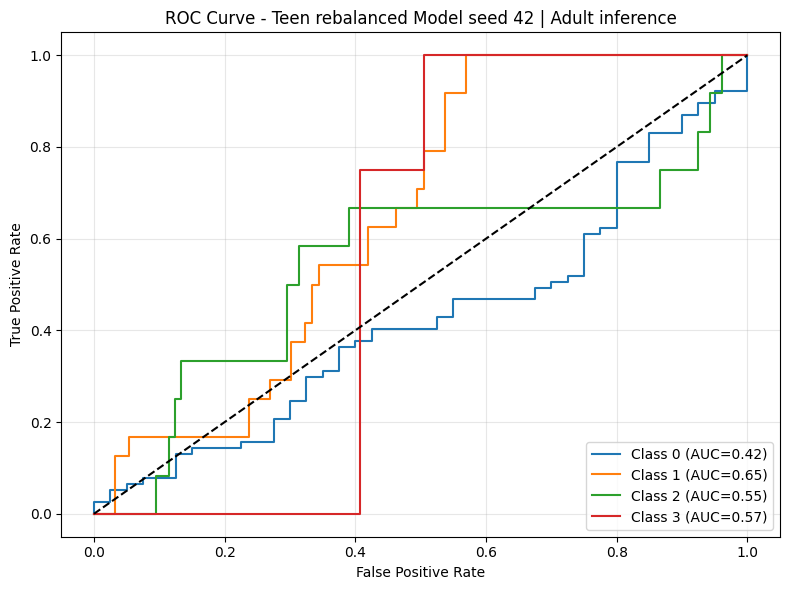


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_42_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_42_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_roc_curves/teen_rebalanced_model_seed_42_roc_curve.png

[TESTING] Teen rebalanced Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/roiseq_0ac614134a_seed43_best_model.pth
Загружены веса модели из чекпойнта: Experiments/4_th_experiment/checkpoints/teen_rebalanced_sea

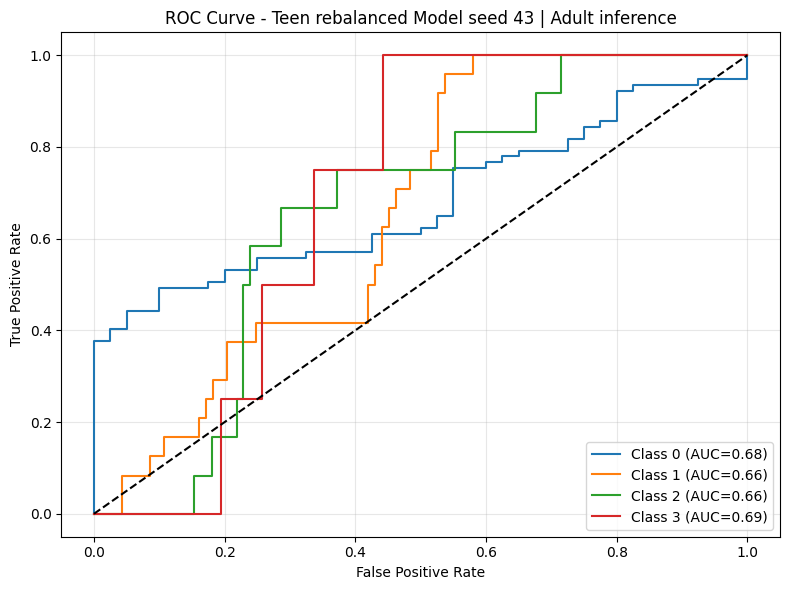


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_43_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_43_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_roc_curves/teen_rebalanced_model_seed_43_roc_curve.png

[TESTING] Teen rebalanced Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/roiseq_0ac614134a_seed44_best_model.pth
Загружены веса модели из чекпойнта: Experiments/4_th_experiment/checkpoints/teen_rebalanced_sea

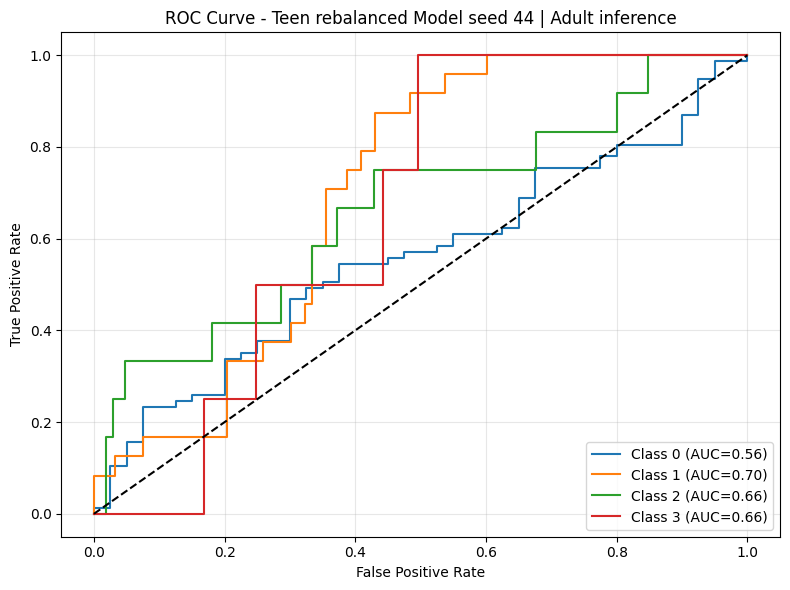


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_44_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_44_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_roc_curves/teen_rebalanced_model_seed_44_roc_curve.png

[TESTING] Teen rebalanced Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/roiseq_0ac614134a_seed45_best_model.pth
Загружены веса модели из чекпойнта: Experiments/4_th_experiment/checkpoints/teen_rebalanced_sea

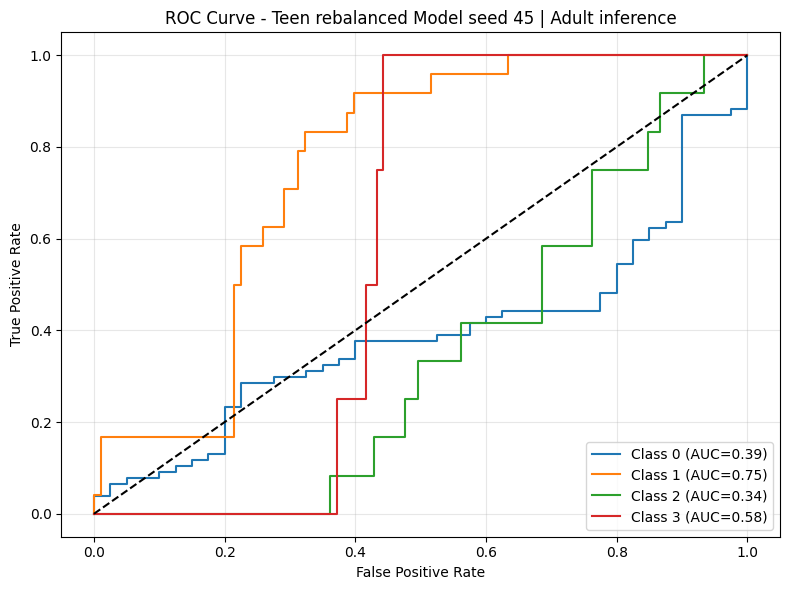


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_45_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_seed_45_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_roc_curves/teen_rebalanced_model_seed_45_roc_curve.png
[WARN] Checkpoint not found for seed 46 at expected path: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/roiseq_0ac614134a_seed46_best_model.pth. Skipping this seed.
[WARN] Checkpoint not found for seed 47 at expected path: Experiments/4_th_experiment/checkpoints/teen_rebalanced_search_best/roiseq_0ac614134a_seed47_best_model.pth. Skipping this seed.
[WARN] Checkpoint not found f

In [172]:
# ============================================================
# 4.3.1 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference
# ============================================================
model_name_teen_rebalanced = "Teen rebalanced Model"
best_cfg_teen_rebalanced_path = os.path.join(BEST_DIR_TEEN_REBALANCED_4, "best_config.json")

with open(best_cfg_teen_rebalanced_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced = json.load(f)
trial_id_teen_rebalanced = best_cfg_teen_rebalanced.get("trial_id")
if not trial_id_teen_rebalanced:
    raise KeyError("best_config.json for Teen rebalanced model has no 'trial_id'")

result_teen_rebalanced = test_best_model_all_seeds(
    best_config=best_cfg_teen_rebalanced,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_4,
    model_name=model_name_teen_rebalanced,
    test_loader=experiment_4_adult_rebalanced_inference_data_loader.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_subject_predictions_all_seeds"),
)

#### 4.3.2 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender


[TESTING] Teen rebalanced covariate gender Model seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/roiseq_79f379aea0_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/roiseq_79f379aea0_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_cov_gender_subject_predictions_all_seeds/roiseq_79f379aea0_seed42_subject_predictions.csv


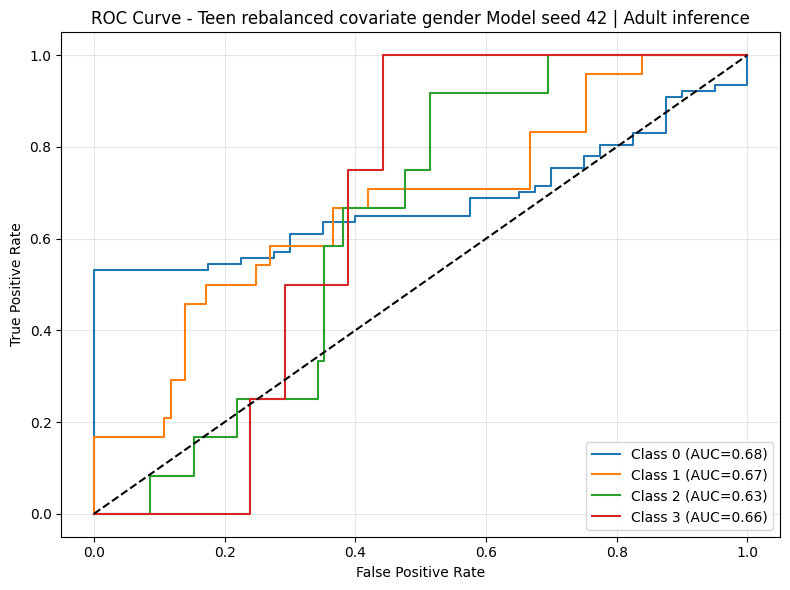


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_42_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_42_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_roc_curves/teen_rebalanced_covariate_gender_model_seed_42_roc_curve.png

[TESTING] Teen rebalanced covariate gender Model seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/roise

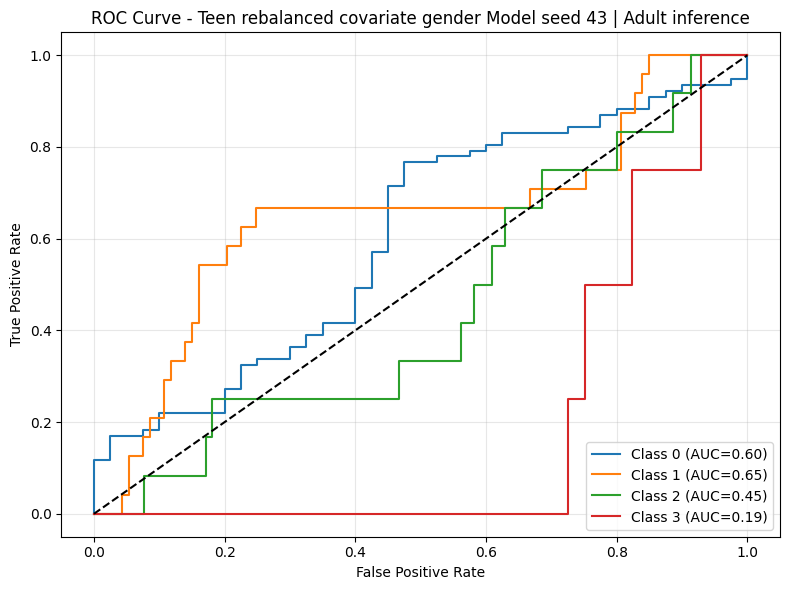


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_43_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_43_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_roc_curves/teen_rebalanced_covariate_gender_model_seed_43_roc_curve.png

[TESTING] Teen rebalanced covariate gender Model seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/roise

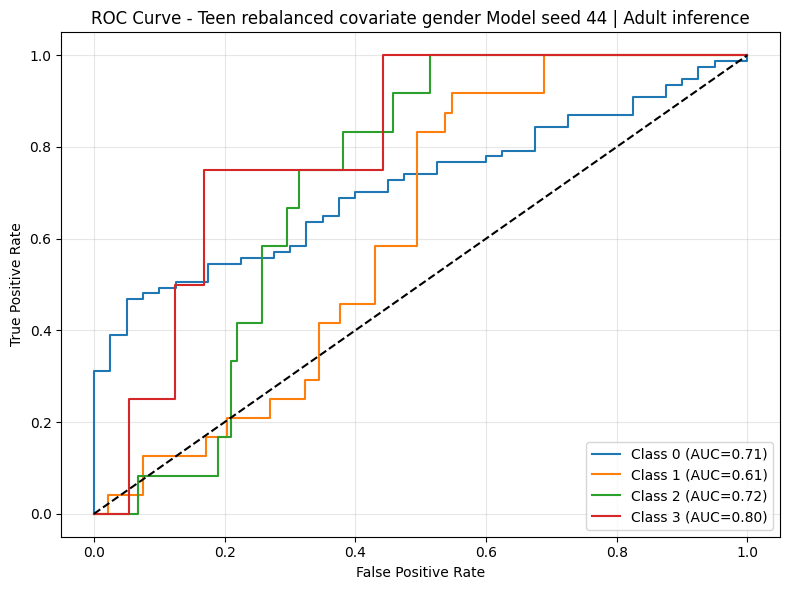


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_44_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_44_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_roc_curves/teen_rebalanced_covariate_gender_model_seed_44_roc_curve.png

[TESTING] Teen rebalanced covariate gender Model seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/roise

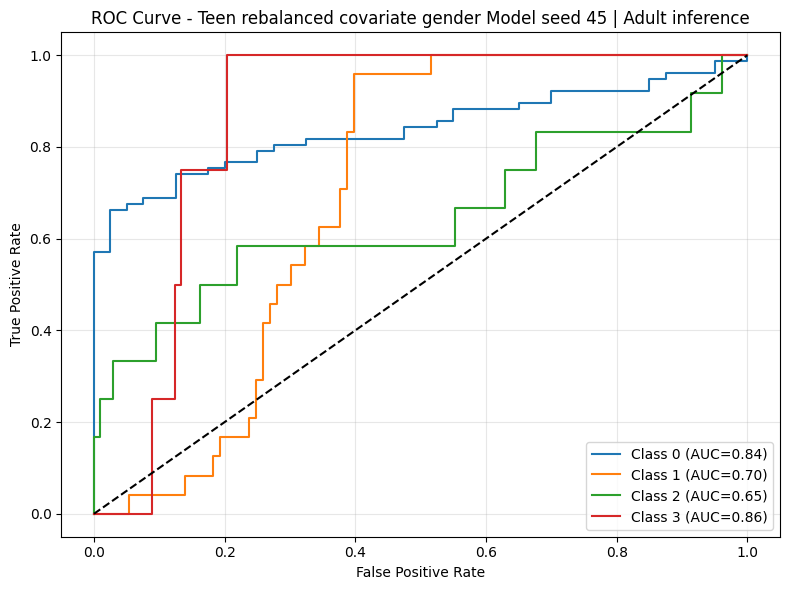


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_45_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_seed_45_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_covariate_gender_model_roc_curves/teen_rebalanced_covariate_gender_model_seed_45_roc_curve.png
[WARN] Checkpoint not found for seed 46 at expected path: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_search_best/roiseq_79f379aea0_seed46_best_model.pth. Skipping this seed.
[WARN] Checkpoint not found for seed 47 at expected path: Experiments/4_th_experiment/checkpoints/teen_

In [173]:
# ============================================================
# 4.3.2 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender
# ============================================================
model_name_teen_rebalanced_cov_gender = "Teen rebalanced covariate gender Model"
best_cfg_teen_rebalanced_cov_gender_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_4, "best_config.json")

with open(best_cfg_teen_rebalanced_cov_gender_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_cov_gender = json.load(f)
trial_id_teen_rebalanced_cov_gender = best_cfg_teen_rebalanced_cov_gender.get("trial_id")
if not trial_id_teen_rebalanced_cov_gender:
    raise KeyError("best_config.json for Teen rebalanced covariate gender model has no 'trial_id'")

result_teen_rebalanced_cov_gender = test_best_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_cov_gender,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_4,
    model_name=model_name_teen_rebalanced_cov_gender,
    test_loader=experiment_4_adult_rebalanced_inference_cov_gender_data_loader.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_cov_gender_subject_predictions_all_seeds"),
)

#### 4.3.3 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/roiseq_0ac614134a_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/roiseq_0ac614134a_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/roiseq_0ac614134a_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/roiseq_0ac614134a_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/roiseq_0ac614134a_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_experiment/checkpoints/teen_rebalanced_bin_search_best/roiseq_0ac614134a_seed47_best_model.pth; loading model.
[INFO] Che

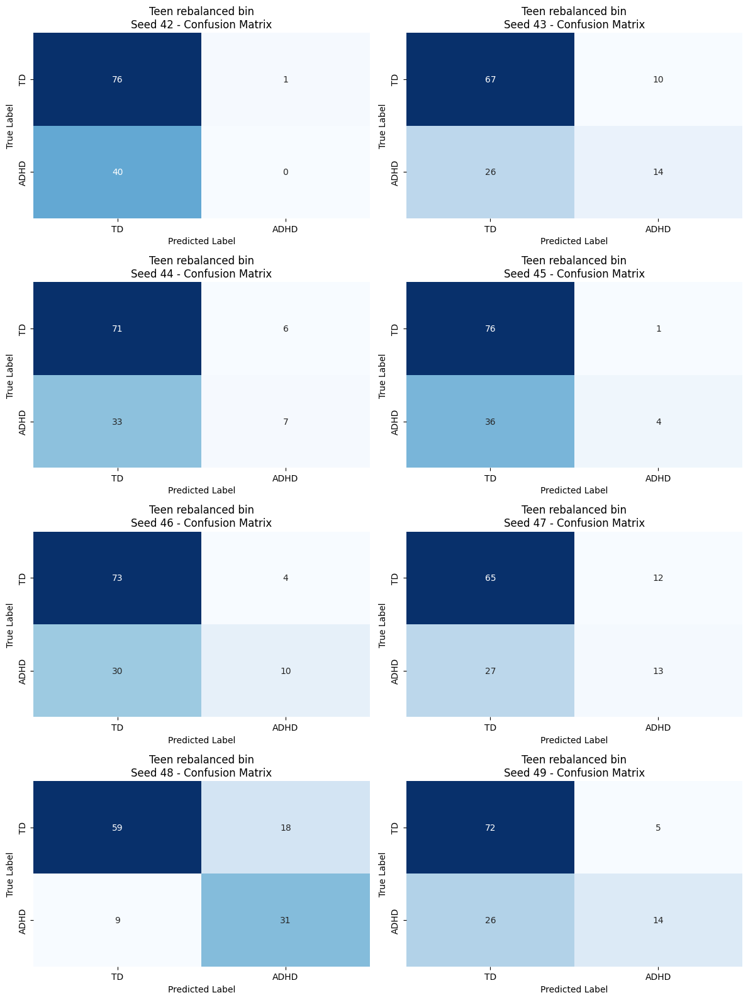

[Teen rebalanced bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced bin Model_aggregated_results.json
[Teen rebalanced bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_bin_subject_predictions_all_seeds.csv

[Teen rebalanced bin Model] Test Results on Inference:
    accuracy_mean: 0.6966
    accuracy_std: 0.0398
    balanced_accuracy_mean: 0.5990
    balanced_accuracy_std: 0.0832
    f1_macro_mean: 0.5752
    f1_macro_std: 0.1083
    auc_mean: 0.7976
    auc_std: 0.0559


In [174]:
# ============================================================
# 4.3.3 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference для бинарной классификации
# ============================================================
model_name_teen_rebalanced_bin = "Teen rebalanced bin Model"
best_cfg_teen_rebalanced_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_bin = json.load(f)
trial_id_teen_rebalanced_bin = best_cfg_teen_rebalanced_bin.get("trial_id")
if not trial_id_teen_rebalanced_bin:
    raise KeyError("best_config.json for Teen rebalanced bin model has no 'trial_id'")

result_teen_rebalanced_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_BIN_4,
    model_name=model_name_teen_rebalanced_bin,
    test_loader=experiment_4_adult_rebalanced_inference_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=experiment_4_adult_rebalanced_inference_data_loader_bin.cls_count,
    cov_dim=experiment_4_adult_rebalanced_inference_data_loader_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_bin_subject_predictions_all_seeds"),
)

#### 4.3.5 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best_fixed/roiseq_0d26ff648f_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best_fixed/roiseq_0d26ff648f_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best_fixed/roiseq_0d26ff648f_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best_fixed/roiseq_0d26ff648f_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_bin_search_best_fixed/roiseq_0d26ff648f_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_experiment/checkpoints/teen_rebalanc

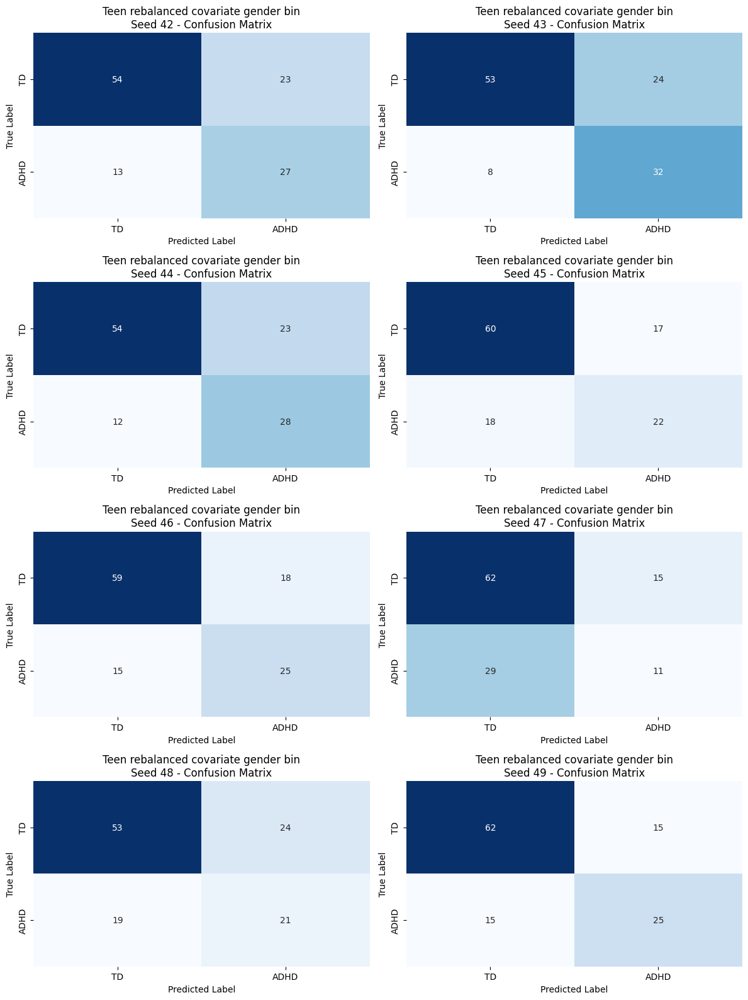

[Teen rebalanced covariate gender bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced covariate gender bin Model_aggregated_results.json
[Teen rebalanced covariate gender bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_cov_gender_bin_subject_predictions_all_seeds.csv

[Teen rebalanced covariate gender bin Model] Test Results on Inference:
    accuracy_mean: 0.6923
    accuracy_std: 0.0429
    balanced_accuracy_mean: 0.6694
    balanced_accuracy_std: 0.0659
    f1_macro_mean: 0.6611
    f1_macro_std: 0.0621
    auc_mean: 0.6522
    auc_std: 0.1362


In [175]:
# ============================================================
# 4.3.5 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации
# ============================================================
model_name_teen_rebalanced_cov_gender_bin = "Teen rebalanced covariate gender bin Model"
best_cfg_teen_rebalanced_cov_gender_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4, "best_config.json")

with open(best_cfg_teen_rebalanced_cov_gender_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_cov_gender_bin = json.load(f)
trial_id_teen_rebalanced_cov_gender_bin = best_cfg_teen_rebalanced_cov_gender_bin.get("trial_id")
if not trial_id_teen_rebalanced_cov_gender_bin:
    raise KeyError("best_config.json for Teen rebalanced covariate gender bin model has no 'trial_id'")

result_teen_rebalanced_cov_gender_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_cov_gender_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_BIN_FIXED_4,
    model_name=model_name_teen_rebalanced_cov_gender_bin,
    test_loader=experiment_4_adult_rebalanced_inference_cov_gender_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_cov_gender_bin_subject_predictions_all_seeds"),
)

#### 4.3.6 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации для минимальной границы взрослого датасета 19 лет

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_adult_min_19_bin_search_best/roiseq_0d26ff648f_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_adult_min_19_bin_search_best/roiseq_0d26ff648f_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_adult_min_19_bin_search_best/roiseq_0d26ff648f_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_adult_min_19_bin_search_best/roiseq_0d26ff648f_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_adult_min_19_bin_search_best/roiseq_0d26ff648f_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_e

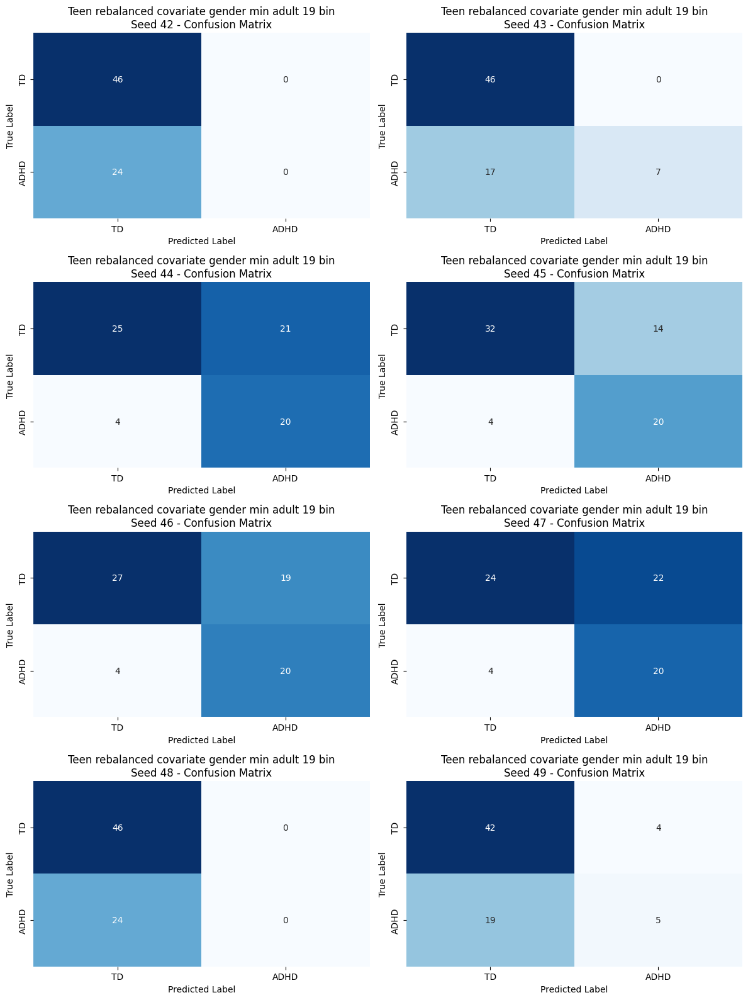

[Teen rebalanced covariate gender min adult 19 bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced covariate gender min adult 19 bin Model_aggregated_results.json
[Teen rebalanced covariate gender min adult 19 bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_cov_gender_min_adult_19_bin_subject_predictions_all_seeds.csv

[Teen rebalanced covariate gender min adult 19 bin Model] Test Results on Inference:
    accuracy_mean: 0.6786
    accuracy_std: 0.0464
    balanced_accuracy_mean: 0.6309
    balanced_accuracy_std: 0.0993
    f1_macro_mean: 0.5821
    f1_macro_std: 0.1259
    auc_mean: 0.7454
    auc_std: 0.0822


In [176]:
# ============================================================
# 4.3.6 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference
# с ковариатой gender для бинарной классификации для минимальной границы взрослого датасета 19 лет
# ============================================================
model_name_teen_rebalanced_cov_gender_min_adult_19_bin = "Teen rebalanced covariate gender min adult 19 bin Model"
best_cfg_teen_rebalanced_cov_gender_min_adult_19_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_cov_gender_min_adult_19_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_cov_gender_min_adult_19_bin = json.load(f)
trial_id_teen_rebalanced_cov_gender_min_adult_19_bin = best_cfg_teen_rebalanced_cov_gender_min_adult_19_bin.get("trial_id")
if not trial_id_teen_rebalanced_cov_gender_min_adult_19_bin:
    raise KeyError("best_config.json for Teen rebalanced covariate gender min adult 19 bin model has no 'trial_id'")

result_teen_rebalanced_cov_gender_min_adult_19_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_cov_gender_min_adult_19_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_ADULT_MIN_19_BIN_4,
    model_name=model_name_teen_rebalanced_cov_gender_min_adult_19_bin,
    test_loader=experiment_4_adult_rebalanced_inference_cov_gender_data_loader_adult_min_19_bin.inference_loader,
    device=DEVICE,
    n_classes=experiment_4_adult_rebalanced_inference_cov_gender_data_loader_adult_min_19_bin.cls_count,
    cov_dim=experiment_4_adult_rebalanced_inference_cov_gender_data_loader_adult_min_19_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_cov_gender_min_adult_19_bin_subject_predictions_all_seeds"),
)

#### 4.3.7 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатами gender и site для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_bin_search_best/roiseq_20d1507319_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_bin_search_best/roiseq_20d1507319_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_bin_search_best/roiseq_20d1507319_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_bin_search_best/roiseq_20d1507319_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_bin_search_best/roiseq_20d1507319_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_experiment/checkpoints/teen_rebalanced_co

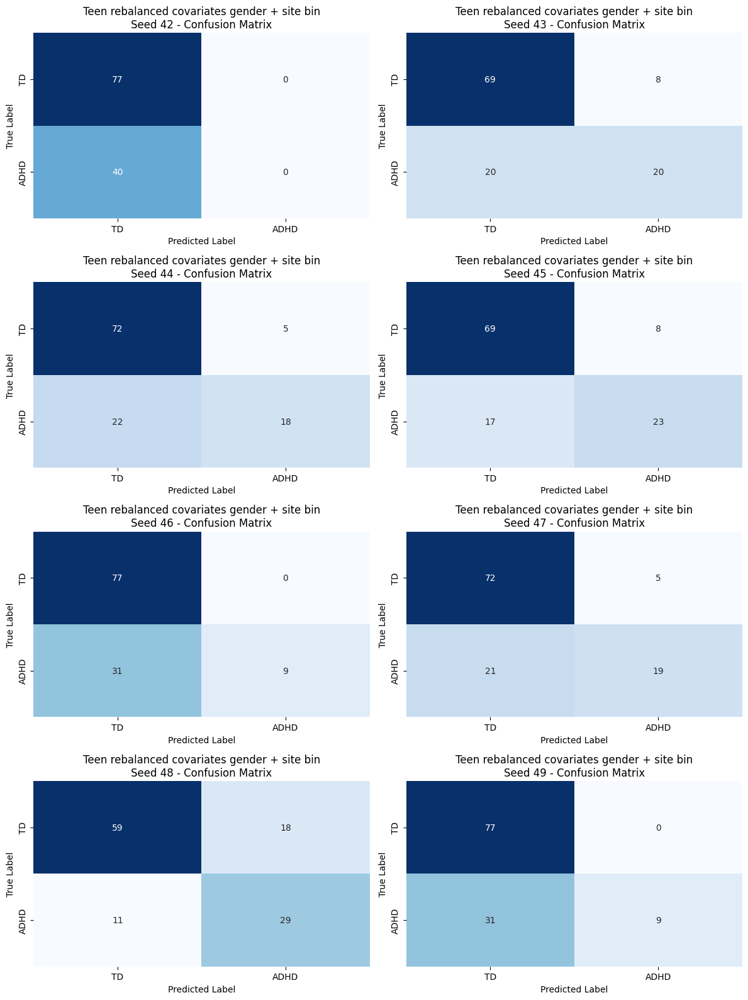

[Teen rebalanced covariates gender + site bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced covariates gender + site bin Model_aggregated_results.json
[Teen rebalanced covariates gender + site bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_cov_gender_site_bin_subject_predictions_all_seeds.csv

[Teen rebalanced covariates gender + site bin Model] Test Results on Inference:
    accuracy_mean: 0.7468
    accuracy_std: 0.0403
    balanced_accuracy_mean: 0.6627
    balanced_accuracy_std: 0.0825
    f1_macro_mean: 0.6519
    f1_macro_std: 0.1180
    auc_mean: 0.8397
    auc_std: 0.1289


In [177]:
# ============================================================
# 4.3.7 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатами gender и site для бинарной классификации
# ============================================================
model_name_teen_rebalanced_cov_gender_site_bin = "Teen rebalanced covariates gender + site bin Model"
best_cfg_teen_rebalanced_cov_gender_site_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_cov_gender_site_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_cov_gender_site_bin = json.load(f)
trial_id_teen_rebalanced_cov_gender_site_bin = best_cfg_teen_rebalanced_cov_gender_site_bin.get("trial_id")
if not trial_id_teen_rebalanced_cov_gender_site_bin:
    raise KeyError("best_config.json for Teen rebalanced covariates gender + site bin model has no 'trial_id'")

result_teen_rebalanced_cov_gender_site_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_cov_gender_site_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_BIN_4,
    model_name=model_name_teen_rebalanced_cov_gender_site_bin,
    test_loader=experiment_4_adult_rebalanced_inference_cov_gender_site_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_4_adult_rebalanced_inference_cov_gender_site_data_loader_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_cov_gender_site_bin_subject_predictions_all_seeds"),
)

### 4.4 Тестирование обученных моделей на инференсе из Adult rebalanced (без класса №2)

#### 4.4.1 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без класса 2


[TESTING] Teen rebalanced Model exclude class 2 seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/roiseq_20d1507319_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/roiseq_20d1507319_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_excl_2_subject_predictions_all_seeds/roiseq_20d1507319_seed42_subject_predictions.csv


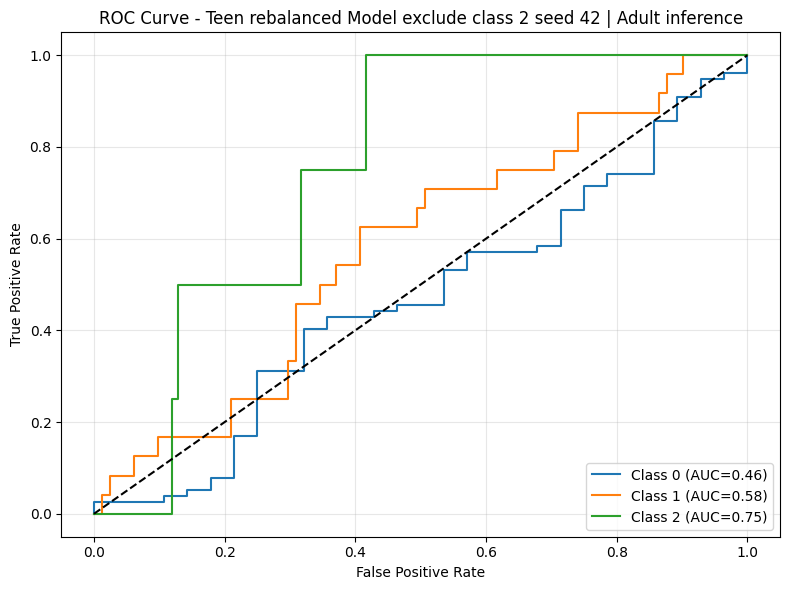


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_42_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_42_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_roc_curves/teen_rebalanced_model_exclude_class_2_seed_42_roc_curve.png

[TESTING] Teen rebalanced Model exclude class 2 seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/roiseq_20d15

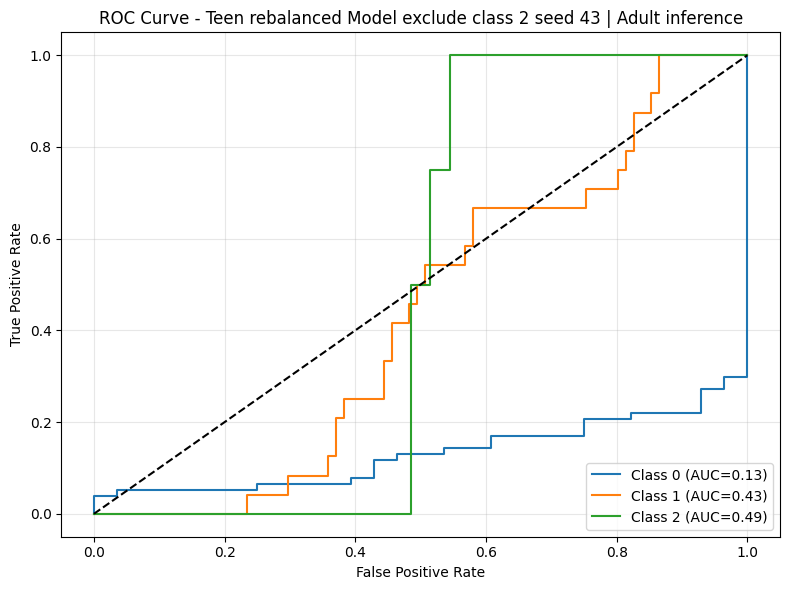


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_43_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_43_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_roc_curves/teen_rebalanced_model_exclude_class_2_seed_43_roc_curve.png

[TESTING] Teen rebalanced Model exclude class 2 seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/roiseq_20d15

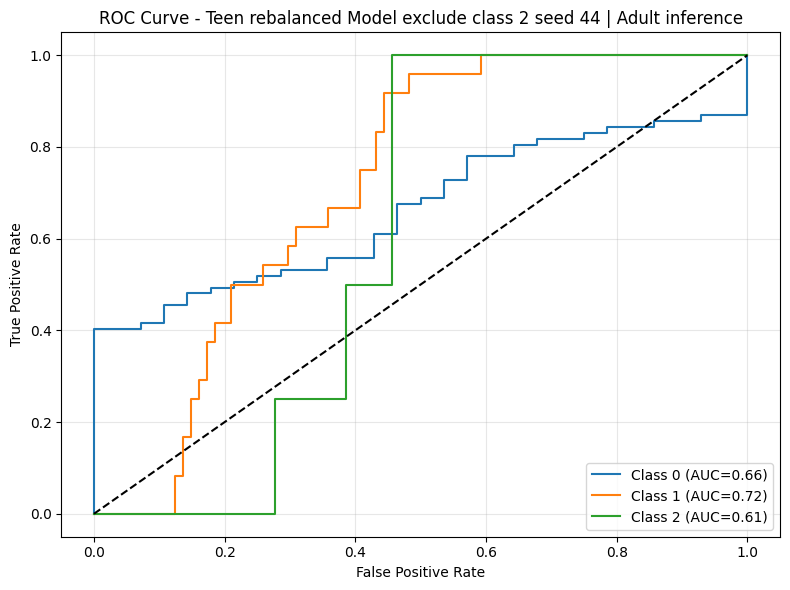


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_44_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_44_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_roc_curves/teen_rebalanced_model_exclude_class_2_seed_44_roc_curve.png

[TESTING] Teen rebalanced Model exclude class 2 seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/roiseq_20d15

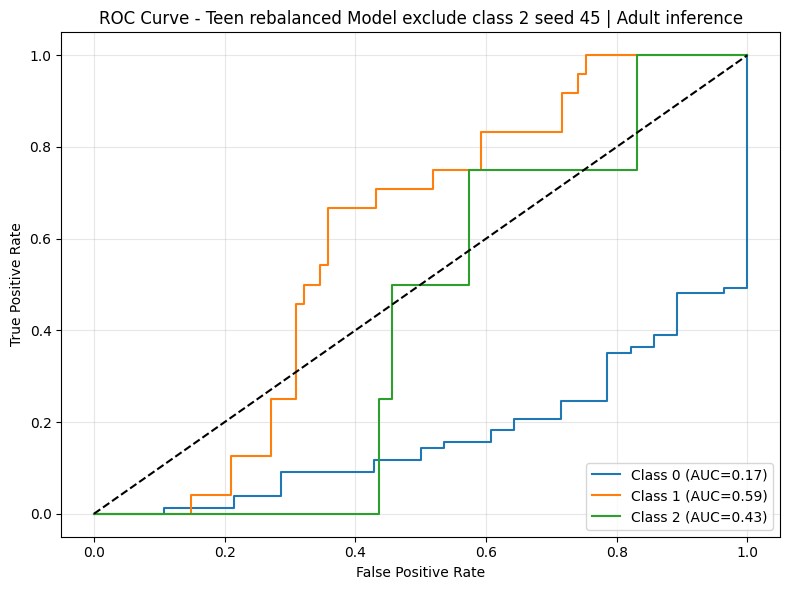


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_45_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_seed_45_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_roc_curves/teen_rebalanced_model_exclude_class_2_seed_45_roc_curve.png
[WARN] Checkpoint not found for seed 46 at expected path: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_search_best/roiseq_20d1507319_seed46_best_model.pth. Skipping this seed.
[WARN] Checkpoint not found for seed 47 at expected path: Experiments/4_th_experiment/checkpoints/teen_rebala

In [178]:
# ============================================================
# 4.4.1 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без класса 2
# ============================================================
model_name_teen_rebalanced_excl_2 = "Teen rebalanced Model exclude class 2"
best_cfg_teen_rebalanced_path_excl_2 = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4, "best_config.json")

with open(best_cfg_teen_rebalanced_path_excl_2, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_excl_2 = json.load(f)
trial_id_teen_rebalanced_excl_2 = best_cfg_teen_rebalanced_excl_2.get("trial_id")
if not trial_id_teen_rebalanced_excl_2:
    raise KeyError("best_config.json for Teen rebalanced model exclude class 2 has no 'trial_id'")

result_teen_rebalanced_excl_2 = test_best_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_excl_2,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_4,
    model_name=model_name_teen_rebalanced_excl_2,
    test_loader=experiment_4_adult_rebalanced_inference_excl_2_data_loader.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_EXCL_2,
    cov_dim=COV_DIM,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_excl_2_subject_predictions_all_seeds"),
)

#### 4.4.2 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без класса 2 с ковариатой gender


[TESTING] Teen rebalanced Model exclude class 2 covariate gender seed 42 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_csv', 'note'] | Checkpoint: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_search_best/roiseq_d82e6e624c_seed42_best_model.pth
Загружены веса модели из чекпойнта: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_search_best/roiseq_d82e6e624c_seed42_best_model.pth
[SUBJECT RESULTS] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_excl_2_cov_gender_subject_predictions_all_seeds/roiseq_d82e6e624c_seed42_subject_predictions.csv


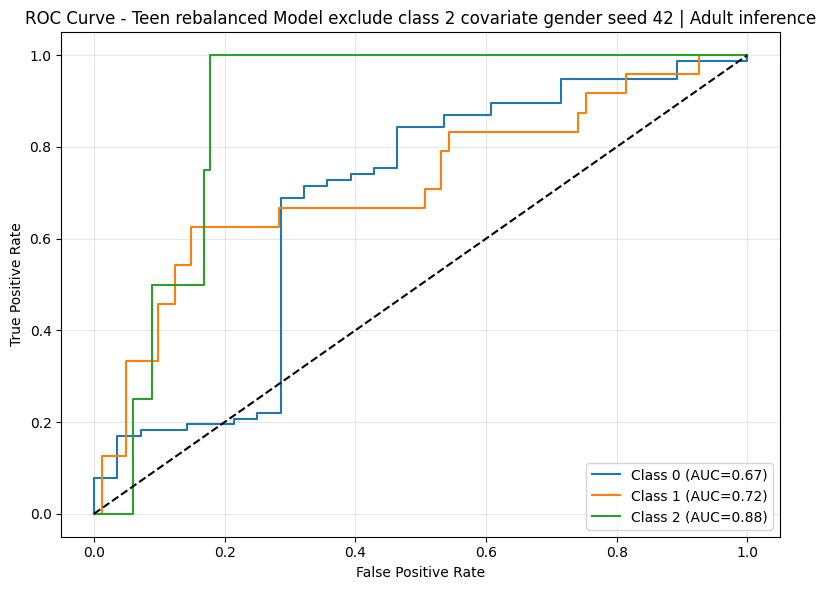


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_42_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_42_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_42_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_42_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_roc_curves/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_42_roc_curve.png

[TESTING] Teen rebalanced Model exclude class 2 covariate gender seed 43 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_

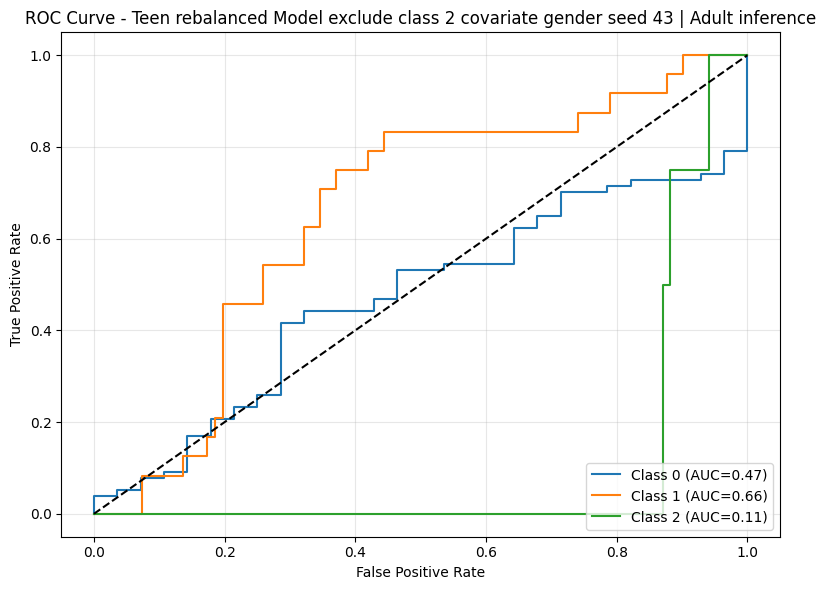


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_43_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_43_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_43_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_43_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_roc_curves/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_43_roc_curve.png

[TESTING] Teen rebalanced Model exclude class 2 covariate gender seed 44 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_

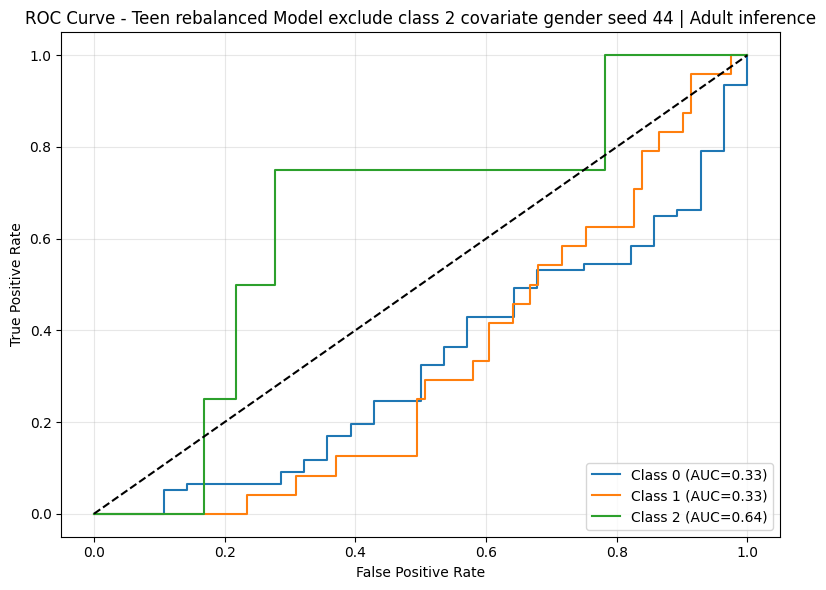


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_44_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_44_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_44_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_44_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_roc_curves/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_44_roc_curve.png

[TESTING] Teen rebalanced Model exclude class 2 covariate gender seed 45 | Config keys: ['trial_id', 'mean_val_auc', 'std_val_auc', 'hp', 'seeds', 'search_seed', 'final_train_seeds', 'final_train_results_

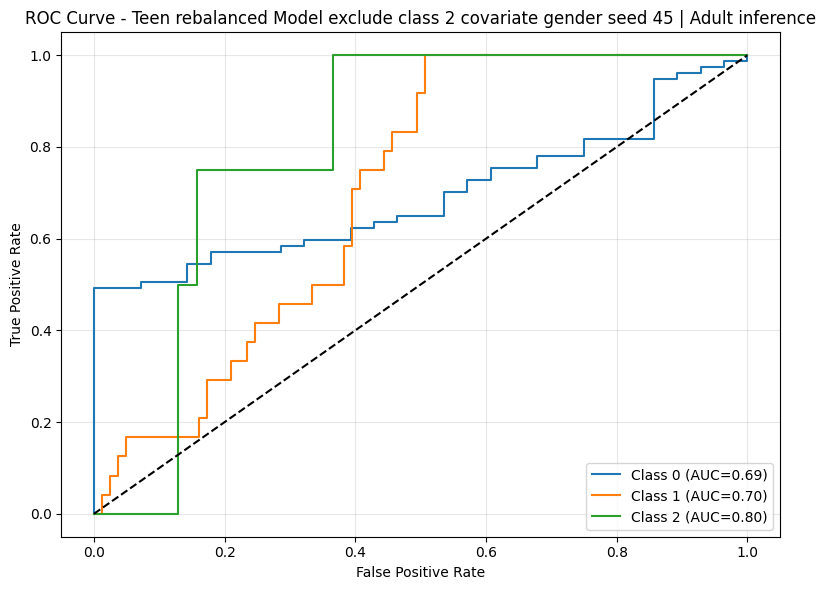


Результаты тестирования сохранены:
- Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_45_test_results.json
[ROC] Saved: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_45_roc_curve.png
[INFO] Attempting to remove old test results at: Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_45_test_results.json
[INFO] Moved ROC curve from Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_45_roc_curve.png to Experiments/4_th_experiment/test_results/teen_rebalanced_model_exclude_class_2_covariate_gender_roc_curves/teen_rebalanced_model_exclude_class_2_covariate_gender_seed_45_roc_curve.png
[WARN] Checkpoint not found for seed 46 at expected path: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_search_best/roiseq_d82e6e624c_seed46_best_model.pth. Skipping this se

In [179]:
# ============================================================
# 4.3.4 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без класса 2 с ковариатой gender
# ============================================================
model_name_teen_rebalanced_excl_2_cov_gender = "Teen rebalanced Model exclude class 2 covariate gender"
best_cfg_teen_rebalanced_path_excl_2_cov_gender = os.path.join(BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4, "best_config.json")

with open(best_cfg_teen_rebalanced_path_excl_2_cov_gender, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_excl_2_cov_gender = json.load(f)
trial_id_teen_rebalanced_excl_2_cov_gender = best_cfg_teen_rebalanced_excl_2_cov_gender.get("trial_id")
if not trial_id_teen_rebalanced_excl_2_cov_gender:
    raise KeyError("best_config.json for Teen rebalanced model exclude class 2 covariate gender has no 'trial_id'")

result_teen_rebalanced_excl_2_cov_gender = test_best_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_excl_2_cov_gender,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NO_CLASS_2_COV_GENDER_4,
    model_name=model_name_teen_rebalanced_excl_2_cov_gender,
    test_loader=experiment_4_adult_rebalanced_inference_excl_2_cov_gender_data_loader.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_EXCL_2,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_excl_2_cov_gender_subject_predictions_all_seeds"),
)

#### 4.4.3 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без класса 2 с ковариатой gender для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best_fixed/roiseq_d82e6e624c_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best_fixed/roiseq_d82e6e624c_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best_fixed/roiseq_d82e6e624c_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best_fixed/roiseq_d82e6e624c_seed45_best_model.pth; loading model.
[WARN] Checkpoint not found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_no_class_2_cov_gender_bin_search_best_fixed/roiseq_d82e6e624c_seed46_best_model.pth; skipping this seed.
[WARN] Checkpoint not foun

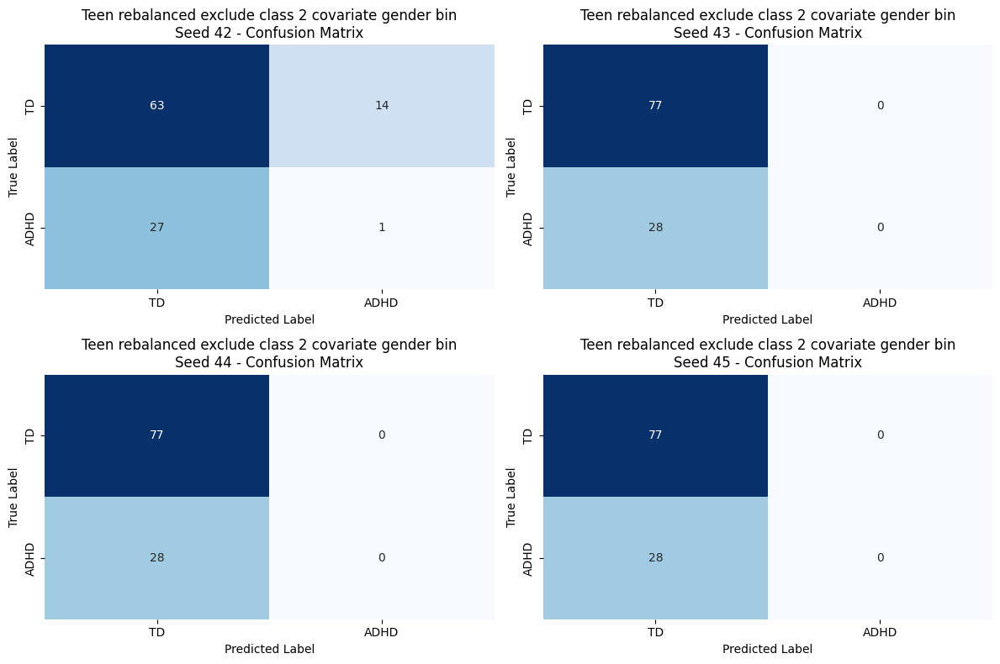

[Teen rebalanced Model exclude class 2 covariate gender bin] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced Model exclude class 2 covariate gender bin_aggregated_results.json
[Teen rebalanced Model exclude class 2 covariate gender bin] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_excl_2_cov_gender_bin_subject_predictions_all_seeds.csv

[Teen rebalanced Model exclude class 2 covariate gender bin] Test Results on Inference:
    accuracy_mean: 0.7024
    accuracy_std: 0.0619
    balanced_accuracy_mean: 0.4817
    balanced_accuracy_std: 0.0365
    f1_macro_mean: 0.4174
    f1_macro_std: 0.0113
    auc_mean: 0.5290
    auc_std: 0.1536


In [180]:
# ============================================================
# 4.4.3 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без класса 2 с ковариатой gender для бинарной классификации
# ============================================================
model_name_teen_rebalanced_excl_2_cov_gender_bin = "Teen rebalanced Model exclude class 2 covariate gender bin"
best_cfg_teen_rebalanced_path_excl_2_cov_gender_bin = os.path.join(BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4, "best_config.json")

with open(best_cfg_teen_rebalanced_path_excl_2_cov_gender_bin, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_excl_2_cov_gender_bin = json.load(f)
trial_id_teen_rebalanced_excl_2_cov_gender_bin = best_cfg_teen_rebalanced_excl_2_cov_gender_bin.get("trial_id")
if not trial_id_teen_rebalanced_excl_2_cov_gender_bin:
    raise KeyError("best_config.json for Teen rebalanced model exclude class 2 covariate gender bin has no 'trial_id'")

result_teen_rebalanced_excl_2_cov_gender_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_excl_2_cov_gender_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_INFERENCE_NO_CLASS_2_COV_GENDER_BIN_FIXED_4,
    model_name=model_name_teen_rebalanced_excl_2_cov_gender_bin,
    test_loader=experiment_4_adult_rebalanced_inference_excl_2_cov_gender_bin_data_loader.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_excl_2_cov_gender_bin_subject_predictions_all_seeds"),
)

### 4.5 Тестирование моделей с альтернативными минимальными возрастными порогами на подростковой выборке

#### 4.5.1 Тестирование модели на пороге 13+ лет, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_13_bin_search_best/roiseq_0d26ff648f_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_13_bin_search_best/roiseq_0d26ff648f_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_13_bin_search_best/roiseq_0d26ff648f_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_13_bin_search_best/roiseq_0d26ff648f_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_13_bin_search_best/roiseq_0d26ff648f_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_experiment/checkpoints/teen_reb

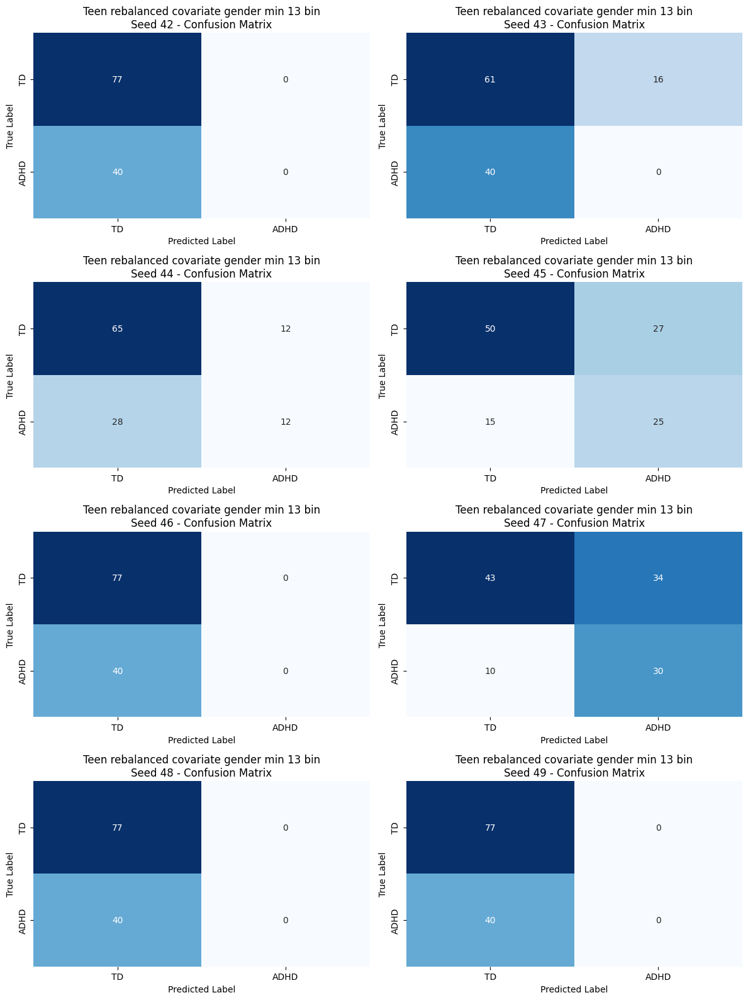

[Teen rebalanced covariate gender min 13 bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced covariate gender min 13 bin Model_aggregated_results.json
[Teen rebalanced covariate gender min 13 bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_cov_gender_min_13_bin_subject_predictions_all_seeds.csv

[Teen rebalanced covariate gender min 13 bin Model] Test Results on Inference:
    accuracy_mean: 0.6346
    accuracy_std: 0.0474
    balanced_accuracy_mean: 0.5324
    balanced_accuracy_std: 0.0847
    f1_macro_mean: 0.4679
    f1_macro_std: 0.1155
    auc_mean: 0.5989
    auc_std: 0.1638


In [181]:
# ============================================================
# 4.5.1 Тестирование модели на пороге 13+ лет, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации
# ============================================================
model_name_teen_rebalanced_cov_gender_min_13_bin = "Teen rebalanced covariate gender min 13 bin Model"
best_cfg_teen_rebalanced_cov_gender_min_13_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_cov_gender_min_13_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_cov_gender_min_13_bin = json.load(f)
trial_id_teen_rebalanced_cov_gender_min_13_bin = best_cfg_teen_rebalanced_cov_gender_min_13_bin.get("trial_id")
if not trial_id_teen_rebalanced_cov_gender_min_13_bin:
    raise KeyError("best_config.json for Teen rebalanced covariate gender min 13 bin model has no 'trial_id'")

result_teen_rebalanced_cov_gender_min_13_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_cov_gender_min_13_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_13_BIN_4,
    model_name=model_name_teen_rebalanced_cov_gender_min_13_bin,
    test_loader=experiment_4_adult_rebalanced_inference_cov_gender_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_cov_gender_min_13_bin_subject_predictions_all_seeds"),
)

#### 4.5.2 Тестирование модели на пороге 12+ лет, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_12_bin_search_best/roiseq_0d26ff648f_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_12_bin_search_best/roiseq_0d26ff648f_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_12_bin_search_best/roiseq_0d26ff648f_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_12_bin_search_best/roiseq_0d26ff648f_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_min_12_bin_search_best/roiseq_0d26ff648f_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_experiment/checkpoints/teen_reb

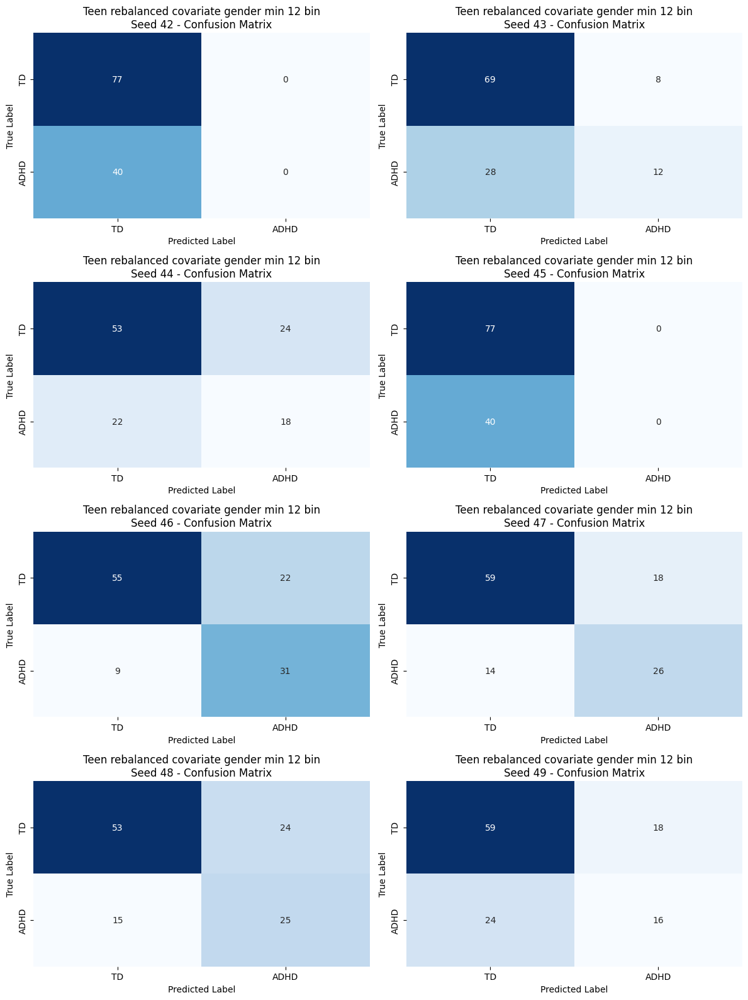

[Teen rebalanced covariate gender min 12 bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced covariate gender min 12 bin Model_aggregated_results.json
[Teen rebalanced covariate gender min 12 bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_cov_gender_min_12_bin_subject_predictions_all_seeds.csv

[Teen rebalanced covariate gender min 12 bin Model] Test Results on Inference:
    accuracy_mean: 0.6731
    accuracy_std: 0.0430
    balanced_accuracy_mean: 0.6075
    balanced_accuracy_std: 0.0899
    f1_macro_mean: 0.5770
    f1_macro_std: 0.1239
    auc_mean: 0.7313
    auc_std: 0.0932


In [182]:
# ============================================================
# 4.5.2 Тестирование модели на пороге 12+ лет, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации
# ============================================================
model_name_teen_rebalanced_cov_gender_min_12_bin = "Teen rebalanced covariate gender min 12 bin Model"
best_cfg_teen_rebalanced_cov_gender_min_12_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_cov_gender_min_12_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_cov_gender_min_12_bin = json.load(f)
trial_id_teen_rebalanced_cov_gender_min_12_bin = best_cfg_teen_rebalanced_cov_gender_min_12_bin.get("trial_id")
if not trial_id_teen_rebalanced_cov_gender_min_12_bin:
    raise KeyError("best_config.json for Teen rebalanced covariate gender min 12 bin model has no 'trial_id'")

result_teen_rebalanced_cov_gender_min_12_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_cov_gender_min_12_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_MIN_12_BIN_4,
    model_name=model_name_teen_rebalanced_cov_gender_min_12_bin,
    test_loader=experiment_4_adult_rebalanced_inference_cov_gender_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_GENDER,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_cov_gender_min_12_bin_subject_predictions_all_seeds"),
)

#### 4.5.3 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатами gender и site для бинарной классификации для минимальной границы взрослого датасета 19 лет

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for se

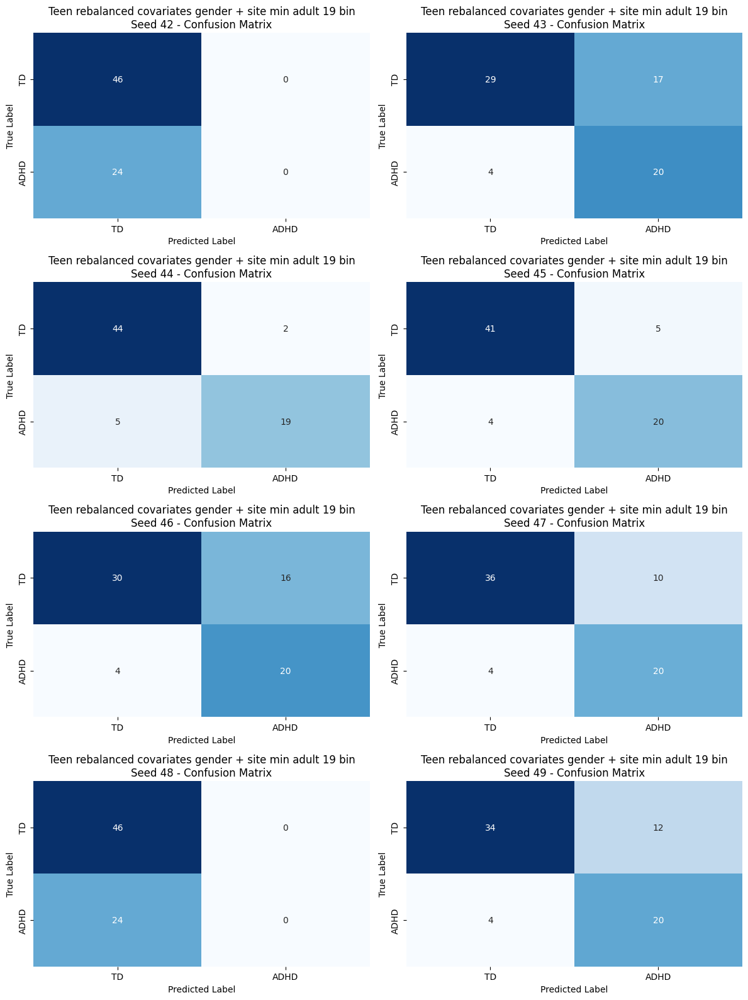

[Teen rebalanced covariates gender + site min adult 19 bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced covariates gender + site min adult 19 bin Model_aggregated_results.json
[Teen rebalanced covariates gender + site min adult 19 bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_cov_gender_site_min_adult_19_bin_subject_predictions_all_seeds.csv

[Teen rebalanced covariates gender + site min adult 19 bin Model] Test Results on Inference:
    accuracy_mean: 0.7589
    accuracy_std: 0.0930
    balanced_accuracy_mean: 0.7257
    balanced_accuracy_std: 0.1480
    f1_macro_mean: 0.6864
    f1_macro_std: 0.1905
    auc_mean: 0.8286
    auc_std: 0.1462


In [183]:
# ============================================================
# 4.5.3 Тестирование модели, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатами gender и site для бинарной классификации для минимальной границы взрослого датасета 19 лет
# ============================================================
model_name_teen_rebalanced_cov_gender_site_min_adult_19_bin = "Teen rebalanced covariates gender + site min adult 19 bin Model"
best_cfg_teen_rebalanced_cov_gender_site_min_adult_19_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_cov_gender_site_min_adult_19_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_cov_gender_site_min_adult_19_bin = json.load(f)
trial_id_teen_rebalanced_cov_gender_site_min_adult_19_bin = best_cfg_teen_rebalanced_cov_gender_site_min_adult_19_bin.get("trial_id")
if not trial_id_teen_rebalanced_cov_gender_site_min_adult_19_bin:
    raise KeyError("best_config.json for Teen rebalanced covariates gender + site min adult 19 bin model has no 'trial_id'")

result_teen_rebalanced_cov_gender_site_min_adult_19_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_cov_gender_site_min_adult_19_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4,
    model_name=model_name_teen_rebalanced_cov_gender_site_min_adult_19_bin,
    test_loader=experiment_4_adult_rebalanced_inference_cov_gender_site_data_loader_adult_min_19_bin.inference_loader,
    device=DEVICE,
    n_classes=experiment_4_adult_rebalanced_inference_cov_gender_site_data_loader_adult_min_19_bin.cls_count,
    cov_dim=experiment_4_adult_rebalanced_inference_cov_gender_site_data_loader_adult_min_19_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_cov_gender_site_min_adult_19_bin_subject_predictions_all_seeds"),
)

### 4.6 Тестирование моделей с нормализованными ROI-таймсериями

#### 4.6.1 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без ковариат для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/roiseq_6e1ca3fc3f_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/roiseq_6e1ca3fc3f_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/roiseq_6e1ca3fc3f_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/roiseq_6e1ca3fc3f_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/roiseq_6e1ca3fc3f_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_bin_search_best/

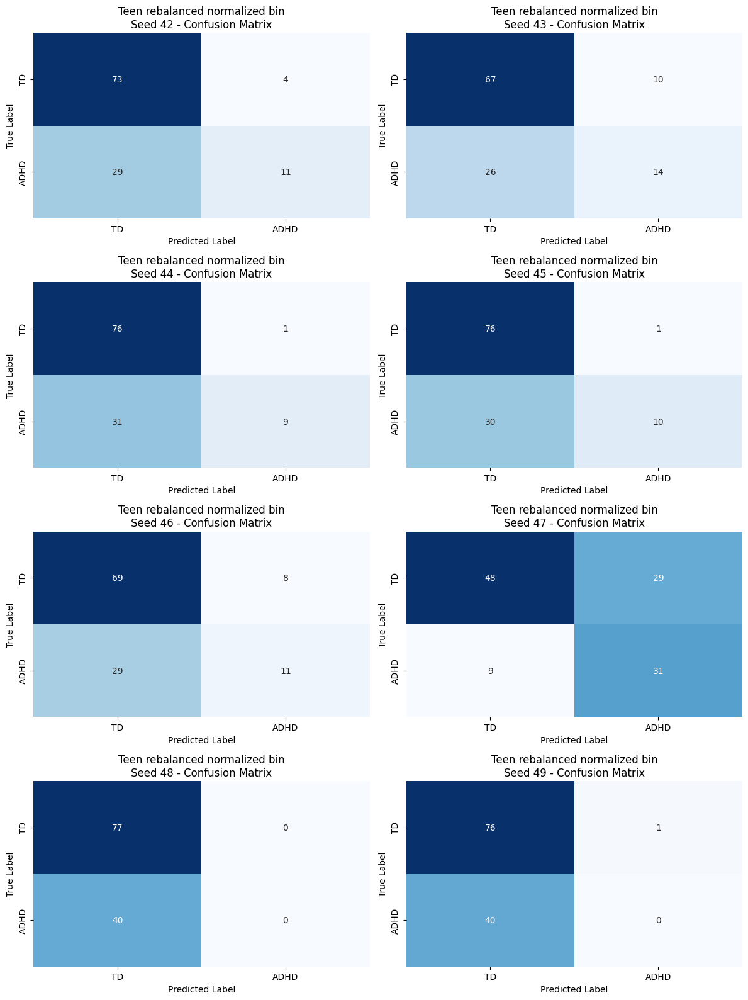

[Teen rebalanced normalized bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced normalized bin Model_aggregated_results.json
[Teen rebalanced normalized bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_normalized_bin_subject_predictions_all_seeds.csv

[Teen rebalanced normalized bin Model] Test Results on Inference:
    accuracy_mean: 0.6923
    accuracy_std: 0.0317
    balanced_accuracy_mean: 0.5905
    balanced_accuracy_std: 0.0669
    f1_macro_mean: 0.5581
    f1_macro_std: 0.1036
    auc_mean: 0.7718
    auc_std: 0.0782


In [184]:
# ============================================================
# 4.6.1 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без ковариат для бинарной классификации
# ============================================================
model_name_teen_rebalanced_normalized_bin = "Teen rebalanced normalized bin Model"
best_cfg_teen_rebalanced_normalized_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_normalized_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_normalized_bin = json.load(f)
trial_id_teen_rebalanced_normalized_bin = best_cfg_teen_rebalanced_normalized_bin.get("trial_id")
if not trial_id_teen_rebalanced_normalized_bin:
    raise KeyError("best_config.json for Teen rebalanced normalized bin model has no 'trial_id'")

result_teen_rebalanced_normalized_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_normalized_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_BIN_4,
    model_name=model_name_teen_rebalanced_normalized_bin,
    test_loader=experiment_4_adult_rebalanced_normalized_inference_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_4_adult_rebalanced_normalized_inference_data_loader_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_normalized_bin_subject_predictions_all_seeds"),
)

#### 4.6.2 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_bin_search_best/roiseq_286490f8a4_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_bin_search_best/roiseq_286490f8a4_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_bin_search_best/roiseq_286490f8a4_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_bin_search_best/roiseq_286490f8a4_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_bin_search_best/roiseq_286490f8a4_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_experiment/

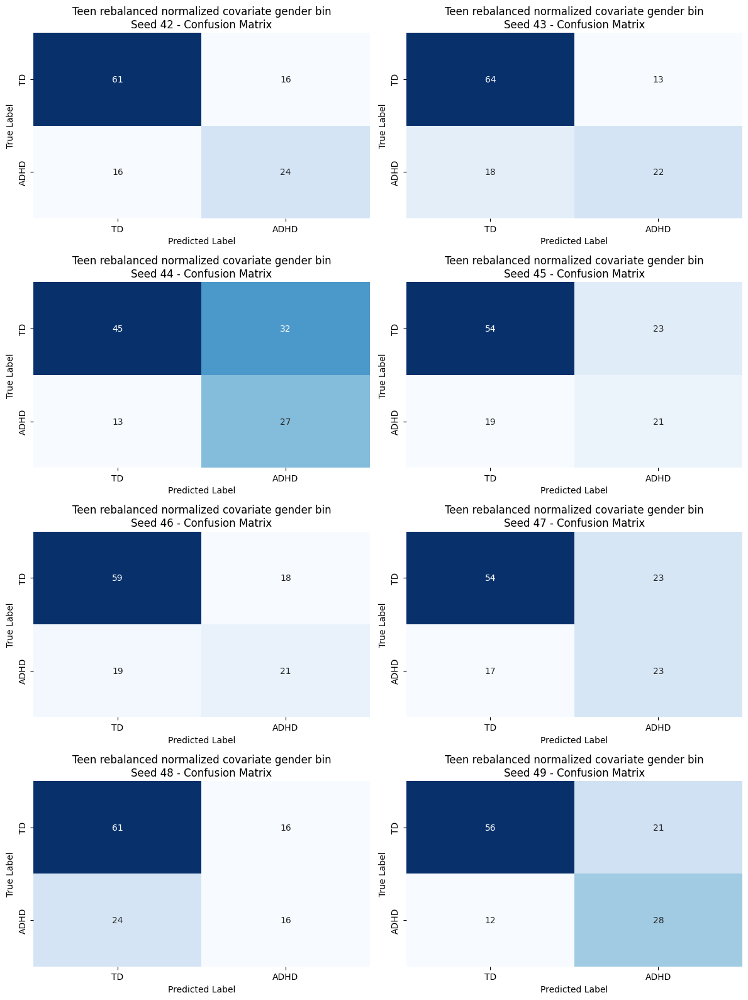

[Teen rebalanced normalized covariate gender bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced normalized covariate gender bin Model_aggregated_results.json
[Teen rebalanced normalized covariate gender bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_normalized_cov_gender_bin_subject_predictions_all_seeds.csv

[Teen rebalanced normalized covariate gender bin Model] Test Results on Inference:
    accuracy_mean: 0.6795
    accuracy_std: 0.0436
    balanced_accuracy_mean: 0.6529
    balanced_accuracy_std: 0.0424
    f1_macro_mean: 0.6483
    f1_macro_std: 0.0435
    auc_mean: 0.7340
    auc_std: 0.0586


In [185]:
# ============================================================
# 4.6.2 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации
# ============================================================
model_name_teen_rebalanced_normalized_cov_gender_bin = "Teen rebalanced normalized covariate gender bin Model"
best_cfg_teen_rebalanced_normalized_cov_gender_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_normalized_cov_gender_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_normalized_cov_gender_bin = json.load(f)
trial_id_teen_rebalanced_normalized_cov_gender_bin = best_cfg_teen_rebalanced_normalized_cov_gender_bin.get("trial_id")
if not trial_id_teen_rebalanced_normalized_cov_gender_bin:
    raise KeyError("best_config.json for Teen rebalanced normalized covariate gender bin model has no 'trial_id'")

result_teen_rebalanced_normalized_cov_gender_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_normalized_cov_gender_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_BIN_4,
    model_name=model_name_teen_rebalanced_normalized_cov_gender_bin,
    test_loader=experiment_4_adult_rebalanced_normalized_inference_cov_gender_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_4_adult_rebalanced_normalized_inference_cov_gender_data_loader_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_normalized_cov_gender_bin_subject_predictions_all_seeds"),
)

#### 4.6.3 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатами gender и site_original для бинарной классификации

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_bin_search_best/roiseq_4042de6092_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_bin_search_best/roiseq_4042de6092_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_bin_search_best/roiseq_4042de6092_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_bin_search_best/roiseq_4042de6092_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_bin_search_best/roiseq_4042de6092_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Exp

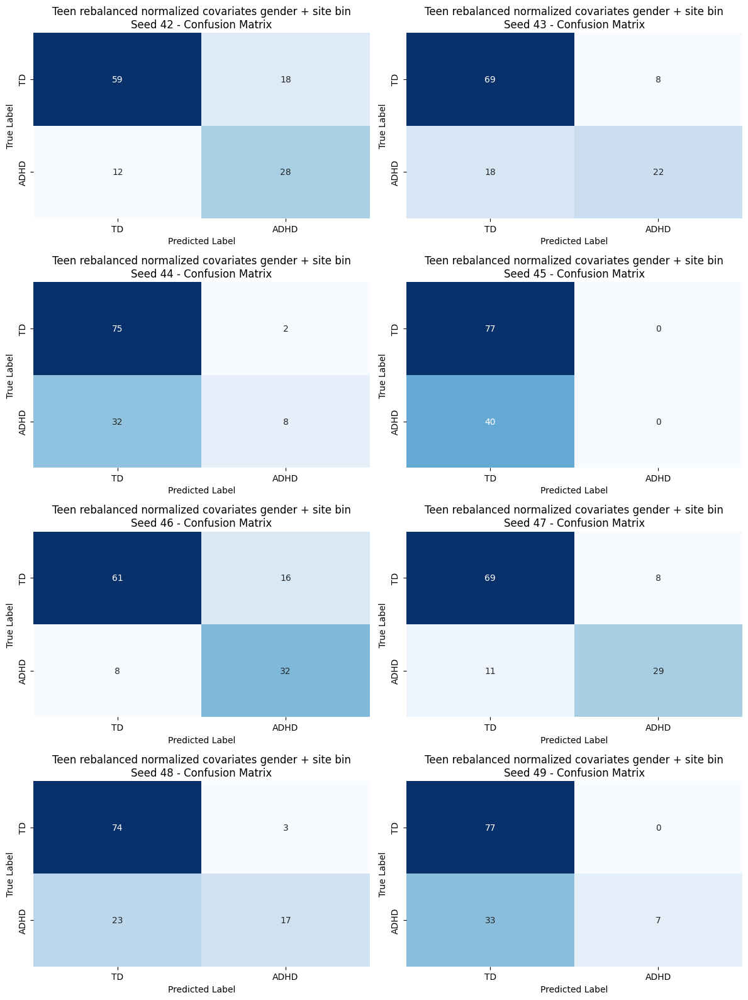

[Teen rebalanced normalized covariates gender + site bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced normalized covariates gender + site bin Model_aggregated_results.json
[Teen rebalanced normalized covariates gender + site bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_normalized_cov_gender_site_bin_subject_predictions_all_seeds.csv

[Teen rebalanced normalized covariates gender + site bin Model] Test Results on Inference:
    accuracy_mean: 0.7521
    accuracy_std: 0.0565
    balanced_accuracy_mean: 0.6788
    balanced_accuracy_std: 0.1102
    f1_macro_mean: 0.6613
    f1_macro_std: 0.1408
    auc_mean: 0.9042
    auc_std: 0.0235


In [186]:
# ============================================================
# 4.6.3 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатами gender и site_original для бинарной классификации
# ============================================================
model_name_teen_rebalanced_normalized_cov_gender_site_bin = "Teen rebalanced normalized covariates gender + site bin Model"
best_cfg_teen_rebalanced_normalized_cov_gender_site_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_normalized_cov_gender_site_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_normalized_cov_gender_site_bin = json.load(f)
trial_id_teen_rebalanced_normalized_cov_gender_site_bin = best_cfg_teen_rebalanced_normalized_cov_gender_site_bin.get("trial_id")
if not trial_id_teen_rebalanced_normalized_cov_gender_site_bin:
    raise KeyError("best_config.json for Teen rebalanced normalized covariates gender + site bin model has no 'trial_id'")

result_teen_rebalanced_normalized_cov_gender_site_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_normalized_cov_gender_site_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_BIN_4,
    model_name=model_name_teen_rebalanced_normalized_cov_gender_site_bin,
    test_loader=experiment_4_adult_rebalanced_normalized_inference_cov_gender_site_data_loader_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_4_adult_rebalanced_normalized_inference_cov_gender_site_data_loader_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_normalized_cov_gender_site_bin_subject_predictions_all_seeds"),
)

#### 4.6.4 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference без ковариат для бинарной классификации на пороге 19+ лет

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_adult_min_19_bin_search_best/roiseq_6e1ca3fc3f_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_adult_min_19_bin_search_best/roiseq_6e1ca3fc3f_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_adult_min_19_bin_search_best/roiseq_6e1ca3fc3f_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_adult_min_19_bin_search_best/roiseq_6e1ca3fc3f_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_adult_min_19_bin_search_best/roiseq_6e1ca3fc3f_seed46_best_model.pth; loading model.
[INFO] Checkpoint found for seed 47: Experiments/4_th_e

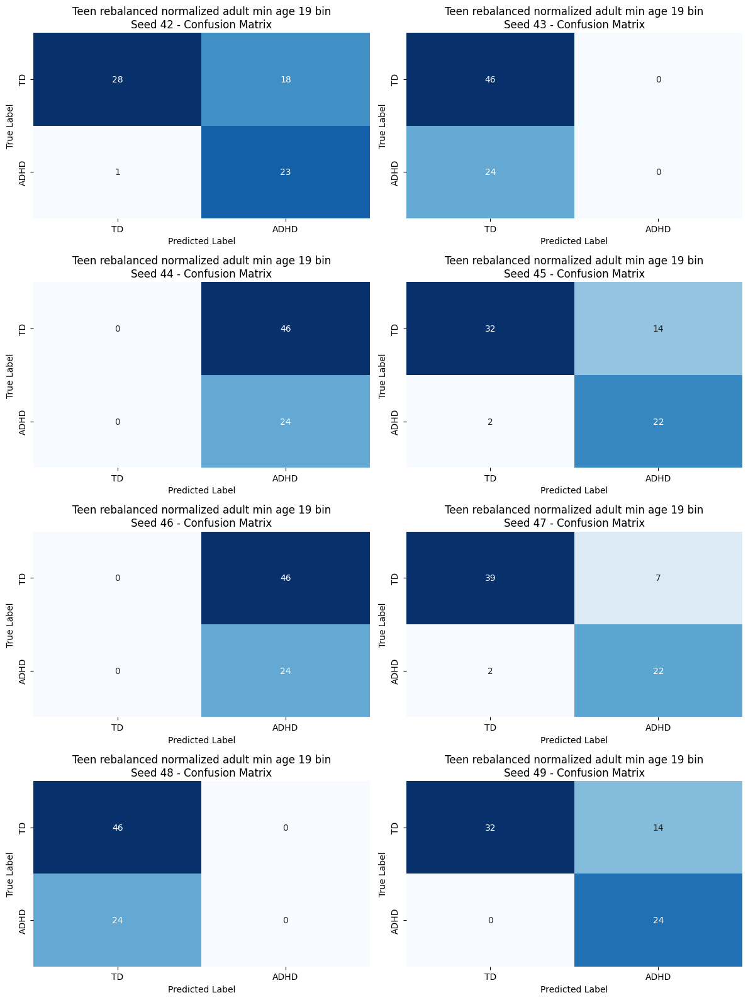

[Teen rebalanced normalized adult min age 19 bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced normalized adult min age 19 bin Model_aggregated_results.json
[Teen rebalanced normalized adult min age 19 bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_normalized_adult_min_19_bin_subject_predictions_all_seeds.csv

[Teen rebalanced normalized adult min age 19 bin Model] Test Results on Inference:
    accuracy_mean: 0.6464
    accuracy_std: 0.2004
    balanced_accuracy_mean: 0.6650
    balanced_accuracy_std: 0.1787
    f1_macro_mean: 0.5573
    f1_macro_std: 0.2558
    auc_mean: 0.8325
    auc_std: 0.0771


In [187]:
# ============================================================
# 4.6.4 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference
# без ковариат gender для бинарной классификации на пороге 19+ лет
# ============================================================
model_name_teen_rebalanced_normalized_adult_min_19_bin = "Teen rebalanced normalized adult min age 19 bin Model"
best_cfg_teen_rebalanced_normalized_adult_min_19_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_normalized_adult_min_19_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_normalized_adult_min_19_bin = json.load(f)
trial_id_teen_rebalanced_normalized_adult_min_19_bin = best_cfg_teen_rebalanced_normalized_adult_min_19_bin.get("trial_id")
if not trial_id_teen_rebalanced_normalized_adult_min_19_bin:
    raise KeyError("best_config.json for Teen rebalanced normalized adult min age 19 bin model has no 'trial_id'")

result_teen_rebalanced_normalized_adult_min_19_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_normalized_adult_min_19_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_ADULT_MIN_19_BIN_4,
    model_name=model_name_teen_rebalanced_normalized_adult_min_19_bin,
    test_loader=experiment_4_adult_rebalanced_normalized_inference_data_loader_adult_min_19_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_4_adult_rebalanced_normalized_inference_data_loader_adult_min_19_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_normalized_adult_min_19_bin_subject_predictions_all_seeds"),
)

#### 4.6.5 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатой gender для бинарной классификации на пороге 19+ лет

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_search_best/roiseq_8c7fd698ef_seed46_best_model.pth; loading model.


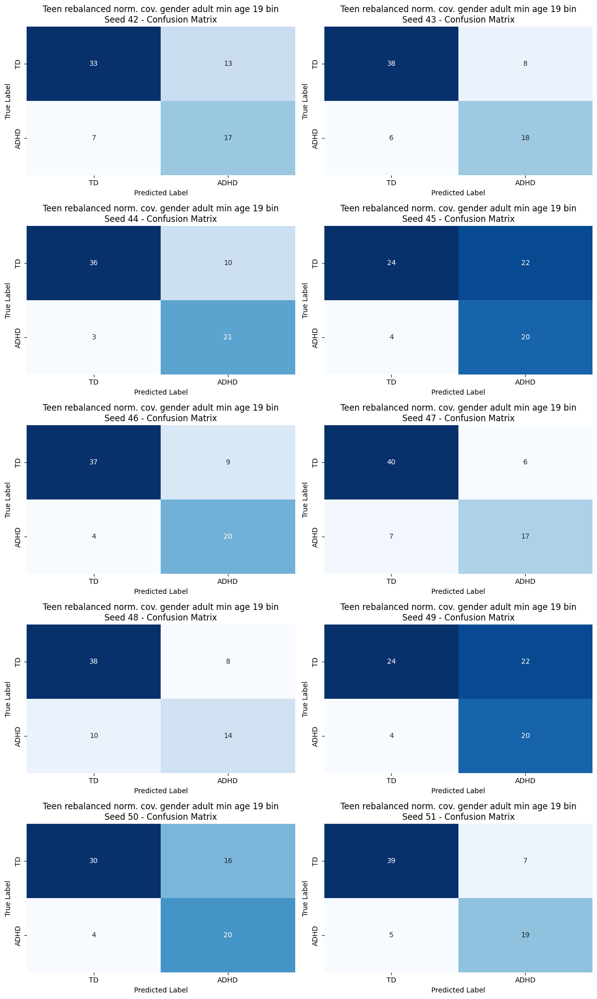

[Teen rebalanced norm. cov. gender adult min age 19 bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced norm. cov. gender adult min age 19 bin Model_aggregated_results.json
[Teen rebalanced norm. cov. gender adult min age 19 bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_subject_predictions_all_seeds.csv

[Teen rebalanced norm. cov. gender adult min age 19 bin Model] Test Results on Inference:
    accuracy_mean: 0.7500
    accuracy_std: 0.0769
    balanced_accuracy_mean: 0.7560
    balanced_accuracy_std: 0.0600
    f1_macro_mean: 0.7366
    f1_macro_std: 0.0723
    auc_mean: 0.8033
    auc_std: 0.0787


In [188]:
# ============================================================
# 4.6.5 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference
# с ковариатой gender для бинарной классификации на пороге 19+ лет
# ============================================================
model_name_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = "Teen rebalanced norm. cov. gender adult min age 19 bin Model"
best_cfg_teen_rebalanced_normalized_cov_gender_adult_min_19_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_normalized_cov_gender_adult_min_19_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = json.load(f)
trial_id_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = best_cfg_teen_rebalanced_normalized_cov_gender_adult_min_19_bin.get("trial_id")
if not trial_id_teen_rebalanced_normalized_cov_gender_adult_min_19_bin:
    raise KeyError("best_config.json for Teen rebalanced norm. cov. gender adult min age 19 bin model has no 'trial_id'")

result_teen_rebalanced_normalized_cov_gender_adult_min_19_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_normalized_cov_gender_adult_min_19_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_ADULT_MIN_19_BIN_4,
    model_name=model_name_teen_rebalanced_normalized_cov_gender_adult_min_19_bin,
    test_loader=experiment_4_adult_rebalanced_normalized_inference_cov_gender_data_loader_adult_min_19_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_4_adult_rebalanced_normalized_inference_cov_gender_data_loader_adult_min_19_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    # seeds=SEEDS_EXT_4,
    seeds=[42, 43, 44, 45, 46, 47, 48, 49, 50, 51],
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_normalized_cov_gender_adult_min_19_bin_subject_predictions_all_seeds"),
)

#### 4.6.6 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference с ковариатами gender и site_original для бинарной классификации на пороге 19+ лет

[INFO] Checkpoint found for seed 42: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed42_best_model.pth; loading model.
[INFO] Checkpoint found for seed 43: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed43_best_model.pth; loading model.
[INFO] Checkpoint found for seed 44: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed44_best_model.pth; loading model.
[INFO] Checkpoint found for seed 45: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed45_best_model.pth; loading model.
[INFO] Checkpoint found for seed 46: Experiments/4_th_experiment/checkpoints/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_search_best/roiseq_20d1507319_seed46_best_m

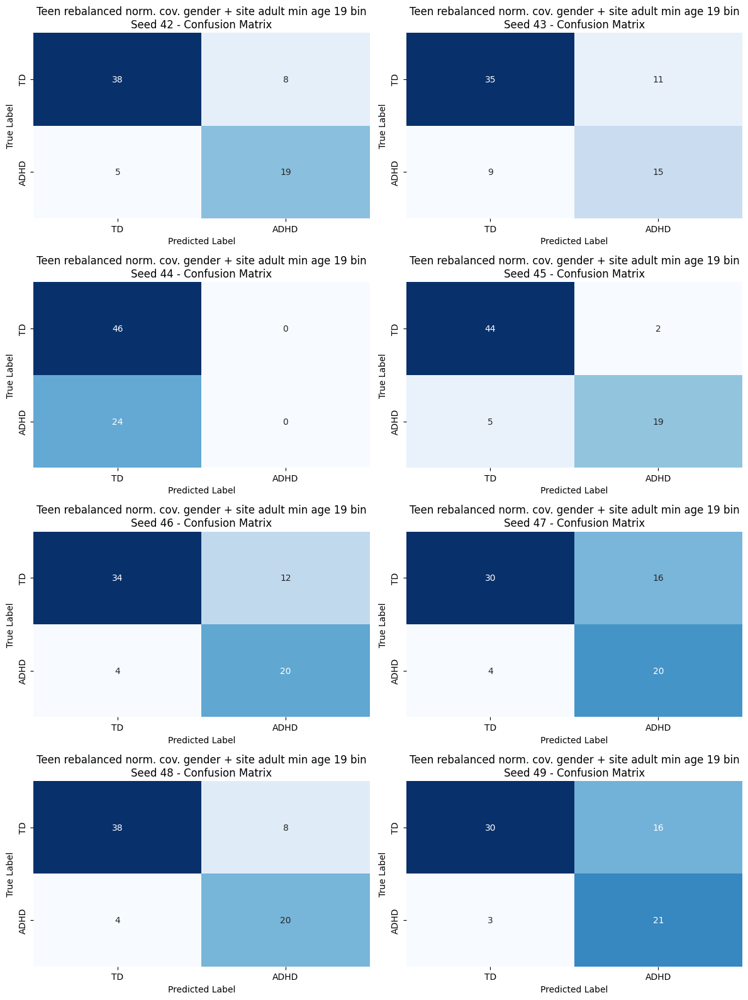

[Teen rebalanced norm. cov. gender + site adult min age 19 bin Model] Aggregated results saved to: Experiments/4_th_experiment/test_results/Teen rebalanced norm. cov. gender + site adult min age 19 bin Model_aggregated_results.json
[Teen rebalanced norm. cov. gender + site adult min age 19 bin Model] Per-subject results saved to: Experiments/4_th_experiment/test_results/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_subject_predictions_all_seeds.csv

[Teen rebalanced norm. cov. gender + site adult min age 19 bin Model] Test Results on Inference:
    accuracy_mean: 0.7661
    accuracy_std: 0.0782
    balanced_accuracy_mean: 0.7498
    balanced_accuracy_std: 0.1150
    f1_macro_mean: 0.7226
    f1_macro_std: 0.1466
    auc_mean: 0.8992
    auc_std: 0.0345


In [189]:
# ============================================================
# 4.6.6 Тестирование модели с нормализацией ROI TimeSeries, обученной на датасете Teen rebalanced, на наборе Adult rebalanced inference
# с ковариатами gender и site_original для бинарной классификации на пороге 19+ лет
# ============================================================
model_name_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = "Teen rebalanced norm. cov. gender + site adult min age 19 bin Model"
best_cfg_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_path = os.path.join(BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4, "best_config.json")

with open(best_cfg_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = json.load(f)
trial_id_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = best_cfg_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin.get("trial_id")
if not trial_id_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin:
    raise KeyError("best_config.json for Teen rebalanced norm. cov. gender + site adult min age 19 bin model has no 'trial_id'")

result_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin,
    best_checkpoint_dir=BEST_DIR_TEEN_REBALANCED_NORMALIZED_COV_GENDER_SITE_ADULT_MIN_19_BIN_4,
    model_name=model_name_teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin,
    test_loader=experiment_4_adult_rebalanced_normalized_inference_cov_gender_site_data_loader_adult_min_19_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_4_adult_rebalanced_normalized_inference_cov_gender_site_data_loader_adult_min_19_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_4,
    seeds=SEEDS_4,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_subject_predictions_all_seeds"),
)

### 4.7 Итоговые результаты по тесту

In [190]:
# Сведём все результаты тестов Эксперимента 4 в единую таблицу. Отдельно обработаем мультиклассовую и бинарную классификацию
def analyze_experiment_4_test_results():
    import pandas as pd
    import os

    # Соберём все агрегированные метрики для мультиклассовых моделей в одну таблицу
    multi_class_results = []
    for model_name in [
        "teen_rebalanced_model",
        "teen_rebalanced_covariate_gender_model",
        "teen_rebalanced_model_exclude_class_2",
        "teen_rebalanced_model_exclude_class_2_covariate_gender",
    ]:
        agg_results_path = os.path.join(TEST_RESULTS_DIR_4, f"{model_name}_test_results.json")
        if os.path.isfile(agg_results_path):
            with open(agg_results_path, "r", encoding="utf-8") as f:
                agg_results = json.load(f)
                config = agg_results.get("config", {})
                n_seeds = config.get("seeds", [])
                n_seeds.extend(config.get("final_train_seeds", []))
                multi_class_results.append(
                    {
                        "Model": model_name,
                        "N Seeds Tested": len(n_seeds),
                        "Accuracy Mean": agg_results.get("aggregated_metrics", {}).get("accuracy_mean"),
                        "Accuracy Std": agg_results.get("aggregated_metrics", {}).get("accuracy_std"),
                        "Balanced Accuracy Mean": agg_results.get("aggregated_metrics", {}).get("balanced_accuracy_mean"),
                        "Balanced Accuracy Std": agg_results.get("aggregated_metrics", {}).get("balanced_accuracy_std"),
                        "F1 Macro Mean": agg_results.get("aggregated_metrics", {}).get("f1_macro_mean"),
                        "F1 Macro Std": agg_results.get("aggregated_metrics", {}).get("f1_macro_std"),
                        "AUC Mean": agg_results.get("aggregated_metrics", {}).get("auc_mean"),
                        "AUC Std": agg_results.get("aggregated_metrics", {}).get("auc_std"),
                    }
                )
        else:
            print(f"[WARN] Aggregated results not found for {model_name} at expected path: {agg_results_path}")
    multi_class_df = pd.DataFrame(multi_class_results)
    multi_class_df_path = os.path.join(TEST_RESULTS_DIR_4, "experiment_4_multiclass_test_summary.xlsx")
    multi_class_df.to_excel(multi_class_df_path, index=False)
    print(f"Multiclass test results summary saved to: {multi_class_df_path}")
    print("\nMulticlass Test Results Summary:")
    print(multi_class_df.to_string(index=False))

    # Соберём все агрегированные метрики для бинарных моделей в одну таблицу
    binary_class_results = []
    for model_name in [
        "Teen rebalanced bin Model",
        "Teen rebalanced covariate gender bin Model",
        "Teen rebalanced covariates gender + site bin Model",
        "Teen rebalanced Model exclude class 2 covariate gender bin",
        "Teen rebalanced covariate gender min 13 bin Model",
        "Teen rebalanced covariate gender min 12 bin Model",
        "Teen rebalanced covariate gender min adult 19 bin Model",
        "Teen rebalanced covariates gender + site min adult 19 bin Model",
        "Teen rebalanced normalized bin Model",
        "Teen rebalanced normalized covariate gender bin Model",
        "Teen rebalanced normalized covariates gender + site bin Model",
        "Teen rebalanced normalized adult min age 19 bin Model",
        "Teen rebalanced norm. cov. gender adult min age 19 bin Model",
        "Teen rebalanced norm. cov. gender + site adult min age 19 bin Model"
    ]:
        agg_results_path = os.path.join(TEST_RESULTS_DIR_4, f"{model_name}_aggregated_results.json")
        if os.path.isfile(agg_results_path):
            with open(agg_results_path, "r", encoding="utf-8") as f:
                agg_results = json.load(f)
                binary_class_results.append(
                    {
                        "Model": model_name,
                        "N Seeds Tested": agg_results.get("n_seeds_tested", 0),
                        "Accuracy Mean": agg_results.get("aggregated_metrics", {}).get("accuracy_mean"),
                        "Accuracy Std": agg_results.get("aggregated_metrics", {}).get("accuracy_std"),
                        "Balanced Accuracy Mean": agg_results.get("aggregated_metrics", {}).get("balanced_accuracy_mean"),
                        "Balanced Accuracy Std": agg_results.get("aggregated_metrics", {}).get("balanced_accuracy_std"),
                        "F1 Macro Mean": agg_results.get("aggregated_metrics", {}).get("f1_macro_mean"),
                        "F1 Macro Std": agg_results.get("aggregated_metrics", {}).get("f1_macro_std"),
                        "AUC Mean": agg_results.get("aggregated_metrics", {}).get("auc_mean"),
                        "AUC Std": agg_results.get("aggregated_metrics", {}).get("auc_std"),
                    }
                )
        else:
            print(f"[WARN] Aggregated results not found for {model_name} at expected path: {agg_results_path}")
    binary_class_df = pd.DataFrame(binary_class_results)
    binary_class_df_path = os.path.join(TEST_RESULTS_DIR_4, "experiment_4_binary_class_test_summary.xlsx")
    binary_class_df.to_excel(binary_class_df_path, index=False)
    print(f"\nBinary classification test results summary saved to: {binary_class_df_path}")
    print("\nBinary Classification Test Results Summary:")
    print(binary_class_df.to_string(index=False))

    # Отдельно сохраним нормализованные результаты бинарной классификации
    norm_binary_class_df = binary_class_df[binary_class_df["Model"].str.contains("normalized") | binary_class_df["Model"].str.contains("norm.")]
    norm_binary_class_df_path = os.path.join(TEST_RESULTS_DIR_4, "experiment_4_normalized_binary_class_test_summary.xlsx")
    norm_binary_class_df.to_excel(norm_binary_class_df_path, index=False)
    print(f"\nNormalized binary classification test results summary saved to: {norm_binary_class_df_path}")
    print("\nNormalized Binary Classification Test Results Summary:")
    print(norm_binary_class_df.to_string(index=False))

    return multi_class_df, binary_class_df, norm_binary_class_df

multi_class_df, binary_class_df, norm_binary_class_df = analyze_experiment_4_test_results()

Multiclass test results summary saved to: Experiments/4_th_experiment/test_results/experiment_4_multiclass_test_summary.xlsx

Multiclass Test Results Summary:
                                                 Model  N Seeds Tested  Accuracy Mean  Accuracy Std  Balanced Accuracy Mean  Balanced Accuracy Std  F1 Macro Mean  F1 Macro Std  AUC Mean  AUC Std
                                 teen_rebalanced_model               0       0.591880      0.018505                0.244555               0.011606       0.517975      0.013639  0.595909 0.065038
                teen_rebalanced_covariate_gender_model               0       0.613248      0.011103                0.245502               0.010666       0.526011      0.020338  0.652285 0.109041
                 teen_rebalanced_model_exclude_class_2               0       0.716667      0.007897                0.325758               0.003589       0.612280      0.003939  0.502683 0.130826
teen_rebalanced_model_exclude_class_2_covariate_gender       

In [191]:
# Создадим сводный график (столбчатую диаграмму) для всех моделей бинарной классификации Эксперимента 4 с полями "F1 Macro Mean", "F1 Macro Std", "AUC Mean", "AUC Std"
# Для этого сперва определим функцию для печати графика

# Функция для отрисовки сравнительной диаграммы для нескольких метрик. Каждый bar будет отображать значение одной метрики для каждой модели.
# Диаграмма будет отсортирована по первой метрике для удобства сравнения.
# Bar для каждой метрики будет иметь свою цветовую палитру, а легенда будет отображать, какой цвет соответствует какой метрике.
# Bars отрисовываются группами для каждой модели, чтобы было видно сравнение метрик внутри каждой модели, а также между моделями.
# Bars отрисовываются фиксированной ширины без наложения, чтобы было видно все метрики для каждой модели.
# Bars группируются по моделям, а не по метрикам, чтобы было видно сравнение метрик внутри каждой модели, а также между моделями.
def experiment_4_plot_comparative_metric(combined_df: pd.DataFrame, metric_columns: list | str, title: str, should_sort: bool = False):
    if isinstance(metric_columns, str):
        metric_columns = [metric_columns]
    
    # Проверяем, что указанные метрики есть в датафрейме
    for metric in metric_columns:
        if metric not in combined_df.columns:
            raise ValueError(f"Метрика '{metric}' не найдена в датафрейме. Доступные метрики: {combined_df.columns.tolist()}")

    # Проверяем, что в датафрейме есть столбец 'Model' для обозначения моделей
    if 'Model' not in combined_df.columns:
        raise ValueError("В датафрейме должен быть столбец 'Model' для обозначения моделей.")
    
    # создаем новый датафрейм для визуализации, который будет содержать только столбцы 'Model' и указанные метрики
    combined_df = combined_df[['Model'] + metric_columns].copy()
    
    if should_sort:
        # Сортируем датафрейм по первой метрике для удобства сравнения
        combined_df = combined_df.sort_values(by=metric_columns[0], ascending=False).reset_index(drop=True)

    # Преобразование в длинный формат
    df = combined_df.melt(id_vars='Model', var_name='metric', value_name='value')
    # print(df)
    
    # Создаем фигуру и ось для графика
    plt.figure(figsize=(12, 8))

    sns.barplot(
        data=df,
        x='Model',
        y='value',
        hue='metric',
        palette='Set1',
        dodge=True,
        width=0.8,
        gap=0.3
    )

    # Настраиваем график
    plt.title(f'{title}', fontsize=16)
    plt.xlabel('Эксперимент', fontsize=14)
    plt.ylabel('Значение метрики', fontsize=14)
    plt.legend(title='Метрика')
    plt.xticks(rotation=45, ha='right')  # поворот подписей для удобства
    plt.tight_layout()

    # Показываем график
    plt.show()

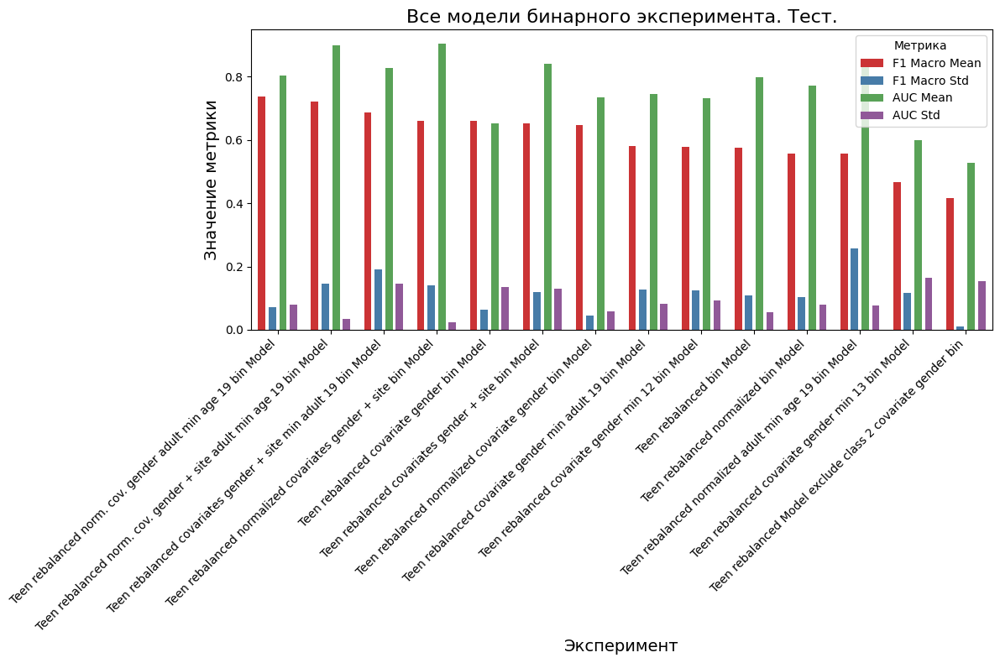

In [192]:
# Отрисуем сравнительную диаграмму для всех метрик для всех моделей на тесте для бинарного эксперимента
experiment_4_plot_comparative_metric(binary_class_df,
                                     ["F1 Macro Mean", "F1 Macro Std", "AUC Mean", "AUC Std"],
                                     'Все модели бинарного эксперимента. Тест.',
                                     should_sort=True)

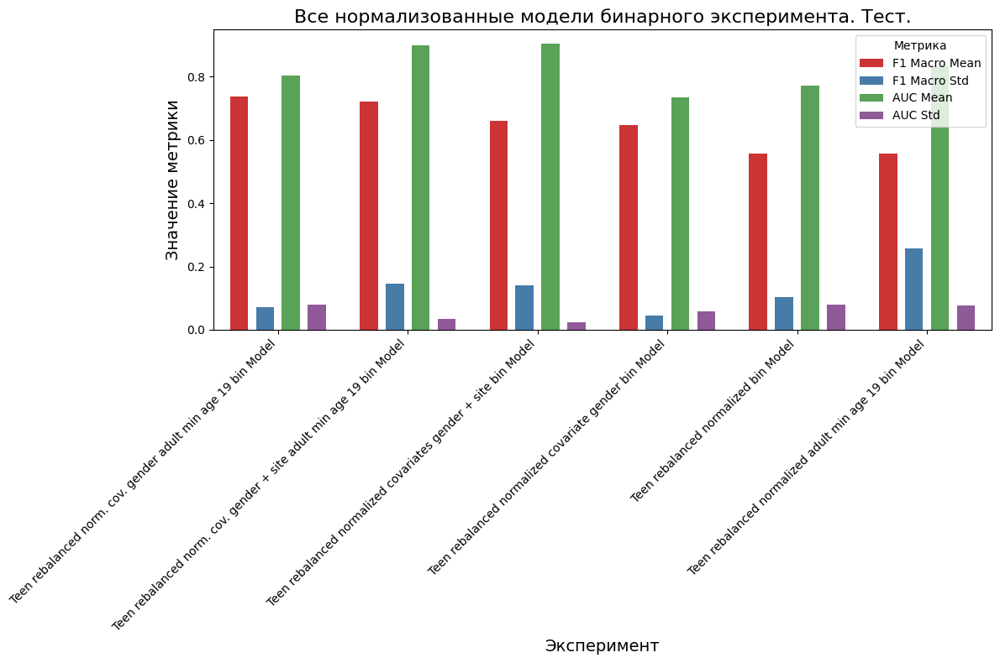

In [193]:
# Отрисуем сравнительную диаграмму для всех метрик для всех нормализованных моделей на тесте для бинарного эксперимента
experiment_4_plot_comparative_metric(norm_binary_class_df,
                                     ["F1 Macro Mean", "F1 Macro Std", "AUC Mean", "AUC Std"],
                                     'Все нормализованные модели бинарного эксперимента. Тест.',
                                     should_sort=True)

### 4.7 Расчёт статистических параметров эксперимента со смещением границ Teen (14 - 17.99) (а так же альтернативных минимальных границ подростковой выборки 12 и 13 лет) и Adult (18 - 21.99)

#### 4.7.1 Подготовка импортов и основных статистических функций

In [337]:
# ============================================================
# 4.7.1.1 Imports
# ============================================================

import os
import json
import glob
import math
from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.metrics import (
    roc_auc_score,
    f1_score,
    accuracy_score,
    balanced_accuracy_score,
)

from scipy.stats import binomtest

# -----------------------------
# Paths to per-seed predictions
# -----------------------------
# ВАЖНО:
# Здесь нужно указать CSV-файлы с per-subject predictions для КАЖДОЙ версии модели.
# Каждый CSV должен содержать минимум:
# - participant_id
# - y_true
# - prob_1   (или prob_0 + prob_1)

MODEL_FAMILIES_ADULT_18 = {
    "base_norm": sorted(glob.glob(TEST_RESULTS_DIR_4 + "/teen_rebalanced_normalized_bin_subject_predictions_all_seeds.csv")),
    "norm_gender_adult": sorted(glob.glob(TEST_RESULTS_DIR_4 + "/teen_rebalanced_normalized_cov_gender_bin_subject_predictions_all_seeds.csv")),
    "norm_gender_site_adult": sorted(glob.glob(TEST_RESULTS_DIR_4 + "/teen_rebalanced_normalized_cov_gender_site_bin_subject_predictions_all_seeds.csv")),
}

MODEL_FAMILIES_ADULT_19 = {
    "base_norm_adult19": sorted(glob.glob(TEST_RESULTS_DIR_4 + "/teen_rebalanced_normalized_adult_min_19_bin_subject_predictions_all_seeds.csv")),
    "norm_gender_adult19": sorted(glob.glob(TEST_RESULTS_DIR_4 + "/teen_rebalanced_normalized_cov_gender_adult_min_19_bin_subject_predictions_all_seeds.csv")),
    "norm_gender_site_adult19": sorted(glob.glob(TEST_RESULTS_DIR_4 + "/teen_rebalanced_normalized_cov_gender_site_adult_min_19_bin_subject_predictions_all_seeds.csv")),
}

PAIRWISE_COMPARISONS = [
    ("base_norm_adult19", "norm_gender_adult19"),
    ("norm_gender_adult19", "norm_gender_site_adult19"),
    ("base_norm_adult19", "norm_gender_site_adult19"),
]

OUT_DIR_STATS_4 = Path("Experiments/4_th_experiment/stat_tests")
OUT_DIR_STATS_4.mkdir(parents=True, exist_ok=True)

# bootstrap / permutation settings
N_BOOT = 2000
N_PERM = 5000
RANDOM_STATE = 42
ALPHA = 0.05  # Уровень значимости для статистических тестов (порог p-value, обычно 0.05)

# target AUC threshold
TARGET_AUC = 0.8  # Целевая AUC для проверки статистической значимости результатов моделей
TARGET_F1 = 0.7  # Целевая F1 для проверки статистической значимости результатов моделей

In [302]:
# ============================================================
# 4.7.1.2. Helper functions: load and aggregate predictions
# ============================================================

def _load_one_prediction_csv(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)

    required_cols = {"participant_id", "y_true"}
    if not required_cols.issubset(df.columns):
        raise ValueError(f"{path}: missing required columns {required_cols}")

    if "prob_1" not in df.columns:
        if {"prob_0", "prob_1"}.issubset(df.columns):
            pass
        else:
            raise ValueError(f"{path}: missing prob_1 (or prob_0/prob_1 pair)")

    # если нет prob_1, но есть prob_0/prob_1 — всё ок
    if "prob_1" not in df.columns and "prob_0" in df.columns:
        raise ValueError(f"{path}: prob_1 is required explicitly")

    keep_cols = ["participant_id", "y_true", "prob_1"]
    if "y_pred" in df.columns:
        keep_cols.append("y_pred")

    out = df[keep_cols].copy()
    out["participant_id"] = out["participant_id"].astype(str)
    return out


def load_family_predictions(paths: list[str], family_name: str) -> pd.DataFrame:
    """
    Загружает per-seed predictions для одной версии модели.
    Возвращает таблицу вида:
    participant_id | y_true | prob_1_seed0 | prob_1_seed1 | ...
    """
    if len(paths) == 0:
        raise ValueError(f"{family_name}: no prediction files found")

    merged = None

    for i, p in enumerate(paths):
        df = _load_one_prediction_csv(p)
        df = df.rename(columns={"prob_1": f"prob_1_seed{i}"})

        if merged is None:
            merged = df[["participant_id", "y_true", f"prob_1_seed{i}"]].copy()
        else:
            merged = merged.merge(
                df[["participant_id", "y_true", f"prob_1_seed{i}"]],
                on=["participant_id", "y_true"],
                how="inner",
            )

    if merged is None or len(merged) == 0:
        raise ValueError(f"{family_name}: merged predictions are empty")

    prob_cols = [c for c in merged.columns if c.startswith("prob_1_seed")]
    merged["prob_1_mean"] = merged[prob_cols].mean(axis=1)
    merged["prob_1_std"] = merged[prob_cols].std(axis=1)
    merged["y_pred_mean"] = (merged["prob_1_mean"] >= 0.5).astype(int)

    return merged


def compute_point_metrics(df: pd.DataFrame, prob_col: str = "prob_1_mean", pred_col: str = "y_pred_mean") -> dict:
    y_true = df["y_true"].astype(int).to_numpy()
    y_prob = df[prob_col].to_numpy()
    y_pred = df[pred_col].astype(int).to_numpy()

    return {
        "n": int(len(df)),
        "auc": float(roc_auc_score(y_true, y_prob)),
        "accuracy": float(accuracy_score(y_true, y_pred)),
        "balanced_accuracy": float(balanced_accuracy_score(y_true, y_pred)),
        "f1_macro": float(f1_score(y_true, y_pred, average="macro")),
    }

In [318]:
# ============================================================
# 4.7.1.3. Bootstrap confidence intervals
# ============================================================

def bootstrap_metric_ci(
    df: pd.DataFrame,
    metric_fn,
    n_boot: int = N_BOOT,
    random_state: int = RANDOM_STATE,
    alpha: float = ALPHA,
):
    rng = np.random.default_rng(random_state)
    n = len(df)
    vals = []

    for _ in range(n_boot):
        idx = rng.integers(0, n, size=n)
        sample = df.iloc[idx]
        try:
            vals.append(metric_fn(sample))
        except Exception:
            continue

    vals = np.array(vals, dtype=float)
    vals = vals[np.isfinite(vals)]

    if len(vals) == 0:
        return {
            "mean_boot": np.nan,
            "ci_low": np.nan,
            "ci_high": np.nan,
            "all_values": vals,
        }

    return {
        "mean_boot": float(np.mean(vals)),
        "ci_low": float(np.quantile(vals, alpha / 2)),
        "ci_high": float(np.quantile(vals, 1 - alpha / 2)),
        "all_values": vals,
    }


def metric_auc(df):
    return roc_auc_score(df["y_true"].astype(int), df["prob_1_mean"])

def metric_f1(df):
    return f1_score(df["y_true"].astype(int), df["y_pred_mean"].astype(int), average="macro")

def metric_balacc(df):
    return balanced_accuracy_score(df["y_true"].astype(int), df["y_pred_mean"].astype(int))

In [320]:
# ============================================================
# 4.7.1.4. Permutation test for AUC > 0.5
# ============================================================

def permutation_test_auc_against_chance(
    df: pd.DataFrame,
    n_perm: int = N_PERM,
    random_state: int = RANDOM_STATE,
):
    """
    H0: связи между y_true и prob_1_mean нет (AUC случайный, ~0.5).
    """
    rng = np.random.default_rng(random_state)

    y_true = df["y_true"].astype(int).to_numpy()
    y_prob = df["prob_1_mean"].to_numpy()

    observed_auc = roc_auc_score(y_true, y_prob)

    perm_aucs = []
    for _ in range(n_perm):
        y_perm = rng.permutation(y_true)
        perm_auc = roc_auc_score(y_perm, y_prob)
        perm_aucs.append(perm_auc)

    perm_aucs = np.array(perm_aucs, dtype=float)

    # one-sided p-value: насколько часто случайная перестановка даёт AUC >= observed
    p_value = (np.sum(perm_aucs >= observed_auc) + 1) / (len(perm_aucs) + 1)

    return {
        "observed_auc": float(observed_auc),
        "perm_mean_auc": float(np.mean(perm_aucs)),
        "p_value_one_sided": float(p_value),
        "perm_aucs": perm_aucs,
    }

In [324]:
# ============================================================
# 4.7.1.5. Threshold analysis for AUC >= TARGET_AUC
# ============================================================

def assess_auc_target(ci_dict: dict, target_auc: float = TARGET_AUC) -> dict:
    """
    Интерпретация bootstrap CI относительно порога target_auc.
    """
    low = ci_dict["ci_low"]
    high = ci_dict["ci_high"]

    if np.isnan(low) or np.isnan(high):
        status = "undetermined"
    elif low > target_auc:
        status = "securely_above_target"
    elif high < target_auc:
        status = "below_target"
    else:
        status = "point_estimate_may_reach_target_but_ci_crosses"

    # эмпирическая доля bootstrap-значений >= target
    vals = ci_dict["all_values"]
    if len(vals) > 0:
        support_prob = float(np.mean(vals >= target_auc))
    else:
        support_prob = np.nan

    return {
        "target_auc": float(target_auc),
        "status": status,
        "support_prob_bootstrap_auc_ge_target": support_prob,
    }

def assess_f1_target(ci_dict: dict, target_f1: float = TARGET_F1) -> dict:
    """
    Интерпретация bootstrap CI относительно порога target_f1.
    """
    low = ci_dict["ci_low"]
    high = ci_dict["ci_high"]

    if np.isnan(low) or np.isnan(high):
        status = "undetermined"
    elif low > target_f1:
        status = "securely_above_target"
    elif high < target_f1:
        status = "below_target"
    else:
        status = "point_estimate_may_reach_target_but_ci_crosses"

    # эмпирическая доля bootstrap-значений >= target
    vals = ci_dict["all_values"]
    if len(vals) > 0:
        support_prob = float(np.mean(vals >= target_f1))
    else:
        support_prob = np.nan

    return {
        "target_f1": float(target_f1),
        "status": status,
        "support_prob_bootstrap_f1_ge_target": support_prob,
    }

In [321]:
# ============================================================
# 4.7.1.6. Pairwise bootstrap comparison between two model families
# ============================================================

def bootstrap_difference_ci(
    df_a: pd.DataFrame,
    df_b: pd.DataFrame,
    metric_fn_a,
    metric_fn_b,
    n_boot: int = N_BOOT,
    random_state: int = RANDOM_STATE,
    alpha: float = ALPHA,
):
    """
    Парное bootstrap-сравнение двух моделей на одном и том же test set.
    Требуется совпадение participant_id.
    """
    merged = df_a[["participant_id", "y_true", "prob_1_mean", "y_pred_mean"]].merge(
        df_b[["participant_id", "y_true", "prob_1_mean", "y_pred_mean"]],
        on=["participant_id", "y_true"],
        suffixes=("_a", "_b"),
        how="inner",
    )

    rng = np.random.default_rng(random_state)
    n = len(merged)
    diffs = []

    for _ in range(n_boot):
        idx = rng.integers(0, n, size=n)
        sample = merged.iloc[idx].copy()

        df_a_sample = pd.DataFrame({
            "participant_id": sample["participant_id"],
            "y_true": sample["y_true"],
            "prob_1_mean": sample["prob_1_mean_a"],
            "y_pred_mean": sample["y_pred_mean_a"],
        })

        df_b_sample = pd.DataFrame({
            "participant_id": sample["participant_id"],
            "y_true": sample["y_true"],
            "prob_1_mean": sample["prob_1_mean_b"],
            "y_pred_mean": sample["y_pred_mean_b"],
        })

        try:
            diff = metric_fn_b(df_b_sample) - metric_fn_a(df_a_sample)
            diffs.append(diff)
        except Exception:
            continue

    diffs = np.array(diffs, dtype=float)
    diffs = diffs[np.isfinite(diffs)]

    if len(diffs) == 0:
        return {
            "mean_diff": np.nan,
            "ci_low": np.nan,
            "ci_high": np.nan,
            "p_two_sided": np.nan,
            "all_diffs": diffs,
        }

    ci_low = float(np.quantile(diffs, alpha / 2))
    ci_high = float(np.quantile(diffs, 1 - alpha / 2))

    # эмпирический двусторонний p-value для H0: diff = 0
    p_two_sided = 2 * min(np.mean(diffs <= 0), np.mean(diffs >= 0))

    return {
        "mean_diff": float(np.mean(diffs)),
        "ci_low": ci_low,
        "ci_high": ci_high,
        "p_two_sided": float(min(p_two_sided, 1.0)),
        "all_diffs": diffs,
    }


def metric_auc_from_df(df):
    return roc_auc_score(df["y_true"].astype(int), df["prob_1_mean"])

def metric_f1_from_df(df):
    return f1_score(df["y_true"].astype(int), df["y_pred_mean"].astype(int), average="macro")

def metric_balacc_from_df(df):
    return balanced_accuracy_score(df["y_true"].astype(int), df["y_pred_mean"].astype(int))

In [323]:
# ============================================================
# 4.7.1.7. Optional: McNemar test for accuracy difference
# ============================================================

def mcnemar_test_from_predictions(df_a: pd.DataFrame, df_b: pd.DataFrame):
    """
    Сравнение двух моделей по бинарной correctness на одном test set.
    exact McNemar через binomial test.
    """
    merged = df_a[["participant_id", "y_true", "y_pred_mean"]].merge(
        df_b[["participant_id", "y_true", "y_pred_mean"]],
        on=["participant_id", "y_true"],
        suffixes=("_a", "_b"),
        how="inner",
    )

    correct_a = (merged["y_true"].astype(int) == merged["y_pred_mean_a"].astype(int)).astype(int)
    correct_b = (merged["y_true"].astype(int) == merged["y_pred_mean_b"].astype(int)).astype(int)

    b = int(np.sum((correct_a == 1) & (correct_b == 0)))  # A correct, B wrong
    c = int(np.sum((correct_a == 0) & (correct_b == 1)))  # A wrong, B correct

    n_disc = b + c
    if n_disc == 0:
        p_value = 1.0
    else:
        p_value = binomtest(k=min(b, c), n=n_disc, p=0.5, alternative="two-sided").pvalue

    return {
        "b_A_correct_B_wrong": b,
        "c_A_wrong_B_correct": c,
        "n_discordant": n_disc,
        "p_value": float(p_value),
    }

#### 4.7.2 Расчёт статистическ для эксперимента

In [333]:
# ============================================================
# 4.7.2.1. Run analysis for each model family
# ============================================================

def analyze_model_families(family_tables: dict[str, pd.DataFrame], target_auc: float = TARGET_AUC, target_f1: float = TARGET_F1):
    family_tables_inner = {}
    family_summary_rows = []
    for family_name, paths in family_tables.items():
        df_family = load_family_predictions(paths, family_name)
        family_tables_inner[family_name] = df_family

        point_metrics = compute_point_metrics(df_family)
        auc_ci = bootstrap_metric_ci(df_family, metric_auc)
        f1_ci = bootstrap_metric_ci(df_family, metric_f1)
        bal_ci = bootstrap_metric_ci(df_family, metric_balacc)
        perm_auc = permutation_test_auc_against_chance(df_family)
        auc_target = assess_auc_target(auc_ci, target_auc=target_auc)
        f1_target = assess_f1_target(f1_ci, target_f1=target_f1)

        row = {
            "family": family_name,
            "n_subjects": point_metrics["n"],
            "auc": point_metrics["auc"],
            "auc_ci_low": auc_ci["ci_low"],
            "auc_ci_high": auc_ci["ci_high"],
            "auc_perm_p": perm_auc["p_value_one_sided"],
            "f1_macro": point_metrics["f1_macro"],
            "f1_ci_low": f1_ci["ci_low"],
            "f1_ci_high": f1_ci["ci_high"],
            "f1_perm_p": perm_auc["p_value_one_sided"],
            "balanced_accuracy": point_metrics["balanced_accuracy"],
            "bal_ci_low": bal_ci["ci_low"],
            "bal_ci_high": bal_ci["ci_high"],
            "accuracy": point_metrics["accuracy"],
            "auc_target_status": auc_target["status"],
            "auc_target_support_prob": auc_target["support_prob_bootstrap_auc_ge_target"],
            "f1_target_status": f1_target["status"],
            "f1_target_support_prob": f1_target["support_prob_bootstrap_f1_ge_target"],
        }
        family_summary_rows.append(row)
    return family_summary_rows, family_tables_inner

In [334]:
family_summary_rows_adult18, family_tables_adult18 = analyze_model_families(MODEL_FAMILIES_ADULT_18, target_auc=TARGET_AUC, target_f1=TARGET_F1)

summary_df_adult18 = pd.DataFrame(family_summary_rows_adult18).sort_values("auc", ascending=False).reset_index(drop=True)
summary_df_adult18.to_csv(OUT_DIR_STATS_4 / "model_family_stat_summary_adult18.csv", index=False)

display(summary_df_adult18)

with open(OUT_DIR_STATS_4 / "model_family_stat_summary_adult18.json", "w", encoding="utf-8") as f:
    json.dump(summary_df_adult18.to_dict(orient="records"), f, ensure_ascii=False, indent=2)

,family,n_subjects,auc,auc_ci_low,auc_ci_high,auc_perm_p,f1_macro,f1_ci_low,f1_ci_high,f1_perm_p,balanced_accuracy,bal_ci_low,bal_ci_high,accuracy,auc_target_status,auc_target_support_prob,f1_target_status,f1_target_support_prob
0,norm_gender_site_adult,376,0.869341,0.828340,0.905744,0.0002,0.723966,0.662583,0.782381,0.0002,0.695101,0.640433,0.752467,0.843085,securely_above_target,1.0000,point_estimate_may_reach_target_but_ci_crosses,0.7815
1,base_norm,376,0.735008,0.672537,0.795232,0.0002,0.597354,0.536435,0.654929,0.0002,0.587331,0.537200,0.638352,0.773936,below_target,0.0165,below_target,0.0000
2,norm_gender_adult,376,0.715329,0.650681,0.774733,0.0002,0.629945,0.578418,0.682343,0.0002,0.660811,0.602971,0.720440,0.710106,below_target,0.0040,below_target,0.0045


In [335]:
family_summary_rows_adult19, family_tables_adult19 = analyze_model_families(MODEL_FAMILIES_ADULT_19, target_auc=TARGET_AUC, target_f1=TARGET_F1)

summary_df_adult19 = pd.DataFrame(family_summary_rows_adult19).sort_values("auc", ascending=False).reset_index(drop=True)
summary_df_adult19.to_csv(OUT_DIR_STATS_4 / "model_family_stat_summary_adult19.csv", index=False)

display(summary_df_adult19)

with open(OUT_DIR_STATS_4 / "model_family_stat_summary_adult19.json", "w", encoding="utf-8") as f:
    json.dump(summary_df_adult19.to_dict(orient="records"), f, ensure_ascii=False, indent=2)

,family,n_subjects,auc,auc_ci_low,auc_ci_high,auc_perm_p,f1_macro,f1_ci_low,f1_ci_high,f1_perm_p,balanced_accuracy,bal_ci_low,bal_ci_high,accuracy,auc_target_status,auc_target_support_prob,f1_target_status,f1_target_support_prob
0,norm_gender_site_adult19,168,0.857812,0.793718,0.911817,0.0002,0.772203,0.696801,0.835399,0.0002,0.779167,0.704057,0.845253,0.809524,point_estimate_may_reach_target_but_ci_crosses,0.9655,point_estimate_may_reach_target_but_ci_crosses,0.9685
1,norm_gender_adult19,210,0.843889,0.782752,0.901006,0.0002,0.767094,0.708333,0.825312,0.0002,0.791667,0.732445,0.851167,0.795238,point_estimate_may_reach_target_but_ci_crosses,0.9310,securely_above_target,0.9825
2,base_norm_adult19,168,0.806771,0.735029,0.872063,0.0002,0.628806,0.551820,0.705317,0.0002,0.672917,0.592758,0.750000,0.648810,point_estimate_may_reach_target_but_ci_crosses,0.6025,point_estimate_may_reach_target_but_ci_crosses,0.0325


In [ ]:
# ============================================================
# 4.7.2.2. Pairwise comparisons
# ============================================================

pairwise_rows = []

for model_a, model_b in PAIRWISE_COMPARISONS:
    df_a = family_tables_adult19[model_a]
    df_b = family_tables_adult19[model_b]

    auc_diff = bootstrap_difference_ci(df_a, df_b, metric_auc_from_df, metric_auc_from_df)
    f1_diff = bootstrap_difference_ci(df_a, df_b, metric_f1_from_df, metric_f1_from_df)
    bal_diff = bootstrap_difference_ci(df_a, df_b, metric_balacc_from_df, metric_balacc_from_df)
    mcnemar_res = mcnemar_test_from_predictions(df_a, df_b)

    row = {
        "model_a": model_a,
        "model_b": model_b,

        "delta_auc_mean": auc_diff["mean_diff"],
        "delta_auc_ci_low": auc_diff["ci_low"],
        "delta_auc_ci_high": auc_diff["ci_high"],
        "delta_auc_p_boot": auc_diff["p_two_sided"],

        "delta_f1_mean": f1_diff["mean_diff"],
        "delta_f1_ci_low": f1_diff["ci_low"],
        "delta_f1_ci_high": f1_diff["ci_high"],
        "delta_f1_p_boot": f1_diff["p_two_sided"],

        "delta_balacc_mean": bal_diff["mean_diff"],
        "delta_balacc_ci_low": bal_diff["ci_low"],
        "delta_balacc_ci_high": bal_diff["ci_high"],
        "delta_balacc_p_boot": bal_diff["p_two_sided"],

        "mcnemar_p": mcnemar_res["p_value"],
        "mcnemar_b": mcnemar_res["b_A_correct_B_wrong"],
        "mcnemar_c": mcnemar_res["c_A_wrong_B_correct"],
    }
    pairwise_rows.append(row)

pairwise_df = pd.DataFrame(pairwise_rows)
pairwise_df.to_csv(OUT_DIR_STATS_4 / "pairwise_model_comparisons.csv", index=False)
display(pairwise_df)

with open(OUT_DIR_STATS_4 / "pairwise_model_comparisons.json", "w", encoding="utf-8") as f:
    json.dump(pairwise_df.to_dict(orient="records"), f, ensure_ascii=False, indent=2)

,model_a,model_b,delta_auc_mean,delta_auc_ci_low,delta_auc_ci_high,delta_auc_p_boot,delta_f1_mean,delta_f1_ci_low,delta_f1_ci_high,delta_f1_p_boot,delta_balacc_mean,delta_balacc_ci_low,delta_balacc_ci_high,delta_balacc_p_boot,mcnemar_p,mcnemar_b,mcnemar_c
0,base_norm_adult19,norm_gender_adult19,0.036876,0.006924,0.067681,0.017,0.138158,0.108765,0.168907,0.000,0.118606,0.086633,0.151901,0.000,1.670163e-22,200,446
1,norm_gender_adult19,norm_gender_site_adult19,0.014261,-0.005655,0.034691,0.166,0.004988,-0.015055,0.024835,0.618,-0.012548,-0.033008,0.007668,0.226,1.504345e-01,116,140
2,base_norm_adult19,norm_gender_site_adult19,0.050613,0.019720,0.082421,0.002,0.142860,0.108402,0.176919,0.000,0.105765,0.069065,0.142270,0.000,4.058546e-22,147,363


### 4.8 Ввыводы по эксперименту со смещением границ Teen (14 - 17.99) (а так же альтернативных минимальных границ подростковой выборки 12 и 13 лет) и Adult (18 - 21.99)

#### 1. Мультиклассовая постановка при строгих возрастных границах не дала устойчивого межкогортного переноса

В мультиклассовом сценарии с более строгими и биологически более понятными границами возрастных когорт (`Teen = 14–17.99`, `Adult = 18–21.99`) модель ROISequenceNet показала приемлемые значения на валидации, но не подтвердила устойчивый перенос на независимую взрослую выборку.

Для 4-классовой модели (`4A, teen_rebalanced`) на этапе подбора гиперпараметров достигались значения `max mean_val_auc = 0.800` и `max mean_val_f1 = 0.709`, однако на финальном дообучении средние значения составили лишь `val_auc = 0.704 ± 0.058` и `val_f1 = 0.633 ± 0.003`. На внешнем взрослом тесте качество оставалось низким: `AUC = 0.576 ± 0.055`, `F1 = 0.455 ± 0.011`.

Для 3-классовой версии без класса 2 (`4B`) на валидации наблюдалось `max mean_val_auc = 0.613` и `max mean_val_f1 = 0.753`; на финальном обучении `val_auc = 0.554 ± 0.109`, `val_f1 = 0.741 ± 0.010`. На внешнем тесте эта постановка давала более высокий `F1 = 0.548 ± 0.005`, но `AUC = 0.490 ± 0.118`, то есть качество ранжирования было ещё слабее и заметно менее устойчивым.

Таким образом, смещение возрастных границ действительно улучшало внутрикогортные валидационные показатели, но **не приводило к воспроизводимому межкогортному переносу в мультиклассовой постановке**. Это означает, что при текущем представлении данных и текущей архитектуре подтипы СДВГ не образуют достаточно устойчивую переносимую структуру между подростковой и взрослой когортами.

---

#### 2. Исключение класса 2 не решило проблему переносимости

Удаление класса 2 повышало `F1` в мультиклассовом тесте, но одновременно ухудшало `AUC` и увеличивало нестабильность этой метрики между seed. Поэтому этот шаг нельзя рассматривать как полноценное улучшение модели. Скорее, он меняет баланс между метриками:

* если ориентироваться на `F1`, 3-классовая постановка выглядит лучше;
* если ориентироваться на `AUC`, 4-классовая постановка предпочтительнее.

В содержательном смысле это показывает, что малочисленный класс 2 действительно вносит шум, но его исключение **не устраняет главную проблему**, то есть отсутствие устойчивого межкогортного сигнала в мультиклассе.

---

#### 3. Переход к бинарной классификации существенно улучшил результат

Ключевое изменение произошло после перехода от мультиклассовой постановки к бинарной задаче `ADHD vs TD`. Именно в этом режиме модель начала извлекать более устойчивый и переносимый сигнал.

В исходных бинарных сценариях для строгой подростковой когорты и взрослого инференса модель уже показывала заметно лучшие значения по сравнению с мультиклассом. Далее, после добавления нормализации и уточнения возрастных границ взрослых, качество улучшилось ещё сильнее.

Это позволяет сделать важный содержательный вывод: **общий коннектомный паттерн ADHD переносится между когортами лучше, чем различия между подтипами ADHD**. Иными словами, на текущем объёме и качестве данных модель лучше обобщает феномен “нейроотличности” в целом, чем тонкую структуру подтипов.

---

#### 4. Нормализация и более строгая взрослая когорта `19+` дали наиболее содержательный результат

Наиболее важные результаты были получены в бинарной постановке для взрослой когорты `19+`, где использовались:

* нормализация ROI-временных рядов,
* более строгая граница взрослой выборки,
* ковариата `gender`.

Для модели `norm_gender_adult19`:

* на validation средние значения составили примерно `val_auc ≈ 0.823`, `val_f1 ≈ 0.750`;
* на независимом взрослом тесте `adult19`:

  * `AUC = 0.844`,
  * `95% bootstrap CI = [0.783; 0.901]`,
  * `F1 = 0.767`,
  * `95% bootstrap CI = [0.708; 0.825]`,
  * permutation test для AUC дал `p = 0.0002`.

Эти результаты означают следующее:

1. модель **статистически значимо лучше случайной**;
2. точечная оценка `AUC` находится в целевом диапазоне около `0.80+`;
3. `F1` уверенно удерживается выше `0.70`, причём нижняя граница bootstrap-интервала также остаётся выше этого порога;
4. следовательно, для взрослой когорты `19+` бинарная гипотеза получает статистическую поддержку.

Важно, что bootstrap-анализ для `AUC` показывает высокую поддержку практически значимого уровня `0.80`, хотя нижняя граница 95% CI ещё слегка заходит ниже этого порога. Поэтому наиболее корректная формулировка состоит не в том, что “истинный AUC гарантированно выше 0.80”, а в том, что **модель достигает целевого диапазона по точечной оценке и демонстрирует высокую статистическую поддержку этого уровня**.

---

#### 5. Добавление ковариаты `gender` даёт статистически значимое улучшение

Pairwise-сравнение моделей на одной и той же тестовой выборке `adult19` показало, что добавление ковариаты пола действительно улучшает модель.

Сравнение `base_norm_adult19` против `norm_gender_adult19` дало:

* `ΔAUC = +0.0369`, `95% CI = [0.0069; 0.0677]`, `p = 0.017`;
* `ΔF1 = +0.138`, `95% CI = [0.109; 0.169]`, `p < 0.001`;
* `ΔBalanced Accuracy = +0.119`, `95% CI = [0.0866; 0.1519]`, `p < 0.001`.

Следовательно, **включение `gender` даёт статистически значимое улучшение** не только по основной метрике `AUC`, но и по `F1` и `balanced accuracy`. Это делает модель с ковариатой пола наиболее убедимым и интерпретируемым основным результатом Эксперимента 4.

---

#### 6. Добавление `site` не дало статистически значимого улучшения поверх `gender`

Хотя модель `norm_gender_site_adult19` показала высокие абсолютные значения:

* `AUC = 0.858`,
* `95% CI = [0.794; 0.912]`,
* `F1 = 0.772`,
* `95% CI = [0.697; 0.835]`,

парное сравнение с моделью `norm_gender_adult19` показало отсутствие статистически значимого прироста:

* `ΔAUC = +0.0143`, `95% CI = [-0.0057; 0.0347]`, `p = 0.166`;
* `ΔF1 = +0.0050`, `95% CI = [-0.0151; 0.0248]`, `p = 0.618`;
* `ΔBalanced Accuracy = -0.0125`, `95% CI = [-0.0330; 0.0077]`, `p = 0.226`;
* `McNemar p = 0.150`.

Это означает, что **добавление `site` поверх `gender` не даёт статистически подтверждённого улучшения** на независимом внешнем тесте. Следовательно, `site` не следует рассматривать как необходимый компонент основного результата, даже если он может повышать качество внутри обучающего домена.

---

#### 7. Модель с `gender` является основным подтверждённым результатом Эксперимента 4

С учётом:

* статистически значимого превосходства над базовой моделью,
* достижения практически значимого уровня качества,
* отсутствия необходимости использовать `site`,
* лучшей интерпретируемости результата,

основным результатом Эксперимента 4 следует считать именно сценарий:

**`Teen rebalanced normalized covariate gender adult min age 19 bin Model`**

Именно он наиболее убедительно показывает, что при:

* бинарной постановке,
* нормализации ROI-временных рядов,
* более строгом выделении взрослой когорты,
* и учёте пола

модель ROISequenceNet способна статистически значимо различать ADHD и TD на независимой взрослой выборке.

---

#### 8. Итоговый вывод по Эксперименту 4

Эксперимент 4 показал, что **мультиклассовый межкогортный перенос подтипов ADHD не подтверждается**, даже при более строгом возрастном разделении. Однако в бинарной постановке `ADHD vs TD` ситуация принципиально меняется.

После нормализации ROI-временных рядов и при выделении более строгой взрослой когорты `19+` модель ROISequenceNet с ковариатой `gender` демонстрирует:

* статистически значимое превосходство над случайным уровнем,
* практически значимое (practically meaningful) качество по `ROC-AUC`,
* устойчивый `F1-score` выше `0.70`,
* а также статистически значимое улучшение относительно базовой модели без ковариат.

Следовательно, гипотеза исследования **подтверждается в бинарной постановке для взрослой когорты `19+`**, но **не подтверждается в мультиклассовой постановке по подтипам ADHD**.

Если хочешь, я следующим сообщением могу сделать из этого ещё более короткую версию для слайда “Выводы по Эксперименту 4” — в 5–6 пунктов, без длинных абзацев.


# Эксперимент 5. Анализ зависимости качества и уверенности модели от возраста внутри текущей взрослой инференсной выборки (16-21.99 / 16-22).

### 5.1. Ход эксперимента

**A. Анализ зависимости качества модели от возраста внутри взрослой инференсной выборки**

- Фиксируем взрослую инференсную выборку в широком возрастном диапазоне, используемом на текущем этапе исследования. В эту выборку включаются только те испытуемые, которые не участвовали в обучении и валидации модели.

- Сохраняем для каждого испытуемого не только истинную и предсказанную метку класса, но и вероятности, выдаваемые моделью, а также возраст. Это позволяет перейти от усреднённой оценки по всей взрослой группе к анализу качества как функции возраста.

- Проводим возрастной анализ на индивидуальном уровне. Для каждого испытуемого рассматривается, является ли предсказание корректным, насколько высока уверенность модели и как меняется это качество в зависимости от возраста.

- Группируем испытуемых по возрасту с достаточно малым шагом или строим сглаженную зависимость, чтобы оценить, не ухудшается ли качество модели по мере удаления от подросткового возрастного диапазона.

- Оцениваем динамику метрик по возрасту. В качестве основных показателей используются macro ROC-AUC, Accuracy, balanced accuracy и macro F1-score. Дополнительно анализируется уверенность модели и стабильность ранжирования классов.

- Интерпретируем результаты. Если качество модели постепенно снижается с увеличением возраста, это рассматривается как аргумент в пользу непрерывного возрастного доменного сдвига. Если такого снижения не наблюдается, можно предположить, что сами возрастные границы когорт являются более важным фактором, чем непрерывный возрастной градиент.


**B. Анализ качества модели в подгруппах взрослой когорты**

- Разделяем взрослую инференсную выборку на несколько возрастных подгрупп. Например, выделяются подгруппы 16–17.99 лет, 18–19.99 лет и 20–21.99 лет.

- Сохраняем для каждой подгруппы состав испытуемых, распределение классов и все предсказания модели.

- Вычисляем метрики отдельно в каждой возрастной подгруппе. В качестве основных показателей используются macro ROC-AUC, Accuracy, balanced accuracy, macro F1-score, а также метрики по каждому классу отдельно.

- Сравниваем полученные значения между подгруппами. Основное внимание уделяется тому, ухудшается ли качество при переходе от позднего подросткового возраста к более взрослым подгруппам.

- Оцениваем устойчивость результатов. При необходимости используются доверительные интервалы или бутстрэп-оценки, чтобы исключить случайный характер различий между возрастными подгруппами.

- Интерпретируем результаты. Если модель показывает лучшее качество в младших взрослых подгруппах и худшее — в старших, это подтверждает гипотезу о том, что ранее наблюдавшийся “успех” частично объяснялся возрастной близостью части взрослой выборки к подростковому домену. Если же качество остаётся примерно одинаковым, это ослабляет аргумент о принципиальной роли выбранной границы между подростками и взрослыми.


**C. Пересмотр возрастных границ когорт и повторное обучение моделей**

- Рассматриваем возрастные границы когорт как варьируемый параметр исследования, а не как заранее заданную и окончательную схему. Предполагается проверить несколько альтернативных вариантов разделения на Children, Teen и Adult.

- Формируем новые возрастные когорты в соответствии с выбранной схемой границ. Для каждой новой схемы заново собираются обучающие, валидационные и инференсные выборки без пересечений по participant_id.

- Проводим новое обучение моделей на пересобранных выборках. Используются те же архитектуры и тот же общий протокол, однако обучение выполняется заново, поскольку перераспределение испытуемых изменяет структуру обучающего датасета.

- При необходимости повторяем подбор гиперпараметров, так как изменение возрастных границ может менять размер выборки, дисбаланс классов, степень гетерогенности данных и, соответственно, оптимальные параметры модели.

- Проводим инференс на новой взрослой выборке, сформированной в соответствии с пересмотренными границами, и сравниваем результаты с ранее полученными.

- Сопоставляем разные схемы возрастного деления. Нас интересует, при каких границах:

    - внутригрупповое качество обучения остаётся высоким;

    - перенос на взрослую когорту остаётся возможным;

    - результаты оказываются наиболее устойчивыми по seed и по метрикам.

- Формулируем выводы. Если изменение возрастных границ существенно меняет результаты инференса, это будет означать, что возрастная структура данных сама по себе является важным исследовательским фактором. В таком случае границы когорт следует рассматривать не как техническую настройку, а как содержательный элемент исследования возрастной переносимости признаков функционального коннектома.

### 5.2. Загрузка данных и базовые функции

In [194]:
# ============================================================
# Experiment 5 / Part A
# Анализ зависимости качества и уверенности модели от возраста
# внутри текущей взрослой инференсной выборки (16-21.99 / 16-22).
#
# Experiment 5 / Part B
# Анализ качества модели в отдельных возрастных подгруппах
# внутри взрослой инференсной выборки.
#
# ВАЖНО:
# 1. Этот код НЕ требует переобучения модели.
# 2. Он работает на уже полученных результатах инференса.
# 3. Нужен файл с per-subject предсказаниями:
#    participant_id, y_true, y_pred, prob_0 ... prob_{K-1}
#    и желательно age (если age нет — он будет подтянут из manifest).
#
# Если у тебя нет CSV с per-subject предсказаниями, а есть только JSON summary,
# сначала нужно сохранить подробные предсказания во время инференса.
# ============================================================

# ============================================================
# 0. Imports and configuration
# ============================================================
import os
import json
import math
import warnings
from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    roc_auc_score,
    f1_score,
    accuracy_score,
    balanced_accuracy_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")
sns.set(style="whitegrid", context="talk")

In [195]:
# ============================================================
# 1. User configuration
# ============================================================

# ---- INPUTS ----
# CSV с предсказаниями на уровне испытуемого.
# Ожидаемые колонки:
# - participant_id
# - y_true
# - y_pred
# - prob_0, prob_1, ..., prob_K-1
# - age (опционально)
SEED_5 = 42

# Для анализа выберем эксперимент 3 -> Teen+Adult(0.2) -> Inference Adult(0.8),
# поскольку эта модель показала наилучшие результаты по F1 при обучении и валидации, и обучена на подростках и взрослых,
# что, теоретически, должно позволить выявить паттерны.

# Teen + Adult(0.2) with inference on Adult(0.8)
BEST_CONFIG_JSON_PATH_5 = os.path.join(BEST_DIR_MIXED_FIXED_DATA_3, "best_config.json")
PREDICTIONS_CSV_PATH_ALL_SEEDS_5 = os.path.join(TEST_RESULTS_DIR_3, "teen_adult_0_2_inf_on_adult_rest_subject_predictions_all_seeds")

PREDICTIONS_CSV_5 = None
# Найдём CSV для основной модели из best_config.json
if os.path.exists(BEST_CONFIG_JSON_PATH_5):
    # Загрузим .json файл в df
    with open(BEST_CONFIG_JSON_PATH_5, "r", encoding="utf-8") as f:
        best_cfg_teen_rebalanced = json.load(f)
    trial_id_teen_rebalanced = best_cfg_teen_rebalanced.get("trial_id")
    if trial_id_teen_rebalanced:
        expected_csv_name = f"{trial_id_teen_rebalanced}_seed{SEED_5}_subject_predictions.csv"
        expected_csv_path = os.path.join(PREDICTIONS_CSV_PATH_ALL_SEEDS_5, expected_csv_name)
        if os.path.isfile(expected_csv_path):
            PREDICTIONS_CSV_5 = expected_csv_path
            print(f"Found predictions CSV for main model based on trial_id from best_config.json: {PREDICTIONS_CSV_5}")
        else:
            print(f"Warning: Expected predictions CSV not found at {expected_csv_path}. Please check the path or ensure that predictions were saved with the expected naming convention.")

BEST_CONFIG_JSON_PATH_TEEN_REBALANCED_5 = os.path.join(BEST_DIR_TEEN_REBALANCED_4, "best_config.json")
PREDICTIONS_CSV_PATH_TEEN_REBALANCED_5 = os.path.join(TEST_RESULTS_DIR_4, "teen_rebalanced_subject_predictions_all_seeds")

PREDICTIONS_CSV_TEEN_REBALANCED_5 = None
# Найдём CSV для основной модели из best_config.json
if os.path.exists(BEST_CONFIG_JSON_PATH_TEEN_REBALANCED_5):
    # Загрузим .json файл в df
    with open(BEST_CONFIG_JSON_PATH_TEEN_REBALANCED_5, "r", encoding="utf-8") as f:
        best_cfg_teen_rebalanced = json.load(f)
    trial_id_teen_rebalanced = best_cfg_teen_rebalanced.get("trial_id")
    if trial_id_teen_rebalanced:
        expected_csv_name = f"{trial_id_teen_rebalanced}_seed{SEED_5}_subject_predictions.csv"
        expected_csv_path = os.path.join(PREDICTIONS_CSV_PATH_TEEN_REBALANCED_5, expected_csv_name)
        if os.path.isfile(expected_csv_path):
            PREDICTIONS_CSV_TEEN_REBALANCED_5 = expected_csv_path
            print(f"Found predictions CSV for teen rebalanced model based on trial_id from best_config.json: {PREDICTIONS_CSV_TEEN_REBALANCED_5}")
        else:
            print(f"Warning: Expected predictions CSV not found at {expected_csv_path}. Please check the path or ensure that predictions were saved with the expected naming convention.")

# Манифест / phenotypes с возрастом, если age отсутствует в predictions CSV.
# Должен содержать participant_id и age.
PHENO_MANIFEST_CSV_5 = PHENO_CSV

# Куда сохранять результаты
OUT_DIR_EXPERIMENT_5 = Path("Experiments/5_th_experiment/analysis")
OUT_DIR_EXPERIMENT_5.mkdir(parents=True, exist_ok=True)

# Возрастные подгруппы для Part B
# Формат: (label, left_inclusive, right_exclusive)
ADULT_AGE_GROUPS = [
    ("16-17.99", 16.0, 17.99),
    ("18-19.99", 18.0, 19.99),
    ("20-21.99", 20.0, 21.99),
]

ADULT_AGE_GROUPS_REBALANCED = [
    ("18-19.99", 18.0, 19.99),
    ("20-21.99", 20.0, 21.99),
]

# Для Part A: шаг биннинга возраста для более плавного анализа
AGE_BIN_WIDTH = 0.5

# Минимальное число испытуемых в возрастном бине / подгруппе
MIN_N_PER_GROUP = 2

# Bootstrap-параметры для доверительных интервалов
BOOTSTRAP_N = 1000
BOOTSTRAP_RANDOM_STATE = 42

Found predictions CSV for main model based on trial_id from best_config.json: Experiments/3_rd_experiment/test_results/teen_adult_0_2_inf_on_adult_rest_subject_predictions_all_seeds/roiseq_91e55f989e_seed42_subject_predictions.csv
Found predictions CSV for teen rebalanced model based on trial_id from best_config.json: Experiments/4_th_experiment/test_results/teen_rebalanced_subject_predictions_all_seeds/roiseq_0ac614134a_seed42_subject_predictions.csv


In [196]:
# ============================================================
# 2. Utility functions
# ============================================================

def _ensure_age_in_predictions(pred_df: pd.DataFrame, manifest_csv: str | None = None) -> pd.DataFrame:
    """
    Гарантирует наличие колонки age.
    Если age нет, пытается подтянуть её из manifest_csv по participant_id.
    """
    if "age" in pred_df.columns:
        # Так же проверим, чтобы значения в колонке были и они не были None или NaN
        if pred_df["age"].isna().any():
            print("[WARN] В колонке 'age' в predictions CSV есть пропущенные значения. Они будут подтянуты из manifest, если он доступен.")
        else:
            print("[INFO] Колонка 'age' уже присутствует в predictions CSV и не содержит пропущенных значений. Используем её напрямую.")
            return pred_df.copy()

    if manifest_csv is None or not os.path.exists(manifest_csv):
        raise ValueError(
            "В predictions CSV нет колонки 'age', и manifest_csv не найден. "
            "Невозможно выполнить возрастной анализ."
        )

    # Если содержит .tsv, то добавляем sep="\t"
    if manifest_csv.endswith(".tsv"):
        manifest = pd.read_csv(manifest_csv, sep="\t")
    else:
        manifest = pd.read_csv(manifest_csv)

    # Нормализуем имя колонки participant_id
    id_candidates = ["participant_id", "ScanDir ID", "ScanDirID", "pid", "subject_id"]
    man_id_col = None
    for c in id_candidates:
        if c in manifest.columns:
            man_id_col = c
            break
    if man_id_col is None:
        raise ValueError("В манифесте не найден столбец с ID испытуемого.")

    if man_id_col != "participant_id":
        manifest = manifest.rename(columns={man_id_col: "participant_id"})

    # Нормализуем имя возрастной колонки
    age_candidates = ["age", "Age", "AGE"]
    man_age_col = None
    for c in age_candidates:
        if c in manifest.columns:
            man_age_col = c
            break
    if man_age_col is None:
        raise ValueError("В манифесте не найден столбец с возрастом.")

    if man_age_col != "age":
        manifest = manifest.rename(columns={man_age_col: "age"})

    merged = pred_df.merge(
        manifest[["participant_id", "age"]].drop_duplicates("participant_id"),
        on="participant_id",
        how="left",
    )

    # Добавляем информацию по сайту
    merged = merged.merge(
        manifest[["participant_id", "site"]].drop_duplicates("participant_id"),
        on="participant_id",
        how="left",
    )

    if merged["age"].isna().any():
        missing_n = merged["age"].isna().sum()
        print(f"[WARN] У {missing_n} строк не найден age после merge с манифестом.")

    return merged


def _get_prob_columns(df: pd.DataFrame) -> list[str]:
    prob_cols = [c for c in df.columns if c.startswith("prob_")]
    if len(prob_cols) == 0:
        raise ValueError(
            "Не найдены колонки вероятностей вида prob_0, prob_1, ... "
            "Нужны per-class вероятности для вычисления ROC-AUC."
        )
    return sorted(prob_cols, key=lambda x: int(x.split("_")[1]))


def _present_classes(y_true: np.ndarray) -> np.ndarray:
    return np.array(sorted(pd.Series(y_true).dropna().astype(int).unique().tolist()), dtype=int)


def macro_auc_ovr_from_df(df: pd.DataFrame) -> float:
    """
    Macro ROC-AUC OVR для мультикласса, только по классам,
    реально присутствующим в текущей подвыборке.
    """
    prob_cols = _get_prob_columns(df)
    y_true = df["y_true"].astype(int).to_numpy()
    probs = df[prob_cols].to_numpy()

    present = _present_classes(y_true)
    if len(present) < 2:
        return np.nan

    try:
        auc = roc_auc_score(
            y_true,
            probs[:, present],
            multi_class="ovr",
            labels=present.tolist(),
            average="macro",
        )
    except Exception:
        auc = np.nan
    return float(auc)


def per_class_auc_ovr_from_df(df: pd.DataFrame) -> dict:
    """
    ROC-AUC OVR по каждому классу отдельно.
    """
    prob_cols = _get_prob_columns(df)
    y_true = df["y_true"].astype(int).to_numpy()
    probs = df[prob_cols].to_numpy()

    aucs = {}
    n_classes = len(prob_cols)

    for k in range(n_classes):
        y_bin = (y_true == k).astype(int)
        if y_bin.sum() == 0 or y_bin.sum() == len(y_bin):
            aucs[str(k)] = np.nan
            continue
        try:
            aucs[str(k)] = float(roc_auc_score(y_bin, probs[:, k]))
        except Exception:
            aucs[str(k)] = np.nan
    return aucs


def compute_basic_metrics(df: pd.DataFrame) -> dict:
    """
    Базовые метрики на подтаблице.
    """
    y_true = df["y_true"].astype(int).to_numpy()
    y_pred = df["y_pred"].astype(int).to_numpy()

    out = {
        "n": int(len(df)),
        "accuracy": float(accuracy_score(y_true, y_pred)),
        "balanced_accuracy": float(balanced_accuracy_score(y_true, y_pred)),
        "f1_macro": float(f1_score(y_true, y_pred, average="macro")),
        "auc_macro_ovr": float(macro_auc_ovr_from_df(df)),
        "auc_per_class": per_class_auc_ovr_from_df(df),
        "y_true_counts": df["y_true"].value_counts().sort_index().to_dict(),
    }
    return out


def bootstrap_ci_metric(
    df: pd.DataFrame,
    metric_fn,
    n_boot: int = BOOTSTRAP_N,
    random_state: int = BOOTSTRAP_RANDOM_STATE,
    alpha: float = 0.05,
) -> tuple[float, float, float]:
    """
    Bootstrap CI для любой метрики, считаемой на DataFrame.
    Возвращает: (mean_boot, ci_low, ci_high)
    """
    rng = np.random.default_rng(random_state)
    vals = []
    n = len(df)

    if n < 2:
        return np.nan, np.nan, np.nan

    for _ in range(n_boot):
        idx = rng.integers(0, n, size=n)
        sample = df.iloc[idx]
        try:
            v = metric_fn(sample)
        except Exception:
            v = np.nan
        vals.append(v)

    vals = np.array(vals, dtype=float)
    vals = vals[~np.isnan(vals)]
    if len(vals) == 0:
        return np.nan, np.nan, np.nan

    mean_boot = float(np.mean(vals))
    low = float(np.quantile(vals, alpha / 2))
    high = float(np.quantile(vals, 1 - alpha / 2))
    return mean_boot, low, high


def load_predictions(predictions_csv: str, manifest_csv: str | None = None) -> pd.DataFrame:
    """
    Загружает predictions CSV и гарантирует наличие age.
    """
    df = pd.read_csv(predictions_csv)

    # Удалим столбец 'age', если он существует
    if "age" in df.columns:
        df = df.drop(columns=["age"])

    # Нормализуем обязательные колонки
    required_cols = ["participant_id", "y_true", "y_pred"]
    for c in required_cols:
        if c not in df.columns:
            raise ValueError(f"В predictions CSV отсутствует обязательная колонка: {c}")

    df = _ensure_age_in_predictions(df, manifest_csv=manifest_csv)

    # Доп. полезные колонки
    prob_cols = _get_prob_columns(df)
    df["max_prob"] = df[prob_cols].max(axis=1)
    # вероятность истинного класса
    probs = df[prob_cols].to_numpy()
    y_true = df["y_true"].astype(int).to_numpy()
    true_prob = []
    for i, cls in enumerate(y_true):
        if 0 <= cls < probs.shape[1]:
            true_prob.append(probs[i, cls])
        else:
            true_prob.append(np.nan)
    df["true_class_prob"] = true_prob
    df["is_correct"] = (df["y_true"].astype(int) == df["y_pred"].astype(int)).astype(int)

    return df

#### 5.2.1 - Загрузка данных для датасета Teen+Adult(0.2)

In [197]:
# ------------------------------------------------------------
# Load predictions
# ------------------------------------------------------------
pred_df = load_predictions(
    predictions_csv=PREDICTIONS_CSV_5,
    manifest_csv=PHENO_MANIFEST_CSV_5,
)

# Создадим столбец age_group на основе ADULT_AGE_GROUPS
age_bins = [group[1] for group in ADULT_AGE_GROUPS] + [math.inf]
age_labels = [group[0] for group in ADULT_AGE_GROUPS]
pred_df["age_group"] = pd.cut(pred_df["age"], bins=age_bins, labels=age_labels, right=False)

print("Предсказания загружены:")
display(pred_df.head(5))

Предсказания загружены:


,participant_id,y_true,y_pred,prob_0,prob_1,prob_2,prob_3,age,site,max_prob,true_class_prob,is_correct,age_group
0,sub-0010050,1,0,0.998213,0.001239,0.000057,0.000491,17.43,NYU,0.998213,0.001239,0,16-17.99
1,sub-0010050,1,0,0.996693,0.002820,0.000137,0.000349,17.43,NYU,0.996693,0.002820,0,16-17.99
2,sub-0010052,0,0,0.998293,0.000532,0.000028,0.001148,16.31,NYU,0.998293,0.998293,1,16-17.99
3,sub-0010052,0,0,0.997300,0.002263,0.000050,0.000387,16.31,NYU,0.997300,0.997300,1,16-17.99
4,sub-0010054,0,0,0.998825,0.000391,0.000042,0.000742,17.83,NYU,0.998825,0.998825,1,16-17.99


In [198]:
pred_df[pred_df["age_group"] == "16-17.99"].head(5)

,participant_id,y_true,y_pred,prob_0,prob_1,prob_2,prob_3,age,site,max_prob,true_class_prob,is_correct,age_group
0,sub-0010050,1,0,0.998213,0.001239,0.000057,0.000491,17.43,NYU,0.998213,0.001239,0,16-17.99
1,sub-0010050,1,0,0.996693,0.002820,0.000137,0.000349,17.43,NYU,0.996693,0.002820,0,16-17.99
2,sub-0010052,0,0,0.998293,0.000532,0.000028,0.001148,16.31,NYU,0.998293,0.998293,1,16-17.99
3,sub-0010052,0,0,0.997300,0.002263,0.000050,0.000387,16.31,NYU,0.997300,0.997300,1,16-17.99
4,sub-0010054,0,0,0.998825,0.000391,0.000042,0.000742,17.83,NYU,0.998825,0.998825,1,16-17.99


In [199]:
pred_df[pred_df["age_group"] == "18-19.99"].head(5)

,participant_id,y_true,y_pred,prob_0,prob_1,prob_2,prob_3,age,site,max_prob,true_class_prob,is_correct,age_group
56,sub-3190461,2,0,0.868208,0.130974,0.000542,0.000276,19.88,NeuroIMAGE,0.868208,0.000542,0,18-19.99
57,sub-3190461,2,0,0.637223,0.361256,0.001239,0.000282,19.88,NeuroIMAGE,0.637223,0.001239,0,18-19.99
58,sub-3190461,2,0,0.977599,0.021682,0.000459,0.000260,19.88,NeuroIMAGE,0.977599,0.000459,0,18-19.99
59,sub-3190461,2,0,0.954106,0.044232,0.001366,0.000295,19.88,NeuroIMAGE,0.954106,0.001366,0,18-19.99
76,sub-3941358,1,0,0.997879,0.001623,0.000089,0.000409,18.20,NeuroIMAGE,0.997879,0.001623,0,18-19.99


In [200]:
pred_df[pred_df["age_group"] == "20-21.99"].head(5)

,participant_id,y_true,y_pred,prob_0,prob_1,prob_2,prob_3,age,site,max_prob,true_class_prob,is_correct,age_group
36,sub-2352986,0,0,0.938038,0.061154,0.000532,0.000276,20.47,NeuroIMAGE,0.938038,0.938038,1,20-21.99
37,sub-2352986,0,0,0.991652,0.007784,0.000311,0.000254,20.47,NeuroIMAGE,0.991652,0.991652,1,20-21.99
38,sub-2352986,0,0,0.695415,0.303221,0.001126,0.000238,20.47,NeuroIMAGE,0.695415,0.695415,1,20-21.99
39,sub-2352986,0,0,0.949111,0.050262,0.000313,0.000313,20.47,NeuroIMAGE,0.949111,0.949111,1,20-21.99
40,sub-2419464,0,0,0.972232,0.026743,0.000762,0.000263,20.04,NeuroIMAGE,0.972232,0.972232,1,20-21.99


In [201]:
print("\nЧисло респондентов конкретного класса в инференсном датасете adult inference set:")
print(pred_df["y_true"].value_counts().sort_index())
# Число испытуемых в каждой возрастной группе
print("\nЧисло испытуемых в каждой возрастной группе (age_group):")
print(pred_df["age_group"].value_counts().sort_index())


Число респондентов конкретного класса в инференсном датасете adult inference set:
y_true
0    106
1     50
2      8
3     14
Name: count, dtype: int64

Число испытуемых в каждой возрастной группе (age_group):
age_group
16-17.99    94
18-19.99    52
20-21.99    32
Name: count, dtype: int64


#### 5.2.2 - Загрузка данных для датасета Teen re-balanced (14-17.99 лет) с инференсом на Adult (18-21.99 лет)

In [202]:
# ------------------------------------------------------------
# Load predictions
# ------------------------------------------------------------
pred_df_rebalanced = load_predictions(
    predictions_csv=PREDICTIONS_CSV_TEEN_REBALANCED_5,
    manifest_csv=PHENO_MANIFEST_CSV_5,
)

# Создадим столбец age_group на основе ADULT_AGE_GROUPS_REBALANCED
age_bins_rebalanced = [group[1] for group in ADULT_AGE_GROUPS_REBALANCED] + [math.inf]
age_labels_rebalanced = [group[0] for group in ADULT_AGE_GROUPS_REBALANCED]
pred_df_rebalanced["age_group"] = pd.cut(pred_df_rebalanced["age"], bins=age_bins, labels=age_labels, right=False)

print("Предсказания загружены:")
display(pred_df_rebalanced.head(5))

Предсказания загружены:


,participant_id,y_true,y_pred,prob_0,prob_1,prob_2,prob_3,age,site,max_prob,true_class_prob,is_correct,age_group
0,sub-1125505,0,0,0.705528,0.293197,0.000911,0.000363,19.30,NeuroIMAGE,0.705528,0.705528,1,18-19.99
1,sub-1125505,0,0,0.876832,0.122234,0.000494,0.000440,19.30,NeuroIMAGE,0.876832,0.876832,1,18-19.99
2,sub-1125505,0,0,0.899682,0.099412,0.000461,0.000446,19.30,NeuroIMAGE,0.899682,0.899682,1,18-19.99
3,sub-1125505,0,0,0.852868,0.146155,0.000539,0.000437,19.30,NeuroIMAGE,0.852868,0.852868,1,18-19.99
4,sub-1208586,2,0,0.991006,0.008172,0.000094,0.000728,20.89,NeuroIMAGE,0.991006,0.000094,0,20-21.99


In [203]:
pred_df_rebalanced[pred_df_rebalanced["age_group"] == "18-19.99"].head(5)

,participant_id,y_true,y_pred,prob_0,prob_1,prob_2,prob_3,age,site,max_prob,true_class_prob,is_correct,age_group
0,sub-1125505,0,0,0.705528,0.293197,0.000911,0.000363,19.30,NeuroIMAGE,0.705528,0.705528,1,18-19.99
1,sub-1125505,0,0,0.876832,0.122234,0.000494,0.000440,19.30,NeuroIMAGE,0.876832,0.876832,1,18-19.99
2,sub-1125505,0,0,0.899682,0.099412,0.000461,0.000446,19.30,NeuroIMAGE,0.899682,0.899682,1,18-19.99
3,sub-1125505,0,0,0.852868,0.146155,0.000539,0.000437,19.30,NeuroIMAGE,0.852868,0.852868,1,18-19.99
20,sub-2756846,0,0,0.993933,0.005136,0.000079,0.000852,19.27,NeuroIMAGE,0.993933,0.993933,1,18-19.99


In [204]:
pred_df_rebalanced[pred_df_rebalanced["age_group"] == "20-21.99"].head(5)

,participant_id,y_true,y_pred,prob_0,prob_1,prob_2,prob_3,age,site,max_prob,true_class_prob,is_correct,age_group
4,sub-1208586,2,0,0.991006,0.008172,0.000094,0.000728,20.89,NeuroIMAGE,0.991006,0.000094,0,20-21.99
5,sub-1208586,2,0,0.993305,0.005735,0.000077,0.000883,20.89,NeuroIMAGE,0.993305,0.000077,0,20-21.99
6,sub-1208586,2,0,0.990693,0.008530,0.000098,0.000679,20.89,NeuroIMAGE,0.990693,0.000098,0,20-21.99
7,sub-1208586,2,0,0.990554,0.008663,0.000100,0.000683,20.89,NeuroIMAGE,0.990554,0.000100,0,20-21.99
8,sub-1588809,0,0,0.994631,0.004326,0.000070,0.000973,20.08,NeuroIMAGE,0.994631,0.994631,1,20-21.99


In [205]:
print("\nЧисло респондентов конкретного класса в инференсном датасете adult rebalanced set:")
print(pred_df_rebalanced["y_true"].value_counts().sort_index())
# Число испытуемых в каждой возрастной группе
print("\nЧисло испытуемых в каждой возрастной группе (age_group):")
print(pred_df_rebalanced["age_group"].value_counts().sort_index())


Число респондентов конкретного класса в инференсном датасете adult rebalanced set:
y_true
0    77
1    24
2    12
3     4
Name: count, dtype: int64

Число испытуемых в каждой возрастной группе (age_group):
age_group
16-17.99     0
18-19.99    76
20-21.99    41
Name: count, dtype: int64


### 5.3. Experiment 5 / Part A - Анализ качества и уверенности как функции возраста

In [206]:
# ============================================================
# 3. Experiment 5 / Part A
# Анализ качества и уверенности как функции возраста
# ============================================================

def run_experiment5_A_age_trend(
    pred_df: pd.DataFrame,
    out_dir: Path,
    min_n_per_bin: int = MIN_N_PER_GROUP,
    age_bin_width: float = AGE_BIN_WIDTH,
):
    """
    Часть A:
    1) Биннинг возраста мелким шагом.
    2) Для каждого бина считаются:
       - n
       - accuracy
       - balanced accuracy
       - macro F1
       - macro AUC OVR
       - средняя max_prob
       - средняя true_class_prob
    3) Строятся графики:
       - age_bin_center -> accuracy / auc
       - age_bin_center -> confidence
    """
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    df = pred_df.copy()
    df = df[df["age"].notna()].copy()
    df["age"] = df["age"].astype(float)

    age_min = math.floor(df["age"].min() * 2) / 2.0
    age_max = math.ceil(df["age"].max() * 2) / 2.0 + age_bin_width

    bins = np.arange(age_min, age_max + age_bin_width, age_bin_width)
    df["age_bin"] = pd.cut(df["age"], bins=bins, right=False)

    rows = []
    for age_bin, g in df.groupby("age_bin", observed=True):
        if len(g) < min_n_per_bin:
            continue

        center = (age_bin.left + age_bin.right) / 2.0
        metrics = compute_basic_metrics(g)

        rows.append({
            "age_bin_left": age_bin.left,
            "age_bin_right": age_bin.right,
            "age_bin_center": center,
            "n": int(len(g)),
            "accuracy": metrics["accuracy"],
            "balanced_accuracy": metrics["balanced_accuracy"],
            "f1_macro": metrics["f1_macro"],
            "auc_macro_ovr": metrics["auc_macro_ovr"],
            "mean_max_prob": float(g["max_prob"].mean()),
            "mean_true_class_prob": float(g["true_class_prob"].mean()),
            "mean_correct": float(g["is_correct"].mean()),
            "age_mean": float(g["age"].mean()),
        })

    age_trend_df = pd.DataFrame(rows).sort_values("age_bin_center").reset_index(drop=True)
    age_trend_csv = out_dir / "experiment5_A_age_trend_metrics.csv"
    age_trend_df.to_csv(age_trend_csv, index=False)

    # --- Plot 1: метрики качества по возрасту ---
    plt.figure(figsize=(12, 6))
    if len(age_trend_df) > 0:
        plt.plot(age_trend_df["age_bin_center"], age_trend_df["accuracy"], marker="o", label="Accuracy")
        plt.plot(age_trend_df["age_bin_center"], age_trend_df["balanced_accuracy"], marker="o", label="Balanced Accuracy")
        plt.plot(age_trend_df["age_bin_center"], age_trend_df["f1_macro"], marker="o", label="F1 macro")
        plt.plot(age_trend_df["age_bin_center"], age_trend_df["auc_macro_ovr"], marker="o", label="ROC-AUC macro OVR")
    plt.xlabel("Возраст (центр бина)")
    plt.ylabel("Значение метрики")
    plt.title("Experiment 5 / Part A — метрики как функция возраста")
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_dir / "experiment5_A_age_trend_metrics.png", dpi=200)
    plt.show()
    plt.close()

    # --- Plot 2: уверенность модели по возрасту ---
    plt.figure(figsize=(12, 6))
    if len(age_trend_df) > 0:
        plt.plot(age_trend_df["age_bin_center"], age_trend_df["mean_max_prob"], marker="o", label="Mean max probability")
        plt.plot(age_trend_df["age_bin_center"], age_trend_df["mean_true_class_prob"], marker="o", label="Mean true-class probability")
    plt.xlabel("Возраст (центр бина)")
    plt.ylabel("Средняя уверенность")
    plt.title("Experiment 5 / Part A — уверенность модели как функция возраста")
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_dir / "experiment5_A_age_trend_confidence.png", dpi=200)
    plt.show()
    plt.close()

    # --- Plot 3: корректность по каждому субъекту + сглаженная линия биннинга ---
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=df, x="age", y="is_correct", alpha=0.35, s=50)
    if len(age_trend_df) > 0:
        plt.plot(age_trend_df["age_bin_center"], age_trend_df["mean_correct"], marker="o", linewidth=2)
    plt.xlabel("Возраст")
    plt.ylabel("Корректность предсказания (0/1)")
    plt.title("Experiment 5 / Part A — корректность по возрасту")
    plt.tight_layout()
    plt.savefig(out_dir / "experiment5_A_age_trend_correctness.png", dpi=200)
    plt.show()
    plt.close()

    # --- Общие метрики по всему взрослому диапазону ---
    overall_metrics = compute_basic_metrics(df)
    overall_metrics_boot = {
        "auc_macro_ovr_boot": bootstrap_ci_metric(df, lambda x: compute_basic_metrics(x)["auc_macro_ovr"]),
        "accuracy_boot": bootstrap_ci_metric(df, lambda x: compute_basic_metrics(x)["accuracy"]),
        "f1_macro_boot": bootstrap_ci_metric(df, lambda x: compute_basic_metrics(x)["f1_macro"]),
        "balanced_accuracy_boot": bootstrap_ci_metric(df, lambda x: compute_basic_metrics(x)["balanced_accuracy"]),
    }

    summary = {
        "overall_metrics": overall_metrics,
        "overall_metrics_bootstrap_ci": {
            "auc_macro_ovr": {
                "mean_boot": overall_metrics_boot["auc_macro_ovr_boot"][0],
                "ci_low": overall_metrics_boot["auc_macro_ovr_boot"][1],
                "ci_high": overall_metrics_boot["auc_macro_ovr_boot"][2],
            },
            "accuracy": {
                "mean_boot": overall_metrics_boot["accuracy_boot"][0],
                "ci_low": overall_metrics_boot["accuracy_boot"][1],
                "ci_high": overall_metrics_boot["accuracy_boot"][2],
            },
            "f1_macro": {
                "mean_boot": overall_metrics_boot["f1_macro_boot"][0],
                "ci_low": overall_metrics_boot["f1_macro_boot"][1],
                "ci_high": overall_metrics_boot["f1_macro_boot"][2],
            },
            "balanced_accuracy": {
                "mean_boot": overall_metrics_boot["balanced_accuracy_boot"][0],
                "ci_low": overall_metrics_boot["balanced_accuracy_boot"][1],
                "ci_high": overall_metrics_boot["balanced_accuracy_boot"][2],
            },
        },
        "n_total": int(len(df)),
        "age_range": [float(df["age"].min()), float(df["age"].max())],
        "age_bin_width": float(age_bin_width),
    }

    with open(out_dir / "experiment5_A_summary.json", "w", encoding="utf-8") as f:
        json.dump(summary, f, ensure_ascii=False, indent=2)

    print(f"[Experiment 5 / Part A] Saved age trend table: {age_trend_csv}")
    print(f"[Experiment 5 / Part A] Saved summary JSON: {out_dir / 'experiment5_A_summary.json'}")
    return age_trend_df, summary

#### 5.3.1 Анализ качества как функция возраста для модели, обученной на Teen+Adult(0.2) с инференсом на Adult(0.8)

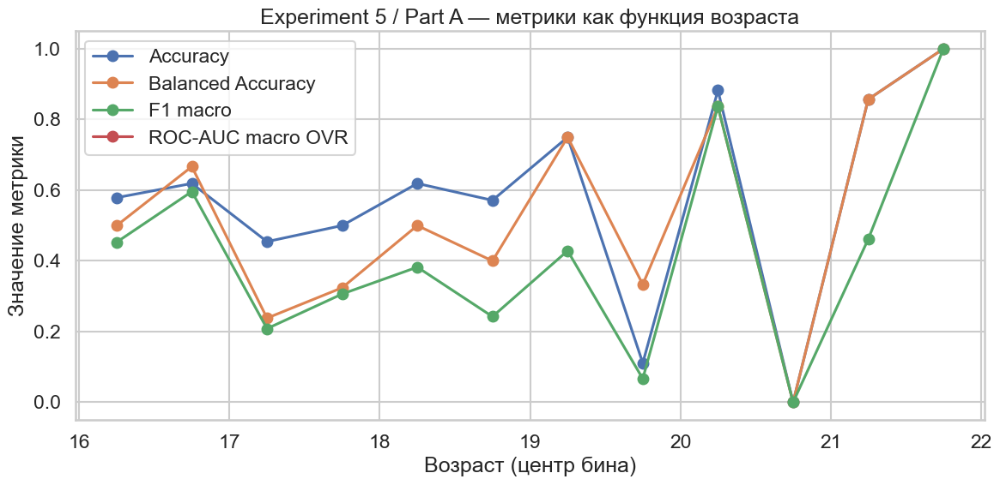

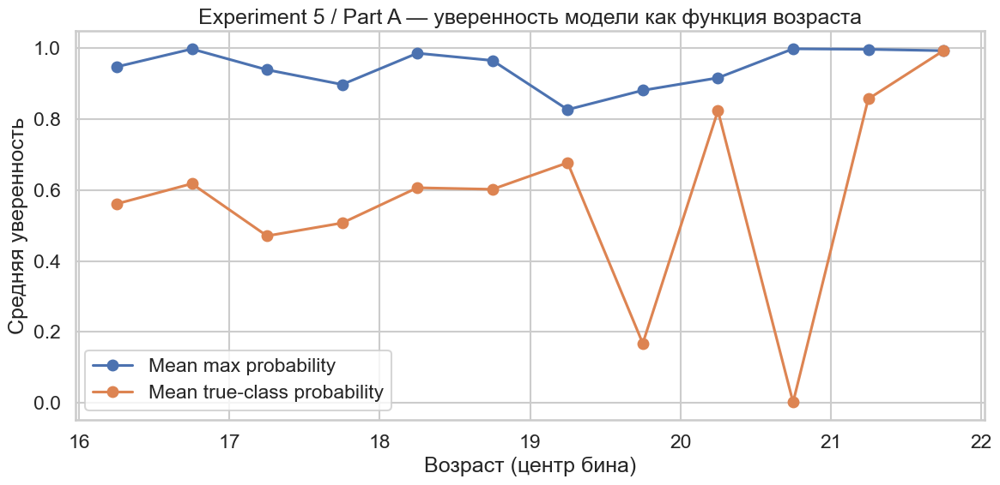

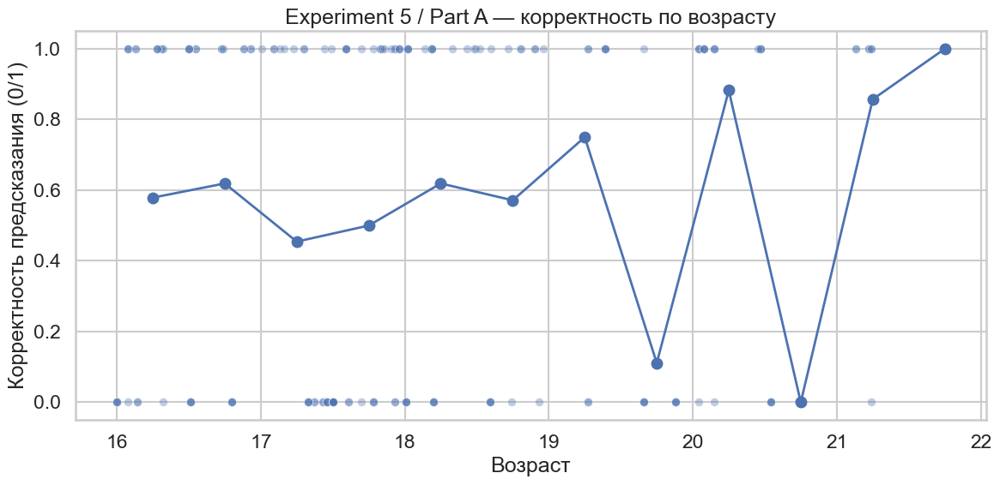

[Experiment 5 / Part A] Saved age trend table: Experiments/5_th_experiment/analysis/part_A_age_trend/experiment5_A_age_trend_metrics.csv
[Experiment 5 / Part A] Saved summary JSON: Experiments/5_th_experiment/analysis/part_A_age_trend/experiment5_A_summary.json

===== Experiment 5 / Part A summary =====
{
  "overall_metrics": {
    "n": 178,
    "accuracy": 0.5786516853932584,
    "balanced_accuracy": 0.27462264150943394,
    "f1_macro": 0.25496487947849816,
    "auc_macro_ovr": 0.6934970838815854,
    "auc_per_class": {
      "0": 0.6014150943396227,
      "1": 0.65265625,
      "2": 0.7294117647058824,
      "3": 0.7905052264808363
    },
    "y_true_counts": {
      "0": 106,
      "1": 50,
      "2": 8,
      "3": 14
    }
  },
  "overall_metrics_bootstrap_ci": {
    "auc_macro_ovr": {
      "mean_boot": 0.6931450503669044,
      "ci_low": 0.6303594548937212,
      "ci_high": 0.7479827466844209
    },
    "accuracy": {
      "mean_boot": 0.5767359550561798,
      "ci_low": 0.505617

In [207]:
# ------------------------------------------------------------
# 5.3.1 Experiment 5 / Part A - Анализ качества как функции возраста
# ------------------------------------------------------------
age_trend_df, age_trend_summary = run_experiment5_A_age_trend(
    pred_df=pred_df,
    out_dir=OUT_DIR_EXPERIMENT_5 / "part_A_age_trend",
    min_n_per_bin=MIN_N_PER_GROUP,
    age_bin_width=AGE_BIN_WIDTH,
)

print("\n===== Experiment 5 / Part A summary =====")
print(json.dumps(age_trend_summary, ensure_ascii=False, indent=2))

#### 5.3.2 Анализ качества как функция возраста для модели, обученной на Teen re-balanced (14-17.99 лет) с инференсом на Adult(18-21.99 лет)

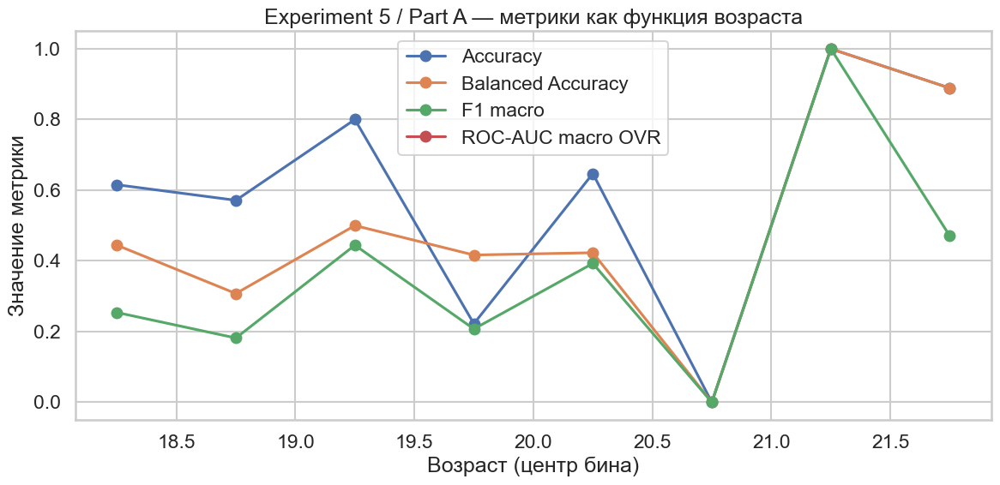

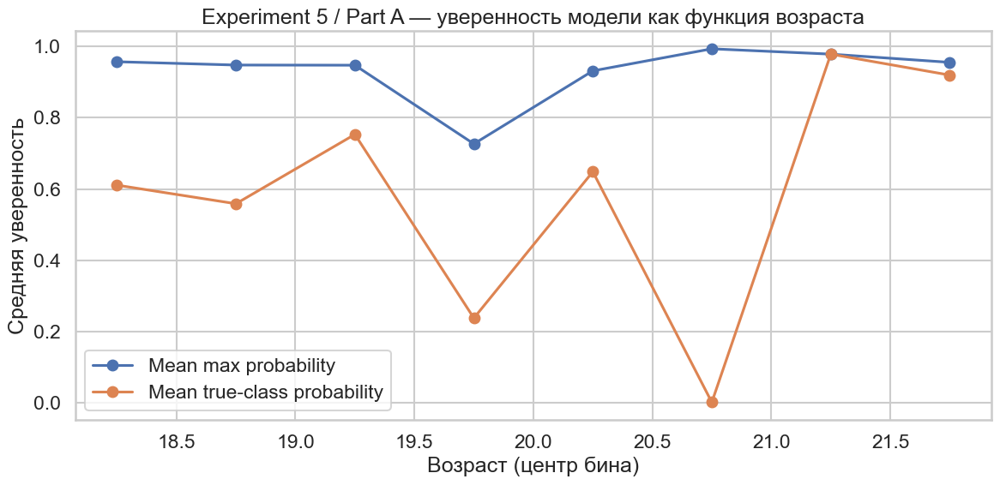

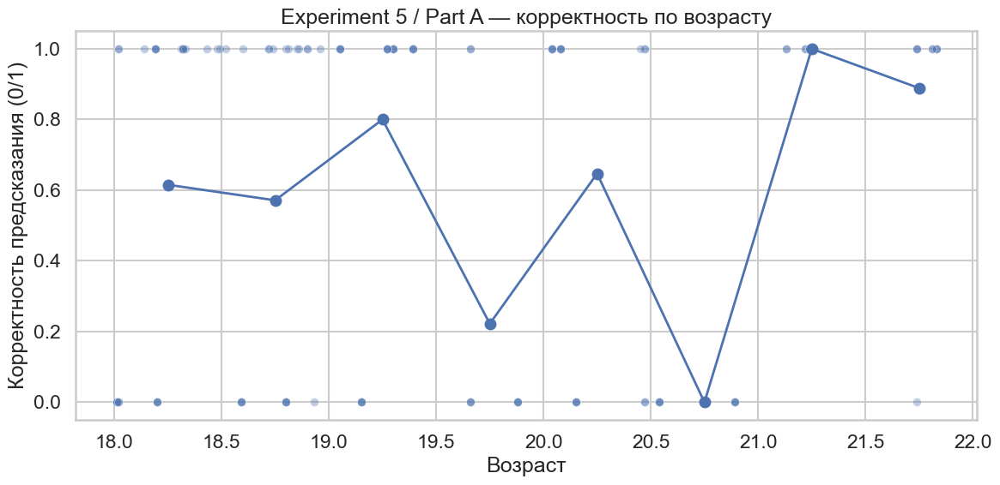

[Experiment 5 / Part A] Saved age trend table: Experiments/5_th_experiment/analysis/part_A_age_trend_rebalanced/experiment5_A_age_trend_metrics.csv
[Experiment 5 / Part A] Saved summary JSON: Experiments/5_th_experiment/analysis/part_A_age_trend_rebalanced/experiment5_A_summary.json

===== Experiment 5 / Part A summary =====
{
  "overall_metrics": {
    "n": 117,
    "accuracy": 0.6153846153846154,
    "balanced_accuracy": 0.24093614718614717,
    "f1_macro": 0.20769671504965623,
    "auc_macro_ovr": 0.5467717682926075,
    "auc_per_class": {
      "0": 0.4227272727272727,
      "1": 0.6505376344086021,
      "2": 0.5452380952380952,
      "3": 0.5685840707964601
    },
    "y_true_counts": {
      "0": 77,
      "1": 24,
      "2": 12,
      "3": 4
    }
  },
  "overall_metrics_bootstrap_ci": {
    "auc_macro_ovr": {
      "mean_boot": 0.5463660460490444,
      "ci_low": 0.46922850669804195,
      "ci_high": 0.6218018426076523
    },
    "accuracy": {
      "mean_boot": 0.615837606837

In [208]:
# ------------------------------------------------------------
# 5.3.2 Experiment 5 / Part A - Анализ качества как функции возраста
# ------------------------------------------------------------
age_trend_df_rebalanced, age_trend_summary_rebalanced = run_experiment5_A_age_trend(
    pred_df=pred_df_rebalanced,
    out_dir=OUT_DIR_EXPERIMENT_5 / "part_A_age_trend_rebalanced",
    min_n_per_bin=MIN_N_PER_GROUP,
    age_bin_width=AGE_BIN_WIDTH,
)

print("\n===== Experiment 5 / Part A summary =====")
print(json.dumps(age_trend_summary_rebalanced, ensure_ascii=False, indent=2))

### 5.4. Experiment 5 / Part B -  Стратифицированный анализ по возрастным подгруппам внутри Adults

In [209]:
# ============================================================
# 4. Experiment 5 / Part B
# Стратифицированный анализ по возрастным подгруппам внутри Adults
# ============================================================

def run_experiment5_B_age_subgroups(
    pred_df: pd.DataFrame,
    out_dir: Path,
    age_groups: list[tuple[str, float, float]] = ADULT_AGE_GROUPS,
    min_n_per_group: int = MIN_N_PER_GROUP,
):
    """
    Часть B:
    Выделяются возрастные подгруппы внутри взрослой выборки.
    Для каждой подгруппы считаются:
      - n
      - accuracy
      - balanced accuracy
      - macro F1
      - macro ROC-AUC OVR
      - per-class ROC-AUC
      - bootstrap CI для основных метрик
    """
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    df = pred_df.copy()
    df = df[df["age"].notna()].copy()
    df["age"] = df["age"].astype(float)

    # --- Confusion matrix labels ---
    # sklearn.metrics.confusion_matrix() без labels автоматически сжимает матрицу
    # до фактически встреченных классов. Чтобы матрицы были сопоставимы между
    # возрастными подгруппами, фиксируем labels по числу классов модели (prob_* колонкам).
    cm_labels = None
    prob_cols = [c for c in df.columns if c.startswith('prob_')]
    prob_idx = []
    for c in prob_cols:
        try:
            prob_idx.append(int(c.split('_', 1)[1]))
        except Exception:
            pass
    if len(prob_idx) > 0:
        uniq = sorted(set(prob_idx))
        # типичный случай: prob_0..prob_{K-1}
        if uniq == list(range(max(uniq) + 1)):
            cm_labels = list(range(max(uniq) + 1))
        else:
            cm_labels = uniq

    group_rows = []
    group_json = {}

    for label, left, right in age_groups:
        g = df[(df["age"] >= left) & (df["age"] < right)].copy()
        if len(g) < min_n_per_group:
            print(f"[WARN] Group {label} skipped: n={len(g)} < {min_n_per_group}")
            continue

        metrics = compute_basic_metrics(g)

        auc_boot = bootstrap_ci_metric(g, lambda x: compute_basic_metrics(x)["auc_macro_ovr"])
        acc_boot = bootstrap_ci_metric(g, lambda x: compute_basic_metrics(x)["accuracy"])
        f1_boot = bootstrap_ci_metric(g, lambda x: compute_basic_metrics(x)["f1_macro"])
        bal_boot = bootstrap_ci_metric(g, lambda x: compute_basic_metrics(x)["balanced_accuracy"])

        row = {
            "group": label,
            "age_left": left,
            "age_right": right,
            "n": int(len(g)),
            "accuracy": metrics["accuracy"],
            "balanced_accuracy": metrics["balanced_accuracy"],
            "f1_macro": metrics["f1_macro"],
            "auc_macro_ovr": metrics["auc_macro_ovr"],
            "auc_macro_ovr_ci_low": auc_boot[1],
            "auc_macro_ovr_ci_high": auc_boot[2],
            "accuracy_ci_low": acc_boot[1],
            "accuracy_ci_high": acc_boot[2],
            "f1_macro_ci_low": f1_boot[1],
            "f1_macro_ci_high": f1_boot[2],
            "balanced_accuracy_ci_low": bal_boot[1],
            "balanced_accuracy_ci_high": bal_boot[2],
        }
        group_rows.append(row)

        group_json[label] = {
            "metrics": metrics,
            "bootstrap_ci": {
                "auc_macro_ovr": {"mean_boot": auc_boot[0], "ci_low": auc_boot[1], "ci_high": auc_boot[2]},
                "accuracy": {"mean_boot": acc_boot[0], "ci_low": acc_boot[1], "ci_high": acc_boot[2]},
                "f1_macro": {"mean_boot": f1_boot[0], "ci_low": f1_boot[1], "ci_high": f1_boot[2]},
                "balanced_accuracy": {"mean_boot": bal_boot[0], "ci_low": bal_boot[1], "ci_high": bal_boot[2]},
            },
        }

        # Сохраняем confusion matrix отдельно
        y_true = g["y_true"].astype(int).to_numpy()
        y_pred = g["y_pred"].astype(int).to_numpy()
        labels_for_cm = cm_labels if cm_labels is not None else sorted(set(y_true.tolist()) | set(y_pred.tolist()))
        cm = confusion_matrix(y_true, y_pred, labels=labels_for_cm)
        cm_df = pd.DataFrame(
            cm,
            index=[f"true_{i}" for i in labels_for_cm],
            columns=[f"pred_{i}" for i in labels_for_cm],
        )
        # Напечатаем confusion matrix в качестве графика
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")
        plt.xlabel("Predicted value")
        plt.ylabel("Actual value")
        plt.title(f"Confusion Matrix for Group {label} (n={len(g)})")
        plt.tight_layout()
        plt.savefig(out_dir / f"experiment5_B_confusion_matrix_{label.replace('.', '_')}.png", dpi=200)
        plt.show()
        plt.close()

        cm_df.to_csv(out_dir / f"experiment5_B_confusion_matrix_{label.replace('.', '_')}.csv", index=True)

    groups_df = pd.DataFrame(group_rows).sort_values("age_left").reset_index(drop=True)
    groups_df.to_csv(out_dir / "experiment5_B_age_groups_metrics.csv", index=False)

    with open(out_dir / "experiment5_B_summary.json", "w", encoding="utf-8") as f:
        json.dump(group_json, f, ensure_ascii=False, indent=2)

    # --- Plot 1: ROC-AUC по группам ---
    plt.figure(figsize=(10, 6))
    if len(groups_df) > 0:
        x = np.arange(len(groups_df))
        y = groups_df["auc_macro_ovr"].to_numpy()
        yerr_low = y - groups_df["auc_macro_ovr_ci_low"].to_numpy()
        yerr_high = groups_df["auc_macro_ovr_ci_high"].to_numpy() - y
        plt.errorbar(x, y, yerr=[yerr_low, yerr_high], fmt="o-", capsize=5)
        plt.xticks(x, groups_df["group"])
    plt.ylabel("ROC-AUC macro OVR")
    plt.xlabel("Возрастная подгруппа")
    plt.title("Experiment 5 / Part B — ROC-AUC по возрастным подгруппам")
    plt.tight_layout()
    plt.savefig(out_dir / "experiment5_B_auc_by_age_group.png", dpi=200)
    plt.show()
    plt.close()

    # --- Plot 2: F1 / Accuracy по группам ---
    plt.figure(figsize=(10, 6))
    if len(groups_df) > 0:
        x = np.arange(len(groups_df))
        plt.plot(x, groups_df["accuracy"], marker="o", label="Accuracy")
        plt.plot(x, groups_df["balanced_accuracy"], marker="o", label="Balanced Accuracy")
        plt.plot(x, groups_df["f1_macro"], marker="o", label="F1 macro")
        plt.xticks(x, groups_df["group"])
    plt.ylabel("Значение метрики")
    plt.xlabel("Возрастная подгруппа")
    plt.title("Experiment 5 / Part B — Accuracy / F1 по возрастным подгруппам")
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_dir / "experiment5_B_acc_f1_by_age_group.png", dpi=200)
    plt.show()
    plt.close()

    print(f"[Experiment 5 / Part B] Saved table: {out_dir / 'experiment5_B_age_groups_metrics.csv'}")
    print(f"[Experiment 5 / Part B] Saved summary JSON: {out_dir / 'experiment5_B_summary.json'}")
    return groups_df, group_json

#### 5.4.1 Стратифицированный анализ по возрастным подгруппам внутри Adults для модели, обученной на Teen+Adult(0.2) с инференсом на Adult(0.8)

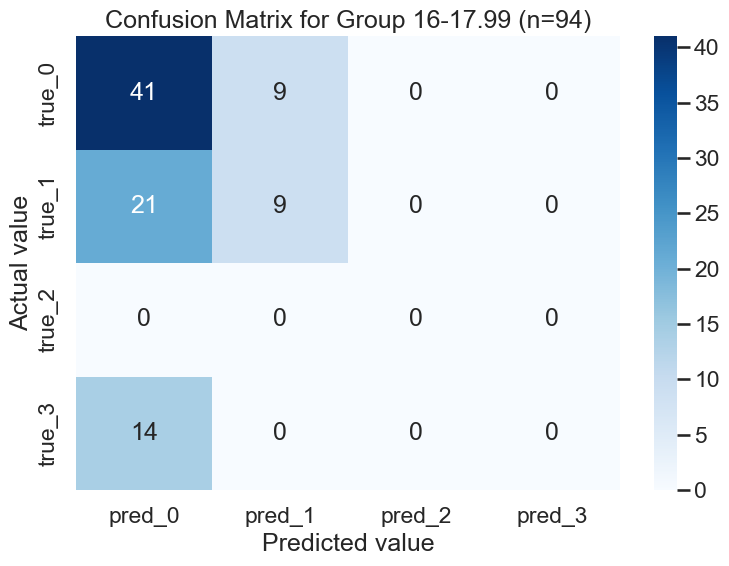

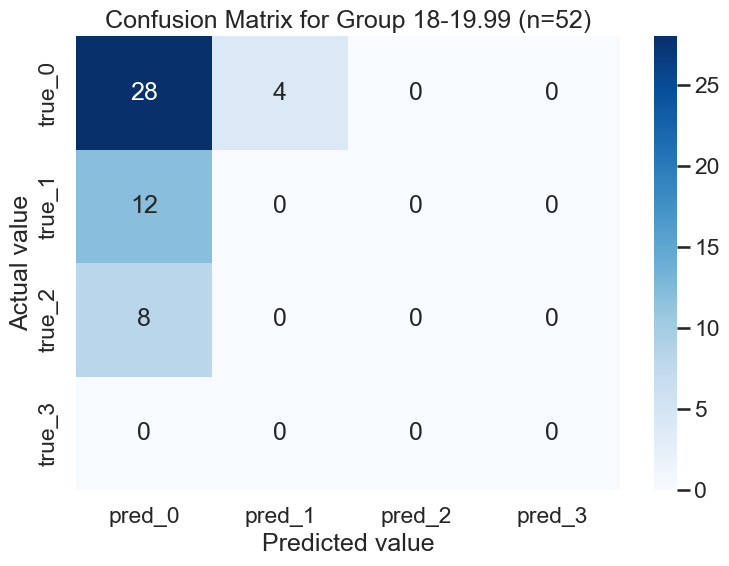

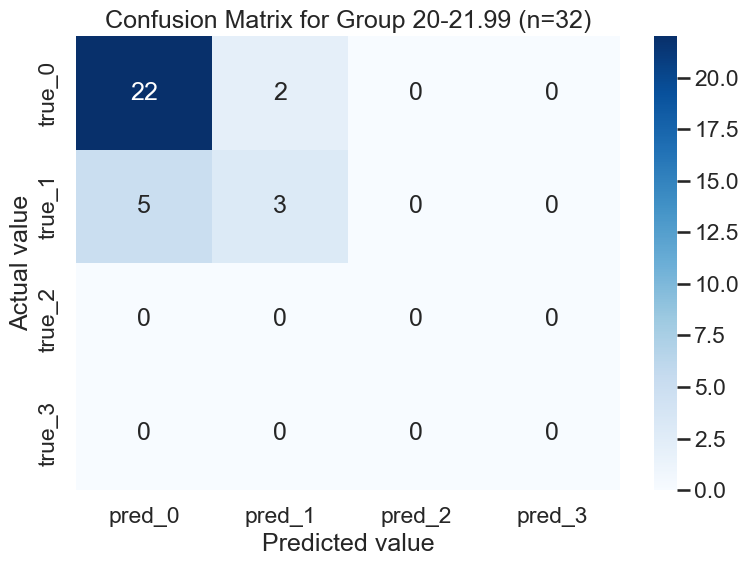

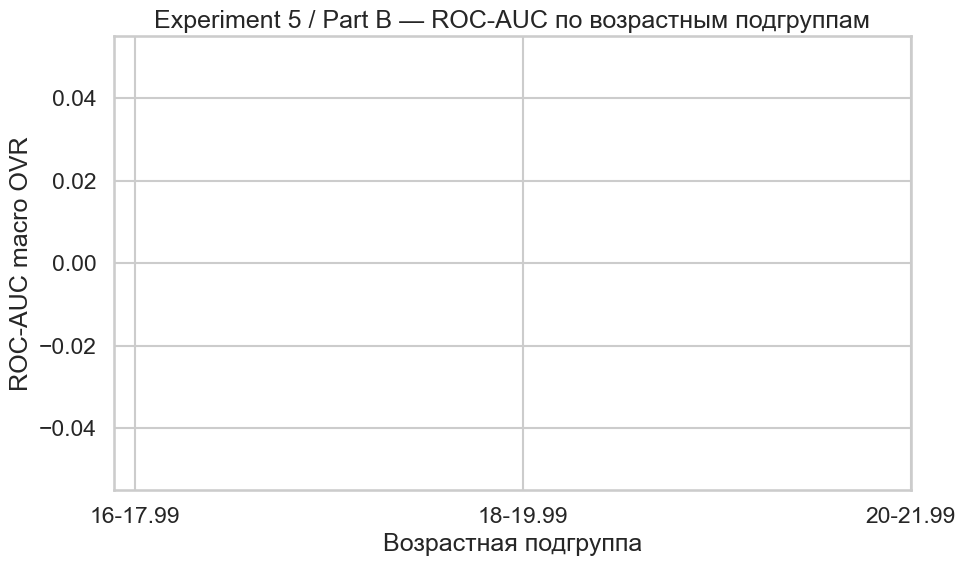

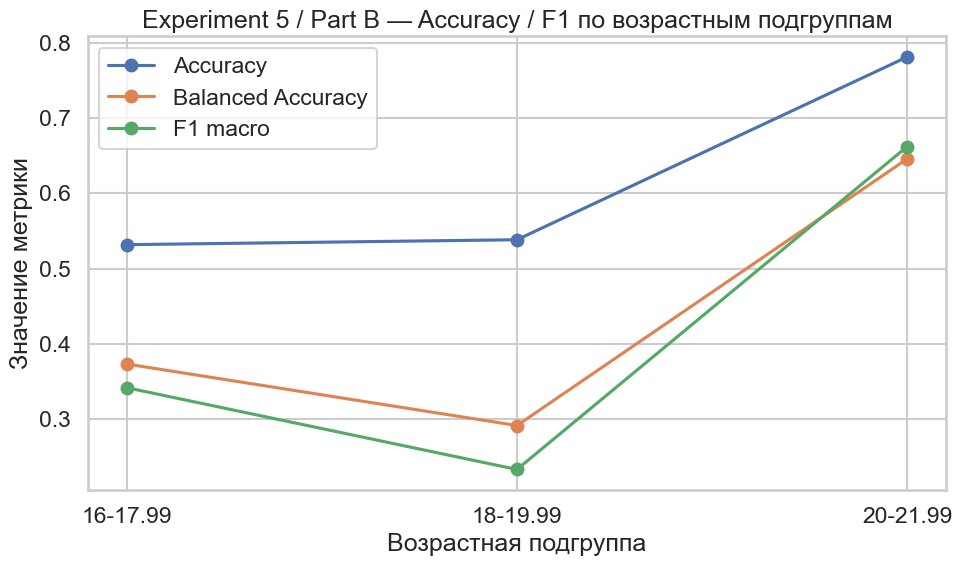

[Experiment 5 / Part B] Saved table: Experiments/5_th_experiment/analysis/part_B_age_groups/experiment5_B_age_groups_metrics.csv
[Experiment 5 / Part B] Saved summary JSON: Experiments/5_th_experiment/analysis/part_B_age_groups/experiment5_B_summary.json

===== Experiment 5 / Part B table =====
      group  age_left  age_right   n  accuracy  balanced_accuracy  f1_macro  auc_macro_ovr  auc_macro_ovr_ci_low  auc_macro_ovr_ci_high  accuracy_ci_low  accuracy_ci_high  f1_macro_ci_low  f1_macro_ci_high  balanced_accuracy_ci_low  balanced_accuracy_ci_high
0  16-17.99      16.0      17.99  94  0.531915           0.373333  0.341931            NaN                   NaN                    NaN         0.436170          0.627660         0.262597          0.414821                  0.302833                   0.440427
1  18-19.99      18.0      19.99  52  0.538462           0.291667  0.233333            NaN                   NaN                    NaN         0.384615          0.673077         0.18518

In [210]:
# ------------------------------------------------------------
# 5.4.1 Experiment 5 / Part B -  Анализ по возрастным подгруппам
# ------------------------------------------------------------
age_groups_df, age_groups_summary = run_experiment5_B_age_subgroups(
    pred_df=pred_df,
    out_dir=OUT_DIR_EXPERIMENT_5 / "part_B_age_groups",
    age_groups=ADULT_AGE_GROUPS,
    min_n_per_group=MIN_N_PER_GROUP,
)

print("\n===== Experiment 5 / Part B table =====")
print(age_groups_df)

#### 5.4.2 Стратифицированный анализ по возрастным подгруппам внутри Adults для модели, обученной на Teen re-balanced (14-17.99 лет) с инференсом на Adult (18-21.99 лет)

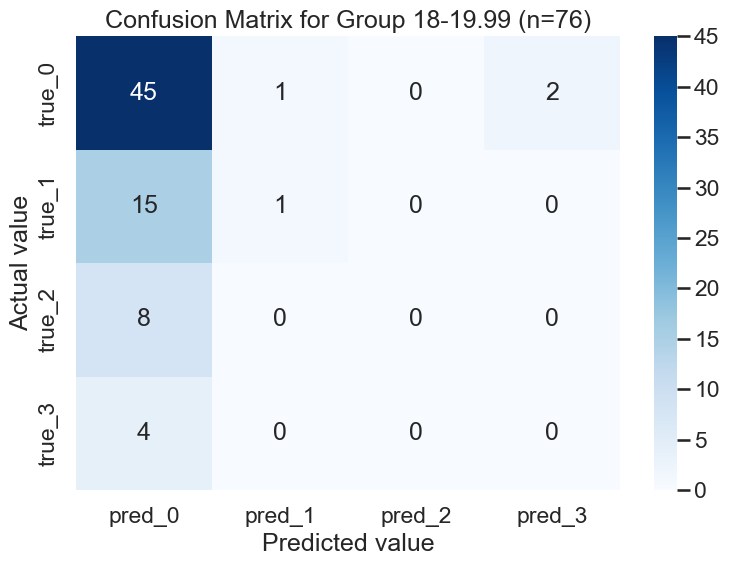

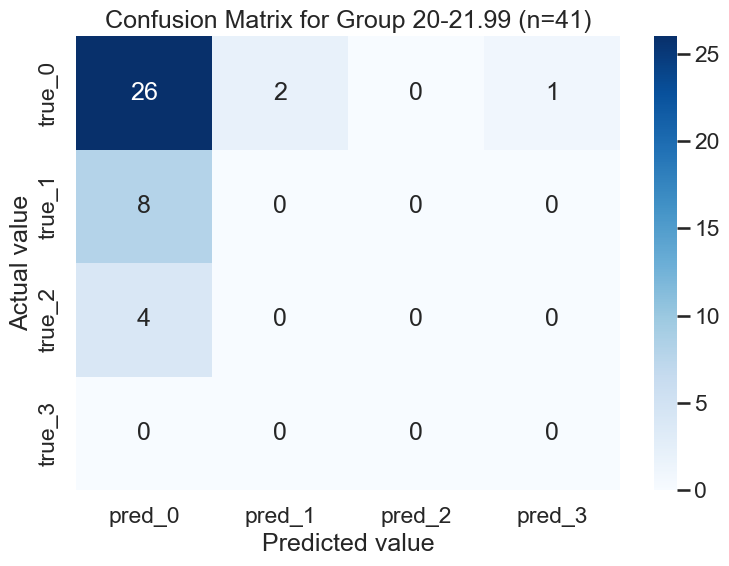

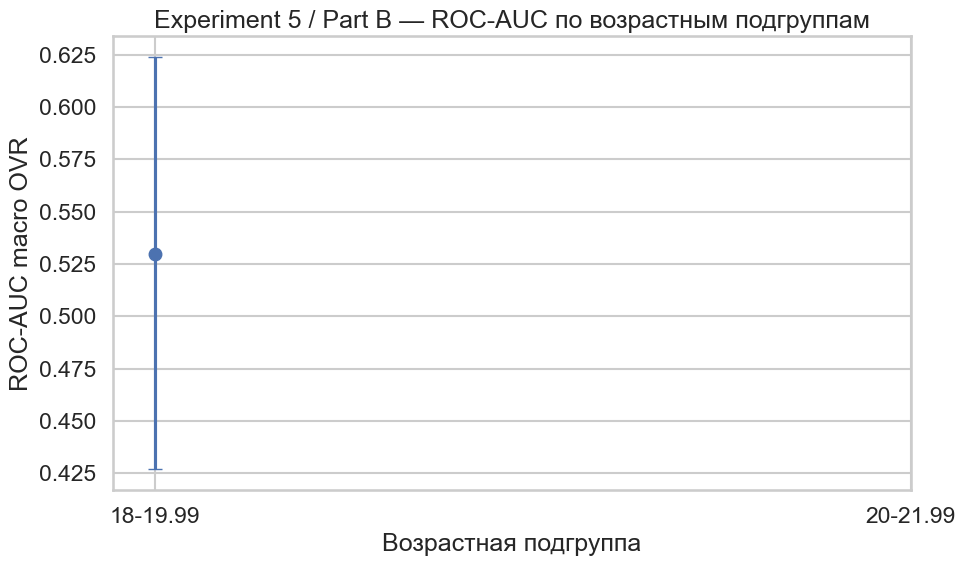

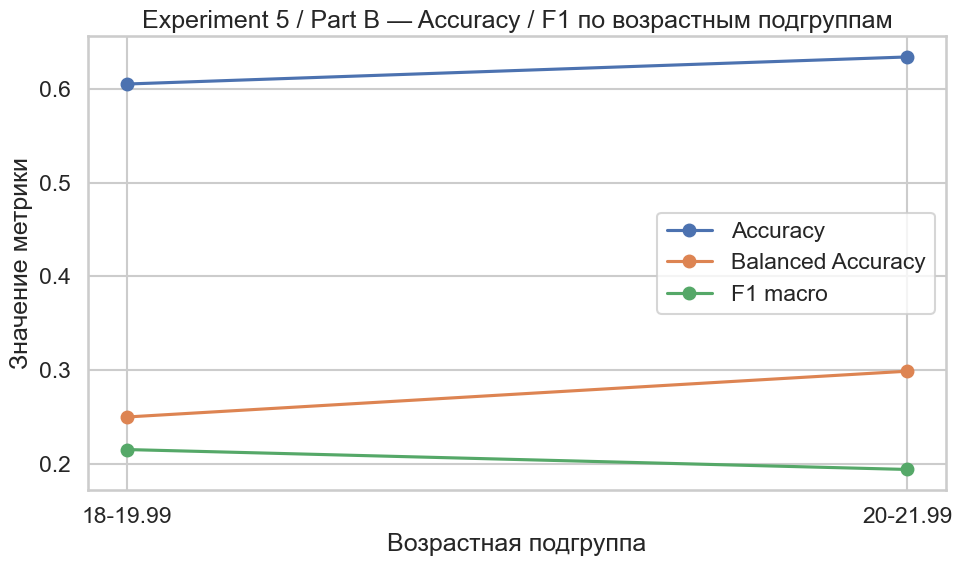

[Experiment 5 / Part B] Saved table: Experiments/5_th_experiment/analysis/part_B_age_groups_rebalanced/experiment5_B_age_groups_metrics.csv
[Experiment 5 / Part B] Saved summary JSON: Experiments/5_th_experiment/analysis/part_B_age_groups_rebalanced/experiment5_B_summary.json

===== Experiment 5 / Part B table =====
      group  age_left  age_right   n  accuracy  balanced_accuracy  f1_macro  auc_macro_ovr  auc_macro_ovr_ci_low  auc_macro_ovr_ci_high  accuracy_ci_low  accuracy_ci_high  f1_macro_ci_low  f1_macro_ci_high  balanced_accuracy_ci_low  balanced_accuracy_ci_high
0  18-19.99      18.0      19.99  76  0.605263           0.250000  0.215278       0.530017              0.426925               0.623911         0.486842          0.710526         0.169565          0.280834                  0.218736                   0.302885
1  20-21.99      20.0      21.99  41  0.634146           0.298851  0.194030            NaN                   NaN                    NaN         0.512195          0.

In [211]:
# ------------------------------------------------------------
# 5.4.2 Experiment 5 / Part B -  Анализ по возрастным подгруппам
# ------------------------------------------------------------
age_groups_df_rebalanced, age_groups_summary_rebalanced = run_experiment5_B_age_subgroups(
    pred_df=pred_df_rebalanced,
    out_dir=OUT_DIR_EXPERIMENT_5 / "part_B_age_groups_rebalanced",
    age_groups=ADULT_AGE_GROUPS_REBALANCED,
    min_n_per_group=MIN_N_PER_GROUP,
)

print("\n===== Experiment 5 / Part B table =====")
print(age_groups_df_rebalanced)

# Эксперимент 6. Создание бинарного классификатора ADHD на основе ROISequenceNet

### 6.1 Инициализация констант и основных функций

In [212]:
# Binary classification helpers for ROISequenceNet.

# Goal
# ----
# Enable a CONTROL vs ADHD setup without editing the existing ROISequenceNet definition.

# Usage in notebook (after ROISequenceNet is defined):

#     from ADHD200.Pipelines.AthenaPipeline.binary_roi_seq_net import (
#         ensure_binary_labels,
#         make_roi_sequence_net_binary,
#         binary_confusion_matrix,
#     )

#     df_bin = ensure_binary_labels(df, label_col="label")

#     model = make_roi_sequence_net_binary(
#         ROISequenceNet,
#         n_roi=n_roi,
#         cov_dim=COV_DIM,
#         tcn_dropout=0.1,
#         lstm_hidden=128,
#         attn_heads=4,
#     )

# Mapping
# -------
# {0:0, 1:1, 2:1, 3:1}

import os
import json

from dataclasses import dataclass
from typing import Any, Mapping, Optional, Sequence, Type

import numpy as np
import pandas as pd
from pathlib import Path
from IPython.display import display

from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

In [213]:
# ---------------------------
# 6.1.1. Пространство поиска
# ---------------------------
# Подбираем через grid-lite, чтобы не утонуть в комбинациях.
# Приоритет: обобщаемость (перенос), а не максимальный capacity.

HP_GRID_ROISEQ_BIN = {
    # оптимизация/регуляризация
    "lr": [3e-4, 1e-3],
    "weight_decay": [1e-4, 1e-3],

    # ROISequenceNet.__init__(..., tcn_dropout, lstm_hidden, attn_heads)
    "tcn_dropout": [0.1, 0.2],
    "lstm_hidden": [64, 128],
    "attn_heads": [2, 4],

    # учёт дисбаланса классов на уровне loss (если реализовано в SingleExperiment)
    "class_weight_strength": [0.5, 1.0, 2.0],
}

# Ограничение на число комбинаций (на случай, если сетка разрастётся)
MAX_TRIALS = 60

# Критерий отбора лучших конфигов
PRIMARY_METRIC_NAME = EarlyStopMetric.VAL_LOSS

EXPERIMENT_NAME_6 = '6_th_experiment'
EXPERIMENT_DIR_6 = str(Path(EXPERIMENT_ROOT)/EXPERIMENT_NAME_6)
if not os.path.exists(EXPERIMENT_DIR_6):
    os.makedirs(EXPERIMENT_DIR_6)
    print(f"Создана директория для эксперимента 6: {EXPERIMENT_DIR_6}")
CHECKPOINT_DIR_6 = str(Path(EXPERIMENT_DIR_6)/'checkpoints')
if not os.path.exists(CHECKPOINT_DIR_6):
    os.makedirs(CHECKPOINT_DIR_6)
    print(f"Создана директория для чекпоинтов 6: {CHECKPOINT_DIR_6}")
else:
    print(f"Директория для чекпоинтов 6 уже существует: {CHECKPOINT_DIR_6}")

# Создадим директорию test_results
TEST_RESULTS_DIR_6 = str(Path(EXPERIMENT_DIR_6)/'test_results')
if not os.path.exists(TEST_RESULTS_DIR_6):
    os.makedirs(TEST_RESULTS_DIR_6)
    print(f"Создана директория для результатов тестирования 6: {TEST_RESULTS_DIR_6}")
else:
    print(f"Директория для результатов тестирования 6 уже существует: {TEST_RESULTS_DIR_6}")

Директория для чекпоинтов 6 уже существует: Experiments/6_th_experiment/checkpoints
Директория для результатов тестирования 6 уже существует: Experiments/6_th_experiment/test_results


In [214]:
BINARY_LABEL_MAP: Mapping[int, int] = {0: 0, 1: 1, 2: 1, 3: 1}

SEED_BIN = 42

N_CLASSES_BIN = 2
COV_DIM_BIN = 0 # Для случая, где нет ковариат
COV_DIM_AGE_BIN = 1 # 1 колонка - непрерывная величина
COV_DIM_GENDER_BIN = 2 # Размерность - 2 колонки после OneHotEncoding
COV_DIM_SITE_BIN = len(UNIQUE_SITES) if UNIQUE_SITES is not None else 0 # Размерность - 7 колонки после OneHotEncoding, поскольку у на 7 уникальных сайтов
COV_DIM_GENDER_SITE_BIN = COV_DIM_GENDER_BIN + COV_DIM_SITE_BIN

SEARCH_ALL_SEEDS_BIN = [42, 43, 44, 45]

def ensure_binary_labels(
    df: pd.DataFrame,
    label_col: str = "label",
    mapping: Mapping[int, int] = BINARY_LABEL_MAP,
    *,
    inplace: bool = False,
) -> pd.DataFrame:
    """Map multiclass labels to binary labels in-place and return df.

    Expected mapping for this project: {0:0, 1/2/3:1}.

    Raises:
      - KeyError if label_col missing.
      - ValueError if labels contain values not in mapping.
    """

    if label_col not in df.columns:
        raise KeyError(f"Column '{label_col}' not found in df")

    # Normalize to integers where possible
    labels = pd.to_numeric(df[label_col], errors="raise").astype(int)

    unknown = sorted(set(labels.unique()) - set(mapping.keys()))
    if unknown:
        raise ValueError(
            f"Unknown labels in '{label_col}' not covered by mapping: {unknown}; "
            f"mapping_keys={sorted(mapping.keys())}"
        )
    
    out = df if inplace else df.copy()

    out[label_col] = labels.map(lambda x: int(mapping[int(x)])).astype(int)
    return out

def make_roi_sequence_net_binary(
    n_roi: int,
    cov_dim: int = 0,
    tcn_dropout: float = 0.1,
    lstm_hidden: int = 128,
    attn_heads: int = 4,
    **kwargs: Any,
):
    """Instantiate an existing ROISequenceNet-like class with `n_classes=2`.

    This avoids importing/modifying the original ROISequenceNet definition.

    Notes:
        - If `roi_sequence_net_cls` does not accept the same constructor args, this will raise.
        - `n_classes` is forced to 2; any provided `n_classes` in kwargs is ignored.
    """
    kwargs.pop("n_classes", None)
    return ROISequenceNet(
        n_roi=n_roi,
        n_classes=2,
        cov_dim=cov_dim,
        tcn_dropout=tcn_dropout,
        lstm_hidden=lstm_hidden,
        attn_heads=attn_heads,
        **kwargs,
    )

def binary_confusion_matrix(
    y_true: Sequence[int] | np.ndarray,
    y_pred: Sequence[int] | np.ndarray,
    *,
    labels: Sequence[int] = (0, 1),
) -> np.ndarray:
    """Stable 2x2 confusion matrix.

    Unlike sklearn's default behavior, this always returns shape (2,2), even if a
    subgroup contains only one class.
    """
    return stable_confusion_matrix(y_true, y_pred, labels=labels)


def stable_confusion_matrix(
    y_true: Sequence[int] | np.ndarray,
    y_pred: Sequence[int] | np.ndarray,
    *,
    labels: Sequence[int],
) -> np.ndarray:
    """Confusion matrix with a fixed label set.

    sklearn's `confusion_matrix` will shrink its output if some classes are not
    present in a subgroup; passing `labels=` forces a consistent shape.
    """
    try:
        from sklearn.metrics import confusion_matrix
    except Exception as e:  # pragma: no cover
        raise ImportError("scikit-learn is required for stable_confusion_matrix") from e

    return confusion_matrix(y_true, y_pred, labels=list(labels))


@dataclass(frozen=True)
class BinaryPredictions:
    """Convenience container for per-sample binary outputs."""

    y_true: np.ndarray
    y_pred: np.ndarray
    proba: np.ndarray  # shape [N, 2]

    @property
    def proba_adhd(self) -> np.ndarray:
        return self.proba[:, 1]


### 6.2. Создание бинарных датасетов по аналогии с экспериментом 3 и соответствующих даталоадеров

#### 6.2.1 Создаём датасеты по аналогии с экспериментом 3

In [215]:
# Преобразуем label в data_df в бинарный формат: Neurotypical (0) vs Neurodivergent (1)
df_bin = ensure_binary_labels(data_df, label_col="label")
display(df_bin.head(5))

# Исследуем колонку label
print("Уникальные значения в колонке 'label':", df_bin["label"].unique())
print("Распределение классов в колонке 'label':")
print(df_bin["label"].value_counts())

,participant_id,pid_raw,site,site_original,run_id,win_index,segment_start,segment_end,npy_path,mask_path,tsv_path,atlas,TR,nan_ratio_run,age_cohort,data_path,label,age,gender,n_roi,nan_frac_raw,roi_drop_cnt,nan_frac
0,sub-1043241,1043241,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0,9.12,M,353,0.0,0,0.0
1,sub-1266183,1266183,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0,9.67,F,353,0.0,0,0.0
2,sub-1535233,1535233,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,0,9.64,M,353,0.0,0,0.0
3,sub-1541812,1541812,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1,8.45,F,353,0.0,0,0.0
4,sub-1577042,1577042,KKI,3,ses1_rest1,0,0,200,Athena_prepared_three_age_cohorts/cohort_child...,Athena_prepared_three_age_cohorts/cohort_child...,NaN,CC400,NaN,0.0,children,Athena_prepared_three_age_cohorts/cohort_child...,1,9.06,M,353,0.0,0,0.0


Уникальные значения в колонке 'label': [0 1]
Распределение классов в колонке 'label':
label
0    1164
1     757
Name: count, dtype: int64


In [216]:
# Binary versions of Experiment 3 datasets/dataloaders for ROISequenceNet hparam search
# Label map: 0 -> 0, 1/2/3 -> 1

def _make_binary_df_and_counts(df: pd.DataFrame, name: str):
    df_bin = ensure_binary_labels(df.copy(), label_col="label", mapping=BINARY_LABEL_MAP)
    counts = df_bin["label"].value_counts().reindex([0, 1], fill_value=0).astype(int)
    print(f"{name}: binary class_counts={counts.to_dict()} | n={len(df_bin)}")
    if (counts == 0).any():
        raise ValueError(f"Binary mapping produced an empty class for {name}: {counts.to_dict()}")
    return df_bin, counts

# Map already-prepared splits to keep the same split as multiclass
print("\n=== Binary class distributions ===")
data_df_teen_bin, class_counts_teen_bin = _make_binary_df_and_counts(data_df_teen, "teen_bin")
data_df_mixed_teen_adult_bin, class_counts_mixed_teen_adult_bin = _make_binary_df_and_counts(data_df_mixed_teen_adult, "mixed_teen+adult_train_0_2_bin")
data_df_mixed_children_teen_adult_0_8_bin, class_counts_mixed_children_teen_adult_0_8_bin = _make_binary_df_and_counts(data_df_mixed_children_teen_adult_0_8, "mixed_children+teen+adult_rest_bin")
data_df_mixed_teen_adult_0_8_bin, class_counts_mixed_teen_adult_0_8_bin = _make_binary_df_and_counts(data_df_mixed_teen_adult_0_8, "mixed_teen+adult_rest_bin")
data_df_adult_rest_bin, class_counts_adult_rest_bin = _make_binary_df_and_counts(data_df_adult_rest, "adult_rest_bin")

print("\n=== Binary class inference distributions ===")
data_df_adult_inference_bin, class_counts_adult_inference_bin = _make_binary_df_and_counts(data_df_adult_inference, "adult_inference_bin")
data_df_adult_rest_inference_bin, class_counts_adult_rest_inference_bin = _make_binary_df_and_counts(data_df_adult_rest_inference, "adult_rest_inference_bin")

# Проанализируем, какие возрастные группы попали в инференсы (сделаем подсчёт респондентов по age)
age_counts_adult_inference = data_df_adult_inference_bin['age'].value_counts()
age_counts_adult_rest_inference = data_df_adult_rest_inference_bin['age'].value_counts()

print("\n=== Age distribution in adult_inference_bin ===")
print(age_counts_adult_inference.sort_index())
print("\n=== Age distribution in adult_rest_inference_bin ===")
print(age_counts_adult_rest_inference.sort_index())
# data_df_mixed_teen_adult_0_8_bin.head(5)


=== Binary class distributions ===
teen_bin: binary class_counts={0: 397, 1: 271} | n=668
mixed_teen+adult_train_0_2_bin: binary class_counts={0: 429, 1: 287} | n=716
mixed_children+teen+adult_rest_bin: binary class_counts={0: 1137, 1: 739} | n=1876
mixed_teen+adult_rest_bin: binary class_counts={0: 508, 1: 341} | n=849
adult_rest_bin: binary class_counts={0: 111, 1: 70} | n=181

=== Binary class inference distributions ===
adult_inference_bin: binary class_counts={0: 27, 1: 18} | n=45
adult_rest_inference_bin: binary class_counts={0: 106, 1: 72} | n=178

=== Age distribution in adult_inference_bin ===
age
16.00    4
16.08    2
16.28    1
16.31    2
16.73    2
17.09    2
17.13    1
17.23    1
17.50    4
17.78    4
17.83    2
17.91    1
18.59    4
18.60    1
18.72    1
19.88    4
20.08    4
20.45    1
21.74    4
Name: count, dtype: int64

=== Age distribution in adult_rest_inference_bin ===
age
16.00    4
16.08    4
16.13    2
16.14    2
16.28    3
        ..
20.54    4
21.13    2
21.2

#### 6.2.2 Создаём датасеты с исключением класса N.2 - ADHD-Hyperactive/Impulsive

In [217]:
# Создадим датасеты с исключением класса 2, а потом на их основе создаём бинарные датасеты для обучения ROISequenceNet,
# чтобы не обучать модель на классе 2, который в бинарной схеме отнесён к классу 1 (Neurodivergent), но может вносить шум из-за своей неоднородности.

# Создадим разбиение когорты Adult (группируем по participant_id и стратифицируем по label):
# - Adult(0.2) inference: отложенный набор для оценки переносимости (не участвует в обучении)
# - Adult_rest: оставшиеся данные Adult (0.8)
# - Adult_train_0_2: отдельная подвыборка Adult(0.2) для подмешивания в Mixed Teen+Adult

from sklearn.model_selection import StratifiedGroupKFold
import numpy as np

adult_df_excl_class_2 = data_df_adult[data_df_adult["label"] != 2].reset_index(drop=True).copy()
groups = adult_df_excl_class_2['participant_id'].astype(str).values
y = adult_df_excl_class_2['label'].values

SEED_STRAT_K_FOLD_6 = 44 # фиксируем сид для воспроизводимости разбиения Adult на инференс и трейн_0_2

sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED_STRAT_K_FOLD_6)
folds = list(sgkf.split(X=np.zeros(len(adult_df_excl_class_2)), y=y, groups=groups))
if len(folds) < 2:
    raise ValueError('Need at least 2 folds for disjoint Adult splits')

inf_fold_idx = 0
train_0_2_fold_idx = 1
_, inf_idx = folds[inf_fold_idx]
_, train_0_2_idx = folds[train_0_2_fold_idx]

data_df_adult_inference_excl_class_2 = adult_df_excl_class_2.iloc[inf_idx].reset_index(drop=True)
data_df_adult_train_0_2_excl_class_2 = adult_df_excl_class_2.iloc[train_0_2_idx].reset_index(drop=True)
data_df_adult_rest_excl_class_2 = adult_df_excl_class_2.drop(index=inf_idx).reset_index(drop=True)
data_df_adult_rest_inference_excl_class_2 = adult_df_excl_class_2.drop(index=train_0_2_idx).reset_index(drop=True)

# Sanity: no participant_id overlap between inference and train_0_2
p_inf = set(data_df_adult_inference_excl_class_2['participant_id'].astype(str))
p_train = set(data_df_adult_train_0_2_excl_class_2['participant_id'].astype(str))
overlap = p_inf.intersection(p_train)
assert not overlap, f'Adult participant_id overlap inference vs train_0_2: {sorted(list(overlap))[:10]}'

data_df_teen_excl_class_2 = data_df_teen[data_df_teen["label"] != 2].copy()

data_df_children_excl_class_2 = data_df_children[data_df_children["label"] != 2].copy()

print(f"Children samples: {len(data_df_children_excl_class_2)} | unique pids: {len(set(data_df_children_excl_class_2['participant_id'].astype(str)))}")
print(f"Teen Only samples: {len(data_df_teen_excl_class_2)} | unique pids: {len(set(data_df_teen_excl_class_2['participant_id'].astype(str)))}")
print(f'Adult samples: {len(adult_df_excl_class_2)} | unique pids: {len(set(adult_df_excl_class_2["participant_id"].astype(str)))}')
print(f'Adult(0.2) inference samples: {len(data_df_adult_inference_excl_class_2)} | unique pids: {len(p_inf)}')
print(f'Adult_train_0_2 samples: {len(data_df_adult_train_0_2_excl_class_2)} | unique pids: {len(p_train)}')
print(f'Adult_rest samples: {len(data_df_adult_rest_excl_class_2)}')
print(f'Adult_rest inference samples: {len(data_df_adult_rest_inference_excl_class_2)}')

data_df_mixed_teen_adult_excl_class_2 = pd.concat([data_df_teen_excl_class_2, data_df_adult_train_0_2_excl_class_2], ignore_index=True)
print(f'Mixed Teen+Adult_train_0_2 samples: {len(data_df_mixed_teen_adult_excl_class_2)}')

data_df_mixed_children_teen_adult_0_8_excl_class_2 = pd.concat([data_df_children_excl_class_2, data_df_teen_excl_class_2, data_df_adult_rest_excl_class_2], ignore_index=True)
print(f'Mixed Children+Teen+Adult_rest samples: {len(data_df_mixed_children_teen_adult_0_8_excl_class_2)}') 

data_df_mixed_teen_adult_0_8_excl_class_2 = pd.concat([data_df_teen_excl_class_2, data_df_adult_rest_excl_class_2], ignore_index=True)
print(f'Mixed Teen+Adult_rest samples: {len(data_df_mixed_teen_adult_0_8_excl_class_2)}')


# Старая имплементация

# data_df_teen_excl_class_2 = data_df_teen[data_df_teen["label"] != 2].copy()
# data_df_mixed_teen_adult_excl_class_2 = data_df_mixed_teen_adult[data_df_mixed_teen_adult["label"] != 2].copy()
# data_df_mixed_children_teen_adult_0_8_excl_class_2 = data_df_mixed_children_teen_adult_0_8[data_df_mixed_children_teen_adult_0_8["label"] != 2].copy()
# data_df_mixed_teen_adult_0_8_excl_class_2 = data_df_mixed_teen_adult_0_8[data_df_mixed_teen_adult_0_8["label"] != 2].copy()

# data_df_adult_inference_excl_class_2 = data_df_adult_inference[data_df_adult_inference["label"] != 2].copy()
# data_df_adult_rest_inference_excl_class_2 = data_df_adult_rest_inference[data_df_adult_rest_inference["label"] != 2].copy()

# Убедимся, что в датасетах нет класса 2 (напечатаем распределение респондентов по классам для каждого датасета)
print("\n=== Class distributions after excluding class 2 ===")
for name, df in [
    ("teen_excl_class_2", data_df_teen_excl_class_2),
    ("mixed_teen+adult_train_0_2_excl_class_2", data_df_mixed_teen_adult_excl_class_2),
    ("mixed_children+teen+adult_rest_bin_excl_class_2", data_df_mixed_children_teen_adult_0_8_excl_class_2),
    ("mixed_teen+adult_rest_bin_excl_class_2", data_df_mixed_teen_adult_0_8_excl_class_2),
    ("adult_inference_excl_class_2", data_df_adult_inference_excl_class_2),
    ("adult_rest_inference_excl_class_2", data_df_adult_rest_inference_excl_class_2),
]:
    counts = df["label"].value_counts().sort_index()
    print(f"{name}: {counts.to_dict()} | n={len(df)}")

Children samples: 1014 | unique pids: 424
Teen Only samples: 660 | unique pids: 237
Adult samples: 214 | unique pids: 94
Adult(0.2) inference samples: 45 | unique pids: 19
Adult_train_0_2 samples: 41 | unique pids: 18
Adult_rest samples: 169
Adult_rest inference samples: 173
Mixed Teen+Adult_train_0_2 samples: 701
Mixed Children+Teen+Adult_rest samples: 1843
Mixed Teen+Adult_rest samples: 829

=== Class distributions after excluding class 2 ===
teen_excl_class_2: {0.0: 397, 1.0: 108, 3.0: 155} | n=660
mixed_teen+adult_train_0_2_excl_class_2: {0.0: 424, 1.0: 114, 3.0: 163} | n=701
mixed_children+teen+adult_rest_bin_excl_class_2: {0.0: 1135, 1.0: 389, 3.0: 319} | n=1843
mixed_teen+adult_rest_bin_excl_class_2: {0.0: 506, 1.0: 152, 3.0: 171} | n=829
adult_inference_excl_class_2: {0.0: 29, 1.0: 10, 3.0: 6} | n=45
adult_rest_inference_excl_class_2: {0.0: 111, 1.0: 48, 3.0: 14} | n=173


In [218]:
# Создаём бинарные датасеты на основе мультиклассовых
data_df_teen_excl_class_2_bin, class_counts_teen_excl_class_2_bin = _make_binary_df_and_counts(data_df_teen_excl_class_2, "teen_excl_class_2_bin")
data_df_mixed_teen_adult_train_0_2_excl_class_2_bin, class_counts_mixed_teen_adult_train_0_2_excl_class_2_bin = _make_binary_df_and_counts(data_df_mixed_teen_adult_excl_class_2, "mixed_teen_adult_train_0_2_excl_class_2_bin")
data_df_mixed_children_teen_adult_rest_bin_excl_class_2_bin, class_counts_mixed_children_teen_adult_rest_bin_excl_class_2_bin = _make_binary_df_and_counts(data_df_mixed_children_teen_adult_0_8_excl_class_2, "mixed_children_teen_adult_rest_bin_excl_class_2_bin")
data_df_mixed_teen_adult_rest_bin_excl_class_2_bin, class_counts_mixed_teen_adult_rest_bin_excl_class_2_bin = _make_binary_df_and_counts(data_df_mixed_teen_adult_0_8_excl_class_2, "mixed_teen_adult_rest_bin_excl_class_2_bin")

data_df_adult_inference_excl_class_2_bin, class_counts_adult_inference_excl_class_2_bin = _make_binary_df_and_counts(data_df_adult_inference_excl_class_2, "adult_inference_excl_class_2_bin")
data_df_adult_rest_inference_excl_class_2_bin, class_counts_adult_rest_inference_excl_class_2_bin = _make_binary_df_and_counts(data_df_adult_rest_inference_excl_class_2, "adult_rest_inference_excl_class_2_bin")

# Проанализируем, какие возрастные группы попали в инференсы (сделаем подсчёт респондентов по age)
# age_counts_adult_inference_excl_class_2 = data_df_adult_inference_excl_class_2_bin['age'].value_counts()
# age_counts_adult_rest_inference_excl_class_2 = data_df_adult_rest_inference_excl_class_2_bin['age'].value_counts()

# print("\n=== Age distribution in adult_inference_excl_class_2_bin ===")
# print(age_counts_adult_inference_excl_class_2.sort_index())
# print("\n=== Age distribution in adult_rest_inference_excl_class_2_bin ===")
# print(age_counts_adult_rest_inference_excl_class_2.sort_index())


teen_excl_class_2_bin: binary class_counts={0: 397, 1: 263} | n=660
mixed_teen_adult_train_0_2_excl_class_2_bin: binary class_counts={0: 424, 1: 277} | n=701
mixed_children_teen_adult_rest_bin_excl_class_2_bin: binary class_counts={0: 1135, 1: 708} | n=1843
mixed_teen_adult_rest_bin_excl_class_2_bin: binary class_counts={0: 506, 1: 323} | n=829
adult_inference_excl_class_2_bin: binary class_counts={0: 29, 1: 16} | n=45
adult_rest_inference_excl_class_2_bin: binary class_counts={0: 111, 1: 62} | n=173


Стоит учитывать, что из инференсной выборки были удалены 8 респондентов возраста 18.59 (4 человека) и 19.88 (4 человека), что может сказаться на дальнейших результатах тестов.

#### 6.2.3 Создаём даталоадеры по аналогии с экспериментом 3

In [219]:
print(f"\nСоздаём даталоадер для когорты teen_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_6_data_loader_for_search_teen_sampler_bin = \
    ExperimentDataLoader(data_df_teen_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты adult_rest_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_6_data_loader_for_search_adult_rest_sampler_bin = \
    ExperimentDataLoader(data_df_adult_rest_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_6_data_loader_for_search_mixed_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты mixed_children_teen_adult_0_8_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_6_data_loader_for_search_mixed_children_teen_adult_0_8_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_children_teen_adult_0_8_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True, 
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_0_8_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_6_data_loader_for_search_mixed_teen_adult_0_8_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_0_8_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print("\n<====== Инференсные даталоадеры ======>")

print(f"\nСоздаём даталоадер для когорты adult_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin = \
    ExperimentDataLoader(data_df_adult_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)

print(f"\nСоздаём даталоадер для когорты adult_rest_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} без ковариат")
experiment_6_data_loader_for_search_adult_rest_inference_sampler_bin = \
    ExperimentDataLoader(data_df_adult_rest_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=None)



Создаём даталоадер для когорты teen_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([ 5, 11]))

Создаём даталоадер для когорты adult_rest_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER без ковариат
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 0]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 0, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([9, 7]))

Создаём даталоадер для когорты mixed_teen_a

#### 6.2.5 Создаём даталоадеры для обучения и инференса с учётом ковариаты 'gender'

In [220]:
print(f"\nСоздаём даталоадер для когорты teen_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_6_data_loader_for_search_teen_cov_gender_sampler_bin = \
    ExperimentDataLoader(data_df_teen_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты adult_rest_cov_gender_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_3_data_loader_for_search_adult_rest_cov_gender_sampler_bin = \
    ExperimentDataLoader(data_df_adult_rest_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_cov_gender_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_6_data_loader_for_search_mixed_cov_gender_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_0_8_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_6_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_0_8_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты mixed_children_teen_adult_0_8_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_6_data_loader_for_search_mixed_children_teen_adult_0_8_cov_gender_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_children_teen_adult_0_8_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True, 
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print("\n<====== Инференсные даталоадеры ======>")

print(f"\nСоздаём даталоадер для когорты adult_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin = \
    ExperimentDataLoader(data_df_adult_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=False)

print(f"\nСоздаём даталоадер для когорты adult_rest_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender'")
experiment_6_data_loader_for_search_adult_rest_inference_cov_gender_sampler_bin = \
    ExperimentDataLoader(data_df_adult_rest_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=False)


Создаём даталоадер для когорты teen_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой 'gender'
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([10,  6]))

Создаём даталоадер для когорты adult_rest_cov_gender_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой 'gender'
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([ 6, 10]))

Создаём дата

#### 6.2.6 Создаём даталоадеры для обучения и инференса с учётом ковариаты 'gender' и с исключением класса 2 - ADHD-Hyperactive/Impulsive

In [221]:
print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_train_0_2_excl_class_2_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender' и исключением класса 2")
experiment_6_data_loader_for_search_mixed_cov_gender_excl_class_2_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_train_0_2_excl_class_2_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_0_8_excl_class_2_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender' и исключением класса 2")
experiment_6_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_excl_class_2_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_rest_bin_excl_class_2_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=True)

print("\n<====== Инференсные даталоадеры ======>")

print(f"\nСоздаём даталоадер для когорты adult_inference_excl_class_2_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender' и исключением класса 2")
experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_excl_class_2_sampler_bin = \
    ExperimentDataLoader(data_df_adult_inference_excl_class_2_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=False)

print(f"\nСоздаём даталоадер для когорты adult_rest_inference_excl_class_2_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатой 'gender' и исключением класса 2")
experiment_6_data_loader_for_search_adult_rest_inference_cov_gender_excl_class_2_sampler_bin = \
    ExperimentDataLoader(data_df_adult_rest_inference_excl_class_2_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender,
                         cov_cols=["gender"],
                         fit_cov_pipeline=False)


Создаём даталоадер для когорты mixed_teen_adult_train_0_2_excl_class_2_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой 'gender' и исключением класса 2
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([10,  6]))

Создаём даталоадер для когорты mixed_teen_adult_0_8_excl_class_2_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатой 'gender' и исключением класса 2
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 2]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 2, число классов 2, нормализация none
T

#### 6.2.7 Создаём даталоадеры для обучения и инференса с учётом ковариат 'gender' и 'site' для смешанных датасетов Teen+Adult(0.8) и Teen+Adult(0.2)

In [222]:
print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами 'gender' и 'site'")
experiment_6_data_loader_for_search_adult_0_2_cov_gender_site_original_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты mixed_teen_adult_0_8_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами 'gender' и 'site'")
experiment_6_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_site_sampler_bin = \
    ExperimentDataLoader(data_df_mixed_teen_adult_0_8_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         fit_cov_pipeline=True)

print(f"\nСоздаём даталоадер для когорты adult_inference_bin, mode - {DataMode.SEQ_NPY} со стратегией балансировки {BalanceStrategy.SAMPLER} с ковариатами 'gender' и 'site'")
experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_site_sampler_bin = \
    ExperimentDataLoader(data_df_adult_inference_bin, fold_idx=0,
                         mode=DataMode.SEQ_NPY,
                         enable_autobalance=True,
                         balance_strategy=BalanceStrategy.SAMPLER,
                         class_weight_mode=CLASS_WEIGHT_MODE,
                         max_class_weight_ratio=MAX_CLASS_WEIGHT_RATIO,
                         batch_size=BATCH_SIZE,
                         impute_strategy=IMPUTE_STRATEGY,
                         add_eps_noise_if_all_zero=ADD_EPS_NOISE_IF_ALL_ZERO,
                         cov_pipeline=covariate_prepared_gender_site,
                         cov_cols=["gender", "site_original"],
                         fit_cov_pipeline=False)


Создаём даталоадер для когорты mixed_teen_adult_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами 'gender' и 'site'
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 9, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]), array([11,  5]))

Создаём даталоадер для когорты mixed_teen_adult_0_8_bin, mode - DataMode.SEQ_NPY со стратегией балансировки BalanceStrategy.SAMPLER с ковариатами 'gender' и 'site'
Пример батча: xb: torch.Size([16, 200, 353]) mb: torch.Size([16, 200]) cb: torch.Size([16, 9]) yb: torch.Size([16]) pid: 16
Входные данные: режим SEQ_NPY, число ROI 353, стратегия балансировки классов: sampler, размер ковариат 9, число классов 2, нормализация none
Train классы для Даталоадера SEQ_NPY + sampler: (array([0, 1]),

### 6.3. Подбор гиперпараметров для бинарной классификации

In [223]:
# Binary ROISequenceNet hyperparameter search (0 vs 1/2/3)

# Функция для запуска или загрузки результатов бинарного поиска гиперпараметров.
def _run_or_load(name: str,
                 out_dir: str,
                 experiment_data_loader: "ExperimentDataLoader",
                 config_update_metric: "ModelTrainingMetric",
                 class_counts_custom: pd.Series,
                 early_metric: "EarlyStopMetric" = EarlyStopMetric.VAL_LOSS,
                 hp_grid: dict = HP_GRID_ROISEQ_BIN,
                 max_trials: int = MAX_TRIALS,
                 use_search_seed_mode: bool=False,
                 cov_dim: int = COV_DIM_BIN):
    
    os.makedirs(out_dir, exist_ok=True)
    res_csv_path = os.path.join(out_dir, "trials_results.csv")
    best_cfg_path = os.path.join(out_dir, "best_config.json")
    if not os.listdir(out_dir) or not os.path.isfile(best_cfg_path):
        print(f"\n[{name}] Запущен поиск гиперпараметров -> {out_dir}")
        kwargs = dict(
            experiment_data_loader=experiment_data_loader,
            n_rois=experiment_data_loader.ROI,
            n_classes=N_CLASSES_BIN,
            class_counts_custom=class_counts_custom,
            cov_dim=cov_dim,
            reuse_baseline_models=False,
            seeds=SEARCH_ALL_SEEDS_BIN,
            epochs=EPOCHS,
            patience=EARLY_STOP_PATIENCE,
            min_delta=MIN_DELTA_IMPROVE,
            early_metric=early_metric,
            config_update_metric=config_update_metric,
            checkpoint_root=out_dir,
            best_checkpoint_dir=out_dir,
            hp_grid=hp_grid,
            max_trials=max_trials,
        )
        if use_search_seed_mode:
            kwargs.update(search_seed=SEARCH_ALL_SEEDS_BIN[0], do_final_train=True)
        return run_roiseq_hparam_search(**kwargs)

    res_df = pd.read_csv(res_csv_path) if os.path.isfile(res_csv_path) else None
    best_cfg = None
    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            best_cfg = json.load(f)

    if os.path.isfile(res_csv_path):
        res_df = pd.read_csv(res_csv_path)
        print(f"Загружены результаты подбора гиперпараметров для датасета {name} из: {res_csv_path}")
        print(f"Лучший mean_val_auc в датасете {name}: {res_df['mean_val_auc'].max():.4f}")
        print(f"Лучший mean_val_f1 в датасете {name}: {res_df['mean_val_f1'].max():.4f}")
        print(f"Лучший mean_val_acc в датасете {name}: {res_df['mean_val_accuracy'].max():.4f}")
    else:
        print(f"Результаты подбора гиперпараметров для датасета {name} не найдены по пути: {res_csv_path}")
        res_df = None

    if os.path.isfile(best_cfg_path):
        with open(best_cfg_path, "r", encoding="utf-8") as f:
            best_cfg = json.load(f)
        print(f"Загружен глобально лучший конфиг для датасета {name} из: {best_cfg_path}")
        config_update_metric_name = config_update_metric.value
        mean_config_update_metric_name = f"mean_{config_update_metric_name}"
        config_update_metric_std_name = f"std_{config_update_metric_name}"
        # Если значение mean_config_update_metric_name типа float - округляем, если 'N/A' - печатаем как есть
        config_update_metric_name_str = f"{best_cfg.get(mean_config_update_metric_name, 'N/A'):.4f}" if isinstance(best_cfg.get(mean_config_update_metric_name, 'N/A'), float) else f"{best_cfg.get(mean_config_update_metric_name, 'N/A')}"
        print(f"Лучший {config_update_metric.value} для лучшего конфига в датасете {name}: {config_update_metric_name_str}")
        std_val_config_update_metric_str = f"{best_cfg.get(config_update_metric_std_name, 'N/A'):.4f}" if isinstance(best_cfg.get(config_update_metric_std_name, 'N/A'), float) else f"{best_cfg.get(config_update_metric_std_name, 'N/A')}"
        print(f"Стандартное отклонение {config_update_metric.value} по seed для лучшего конфига в датасете {name}: {std_val_config_update_metric_str}")
        print(f"Параметры модели для лучшего конфига в датасете {name}: {best_cfg.get('hp', {})}")
    else:
        print(f"Глобально лучший конфиг для датасета {name} не найден по пути: {best_cfg_path}")
        best_cfg = None

    return res_df, best_cfg

#### 6.3.1 Подбор гиперпараметров для бинарной класификации на датасете Teen Only

In [224]:
BEST_DIR_BIN_TEEN_ONLY_6 = os.path.join(CHECKPOINT_DIR_6, "binary_teen_search_best")

res_df_teen_bin, global_best_teen_bin = \
        _run_or_load(name="Teen Only Binary Search",
                     out_dir=BEST_DIR_BIN_TEEN_ONLY_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_teen_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_teen_bin,
                     hp_grid=HP_GRID_ROISEQ_BIN,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True)

Загружены результаты подбора гиперпараметров для датасета Teen Only Binary Search из: Experiments/6_th_experiment/checkpoints/binary_teen_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen Only Binary Search: nan
Лучший mean_val_f1 в датасете Teen Only Binary Search: 0.6357
Лучший mean_val_acc в датасете Teen Only Binary Search: 0.6391
Загружен глобально лучший конфиг для датасета Teen Only Binary Search из: Experiments/6_th_experiment/checkpoints/binary_teen_search_best/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Teen Only Binary Search: 0.6391
Стандартное отклонение val_accuracy по seed для лучшего конфига в датасете Teen Only Binary Search: 0.0000
Параметры модели для лучшего конфига в датасете Teen Only Binary Search: {'lr': 0.001, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weight_strength': 0.5}


In [225]:
BEST_DIR_BIN_TEEN_ONLY_FIXED_6 = os.path.join(CHECKPOINT_DIR_6, "binary_teen_search_best_fixed")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_TEEN_ONLY_6 (работаем с существующими гиперпараметрами)
best_cfg_teen_fixed_bin_path = os.path.join(BEST_DIR_BIN_TEEN_ONLY_6, "best_config.json")
best_cfg_teen_fixed_bin = None
hp_best_teen_fixed_search_grid = None
if os.path.isfile(best_cfg_teen_fixed_bin_path):
    with open(best_cfg_teen_fixed_bin_path, "r", encoding="utf-8") as f:
        best_cfg_teen_fixed_bin = json.load(f)
    print(f"Загружен лучший конфиг для teen_bin из {best_cfg_teen_fixed_bin_path}")

    hp_best_teen_fixed = best_cfg_teen_fixed_bin["hp"]
    if hp_best_teen_fixed:
        print(f"Загружены лучшие гиперпараметры для teen_bin: {hp_best_teen_fixed}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_teen_fixed_search_grid = {k: [v] for k, v in hp_best_teen_fixed.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для teen_bin")

res_df_teen_bin, global_best_teen_bin = \
        _run_or_load(name="Teen Only Fixed Binary Search",
                     out_dir=BEST_DIR_BIN_TEEN_ONLY_FIXED_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_teen_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_teen_bin,
                     hp_grid=hp_best_teen_fixed_search_grid if hp_best_teen_fixed_search_grid else None,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True,
                     cov_dim=COV_DIM_BIN)

Загружен лучший конфиг для teen_bin из Experiments/6_th_experiment/checkpoints/binary_teen_search_best/best_config.json
Загружены лучшие гиперпараметры для teen_bin: {'lr': 0.001, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen Only Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_teen_search_best_fixed/trials_results.csv
Лучший mean_val_auc в датасете Teen Only Fixed Binary Search: 0.6343
Лучший mean_val_f1 в датасете Teen Only Fixed Binary Search: 0.6357
Лучший mean_val_acc в датасете Teen Only Fixed Binary Search: 0.6391
Загружен глобально лучший конфиг для датасета Teen Only Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_teen_search_best_fixed/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Teen Only Fixed Binary Search: 0.6391
Стандартное отклонение val_accuracy по seed для лучшего конфига в 

#### 6.3.1.1 Подбор гиперпараметров для бинарной класификации на датасете Teen Only с ковариатой gender

In [226]:
BEST_DIR_BIN_TEEN_ONLY_COV_GENDER_6 = os.path.join(CHECKPOINT_DIR_6, "binary_teen_cov_gender_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_TEEN_ONLY_6 (работаем с существующими гиперпараметрами)
best_cfg_teen_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_TEEN_ONLY_6, "best_config.json")
best_cfg_teen_cov_gender_bin = None
hp_best_teen_cov_gender_search_grid = None
if os.path.isfile(best_cfg_teen_cov_gender_bin_path):
    with open(best_cfg_teen_cov_gender_bin_path, "r", encoding="utf-8") as f:
        best_cfg_teen_cov_gender_bin = json.load(f)
    print(f"Загружен лучший конфиг для teen_bin из {best_cfg_teen_cov_gender_bin_path}")

    hp_best_teen_cov_gender = best_cfg_teen_cov_gender_bin["hp"]
    if hp_best_teen_cov_gender:
        print(f"Загружены лучшие гиперпараметры для teen_bin: {hp_best_teen_cov_gender}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_teen_cov_gender_search_grid = {k: [v] for k, v in hp_best_teen_cov_gender.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для teen_bin")

res_df_teen_bin, global_best_teen_bin = \
        _run_or_load(name="Teen Only Cov Gender Binary Search",
                     out_dir=BEST_DIR_BIN_TEEN_ONLY_COV_GENDER_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_teen_cov_gender_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_teen_bin,
                     hp_grid=hp_best_teen_cov_gender_search_grid if hp_best_teen_cov_gender_search_grid else None,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True,
                     cov_dim=COV_DIM_GENDER_BIN)

Загружен лучший конфиг для teen_bin из Experiments/6_th_experiment/checkpoints/binary_teen_search_best/best_config.json
Загружены лучшие гиперпараметры для teen_bin: {'lr': 0.001, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen Only Cov Gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_teen_cov_gender_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen Only Cov Gender Binary Search: 0.5642
Лучший mean_val_f1 в датасете Teen Only Cov Gender Binary Search: 0.4246
Лучший mean_val_acc в датасете Teen Only Cov Gender Binary Search: 0.5789
Загружен глобально лучший конфиг для датасета Teen Only Cov Gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_teen_cov_gender_search_best/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Teen Only Cov Gender Binary Search: 0.5789
Стандартное отклонение val

#### 6.3.2 Подбор гиперпараметров для бинарной класификации на датасете Teen+Adult(0.2)

In [227]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_search_best")

res_df_mixed_0_2_bin, global_best_mixed_0_2_bin = \
    _run_or_load(name="Teen+Adult_train_0_2 Binary Search",
                 out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6,
                 experiment_data_loader=experiment_6_data_loader_for_search_mixed_sampler_bin,
                 config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                 class_counts_custom=class_counts_mixed_teen_adult_bin,
                 hp_grid=HP_GRID_ROISEQ_BIN,
                 max_trials=MAX_TRIALS,
                 use_search_seed_mode=True)

Загружены результаты подбора гиперпараметров для датасета Teen+Adult_train_0_2 Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_train_0_2 Binary Search: nan
Лучший mean_val_f1 в датасете Teen+Adult_train_0_2 Binary Search: 0.6877
Лучший mean_val_acc в датасете Teen+Adult_train_0_2 Binary Search: 0.6923
Загружен глобально лучший конфиг для датасета Teen+Adult_train_0_2 Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_search_best/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Teen+Adult_train_0_2 Binary Search: 0.6923
Стандартное отклонение val_accuracy по seed для лучшего конфига в датасете Teen+Adult_train_0_2 Binary Search: 0.0000
Параметры модели для лучшего конфига в датасете Teen+Adult_train_0_2 Binary Search: {'lr': 0.0003, 'weight_decay': 0.001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}


In [228]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_FIXED_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_search_best_fixed")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_0_2_fixed_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6, "best_config.json")
best_cfg_mixed_0_2_fixed_bin = None
hp_best_mixed_0_2_fixed_search_grid = None
if os.path.isfile(best_cfg_mixed_0_2_fixed_bin_path):
    with open(best_cfg_mixed_0_2_fixed_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_0_2_fixed_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_0_2_bin из {best_cfg_mixed_0_2_fixed_bin_path}")

    hp_best_mixed_0_2_fixed = best_cfg_mixed_0_2_fixed_bin["hp"]
    if hp_best_mixed_0_2_fixed:
        print(f"Загружены лучшие гиперпараметры для mixed_0_2_bin: {hp_best_mixed_0_2_fixed}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_mixed_0_2_fixed_search_grid = {k: [v] for k, v in hp_best_mixed_0_2_fixed.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_0_2_bin")

res_df_mixed_0_2_fixed_bin, global_best_mixed_0_2_fixed_bin = \
        _run_or_load(name="Teen+Adult_rest(0.2) Fixed Binary Search",
                     out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_FIXED_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_mixed_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_mixed_teen_adult_bin,
                     hp_grid=hp_best_mixed_0_2_fixed_search_grid if hp_best_mixed_0_2_fixed_search_grid else None,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True,
                     cov_dim=COV_DIM_BIN)

Загружен лучший конфиг для mixed_0_2_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_0_2_bin: {'lr': 0.0003, 'weight_decay': 0.001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen+Adult_rest(0.2) Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_search_best_fixed/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_rest(0.2) Fixed Binary Search: 0.5262
Лучший mean_val_f1 в датасете Teen+Adult_rest(0.2) Fixed Binary Search: 0.6328
Лучший mean_val_acc в датасете Teen+Adult_rest(0.2) Fixed Binary Search: 0.6923
Загружен глобально лучший конфиг для датасета Teen+Adult_rest(0.2) Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_search_best_fixed/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Teen+Adult_rest(0.2) Fixed Binary Se

#### 6.3.2.1 Тренировка модели на гиперпараметрах для датасета Teen+Adult(0.2) для бинарной класификации на датасете Teen+Adult(0.2) с ковариатой по полу (gender)

In [229]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_cov_gender_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_0_2_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6, "best_config.json")
best_cfg_mixed_0_2_cov_gender_bin = None
hp_best_cov_gender_search_grid = None
if os.path.isfile(best_cfg_mixed_0_2_cov_gender_bin_path):
    with open(best_cfg_mixed_0_2_cov_gender_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_0_2_cov_gender_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_teen_adult_0_2_bin из {best_cfg_mixed_0_2_cov_gender_bin_path}")

    hp_best_cov_gender = best_cfg_mixed_0_2_cov_gender_bin["hp"]
    if hp_best_cov_gender:
        print(f"Загружены лучшие гиперпараметры для mixed_teen_adult_0_2_bin: {hp_best_cov_gender}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_cov_gender_search_grid = {k: [v] for k, v in hp_best_cov_gender.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_teen_adult_0_2_bin")

res_df_mixed_0_2_cov_gender_bin, global_best_mixed_0_2_cov_gender_bin = \
    _run_or_load(name="Teen+Adult_train_0_2 cov gender Binary Search",
                 out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_6,
                 experiment_data_loader=experiment_6_data_loader_for_search_mixed_cov_gender_sampler_bin,
                 config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                 class_counts_custom=class_counts_mixed_teen_adult_bin,
                 hp_grid=hp_best_cov_gender_search_grid if hp_best_cov_gender_search_grid else None,
                 max_trials=MAX_TRIALS,
                 use_search_seed_mode=True,
                 cov_dim=experiment_6_data_loader_for_search_mixed_cov_gender_sampler_bin.cov_dim_s)

Загружен лучший конфиг для mixed_teen_adult_0_2_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_teen_adult_0_2_bin: {'lr': 0.0003, 'weight_decay': 0.001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen+Adult_train_0_2 cov gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_cov_gender_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_train_0_2 cov gender Binary Search: 0.7211
Лучший mean_val_f1 в датасете Teen+Adult_train_0_2 cov gender Binary Search: 0.6628
Лучший mean_val_acc в датасете Teen+Adult_train_0_2 cov gender Binary Search: 0.6713
Загружен глобально лучший конфиг для датасета Teen+Adult_train_0_2 cov gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_cov_gender_search_best/best_config.json
Лучший val_accuracy для лучшег

#### 6.3.2.2 Тренировка модели на гиперпараметрах для датасета Teen+Adult(0.2) для бинарной класификации на датасете Teen+Adult(0.2) с ковариатами по полу (gender) и сайту (site_original)

In [230]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_SITE_ORIGINAL_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_cov_gender_site_original_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_0_2_cov_gender_site_original_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6, "best_config.json")
best_cfg_mixed_0_2_cov_gender_site_original_bin = None
hp_best_cov_gender_site_original_search_grid = None
if os.path.isfile(best_cfg_mixed_0_2_cov_gender_site_original_bin_path):
    with open(best_cfg_mixed_0_2_cov_gender_site_original_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_0_2_cov_gender_site_original_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_teen_adult_0_2_bin из {best_cfg_mixed_0_2_cov_gender_site_original_bin_path}")

    hp_best_cov_gender_site_original = best_cfg_mixed_0_2_cov_gender_site_original_bin["hp"]
    if hp_best_cov_gender_site_original:
        print(f"Загружены лучшие гиперпараметры для mixed_teen_adult_0_2_bin: {hp_best_cov_gender_site_original}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_cov_gender_site_original_search_grid = {k: [v] for k, v in hp_best_cov_gender_site_original.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_teen_adult_0_2_bin")

res_df_mixed_0_2_cov_gender_site_original_bin, global_best_mixed_0_2_cov_gender_site_original_bin = \
    _run_or_load(name="Teen+Adult_train_0_2 cov gender and site_original Binary Search",
                 out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_SITE_ORIGINAL_6,
                 experiment_data_loader=experiment_6_data_loader_for_search_adult_0_2_cov_gender_site_original_sampler_bin,
                 config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                 class_counts_custom=class_counts_mixed_teen_adult_bin,
                 hp_grid=hp_best_cov_gender_site_original_search_grid if hp_best_cov_gender_site_original_search_grid else None,
                 max_trials=MAX_TRIALS,
                 use_search_seed_mode=True,
                 cov_dim=experiment_6_data_loader_for_search_adult_0_2_cov_gender_site_original_sampler_bin.cov_dim_s)

Загружен лучший конфиг для mixed_teen_adult_0_2_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_teen_adult_0_2_bin: {'lr': 0.0003, 'weight_decay': 0.001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}


Загружены результаты подбора гиперпараметров для датасета Teen+Adult_train_0_2 cov gender and site_original Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_cov_gender_site_original_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_train_0_2 cov gender and site_original Binary Search: 0.7550
Лучший mean_val_f1 в датасете Teen+Adult_train_0_2 cov gender and site_original Binary Search: 0.6691
Лучший mean_val_acc в датасете Teen+Adult_train_0_2 cov gender and site_original Binary Search: 0.6993
Загружен глобально лучший конфиг для датасета Teen+Adult_train_0_2 cov gender and site_original Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_cov_gender_site_original_search_best/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Teen+Adult_train_0_2 cov gender and site_original Binary Search: 0.6993
Стандартное отклонение val_accuracy по seed для лучшего конфига в датасете Teen+Adult_train_0_2 cov gender and si

#### 6.3.2.3 Тренировка модели на гиперпараметрах для датасета Teen+Adult(0.2) для бинарной класификации на датасете Teen+Adult(0.2) с ковариатой по полу (gender) и исключением класса 2 - ADHD-Hyperactive/Impulsive

In [231]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_EXCL_CLASS_2_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_cov_gender_excl_class_2_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_0_2_cov_gender_excl_class_2_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6, "best_config.json")
best_cfg_mixed_0_2_cov_gender_excl_class_2_bin = None
hp_best_cov_gender_excl_class_2_search_grid = None
if os.path.isfile(best_cfg_mixed_0_2_cov_gender_excl_class_2_bin_path):
    with open(best_cfg_mixed_0_2_cov_gender_excl_class_2_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_0_2_cov_gender_excl_class_2_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_teen_adult_0_2_excl_class_2_bin из {best_cfg_mixed_0_2_cov_gender_excl_class_2_bin_path}")

    hp_best_cov_gender_excl_class_2 = best_cfg_mixed_0_2_cov_gender_excl_class_2_bin["hp"]
    if hp_best_cov_gender_excl_class_2:
        print(f"Загружены лучшие гиперпараметры для mixed_teen_adult_0_2_excl_class_2_bin: {hp_best_cov_gender_excl_class_2}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_cov_gender_excl_class_2_search_grid = {k: [v] for k, v in hp_best_cov_gender_excl_class_2.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_teen_adult_0_2_excl_class_2_bin")

res_df_mixed_0_2_cov_gender_excl_class_2_bin, global_best_mixed_0_2_cov_gender_excl_class_2_bin = \
    _run_or_load(name="Teen+Adult_train_0_2 cov gender excl class 2 Binary Search",
                 out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_EXCL_CLASS_2_6,
                 experiment_data_loader=experiment_6_data_loader_for_search_mixed_cov_gender_excl_class_2_sampler_bin,
                 config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                 class_counts_custom=class_counts_mixed_teen_adult_train_0_2_excl_class_2_bin,
                 hp_grid=hp_best_cov_gender_excl_class_2_search_grid if hp_best_cov_gender_excl_class_2_search_grid else None,
                 max_trials=MAX_TRIALS,
                 use_search_seed_mode=True,
                 cov_dim=COV_DIM_GENDER_BIN)

Загружен лучший конфиг для mixed_teen_adult_0_2_excl_class_2_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_teen_adult_0_2_excl_class_2_bin: {'lr': 0.0003, 'weight_decay': 0.001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen+Adult_train_0_2 cov gender excl class 2 Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_cov_gender_excl_class_2_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_train_0_2 cov gender excl class 2 Binary Search: 0.7991
Лучший mean_val_f1 в датасете Teen+Adult_train_0_2 cov gender excl class 2 Binary Search: 0.7832
Лучший mean_val_acc в датасете Teen+Adult_train_0_2 cov gender excl class 2 Binary Search: 0.7817
Загружен глобально лучший конфиг для датасета Teen+Adult_train_0_2 cov gender excl class 2 Binary Search из: Experiments/6_th_ex

#### 6.3.3 Подбор гиперпараметров для бинарной класификации на датасете Children + Teen + Adult (0.8)

In [232]:
BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_children_teen_adult_search_best")

res_df_mixed_children_teen_adult_0_8_bin, global_best_mixed_children_teen_adult_0_8_bin = \
        _run_or_load(name="Children+Teen+Adult_rest Binary Search",
                    out_dir=BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6,
                    experiment_data_loader=experiment_6_data_loader_for_search_mixed_children_teen_adult_0_8_sampler_bin,
                    config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                    class_counts_custom=class_counts_mixed_children_teen_adult_0_8_bin,
                    hp_grid=HP_GRID_ROISEQ_BIN,
                    max_trials=MAX_TRIALS,
                    use_search_seed_mode=True)

Загружены результаты подбора гиперпараметров для датасета Children+Teen+Adult_rest Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_children_teen_adult_search_best/trials_results.csv
Лучший mean_val_auc в датасете Children+Teen+Adult_rest Binary Search: nan
Лучший mean_val_f1 в датасете Children+Teen+Adult_rest Binary Search: 0.6920
Лучший mean_val_acc в датасете Children+Teen+Adult_rest Binary Search: 0.6946
Загружен глобально лучший конфиг для датасета Children+Teen+Adult_rest Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_children_teen_adult_search_best/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Children+Teen+Adult_rest Binary Search: 0.6946
Стандартное отклонение val_accuracy по seed для лучшего конфига в датасете Children+Teen+Adult_rest Binary Search: 0.0000
Параметры модели для лучшего конфига в датасете Children+Teen+Adult_rest Binary Search: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_h

In [233]:
BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_FIXED_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_children_teen_adult_search_best_fixed")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_children_teen_adult_0_8_fixed_bin_path = os.path.join(BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6, "best_config.json")
best_cfg_mixed_children_teen_adult_0_8_fixed_bin = None
hp_best_mixed_children_teen_adult_0_8_fixed_search_grid = None
if os.path.isfile(best_cfg_mixed_children_teen_adult_0_8_fixed_bin_path):
    with open(best_cfg_mixed_children_teen_adult_0_8_fixed_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_children_teen_adult_0_8_fixed_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_children_teen_adult_0_8_bin из {best_cfg_mixed_children_teen_adult_0_8_fixed_bin_path}")

    hp_best_mixed_children_teen_adult_0_8_fixed = best_cfg_mixed_children_teen_adult_0_8_fixed_bin["hp"]
    if hp_best_mixed_children_teen_adult_0_8_fixed:
        print(f"Загружены лучшие гиперпараметры для mixed_children_teen_adult_0_8_bin: {hp_best_mixed_children_teen_adult_0_8_fixed}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_mixed_children_teen_adult_0_8_fixed_search_grid = {k: [v] for k, v in hp_best_mixed_children_teen_adult_0_8_fixed.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_children_teen_adult_0_8_bin")

res_df_mixed_children_teen_adult_0_8_fixed_bin, global_best_mixed_children_teen_adult_0_8_fixed_bin = \
        _run_or_load(name="Children+Teen+Adult_rest Fixed Binary Search",
                     out_dir=BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_FIXED_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_mixed_children_teen_adult_0_8_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_mixed_children_teen_adult_0_8_bin,
                     hp_grid=hp_best_mixed_children_teen_adult_0_8_fixed_search_grid if hp_best_mixed_children_teen_adult_0_8_fixed_search_grid else None,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True,
                     cov_dim=COV_DIM_BIN)

Загружен лучший конфиг для mixed_children_teen_adult_0_8_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_children_teen_adult_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_children_teen_adult_0_8_bin: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Children+Teen+Adult_rest Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_children_teen_adult_search_best_fixed/trials_results.csv
Лучший mean_val_auc в датасете Children+Teen+Adult_rest Fixed Binary Search: 0.7250
Лучший mean_val_f1 в датасете Children+Teen+Adult_rest Fixed Binary Search: 0.6920
Лучший mean_val_acc в датасете Children+Teen+Adult_rest Fixed Binary Search: 0.6946
Загружен глобально лучший конфиг для датасета Children+Teen+Adult_rest Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_children_teen_adult_s

#### 6.3.3 Подбор гиперпараметров для бинарной класификации на датасете Children + Teen + Adult (0.8) с ковариатой по полу (gender)

In [234]:
BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_COV_GENDER_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_children_teen_adult_cov_gender_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_children_teen_adult_0_8_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6, "best_config.json")
best_cfg_mixed_children_teen_adult_0_8_cov_gender_bin = None
hp_best_mixed_children_teen_adult_0_8_cov_gender_search_grid = None
if os.path.isfile(best_cfg_mixed_children_teen_adult_0_8_cov_gender_bin_path):
    with open(best_cfg_mixed_children_teen_adult_0_8_cov_gender_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_children_teen_adult_0_8_cov_gender_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_children_teen_adult_0_8_cov_gender_bin из {best_cfg_mixed_children_teen_adult_0_8_cov_gender_bin_path}")

    hp_best_mixed_children_teen_adult_0_8_cov_gender = best_cfg_mixed_children_teen_adult_0_8_cov_gender_bin["hp"]
    if hp_best_mixed_children_teen_adult_0_8_cov_gender:
        print(f"Загружены лучшие гиперпараметры для mixed_children_teen_adult_0_8_cov_gender_bin: {hp_best_mixed_children_teen_adult_0_8_cov_gender }")
        # Превратим гиперпараметры в сетку поиска
        hp_best_mixed_children_teen_adult_0_8_cov_gender_search_grid = {k: [v] for k, v in hp_best_mixed_children_teen_adult_0_8_cov_gender.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_children_teen_adult_0_8_cov_gender_bin")

res_df_mixed_children_teen_adult_0_8_cov_gender_bin, global_best_mixed_children_teen_adult_0_8_cov_gender_bin = \
        _run_or_load(name="Children+Teen+Adult_rest cov gender Binary Search",
                     out_dir=BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_COV_GENDER_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_mixed_children_teen_adult_0_8_cov_gender_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_mixed_children_teen_adult_0_8_bin,
                     hp_grid=hp_best_mixed_children_teen_adult_0_8_cov_gender_search_grid if hp_best_mixed_children_teen_adult_0_8_cov_gender_search_grid else None,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True,
                     cov_dim=experiment_6_data_loader_for_search_mixed_children_teen_adult_0_8_cov_gender_sampler_bin.cov_dim_s)

Загружен лучший конфиг для mixed_children_teen_adult_0_8_cov_gender_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_children_teen_adult_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_children_teen_adult_0_8_cov_gender_bin: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Children+Teen+Adult_rest cov gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_children_teen_adult_cov_gender_search_best/trials_results.csv
Лучший mean_val_auc в датасете Children+Teen+Adult_rest cov gender Binary Search: 0.7205
Лучший mean_val_f1 в датасете Children+Teen+Adult_rest cov gender Binary Search: 0.6793
Лучший mean_val_acc в датасете Children+Teen+Adult_rest cov gender Binary Search: 0.6811
Загружен глобально лучший конфиг для датасета Children+Teen+Adult_rest cov gender Binary Search из: Experiments/6_th_exper

#### 6.3.4 Подбор гиперпараметров для бинарной класификации на датасете Teen+Adult(0.8)

In [235]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_teen_adult_0_8_search_best")

res_df_mixed_teen_adult_0_8_bin, global_best_mixed_teen_adult_0_8_bin = \
    _run_or_load(name="Teen+Adult_rest(0.8) Binary Search",
                out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6,
                experiment_data_loader=experiment_6_data_loader_for_search_mixed_teen_adult_0_8_sampler_bin,
                config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                class_counts_custom=class_counts_mixed_teen_adult_0_8_bin,
                hp_grid=HP_GRID_ROISEQ_BIN,
                max_trials=MAX_TRIALS,
                use_search_seed_mode=True)

Загружены результаты подбора гиперпараметров для датасета Teen+Adult_rest(0.8) Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_rest(0.8) Binary Search: nan
Лучший mean_val_f1 в датасете Teen+Adult_rest(0.8) Binary Search: 0.7262
Лучший mean_val_acc в датасете Teen+Adult_rest(0.8) Binary Search: 0.7278
Загружен глобально лучший конфиг для датасета Teen+Adult_rest(0.8) Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Teen+Adult_rest(0.8) Binary Search: 0.7278
Стандартное отклонение val_accuracy по seed для лучшего конфига в датасете Teen+Adult_rest(0.8) Binary Search: 0.0000
Параметры модели для лучшего конфига в датасете Teen+Adult_rest(0.8) Binary Search: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weigh

In [236]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_FIXED_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_teen_adult_0_8_search_best_fixed")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_teen_adult_0_8_fixed_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6, "best_config.json")
best_cfg_mixed_teen_adult_0_8_fixed_bin = None
hp_best_mixed_teen_adult_0_8_fixed_search_grid = None
if os.path.isfile(best_cfg_mixed_teen_adult_0_8_fixed_bin_path):
    with open(best_cfg_mixed_teen_adult_0_8_fixed_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_teen_adult_0_8_fixed_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_teen_adult_0_8_bin из {best_cfg_mixed_teen_adult_0_8_fixed_bin_path}")

    hp_best_mixed_teen_adult_0_8_fixed = best_cfg_mixed_teen_adult_0_8_fixed_bin["hp"]
    if hp_best_mixed_teen_adult_0_8_fixed:
        print(f"Загружены лучшие гиперпараметры для mixed_teen_adult_0_8_bin: {hp_best_mixed_teen_adult_0_8_fixed}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_mixed_teen_adult_0_8_fixed_search_grid = {k: [v] for k, v in hp_best_mixed_teen_adult_0_8_fixed.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_teen_adult_0_8_bin")

res_df_mixed_teen_adult_0_8_fixed_bin, global_best_mixed_teen_adult_0_8_fixed_bin = \
        _run_or_load(name="Teen+Adult_rest(0.8) Fixed Binary Search",
                     out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_FIXED_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_mixed_teen_adult_0_8_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_mixed_teen_adult_0_8_bin,
                     hp_grid=hp_best_mixed_teen_adult_0_8_fixed_search_grid if hp_best_mixed_teen_adult_0_8_fixed_search_grid else None,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True,
                     cov_dim=COV_DIM_BIN)

Загружен лучший конфиг для mixed_teen_adult_0_8_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_teen_adult_0_8_bin: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen+Adult_rest(0.8) Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best_fixed/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_rest(0.8) Fixed Binary Search: 0.7504
Лучший mean_val_f1 в датасете Teen+Adult_rest(0.8) Fixed Binary Search: 0.7262
Лучший mean_val_acc в датасете Teen+Adult_rest(0.8) Fixed Binary Search: 0.7278
Загружен глобально лучший конфиг для датасета Teen+Adult_rest(0.8) Fixed Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best_fixed/best_config.json
Лучший val_accuracy

#### 6.3.4.1 Тренировка модели на гиперпараметрах для датасета Teen+Adult(0.8) для бинарной класификации с инференсом на датасете Teen+Adult(0.2) inference с ковариатой по полу (gender)

In [237]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_teen_adult_0_8_cov_gender_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_0_8_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6, "best_config.json")
best_cfg_mixed_0_8_cov_gender_bin = None
hp_best_cov_gender_search_grid = None
if os.path.isfile(best_cfg_mixed_0_8_cov_gender_bin_path):
    with open(best_cfg_mixed_0_8_cov_gender_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_0_8_cov_gender_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_teen_adult_0_8_bin из {best_cfg_mixed_0_8_cov_gender_bin_path}")

    hp_best_cov_gender = best_cfg_mixed_0_8_cov_gender_bin["hp"]
    if hp_best_cov_gender:
        print(f"Загружены лучшие гиперпараметры для mixed_teen_adult_0_8_bin: {hp_best_cov_gender}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_cov_gender_search_grid = {k: [v] for k, v in hp_best_cov_gender.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_teen_adult_0_8_bin")

res_df_mixed_0_8_cov_gender_bin, global_best_mixed_0_8_cov_gender_bin = \
    _run_or_load(name="Teen+Adult_train_0_8 cov gender Binary Search",
                 out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_6,
                 experiment_data_loader=experiment_6_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_sampler_bin,
                 config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                 class_counts_custom=class_counts_mixed_teen_adult_0_8_bin,
                 hp_grid=hp_best_cov_gender_search_grid if hp_best_cov_gender_search_grid else None,
                 max_trials=MAX_TRIALS,
                 use_search_seed_mode=True,
                 cov_dim=COV_DIM_GENDER_BIN)

Загружен лучший конфиг для mixed_teen_adult_0_8_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_teen_adult_0_8_bin: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen+Adult_train_0_8 cov gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_cov_gender_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_train_0_8 cov gender Binary Search: 0.7361
Лучший mean_val_f1 в датасете Teen+Adult_train_0_8 cov gender Binary Search: 0.6744
Лучший mean_val_acc в датасете Teen+Adult_train_0_8 cov gender Binary Search: 0.6864
Загружен глобально лучший конфиг для датасета Teen+Adult_train_0_8 cov gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_cov_gender_search_best/b

#### 6.3.4.2 Тренировка модели на гиперпараметрах для датасета Teen+Adult(0.8) для бинарной класификации с инференсом на датасете Teen+Adult(0.2) inference с ковариатой по полу (gender) и site

In [238]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_SITE_ORIGINAL_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_teen_adult_0_8_cov_gender_site_original_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_0_8_cov_gender_site_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6, "best_config.json")
best_cfg_mixed_0_8_cov_gender_site_bin = None
hp_best_cov_gender_site_search_grid = None
if os.path.isfile(best_cfg_mixed_0_8_cov_gender_site_bin_path):
    with open(best_cfg_mixed_0_8_cov_gender_site_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_0_8_cov_gender_site_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_teen_adult_site_0_8_bin из {best_cfg_mixed_0_8_cov_gender_site_bin_path}")

    hp_best_cov_gender_site = best_cfg_mixed_0_8_cov_gender_site_bin["hp"]
    if hp_best_cov_gender_site:
        print(f"Загружены лучшие гиперпараметры для mixed_teen_adult_site_0_8_bin: {hp_best_cov_gender_site}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_cov_gender_site_search_grid = {k: [v] for k, v in hp_best_cov_gender_site.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_teen_adult_site_0_8_bin")

res_df_mixed_0_8_cov_gender_site_bin, global_best_mixed_0_8_cov_gender_site_bin = \
    _run_or_load(name="Teen+Adult_train_0_8 cov gender Binary Search",
                 out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_SITE_ORIGINAL_6,
                 experiment_data_loader=experiment_6_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_site_sampler_bin,
                 config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                 class_counts_custom=class_counts_mixed_teen_adult_0_8_bin,
                 hp_grid=hp_best_cov_gender_site_search_grid if hp_best_cov_gender_site_search_grid else None,
                 max_trials=MAX_TRIALS,
                 use_search_seed_mode=True,
                 cov_dim=experiment_6_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_site_sampler_bin.cov_dim_s)

Загружен лучший конфиг для mixed_teen_adult_site_0_8_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_teen_adult_site_0_8_bin: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen+Adult_train_0_8 cov gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_cov_gender_site_original_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_train_0_8 cov gender Binary Search: 0.8015
Лучший mean_val_f1 в датасете Teen+Adult_train_0_8 cov gender Binary Search: 0.7358
Лучший mean_val_acc в датасете Teen+Adult_train_0_8 cov gender Binary Search: 0.7456
Загружен глобально лучший конфиг для датасета Teen+Adult_train_0_8 cov gender Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_

#### 6.3.4.2 Тренировка модели на гиперпараметрах для датасета Teen+Adult(0.8) для бинарной класификации на датасете Teen+Adult(0.2) inference с ковариатой по полу (gender) и исключением класса 2 - ADHD-Hyperactive/Impulsive

In [239]:
BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_EXCL_CLASS_2_6 = os.path.join(CHECKPOINT_DIR_6, "binary_mixed_teen_adult_0_8_cov_gender_excl_class_2_search_best")

# Загружаем лучшие гиперпараметры для BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6 (работаем с существующими гиперпараметрами)
best_cfg_mixed_0_8_cov_gender_excl_class_2_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6, "best_config.json")
best_cfg_mixed_0_8_cov_gender_excl_class_2_bin = None
hp_best_cov_gender_excl_class_2_search_grid = None
if os.path.isfile(best_cfg_mixed_0_8_cov_gender_excl_class_2_bin_path):
    with open(best_cfg_mixed_0_8_cov_gender_excl_class_2_bin_path, "r", encoding="utf-8") as f:
        best_cfg_mixed_0_8_cov_gender_excl_class_2_bin = json.load(f)
    print(f"Загружен лучший конфиг для mixed_teen_adult_0_8_bin из {best_cfg_mixed_0_8_cov_gender_excl_class_2_bin_path}")

    hp_best_cov_gender_excl_class_2 = best_cfg_mixed_0_8_cov_gender_excl_class_2_bin["hp"]
    if hp_best_cov_gender_excl_class_2:
        print(f"Загружены лучшие гиперпараметры для mixed_teen_adult_0_8_bin: {hp_best_cov_gender_excl_class_2}")
        # Превратим гиперпараметры в сетку поиска
        hp_best_cov_gender_excl_class_2_search_grid = {k: [v] for k, v in hp_best_cov_gender_excl_class_2.items()}
    else:
        raise ValueError("Лучшие гиперпараметры на найдены для mixed_teen_adult_0_8_bin")

res_df_mixed_0_8_cov_gender_excl_class_2_bin, global_best_mixed_0_8_cov_gender_excl_class_2_bin = \
    _run_or_load(name="Teen+Adult_train_0_8 cov gender excl class 2 Binary Search",
                 out_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_EXCL_CLASS_2_6,
                 experiment_data_loader=experiment_6_data_loader_for_search_mixed_teen_adult_0_8_cov_gender_excl_class_2_sampler_bin,
                 config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                 class_counts_custom=class_counts_mixed_teen_adult_0_8_bin,
                 hp_grid=hp_best_cov_gender_excl_class_2_search_grid if hp_best_cov_gender_excl_class_2_search_grid else None,
                 max_trials=MAX_TRIALS,
                 use_search_seed_mode=True,
                 cov_dim=COV_DIM_GENDER_BIN)

Загружен лучший конфиг для mixed_teen_adult_0_8_bin из Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_search_best/best_config.json
Загружены лучшие гиперпараметры для mixed_teen_adult_0_8_bin: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.2, 'lstm_hidden': 128, 'attn_heads': 2, 'class_weight_strength': 0.5}
Загружены результаты подбора гиперпараметров для датасета Teen+Adult_train_0_8 cov gender excl class 2 Binary Search из: Experiments/6_th_experiment/checkpoints/binary_mixed_teen_adult_0_8_cov_gender_excl_class_2_search_best/trials_results.csv
Лучший mean_val_auc в датасете Teen+Adult_train_0_8 cov gender excl class 2 Binary Search: 0.6910
Лучший mean_val_f1 в датасете Teen+Adult_train_0_8 cov gender excl class 2 Binary Search: 0.6285
Лучший mean_val_acc в датасете Teen+Adult_train_0_8 cov gender excl class 2 Binary Search: 0.6532
Загружен глобально лучший конфиг для датасета Teen+Adult_train_0_8 cov gender excl class 2 Binary Search из: Experiments/6_

#### 6.3.5 Подбор гиперпараметров для бинарной класификации на датасете Adult Rest

In [240]:
BEST_DIR_BIN_ADULT_REST_6 = os.path.join(CHECKPOINT_DIR_6, "binary_adult_rest_search_best")

# Используем готовые гиперпараметры из других под-экспериментов в рамках бинарной классификации, и подберём только отличающиеся.
# Остальные параметры оставим без изменений.
hp_grid_roiseq_adult_rest_bin = {
    "lr": [0.0003],
    "weight_decay": [0.0001],
    "tcn_dropout": [0.1, 0.2],
    "lstm_hidden": [128],
    "attn_heads": [2, 4],
    "class_weight_strength": [0.5]
}

res_df_adult_rest_bin, global_best_adult_rest_bin = \
        _run_or_load(name="Adult Rest Binary Search",
                     out_dir=BEST_DIR_BIN_ADULT_REST_6,
                     experiment_data_loader=experiment_6_data_loader_for_search_adult_rest_sampler_bin,
                     config_update_metric=ModelTrainingMetric.VAL_ACCURACY,
                     class_counts_custom=class_counts_adult_rest_bin,
                     hp_grid=hp_grid_roiseq_adult_rest_bin,
                     max_trials=MAX_TRIALS,
                     use_search_seed_mode=True)

Загружены результаты подбора гиперпараметров для датасета Adult Rest Binary Search из: Experiments/6_th_experiment/checkpoints/binary_adult_rest_search_best/trials_results.csv
Лучший mean_val_auc в датасете Adult Rest Binary Search: 0.8571
Лучший mean_val_f1 в датасете Adult Rest Binary Search: 0.7995
Лучший mean_val_acc в датасете Adult Rest Binary Search: 0.8108
Загружен глобально лучший конфиг для датасета Adult Rest Binary Search из: Experiments/6_th_experiment/checkpoints/binary_adult_rest_search_best/best_config.json
Лучший val_accuracy для лучшего конфига в датасете Adult Rest Binary Search: 0.8108
Стандартное отклонение val_accuracy по seed для лучшего конфига в датасете Adult Rest Binary Search: 0.0000
Параметры модели для лучшего конфига в датасете Adult Rest Binary Search: {'lr': 0.0003, 'weight_decay': 0.0001, 'tcn_dropout': 0.1, 'lstm_hidden': 128, 'attn_heads': 4, 'class_weight_strength': 0.5}


#### 6.3.6 Суммарные данные по подбору гиперпараметров и обучению моделей

In [241]:
# Summary: show best binary configs/metrics for all binary searches

def _safe_load_json(path):
    p = Path(path)
    if not p.is_file():
        return None
    try:
        return json.loads(p.read_text(encoding="utf-8"))
    except Exception as e:
        return {"__error__": str(e)}

def _safe_load_csv(path):
    p = Path(path)
    if not p.is_file():
        return None
    try:
        return pd.read_csv(p)
    except Exception as e:
        return pd.DataFrame({"__error__": [str(e)]})

def _extract_metric(best_cfg, keys=("val_auc", "val_accuracy", "val_f1", "val_loss")):
    if not isinstance(best_cfg, dict):
        return None, None, None
    for k in keys:
        if f"mean_{k}" in best_cfg:
            return k, best_cfg.get(f"mean_{k}"), best_cfg.get(f"std_{k}")
    return None, None, None

def _extract_hp(best_cfg):
    if not isinstance(best_cfg, dict):
        return None
    hp = best_cfg.get("hp")
    return hp if isinstance(hp, dict) else None

def summarize_binary_search(name, out_dir, top_k=5):
    out_dir = str(out_dir)
    best_cfg_path = os.path.join(out_dir, "best_config.json")
    res_csv_path = os.path.join(out_dir, "trials_results.csv")

    best_cfg = _safe_load_json(best_cfg_path)
    res_df = _safe_load_csv(res_csv_path)

    metric_name, metric_val, metric_std = _extract_metric(best_cfg)

    # row = {
    #     "name": name,
    #     "out_dir": out_dir,
    #     "has_best_config": os.path.isfile(best_cfg_path),
    #     "has_trials_csv": os.path.isfile(res_csv_path),
    #     "metric": metric_name,
    #     "metric_val": metric_val,
    #     "metric_std": metric_std,
    #     "n_trials": int(len(res_df)) if isinstance(res_df, pd.DataFrame) else None,
    #     "hp": _extract_hp(best_cfg),
    # }

    row = {
        "experiment": name,
        "mean_val_auc": float(res_df["mean_val_auc"].iloc[0]) if isinstance(res_df, pd.DataFrame) and "mean_val_auc" in res_df.columns else None,
        "mean_val_accuracy": float(res_df["mean_val_accuracy"].iloc[0]) if isinstance(res_df, pd.DataFrame) and "mean_val_accuracy" in res_df.columns else None,
        "mean_val_f1": float(res_df["mean_val_f1"].iloc[0]) if isinstance(res_df, pd.DataFrame) and "mean_val_f1" in res_df.columns else None,
    }

    if isinstance(res_df, pd.DataFrame) and not res_df.empty and "__error__" not in res_df.columns:
        sort_col = f"mean_{metric_name}"
        print(f"\n[{name}] best {metric_name}: {metric_val:.4f} ± {metric_std:.4f} (out_dir={out_dir})")
        if sort_col is None:
            for cand in ("mean_val_auc", "val_auc", "mean_val_accuracy", "val_accuracy", "mean_val_loss", "val_loss", "mean_val_f1", "val_f1"):
                if cand in res_df.columns:
                    sort_col = cand
                    break
        if sort_col is not None:
            asc = sort_col.endswith("loss")
            display_cols = [c for c in ["trial_id", sort_col, "seed"] if c in res_df.columns]
            print(f"\n[{name}] top-{top_k} by `{sort_col}` (out_dir={out_dir})")
            to_show = res_df.sort_values(sort_col, ascending=asc).head(top_k)
            if display_cols:
                print(to_show[display_cols])
            else:
                print(to_show.head(top_k))
        else:
            print(f"\n[{name}] trials_results.csv loaded but no known metric columns found (out_dir={out_dir})")
            print(f"columns={list(res_df.columns)}")
    elif isinstance(res_df, pd.DataFrame) and "__error__" in res_df.columns:
        print(f"\n[{name}] failed to read trials_results.csv: {res_df['__error__'].iloc[0]}")

    return row

items = [
    ("Teen-Only", globals().get("BEST_DIR_BIN_TEEN_ONLY_FIXED_6")),
    ("Teen-Only cov gender", globals().get("BEST_DIR_BIN_TEEN_ONLY_COV_GENDER_6")),
    ("Teen+Adult(0.2)", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_FIXED_6")),
    ("Teen+Adult(0.2) cov gender", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_6")),
    ("Teen+Adult(0.2) cov gender and site_original", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_SITE_ORIGINAL_6")),
    ("Teen+Adult(0.2) cov gender excl cl. 2", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_EXCL_CLASS_2_6")),
    ("Children+Teen+Adult(0.8)", globals().get("BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_FIXED_6")),
    ("Children+Teen+Adult(0.8) cov gender", globals().get("BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_COV_GENDER_6")),
    ("Teen+Adult(0.8)", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_FIXED_6")),
    ("Teen+Adult(0.8) cov gender", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_6")),
    ("Teen+Adult(0.8) cov gender and site_original", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_SITE_ORIGINAL_6")),
    ("Teen+Adult(0.8) cov gender excl cl. 2", globals().get("BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_EXCL_CLASS_2_6")),
    ("Adult Rest", globals().get("BEST_DIR_BIN_ADULT_REST_6")),
]

rows = []
for name, out_dir in items:
    if out_dir is None:
        rows.append({"experiment": name, "out_dir": None, "error": "out_dir variable not found; run the binary hparam-search cell first"})
        continue
    rows.append(summarize_binary_search(name, out_dir, top_k=5))

experiment_6_val_summary_df_bin = pd.DataFrame(rows)
display(experiment_6_val_summary_df_bin)

print("\nBinary hparam summary:")
print(f"{experiment_6_val_summary_df_bin.to_string(index=False)}")

# Сохраним результаты валидации в .xls файл в checkpoints
experiment_6_val_summary_path_xls = os.path.join(CHECKPOINT_DIR_6, "summary_results.xlsx")
experiment_6_val_summary_df_bin.to_excel(experiment_6_val_summary_path_xls, index=False)
print(f"\nSummary .xlsx saved to {experiment_6_val_summary_path_xls}")

# Сохраним результаты валидации в .csv файл в checkouts
experiment_6_val_summary_path_csv = os.path.join(CHECKPOINT_DIR_6, "summary_results.csv")
experiment_6_val_summary_df_bin.to_csv(experiment_6_val_summary_path_csv, index=False)
print(f"\nSummary .csv saved to {experiment_6_val_summary_path_csv}")


[Teen-Only] best val_accuracy: 0.6391 ± 0.0000 (out_dir=Experiments/6_th_experiment/checkpoints/binary_teen_search_best_fixed)

[Teen-Only] top-5 by `mean_val_accuracy` (out_dir=Experiments/6_th_experiment/checkpoints/binary_teen_search_best_fixed)
            trial_id  mean_val_accuracy
0  roiseq_c73409e024           0.639098

[Teen-Only cov gender] best val_accuracy: 0.5789 ± 0.0000 (out_dir=Experiments/6_th_experiment/checkpoints/binary_teen_cov_gender_search_best)

[Teen-Only cov gender] top-5 by `mean_val_accuracy` (out_dir=Experiments/6_th_experiment/checkpoints/binary_teen_cov_gender_search_best)
            trial_id  mean_val_accuracy
0  roiseq_c73409e024           0.578947

[Teen+Adult(0.2)] best val_accuracy: 0.6923 ± 0.0000 (out_dir=Experiments/6_th_experiment/checkpoints/binary_mixed_search_best_fixed)

[Teen+Adult(0.2)] top-5 by `mean_val_accuracy` (out_dir=Experiments/6_th_experiment/checkpoints/binary_mixed_search_best_fixed)
            trial_id  mean_val_accuracy
0  r

,experiment,mean_val_auc,mean_val_accuracy,mean_val_f1
0,Teen-Only,0.634276,0.639098,0.635650
1,Teen-Only cov gender,0.564239,0.578947,0.424561
2,Teen+Adult(0.2),0.526231,0.692308,0.632762
3,Teen+Adult(0.2) cov gender,0.721146,0.671329,0.662785
4,Teen+Adult(0.2) cov gender and site_original,0.755044,0.699301,0.669149
5,Teen+Adult(0.2) cov gender excl cl. 2,0.799061,0.781690,0.783158
6,Children+Teen+Adult(0.8),0.725031,0.694595,0.691985
7,Children+Teen+Adult(0.8) cov gender,0.720464,0.681081,0.679321
8,Teen+Adult(0.8),0.750421,0.727811,0.726174
9,Teen+Adult(0.8) cov gender,0.736111,0.686391,0.674382



Binary hparam summary:
                                  experiment  mean_val_auc  mean_val_accuracy  mean_val_f1
                                   Teen-Only      0.634276           0.639098     0.635650
                        Teen-Only cov gender      0.564239           0.578947     0.424561
                             Teen+Adult(0.2)      0.526231           0.692308     0.632762
                  Teen+Adult(0.2) cov gender      0.721146           0.671329     0.662785
Teen+Adult(0.2) cov gender and site_original      0.755044           0.699301     0.669149
       Teen+Adult(0.2) cov gender excl cl. 2      0.799061           0.781690     0.783158
                    Children+Teen+Adult(0.8)      0.725031           0.694595     0.691985
         Children+Teen+Adult(0.8) cov gender      0.720464           0.681081     0.679321
                             Teen+Adult(0.8)      0.750421           0.727811     0.726174
                  Teen+Adult(0.8) cov gender      0.736111        

### 6.4 Тест моделей на инференсном датасете

In [242]:
def test_binary_model_all_seeds(
    best_config: dict,
    best_checkpoint_dir: str,
    model_name: str,
    test_loader,
    device,
    n_classes: int,
    cov_dim: int,
    results_dir: str,
    seeds,
    save_subject_results: bool = True,
    subject_results_path = None,
    print_confusion_matricies: bool = True
) -> dict:
    """Test a binary ROISequenceNet model across multiple seeds and aggregate results.

    Supports batches returned either as dicts or tuples/lists.

    Expected tuple/list batch formats:
      - (X_seq, M, C, y_true, pid)
      - (X_seq, M, y_true, pid)

    `test_loader` can be either an ExperimentDataLoader (preferred) or a plain
    PyTorch DataLoader / iterable.
    """

    import json
    import os
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import torch
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import (
        accuracy_score,
        balanced_accuracy_score,
        confusion_matrix,
        f1_score,
        roc_auc_score,
    )

    os.makedirs(results_dir, exist_ok=True)

    cov_dim_inner = cov_dim if cov_dim is not None else test_loader.cov_dim_s

    hp = best_config.get("hp") or {}
    if not isinstance(hp, dict) or not hp:
        raise ValueError("best_config does not contain a non-empty 'hp' dict")

    best_trial_id = best_config.get("trial_id")
    if not best_trial_id:
        raise KeyError("best_config does not contain 'trial_id'")

    # Training-only keys may be present in best_config['hp'].
    hp_model = dict(hp)
    for k in ("lr", "weight_decay", "class_weight_strength"):
        hp_model.pop(k, None)

    infer_loader = getattr(test_loader, "inference_loader", test_loader)
    n_roi = getattr(test_loader, "ROI", None)

    def _unpack_batch(batch):
        if isinstance(batch, dict):
            X_seq = batch.get("X_seq") or batch.get("X") or batch.get("x")
            M = batch.get("M") if ("M" in batch) else batch.get("mask")
            C = batch.get("C") if ("C" in batch) else batch.get("cov", batch.get("z"))
            y_true_t = batch.get("y_true", batch.get("y", batch.get("label")))
            pid = batch.get("pid", batch.get("subject_id", batch.get("participant_id")))
            return X_seq, M, C, y_true_t, pid

        # Default PyTorch collate returns list for tuple samples.
        if len(batch) == 5:
            X_seq, M, C, y_true_t, pid = batch
            return X_seq, M, C, y_true_t, pid
        if len(batch) == 4:
            X_seq, M, y_true_t, pid = batch
            return X_seq, M, None, y_true_t, pid

        raise ValueError(f"Unexpected batch length: {len(batch)}")

    if n_roi is None:
        try:
            first_batch = next(iter(infer_loader))
        except StopIteration:
            raise ValueError("Inference loader is empty; cannot infer n_roi")
        X0, _, _, _, _ = _unpack_batch(first_batch)
        if X0 is None:
            raise KeyError("Batch missing X_seq; cannot infer n_roi")
        if torch.is_tensor(X0):
            n_roi = int(X0.shape[-1])
        else:
            n_roi = int(np.asarray(X0).shape[-1])

    all_metrics = []
    subject_rows = []

    for seed in seeds:
        checkpoint_path = os.path.join(
            best_checkpoint_dir,
            f"{best_trial_id}_seed{seed}_best_model.pth",
        )
        if not os.path.isfile(checkpoint_path):
            print(f"[WARN] Checkpoint not found for seed {seed}: {checkpoint_path}; skipping this seed.")
            continue

        model = make_roi_sequence_net_binary(
            n_roi=n_roi,
            cov_dim=cov_dim_inner,
            **hp_model,
        )
        model.load_state_dict(torch.load(checkpoint_path, map_location=device))
        model.to(device)
        model.eval()

        y_trues = []
        y_preds = []
        y_probas = []
        pids = []

        with torch.no_grad():
            for batch in infer_loader:
                X_seq, M, C, y_true_t, pid = _unpack_batch(batch)

                if X_seq is None or y_true_t is None:
                    raise KeyError("Batch missing X_seq or y_true")

                X_seq = X_seq.to(device).float() if torch.is_tensor(X_seq) else torch.tensor(X_seq, device=device, dtype=torch.float32)

                M_dev = M.to(device) if torch.is_tensor(M) else None
                C_dev = (
                    C.to(device).float()
                    if (cov_dim_inner and torch.is_tensor(C) and C is not None and C.numel() > 0)
                    else None
                )

                y_true = (
                    y_true_t.detach().cpu().numpy()
                    if torch.is_tensor(y_true_t)
                    else np.asarray(y_true_t)
                )
                y_true = y_true.reshape(-1).astype(int)

                logits = (
                    model(X_seq, mask=M_dev, cov=C_dev)
                    if C_dev is not None
                    else model(X_seq, mask=M_dev)
                )
                proba = torch.softmax(logits, dim=1).detach().cpu().numpy()  # [B, 2]
                y_pred = np.argmax(proba, axis=1).astype(int)

                y_trues.extend(y_true.tolist())
                y_preds.extend(y_pred.tolist())
                y_probas.extend(proba[:, 1].tolist())

                if pid is None:
                    pids.extend([None] * len(y_pred))
                elif torch.is_tensor(pid):
                    pids.extend(pid.detach().cpu().tolist())
                elif isinstance(pid, (list, tuple, np.ndarray)):
                    pids.extend(list(pid))
                else:
                    pids.extend([pid] * len(y_pred))

        acc = accuracy_score(y_trues, y_preds)
        bal_acc = balanced_accuracy_score(y_trues, y_preds)
        f1m = f1_score(y_trues, y_preds, average="macro")

        try:
            auc = roc_auc_score(y_trues, y_probas)
        except ValueError:
            auc = float("nan")

        cm = confusion_matrix(y_trues, y_preds, labels=[0, 1])         

        metrics = {
            "seed": int(seed),
            "accuracy": float(acc),
            "balanced_accuracy": float(bal_acc),
            "f1_macro": float(f1m),
            "auc": (None if auc != auc else float(auc)),
            "confusion_matrix": cm.tolist(),
        }
        all_metrics.append(metrics)

        if save_subject_results and subject_results_path is not None:
            # Собираем window-level таблицу: 1 строка = 1 окно
            window_df = pd.DataFrame(
                {
                    "participant_id": [
                        None if p is None else str(p)
                        for p in pids
                    ],
                    "y_true": [int(y) for y in y_trues],
                    "prob_1": [float(p) for p in y_probas],  # prob_1 per-window
                }
            ).dropna(subset=["participant_id"])

            if not window_df.empty:
                # y_true у субъекта должен быть одинаковый во всех окнах; на всякий случай берём модy
                def _mode_int(s: pd.Series) -> int:
                    return int(s.value_counts(dropna=True).index[0])

                # Агрегируем: 1 строка = 1 participant_id
                subj_df = (
                    window_df.groupby("participant_id", as_index=False)
                    .agg(
                        y_true=("y_true", _mode_int),
                        prob_1=("prob_1", "mean"),   # mean по окнам
                    )
                )

                subj_df["prob_0"] = 1.0 - subj_df["prob_1"]
                subj_df["y_pred"] = (subj_df["prob_1"] >= 0.5).astype(int)  # threshold on aggregated prob_1
                subj_df["seed"] = int(seed)

                # Если метаданные (age/gender/site) пока не подтягиваете — оставляем пустыми
                # subj_df["age"] = subj_df["participant_id"].map(lambda pid: subject_meta.get(pid, {}).get("age"))
                # subj_df["gender"] = subj_df["participant_id"].map(lambda pid: subject_meta.get(pid, {}).get("gender"))
                # subj_df["site"] = subj_df["participant_id"].map(lambda pid: subject_meta.get(pid, {}).get("site"))

                # Добавляем в subject_rows именно per-subject строки
                subject_rows.extend(
                    subj_df[
                        # ["participant_id", "y_true", "y_pred", "prob_0", "prob_1", "seed", "age", "gender", "site"]
                        ["participant_id", "y_true", "y_pred", "prob_0", "prob_1", "seed"]
                    ].to_dict("records")
                )

    # Напечатаем Confusion Matrix (cm) для каждого из seed, если print_confusion_matricies == True (после цикла по seed, чтобы не смешивать с метриками)
    # Напечатаем их в одной фигуре с несколькими подграфиками, если print_confusion_matricies == True и all_metrics не пустой (чтобы не пытаться печатать без данных)
    # Установим размер фигуры в зависимости от количества seed (до 2 в ряд, затем новые ряды), чтобы не было слишком маленьких подграфиков
    if print_confusion_matricies and all_metrics:
        n_seeds = len(all_metrics)
        n_cols = min(2, n_seeds)
        n_rows = (n_seeds + n_cols - 1) // n_cols
        plt.figure(figsize=(6 * n_cols, 4 * n_rows))
        for i, metrics in enumerate(all_metrics):
            cm = np.array(metrics["confusion_matrix"])
            seed = metrics["seed"]
            plt.subplot(n_rows, n_cols, i + 1)
            sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
            # Заменим model_name в заголовке на более читабельный, убрав префиксы и суффиксы, оставив только основное описание (например, "Teen+Adult_rest(0.8)")
            # Используем для этого регулярные выражения
            readable_model_name = model_name
            readable_model_name = re.sub(r"^\d_", "", readable_model_name)
            readable_model_name = re.sub(r"^\d_", "", readable_model_name)
            readable_model_name = re.sub(r" Model", "", readable_model_name)
            readable_model_name = re.sub(r"_search_best$", "", readable_model_name)
            plt.title(f"{readable_model_name}\nSeed {seed} - Confusion Matrix")
            plt.xlabel("Predicted Label")
            plt.ylabel("True Label")
            plt.xticks(ticks=[0.5, 1.5], labels=["TD", "ADHD"])
            plt.yticks(ticks=[0.5, 1.5], labels=["TD", "ADHD"])
        plt.tight_layout()
        plt.savefig(os.path.join(results_dir, f"{model_name}_all_seeds_confusion_matrices.png"))
        plt.show()

    if not all_metrics:
        raise ValueError("No valid seeds were tested; all_metrics is empty.")

    metrics_df = pd.DataFrame(all_metrics)
    agg_metrics = {
        "accuracy_mean": float(metrics_df["accuracy"].mean()),
        "accuracy_std": float(metrics_df["accuracy"].std()),
        "balanced_accuracy_mean": float(metrics_df["balanced_accuracy"].mean()),
        "balanced_accuracy_std": float(metrics_df["balanced_accuracy"].std()),
        "f1_macro_mean": float(metrics_df["f1_macro"].mean()),
        "f1_macro_std": float(metrics_df["f1_macro"].std()),
        "auc_mean": float(metrics_df["auc"].mean()) if "auc" in metrics_df else None,
        "auc_std": float(metrics_df["auc"].std()) if "auc" in metrics_df else None,
    }

    agg_results_path = os.path.join(results_dir, f"{model_name}_aggregated_results.json")
    with open(agg_results_path, "w", encoding="utf-8") as f:
        json.dump(
            {
                "model_name": model_name,
                "n_seeds_tested": len(all_metrics),
                "seed_metrics": all_metrics,
                "aggregated_metrics": agg_metrics,
            },
            f,
            ensure_ascii=False,
            indent=2,
        )
    print(f"[{model_name}] Aggregated results saved to: {agg_results_path}")

    if save_subject_results and subject_rows and subject_results_path is not None:
        subject_results_csv_path = str(Path(subject_results_path).with_suffix(".csv"))
        pd.DataFrame(subject_rows).to_csv(subject_results_csv_path, index=False)
        print(f"[{model_name}] Per-subject results saved to: {subject_results_csv_path}")

    print(f"\n[{model_name}] Test Results on Inference:")
    for metric_name, metric_val in agg_metrics.items():
        print(f"    {metric_name}: {metric_val:.4f}" if metric_val is not None else f"    {metric_name}: N/A")

    return {
        "model_name": model_name,
        "n_seeds_tested": len(all_metrics),
        "seed_metrics": all_metrics,
        "aggregated_metrics": agg_metrics,
    }


#### 6.4.1 Тест модели ROISequenceNet для бинарной класификации на датасете Teen Only -> инференс Adult(0.2) inference

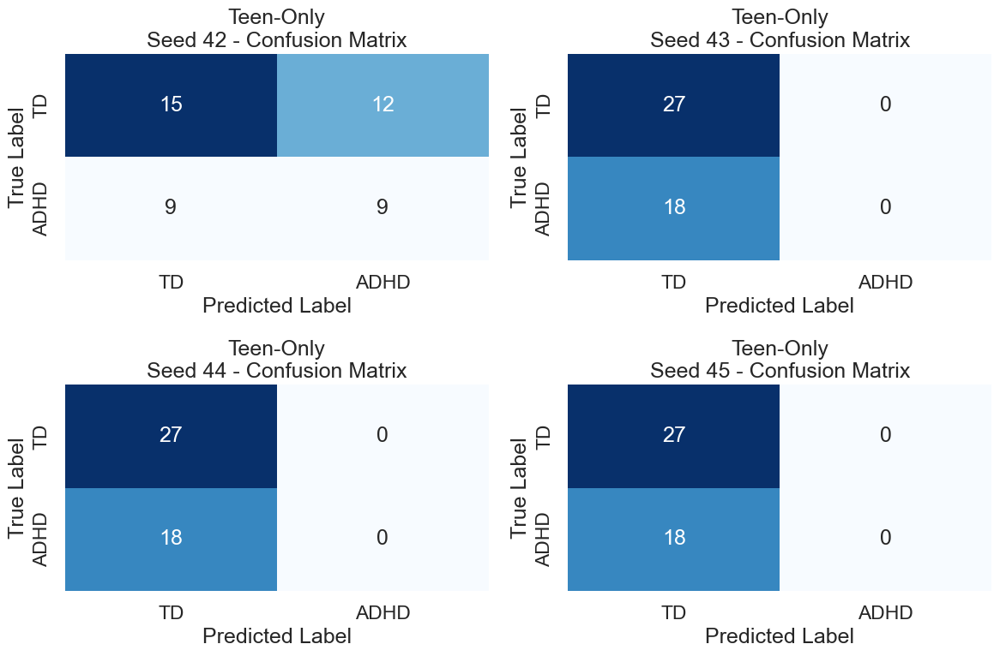

[1_Teen-Only Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/1_Teen-Only Model_aggregated_results.json
[1_Teen-Only Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/1_teen_only_subject_predictions_all_seeds_bin.csv

[1_Teen-Only Model] Test Results on Inference:
    accuracy_mean: 0.5833
    accuracy_std: 0.0333
    balanced_accuracy_mean: 0.5069
    balanced_accuracy_std: 0.0139
    f1_macro_mean: 0.4125
    f1_macro_std: 0.0749
    auc_mean: 0.6137
    auc_std: 0.0599


In [243]:
# ============================================================
# 6.4.1 Тест модели ROISequenceNet для бинарной класификации на датасете Teen Only -> инференс Adult(0.2) inference
# ============================================================
model_name_teen_bin = "1_Teen-Only Model"
best_cfg_teen_bin_path = os.path.join(BEST_DIR_BIN_TEEN_ONLY_6, "best_config.json")

with open(best_cfg_teen_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_bin = json.load(f)

trial_id_teen_bin = best_cfg_teen_bin.get("trial_id")
if not trial_id_teen_bin:
    raise KeyError("best_config.json for 1_Teen-Only model has no 'trial_id'")

# Протестируем лучшую модель Teen по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_teen_only_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_bin,
    best_checkpoint_dir=BEST_DIR_BIN_TEEN_ONLY_6,
    model_name=model_name_teen_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "1_teen_only_subject_predictions_all_seeds_bin"),
)

#### 6.4.1.1 Тест модели ROISequenceNet для бинарной класификации на датасете Teen Only -> инференс Adult(0.2) inference с ковариатой gender

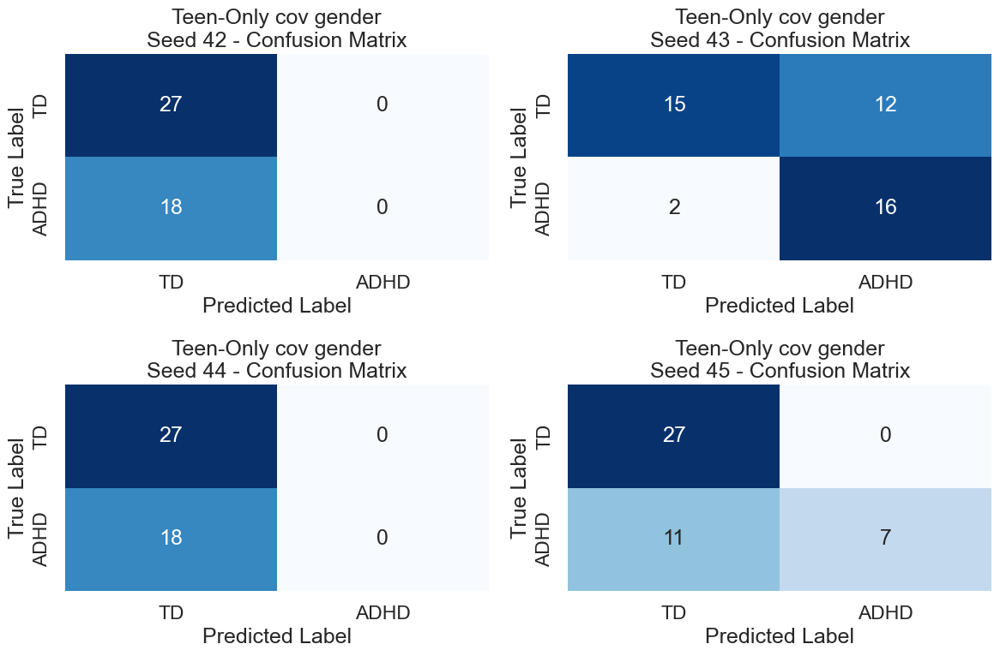

[1_1_Teen-Only cov gender Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/1_1_Teen-Only cov gender Model_aggregated_results.json
[1_1_Teen-Only cov gender Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/1_1_teen_only_cov_gender_subject_predictions_all_seeds_bin.csv

[1_1_Teen-Only cov gender Model] Test Results on Inference:
    accuracy_mean: 0.6611
    accuracy_std: 0.0756
    balanced_accuracy_mean: 0.6042
    balanced_accuracy_std: 0.1208
    f1_macro_mean: 0.5335
    f1_macro_std: 0.1831
    auc_mean: 0.8107
    auc_std: 0.0324


In [244]:
# ============================================================
# 6.4.1.1 Тест модели ROISequenceNet для бинарной класификации на датасете Teen Only -> инференс Adult(0.2) inference с ковариатой gender
# ============================================================
model_name_teen_cov_gender_bin = "1_1_Teen-Only cov gender Model"
best_cfg_teen_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_TEEN_ONLY_COV_GENDER_6, "best_config.json")

with open(best_cfg_teen_cov_gender_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_cov_gender_bin = json.load(f)

trial_id_teen_cov_gender_bin = best_cfg_teen_cov_gender_bin.get("trial_id")
if not trial_id_teen_cov_gender_bin:
    raise KeyError("best_config.json for 1_1_Teen-Only cov gender model has no 'trial_id'")

# Протестируем лучшую модель Teen по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_teen_cov_gender_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_cov_gender_bin,
    best_checkpoint_dir=BEST_DIR_BIN_TEEN_ONLY_COV_GENDER_6,
    model_name=model_name_teen_cov_gender_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "1_1_teen_only_cov_gender_subject_predictions_all_seeds_bin"),
)

#### 6.4.2 Тест модели ROISequenceNet для бинарной класификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference

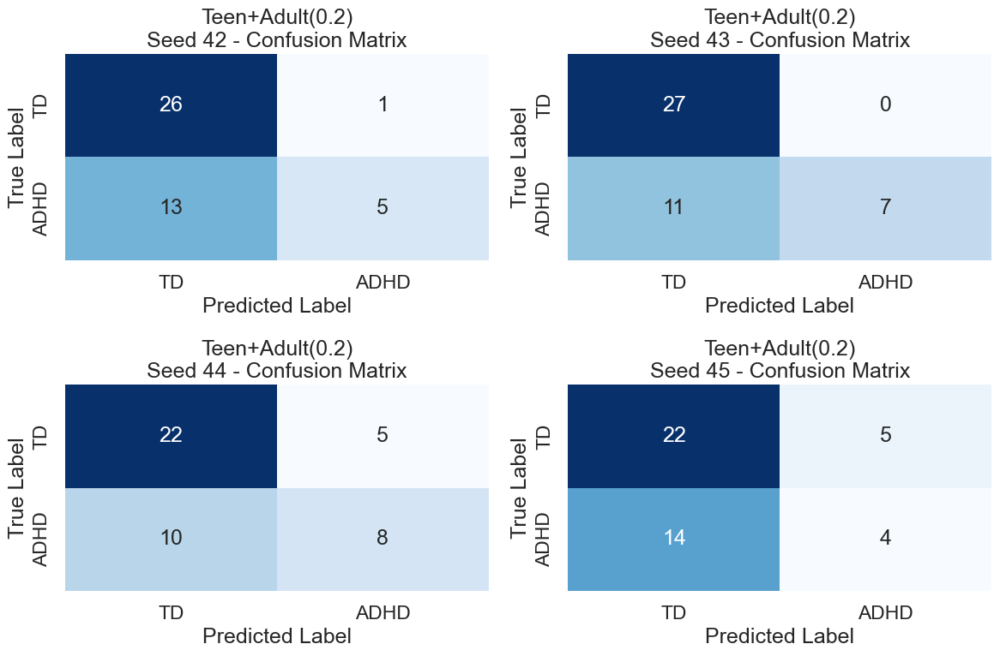

[2_Teen+Adult(0.2) Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/2_Teen+Adult(0.2) Model_aggregated_results.json
[2_Teen+Adult(0.2) Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/2_teen_adult_0_2_subject_predictions_all_seeds_bin.csv

[2_Teen+Adult(0.2) Model] Test Results on Inference:
    accuracy_mean: 0.6722
    accuracy_std: 0.0734
    balanced_accuracy_mean: 0.6157
    balanced_accuracy_std: 0.0727
    f1_macro_mean: 0.6065
    f1_macro_std: 0.0825
    auc_mean: 0.7454
    auc_std: 0.0855


In [245]:
# ============================================================
# 6.4.2 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference
# ============================================================
model_name_teen_adult_0_2_bin = "2_Teen+Adult(0.2) Model"
best_cfg_teen_adult_0_2_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6, "best_config.json")

with open(best_cfg_teen_adult_0_2_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_2_bin = json.load(f)

trial_id_teen_adult_0_2_bin = best_cfg_teen_adult_0_2_bin.get("trial_id")
if not trial_id_teen_adult_0_2_bin:
    raise KeyError("best_config.json for 2_Teen+Adult(0.2) model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.2) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_2_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_2_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6,
    model_name=model_name_teen_adult_0_2_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_BIN,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "2_teen_adult_0_2_subject_predictions_all_seeds_bin"),
)

#### 6.4.2.1 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference с ковариатой gender

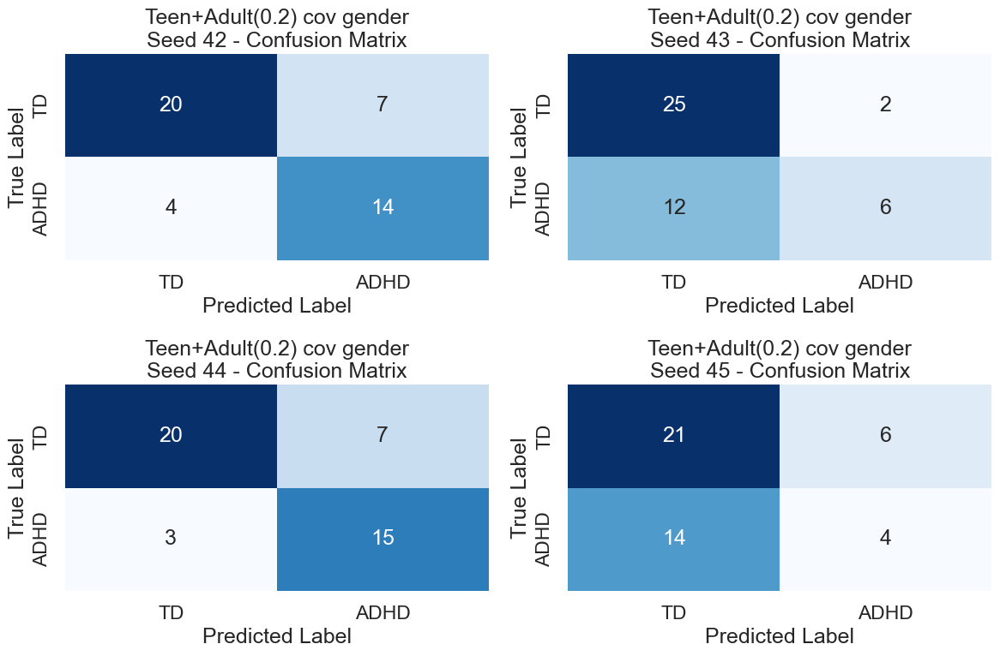

[2_1_Teen+Adult(0.2) cov gender Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/2_1_Teen+Adult(0.2) cov gender Model_aggregated_results.json
[2_1_Teen+Adult(0.2) cov gender Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/2_1_teen_adult_0_2_cov_gender_subject_predictions_all_seeds_bin.csv

[2_1_Teen+Adult(0.2) cov gender Model] Test Results on Inference:
    accuracy_mean: 0.6944
    accuracy_std: 0.1000
    balanced_accuracy_mean: 0.6690
    balanced_accuracy_std: 0.1319
    f1_macro_mean: 0.6573
    f1_macro_std: 0.1352
    auc_mean: 0.6780
    auc_std: 0.2574


In [246]:
# ============================================================
# 6.4.2.1 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference с ковариатой gender
# ============================================================
model_name_teen_adult_0_2_cov_gender_bin = "2_1_Teen+Adult(0.2) cov gender Model"
best_cfg_teen_adult_0_2_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_6, "best_config.json")

best_cfg_teen_adult_0_2_cov_gender_bin = None
with open(best_cfg_teen_adult_0_2_cov_gender_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_2_cov_gender_bin = json.load(f)

trial_id_teen_adult_0_2_cov_gender_bin = best_cfg_teen_adult_0_2_cov_gender_bin.get("trial_id")
if not trial_id_teen_adult_0_2_cov_gender_bin:
    raise KeyError("best_config.json for 2_1_Teen+Adult(0.2) cov gender model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.2) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_2_cov_gender_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_2_cov_gender_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_6,
    model_name=model_name_teen_adult_0_2_cov_gender_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "2_1_teen_adult_0_2_cov_gender_subject_predictions_all_seeds_bin"),
)

#### 6.4.2.2 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference с ковариатами gender и site_original

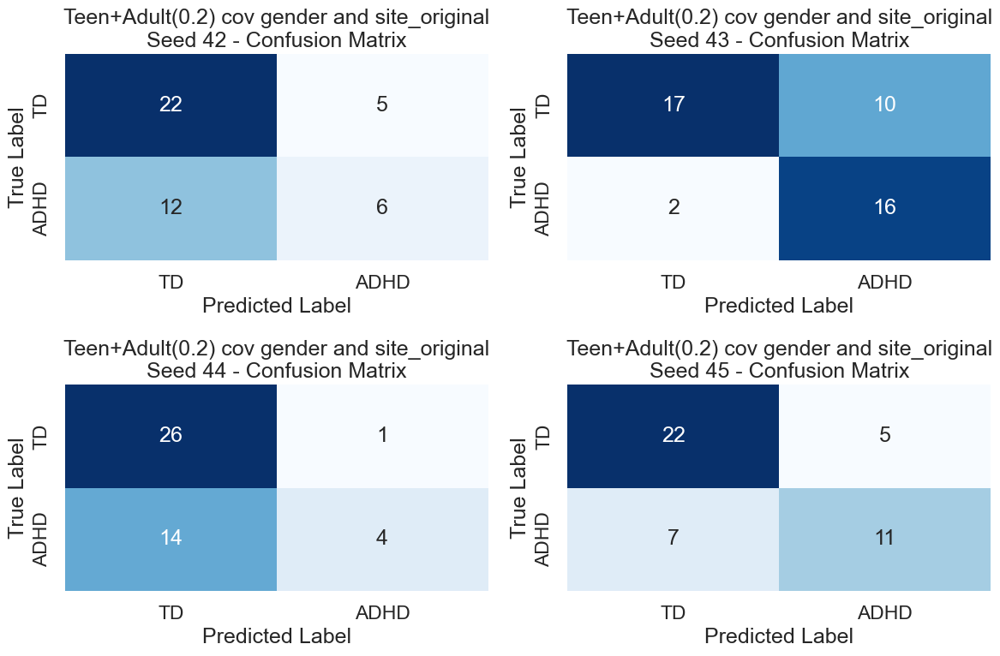

[2_2_Teen+Adult(0.2) cov gender and site_original Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/2_2_Teen+Adult(0.2) cov gender and site_original Model_aggregated_results.json
[2_2_Teen+Adult(0.2) cov gender and site_original Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/2_2_teen_adult_0_2_cov_gender_site_original_subject_predictions_all_seeds_bin.csv

[2_2_Teen+Adult(0.2) cov gender and site_original Model] Test Results on Inference:
    accuracy_mean: 0.6889
    accuracy_std: 0.0544
    balanced_accuracy_mean: 0.6597
    balanced_accuracy_std: 0.0905
    f1_macro_mean: 0.6448
    f1_macro_std: 0.0927
    auc_mean: 0.7860
    auc_std: 0.0764


In [247]:
# ============================================================
# 6.4.2.2 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference с ковариатами gender и site_original
# ============================================================
model_name_teen_adult_0_2_cov_gender_site_original_bin = "2_2_Teen+Adult(0.2) cov gender and site_original Model"
best_cfg_teen_adult_0_2_cov_gender_site_original_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_SITE_ORIGINAL_6, "best_config.json")

best_cfg_teen_adult_0_2_cov_gender_site_original_bin = None
with open(best_cfg_teen_adult_0_2_cov_gender_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_2_cov_gender_site_original_bin = json.load(f)

trial_id_teen_adult_0_2_cov_gender_site_original_bin = best_cfg_teen_adult_0_2_cov_gender_bin.get("trial_id")
if not trial_id_teen_adult_0_2_cov_gender_site_original_bin:
    raise KeyError("best_config.json for 2_2_Teen+Adult(0.2) cov gender and site_original model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.2) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_2_cov_gender_site_original_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_2_cov_gender_site_original_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_SITE_ORIGINAL_6,
    model_name=model_name_teen_adult_0_2_cov_gender_site_original_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_site_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_site_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "2_2_teen_adult_0_2_cov_gender_site_original_subject_predictions_all_seeds_bin"),
)

#### 6.4.2.3 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference с ковариатой gender с исключением класса 2 - ADHD-Hyperactive/Impulsive

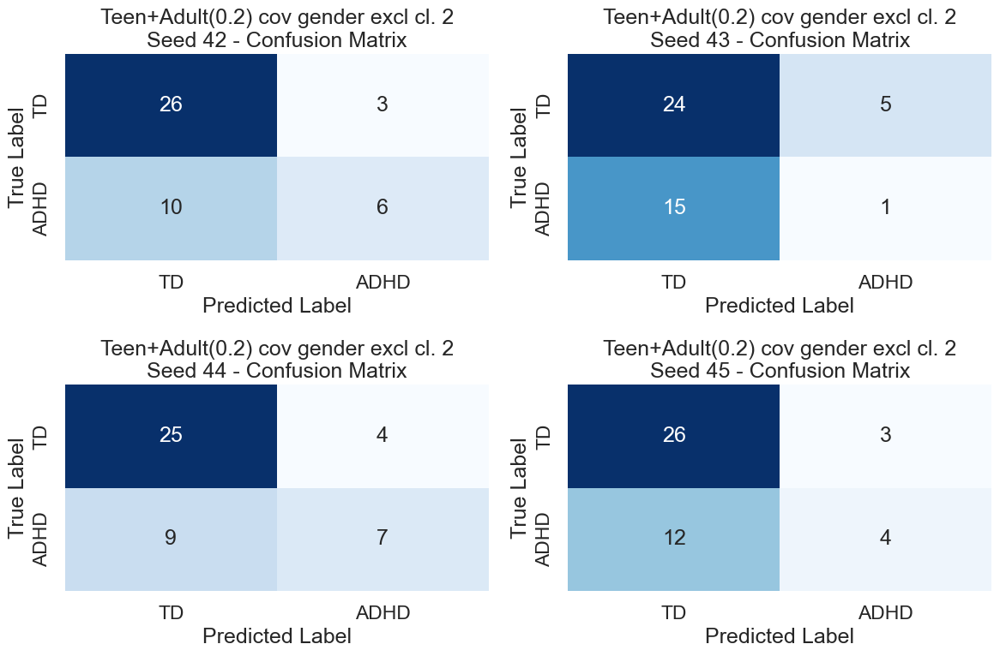

[2_3_Teen+Adult(0.2) cov gender excl cl. 2 Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/2_3_Teen+Adult(0.2) cov gender excl cl. 2 Model_aggregated_results.json
[2_3_Teen+Adult(0.2) cov gender excl cl. 2 Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/2_3_teen_adult_0_2_cov_gender_excl_class_2_subject_predictions_all_seeds_bin.csv

[2_3_Teen+Adult(0.2) cov gender excl cl. 2 Model] Test Results on Inference:
    accuracy_mean: 0.6611
    accuracy_std: 0.0734
    balanced_accuracy_mean: 0.5760
    balanced_accuracy_std: 0.0934
    f1_macro_mean: 0.5641
    f1_macro_std: 0.1179
    auc_mean: 0.7683
    auc_std: 0.0657


In [248]:
# ============================================================
# 6.4.2.3 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult(0.2) inference с ковариатой gender
# с исключением класса 2 - ADHD-Hyperactive/Impulsive (класс исключён, чтобы проверить, влияет ли его наличие в обучающем наборе
# на качество инференса на отложенном наборе Adult(0.2) inference, который также не имеет этого класса)
# ============================================================
model_name_teen_adult_0_2_cov_gender_excl_class_2_bin = "2_3_Teen+Adult(0.2) cov gender excl cl. 2 Model"
best_cfg_teen_adult_0_2_cov_gender_excl_class_2_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_EXCL_CLASS_2_6, "best_config.json")

best_cfg_teen_adult_0_2_cov_gender_excl_class_2_bin = None
with open(best_cfg_teen_adult_0_2_cov_gender_excl_class_2_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_2_cov_gender_excl_class_2_bin = json.load(f)

trial_id_teen_adult_0_2_cov_gender_excl_class_2_bin = best_cfg_teen_adult_0_2_cov_gender_excl_class_2_bin.get("trial_id")
if not trial_id_teen_adult_0_2_cov_gender_excl_class_2_bin:
    raise KeyError("best_config.json for 2_3_Teen+Adult(0.2) cov gender excl class 2 model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.2) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_2_cov_gender_excl_class_2_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_2_cov_gender_excl_class_2_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_EXCL_CLASS_2_6,
    model_name=model_name_teen_adult_0_2_cov_gender_excl_class_2_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_excl_class_2_sampler_bin.inference_loader, # class 2 исключён из инференсного датасета
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_excl_class_2_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "2_3_teen_adult_0_2_cov_gender_excl_class_2_subject_predictions_all_seeds_bin"),
)

#### 6.4.3 Тест модели ROISequenceNet для бинарной класификации на датасете Teen+Adult(0.2) -> инференс Adult rest (0.8) inference

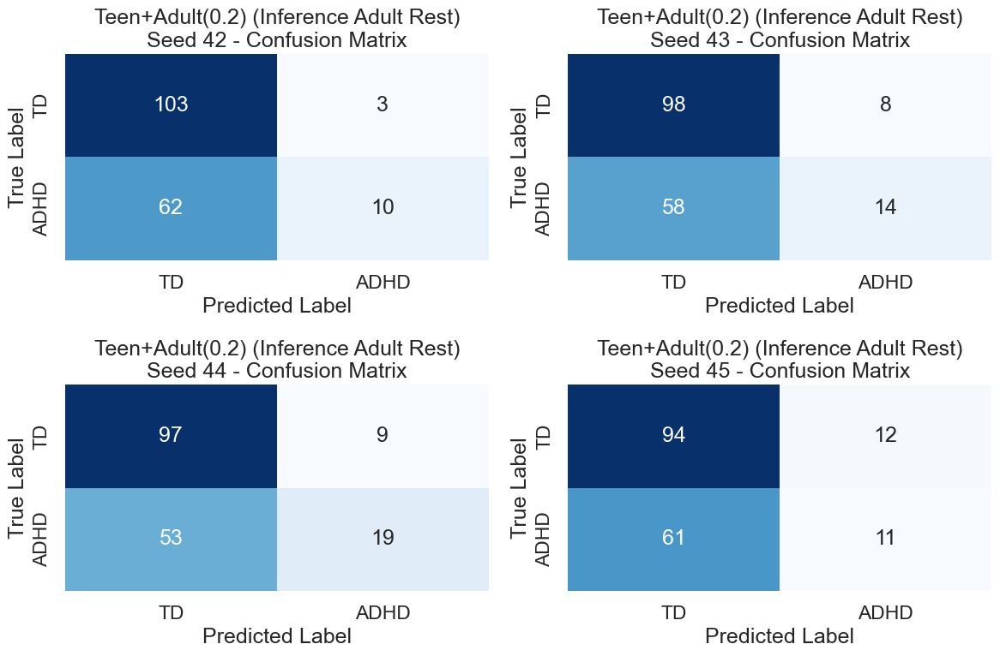

[3_Teen+Adult(0.2) Model (Inference Adult Rest)] Aggregated results saved to: Experiments/6_th_experiment/test_results/3_Teen+Adult(0.2) Model (Inference Adult Rest)_aggregated_results.json
[3_Teen+Adult(0.2) Model (Inference Adult Rest)] Per-subject results saved to: Experiments/6_th_experiment/test_results/3_teen_adult_0_2_inf_adult_rest_subject_predictions_all_seeds_bin.csv

[3_Teen+Adult(0.2) Model (Inference Adult Rest)] Test Results on Inference:
    accuracy_mean: 0.6264
    accuracy_std: 0.0262
    balanced_accuracy_mean: 0.5560
    balanced_accuracy_std: 0.0286
    f1_macro_mean: 0.5164
    f1_macro_std: 0.0399
    auc_mean: 0.6322
    auc_std: 0.0353


In [249]:
# ============================================================
# 6.4.3 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult rest (0.8) inference
# ============================================================
model_name_teen_adult_0_2_inf_adult_rest_bin = "3_Teen+Adult(0.2) Model (Inference Adult Rest)"
best_cfg_teen_adult_0_2_inf_adult_rest_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6, "best_config.json")

with open(best_cfg_teen_adult_0_2_inf_adult_rest_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_2_inf_adult_rest_bin = json.load(f)

trial_id_teen_adult_0_2_inf_adult_rest_bin = best_cfg_teen_adult_0_2_inf_adult_rest_bin.get("trial_id")
if not trial_id_teen_adult_0_2_inf_adult_rest_bin:
    raise KeyError("best_config.json for 3_Teen+Adult(0.2) model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.2) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult rest (0.8) inference
result_mixed_teen_adult_0_2_inf_adult_rest_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_2_inf_adult_rest_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_6,
    model_name=model_name_teen_adult_0_2_inf_adult_rest_bin,
    test_loader=experiment_6_data_loader_for_search_adult_rest_inference_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_BIN,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "3_teen_adult_0_2_inf_adult_rest_subject_predictions_all_seeds_bin"),
)

#### 6.4.3.1 Тест модели ROISequenceNet для бинарной класификации на датасете Teen+Adult(0.2) -> инференс Adult rest (0.8) inference

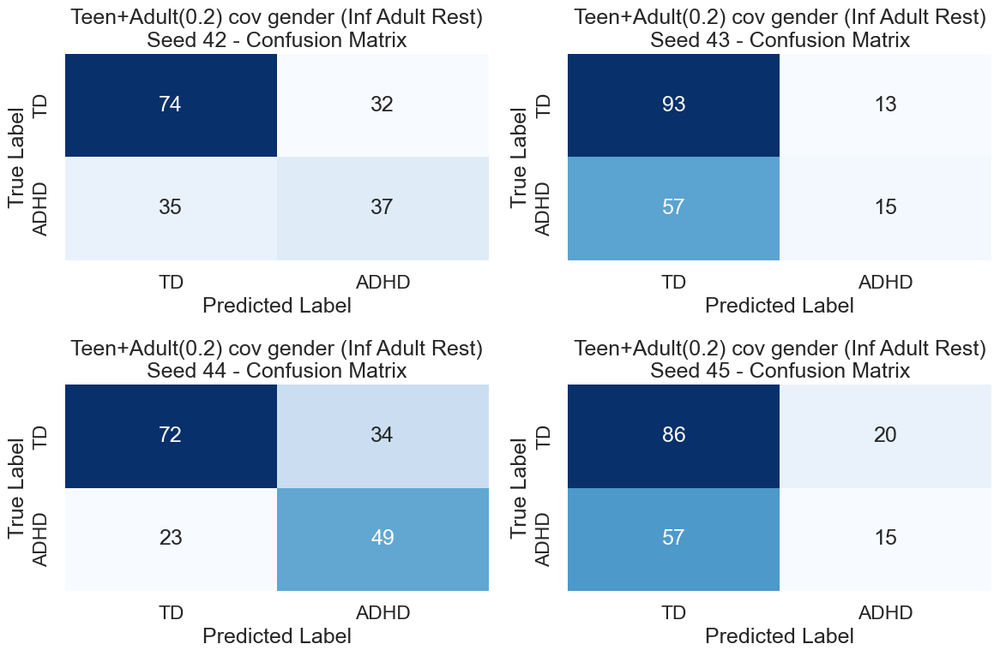

[3_1_Teen+Adult(0.2) cov gender Model (Inf Adult Rest)] Aggregated results saved to: Experiments/6_th_experiment/test_results/3_1_Teen+Adult(0.2) cov gender Model (Inf Adult Rest)_aggregated_results.json
[3_1_Teen+Adult(0.2) cov gender Model (Inf Adult Rest)] Per-subject results saved to: Experiments/6_th_experiment/test_results/3_1_teen_adult_0_2_cov_gender_inf_adult_rest_subject_predictions_all_seeds_bin.csv

[3_1_Teen+Adult(0.2) cov gender Model (Inf Adult Rest)] Test Results on Inference:
    accuracy_mean: 0.6194
    accuracy_std: 0.0466
    balanced_accuracy_mean: 0.5846
    balanced_accuracy_std: 0.0750
    f1_macro_mean: 0.5699
    f1_macro_std: 0.0867
    auc_mean: 0.6031
    auc_std: 0.1630


In [250]:
# ============================================================
# 6.4.3.1 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult rest (0.8) inference с ковариатой 'gender' 
# ============================================================
model_name_teen_adult_0_2_cov_gender_inf_adult_rest_bin = "3_1_Teen+Adult(0.2) cov gender Model (Inf Adult Rest)"
best_cfg_teen_adult_0_2_cov_gender_inf_adult_rest_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_6, "best_config.json")

best_cfg_teen_adult_0_2_cov_gender_inf_adult_rest_bin = None
with open(best_cfg_teen_adult_0_2_cov_gender_inf_adult_rest_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_2_cov_gender_inf_adult_rest_bin = json.load(f)

trial_id_teen_adult_0_2_cov_gender_inf_adult_rest_bin = best_cfg_teen_adult_0_2_cov_gender_inf_adult_rest_bin.get("trial_id")
if not trial_id_teen_adult_0_2_cov_gender_inf_adult_rest_bin:
    raise KeyError("best_config.json for 3_1_Teen+Adult(0.2) cov gender model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.2) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult rest (0.8) inference
result_mixed_teen_adult_0_2_cov_gender_inf_adult_rest_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_2_cov_gender_inf_adult_rest_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_6,
    model_name=model_name_teen_adult_0_2_cov_gender_inf_adult_rest_bin,
    test_loader=experiment_6_data_loader_for_search_adult_rest_inference_cov_gender_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_rest_inference_cov_gender_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "3_1_teen_adult_0_2_cov_gender_inf_adult_rest_subject_predictions_all_seeds_bin"),
)

#### 6.4.3.2 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult rest (0.8) inference с ковариатой 'gender' с исключённым классом 2 - ADHD-Hyperactive/Impulsive

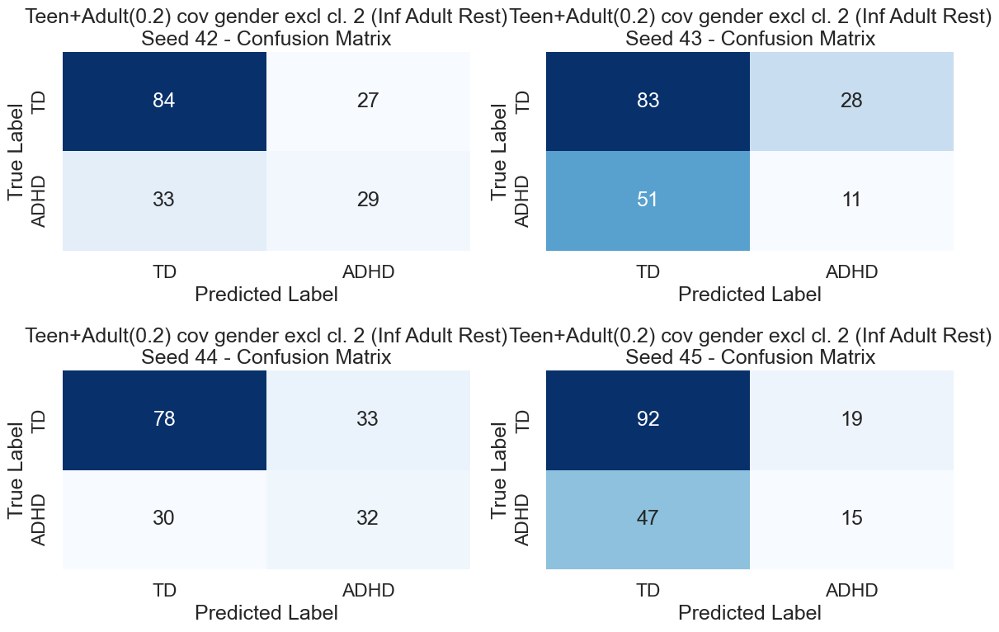

[3_2_Teen+Adult(0.2) cov gender excl cl. 2 Model (Inf Adult Rest)] Aggregated results saved to: Experiments/6_th_experiment/test_results/3_2_Teen+Adult(0.2) cov gender excl cl. 2 Model (Inf Adult Rest)_aggregated_results.json
[3_2_Teen+Adult(0.2) cov gender excl cl. 2 Model (Inf Adult Rest)] Per-subject results saved to: Experiments/6_th_experiment/test_results/3_2_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_subject_predictions_all_seeds_bin.csv

[3_2_Teen+Adult(0.2) cov gender excl cl. 2 Model (Inf Adult Rest)] Test Results on Inference:
    accuracy_mean: 0.6127
    accuracy_std: 0.0484
    balanced_accuracy_mean: 0.5549
    balanced_accuracy_std: 0.0711
    f1_macro_mean: 0.5486
    f1_macro_std: 0.0788
    auc_mean: 0.6453
    auc_std: 0.0557


In [251]:
# ============================================================
# 6.4.3.2 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.2) -> инференс Adult rest (0.8) inference с ковариатой 'gender'
# с исключённым классом 2 - ADHD-Hyperactive/Impulsive (класс исключён, чтобы проверить, влияет ли его наличие в обучающем наборе
# на качество инференса на отложенном наборе Adult rest (0.8) inference, который также не имеет этого класса)
# ============================================================
model_name_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin = "3_2_Teen+Adult(0.2) cov gender excl cl. 2 Model (Inf Adult Rest)"
best_cfg_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_EXCL_CLASS_2_6, "best_config.json")

best_cfg_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin = None
with open(best_cfg_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin = json.load(f)

trial_id_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin = best_cfg_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin.get("trial_id")
if not trial_id_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin:
    raise KeyError("best_config.json for 3_2_Teen+Adult(0.2) cov gender excl class 2 model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.2) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult rest (0.8) inference
result_mixed_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_2_COV_GENDER_EXCL_CLASS_2_6,
    model_name=model_name_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_bin,
    test_loader=experiment_6_data_loader_for_search_adult_rest_inference_cov_gender_excl_class_2_sampler_bin.inference_loader, # class 2 исключён из инференсного датасета
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_rest_inference_cov_gender_excl_class_2_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "3_2_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_subject_predictions_all_seeds_bin"),
)

#### 6.4.4 Тест модели ROISequenceNet для бинарной класификации на датасете Children + Teen + Adult (0.8) -> инференс Adult(0.2) inference

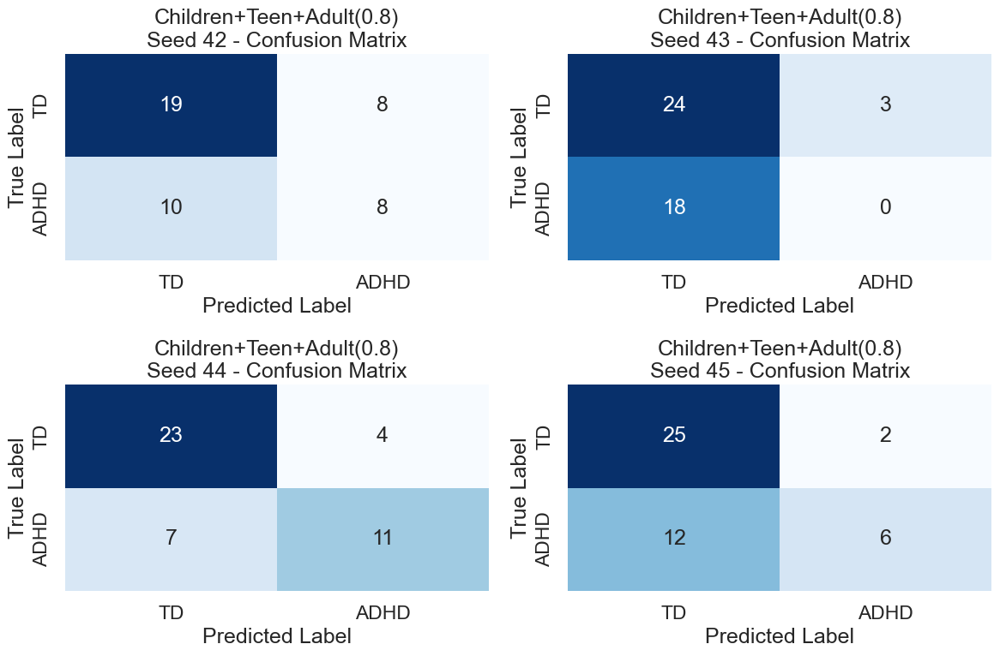

[4_Children+Teen+Adult(0.8) Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/4_Children+Teen+Adult(0.8) Model_aggregated_results.json
[4_Children+Teen+Adult(0.8) Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/4_Children_teen_adult_0_8_subject_predictions_all_seeds_bin.csv

[4_Children+Teen+Adult(0.8) Model] Test Results on Inference:
    accuracy_mean: 0.6444
    accuracy_std: 0.0977
    balanced_accuracy_mean: 0.5949
    balanced_accuracy_std: 0.1196
    f1_macro_mean: 0.5702
    f1_macro_std: 0.1632
    auc_mean: 0.7006
    auc_std: 0.1879


In [252]:
# ============================================================
# 6.4.4 Тест модели ROISequenceNet для бинарной классификации на датасете Children + Teen + Adult (0.8) -> инференс Adult(0.2) inference
# ============================================================
model_name_children_teen_adult_0_8_bin = "4_Children+Teen+Adult(0.8) Model"
best_cfg_children_teen_adult_0_8_bin_path = os.path.join(BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6, "best_config.json")

with open(best_cfg_children_teen_adult_0_8_bin_path, "r", encoding="utf-8") as f:
    best_cfg_children_teen_adult_0_8_bin = json.load(f)

trial_id_children_teen_adult_0_8_bin = best_cfg_children_teen_adult_0_8_bin.get("trial_id")
if not trial_id_children_teen_adult_0_8_bin:
    raise KeyError("best_config.json for 4_Children+Teen+Adult(0.8) model has no 'trial_id'")

# Протестируем лучшую модель Children+Teen+Adult(0.8) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_children_teen_adult_0_8_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_children_teen_adult_0_8_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_6,
    model_name=model_name_children_teen_adult_0_8_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_BIN,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "4_Children_teen_adult_0_8_subject_predictions_all_seeds_bin"),
)

#### 6.4.4.1 Тест модели ROISequenceNet для бинарной классификации на датасете Children + Teen + Adult (0.8) -> инференс Adult(0.2) inference с ковариатой gender

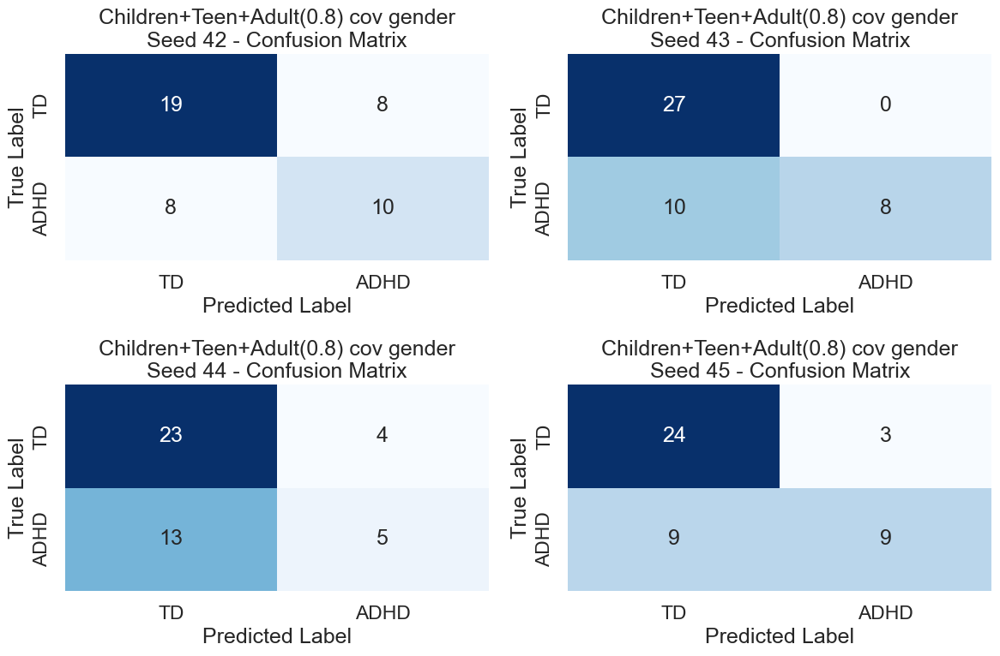

[4_1_Children+Teen+Adult(0.8) cov gender Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/4_1_Children+Teen+Adult(0.8) cov gender Model_aggregated_results.json
[4_1_Children+Teen+Adult(0.8) cov gender Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/4_1_Children_teen_adult_0_8_cov_gender_subject_predictions_all_seeds_bin.csv

[4_1_Children+Teen+Adult(0.8) cov gender Model] Test Results on Inference:
    accuracy_mean: 0.6944
    accuracy_std: 0.0734
    balanced_accuracy_mean: 0.6528
    balanced_accuracy_std: 0.0703
    f1_macro_mean: 0.6524
    f1_macro_std: 0.0799
    auc_mean: 0.7778
    auc_std: 0.1296


In [253]:
# ============================================================
# 6.4.4.1 Тест модели ROISequenceNet для бинарной классификации на датасете Children + Teen + Adult (0.8) -> инференс Adult(0.2) inference с ковариатой gender
# ============================================================
model_name_children_teen_adult_0_8_cov_gender_bin = "4_1_Children+Teen+Adult(0.8) cov gender Model"
best_cfg_children_teen_adult_0_8_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_COV_GENDER_6, "best_config.json")

with open(best_cfg_children_teen_adult_0_8_cov_gender_bin_path, "r", encoding="utf-8") as f:
    best_cfg_children_teen_adult_0_8_cov_gender_bin = json.load(f)

trial_id_children_teen_adult_0_8_cov_gender_bin = best_cfg_children_teen_adult_0_8_cov_gender_bin.get("trial_id")
if not trial_id_children_teen_adult_0_8_cov_gender_bin:
    raise KeyError("best_config.json for 4_1_Children+Teen+Adult(0.8) cov gender model has no 'trial_id'")

# Протестируем лучшую модель Children+Teen+Adult(0.8) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference с ковариатой gender
result_children_teen_adult_0_8_cov_gender_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_children_teen_adult_0_8_cov_gender_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_CHILDREN_TEEN_ADULT_0_8_COV_GENDER_6,
    model_name=model_name_children_teen_adult_0_8_cov_gender_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "4_1_Children_teen_adult_0_8_cov_gender_subject_predictions_all_seeds_bin"),
)

#### 6.4.5 Тест модели ROISequenceNet для бинарной класификации на датасете Teen+Adult(0.8) -> инференс Adult(0.2) inference

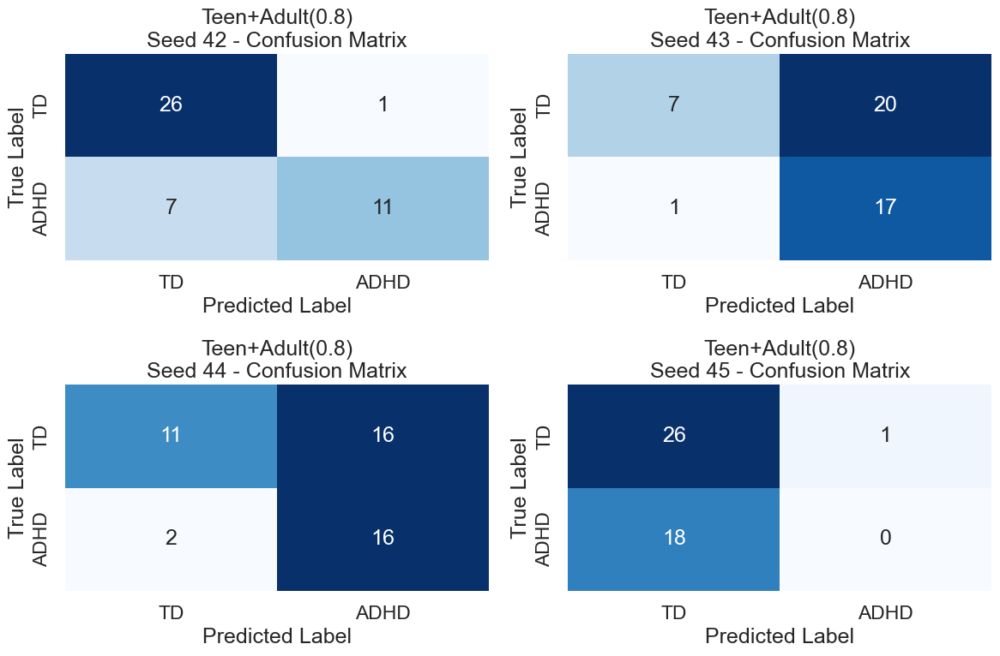

[5_Teen+Adult(0.8) Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/5_Teen+Adult(0.8) Model_aggregated_results.json
[5_Teen+Adult(0.8) Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/5_teen_adult_0_8_subject_predictions_all_seeds_bin.csv

[5_Teen+Adult(0.8) Model] Test Results on Inference:
    accuracy_mean: 0.6333
    accuracy_std: 0.1289
    balanced_accuracy_mean: 0.6296
    balanced_accuracy_std: 0.1263
    f1_macro_mean: 0.5676
    f1_macro_std: 0.1814
    auc_mean: 0.7603
    auc_std: 0.0283


In [254]:
# ============================================================
# 6.4.5 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.8) -> инференс Adult(0.2) inference
# ============================================================
model_name_teen_adult_0_8_bin = "5_Teen+Adult(0.8) Model"
best_cfg_teen_adult_0_8_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6, "best_config.json")

with open(best_cfg_teen_adult_0_8_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_8_bin = json.load(f)

trial_id_teen_adult_0_8_bin = best_cfg_teen_adult_0_8_bin.get("trial_id")
if not trial_id_teen_adult_0_8_bin:
    raise KeyError("best_config.json for 5_Teen+Adult(0.8) model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.8) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_8_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_8_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_6,
    model_name=model_name_teen_adult_0_8_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=COV_DIM_BIN,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "5_teen_adult_0_8_subject_predictions_all_seeds_bin"),
)

#### 6.4.5.1 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.8) -> инференс Adult(0.2) inference с ковариатой по полу (gender)

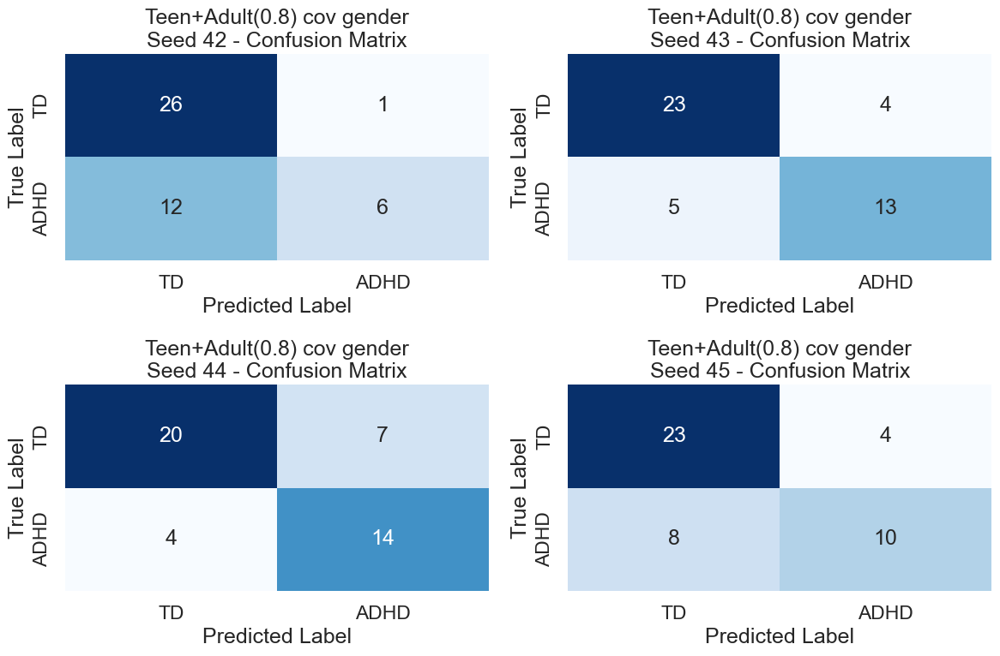

[5_1_Teen+Adult(0.8) cov gender Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/5_1_Teen+Adult(0.8) cov gender Model_aggregated_results.json
[5_1_Teen+Adult(0.8) cov gender Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/5_1_teen_adult_0_8_cov_gender_subject_predictions_all_seeds_bin.csv

[5_1_Teen+Adult(0.8) cov gender Model] Test Results on Inference:
    accuracy_mean: 0.7500
    accuracy_std: 0.0380
    balanced_accuracy_mean: 0.7245
    balanced_accuracy_std: 0.0616
    f1_macro_mean: 0.7224
    f1_macro_std: 0.0641
    auc_mean: 0.8657
    auc_std: 0.0355


In [255]:
# ============================================================
# 6.4.5.1 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.8) -> инференс Adult(0.2) inference с ковариатой по полу (gender)
# ============================================================
model_name_teen_adult_0_8_cov_gender_bin = "5_1_Teen+Adult(0.8) cov gender Model"
best_cfg_teen_adult_0_8_cov_gender_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_6, "best_config.json")

with open(best_cfg_teen_adult_0_8_cov_gender_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_8_cov_gender_bin = json.load(f)

trial_id_teen_adult_0_8_cov_gender_bin = best_cfg_teen_adult_0_8_cov_gender_bin.get("trial_id")
if not trial_id_teen_adult_0_8_cov_gender_bin:
    raise KeyError("best_config.json for 5_1_Teen+Adult(0.8) cov gender model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.8) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_8_cov_gender_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_8_cov_gender_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_6,
    model_name=model_name_teen_adult_0_8_cov_gender_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "5_1_teen_adult_0_8_cov_gender_subject_predictions_all_seeds_bin"),
)

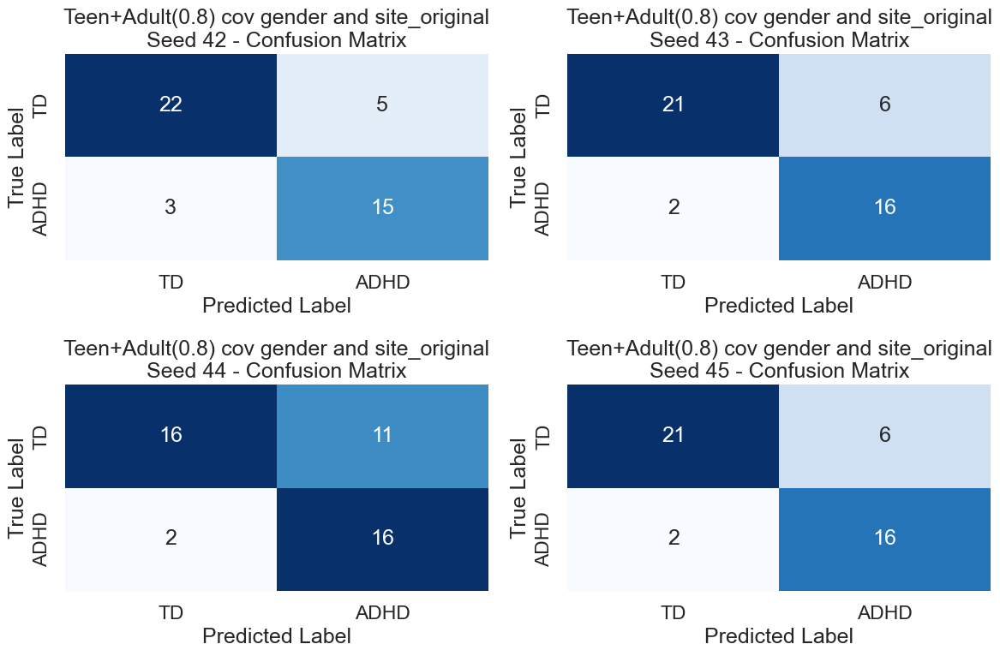

[5_2_Teen+Adult(0.8) cov gender and site_original Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/5_2_Teen+Adult(0.8) cov gender and site_original Model_aggregated_results.json
[5_2_Teen+Adult(0.8) cov gender and site_original Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/5_2_teen_adult_0_8_cov_gender_site_original_subject_predictions_all_seeds_bin.csv

[5_2_Teen+Adult(0.8) cov gender and site_original Model] Test Results on Inference:
    accuracy_mean: 0.7944
    accuracy_std: 0.0556
    balanced_accuracy_mean: 0.8079
    balanced_accuracy_std: 0.0450
    f1_macro_mean: 0.7922
    f1_macro_std: 0.0541
    auc_mean: 0.8354
    auc_std: 0.1016


In [256]:
# ============================================================
# 6.4.5.2 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.8) -> инференс Adult(0.2) inference с ковариатами по полу (gender) и сайту (site_original)
# ============================================================
model_name_teen_adult_0_8_cov_gender_site_original_bin = "5_2_Teen+Adult(0.8) cov gender and site_original Model"
best_cfg_teen_adult_0_8_cov_gender_site_original_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_SITE_ORIGINAL_6, "best_config.json")

with open(best_cfg_teen_adult_0_8_cov_gender_site_original_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_8_cov_gender_site_original_bin = json.load(f)

trial_id_teen_adult_0_8_cov_gender_site_original_bin = best_cfg_teen_adult_0_8_cov_gender_site_original_bin.get("trial_id")
if not trial_id_teen_adult_0_8_cov_gender_bin:
    raise KeyError("best_config.json for 5_2_Teen+Adult(0.8) cov gender and site_original model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.8) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_8_cov_gender_site_original_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_8_cov_gender_site_original_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_SITE_ORIGINAL_6,
    model_name=model_name_teen_adult_0_8_cov_gender_site_original_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_site_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_site_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "5_2_teen_adult_0_8_cov_gender_site_original_subject_predictions_all_seeds_bin")
)

#### 6.4.5.3 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.8) -> инференс Adult(0.2) inference с ковариатой по полу (gender) с исключённым классом 2 - ADHD-Hyperactive/Impulsive

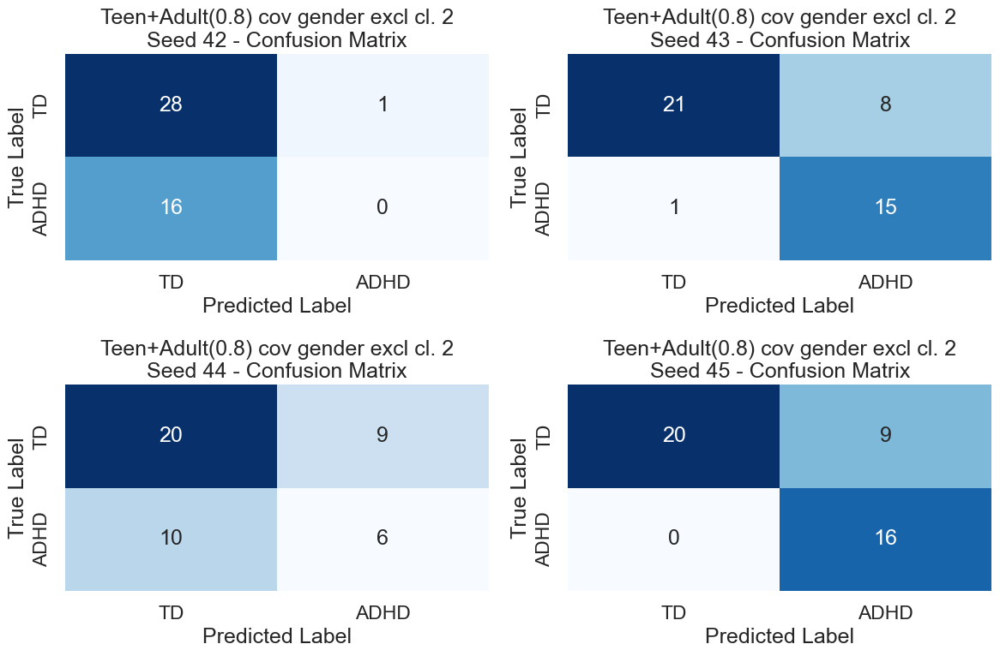

[5_3_Teen+Adult(0.8) cov gender excl cl. 2 Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/5_3_Teen+Adult(0.8) cov gender excl cl. 2 Model_aggregated_results.json
[5_3_Teen+Adult(0.8) cov gender excl cl. 2 Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/5_3_teen_adult_0_8_cov_gender_excl_class_2_subject_predictions_all_seeds_bin.csv

[5_3_Teen+Adult(0.8) cov gender excl cl. 2 Model] Test Results on Inference:
    accuracy_mean: 0.7000
    accuracy_std: 0.1169
    balanced_accuracy_mean: 0.6727
    balanced_accuracy_std: 0.1918
    f1_macro_mean: 0.6277
    f1_macro_std: 0.2051
    auc_mean: 0.8082
    auc_std: 0.0701


In [257]:
# ============================================================
# 6.4.5.3 Тест модели ROISequenceNet для бинарной классификации на датасете Teen+Adult(0.8) -> инференс Adult(0.2) inference с ковариатой по полу (gender)
# с исключённым классом 2 - ADHD-Hyperactive/Impulsive (класс исключён, чтобы проверить, влияет ли его наличие в обучающем наборе
# на качество инференса на отложенном наборе Adult(0.2), который также не имеет этого класса)
# ============================================================
model_name_teen_adult_0_8_cov_gender_excl_class_2_bin = "5_3_Teen+Adult(0.8) cov gender excl cl. 2 Model"
best_cfg_teen_adult_0_8_cov_gender_excl_class_2_bin_path = os.path.join(BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_EXCL_CLASS_2_6, "best_config.json")

with open(best_cfg_teen_adult_0_8_cov_gender_excl_class_2_bin_path, "r", encoding="utf-8") as f:
    best_cfg_teen_adult_0_8_cov_gender_excl_class_2_bin = json.load(f)

trial_id_teen_adult_0_8_cov_gender_excl_class_2_bin = best_cfg_teen_adult_0_8_cov_gender_excl_class_2_bin.get("trial_id")
if not trial_id_teen_adult_0_8_cov_gender_excl_class_2_bin:
    raise KeyError("best_config.json for 5_3_Teen+Adult(0.8) cov gender excl class 2 model has no 'trial_id'")

# Протестируем лучшую модель Teen+Adult(0.8) по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_teen_adult_0_8_cov_gender_excl_class_2_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_teen_adult_0_8_cov_gender_excl_class_2_bin,
    best_checkpoint_dir=BEST_DIR_BIN_MIXED_TEEN_ADULT_0_8_COV_GENDER_EXCL_CLASS_2_6,
    model_name=model_name_teen_adult_0_8_cov_gender_excl_class_2_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_excl_class_2_sampler_bin.inference_loader, # class 2 исключён из инференсного датасета
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_cov_gender_excl_class_2_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "5_3_teen_adult_0_8_cov_gender_excl_class_2_subject_predictions_all_seeds_bin"),
)

#### 6.4.6 Тест модели ROISequenceNet для бинарной классификации на датасете Adult Rest -> инференс Adult(0.2) inference

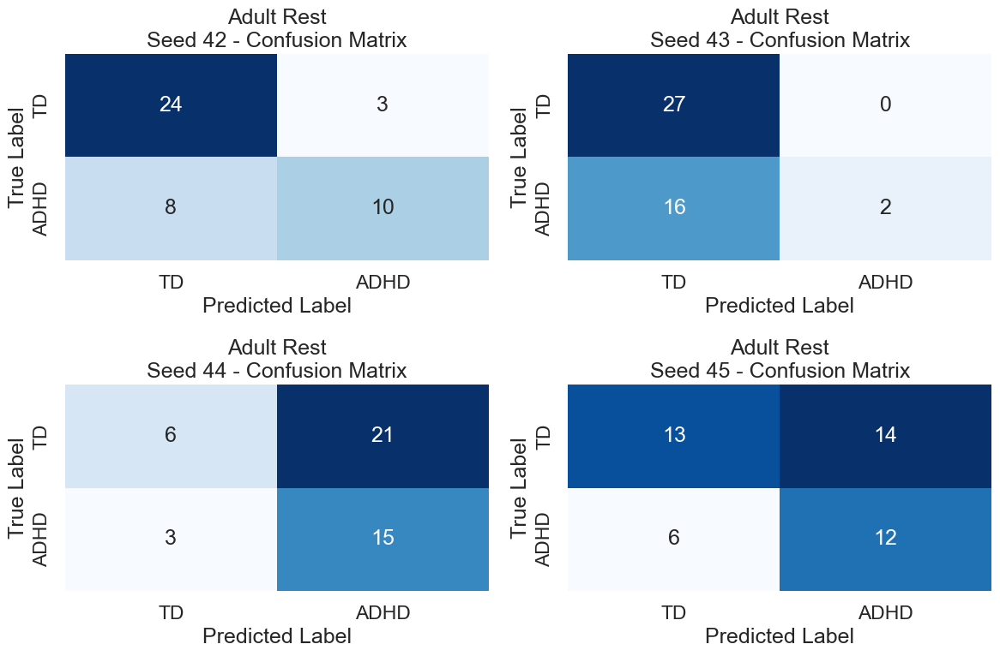

[6_Adult Rest Model] Aggregated results saved to: Experiments/6_th_experiment/test_results/6_Adult Rest Model_aggregated_results.json
[6_Adult Rest Model] Per-subject results saved to: Experiments/6_th_experiment/test_results/6_adult_rest_subject_predictions_all_seeds_bin.csv

[6_Adult Rest Model] Test Results on Inference:
    accuracy_mean: 0.6056
    accuracy_std: 0.1236
    balanced_accuracy_mean: 0.5949
    balanced_accuracy_std: 0.0870
    f1_macro_mean: 0.5537
    f1_macro_std: 0.1257
    auc_mean: 0.6734
    auc_std: 0.0422


In [258]:
# ============================================================
# 6.4.6 Тест модели ROISequenceNet для бинарной классификации на датасете Adult Rest -> инференс Adult(0.2) inference
# ============================================================
model_name_adult_rest_bin = "6_Adult Rest Model"
best_cfg_adult_rest_bin_path = os.path.join(BEST_DIR_BIN_ADULT_REST_6, "best_config.json")

with open(best_cfg_adult_rest_bin_path, "r", encoding="utf-8") as f:
    best_cfg_adult_rest_bin = json.load(f)

trial_id_adult_rest_bin = best_cfg_adult_rest_bin.get("trial_id")
if not trial_id_adult_rest_bin:
    raise KeyError("best_config.json for 6_Adult Rest model has no 'trial_id'")

# Протестируем лучшую модель Adult Rest по 3-м seed (42, 43 , 44, 45) на отложенном наборе Adult(0.2) inference
result_mixed_adult_rest_test_bin = test_binary_model_all_seeds(
    best_config=best_cfg_adult_rest_bin,
    best_checkpoint_dir=BEST_DIR_BIN_ADULT_REST_6,
    model_name=model_name_adult_rest_bin,
    test_loader=experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin.inference_loader,
    device=DEVICE,
    n_classes=N_CLASSES_BIN,
    cov_dim=experiment_6_data_loader_for_search_adult_0_2_inference_sampler_bin.cov_dim_s,
    results_dir=TEST_RESULTS_DIR_6,
    seeds=SEARCH_ALL_SEEDS_BIN,
    save_subject_results=True,
    subject_results_path=os.path.join(TEST_RESULTS_DIR_6, "6_adult_rest_subject_predictions_all_seeds_bin"),
)

#### 6.4.7 Итоги тестов на инференсе эксперимента 6

In [259]:
# Добавим суммарную таблицу всех тестов эксперимента 6
def safe_get_agg_metric(result_dict, metric_key):
    try:
        return result_dict["aggregated_metrics"].get(metric_key)
    except (KeyError, TypeError):
        return None

def safe_get_n_seeds(result_dict):
    try:
        return result_dict.get("n_seeds_tested")
    except (KeyError, TypeError):
        return None

def safe_get_model_name(result_dict):
    try:
        readable_model_name = result_dict.get("model_name", "")
        readable_model_name = re.sub(r"^\d_", "", readable_model_name)
        readable_model_name = re.sub(r"^\d_", "", readable_model_name)
        readable_model_name = re.sub(r" Model", "", readable_model_name)
        return readable_model_name.strip()
    except (KeyError, TypeError):
        return None

# Dictionary должен быть следующего формата
# {
#   "model_name": model_name,
#   "n_seeds_tested": len(all_metrics),
#   "seed_metrics": all_metrics,
#   "aggregated_metrics": agg_metrics,
# }
def summarize_binary_test_results(*result_dicts):
    summary_list = []
    for result_dict in result_dicts:
        summary_list.append(
            {
                "experiment": safe_get_model_name(result_dict),
                "Mean F1 macro": safe_get_agg_metric(result_dict, "f1_macro_mean"),
                "Std F1 macro": safe_get_agg_metric(result_dict, "f1_macro_std"),
                "Mean AUC": safe_get_agg_metric(result_dict, "auc_mean"),
                "Std AUC": safe_get_agg_metric(result_dict, "auc_std"),
                "Mean Balanced Accuracy": safe_get_agg_metric(result_dict, "balanced_accuracy_mean"),
                "Std Balanced Accuracy": safe_get_agg_metric(result_dict, "balanced_accuracy_std"),
                "Mean Accuracy": safe_get_agg_metric(result_dict, "accuracy_mean"),
                "Std Accuracy": safe_get_agg_metric(result_dict, "accuracy_std"),
            }
        )
    return pd.DataFrame(summary_list)

experiment_6_test_summary_df = summarize_binary_test_results(
    result_teen_only_test_bin,
    result_teen_cov_gender_test_bin,
    result_mixed_teen_adult_0_2_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_site_original_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_excl_class_2_test_bin,
    result_mixed_teen_adult_0_8_test_bin,
    result_mixed_teen_adult_0_8_cov_gender_test_bin,
    result_mixed_teen_adult_0_8_cov_gender_site_original_test_bin,
    result_mixed_teen_adult_0_8_cov_gender_excl_class_2_test_bin,
    result_mixed_teen_adult_0_2_inf_adult_rest_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_inf_adult_rest_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_test_bin,
    result_children_teen_adult_0_8_test_bin,
    result_children_teen_adult_0_8_cov_gender_test_bin,
    result_mixed_adult_rest_test_bin,
)
experiment_6_test_summary_df = experiment_6_test_summary_df.sort_values(by="Mean F1 macro", ascending=False).reset_index(drop=True)
summary_csv_path = os.path.join(TEST_RESULTS_DIR_6, "summary_results.csv")
experiment_6_test_summary_df.to_csv(summary_csv_path, index=False)
print(f"\nSummary of Binary Test Results saved to: {summary_csv_path}")
print(experiment_6_test_summary_df)
# Сохраним также в виде красивой таблицы в формате xlsx
summary_excel_path = os.path.join(TEST_RESULTS_DIR_6, "summary_results.xlsx")
experiment_6_test_summary_df.to_excel(summary_excel_path, index=False)
print(f"Summary of Binary Test Results also saved to: {summary_excel_path}")


Summary of Binary Test Results saved to: Experiments/6_th_experiment/test_results/summary_results.csv
                                           experiment  Mean F1 macro  Std F1 macro  Mean AUC   Std AUC  Mean Balanced Accuracy  Std Balanced Accuracy  Mean Accuracy  Std Accuracy
0        Teen+Adult(0.8) cov gender and site_original       0.792231      0.054090  0.835391  0.101569                0.807870               0.044965       0.794444      0.055556
1                          Teen+Adult(0.8) cov gender       0.722448      0.064059  0.865741  0.035535                0.724537               0.061593       0.750000      0.037952
2                          Teen+Adult(0.2) cov gender       0.657273      0.135190  0.677984  0.257416                0.668981               0.131897       0.694444      0.100000
3                 Children+Teen+Adult(0.8) cov gender       0.652365      0.079939  0.777778  0.129581                0.652778               0.070313       0.694444      0.073423
4 

In [260]:
summary_df_mixed_teen_adult_0_2_test_bin = summarize_binary_test_results(
    result_mixed_teen_adult_0_2_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_excl_class_2_test_bin,
)
summary_df_mixed_teen_adult_0_2_test_bin = summary_df_mixed_teen_adult_0_2_test_bin.sort_values(by="Mean F1 macro", ascending=False).reset_index(drop=True)
print(summary_df_mixed_teen_adult_0_2_test_bin)

                              experiment  Mean F1 macro  Std F1 macro  Mean AUC   Std AUC  Mean Balanced Accuracy  Std Balanced Accuracy  Mean Accuracy  Std Accuracy
0             Teen+Adult(0.2) cov gender       0.657273      0.135190  0.677984  0.257416                0.668981               0.131897       0.694444      0.100000
1                        Teen+Adult(0.2)       0.606489      0.082520  0.745370  0.085457                0.615741               0.072711       0.672222      0.073423
2  Teen+Adult(0.2) cov gender excl cl. 2       0.564113      0.117876  0.768319  0.065689                0.575970               0.093407       0.661111      0.073423


In [261]:
summary_df_mixed_teen_adult_0_8_test_bin = summarize_binary_test_results(
    result_mixed_teen_adult_0_8_test_bin,
    result_mixed_teen_adult_0_8_cov_gender_test_bin,
    result_mixed_teen_adult_0_8_cov_gender_site_original_test_bin,
    result_mixed_teen_adult_0_8_cov_gender_excl_class_2_test_bin,
)
summary_df_mixed_teen_adult_0_8_test_bin = summary_df_mixed_teen_adult_0_8_test_bin.sort_values(by="Mean F1 macro", ascending=False).reset_index(drop=True)
print(summary_df_mixed_teen_adult_0_8_test_bin)

                                     experiment  Mean F1 macro  Std F1 macro  Mean AUC   Std AUC  Mean Balanced Accuracy  Std Balanced Accuracy  Mean Accuracy  Std Accuracy
0  Teen+Adult(0.8) cov gender and site_original       0.792231      0.054090  0.835391  0.101569                0.807870               0.044965       0.794444      0.055556
1                    Teen+Adult(0.8) cov gender       0.722448      0.064059  0.865741  0.035535                0.724537               0.061593       0.750000      0.037952
2         Teen+Adult(0.8) cov gender excl cl. 2       0.627720      0.205146  0.808190  0.070123                0.672683               0.191843       0.700000      0.116887
3                               Teen+Adult(0.8)       0.567572      0.181427  0.760288  0.028337                0.629630               0.126279       0.633333      0.128940


In [262]:
summary_df_mixed_teen_adult_0_2_inf_adult_rest_test_bin = summarize_binary_test_results(
    result_mixed_teen_adult_0_2_inf_adult_rest_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_inf_adult_rest_test_bin,
    result_mixed_teen_adult_0_2_cov_gender_excl_class_2_inf_adult_rest_test_bin,
)
summary_df_mixed_teen_adult_0_2_inf_adult_rest_test_bin = summary_df_mixed_teen_adult_0_2_inf_adult_rest_test_bin.sort_values(by="Mean F1 macro", ascending=False).reset_index(drop=True)
print(summary_df_mixed_teen_adult_0_2_inf_adult_rest_test_bin)

                                          experiment  Mean F1 macro  Std F1 macro  Mean AUC   Std AUC  Mean Balanced Accuracy  Std Balanced Accuracy  Mean Accuracy  Std Accuracy
0        Teen+Adult(0.2) cov gender (Inf Adult Rest)       0.569946      0.086740  0.603118  0.163001                0.584644               0.074999       0.619382      0.046638
1  Teen+Adult(0.2) cov gender excl cl. 2 (Inf Adu...       0.548563      0.078786  0.645270  0.055672                0.554908               0.071097       0.612717      0.048362
2             Teen+Adult(0.2) (Inference Adult Rest)       0.516388      0.039941  0.632206  0.035330                0.556014               0.028553       0.626404      0.026150


### 6.5 Выводы по Эксперименту 6

**Максимумы на валидации (при обучении, AUC по val)**

Teen+Adult(0.2) cov gender: search AUC=0.721; final-train (seeds 43–45) mean=0.660, max=0.699
Teen+Adult(0.2) cov gender excl class 2: search AUC=0.791; final-train mean=0.799, max=0.822
Teen+Adult(0.8) cov gender: search AUC=0.736; final-train mean=0.745, max=0.758
Teen+Adult(0.8) cov gender excl class 2: search AUC=0.691; final-train mean=0.669, max=0.692

**Сопоставимость тестов**
- Для вариантов `excl cl. 2` инференс выполнялся на выборках, где class 2 **не исключён**. Это делает результаты сопоставимыми с остальными тестами на том же inference set, но одновременно проверяет перенос на subtype (class 2), которого не было в train.
- Результаты с пометкой `Inf Adult Rest` / `Inference Adult Rest` сравнимы **только между собой**: там тестом является вся оставшаяся выборка взрослых (Adult(0.8) rest), а не `Adult(0.2)` inference.

**Основное сравнение (Adult(0.2) inference): F1 / Balanced accuracy / AUC**

| Модель | F1 macro (mean±std) | Balanced acc (mean±std) | AUC (mean±std) |
|---|---:|---:|---:|
| Teen+Adult(0.8) cov gender | 0.722±0.064 | 0.725±0.062 | 0.866±0.036 |
| Teen+Adult(0.8) cov gender excl cl. 2 | 0.627±0.205 | 0.672±0.91 | 0.808±0.07 |
| Teen+Adult(0.2) cov gender | 0.657±0.135 | 0.669±0.132 | 0.678±0.257 |
| Teen+Adult(0.2) cov gender excl cl. 2 | 0.564±0.117 | 0.576±0.093 | 0.768±0.065 |

**Эффект исключения class 2 (excl − included) на Adult(0.2) inference**
- Teen+Adult(0.8) cov gender: ΔF1=-0.095, ΔBalAcc=-0.053, ΔAUC=-0.058.
- Teen+Adult(0.2) cov gender: ΔF1=-0.093, ΔBalAcc=-0.093, ΔAUC=+0.090.
  
  (Замечание: у Teen+Adult(0.2) cov gender AUC имеет большой разброс по seed; для excl cl. 2 разброс AUC заметно ниже. То же наблюдается и для Teen+Adult(0.2) cov gender, но разброс значений изначально втрое ниже, чем у Teen+Adult(0.2) cov gender)

**Adult Rest inference (не сравнивать напрямую с Adult(0.2) inference)**

| Модель | F1 macro (mean±std) | Balanced acc (mean±std) | AUC (mean±std) |
|---|---:|---:|---:|
| Teen+Adult(0.2) cov gender (Inf Adult Rest) | 0.570±0.087 | 0.585±0.075 | 0.603±0.163 |
| Teen+Adult(0.2) cov gender excl cl. 2 (Inf Adult Rest) | 0.548±0.040 | 0.556±0.028 | 0.632±0.035 |

**Практический вывод**
- Если ориентироваться на *F1 + balanced accuracy* (и учитывать AUC как третий фактор) на сопоставимом тесте Adult(0.2) inference — наиболее перспективна модель **Teen+Adult(0.8) cov gender**: она лидирует по всем трём метрикам и имеет небольшой разброс по AUC.
- Исключение class 2 в варианте Teen+Adult(0.8) ухудшает качество одновременно по F1/BalAcc/AUC, поэтому как стратегия (в этой постановке) выглядит неперспективно.
- Для Teen+Adult(0.2) cov gender исключение class 2 повышает AUC, но ухудшает F1 и balanced accuracy — это компромисс, который стоит выбирать исходя из того, что важнее в downstream-задаче.


# Подготовка материалов для презентации

In [263]:
import json
import re, os
from pathlib import Path
import yaml
import enum

import numpy as np
import pandas as pd
import seaborn as sns

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display

# Увеличим ширину печати для pandas
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Отключим предупреждения для чистоты логирования
import warnings
warnings.filterwarnings('ignore')

In [264]:
# Загрузка констант из YAML файла
with open('../../research_constants.yaml', 'r') as file:
    constants = yaml.safe_load(file)

CHILDREN_MINIMAL_AGE = constants['AGE_COHORTS']['CHILDREN_MINIMAL_AGE']
CHILDREN_MAXIMAL_AGE = constants['AGE_COHORTS']['CHILDREN_MAXIMAL_AGE']
TEEN_MINIMAL_AGE = constants['AGE_COHORTS']['TEEN_MINIMAL_AGE']
TEEN_MAXIMAL_AGE = constants['AGE_COHORTS']['TEEN_MAXIMAL_AGE']
ADULT_MINIMAL_AGE = constants['AGE_COHORTS']['ADULT_MINIMAL_AGE']
ADULT_MAXIMAL_AGE = constants['AGE_COHORTS']['ADULT_MAXIMAL_AGE']

AGE_COHORT_NAMES = constants['AGE_COHORT_NAMES']
AGE_COHORTS_KEYS = constants['AGE_COHORTS_KEYS']

DIAGNOSIS_KEYS = constants['DIAGNOSIS_KEYS']

SITE_CODES_REVERSED_MAP = constants['SITE_CODES_REVERSED_MAP']

ATHENA_SOURCE = constants['DATA_SOURCES']['ATHENA_SOURCE_ROOT']
RANDOM_SEED = constants['RANDOM_SEED']

T_FIX = constants['TIME_SERIES']['T_FIX']
WINDOW_SIZE = constants['TIME_SERIES']['WINDOW_SIZE']
WINDOW_STEP = constants['TIME_SERIES']['WINDOW_STEP']
FC_METRIC = constants['TIME_SERIES']['FC_METRIC']

print("Константы загружены:")
print(f"Дети: {CHILDREN_MINIMAL_AGE}-{CHILDREN_MAXIMAL_AGE} лет")
print(f"Подростки: {TEEN_MINIMAL_AGE}-{TEEN_MAXIMAL_AGE} лет")
print(f"Молодые взрослые: {ADULT_MINIMAL_AGE}-{ADULT_MAXIMAL_AGE} лет")
print(f"Имена когорт по возрасту: {AGE_COHORT_NAMES}")
print(f"Ключи когорт по возрасту: {AGE_COHORTS_KEYS}")
print(f"Ключи диагнозов: {DIAGNOSIS_KEYS}")
print(f"Коды сайтов (обратная карта): {SITE_CODES_REVERSED_MAP}")
print(f"Путь к Athena Source: {ATHENA_SOURCE}")
print(f"Random seed: {RANDOM_SEED}")
print(f"T_FIX: {T_FIX}")
print(f"WINDOW_SIZE: {WINDOW_SIZE}")
print(f"WINDOW_STEP: {WINDOW_STEP}")
print(f"FC_METRIC: {FC_METRIC}")

Константы загружены:
Дети: 0-11.99 лет
Подростки: 12-15.99 лет
Молодые взрослые: 16-21.99 лет
Имена когорт по возрасту: ['children', 'teen', 'adult']
Ключи когорт по возрасту: {'children': 0, 'teen': 1, 'adult': 2}
Ключи диагнозов: {0: 'Typically Developing Children', 1: 'ADHD-Combined', 2: 'ADHD-Hyperactive/Impulsive', 3: 'ADHD-Inattentive'}
Коды сайтов (обратная карта): {'Peking_1': 1, 'Peking_2': 1, 'Peking_3': 1, 'Brown': 2, 'KKI': 3, 'NeuroIMAGE': 4, 'NYU': 5, 'OHSU': 6, 'Pittsburgh': 7, 'WashU': 8}
Путь к Athena Source: /Users/alexey.stafeev/MyDocuments/Study/МФТИ/НИР/Materials/ADHD200/ADHD200_CC400_TCs_filtfix
Random seed: 42
T_FIX: 200
WINDOW_SIZE: 30
WINDOW_STEP: 5
FC_METRIC: correlation


In [265]:
# Загружаем summary_results.csv тестов для всех моделей
def load_summary_results(test_results_dir):
    summary_csv_path = os.path.join(test_results_dir, "summary_results.csv")
    if not os.path.exists(summary_csv_path):
        raise FileNotFoundError(f"Summary CSV file not found at: {summary_csv_path}")
    return pd.read_csv(summary_csv_path)

In [266]:
# Путь к директории с результатами бэйслайна эксперимента 1
BASELINE_MUL_RESULTS_DIR_1 = "Experiments/1_st_experiment"

# Путь к директории с результатами тестов эксперимента 3
TEST_RESULTS_DIR_3 = "Experiments/3_rd_experiment/test_results"
# Путь к директории с результатами обучения и валидации эксперимента 3
TRAIN_VAL_RESULTS_DIR_3 = "Experiments/3_rd_experiment/checkpoints"

# Путь к директории с результатами тестов эксперимента 6
TEST_RESULTS_DIR_6 = "Experiments/6_th_experiment/test_results"
# Путь к директории с результатами обучения и валидации эксперимента 6
TRAIN_VAL_RESULTS_DIR_6 = "Experiments/6_th_experiment/checkpoints"

# Загрузим из констант имена моделей для экспериментов
# Подготовка данных (для 3-х фаз эксперимента)
Phase_1_experiments_names = constants['EXPERIMENTS_DATA']['Phase_1_experiments_names']
Phase_2_experiments_names = constants['EXPERIMENTS_DATA']['Phase_2_experiments_names']
Phase_3_experiments_names = constants['EXPERIMENTS_DATA']['Phase_3_experiments_names']

print("Имена моделей для эксперимента 1:")
for name in Phase_1_experiments_names:
    print(f"- {name}")
print("\nИмена моделей для эксперимента 2:")
for name in Phase_2_experiments_names:
    print(f"- {name}")
print("\nИмена моделей для эксперимента 3:")
for name in Phase_3_experiments_names:
    print(f"- {name}")

Имена моделей для эксперимента 1:
- Adult Rest
- Teen-Only

Имена моделей для эксперимента 2:
- Teen+Adult(0.8)
- Teen+Adult(0.2)
- Children+Teen+Adult(0.8)

Имена моделей для эксперимента 3:
- Teen+Adult(0.8) cov gender
- Teen+Adult(0.2) cov gender
- Teen-Only cov gender
- Children+Teen+Adult(0.8) cov gender


In [267]:
# Загрузим результаты тестов для всех моделей эксперимента 1
try:
    experiment_1_summary_csv_path = os.path.join(BASELINE_MUL_RESULTS_DIR_1, "experiment_1_sequence_and_baseline_summary.csv")
    if not os.path.exists(experiment_1_summary_csv_path):
        raise FileNotFoundError(f"Summary CSV file not found at: {experiment_1_summary_csv_path}")
    experiment_1_baseline_mul_results_df = pd.read_csv(experiment_1_summary_csv_path)
    print("\nSummary of Test Results for Experiment 1:")
    print(experiment_1_baseline_mul_results_df)
except Exception as e:
    print(f"Error loading summary results for Experiment 1: {e}")

# Удалим из эксперимента 1 строки с моделью ROISequenceNet, так как она не обучалась в эксперименте 1, а была добавлена только в эксперименте 3 для сравнения с бэйслайнами
experiment_1_baseline_mul_results_df = experiment_1_baseline_mul_results_df[~experiment_1_baseline_mul_results_df['model'].str.contains("ROISequenceNet")].reset_index(drop=True)
# Удалим строку с balance_strategy = "oversample" для модели SVM, так как она не обучалась в эксперименте 1, а была добавлена только в эксперименте 3 для сравнения с бэйслайнами
experiment_1_baseline_mul_results_df = experiment_1_baseline_mul_results_df[~((experiment_1_baseline_mul_results_df['balance_strategy'] == "oversample"))].reset_index(drop=True)
# Удалим столбцы category, balance_strategy, use_covariates, val_loss, val_prec, так как в эксперименте 1 они не использовались и не влияют на результаты
experiment_1_baseline_mul_results_df = experiment_1_baseline_mul_results_df.drop(columns=['category', 'balance_strategy', 'use_covariates', 'val_loss', 'val_prec'], errors='ignore')
# Переименуем столбец "model" в "Experiment" для лучшей читаемости
experiment_1_baseline_mul_results_df = experiment_1_baseline_mul_results_df.rename(columns={'model': 'experiment'})
print("\nSummary of Test Results for Experiment 1 (after removing ROISequenceNet, oversample rows and unnecessary columns):")
print(experiment_1_baseline_mul_results_df)


Summary of Test Results for Experiment 1:
                                 category           model balance_strategy  use_covariates      val_loss   val_acc   val_auc  val_prec    val_f1
0                             LSTM Models      SimpleLSTM          sampler           False      2.044537  0.396465  0.548590  0.468870  0.425054
1                             LSTM Models      SimpleLSTM       oversample           False      2.718281  0.479798  0.516789  0.462023  0.470295
2                              GRU Models       SimpleGRU          sampler           False      2.091148  0.297980  0.480545  0.413018  0.320200
3    ROISequenceNet Models (no covariats)  ROISequenceNet          sampler           False      2.107716  0.560606  0.514948  0.391430  0.453184
4    ROISequenceNet Models (no covariats)  ROISequenceNet       oversample           False      3.928076  0.578283  0.568907  0.518539  0.515788
5    ROISequenceNet Models (no covariats)  ROISequenceNet        nobalance           Fa

In [268]:
# Загружаем результаты обучения и валидации для эксперимента 3
try:
    experiment_3_train_val_df = load_summary_results(TRAIN_VAL_RESULTS_DIR_3)
    print("Эксперимент 3 - результаты обучения и валидации:")
    display(experiment_3_train_val_df.head())
except Exception as e:
    print(f"Ошибка при загрузке результатов обучения и валидации для эксперимента 3: {e}")

Эксперимент 3 - результаты обучения и валидации:


,mean_val_auc,mean_val_f1,mean_val_accuracy,experiment
0,0.715772,0.622522,0.664122,Teen-Only
1,0.642995,0.620313,0.664319,Teen+Adult(0.2)
2,0.617375,0.448413,0.568493,Teen+Adult(0.2) cov gender
3,0.556057,0.425174,0.508575,Children+Teen+Adult(0.8)
4,0.630444,0.488972,0.541557,Children+Teen+Adult(0.8) cov gender


In [269]:
# Загружаем результаты обучения и валидации для эксперимента 6
try:
    experiment_6_train_val_df = load_summary_results(TRAIN_VAL_RESULTS_DIR_6)
    print("Эксперимент 6 - результаты обучения и валидации:")
    display(experiment_6_train_val_df.head())
except Exception as e:
    print(f"Ошибка при загрузке результатов обучения и валидации для эксперимента 6: {e}")

Эксперимент 6 - результаты обучения и валидации:


,experiment,mean_val_auc,mean_val_accuracy,mean_val_f1
0,Teen-Only,0.634276,0.639098,0.635650
1,Teen-Only cov gender,0.564239,0.578947,0.424561
2,Teen+Adult(0.2),0.526231,0.692308,0.632762
3,Teen+Adult(0.2) cov gender,0.721146,0.671329,0.662785
4,Teen+Adult(0.2) cov gender and site_original,0.755044,0.699301,0.669149


In [270]:
# Загружаем результаты тестов для эксперимента 3
try:
    experiment_3_test_results_df = load_summary_results(TEST_RESULTS_DIR_3)
    print("Эксперимент 3 - результаты тестов:")
    display(experiment_3_test_results_df)
except Exception as e:
    print(f"Ошибка при загрузке результатов тестов для эксперимента 3: {e}")

Эксперимент 3 - результаты тестов:


,experiment,n_seeds,Mean AUC,Std AUC,Div AUC,Mean F1 macro,Std F1 macro,Div F1 macro
0,Teen+Adult(0.8) cov gender,5,0.718971,0.038783,0.053942,0.565392,0.036657,0.064836
1,Teen+Adult(0.2) (Inf Adult Rest),5,0.676979,0.047312,0.069887,0.523628,0.018118,0.034601
2,Teen+Adult(0.2),5,0.756872,0.048481,0.064055,0.508315,0.035707,0.070246
3,Teen-Only cov gender,5,0.731354,0.012226,0.016717,0.501278,0.020982,0.041857
4,Teen+Adult(0.2) cov gender,5,0.744615,0.040663,0.054610,0.494524,0.027057,0.054713
5,Children+Teen+Adult(0.8) cov gender,5,0.692054,0.007926,0.011453,0.492988,0.022940,0.046533
6,Teen+Adult(0.8),5,0.801047,0.016390,0.020461,0.488966,0.036903,0.075472
7,Teen-Only,5,0.548954,0.083435,0.151989,0.426176,0.009004,0.021126
8,Children+Teen+Adult(0.8),5,0.682690,0.039904,0.058451,0.419125,0.051475,0.122816
9,Adult Rest,5,0.556079,0.116737,0.209929,0.407329,0.045290,0.111189


In [271]:
# Загружаем результаты тестов для эксперимента 6
try:
    experiment_6_test_results_df = load_summary_results(TEST_RESULTS_DIR_6)
    print("Эксперимент 6 - результаты тестов:")
    display(experiment_6_test_results_df)
except Exception as e:
    print(f"Ошибка при загрузке результатов тестов для эксперимента 6: {e}")

Эксперимент 6 - результаты тестов:


,experiment,Mean F1 macro,Std F1 macro,Mean AUC,Std AUC,Mean Balanced Accuracy,Std Balanced Accuracy,Mean Accuracy,Std Accuracy
0,Teen+Adult(0.8) cov gender and site_original,0.792231,0.054090,0.835391,0.101569,0.807870,0.044965,0.794444,0.055556
1,Teen+Adult(0.8) cov gender,0.722448,0.064059,0.865741,0.035535,0.724537,0.061593,0.750000,0.037952
2,Teen+Adult(0.2) cov gender,0.657273,0.135190,0.677984,0.257416,0.668981,0.131897,0.694444,0.100000
3,Children+Teen+Adult(0.8) cov gender,0.652365,0.079939,0.777778,0.129581,0.652778,0.070313,0.694444,0.073423
4,Teen+Adult(0.2) cov gender and site_original,0.644778,0.092677,0.786008,0.076400,0.659722,0.090525,0.688889,0.054433
5,Teen+Adult(0.8) cov gender excl cl. 2,0.627720,0.205146,0.808190,0.070123,0.672683,0.191843,0.700000,0.116887
6,Teen+Adult(0.2),0.606489,0.082520,0.745370,0.085457,0.615741,0.072711,0.672222,0.073423
7,Children+Teen+Adult(0.8),0.570161,0.163156,0.700617,0.187875,0.594907,0.119626,0.644444,0.097710
8,Teen+Adult(0.2) cov gender (Inf Adult Rest),0.569946,0.086740,0.603118,0.163001,0.584644,0.074999,0.619382,0.046638
9,Teen+Adult(0.8),0.567572,0.181427,0.760288,0.028337,0.629630,0.126279,0.633333,0.128940


In [272]:
# Подготовим данные. Для удобства визуализации и анализа добавим столбец "experiment" для обозначения эксперимента, к которому относятся результаты, и объединим оба датафрейма с результатами тестов в один.
# Отфильтруем только те модели, которые есть в обоих экспериментах, чтобы сравнивать только их. Для этого можно использовать имена моделей из констант.
def prepare_combined_test_results_df(experiment_3_df: pd.DataFrame, experiment_6_df: pd.DataFrame,
                                     experimments_names_filter: list | None = None,
                                     experiment_3_prefix="multi", experiment_6_prefix="bin") -> pd.DataFrame:
    
    if experimments_names_filter is not None:
        filtered_experiment_3_df = experiment_3_df[experiment_3_df['experiment'].isin(experimments_names_filter)].copy()
        filtered_experiment_6_df = experiment_6_df[experiment_6_df['experiment'].isin(experimments_names_filter)].copy()
    else:
        # Находим общие имена моделей
        common_experiment_names = set(experiment_3_df['experiment']).intersection(set(experiment_6_df['experiment']))
        
        # Фильтруем датафреймы по общим именам моделей
        filtered_experiment_3_df = experiment_3_df[experiment_3_df['experiment'].isin(common_experiment_names)].copy()
        filtered_experiment_6_df = experiment_6_df[experiment_6_df['experiment'].isin(common_experiment_names)].copy()
    
    # Добавляем префиксы к именам моделей для обозначения эксперимента
    filtered_experiment_3_df['experiment'] = experiment_3_prefix + ' ' + filtered_experiment_3_df['experiment']
    filtered_experiment_6_df['experiment'] = experiment_6_prefix + ' ' + filtered_experiment_6_df['experiment']
    
    # Находим общие столбцы и оставляем только их
    common_columns = list(set(filtered_experiment_3_df.columns).intersection(set(filtered_experiment_6_df.columns)))
    filtered_experiment_3_df = filtered_experiment_3_df[common_columns].copy()
    filtered_experiment_6_df = filtered_experiment_6_df[common_columns].copy()
    
    # Объединяем оба датафрейма
    combined_test_results_df = pd.concat([filtered_experiment_3_df, filtered_experiment_6_df], ignore_index=True)
    
    return combined_test_results_df

# Создадим аналогичную функцию, но для одного датафрейма, чтобы просто отфильтровать его по нужным именам моделей, добавить префикс и отфильтровать по столбцам
def prepare_single_test_results_df(experiment_df: pd.DataFrame, experimments_names_filter: list | None = None, experiment_prefix: str | None = None) -> pd.DataFrame:
    if experimments_names_filter is not None:
        filtered_experiment_df = experiment_df[experiment_df['experiment'].isin(experimments_names_filter)].copy()
    else:
        filtered_experiment_df = experiment_df.copy()
    
    # Добавляем префиксы к именам моделей для обозначения эксперимента
    if experiment_prefix is not None:
        filtered_experiment_df['experiment'] = experiment_prefix + ' ' + filtered_experiment_df['experiment']
    
    common_columns = list(set(filtered_experiment_df.columns))
    filtered_experiment_df = filtered_experiment_df[common_columns].copy()
    
    return filtered_experiment_df

In [273]:
# Функция для отрисовки сравнительной диаграммы для нескольких метрик. Каждый bar будет отображать значение одной метрики для каждой модели.
# Диаграмма будет отсортирована по первой метрике для удобства сравнения.
# Bar для каждой метрики будет иметь свою цветовую палитру, а легенда будет отображать, какой цвет соответствует какой метрике.
# Bars отрисовываются группами для каждой модели, чтобы было видно сравнение метрик внутри каждой модели, а также между моделями.
# Bars отрисовываются фиксированной ширины без наложения, чтобы было видно все метрики для каждой модели.
# Bars группируются по моделям, а не по метрикам, чтобы было видно сравнение метрик внутри каждой модели, а также между моделями.
def plot_comparative_metric(combined_df: pd.DataFrame, metric_columns: list | str, title: str):
    if isinstance(metric_columns, str):
        metric_columns = [metric_columns]
    
    # Проверяем, что указанные метрики есть в датафрейме
    for metric in metric_columns:
        if metric not in combined_df.columns:
            raise ValueError(f"Метрика '{metric}' не найдена в датафрейме. Доступные метрики: {combined_df.columns.tolist()}")

    # Проверяем, что в датафрейме есть столбец 'experiment' для обозначения моделей
    if 'experiment' not in combined_df.columns:
        raise ValueError("В датафрейме должен быть столбец 'experiment' для обозначения моделей.")
    
    # создаем новый датафрейм для визуализации, который будет содержать только столбцы 'experiment' и указанные метрики
    combined_df = combined_df[['experiment'] + metric_columns].copy()
    
    # Сортируем датафрейм по первой метрике для удобства сравнения
    combined_df = combined_df.sort_values(by=metric_columns[0], ascending=False).reset_index(drop=True)

    # Преобразование в длинный формат
    df = combined_df.melt(id_vars='experiment', var_name='metric', value_name='value')
    # print(df)
    
    # Создаем фигуру и ось для графика
    plt.figure(figsize=(12, 8))

    sns.barplot(
        data=df,
        x='experiment',
        y='value',
        hue='metric',
        palette='Set1',
        dodge=True,
        width=0.8,
        gap=0.3
    )

    # Настраиваем график
    plt.title(f'{title}', fontsize=16)
    plt.xlabel('Эксперимент', fontsize=14)
    plt.ylabel('Значение метрики', fontsize=14)
    plt.legend(title='Метрика')
    plt.xticks(rotation=45, ha='right')  # поворот подписей для удобства
    plt.tight_layout()

    # Показываем график
    plt.show()

## 1.	Строгий перенос. Только подростки (12-16), тест – взрослые (16-22).

In [274]:
Phase_1_train_val_results_df = prepare_combined_test_results_df(experiment_3_train_val_df, experiment_6_train_val_df, Phase_1_experiments_names, experiment_3_prefix="multi", experiment_6_prefix="bin")
print("Объединённые результаты валидации для обоих экспериментов (Phase 1):")
display(Phase_1_train_val_results_df)

Объединённые результаты валидации для обоих экспериментов (Phase 1):


,mean_val_accuracy,experiment,mean_val_auc,mean_val_f1
0,0.664122,multi Teen-Only,0.715772,0.622522
1,0.710227,multi Adult Rest,0.703111,0.687870
2,0.639098,bin Teen-Only,0.634276,0.635650
3,0.810811,bin Adult Rest,0.857143,0.799521


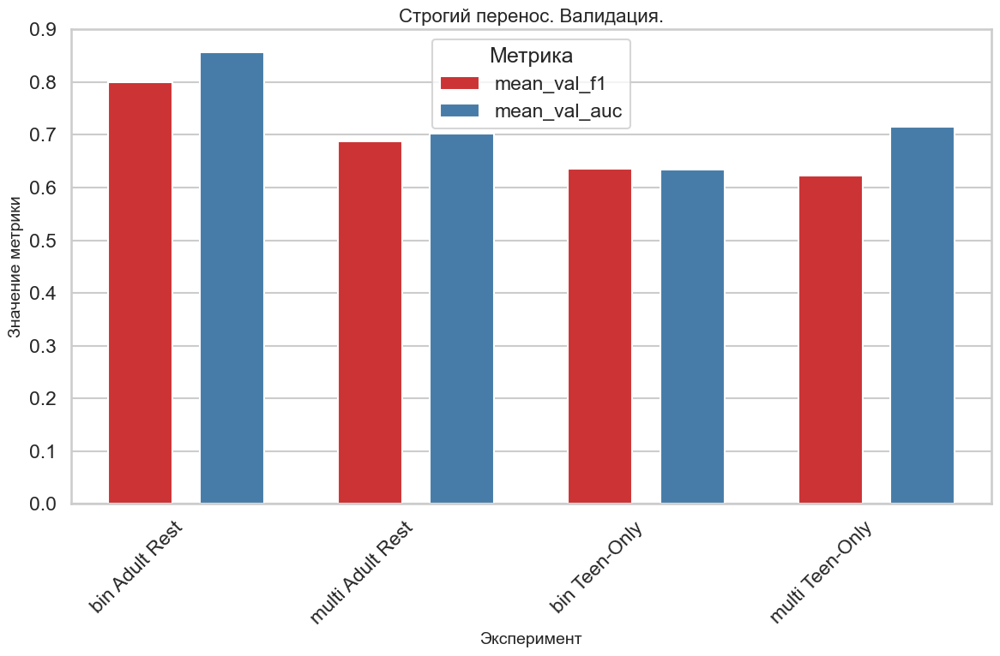

In [275]:
# Отрисуем сравнительную диаграмму для всех метрик для Phase 1 на валидации
plot_comparative_metric(Phase_1_train_val_results_df, ['mean_val_f1', 'mean_val_auc'], 'Строгий перенос. Валидация.')

In [276]:
Phase_1_test_results_df = prepare_combined_test_results_df(experiment_3_test_results_df, experiment_6_test_results_df, Phase_1_experiments_names, experiment_3_prefix="multi", experiment_6_prefix="bin")
print("Объединённые результаты тестов для обоих экспериментов (Phase 1):")
display(Phase_1_test_results_df)

Объединённые результаты тестов для обоих экспериментов (Phase 1):


,Mean AUC,Mean F1 macro,Std AUC,experiment,Std F1 macro
0,0.548954,0.426176,0.083435,multi Teen-Only,0.009004
1,0.556079,0.407329,0.116737,multi Adult Rest,0.045290
2,0.673354,0.553714,0.042181,bin Adult Rest,0.125722
3,0.613683,0.412472,0.059927,bin Teen-Only,0.074943


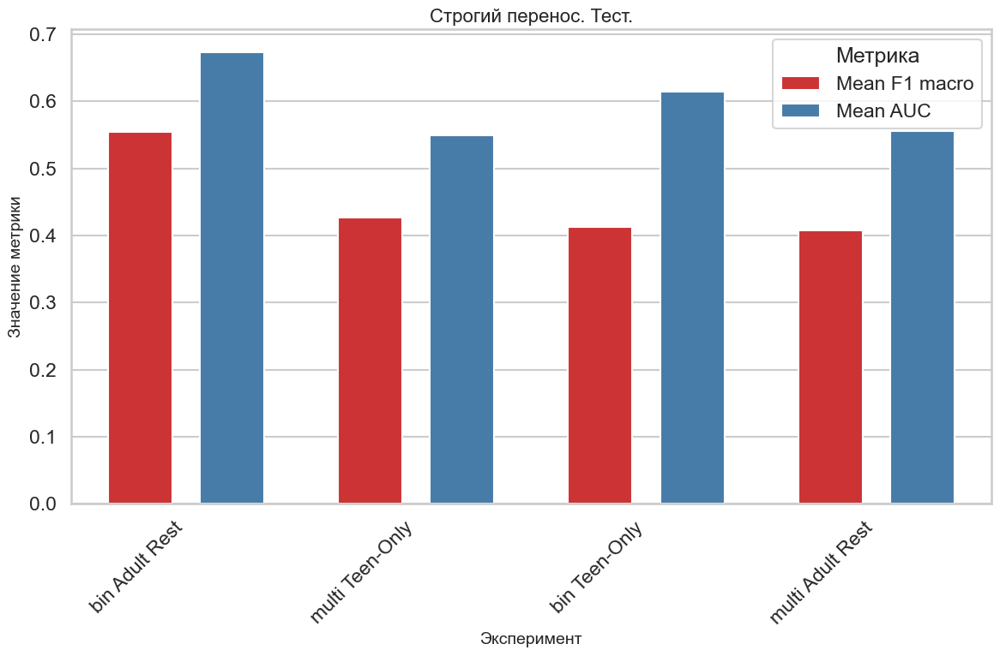

In [277]:
# Отрисуем сравнительную диаграмму для всех метрик для Phase 1 на тесте
plot_comparative_metric(Phase_1_test_results_df, ['Mean F1 macro', 'Mean AUC'], 'Строгий перенос. Тест.')

In [278]:
Phase_1_test_results_df_bin = prepare_single_test_results_df(experiment_6_test_results_df, Phase_1_experiments_names)
print("Результаты тестов для моделей бинарной классификации (Phase 1):")
display(Phase_1_test_results_df_bin)

Результаты тестов для моделей бинарной классификации (Phase 1):


,Std AUC,Mean AUC,Std Accuracy,Std Balanced Accuracy,Mean Accuracy,Mean Balanced Accuracy,Mean F1 macro,experiment,Std F1 macro
11,0.042181,0.673354,0.123562,0.086983,0.605556,0.594907,0.553714,Adult Rest,0.125722
15,0.059927,0.613683,0.033333,0.013889,0.583333,0.506944,0.412472,Teen-Only,0.074943


In [279]:
Phase_1_test_results_df_mul = prepare_single_test_results_df(experiment_3_test_results_df, Phase_1_experiments_names)
print("Результаты тестов для моделей мультиклассовой классификации (Phase 1):")
display(Phase_1_test_results_df_mul)

Результаты тестов для моделей мультиклассовой классификации (Phase 1):


,n_seeds,Mean AUC,Std AUC,Div AUC,Div F1 macro,Mean F1 macro,experiment,Std F1 macro
7,5,0.548954,0.083435,0.151989,0.021126,0.426176,Teen-Only,0.009004
9,5,0.556079,0.116737,0.209929,0.111189,0.407329,Adult Rest,0.045290


## 2.	Смешанное обучение. Подростки (12-16) + часть взрослых, тест – взрослые (16-22).

In [280]:
Phase_2_train_val_results_df = prepare_combined_test_results_df(experiment_3_train_val_df, experiment_6_train_val_df, Phase_2_experiments_names, experiment_3_prefix="multi", experiment_6_prefix="bin")
print("Объединённые результаты валидации для обоих экспериментов (Phase 2):")
display(Phase_2_train_val_results_df)

Объединённые результаты валидации для обоих экспериментов (Phase 2):


,mean_val_accuracy,experiment,mean_val_auc,mean_val_f1
0,0.664319,multi Teen+Adult(0.2),0.642995,0.620313
1,0.508575,multi Children+Teen+Adult(0.8),0.556057,0.425174
2,0.630952,multi Teen+Adult(0.8),0.645926,0.557327
3,0.692308,bin Teen+Adult(0.2),0.526231,0.632762
4,0.694595,bin Children+Teen+Adult(0.8),0.725031,0.691985
5,0.727811,bin Teen+Adult(0.8),0.750421,0.726174


In [281]:
Phase_2_test_results_df_bin = prepare_single_test_results_df(experiment_6_test_results_df, Phase_2_experiments_names)
print("Объединённые результаты тестов для бинарного эксперимента (Phase 2):")
display(Phase_2_test_results_df_bin)

Объединённые результаты тестов для бинарного эксперимента (Phase 2):


,Std AUC,Mean AUC,Std Accuracy,Std Balanced Accuracy,Mean Accuracy,Mean Balanced Accuracy,Mean F1 macro,experiment,Std F1 macro
6,0.085457,0.745370,0.073423,0.072711,0.672222,0.615741,0.606489,Teen+Adult(0.2),0.082520
7,0.187875,0.700617,0.097710,0.119626,0.644444,0.594907,0.570161,Children+Teen+Adult(0.8),0.163156
9,0.028337,0.760288,0.128940,0.126279,0.633333,0.629630,0.567572,Teen+Adult(0.8),0.181427


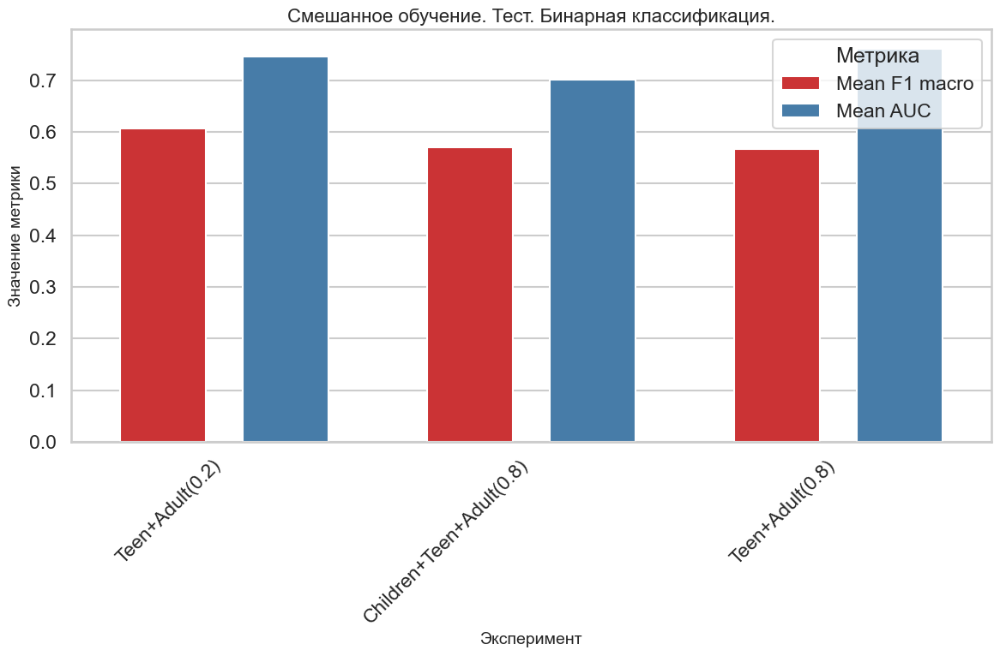

In [282]:
# Отрисуем сравнительную диаграмму для всех метрик для Phase 2 на тесте для бинарного эксперимента
plot_comparative_metric(Phase_2_test_results_df_bin, ['Mean F1 macro', 'Mean AUC'], 'Смешанное обучение. Тест. Бинарная классификация.')

In [283]:
Phase_2_test_results_df_mul = prepare_single_test_results_df(experiment_3_test_results_df, Phase_2_experiments_names)
print("Объединённые результаты тестов для мультиклассового эксперимента (Phase 2):")
display(Phase_2_test_results_df_mul)

Объединённые результаты тестов для мультиклассового эксперимента (Phase 2):


,n_seeds,Mean AUC,Std AUC,Div AUC,Div F1 macro,Mean F1 macro,experiment,Std F1 macro
2,5,0.756872,0.048481,0.064055,0.070246,0.508315,Teen+Adult(0.2),0.035707
6,5,0.801047,0.016390,0.020461,0.075472,0.488966,Teen+Adult(0.8),0.036903
8,5,0.682690,0.039904,0.058451,0.122816,0.419125,Children+Teen+Adult(0.8),0.051475


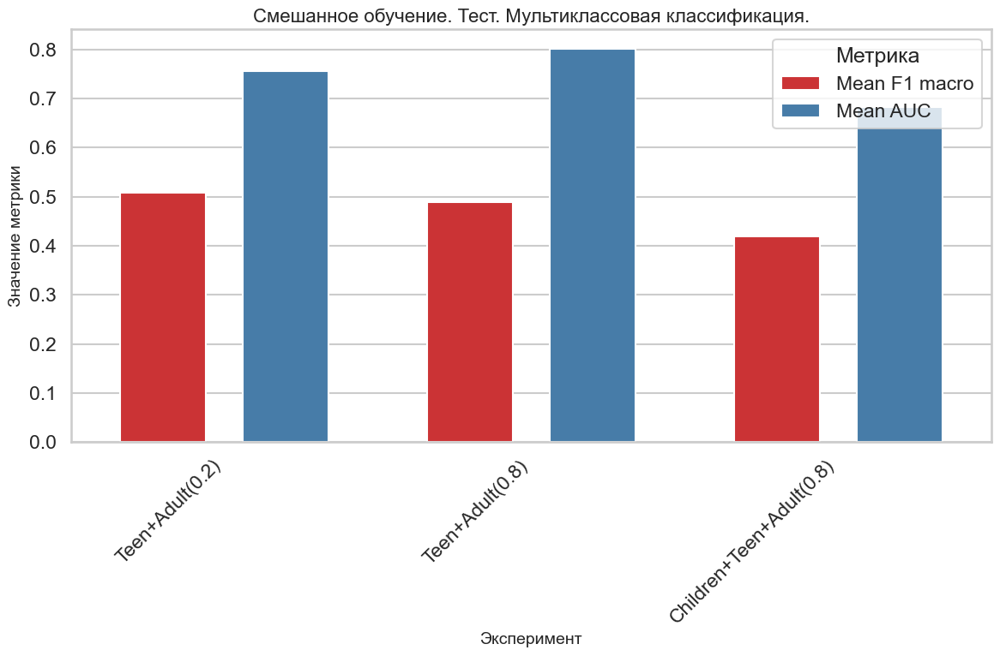

In [284]:
# Отрисуем сравнительную диаграмму для всех метрик для Phase 2 на тесте для мультиклассового эксперимента
plot_comparative_metric(Phase_2_test_results_df_mul, ['Mean F1 macro', 'Mean AUC'], 'Смешанное обучение. Тест. Мультиклассовая классификация.')

## 3.	Влияние ковариат. Подростки (12-16) + часть взрослых, тест – взрослые (16-22).

In [285]:
Phase_3_train_val_results_df = prepare_combined_test_results_df(experiment_3_train_val_df, experiment_6_train_val_df, Phase_3_experiments_names, experiment_3_prefix="multi", experiment_6_prefix="bin")
print("Объединённые результаты валидации для обоих экспериментов (Phase 3):")
display(Phase_3_train_val_results_df)

Объединённые результаты валидации для обоих экспериментов (Phase 3):


,mean_val_accuracy,experiment,mean_val_auc,mean_val_f1
0,0.568493,multi Teen+Adult(0.2) cov gender,0.617375,0.448413
1,0.541557,multi Children+Teen+Adult(0.8) cov gender,0.630444,0.488972
2,0.607143,multi Teen+Adult(0.8) cov gender,0.668239,0.538986
3,0.578947,bin Teen-Only cov gender,0.564239,0.424561
4,0.671329,bin Teen+Adult(0.2) cov gender,0.721146,0.662785
5,0.681081,bin Children+Teen+Adult(0.8) cov gender,0.720464,0.679321
6,0.686391,bin Teen+Adult(0.8) cov gender,0.736111,0.674382


In [286]:
Phase_3_test_results_df_bin = prepare_single_test_results_df(experiment_6_test_results_df, Phase_3_experiments_names)
print("Объединённые результаты тестов для бинарного эксперимента (Phase 3):")
display(Phase_3_test_results_df_bin)

Объединённые результаты тестов для бинарного эксперимента (Phase 3):


,Std AUC,Mean AUC,Std Accuracy,Std Balanced Accuracy,Mean Accuracy,Mean Balanced Accuracy,Mean F1 macro,experiment,Std F1 macro
1,0.035535,0.865741,0.037952,0.061593,0.750000,0.724537,0.722448,Teen+Adult(0.8) cov gender,0.064059
2,0.257416,0.677984,0.100000,0.131897,0.694444,0.668981,0.657273,Teen+Adult(0.2) cov gender,0.135190
3,0.129581,0.777778,0.073423,0.070313,0.694444,0.652778,0.652365,Children+Teen+Adult(0.8) cov gender,0.079939
13,0.032447,0.810700,0.075632,0.120815,0.661111,0.604167,0.533530,Teen-Only cov gender,0.183075


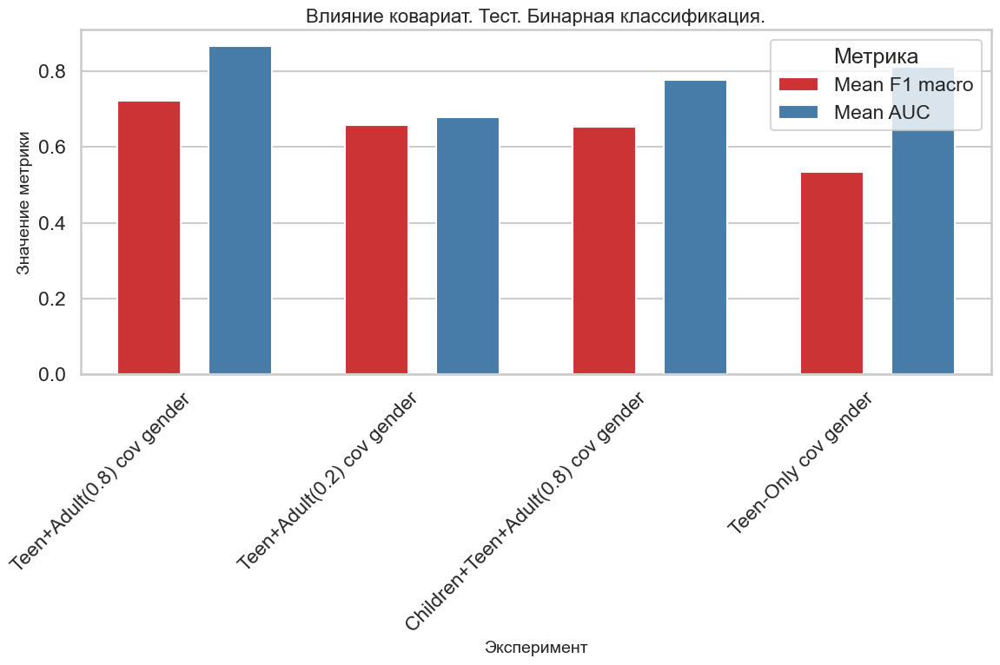

In [287]:
# Отрисуем сравнительную диаграмму для всех метрик для Phase 3 на тесте для бинарного эксперимента
plot_comparative_metric(Phase_3_test_results_df_bin, ['Mean F1 macro', 'Mean AUC'], 'Влияние ковариат. Тест. Бинарная классификация.')

In [288]:
Phase_3_test_results_df_mul = prepare_single_test_results_df(experiment_3_test_results_df, Phase_3_experiments_names)
print("Объединённые результаты тестов для мультиклассового эксперимента (Phase 3):")
display(Phase_3_test_results_df_mul)

Объединённые результаты тестов для мультиклассового эксперимента (Phase 3):


,n_seeds,Mean AUC,Std AUC,Div AUC,Div F1 macro,Mean F1 macro,experiment,Std F1 macro
0,5,0.718971,0.038783,0.053942,0.064836,0.565392,Teen+Adult(0.8) cov gender,0.036657
3,5,0.731354,0.012226,0.016717,0.041857,0.501278,Teen-Only cov gender,0.020982
4,5,0.744615,0.040663,0.054610,0.054713,0.494524,Teen+Adult(0.2) cov gender,0.027057
5,5,0.692054,0.007926,0.011453,0.046533,0.492988,Children+Teen+Adult(0.8) cov gender,0.022940


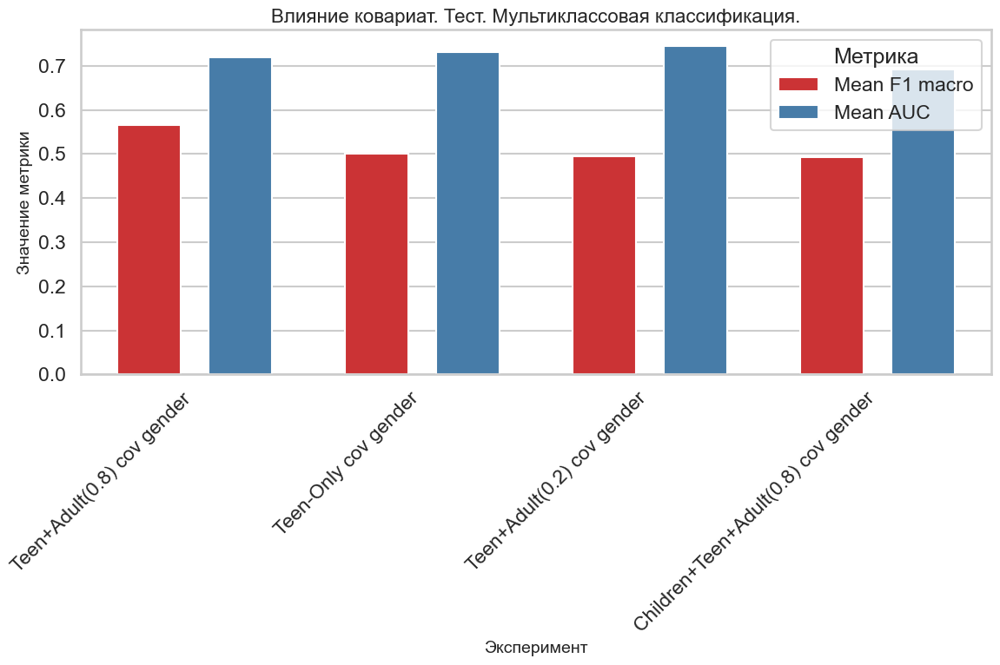

In [289]:
# Отрисуем сравнительную диаграмму для всех метрик для Phase 3 на тесте для мультиклассового эксперимента
plot_comparative_metric(Phase_3_test_results_df_mul, ['Mean F1 macro', 'Mean AUC'], 'Влияние ковариат. Тест. Мультиклассовая классификация.')

## Объединение результатов фазам 1, 2, 3

In [290]:
# Объединим результаты тестов для всех моделей бинарного эксперимента (Phase_1, Phase 2 и Phase 3) в один датафрейм для удобства сравнения всех моделей между собой.
combined_test_results_df_bin = pd.concat([Phase_1_test_results_df_bin, Phase_2_test_results_df_bin, Phase_3_test_results_df_bin], axis=0, ignore_index=True)
print("Объединённые результаты тестов для всех моделей бинарного эксперимента (Phase 1, Phase 2 и Phase 3):")
display(combined_test_results_df_bin)

Объединённые результаты тестов для всех моделей бинарного эксперимента (Phase 1, Phase 2 и Phase 3):


,Std AUC,Mean AUC,Std Accuracy,Std Balanced Accuracy,Mean Accuracy,Mean Balanced Accuracy,Mean F1 macro,experiment,Std F1 macro
0,0.042181,0.673354,0.123562,0.086983,0.605556,0.594907,0.553714,Adult Rest,0.125722
1,0.059927,0.613683,0.033333,0.013889,0.583333,0.506944,0.412472,Teen-Only,0.074943
2,0.085457,0.745370,0.073423,0.072711,0.672222,0.615741,0.606489,Teen+Adult(0.2),0.082520
3,0.187875,0.700617,0.097710,0.119626,0.644444,0.594907,0.570161,Children+Teen+Adult(0.8),0.163156
4,0.028337,0.760288,0.128940,0.126279,0.633333,0.629630,0.567572,Teen+Adult(0.8),0.181427
5,0.035535,0.865741,0.037952,0.061593,0.750000,0.724537,0.722448,Teen+Adult(0.8) cov gender,0.064059
6,0.257416,0.677984,0.100000,0.131897,0.694444,0.668981,0.657273,Teen+Adult(0.2) cov gender,0.135190
7,0.129581,0.777778,0.073423,0.070313,0.694444,0.652778,0.652365,Children+Teen+Adult(0.8) cov gender,0.079939
8,0.032447,0.810700,0.075632,0.120815,0.661111,0.604167,0.533530,Teen-Only cov gender,0.183075


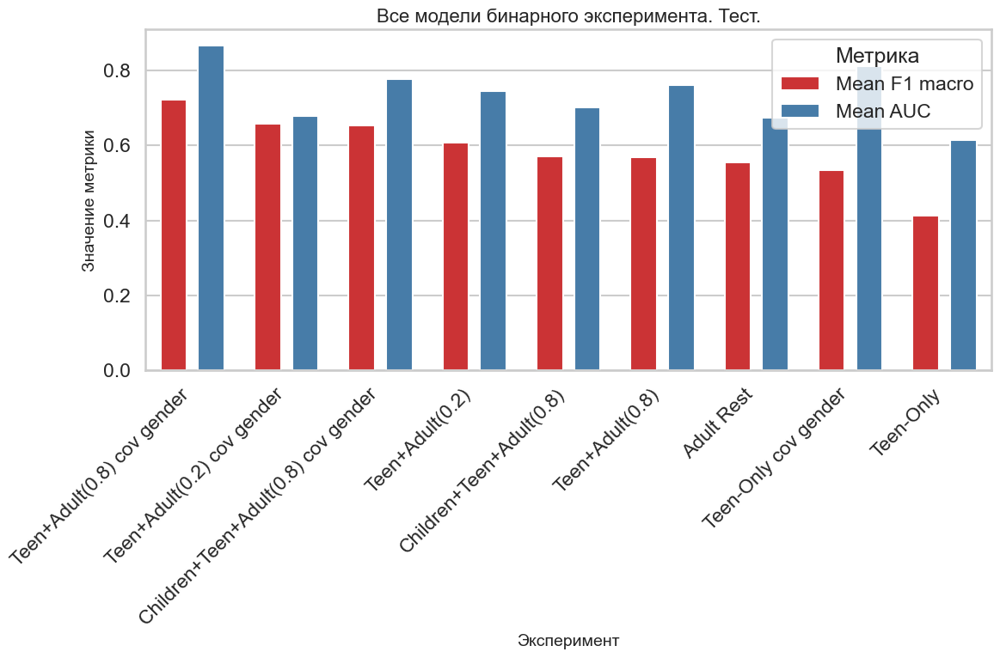

In [291]:
# Отрисуем сравнительную диаграмму для всех метрик для всех моделей на тесте для бинарного эксперимента
plot_comparative_metric(combined_test_results_df_bin, ['Mean F1 macro', 'Mean AUC'], 'Все модели бинарного эксперимента. Тест.')

In [292]:
# Объединим результаты тестов для всех моделей мультиклассового эксперимента (Phase_1, Phase 2 и Phase 3) в один датафрейм для удобства сравнения всех моделей между собой.
combined_test_results_df_mul = pd.concat([Phase_1_test_results_df_mul, Phase_2_test_results_df_mul, Phase_3_test_results_df_mul], axis=0, ignore_index=True)
print("Объединённые результаты тестов для всех моделей мультиклассового эксперимента (Phase 1, Phase 2 и Phase 3):")
display(combined_test_results_df_mul)

Объединённые результаты тестов для всех моделей мультиклассового эксперимента (Phase 1, Phase 2 и Phase 3):


,n_seeds,Mean AUC,Std AUC,Div AUC,Div F1 macro,Mean F1 macro,experiment,Std F1 macro
0,5,0.548954,0.083435,0.151989,0.021126,0.426176,Teen-Only,0.009004
1,5,0.556079,0.116737,0.209929,0.111189,0.407329,Adult Rest,0.045290
2,5,0.756872,0.048481,0.064055,0.070246,0.508315,Teen+Adult(0.2),0.035707
3,5,0.801047,0.016390,0.020461,0.075472,0.488966,Teen+Adult(0.8),0.036903
4,5,0.682690,0.039904,0.058451,0.122816,0.419125,Children+Teen+Adult(0.8),0.051475
5,5,0.718971,0.038783,0.053942,0.064836,0.565392,Teen+Adult(0.8) cov gender,0.036657
6,5,0.731354,0.012226,0.016717,0.041857,0.501278,Teen-Only cov gender,0.020982
7,5,0.744615,0.040663,0.054610,0.054713,0.494524,Teen+Adult(0.2) cov gender,0.027057
8,5,0.692054,0.007926,0.011453,0.046533,0.492988,Children+Teen+Adult(0.8) cov gender,0.022940


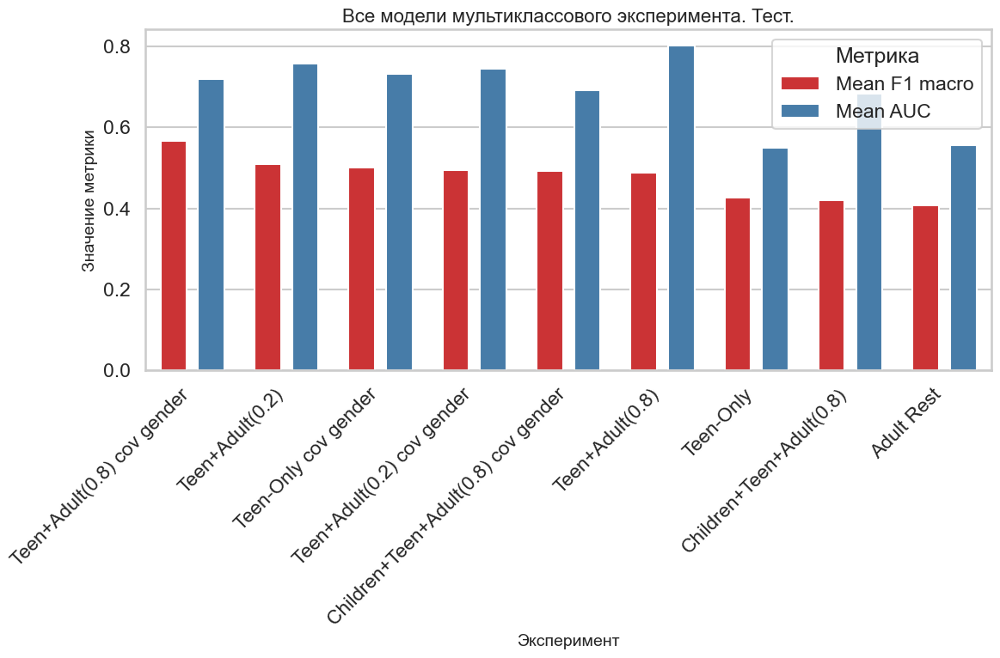

In [293]:
# Отрисуем сравнительную диаграмму для всех метрик для всех моделей на тесте для мультиклассового эксперимента
plot_comparative_metric(combined_test_results_df_mul, ['Mean F1 macro', 'Mean AUC'], 'Все модели мультиклассового эксперимента. Тест.')

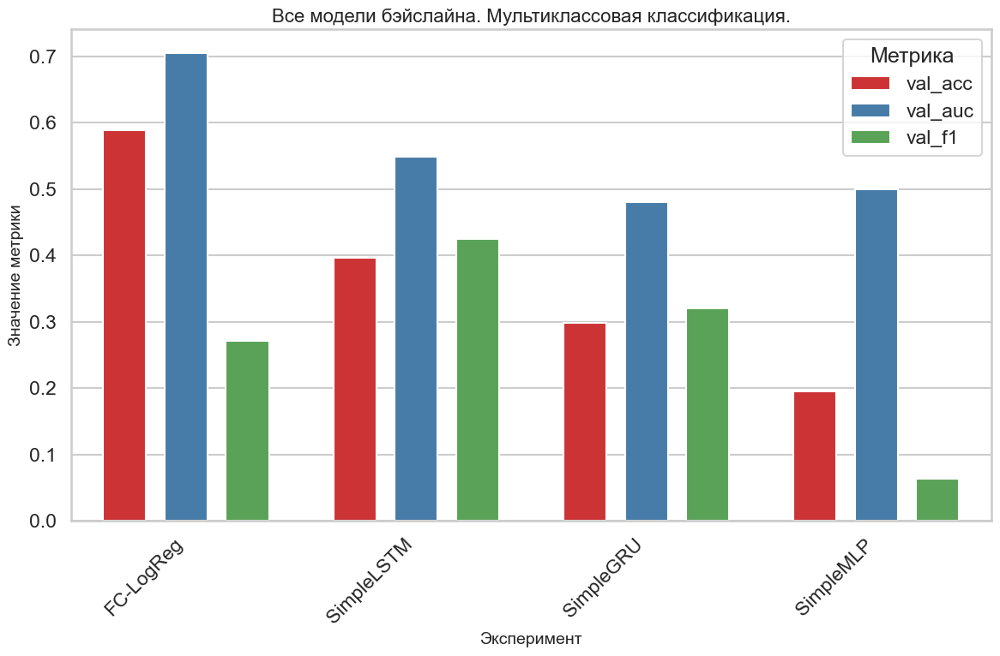

In [294]:
# Отрисуем сравнительную диаграмму для всех метрик для всех моделей на валидации для мультиклассового бэйслайна (Phase 1), так как в эксперименте 1 обучались только модели мультиклассовой классификации, а модели бинарной классификации были добавлены только в эксперименте 6 для сравнения с бэйслайнами.
plot_comparative_metric(experiment_1_baseline_mul_results_df, ['val_acc', 'val_auc', 'val_f1'], 'Все модели бэйслайна. Мультиклассовая классификация.')

In [295]:
# rows = [
#     ["Отбор данных","ADHD200; когорты 12–15 и 16–21; унификация ID; контроль утечки (splits по participant_id)",
#      "Фенотипы (CSV), фильтры по возрасту, групповые сплиты по participant_id","Сделано"],
#     ["Подготовка сигналов","ROI-тайм-серии Athena; окна фикс. длины T_FIX; mask паддинга; TR из BIDS",
#      ".npy/.tsv.gz (T×R), *_mask.npy, *_bold.json","Сделано"],
#     ["Базовые признаки","Статическая FC из окна (Fisher-z верхний треугольник)",
#      "Внутренняя функция расчёта FC; baseline","Сделано"],
#     ["Ковариаты","Age / Gender / Site (предобработка и добавление в модель)",
#      "ColumnTransformer: StandardScaler + OneHotEncoder (fit на train)","Сделано"],
#     ["Модели (последоват.)","LSTM, GRU на (T, R) с поддержкой mask (зануление/pack)",
#      "PyTorch DataLoader (B, T, R)","Сделано"],
#     ["Основная модель","ROISequenceNet: Conv1d по времени per-ROI + Self-Attention по ROI + классификация",
#      "PyTorch; вход (T, R); mask учитывается","Сделано"],
#     ["Бейзлайн (классика)","LogisticRegression на статической FC","scikit-learn","Сделано"],
#     ["Валидация и метрики","StratifiedGroupKFold / GroupShuffleSplit по participant_id; Accuracy/Precision/F1/AUC",
#      "sklearn.metrics; логирование результатов","Сделано (нестабильность из-за объёма)"],
#     ["Гармонизация по сайту","Коррекция межсайтовых сдвигов (ComBat)","neuroComBat/аналог","План"],
#     ["Motion-QC","FD/DVARS как ковариаты/фильтр; скраббинг","Конфаунды из fMRIPrep/Athena","План"],
#     ["dFC-признаки","Окна → FC-векторы → k-means состояния → occupancy/transition/dwell",
#      "DFC_CSV + MLP/ROISequenceNet","План"],
#     ["Последовательность окон","TCN/Transformer «по окнам» (моделирование переходов состояний)",
#      "PyTorch (вторая ось времени: окно→окно)","План"],
#     ["Интерпретация","Пермутационные важности, Integrated Gradients, карты внимания",
#      "Captum/собственные процедуры","План"],
#     ["Воспроизводимость","2 ноутбука: (1) подготовка/QC, (2) обучение/оценка; фиксация seed/версий",
#      "Версионирование манифеста/парцелляций/конфигов","Сделано"],
# ]

# df = pd.DataFrame(rows, columns=["Этап","Метод / данные","Инструменты и артефакты","Статус"])

# out_xls  = Path("methodology_ADHD200.xls")
# out_xlsx = Path("methodology_ADHD200.xlsx")
# out_csv  = Path("methodology_ADHD200.csv")

# # Удаляем старые файлы, если есть
# for f in [out_xls, out_xlsx, out_csv]:
#     if f.exists():
#         f.unlink()

# saved = None
# try:
#     df.to_excel(out_xls, index=False)      # требует пакет xlwt для .xls
#     saved = out_xls
# except Exception:
#     df.to_excel(out_xlsx, index=False)     # универсальный .xlsx (требует openpyxl)
#     saved = out_xlsx

# df.to_csv(out_csv, index=False)

# print("Saved Excel to:", saved.resolve())
# print("Also CSV:", out_csv.resolve())